# Notes
- unlike in _Generalized neural decoders for transfer learning across participants and recording modalities (J Neur. Eng.)_, we pre-train contrastively (without labels, although they exist). They pre-train on 11 datasets of 12.

In [13]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [14]:
%autoreload 2

import os, argparse, json, copy, wandb, time

import umap
from sklearn.manifold import TSNE

from sklearn.model_selection import train_test_split
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from dataset_utils import *
from utils import HiddenPrints
import torch.fft as fft
from einops import rearrange, repeat

import pandas as pd
import numpy as np
from termcolor import cprint
from pprint import pprint
from tqdm import tqdm
from datetime import datetime

from train import finetune

from trainer import Trainer, model_finetune, model_test, model_pretrain
from train import evaluate

from augmentations import *
from dataloader import MIdatasetMC
from config_files.BIG_EEG_MI_1chRearrange_bigger import Config as Configs
# from config_files.BIG_EEG_MI_1chRearrange_bigger_1 import Config as Configs
from utils import _logger, set_requires_grad
from model import *
from EEGNetContrastive import EEGNetContrastive, ClassifierOnTopOfPreTrainedEEGNet
from utils import _calc_metrics, copy_Files
from loss import * # base_Model, base_Model_F, target_classifier
from sklearn.metrics import cohen_kappa_score as kappa



# For Arial
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams['font.family'] = "sans-serif"
matplotlib.rcParams['font.sans-serif'] = "Arial"
matplotlib.rcParams["text.usetex"] = False

# for latex:
# matplotlib.rcParams['font.family'] = "DejaVu Sans"
# matplotlib.rcParams['font.serif'] = "Computer Modern"
# matplotlib.rcParams["text.usetex"] = True

matplotlib.rcParams["lines.linewidth"] = 3
matplotlib.rcParams["xtick.direction"] = "out"
matplotlib.rcParams["ytick.direction"] = "out"
matplotlib.rcParams["axes.labelsize"] = 22
matplotlib.rcParams["xtick.labelsize"] = 22
matplotlib.rcParams["ytick.labelsize"] = 22
matplotlib.rcParams["font.size"] = 22
matplotlib.rcParams["legend.fontsize"] = 22
matplotlib.rcParams["axes.titlesize"] = 22
matplotlib.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams["figure.autolayout"] = True

matplotlib.rcParams['axes.spines.right'] = False
matplotlib.rcParams['axes.spines.top'] = False

bar_format='{l_bar}{bar:10}{r_bar}{bar:-10b}'

print(f'CUDA available: {torch.cuda.is_available()}')
cprint(torch.__version__, color='green')
device_count = torch.cuda.device_count()
for i in range(device_count):
    torch.cuda.set_device(i)
    cur_device_id = torch.cuda.current_device()
    cur_device_name = torch.cuda.get_device_name(cur_device_id)
    print(f'Current device:\nID {cur_device_id} | Name: {cur_device_name}')
    print(f'supported arch list: {torch.cuda.get_arch_list()}\n')
    

CUDA available: True
1.12.1+cu113
Current device:
ID 0 | Name: RTX A6000
supported arch list: ['sm_37', 'sm_50', 'sm_60', 'sm_70', 'sm_75', 'sm_80', 'sm_86']

Current device:
ID 1 | Name: Quadro P2200
supported arch list: ['sm_37', 'sm_50', 'sm_60', 'sm_70', 'sm_75', 'sm_80', 'sm_86']



In [15]:
device = 'cuda:0'
configs = Configs()
# configs.report()

In [19]:
# load the data and instantiate the Dataset class

path = '/home/roman/CODE/tachikoma-analysis/DATA2'
dataset = torch.load(os.path.join(path, "BIG_MI_12_datasets_53213samp.pt"))
dataset['info']

"Srate = 100 Hz, passband: 0-45 Hz, channels ['F3', 'F4', 'Fz', 'Cz', 'P3', 'P4', 'Pz']. See meta for more details. See /home/roman/CODE/tachikoma-analysis/DATA"

# Splits 

Split the combined dataset into `pretrain_dataset` and `target_dataset` datsets. Then split the `target_dataset` into `finetune_dataset` and `test_datset`

In [20]:
shuffle = False
# targetDsName = 'BNCIPhysionetMotorImagery.pt'
targetDsName = 'BNCI001-2014.pt' # Graz 2a

test_subject = 1

pretrain_dataset, target_dataset = SplitIntoPretrainAndFinetune(dataset, targetDsName)
train_dataset, test_dataset = get_train_test_datasets(target_dataset, shuffle=shuffle, test_subject=test_subject)

# small fine-tuning dataset, big test dataset
train_dataset, test_dataset  = get_train_test_datasets(target_dataset, shuffle=shuffle, test_subject=test_subject)

Nsubj = len(train_dataset['meta'].subject.unique())
cprint(f"Number of subjects in train_dataset: {Nsubj}", color='blue')
print(dataset['meta'].ds.unique())

BNCI001-2014.pt
pretrain_dataset: torch.Size([50621])
['right_hand' 'left_hand']
target_dataset: torch.Size([2592])
Total samples in pretrain and finetune: 53213
test_subject: 1
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
test_subject: 1
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
Number of subjects in train_dataset: 8
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']


In [23]:
print(pretrain_dataset['labels'].unique())

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])


In [10]:
test_dataset['info']

"Srate = 100 Hz, passband: 0-45 Hz, channels ['F3', 'F4', 'Fz', 'Cz', 'P3', 'P4', 'Pz']. See meta for more details. See /home/roman/CODE/tachikoma-analysis/DATA"

In [11]:
test_dataset['meta']

,subject,session,run,label,ds,class_id
30592,9,session_E,run_0,left_hand,BNCI001-2014.pt,1
30593,9,session_E,run_0,right_hand,BNCI001-2014.pt,0
30594,9,session_E,run_0,right_hand,BNCI001-2014.pt,0
30595,9,session_E,run_0,left_hand,BNCI001-2014.pt,1
30596,9,session_E,run_0,right_hand,BNCI001-2014.pt,0
...,...,...,...,...,...,...
30731,9,session_E,run_5,left_hand,BNCI001-2014.pt,1
30732,9,session_E,run_5,left_hand,BNCI001-2014.pt,1
30733,9,session_E,run_5,left_hand,BNCI001-2014.pt,1
30734,9,session_E,run_5,right_hand,BNCI001-2014.pt,0


`pretrain_dataset` - contains all the datasets except `target_dataset` (the one held out and to be split for fine-tuning and testing)

`target_dataset` - contains dataset that is held out for fine-tuning and testing

In [15]:
# target dataset
print('Number of samples:', target_dataset['meta'].shape[0])
print('Number of subjects:', target_dataset['meta'].subject.unique())
print('Sessions:', target_dataset['meta'].session.unique())
print('Runs:', target_dataset['meta'].run.unique())

Number of samples: 2592
Number of subjects: [1 2 3 4 5 6 7 8 9]
Sessions: ['session_T' 'session_E']
Runs: ['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']


# `train_dataset` and `test_dataset`
Datasets that are selected from `target_dataset` for fine-tuning and testing, respectively.

In [16]:
print(train_dataset['meta'].session.unique())
print(train_dataset['meta'].run.unique())
print(train_dataset['meta'].shape)
print(train_dataset['meta'].label.unique())

['session_T' 'session_E']
['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']
(2304, 6)
['left_hand' 'right_hand']


In [17]:
print(test_dataset['meta'].session.unique())
print(test_dataset['meta'].run.unique())
print(test_dataset['meta'].shape)
print(test_dataset['meta'].label.unique())

['session_T' 'session_E']
['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']
(288, 6)
['right_hand' 'left_hand']


<AxesSubplot:>

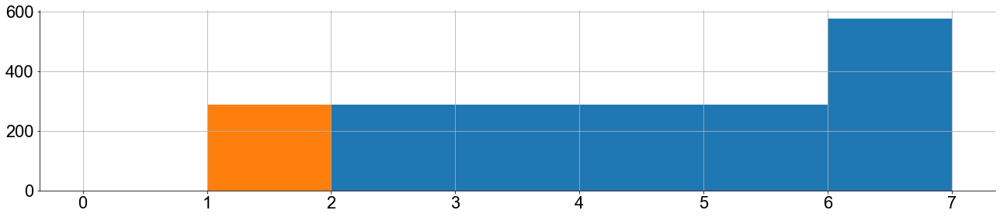

In [18]:
fig, ax = plt.subplots(1,1, figsize=(18,4))
train_dataset['meta'].subject.hist(ax=ax, bins=range(0,Nsubj), label='train')
test_dataset['meta'].subject.hist(ax=ax, bins=range(0,Nsubj), label='test')

In [19]:
!pwd

/home/roman/CODE/tachikoma-analysis/TF-C/code


In [20]:
EEGnet = EEGNetContrastive(num_chan=7, kerLen=31, drop=0.5, F1=8, D=2, F2=16, emdim=48, device=device)
EEGnet.summary(num_time_samples=120)

******************************************************************************************
For 120 time samples, the network will look like this:
------------------------------------------------------------------------------------------
Conv2d(1, 8, kernel_size=(1, 31), stride=(1, 1), padding=same, bias=False)
------------------------------------------------------------------------------------------
Input: torch.Size([10, 1, 7, 120])
weight, torch.Size([8, 1, 1, 31]), Nparams: 248
Output: torch.Size([10, 8, 7, 120])

------------------------------------------------------------------------------------------
BatchNorm2d(8, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
------------------------------------------------------------------------------------------
Input: torch.Size([10, 8, 7, 120])
weight, torch.Size([8]), Nparams: 8
bias, torch.Size([8]), Nparams: 8
Output: torch.Size([10, 8, 7, 120])

--------------------------------------------------------------------------

# Pre-train the model

In [21]:
wandb.config = configs
wandb.init(project=f"EEGNet_7ch_BIGGER_pretrain_on_temp_augs_target_{targetDsName}", 
           entity="nightdude",
           config=wandb.config,
           save_code=False)
wandb.watch(EEGnet, log_freq=10)

# instantiate the Dataset class
pretrain_ds = MIdatasetMC(pretrain_dataset, configs)

# instantiate a dataloader for the fine-tuning dataset
pretrain_dl = torch.utils.data.DataLoader(
    dataset=pretrain_ds,
    batch_size=configs.batch_size,
    shuffle=True,
    drop_last=True,
    pin_memory=False,
    num_workers=14) # optimal: 14 workers with batch_size=60

EEGnet.model.train()
model_optimizer = torch.optim.AdamW(EEGnet.model.parameters(),
                                   lr=configs.lr*5, # <<<<<<<<<<<<<<<<<<<<<<<<,
                                   betas=(configs.beta1, configs.beta2),
                                   weight_decay=3e-4)

nt_xent_criterion = NTXentLoss_poly(
            device,
            configs.batch_size,
            configs.Context_Cont.temperature,
            configs.Context_Cont.use_cosine_similarity, 
            batch_mult=1)  # needed for the reaarrange variant. Leave at default for others.

EPOCHS = 600
L = []


for ep in range(0, EPOCHS):
    epoch_loss = []
    for i, (x_t, y, x_t_aug, x_f, x_f_aug, msk_t, msk_f, meta) in tqdm(enumerate(pretrain_dl)):

        x_t = x_t.float().to(device)
        y = y.long().to(device)
        x_t_aug = x_t_aug.float().to(device)
        # x_f, x_f_aug = x_f.float().to(device), x_f_aug.float().to(device)
        
        model_optimizer.zero_grad()

        # embed time representation and frequency representations (h). Z's are projections into joint TF space
        h_t = EEGnet.forward(x_t)                         # original data
        h_t_aug = EEGnet.forward(x_t_aug)                 # augmented data

        
        loss = nt_xent_criterion(h_t, h_t_aug) # original and perturbed data should be close in TD embedding space
        epoch_loss.append(loss.item())

        performance_now = {
            'ep': ep,
            'it': i,
            'loss': loss.item(),
            'ep_loss': np.mean(epoch_loss)}
        L.append(performance_now)
        wandb.log(performance_now)
        
        loss.backward()
        model_optimizer.step()
        EEGnet.max_norm()
wandb.finish()

wandb: Currently logged in as: nightdude. Use `wandb login --relogin` to force relogin


torch.Size([50621, 7, 120])


527it [00:06, 84.25it/s]
527it [00:06, 87.35it/s]
527it [00:06, 85.91it/s] 
527it [00:06, 86.08it/s]
527it [00:06, 83.42it/s]
527it [00:06, 85.97it/s]
527it [00:06, 85.72it/s]
527it [00:06, 83.62it/s]
527it [00:06, 85.22it/s]
527it [00:06, 87.40it/s]
527it [00:06, 86.38it/s] 
527it [00:06, 87.42it/s]
527it [00:06, 87.74it/s]
527it [00:05, 88.54it/s]
527it [00:06, 85.74it/s]
527it [00:06, 84.98it/s]
527it [00:06, 86.32it/s]
527it [00:06, 84.54it/s]
527it [00:06, 85.32it/s]
527it [00:06, 84.57it/s]
527it [00:06, 87.01it/s]
527it [00:06, 85.61it/s]
527it [00:06, 86.49it/s]
527it [00:06, 85.83it/s]
527it [00:06, 87.42it/s] 
527it [00:06, 86.69it/s]
527it [00:06, 85.93it/s]
527it [00:05, 89.75it/s] 
527it [00:05, 88.44it/s] 
527it [00:06, 87.59it/s]
527it [00:06, 86.00it/s]
527it [00:06, 87.19it/s]
527it [00:06, 85.66it/s]
527it [00:06, 86.53it/s] 
527it [00:06, 84.35it/s]
527it [00:06, 85.64it/s] 
527it [00:06, 86.44it/s] 
527it [00:06, 85.98it/s]
527it [00:06, 87.35it/s] 
527it [00:06, 86

<AxesSubplot:xlabel='ep'>

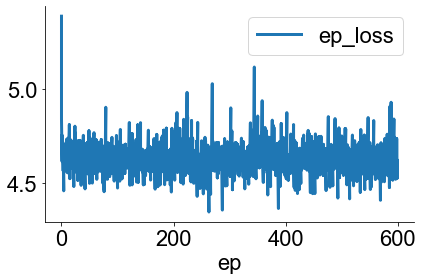

In [22]:
pd.DataFrame(L).plot(x='ep', y='ep_loss')

In [23]:
# save model parameters
# torch.save(EEGnet.state_dict(), 'EEGNet_7ch_BIGGER_pretrain_on_temp_augs.wts')
# torch.save(EEGnet.state_dict(), 'EEGNet_7ch_BIGGER_pretrain_on_temp_augs_Flatten.wts')
torch.save(EEGnet.state_dict(), 'EEGNet_7ch_BIGGER_pretrain_on_temp_augs_Flatten_aug_conf1.wts')

In [5]:
classifier = ClassifierOnTopOfPreTrainedEEGNet(emdim=48, num_classes=2)
classifier

number of parameters in model: 1274


ClassifierOnTopOfPreTrainedEEGNet(
  (layer0): Linear(in_features=48, out_features=24, bias=True)
  (layer1): Linear(in_features=24, out_features=2, bias=True)
  (dropout): Dropout(p=0.15, inplace=False)
  (activate): ELU(alpha=1.0)
  (bn): BatchNorm1d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)

# Finetune EEGNet on several subjects in a held out dataset, test on the ONE held-out subject from the held-out dataset

In [6]:
def EEGNet_finetune(train_dataset, test_dataset,
                    epochs=50, mode='untrained feat det', targetDsName=None, subjID=None):
    
    EEGnet = EEGNetContrastive(num_chan=7, kerLen=31, drop=0.5, F1=8, D=2, F2=16, emdim=48, device=device)
    if not mode == 'trained_unfrozen_fd':
        EEGnet.load_state_dict(torch.load('EEGNet_7ch_BIGGER_pretrain_on_temp_augs_Flatten.wts'))
    
    # EEGnet.summary(num_time_samples=120)
    
    nclass = len(test_dataset['meta'].class_id.unique())
    cprint(f'number of classes: {nclass}', 'red')
    
    classifier = ClassifierOnTopOfPreTrainedEEGNet(emdim=48, num_classes=nclass).to(device)
    
    
    wandb.config = configs
    wandb.init(project="EEGNet_7ch_BIGGER_finetune_on_temp_augs_ftmany_tst1",
               group=f'{mode}_{targetDsName}_{subjID}',
               entity="nightdude",
               config=wandb.config,
               save_code=False)
    wandb.watch((EEGnet, classifier), log_freq=10)
   

    nt_xent_criterion = NTXentLoss_poly(
            device,
            configs.batch_size,
            configs.Context_Cont.temperature,
            configs.Context_Cont.use_cosine_similarity, 
            batch_mult=1)  # needed for the reaarrange variant. Leave at default for others.
    feature_extractor_optimizer = torch.optim.AdamW(
        EEGnet.model.parameters(),
        lr=configs.lr,
        betas=(configs.beta1, configs.beta2),
        weight_decay=3e-4)
    
    classifer_criterion = nn.CrossEntropyLoss()
    classifier_optimizer = torch.optim.AdamW(
        classifier.parameters(),
        lr=configs.lr,
        betas=(configs.beta1, configs.beta2),
        weight_decay=3e-4)


    # instantiate the Dataset class
    ds = MIdatasetMC(train_dataset, configs)

    # instantiate a dataloader for the fine-tuning dataset
    dl = torch.utils.data.DataLoader(dataset=ds,
                                              batch_size=configs.batch_size,
                                              shuffle=True,
                                              drop_last=True,
                                              num_workers=14)  # optimal: 14 workers with batch_size=60
    
    EVAL_ACC = []
    evalAcc = 0
    for ep in range(epochs):
        epAcc = []
        pbar = tqdm(enumerate(dl))
        
        if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:
            EEGnet.model.train()
        else:
            EEGnet.model.eval()
        
        classifier.train()
    
        for i, (x_t, y, x_t_aug, x_f, x_f_aug, msk_t, msk_f, meta) in pbar:

            x_t = x_t.float().to(device)
            y = y.long().to(device)
            x_t_aug = x_t_aug.float().to(device)
            

            feature_extractor_optimizer.zero_grad()
            classifier_optimizer.zero_grad()
        
            # embed time representation and frequency representations (h). Z's are projections into joint TF space
            h_t = EEGnet.forward(x_t)                         # original data
            h_t_aug = EEGnet.forward(x_t_aug)                 # augmented data
            pred = classifier(h_t)
            
            class_loss = classifer_criterion(pred, y)  # predictor loss, actually, here is training loss
            feat_loss = nt_xent_criterion(h_t, h_t_aug) # original and perturbed data should be close in TD embedding space
            
            if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:                
                total_loss = feat_loss + class_loss
            else:
                total_loss = class_loss
        
            total_loss.backward()
            
            if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:
                feature_extractor_optimizer.step()
                EEGnet.max_norm()
            classifier_optimizer.step()
            
            withinBatchAcc = np.mean([(p == l) for p, l in zip(pred.argmax(axis=1).tolist(), y.tolist())])
            epAcc.append(withinBatchAcc)
            pbar.set_description(f'epoch_acc: {np.mean(epAcc):.2f} evalAcc: {evalAcc:.2f} batch_acc: {withinBatchAcc:.2f}')
            


        # evaluate:
        EEGnet.model.eval()
        classifier.eval()
        x_t = test_dataset['samples'].float().to(device)
        y = test_dataset['labels']
        h_t = EEGnet.forward(x_t)
        pred = classifier(h_t)
        evalAcc = np.mean([(p == l) for p, l in zip(pred.argmax(axis=1).tolist(), y.tolist())])
        pbar.set_description(f'epoch_acc: {np.mean(epAcc):.2f} evalAcc: {evalAcc:.2f} batch_acc: {withinBatchAcc:.2f}')
        EVAL_ACC.append(evalAcc)
        
        performance_now = {
            'ep': ep,
            'feat_loss': feat_loss.item(),
            'class_loss': class_loss.item(),
            'total_loss': total_loss.item(),
            'train_acc': np.mean(epAcc),
            'eval_acc': evalAcc}
        wandb.log(performance_now)
        
    wandb.finish()
    return np.max(EVAL_ACC), np.mean(epAcc)


modes = [f'trained_unfrozen_fd',
         f'untrained_unfrozen_fd',
         f'trained_frozen_fd']


targetDsName = 'BNCI001-2014.pt'
shuffle = False


pretrain_dataset, target_dataset = SplitIntoPretrainAndFinetune(dataset, targetDsName)

for test_subject in target_dataset['meta'].subject.unique():
    train_dataset, test_dataset  = get_train_test_datasets(target_dataset, shuffle=shuffle, test_subject=test_subject)
    for i in range(3):
        for mode in modes:
            EEGNet_finetune(train_dataset, test_dataset,
                            epochs=100, mode=mode, targetDsName=targetDsName, subjID=test_subject)
            

BNCI001-2014.pt
pretrain_dataset: torch.Size([50621])
['right_hand' 'left_hand']
target_dataset: torch.Size([2592])
Total samples in pretrain and finetune: 53213
test_subject: 1
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
number of classes: 2
number of parameters in model: 1274


wandb: Currently logged in as: nightdude. Use `wandb login --relogin` to force relogin


torch.Size([2304, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.50: : 24it [00:02,  9.38it/s]
epoch_acc: 0.51 evalAcc: 0.51 batch_acc: 0.58: : 24it [00:00, 38.33it/s]
epoch_acc: 0.54 evalAcc: 0.56 batch_acc: 0.58: : 24it [00:00, 35.07it/s]
epoch_acc: 0.55 evalAcc: 0.55 batch_acc: 0.56: : 24it [00:00, 41.37it/s]
epoch_acc: 0.57 evalAcc: 0.61 batch_acc: 0.64: : 24it [00:00, 34.62it/s]
epoch_acc: 0.61 evalAcc: 0.63 batch_acc: 0.74: : 24it [00:00, 42.65it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.66: : 24it [00:00, 39.22it/s]
epoch_acc: 0.63 evalAcc: 0.62 batch_acc: 0.61: : 24it [00:00, 41.84it/s]
epoch_acc: 0.65 evalAcc: 0.64 batch_acc: 0.69: : 24it [00:00, 40.51it/s]
epoch_acc: 0.66 evalAcc: 0.64 batch_acc: 0.62: : 24it [00:00, 44.25it/s]
epoch_acc: 0.66 evalAcc: 0.63 batch_acc: 0.62: : 24it [00:00, 43.02it/s]
epoch_acc: 0.66 evalAcc: 0.62 batch_acc: 0.70: : 24it [00:00, 39.68it/s]
epoch_acc: 0.67 evalAcc: 0.63 batch_acc: 0.68: : 24it [00:00, 33.90it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.65: : 24

class_loss,██▅▆▆▅▅▅▄▄▅▄▅▄▁▄▄▄▃▂▅▃▄▅▃▁▄▆▆▂▃▄▃▂▆▁▂▅▄▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▃▇█▇▇█▇▇▆▅▆▅▄▆▄▄▅▅▆▅▅▅▅▄▅▅▅▆▃▅▇▆▅▆▅▇▆▆▆
feat_loss,█▆▆▅▅▄▄▃▃▃▃▂▃▂▃▂▂▂▁▂▁▂▂▃▂▂▂▁▂▂▂▂▂▁▂▁▂▂▂▂
total_loss,█▇▅▅▅▄▄▃▃▃▄▃▃▂▂▂▂▃▁▂▂▂▂▃▂▂▂▂▃▂▂▂▂▁▃▁▂▃▂▂
train_acc,▁▂▅▅▆▇▇▇▇▇▇█▇▇▇▇▇█▇▇█▇████▇█▇█████▇▇████
class_loss,0.56996
ep,99
eval_acc,0.60069
feat_loss,4.613
total_loss,5.18295


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.62: : 24it [00:00, 46.43it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.59: : 24it [00:00, 45.00it/s]
epoch_acc: 0.63 evalAcc: 0.49 batch_acc: 0.60: : 24it [00:00, 38.48it/s]
epoch_acc: 0.63 evalAcc: 0.52 batch_acc: 0.61: : 24it [00:00, 37.13it/s]
epoch_acc: 0.66 evalAcc: 0.56 batch_acc: 0.65: : 24it [00:00, 42.14it/s]
epoch_acc: 0.66 evalAcc: 0.58 batch_acc: 0.62: : 24it [00:00, 44.31it/s]
epoch_acc: 0.67 evalAcc: 0.56 batch_acc: 0.73: : 24it [00:00, 41.57it/s]
epoch_acc: 0.69 evalAcc: 0.55 batch_acc: 0.62: : 24it [00:00, 40.25it/s]
epoch_acc: 0.68 evalAcc: 0.54 batch_acc: 0.62: : 24it [00:00, 43.69it/s]
epoch_acc: 0.70 evalAcc: 0.55 batch_acc: 0.61: : 24it [00:00, 33.07it/s]
epoch_acc: 0.69 evalAcc: 0.57 batch_acc: 0.67: : 24it [00:00, 45.55it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.69: : 24it [00:00, 41.40it/s]
epoch_acc: 0.69 evalAcc: 0.56 batch_acc: 0.59: : 24it [00:00, 38.67it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.70: : 24

class_loss,▆▆▄▇▄█▄▃▄▂▄▅▃▄▃▂▄▃▃▅▃▄▄▅▂▂▄▄▅▂▃▄▁▄▅▃▄▄▅▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▂▅▄▆▆▆▄▆▇▇▅▆▅▇▇█▇▅▆▇▆▇▆▆▇▆█▅▆▇▇▆█▇▇▆▆▅▅
feat_loss,▅▆▆▄▂▂▂█▂▄▄▃▂▄▃▁▄▅▄▃▃▂▃▂▅▄▁▅▂▄▃▃▅▂▅▄▃▃▂▄
total_loss,██▇█▃▇▃█▃▃▆▅▃▆▄▁▅▅▅▅▃▄▄▄▅▄▃▆▄▃▄▄▃▃▇▄▄▅▄▄
train_acc,▁▅▆▇▇▇██▇▇████▇▇█▇████▇█████████████████
class_loss,0.52087
ep,99
eval_acc,0.54861
feat_loss,4.55849
total_loss,5.07936


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.66: : 24it [00:00, 47.86it/s]
epoch_acc: 0.59 evalAcc: 0.61 batch_acc: 0.51: : 24it [00:00, 46.81it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 24it [00:00, 46.36it/s]
epoch_acc: 0.66 evalAcc: 0.62 batch_acc: 0.69: : 24it [00:00, 47.46it/s]
epoch_acc: 0.69 evalAcc: 0.62 batch_acc: 0.66: : 24it [00:00, 41.38it/s]
epoch_acc: 0.69 evalAcc: 0.63 batch_acc: 0.61: : 24it [00:00, 53.67it/s]
epoch_acc: 0.70 evalAcc: 0.60 batch_acc: 0.69: : 24it [00:00, 47.28it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.71: : 24it [00:00, 47.11it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.74: : 24it [00:00, 48.01it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.77: : 24it [00:00, 42.74it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.73: : 24it [00:00, 52.53it/s]
epoch_acc: 0.71 evalAcc: 0.55 batch_acc: 0.68: : 24it [00:00, 43.54it/s]
epoch_acc: 0.72 evalAcc: 0.56 batch_acc: 0.68: : 24it [00:00, 48.87it/s]
epoch_acc: 0.72 evalAcc: 0.56 batch_acc: 0.72: : 24

class_loss,█▇█▅▅▅▄▄▃▄▅▆▃▂▅▇▂▃▂▄▆▁▂▆▃▄▃▆▃▄▂▆▄▆▂▇▃▄▄▅
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▇█▆▄▁▂▁▂▂▂▄▃▃▄▄▃▃▃▃▃▄▄▄▄▄▄▄▄▅▄▄▅▅▅▄▄▅▃▄▅
feat_loss,▃▅▆▅▅▅▇▅▅▅█▅▃▃▅▃▂▅▄▁▃▃▃▄▅▆▄█▅▅▄▇▄█▇▆▅▄▃▄
total_loss,█▇█▅▅▅▄▄▃▄▅▆▃▂▅▇▂▃▂▄▆▁▂▆▃▄▃▆▃▄▂▆▄▆▂▇▃▄▄▅
train_acc,▁▅▆▆▇▇▇▇▇▇▇▇▇▇▇█▇███████▇█▇██▇██████████
class_loss,0.56935
ep,99
eval_acc,0.58681
feat_loss,4.03318
total_loss,0.56935


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.56: : 24it [00:00, 36.38it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.56: : 24it [00:00, 34.82it/s]
epoch_acc: 0.57 evalAcc: 0.59 batch_acc: 0.57: : 24it [00:00, 40.42it/s]
epoch_acc: 0.58 evalAcc: 0.64 batch_acc: 0.57: : 24it [00:00, 35.08it/s]
epoch_acc: 0.57 evalAcc: 0.66 batch_acc: 0.56: : 24it [00:00, 37.73it/s]
epoch_acc: 0.60 evalAcc: 0.69 batch_acc: 0.72: : 24it [00:00, 31.62it/s]
epoch_acc: 0.58 evalAcc: 0.67 batch_acc: 0.61: : 24it [00:00, 36.85it/s]
epoch_acc: 0.61 evalAcc: 0.65 batch_acc: 0.65: : 24it [00:00, 39.61it/s]
epoch_acc: 0.61 evalAcc: 0.61 batch_acc: 0.57: : 24it [00:00, 43.93it/s]
epoch_acc: 0.59 evalAcc: 0.68 batch_acc: 0.64: : 24it [00:00, 38.05it/s]
epoch_acc: 0.61 evalAcc: 0.68 batch_acc: 0.56: : 24it [00:00, 40.85it/s]
epoch_acc: 0.63 evalAcc: 0.68 batch_acc: 0.61: : 24it [00:00, 43.91it/s]
epoch_acc: 0.63 evalAcc: 0.67 batch_acc: 0.60: : 24it [00:00, 36.72it/s]
epoch_acc: 0.63 evalAcc: 0.67 batch_acc: 0.59: : 24

class_loss,█▇▆▆▇▆▆▅▅▇▅▅▄▆▅▃▄▃▃▂▂▂▂▄▆▂▅▃▄▄▃▂▃▄▂▆▃▃▁▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▆█▆██▇█▇▆▆▅▅▅▆▅▅▄▅▄▄▄▅▄▄▄▅▃▄▅▄▄▅▄▅▄▅▄▅▅
feat_loss,█▆▆▅▄▃▄▃▃▃▃▃▃▃▃▂▃▃▂▃▂▃▃▂▃▂▂▃▂▂▂▁▂▂▃▂▃▃▂▂
total_loss,█▆▆▅▄▄▅▃▃▄▃▃▃▃▄▂▃▃▂▂▂▂▃▂▃▂▂▃▂▂▂▁▂▂▂▃▃▂▂▂
train_acc,▁▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇█▇▇█▇████████▇███▇██
class_loss,0.54013
ep,99
eval_acc,0.59375
feat_loss,4.61037
total_loss,5.1505


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.57: : 24it [00:00, 37.88it/s]
epoch_acc: 0.60 evalAcc: 0.46 batch_acc: 0.56: : 24it [00:00, 46.19it/s]
epoch_acc: 0.63 evalAcc: 0.50 batch_acc: 0.61: : 24it [00:00, 39.75it/s]
epoch_acc: 0.65 evalAcc: 0.52 batch_acc: 0.61: : 24it [00:00, 47.18it/s]
epoch_acc: 0.66 evalAcc: 0.54 batch_acc: 0.68: : 24it [00:00, 25.06it/s]
epoch_acc: 0.66 evalAcc: 0.54 batch_acc: 0.75: : 24it [00:00, 26.28it/s]
epoch_acc: 0.67 evalAcc: 0.55 batch_acc: 0.67: : 24it [00:00, 40.67it/s]
epoch_acc: 0.68 evalAcc: 0.54 batch_acc: 0.76: : 24it [00:00, 38.09it/s]
epoch_acc: 0.67 evalAcc: 0.55 batch_acc: 0.73: : 24it [00:00, 43.30it/s]
epoch_acc: 0.69 evalAcc: 0.57 batch_acc: 0.60: : 24it [00:00, 42.14it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.65: : 24it [00:00, 37.88it/s]
epoch_acc: 0.69 evalAcc: 0.57 batch_acc: 0.71: : 24it [00:00, 42.92it/s]
epoch_acc: 0.69 evalAcc: 0.56 batch_acc: 0.69: : 24it [00:00, 36.85it/s]
epoch_acc: 0.70 evalAcc: 0.58 batch_acc: 0.74: : 24

class_loss,▇▇▃▄█▃▇▄▃▅▄▃▄▅▄▅▅▅▅▃▅▂▄▄▅▃▆▃▅▆▅▆▄▃▄▄▄▄▁▆
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▄▅▅▆▇▇▆▇▆▇▇█▆▆▇▇█▇▆▇▇▇█▆▆▇▇▇▇▇▇▆█▇▇▆▇█▆
feat_loss,▅▄▄▆▄▄▆▃▅▃▃▃▃▃█▃▆▄▅▅▃▃▄▁▄▅▄▂▆▄▃▄▁▃▃▄▁▄▆▆
total_loss,█▆▄▆▇▄█▃▄▄▄▂▃▄█▄▇▅▅▄▃▂▄▁▅▄▅▁▇▅▄▅▂▂▄▄▂▄▃▇
train_acc,▁▅▆▆▇▇▇▇▇▇▇▇█▇▇█▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇▇▇▇▇▇█▇█
class_loss,0.59691
ep,99
eval_acc,0.56944
feat_loss,4.63886
total_loss,5.23577


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.58: : 24it [00:00, 45.11it/s]
epoch_acc: 0.62 evalAcc: 0.52 batch_acc: 0.64: : 24it [00:00, 51.18it/s]
epoch_acc: 0.66 evalAcc: 0.51 batch_acc: 0.65: : 24it [00:00, 46.07it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.70: : 24it [00:00, 46.02it/s]
epoch_acc: 0.69 evalAcc: 0.54 batch_acc: 0.70: : 24it [00:00, 48.49it/s]
epoch_acc: 0.69 evalAcc: 0.56 batch_acc: 0.64: : 24it [00:00, 52.63it/s]
epoch_acc: 0.70 evalAcc: 0.56 batch_acc: 0.74: : 24it [00:00, 47.60it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.77: : 24it [00:00, 45.12it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.69: : 24it [00:00, 49.47it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.73: : 24it [00:00, 46.21it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.78: : 24it [00:00, 49.44it/s]
epoch_acc: 0.70 evalAcc: 0.57 batch_acc: 0.76: : 24it [00:00, 48.27it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 24it [00:00, 45.27it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.70: : 24

class_loss,█▇▆▃▃▃▅▅▃▅▄▃▆▃▅▅▄▄▅▂▇▃▄▄▄▂▃▅▃▂▃▃▄▄▅▃▂▁▄▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▃▁▅▆▆▆▆▇▇▇▇▇█▇▇▇█▇▇▇▇▇▇▇█▇██▇▇▇▇█████▇█▇
feat_loss,▆▅▄▄▇▅▆▄▅▂▅▅▅▄▇▄▃▃▂▃▂▇█▃▄▃▄▃▄▃▅▁▃▃▆▅▇█▅▃
total_loss,█▇▆▃▃▃▅▅▃▅▄▃▆▃▅▅▄▄▅▂▇▃▄▄▄▂▃▅▃▂▃▃▄▄▅▃▂▁▄▁
train_acc,▁▅▇▇▇▇▇▇▇▇██▇▇▇█████████████▇██████▇████
class_loss,0.45953
ep,99
eval_acc,0.57986
feat_loss,4.02936
total_loss,0.45953


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.55: : 24it [00:00, 37.17it/s]
epoch_acc: 0.53 evalAcc: 0.56 batch_acc: 0.54: : 24it [00:00, 36.73it/s]
epoch_acc: 0.54 evalAcc: 0.59 batch_acc: 0.53: : 24it [00:00, 43.52it/s]
epoch_acc: 0.52 evalAcc: 0.57 batch_acc: 0.65: : 24it [00:00, 37.57it/s]
epoch_acc: 0.51 evalAcc: 0.54 batch_acc: 0.46: : 24it [00:00, 36.18it/s]
epoch_acc: 0.55 evalAcc: 0.54 batch_acc: 0.61: : 24it [00:00, 41.14it/s]
epoch_acc: 0.54 evalAcc: 0.59 batch_acc: 0.55: : 24it [00:00, 38.44it/s]
epoch_acc: 0.56 evalAcc: 0.60 batch_acc: 0.62: : 24it [00:00, 38.50it/s]
epoch_acc: 0.56 evalAcc: 0.59 batch_acc: 0.55: : 24it [00:00, 38.87it/s]
epoch_acc: 0.56 evalAcc: 0.57 batch_acc: 0.58: : 24it [00:00, 34.00it/s]
epoch_acc: 0.60 evalAcc: 0.61 batch_acc: 0.58: : 24it [00:00, 45.49it/s]
epoch_acc: 0.59 evalAcc: 0.58 batch_acc: 0.65: : 24it [00:00, 43.94it/s]
epoch_acc: 0.59 evalAcc: 0.59 batch_acc: 0.61: : 24it [00:00, 41.48it/s]
epoch_acc: 0.61 evalAcc: 0.60 batch_acc: 0.65: : 24

class_loss,█▇▆▅▆▅▆▅▅▅▅▄▄▄▄▄▄▄▅▃▃▂▂▄▃▂▄▂▅▄▃▅▄▅▂▄▃▄▃▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▂▃▃▂▄▃███▅▆▆▄▃▃▂▄▅▃▃▃▃▂▃▃▃▃▁▃▃▃▃▃▄▂▂▄▃▄
feat_loss,█▇▅▄▄▄▄▃▄▃▃▂▃▂▃▂▃▃▂▃▁▂▂▂▂▂▁▂▃▂▂▂▂▂▂▂▂▃▂▁
total_loss,█▇▅▄▄▄▄▃▄▃▄▃▃▂▃▃▃▃▃▃▂▂▂▂▂▂▂▂▃▂▂▃▂▃▂▃▃▃▂▁
train_acc,▁▂▂▂▄▃▄▄▅▅▆▆▆▆▇▇▇▇█▇▇▇██▇▇█▇▇▇▇▇▇▇▇███▇█
class_loss,0.48006
ep,99
eval_acc,0.59722
feat_loss,4.4836
total_loss,4.96366


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.48: : 24it [00:00, 44.55it/s]
epoch_acc: 0.55 evalAcc: 0.51 batch_acc: 0.55: : 24it [00:00, 46.30it/s]
epoch_acc: 0.62 evalAcc: 0.50 batch_acc: 0.60: : 24it [00:00, 36.40it/s]
epoch_acc: 0.64 evalAcc: 0.52 batch_acc: 0.64: : 24it [00:00, 35.95it/s]
epoch_acc: 0.66 evalAcc: 0.51 batch_acc: 0.70: : 24it [00:00, 36.39it/s]
epoch_acc: 0.67 evalAcc: 0.51 batch_acc: 0.69: : 24it [00:00, 34.08it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.62: : 24it [00:00, 44.38it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.70: : 24it [00:00, 42.13it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.70: : 24it [00:00, 35.99it/s]
epoch_acc: 0.68 evalAcc: 0.52 batch_acc: 0.72: : 24it [00:00, 39.32it/s]
epoch_acc: 0.69 evalAcc: 0.53 batch_acc: 0.70: : 24it [00:00, 36.87it/s]
epoch_acc: 0.68 evalAcc: 0.54 batch_acc: 0.72: : 24it [00:00, 40.18it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.67: : 24it [00:00, 41.23it/s]
epoch_acc: 0.69 evalAcc: 0.54 batch_acc: 0.71: : 24

class_loss,█▅▄▄▃▃▃▃▂▃▂▃▃▃▃▄▇▃▅▅▄▄▄▄▃▄▃▄▃▅▅▃▃▁▃▄▅▄▃▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▂▃▃▃▃▄▃▆▃▅▄▇▆▅▃▆▇▆▅▅▇▅▄▄▆▅▆▅▅▇▆▆▆▇▇▆▆██
feat_loss,▄█▄▇▅▅█▇▆▅▅▅▃▅▄▆▅▆▃▄▃▄▄▆▃▃▅▅▅▂▅▇▆▆▁▅▂▄▃▄
total_loss,▇█▄▆▄▄▆▅▄▄▃▄▂▄▃▅▇▅▃▅▃▄▄▆▂▄▄▅▄▃▆▆▅▃▁▄▃▄▃▃
train_acc,▁▅▆▇▇▇▇█▇▇▇▇█▇▇█████████▇████▇████▇█▇██▇
class_loss,0.54385
ep,99
eval_acc,0.60417
feat_loss,4.51636
total_loss,5.06021


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.58: : 24it [00:00, 49.04it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.67: : 24it [00:00, 49.33it/s]
epoch_acc: 0.65 evalAcc: 0.56 batch_acc: 0.57: : 24it [00:00, 44.93it/s]
epoch_acc: 0.67 evalAcc: 0.57 batch_acc: 0.67: : 24it [00:00, 47.49it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.75: : 24it [00:00, 49.32it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.67: : 24it [00:00, 47.99it/s]
epoch_acc: 0.70 evalAcc: 0.58 batch_acc: 0.67: : 24it [00:00, 49.16it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.79: : 24it [00:00, 46.82it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.78: : 24it [00:00, 48.23it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 24it [00:00, 46.93it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.72: : 24it [00:00, 49.59it/s]
epoch_acc: 0.72 evalAcc: 0.56 batch_acc: 0.78: : 24it [00:00, 49.85it/s]
epoch_acc: 0.72 evalAcc: 0.56 batch_acc: 0.75: : 24it [00:00, 50.67it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.72: : 24

class_loss,▇▇▅▂▆▃▃█▄▅▃▅▅▃▄▃▄▃▆▃▅▄▄▄▃▁▃▁▁▂▄▃▄▆▆▄▁▂▄▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▆▇▆▅▆▅▆▆▆▅▆▇▆▇▆▆▆▆▇▆▇▇▇▆▇█▇▇▇▇▇▆▇▇▇██▇▇
feat_loss,▅▇▂█▅▄▅▆▅▅▃▅▃▅▇▅▁▆▅▅▆▆▆▁▅▆▇█▄▇▆▆▃▆▅▅▄▄▇▆
total_loss,▇▇▅▂▆▃▃█▄▅▃▅▅▃▄▃▄▃▆▃▅▄▄▄▃▁▃▁▁▂▄▃▄▆▆▄▁▂▄▄
train_acc,▁▅▇▇▇▇▇▇▇▇▇█▇█▇██▇██▇███████████████████
class_loss,0.55674
ep,99
eval_acc,0.58333
feat_loss,4.12636
total_loss,0.55674


test_subject: 2
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.54: : 24it [00:00, 41.22it/s]
epoch_acc: 0.55 evalAcc: 0.52 batch_acc: 0.49: : 24it [00:00, 44.64it/s]
epoch_acc: 0.58 evalAcc: 0.54 batch_acc: 0.59: : 24it [00:00, 41.27it/s]
epoch_acc: 0.59 evalAcc: 0.52 batch_acc: 0.66: : 24it [00:00, 43.40it/s]
epoch_acc: 0.61 evalAcc: 0.54 batch_acc: 0.64: : 24it [00:00, 41.47it/s]
epoch_acc: 0.63 evalAcc: 0.56 batch_acc: 0.68: : 24it [00:00, 40.55it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.60: : 24it [00:00, 42.47it/s]
epoch_acc: 0.63 evalAcc: 0.56 batch_acc: 0.67: : 24it [00:00, 39.09it/s]
epoch_acc: 0.65 evalAcc: 0.53 batch_acc: 0.69: : 24it [00:00, 40.22it/s]
epoch_acc: 0.64 evalAcc: 0.54 batch_acc: 0.66: : 24it [00:00, 38.57it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.61: : 24it [00:00, 40.48it/s]
epoch_acc: 0.66 evalAcc: 0.59 batch_acc: 0.65: : 24it [00:00, 37.96it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.65: : 24it [00:00, 38.63it/s]
epoch_acc: 0.67 evalAcc: 0.60 batch_acc: 0.68: : 24

class_loss,█▆▃▄▅▄▇▃▂▅▃▃▃▃▅▃▃▂▃▃▁▃▄▃▄▄▅▃▃▄▃▁▂▄▄▃▃▄▃▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▁▅▂▆▆▇▅▆█▇█▇██▆▆▆▆▇▆▇▇▇▆▇▇▇▆▇▆█▇▆▆█▇▇▇▇
feat_loss,█▆▅▅▄▄▃▃▃▃▃▄▂▂▃▂▂▂▃▃▂▁▃▂▂▂▂▁▂▂▃▂▂▂▁▃▂▂▂▂
total_loss,█▆▅▅▄▄▄▃▂▃▃▃▂▂▃▂▂▁▃▂▁▁▃▂▂▂▃▁▂▂▃▁▂▂▂▃▂▂▂▂
train_acc,▁▃▅▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇███▇▇▇▇█▇███▇▇██▇███▇▇
class_loss,0.54752
ep,99
eval_acc,0.61458
feat_loss,4.5995
total_loss,5.14702


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.48: : 24it [00:00, 34.54it/s]
epoch_acc: 0.55 evalAcc: 0.51 batch_acc: 0.59: : 24it [00:00, 35.00it/s]
epoch_acc: 0.60 evalAcc: 0.53 batch_acc: 0.68: : 24it [00:00, 43.72it/s]
epoch_acc: 0.63 evalAcc: 0.56 batch_acc: 0.55: : 24it [00:00, 40.78it/s]
epoch_acc: 0.66 evalAcc: 0.54 batch_acc: 0.61: : 24it [00:00, 35.88it/s]
epoch_acc: 0.65 evalAcc: 0.56 batch_acc: 0.70: : 24it [00:00, 46.04it/s]
epoch_acc: 0.67 evalAcc: 0.57 batch_acc: 0.69: : 24it [00:00, 40.88it/s]
epoch_acc: 0.67 evalAcc: 0.56 batch_acc: 0.67: : 24it [00:00, 46.12it/s]
epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.66: : 24it [00:00, 39.45it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.72: : 24it [00:00, 43.80it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.67: : 24it [00:00, 43.78it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.70: : 24it [00:00, 39.60it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.74: : 24it [00:00, 43.88it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.69: : 24

class_loss,█▄▅▆▄▄▅▄▃▃▄▄▅▄▂▄▄▄▅▃▄▃▂▄▃▄▄▁▂▅▄▄▄▅▄▄▄▃▂▆
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▄▄▅▆▆▆▃▅▆▆▆▅▇▇▇▅▇▇▇▆▆▇▅▆▆▇▆▆▆▆▆▆█▇▅▅█▇▆
feat_loss,█▆▆▆▃▃▂▃▃▄▆▅▄▄▄▁▅▃▄▄▄▅▄▅▅▃▃▅▅▅▂▆▄▃▃▃▅▂▂▂
total_loss,█▄▅▅▂▃▂▃▂▃▄▃▄▃▂▁▄▂▃▃▃▃▂▃▃▃▃▂▂▄▁▄▃▃▂▃▃▁▁▃
train_acc,▁▄▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇█▇▇
class_loss,0.66848
ep,99
eval_acc,0.60417
feat_loss,4.44885
total_loss,5.11733


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.56: : 24it [00:00, 45.39it/s]
epoch_acc: 0.58 evalAcc: 0.48 batch_acc: 0.66: : 24it [00:00, 49.17it/s]
epoch_acc: 0.63 evalAcc: 0.53 batch_acc: 0.61: : 24it [00:00, 49.00it/s]
epoch_acc: 0.66 evalAcc: 0.55 batch_acc: 0.61: : 24it [00:00, 54.32it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.69: : 24it [00:00, 46.66it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.68: : 24it [00:00, 46.39it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.71: : 24it [00:00, 45.23it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.74: : 24it [00:00, 44.45it/s]
epoch_acc: 0.70 evalAcc: 0.61 batch_acc: 0.61: : 24it [00:00, 43.27it/s]
epoch_acc: 0.70 evalAcc: 0.61 batch_acc: 0.71: : 24it [00:00, 50.76it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.73: : 24it [00:00, 44.95it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.68: : 24it [00:00, 51.78it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.70: : 24it [00:00, 43.24it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.77: : 24

class_loss,█▆▅▄▄▄▇▆▃▅▅▆▅▂▂▅▄█▁▄▃▃▄▄▃▅▃▃▄▃▂▂▂▁▅▃▃▃▂▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▄▆▇▇▇▇▇██▇█▇▇▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▆▇▇▇
feat_loss,▃▇▂▅▃▃▂▆▃▅▃▆▅▃▁▇▂▄▄▇▄▅▇▇▆▂▅▄▂▂▄▅▄▅▂▃█▅▅▄
total_loss,█▆▅▄▄▄▇▆▃▅▅▆▅▂▂▅▄█▁▄▃▃▄▄▃▅▃▃▄▃▂▂▂▁▅▃▃▃▂▄
train_acc,▁▅▇▇▇▇▇▇▇▇▇▇▇█▇▇█▇██████████████████████
class_loss,0.55784
ep,99
eval_acc,0.60764
feat_loss,4.00664
total_loss,0.55784


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.45 evalAcc: 0.00 batch_acc: 0.47: : 24it [00:00, 43.97it/s]
epoch_acc: 0.52 evalAcc: 0.53 batch_acc: 0.59: : 24it [00:00, 40.10it/s]
epoch_acc: 0.58 evalAcc: 0.57 batch_acc: 0.62: : 24it [00:00, 44.96it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.64: : 24it [00:00, 33.85it/s]
epoch_acc: 0.64 evalAcc: 0.60 batch_acc: 0.61: : 24it [00:00, 39.58it/s]
epoch_acc: 0.65 evalAcc: 0.60 batch_acc: 0.64: : 24it [00:00, 44.93it/s]
epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.65: : 24it [00:00, 39.79it/s]
epoch_acc: 0.67 evalAcc: 0.62 batch_acc: 0.66: : 24it [00:00, 39.31it/s]
epoch_acc: 0.67 evalAcc: 0.62 batch_acc: 0.65: : 24it [00:00, 38.42it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.71: : 24it [00:00, 43.05it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.69: : 24it [00:00, 44.91it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.78: : 24it [00:00, 44.35it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.60: : 24it [00:00, 32.99it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.74: : 24

class_loss,█▇▅▅▄▆▆▅▅▅▁▄▄▃▃▃▆▄▆▄▃▂▅▃▆▄▄▂▄▄▅▅▃▃▃▃▂▄▄▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁█▅█▇▆█▆▆▆▇▇▇▆▆▇▆▇▆▇▆█▇▇▇▆▆▆▆▇▇▇▆▇▇▇▇▆▇█
feat_loss,█▆▅▅▃▃▃▄▂▃▂▂▂▂▄▂▃▃▂▂▂▃▂▂▃▃▂▂▁▃▂▂▁▂▂▂▁▃▂▁
total_loss,█▆▅▅▃▃▄▄▃▃▁▂▃▂▃▂▃▃▃▂▂▂▂▂▄▃▃▂▁▃▃▂▁▂▂▂▁▃▂▂
train_acc,▁▄▆▇▇▇▇▇▇▇▇▇▇▇███████▇████████▇█████████
class_loss,0.57086
ep,99
eval_acc,0.61806
feat_loss,4.51427
total_loss,5.08513


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.64: : 24it [00:00, 47.31it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.46: : 24it [00:00, 44.92it/s]
epoch_acc: 0.61 evalAcc: 0.57 batch_acc: 0.61: : 24it [00:00, 42.68it/s]
epoch_acc: 0.65 evalAcc: 0.60 batch_acc: 0.66: : 24it [00:00, 43.72it/s]
epoch_acc: 0.66 evalAcc: 0.59 batch_acc: 0.59: : 24it [00:00, 33.64it/s]
epoch_acc: 0.67 evalAcc: 0.57 batch_acc: 0.74: : 24it [00:00, 45.62it/s]
epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.73: : 24it [00:00, 36.42it/s]
epoch_acc: 0.67 evalAcc: 0.60 batch_acc: 0.71: : 24it [00:00, 45.54it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.70: : 24it [00:00, 43.67it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.78: : 24it [00:00, 33.21it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.83: : 24it [00:00, 42.15it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 24it [00:00, 43.33it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.66: : 24it [00:00, 39.26it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.67: : 24

class_loss,█▇▅▄▁▆▅▆▅▆▆▄█▆▄▅▆▅▅▆▅▅▅▅▆▄▅█▄▂▆▄▇▄▃▄█▆▇▅
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▆▅▅▅▅▅▆▆▅▆▅▇▆▇▅▆▆▄▆▆▆▅▅▅▆▆▄▆▇▆▆▅▆▆▆▇█▇▇
feat_loss,▃▄▆▆▃▅▁▄▄▄▂▃▄▂▅▃▅▃▄▂▄▂▃▂█▁▁▄▄▂▅▃▄▂▂▄▃▃▅▁
total_loss,▅▅▆▅▁▅▁▄▄▅▃▃▅▃▄▃▅▃▄▃▄▂▃▃█▁▂▆▃▁▆▃▅▂▁▃▄▄▆▁
train_acc,▁▄▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇█▇▇██▇██▇██▇████
class_loss,0.57377
ep,99
eval_acc,0.61458
feat_loss,4.43646
total_loss,5.01023


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.56 evalAcc: 0.00 batch_acc: 0.60: : 24it [00:00, 49.58it/s]
epoch_acc: 0.65 evalAcc: 0.54 batch_acc: 0.65: : 24it [00:00, 47.35it/s]
epoch_acc: 0.67 evalAcc: 0.57 batch_acc: 0.70: : 24it [00:00, 45.12it/s]
epoch_acc: 0.70 evalAcc: 0.57 batch_acc: 0.72: : 24it [00:00, 51.13it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.68: : 24it [00:00, 50.65it/s]
epoch_acc: 0.70 evalAcc: 0.58 batch_acc: 0.72: : 24it [00:00, 48.09it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.73: : 24it [00:00, 49.83it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.78: : 24it [00:00, 44.04it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 24it [00:00, 47.28it/s]
epoch_acc: 0.72 evalAcc: 0.59 batch_acc: 0.71: : 24it [00:00, 52.50it/s]
epoch_acc: 0.70 evalAcc: 0.61 batch_acc: 0.65: : 24it [00:00, 51.24it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.73: : 24it [00:00, 49.85it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.78: : 24it [00:00, 51.02it/s]
epoch_acc: 0.72 evalAcc: 0.60 batch_acc: 0.70: : 24

class_loss,█▇▆▅▇▅▄▆▇▅▅▅▄▆▃▆▇▅▆▆▆▆▇▄▆▄█▅▅▇▆▅▄▄▇▄▁▆▆▅
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▃▄▅▅▅▆▆▅▆▅▅▅▅▆▆▆▅▆▆▅▇▇▆▆▇▇▆▇▆▇▇▇▆█▆▇▇▇▆
feat_loss,▃▄█▅▂▃▁▂▁▄▂▆▄▃▄▆▅▆▃▁▄▆▁▃▄▅▁▆▅▅▄▅▄▄▃▃▅▇▅▄
total_loss,█▇▆▅▇▅▄▆▇▅▅▅▄▆▃▆▇▅▆▆▆▆▇▄▆▄█▅▅▇▆▅▄▄▇▄▁▆▆▅
train_acc,▁▅▆▇▆▇▇▇▇▇▇▇▇▇█▇▇█▇▇█▇█▇████▇███████████
class_loss,0.53309
ep,99
eval_acc,0.61458
feat_loss,4.01343
total_loss,0.53309


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.53: : 24it [00:00, 35.54it/s]
epoch_acc: 0.53 evalAcc: 0.55 batch_acc: 0.57: : 24it [00:00, 38.23it/s]
epoch_acc: 0.56 evalAcc: 0.53 batch_acc: 0.56: : 24it [00:00, 43.30it/s]
epoch_acc: 0.59 evalAcc: 0.53 batch_acc: 0.64: : 24it [00:00, 38.17it/s]
epoch_acc: 0.60 evalAcc: 0.57 batch_acc: 0.57: : 24it [00:00, 43.93it/s]
epoch_acc: 0.61 evalAcc: 0.55 batch_acc: 0.66: : 24it [00:00, 39.70it/s]
epoch_acc: 0.62 evalAcc: 0.55 batch_acc: 0.74: : 24it [00:00, 43.59it/s]
epoch_acc: 0.63 evalAcc: 0.54 batch_acc: 0.65: : 24it [00:00, 37.26it/s]
epoch_acc: 0.64 evalAcc: 0.55 batch_acc: 0.68: : 24it [00:00, 40.13it/s]
epoch_acc: 0.66 evalAcc: 0.56 batch_acc: 0.61: : 24it [00:00, 40.37it/s]
epoch_acc: 0.64 evalAcc: 0.55 batch_acc: 0.64: : 24it [00:00, 39.83it/s]
epoch_acc: 0.65 evalAcc: 0.56 batch_acc: 0.64: : 24it [00:00, 41.84it/s]
epoch_acc: 0.65 evalAcc: 0.56 batch_acc: 0.70: : 24it [00:00, 35.16it/s]
epoch_acc: 0.66 evalAcc: 0.58 batch_acc: 0.65: : 24

class_loss,██▆▅▄▅▅▄▄▂▅▄▅█▅▄▃▁▄▄▅▂▃▂▅▄▂▄▄▆▃▂▂▄▃▂▂▆▄▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▃▁▂▃▄▅▃▂▄▄▆▇▅▆▆▆▅▇█▇▇▆▆▇▇▇▇▇▇▇▇▆▇▇█▇██▇▇
feat_loss,█▆▄▄▂▃▂▃▃▂▃▂▃▂▁▃▁▂▁▃▂▁▁▂▂▂▂▂▁▁▂▁▁▂▂▂▂▁▁▂
total_loss,█▆▄▄▂▃▃▃▃▂▃▂▃▃▂▃▁▁▁▃▂▁▁▂▂▂▁▂▁▁▂▁▁▂▂▁▁▂▁▁
train_acc,▁▃▅▅▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇███▇██▇█▇██▇█▇██
class_loss,0.56311
ep,99
eval_acc,0.59375
feat_loss,4.59718
total_loss,5.16028


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.55: : 24it [00:00, 36.13it/s]
epoch_acc: 0.55 evalAcc: 0.47 batch_acc: 0.58: : 24it [00:00, 38.16it/s]
epoch_acc: 0.60 evalAcc: 0.53 batch_acc: 0.61: : 24it [00:00, 36.22it/s]
epoch_acc: 0.62 evalAcc: 0.57 batch_acc: 0.60: : 24it [00:00, 42.54it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.67: : 24it [00:00, 36.06it/s]
epoch_acc: 0.63 evalAcc: 0.60 batch_acc: 0.65: : 24it [00:00, 43.03it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.70: : 24it [00:00, 34.76it/s]
epoch_acc: 0.66 evalAcc: 0.56 batch_acc: 0.66: : 24it [00:00, 43.76it/s]
epoch_acc: 0.67 evalAcc: 0.57 batch_acc: 0.64: : 24it [00:00, 39.91it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.66: : 24it [00:00, 37.78it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.69: : 24it [00:00, 41.10it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.59: : 24it [00:00, 34.04it/s]
epoch_acc: 0.69 evalAcc: 0.58 batch_acc: 0.73: : 24it [00:00, 42.55it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.71: : 24

class_loss,██▅▅▅▃▇▅▃▅▆▇▆▄▃█▆▅▁▃▄▂▃▆▂▂▃▃▅▃▃▂▂▇▄▂▂▂▄▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▆▆▆▆▇▆▆▇▇▇▆▇▇▇▆▇▆▇▇▇▇▇█▇▇▆▇█▇█▇█▇█▇▇▆█
feat_loss,▆▅█▇▃▄▄▅█▁▇▄▅▃▄▅▃▃▅▅▆▄▃▅▆▆▃█▅▁▅▆▆▄▅▅▅▆▄▅
total_loss,█▇█▇▄▄▆▅▇▂█▆▆▃▃▇▅▄▃▅▆▃▃▆▄▄▃▇▆▁▅▅▄▆▅▄▄▅▅▅
train_acc,▁▄▅▆▇▇▇▇▇▇██▇▇▇▇▇▇█▇██▇███▇▇█▇▇▇████▇▇██
class_loss,0.57829
ep,99
eval_acc,0.62847
feat_loss,4.54367
total_loss,5.12195


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.55: : 24it [00:00, 48.95it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.58: : 24it [00:00, 43.58it/s]
epoch_acc: 0.63 evalAcc: 0.57 batch_acc: 0.58: : 24it [00:00, 46.99it/s]
epoch_acc: 0.66 evalAcc: 0.60 batch_acc: 0.68: : 24it [00:00, 50.55it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.74: : 24it [00:00, 48.15it/s]
epoch_acc: 0.69 evalAcc: 0.58 batch_acc: 0.75: : 24it [00:00, 44.38it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.67: : 24it [00:00, 46.41it/s]
epoch_acc: 0.70 evalAcc: 0.60 batch_acc: 0.69: : 24it [00:00, 47.06it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.65: : 24it [00:00, 52.31it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.75: : 24it [00:00, 43.72it/s]
epoch_acc: 0.70 evalAcc: 0.62 batch_acc: 0.70: : 24it [00:00, 46.11it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.69: : 24it [00:00, 49.68it/s]
epoch_acc: 0.70 evalAcc: 0.61 batch_acc: 0.68: : 24it [00:00, 44.66it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.75: : 24

class_loss,██▂▅▅▅▃▆▃▄▁▄▅▃▃▅▃▁▄▃▁▃▃▄▃▂▄▄▆▃▁▄▁▄▄▃▄▃▃▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▇▆██▇█▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██
feat_loss,▅▇▆▄▁▂▃▁▇█▃█▂▄▃▃▃▆▄▃▆▃▃▅▅▄▁▃▄▇▄▃▅▅▆▂▄▄█▂
total_loss,██▂▅▅▅▃▆▃▄▁▄▅▃▃▅▃▁▄▃▁▃▃▄▃▂▄▄▆▃▁▄▁▄▄▃▄▃▃▂
train_acc,▁▅▇▇▇▇▇▇▇▇▇█▇▇▇██████▇██▇▇██████████████
class_loss,0.48469
ep,99
eval_acc,0.61458
feat_loss,3.97341
total_loss,0.48469


test_subject: 3
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.46: : 24it [00:00, 44.02it/s]
epoch_acc: 0.53 evalAcc: 0.46 batch_acc: 0.55: : 24it [00:00, 44.13it/s]
epoch_acc: 0.55 evalAcc: 0.47 batch_acc: 0.57: : 24it [00:00, 38.72it/s]
epoch_acc: 0.55 evalAcc: 0.49 batch_acc: 0.59: : 24it [00:00, 38.72it/s]
epoch_acc: 0.58 evalAcc: 0.47 batch_acc: 0.65: : 24it [00:00, 33.18it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.53: : 24it [00:00, 35.44it/s]
epoch_acc: 0.62 evalAcc: 0.53 batch_acc: 0.61: : 24it [00:00, 36.98it/s]
epoch_acc: 0.63 evalAcc: 0.52 batch_acc: 0.50: : 24it [00:00, 44.78it/s]
epoch_acc: 0.65 evalAcc: 0.53 batch_acc: 0.58: : 24it [00:00, 42.77it/s]
epoch_acc: 0.65 evalAcc: 0.51 batch_acc: 0.57: : 24it [00:00, 36.27it/s]
epoch_acc: 0.66 evalAcc: 0.56 batch_acc: 0.69: : 24it [00:00, 36.55it/s]
epoch_acc: 0.64 evalAcc: 0.55 batch_acc: 0.71: : 24it [00:00, 37.02it/s]
epoch_acc: 0.66 evalAcc: 0.54 batch_acc: 0.67: : 24it [00:00, 36.63it/s]
epoch_acc: 0.66 evalAcc: 0.57 batch_acc: 0.62: : 24

class_loss,█▆▆█▅▅▄▄▄▄▁▅▃▃▅▃▄▃▄▁▄▃▄▄▃▅▃▂▃▃▇▅▂▂▃▃▃▁▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▂▄▄▅▅▆▆▇▇▇▆█▇▇▆▇▇▇▇▇▇▇▇▇█▇▇▇████▇▇▇█▇▇█
feat_loss,█▇▅▅▄▄▃▄▄▃▄▄▃▄▃▃▂▂▂▃▂▃▂▂▁▃▃▂▂▃▂▃▂▁▂▂▂▁▂▂
total_loss,█▇▅▆▄▄▃▃▃▃▃▄▃▄▃▂▂▂▂▂▂▂▂▂▁▃▂▂▂▃▃▃▂▁▂▂▂▁▁▁
train_acc,▁▃▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇████▇▇▇▇██████▇█▇███
class_loss,0.54681
ep,99
eval_acc,0.625
feat_loss,4.57595
total_loss,5.12276


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 24it [00:00, 36.12it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.71: : 24it [00:00, 40.02it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 24it [00:00, 39.79it/s]
epoch_acc: 0.65 evalAcc: 0.58 batch_acc: 0.59: : 24it [00:00, 43.99it/s]
epoch_acc: 0.66 evalAcc: 0.60 batch_acc: 0.69: : 24it [00:00, 39.38it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.66: : 24it [00:00, 42.50it/s]
epoch_acc: 0.67 evalAcc: 0.60 batch_acc: 0.73: : 24it [00:00, 41.34it/s]
epoch_acc: 0.67 evalAcc: 0.60 batch_acc: 0.73: : 24it [00:00, 36.59it/s]
epoch_acc: 0.66 evalAcc: 0.60 batch_acc: 0.64: : 24it [00:00, 38.40it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.59: : 24it [00:00, 44.76it/s]
epoch_acc: 0.69 evalAcc: 0.61 batch_acc: 0.73: : 24it [00:00, 38.66it/s]
epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.61: : 24it [00:00, 40.75it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 24it [00:00, 40.28it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.66: : 24

class_loss,█▅▄▃▂▃▃▂▂▄▃▄▁█▄▅▅▃▄▆▂▆▃▄▇▅▇▃▄▁▄▅▂▂▃▅▆▃▂▅
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▇▇▆▆▇▇▆▅▆▇▇▇▆▆▇▆▆▇▆▇▆▆▇▆▆▇▆▇▇█▆▇█▇▇▆▆▆
feat_loss,▄▅██▅▃▇▆▅▇▅▃▄▅▆▃▇▂▅▆▃▆▅█▂▆▅▁▃▅▄▄▄▃▂▄▃▄▅▅
total_loss,▆▅█▇▄▃▇▅▅▇▄▃▃▇▆▄▇▂▅▇▃▇▅█▄▆▆▁▄▄▄▅▄▂▂▅▅▄▄▅
train_acc,▁▄▆▆▇▆▇▇▇▆▆▆▇▇▆▇▇▇▆▇▇▇▇▇▇▇▇█▇▇▇▇▇█▇█▇▇▇▇
class_loss,0.61028
ep,99
eval_acc,0.59722
feat_loss,4.53625
total_loss,5.14653


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.58: : 24it [00:00, 48.21it/s]
epoch_acc: 0.60 evalAcc: 0.50 batch_acc: 0.57: : 24it [00:00, 51.81it/s]
epoch_acc: 0.65 evalAcc: 0.56 batch_acc: 0.61: : 24it [00:00, 46.13it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.67: : 24it [00:00, 48.87it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.66: : 24it [00:00, 53.10it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.78: : 24it [00:00, 45.73it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 24it [00:00, 51.89it/s]
epoch_acc: 0.69 evalAcc: 0.60 batch_acc: 0.71: : 24it [00:00, 45.49it/s]
epoch_acc: 0.70 evalAcc: 0.60 batch_acc: 0.69: : 24it [00:00, 51.84it/s]
epoch_acc: 0.70 evalAcc: 0.60 batch_acc: 0.74: : 24it [00:00, 51.45it/s]
epoch_acc: 0.70 evalAcc: 0.60 batch_acc: 0.71: : 24it [00:00, 45.73it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.71: : 24it [00:00, 51.15it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.70: : 24it [00:00, 45.52it/s]
epoch_acc: 0.72 evalAcc: 0.62 batch_acc: 0.79: : 24

class_loss,█▇▅▆▆▆▆▃▆▅▅▄▄▃▄▃▃▅█▅▃▄▃▄▂▆▆▄▂▄▄▃▆▅▆▅▁▄▁▅
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▅▆▇▇▇▇█▇█▇▇▇▇▇█▇▇▇▇▇▇▇▇▇██▇█▇▇▇▇▆█▇▇█▇
feat_loss,▅▅▇▇▄▅█▅▆▃▄▃▄▃▆▄▁▂▆▅▆▅▃▅▅▇▅▅█▃▅▆▃▃▇▄▇▅▆▇
total_loss,█▇▅▆▆▆▆▃▆▅▅▄▄▃▄▃▃▅█▅▃▄▃▄▂▆▆▄▂▄▄▃▆▅▆▅▁▄▁▅
train_acc,▁▆▆▇▇▇▇█▇███████▇███████████████████████
class_loss,0.57308
ep,99
eval_acc,0.62153
feat_loss,4.16011
total_loss,0.57308


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.54: : 24it [00:00, 37.96it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.49: : 24it [00:00, 40.67it/s]
epoch_acc: 0.57 evalAcc: 0.56 batch_acc: 0.50: : 24it [00:00, 45.32it/s]
epoch_acc: 0.59 evalAcc: 0.61 batch_acc: 0.61: : 24it [00:00, 43.96it/s]
epoch_acc: 0.63 evalAcc: 0.61 batch_acc: 0.57: : 24it [00:00, 35.74it/s]
epoch_acc: 0.63 evalAcc: 0.59 batch_acc: 0.67: : 24it [00:00, 42.28it/s]
epoch_acc: 0.65 evalAcc: 0.60 batch_acc: 0.62: : 24it [00:00, 44.04it/s]
epoch_acc: 0.66 evalAcc: 0.61 batch_acc: 0.68: : 24it [00:00, 41.37it/s]
epoch_acc: 0.66 evalAcc: 0.60 batch_acc: 0.61: : 24it [00:00, 42.20it/s]
epoch_acc: 0.66 evalAcc: 0.59 batch_acc: 0.59: : 24it [00:00, 36.21it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.73: : 24it [00:00, 37.06it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.66: : 24it [00:00, 36.62it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.65: : 24it [00:00, 43.68it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.62: : 24

class_loss,██▄▅▄▅▄▄▂▅▄▄▃▂▃▂▅▂▅▅▃▂▃▂▃▂▁▄▅▂▁▅▃▁▅▄▃▂▅▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▆▅▅▆▆▆▇▆▆▆▆▆▇▇▆▇▇▇▇▇▆▆▆▆▆▆▆▇▆▇▆▇▇▆▆█▄▆▇
feat_loss,█▇▅▃▄▄▄▄▄▄▂▃▁▃▃▃▃▂▂▂▃▂▂▃▂▂▂▁▂▂▂▂▃▁▃▂▂▂▂▂
total_loss,█▇▅▃▃▄▄▃▃▄▂▂▁▂▃▃▃▂▂▃▃▁▂▃▂▁▂▁▂▂▂▃▂▁▃▂▂▂▃▂
train_acc,▁▃▅▆▇▇▇▇▇▇█▇▇█▇▇▇▇██▇██▇██▇▇▇█████▇███▇█
class_loss,0.59061
ep,99
eval_acc,0.63542
feat_loss,4.65503
total_loss,5.24563


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.55 evalAcc: 0.00 batch_acc: 0.51: : 24it [00:00, 36.06it/s]
epoch_acc: 0.60 evalAcc: 0.56 batch_acc: 0.59: : 24it [00:00, 38.40it/s]
epoch_acc: 0.63 evalAcc: 0.60 batch_acc: 0.64: : 24it [00:00, 39.95it/s]
epoch_acc: 0.64 evalAcc: 0.60 batch_acc: 0.62: : 24it [00:00, 41.99it/s]
epoch_acc: 0.66 evalAcc: 0.60 batch_acc: 0.68: : 24it [00:00, 44.15it/s]
epoch_acc: 0.67 evalAcc: 0.60 batch_acc: 0.67: : 24it [00:00, 42.12it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.66: : 24it [00:00, 38.21it/s]
epoch_acc: 0.67 evalAcc: 0.60 batch_acc: 0.71: : 24it [00:00, 45.56it/s]
epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.73: : 24it [00:00, 43.93it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.67: : 24it [00:00, 41.40it/s]
epoch_acc: 0.69 evalAcc: 0.61 batch_acc: 0.62: : 24it [00:00, 47.44it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.61: : 24it [00:00, 46.23it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.80: : 24it [00:00, 38.10it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 24

class_loss,█▇▃▄█▄▁▄▅▅▃▂▂▃▄▂▄▄▆▅▃▅▅▃▃▅▃▅▇▇▅▆▅▆▃▆▆▅▃▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▆▆▅██▆▅▅▆▆▇▆▆▇▇▅▆▆▆▆▆▆█▇▅▇▆█▆▆▇▇▇▅▆▅▆▅█
feat_loss,▆▆█▄▄▆▅▂▅▃▅▅▃▇▁▂▅▄▆▃▅▃▄▂▄▄▆▄▇▅▅▆▂▇▅▃▅▅▂▆
total_loss,█▇▇▄▆▅▂▂▅▄▄▃▁▅▁▁▄▃▆▃▄▃▅▁▃▄▅▄█▆▅▆▃▇▄▄▅▅▂▅
train_acc,▁▄▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇█▇██▇██▇▇
class_loss,0.53681
ep,99
eval_acc,0.61806
feat_loss,4.59775
total_loss,5.13456


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 24it [00:00, 45.84it/s]
epoch_acc: 0.51 evalAcc: 0.50 batch_acc: 0.48: : 24it [00:00, 46.65it/s]
epoch_acc: 0.58 evalAcc: 0.53 batch_acc: 0.58: : 24it [00:00, 43.44it/s]
epoch_acc: 0.65 evalAcc: 0.59 batch_acc: 0.72: : 24it [00:00, 45.18it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.70: : 24it [00:00, 47.10it/s]
epoch_acc: 0.69 evalAcc: 0.62 batch_acc: 0.70: : 24it [00:00, 46.05it/s]
epoch_acc: 0.69 evalAcc: 0.61 batch_acc: 0.70: : 24it [00:00, 45.32it/s]
epoch_acc: 0.70 evalAcc: 0.62 batch_acc: 0.78: : 24it [00:00, 51.99it/s]
epoch_acc: 0.70 evalAcc: 0.63 batch_acc: 0.74: : 24it [00:00, 49.77it/s]
epoch_acc: 0.70 evalAcc: 0.62 batch_acc: 0.62: : 24it [00:00, 46.91it/s]
epoch_acc: 0.72 evalAcc: 0.62 batch_acc: 0.84: : 24it [00:00, 45.16it/s]
epoch_acc: 0.70 evalAcc: 0.60 batch_acc: 0.70: : 24it [00:00, 46.18it/s]
epoch_acc: 0.72 evalAcc: 0.59 batch_acc: 0.61: : 24it [00:00, 51.44it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.69: : 24

class_loss,█▆▅▂▄▆▃▃▂▄▄▂▅▄▆▄▄▄▃▂▃▄▂▃▁▄▂▂▃▄▄▅▂▃▅▂▃▂▂▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▆▇▆▆▇▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇█████▇▇▇▇▇▇▇████▇
feat_loss,▆▂▄▄▇▅▂▄▆▁▅█▄█▂▄▆▄▃▅▂▃▃▆▃▅▅▄▆▅▃▃▃▆▄▄▅▄▆▃
total_loss,█▆▅▂▄▆▃▃▂▄▄▂▅▄▆▄▄▄▃▂▃▄▂▃▁▄▂▂▃▄▄▅▂▃▅▂▃▂▂▃
train_acc,▁▄▇▇▇▇███▇██▇███████████████████████████
class_loss,0.55593
ep,99
eval_acc,0.63194
feat_loss,4.00002
total_loss,0.55593


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.49: : 24it [00:00, 45.51it/s]
epoch_acc: 0.53 evalAcc: 0.51 batch_acc: 0.47: : 24it [00:00, 31.88it/s]
epoch_acc: 0.58 evalAcc: 0.57 batch_acc: 0.58: : 24it [00:01, 23.29it/s]
epoch_acc: 0.59 evalAcc: 0.56 batch_acc: 0.54: : 24it [00:00, 27.05it/s]
epoch_acc: 0.59 evalAcc: 0.58 batch_acc: 0.58: : 24it [00:00, 45.04it/s]
epoch_acc: 0.60 evalAcc: 0.59 batch_acc: 0.58: : 24it [00:00, 42.44it/s]
epoch_acc: 0.63 evalAcc: 0.58 batch_acc: 0.61: : 24it [00:00, 39.92it/s]
epoch_acc: 0.63 evalAcc: 0.59 batch_acc: 0.66: : 24it [00:00, 31.68it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.72: : 24it [00:00, 37.59it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.65: : 24it [00:00, 38.73it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.62: : 24it [00:00, 42.87it/s]
epoch_acc: 0.65 evalAcc: 0.56 batch_acc: 0.73: : 24it [00:00, 38.70it/s]
epoch_acc: 0.65 evalAcc: 0.56 batch_acc: 0.64: : 24it [00:00, 31.09it/s]
epoch_acc: 0.65 evalAcc: 0.57 batch_acc: 0.61: : 24

class_loss,█▆▆▅▅▆▇▅▄▅▄▆▅▄▂▂▄▂▂▄▂▄▄▅▅▄▁▃▆▅▃▃▁▄▂▄▆▄▃▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▄▅▅▄▅▆▅▅▆▆▇▆▇▇▇▇▅▇▇▇▇▇▇▇▆▆▇█▆▆▅█▆▇▆█▅▆▆
feat_loss,█▆▅▄▄▆▃▃▃▂▃▂▃▃▃▂▂▁▃▂▂▂▃▂▂▃▂▃▂▂▂▂▂▁▁▁▂▂▂▃
total_loss,█▆▅▄▄▆▃▃▃▃▃▃▃▃▃▂▂▁▂▂▁▂▃▂▂▃▂▂▂▂▂▂▂▁▁▁▃▂▂▃
train_acc,▁▃▄▅▅▆▆▆▇▇▇▆█▇▇▇█▇████▇▇▇█▇█▇█▇█▇███████
class_loss,0.60504
ep,99
eval_acc,0.59722
feat_loss,4.77974
total_loss,5.38479


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.52: : 24it [00:00, 38.09it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.64: : 24it [00:00, 41.11it/s]
epoch_acc: 0.60 evalAcc: 0.51 batch_acc: 0.60: : 24it [00:00, 36.26it/s]
epoch_acc: 0.63 evalAcc: 0.57 batch_acc: 0.61: : 24it [00:00, 41.18it/s]
epoch_acc: 0.66 evalAcc: 0.59 batch_acc: 0.76: : 24it [00:00, 39.43it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.60: : 24it [00:00, 36.79it/s]
epoch_acc: 0.66 evalAcc: 0.59 batch_acc: 0.64: : 24it [00:00, 42.90it/s]
epoch_acc: 0.66 evalAcc: 0.61 batch_acc: 0.69: : 24it [00:00, 38.12it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.74: : 24it [00:00, 43.36it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.69: : 24it [00:00, 41.38it/s]
epoch_acc: 0.67 evalAcc: 0.62 batch_acc: 0.70: : 24it [00:00, 37.17it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.67: : 24it [00:00, 37.21it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.70: : 24it [00:00, 41.12it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.62: : 24

class_loss,█▆▆▃▄▃▄▃▃▄▃▄▃▄▃▃▄▃▃▅▄▂▂▄▅▂▁▂▄▃▃▂▄▃▄▂▂▂▄▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▅▅▆▆▅▆▆▇▆▇▇▆▆▆▇▆▇▇▇▆▆▆▆▇█▇▆▇▆▆▇▇▆▇▇▇▆▆
feat_loss,▆▇▅▅▃▄▄▁▇▅▇▅▅▆▅▃▂▆█▃▅▄▄▄▃▄▃▁▂█▃▃▅▆▂▅▄▂▅▆
total_loss,█▇▆▄▄▄▄▂▅▅▅▅▄▅▄▃▃▅▆▅▅▄▃▅▄▃▂▁▃▆▃▂▄▅▃▄▃▂▅▆
train_acc,▁▅▇▇▇▇▇█▇▇▇▇▇▇██▇█▇▇▇▇▇█▇█████████▇███▇█
class_loss,0.60992
ep,99
eval_acc,0.60417
feat_loss,4.5975
total_loss,5.20742


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.54: : 24it [00:00, 48.89it/s]
epoch_acc: 0.62 evalAcc: 0.52 batch_acc: 0.58: : 24it [00:00, 51.07it/s]
epoch_acc: 0.67 evalAcc: 0.56 batch_acc: 0.66: : 24it [00:00, 46.71it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.71: : 24it [00:00, 50.47it/s]
epoch_acc: 0.70 evalAcc: 0.60 batch_acc: 0.68: : 24it [00:00, 44.36it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.72: : 24it [00:00, 45.85it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.71: : 24it [00:00, 53.56it/s]
epoch_acc: 0.70 evalAcc: 0.61 batch_acc: 0.67: : 24it [00:00, 45.25it/s]
epoch_acc: 0.70 evalAcc: 0.62 batch_acc: 0.68: : 24it [00:00, 49.86it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.77: : 24it [00:00, 40.68it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.67: : 24it [00:00, 45.72it/s]
epoch_acc: 0.72 evalAcc: 0.61 batch_acc: 0.79: : 24it [00:00, 46.48it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.72: : 24it [00:00, 41.69it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.77: : 24

class_loss,█▅▅▅▄▂▅▄▂▃▄▃▄▅▄▁▅▁▂▆▂▁▆▃▁▃▂▆▂▄▄▃▃▃▁▂▂▅▅▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▆▇▇▇▇▆▇▆▆▆▇▆▇▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█▇▆▇██▇███
feat_loss,▁▆▄▄▄▄▂▄▂▂▄▅▅▆▄▂▄▃▃▅▁▆▃▄▅▅▅▆▅▃▃▂▂▆▆▄▂▂█▄
total_loss,█▅▅▅▄▂▅▄▂▃▄▃▄▅▄▁▅▁▂▆▂▁▆▃▁▃▂▆▂▄▄▃▃▃▁▂▂▅▅▄
train_acc,▁▆▇▇▇▇▇▇▇▇█▇▇█▇██▇████████████████████▇█
class_loss,0.58116
ep,99
eval_acc,0.62847
feat_loss,4.01114
total_loss,0.58116


test_subject: 4
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.50: : 24it [00:00, 38.61it/s]
epoch_acc: 0.53 evalAcc: 0.54 batch_acc: 0.56: : 24it [00:00, 43.56it/s]
epoch_acc: 0.54 evalAcc: 0.58 batch_acc: 0.59: : 24it [00:00, 38.62it/s]
epoch_acc: 0.58 evalAcc: 0.62 batch_acc: 0.61: : 24it [00:00, 42.91it/s]
epoch_acc: 0.59 evalAcc: 0.62 batch_acc: 0.57: : 24it [00:00, 39.00it/s]
epoch_acc: 0.60 evalAcc: 0.63 batch_acc: 0.62: : 24it [00:00, 47.29it/s]
epoch_acc: 0.61 evalAcc: 0.65 batch_acc: 0.58: : 24it [00:00, 40.35it/s]
epoch_acc: 0.61 evalAcc: 0.62 batch_acc: 0.67: : 24it [00:00, 38.36it/s]
epoch_acc: 0.62 evalAcc: 0.65 batch_acc: 0.64: : 24it [00:00, 34.13it/s]
epoch_acc: 0.61 evalAcc: 0.67 batch_acc: 0.65: : 24it [00:00, 46.24it/s]
epoch_acc: 0.63 evalAcc: 0.64 batch_acc: 0.72: : 24it [00:00, 45.22it/s]
epoch_acc: 0.63 evalAcc: 0.62 batch_acc: 0.60: : 24it [00:00, 37.67it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.70: : 24it [00:00, 42.52it/s]
epoch_acc: 0.66 evalAcc: 0.65 batch_acc: 0.66: : 24

class_loss,█▇▆▆▄▄▅▄▄▃▅▃▂▄▄█▅▃▂▃▃▃▃▃▃▄▂▅▃▃▂▃▂▂▆▄▄▅▁▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▆▆▅▆▅▇▆▇▅▆▆██▇▇▇▅▆█▇▇▇▆▇█▇█▇▇▇▇█▇▇▇██▇
feat_loss,█▆▅▄▄▃▃▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▁▂▁▁▂▂▁▂▁▁▂▂▂
total_loss,█▆▅▄▃▃▃▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▁▂▂▂▁▁▁▁▁▂▂▁▂▁▁▂▁▂
train_acc,▁▂▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█████▇████████▇██
class_loss,0.58855
ep,99
eval_acc,0.67014
feat_loss,4.64661
total_loss,5.23516


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.53 evalAcc: 0.00 batch_acc: 0.46: : 24it [00:00, 41.40it/s]
epoch_acc: 0.58 evalAcc: 0.52 batch_acc: 0.64: : 24it [00:00, 37.86it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.65: : 24it [00:00, 32.41it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.65: : 24it [00:00, 38.41it/s]
epoch_acc: 0.65 evalAcc: 0.60 batch_acc: 0.69: : 24it [00:00, 39.56it/s]
epoch_acc: 0.67 evalAcc: 0.62 batch_acc: 0.65: : 24it [00:00, 44.42it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.74: : 24it [00:00, 45.13it/s]
epoch_acc: 0.67 evalAcc: 0.66 batch_acc: 0.61: : 24it [00:00, 38.64it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.67: : 24it [00:00, 47.15it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.64: : 24it [00:00, 35.48it/s]
epoch_acc: 0.69 evalAcc: 0.65 batch_acc: 0.70: : 24it [00:00, 36.60it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.62: : 24it [00:00, 43.79it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.71: : 24it [00:00, 42.05it/s]
epoch_acc: 0.68 evalAcc: 0.67 batch_acc: 0.74: : 24

class_loss,█▆▅▇▃▄▃▄▇▃▂▆▄▅▃▄▄▂▃▄▃▃▄▄▇▅▃▅▃▆▃▅▄▃▆▅▂▁▃▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▃▇▆▇██▇█▇▇█▇██▇▇▇▇█▇█▇██▇███▇▇█▇▇▇▇▇█▆█
feat_loss,▃█▄▄▄▅▃▄▃▄▇▅▆▃▄▄▂▄▃▅▇▃▃▄▇▂▄▅▄▃▃▅▇▆▄▃▃▁▄▆
total_loss,▆█▅▆▄▅▃▄▅▄▅▆▅▄▄▄▃▃▃▅▆▃▄▄█▄▄▆▄▅▄▆▆▅▅▄▃▁▄▅
train_acc,▁▄▆▆▇▇▇▇▇▇▇▇▇▇▇▇█▇█▇▇▇▇▇▇█▇██▇▇██▇█▇█▇██
class_loss,0.51665
ep,99
eval_acc,0.66319
feat_loss,4.64437
total_loss,5.16102


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.45 evalAcc: 0.00 batch_acc: 0.52: : 24it [00:00, 45.17it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.61: : 24it [00:00, 52.59it/s]
epoch_acc: 0.58 evalAcc: 0.51 batch_acc: 0.55: : 24it [00:00, 48.22it/s]
epoch_acc: 0.62 evalAcc: 0.52 batch_acc: 0.72: : 24it [00:00, 50.39it/s]
epoch_acc: 0.65 evalAcc: 0.57 batch_acc: 0.67: : 24it [00:00, 44.76it/s]
epoch_acc: 0.66 evalAcc: 0.60 batch_acc: 0.64: : 24it [00:00, 48.02it/s]
epoch_acc: 0.67 evalAcc: 0.60 batch_acc: 0.68: : 24it [00:00, 46.16it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.67: : 24it [00:00, 42.49it/s]
epoch_acc: 0.69 evalAcc: 0.63 batch_acc: 0.61: : 24it [00:00, 50.52it/s]
epoch_acc: 0.69 evalAcc: 0.64 batch_acc: 0.61: : 24it [00:00, 46.66it/s]
epoch_acc: 0.69 evalAcc: 0.64 batch_acc: 0.64: : 24it [00:00, 50.25it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.69: : 24it [00:00, 47.95it/s]
epoch_acc: 0.70 evalAcc: 0.65 batch_acc: 0.69: : 24it [00:00, 48.35it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.75: : 24

class_loss,█▇▅▄▅▄▆▃▅▄▄▄▃▃▃▃▃▅▃▄▃▄▄▂▃▅▄▃▁▃▄▄▄▂▂▃▁▂▂▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▂▅▇▇██▇█████▇██▇▇▇█▇▇█▇▇▇▇▇▇▇▇▇▇█▇▇▇▇▆▇
feat_loss,▃▅▁██▆▂▁▄▂▃▃▂▅▇▃▆▂▆▄▂▆█▃▃▆▄▄▆█▆▃▅▇▁▃▂█▄▃
total_loss,█▇▅▄▅▄▆▃▅▄▄▄▃▃▃▃▃▅▃▄▃▄▄▂▃▅▄▃▁▃▄▄▄▂▂▃▁▂▂▄
train_acc,▁▄▆▇▇▇▇▇▇▇█▇████▇▇██████████████████████
class_loss,0.57522
ep,99
eval_acc,0.63889
feat_loss,3.97764
total_loss,0.57522


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.48: : 24it [00:00, 33.27it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.53: : 24it [00:00, 39.46it/s]
epoch_acc: 0.53 evalAcc: 0.51 batch_acc: 0.54: : 24it [00:00, 44.30it/s]
epoch_acc: 0.52 evalAcc: 0.54 batch_acc: 0.47: : 24it [00:00, 37.09it/s]
epoch_acc: 0.57 evalAcc: 0.55 batch_acc: 0.59: : 24it [00:00, 36.13it/s]
epoch_acc: 0.57 evalAcc: 0.60 batch_acc: 0.59: : 24it [00:00, 46.19it/s]
epoch_acc: 0.60 evalAcc: 0.64 batch_acc: 0.57: : 24it [00:00, 41.58it/s]
epoch_acc: 0.60 evalAcc: 0.66 batch_acc: 0.67: : 24it [00:00, 40.89it/s]
epoch_acc: 0.63 evalAcc: 0.61 batch_acc: 0.62: : 24it [00:00, 38.09it/s]
epoch_acc: 0.65 evalAcc: 0.65 batch_acc: 0.72: : 24it [00:00, 46.76it/s]
epoch_acc: 0.65 evalAcc: 0.63 batch_acc: 0.57: : 24it [00:00, 39.70it/s]
epoch_acc: 0.65 evalAcc: 0.63 batch_acc: 0.57: : 24it [00:00, 44.68it/s]
epoch_acc: 0.65 evalAcc: 0.64 batch_acc: 0.59: : 24it [00:00, 41.83it/s]
epoch_acc: 0.67 evalAcc: 0.63 batch_acc: 0.69: : 24

class_loss,█▅▆▄▆▅▄▃▇▃▁▄▁▅▄▄▄▃▄▃▃▅▄▄▄▃▄▂▃▂▃▃▄▂▃▅▂▂▃▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▃▇▆▇▇▆▇▇▇▇▇▇▆▆▇▆▆▆▇▆▇▇▇▇▇▆▇▇▇▇▇▇▇▇████▇
feat_loss,█▆▅▄▄▃▄▃▃▃▂▃▃▂▂▃▂▂▃▂▂▂▂▂▂▂▁▁▂▁▁▁▂▂▂▂▂▁▂▂
total_loss,█▅▅▄▅▄▄▃▄▃▂▃▂▃▂▃▃▂▃▂▂▂▂▂▂▂▂▁▂▁▁▁▂▂▂▂▁▁▂▂
train_acc,▁▂▄▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇▇▇██▇▇▇██▇▇████▇▇███
class_loss,0.62786
ep,99
eval_acc,0.64236
feat_loss,4.64435
total_loss,5.27221


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.61 evalAcc: 0.00 batch_acc: 0.68: : 24it [00:00, 42.50it/s]
epoch_acc: 0.62 evalAcc: 0.61 batch_acc: 0.58: : 24it [00:00, 40.19it/s]
epoch_acc: 0.66 evalAcc: 0.63 batch_acc: 0.66: : 24it [00:00, 38.54it/s]
epoch_acc: 0.65 evalAcc: 0.64 batch_acc: 0.67: : 24it [00:00, 42.12it/s]
epoch_acc: 0.66 evalAcc: 0.63 batch_acc: 0.67: : 24it [00:00, 36.35it/s]
epoch_acc: 0.67 evalAcc: 0.64 batch_acc: 0.70: : 24it [00:00, 39.86it/s]
epoch_acc: 0.67 evalAcc: 0.63 batch_acc: 0.66: : 24it [00:00, 39.55it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.73: : 24it [00:00, 44.72it/s]
epoch_acc: 0.67 evalAcc: 0.66 batch_acc: 0.66: : 24it [00:00, 43.75it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.69: : 24it [00:00, 34.30it/s]
epoch_acc: 0.68 evalAcc: 0.67 batch_acc: 0.65: : 24it [00:00, 37.84it/s]
epoch_acc: 0.68 evalAcc: 0.64 batch_acc: 0.77: : 24it [00:00, 39.00it/s]
epoch_acc: 0.67 evalAcc: 0.64 batch_acc: 0.70: : 24it [00:00, 37.10it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.71: : 24

class_loss,▅▆▃▁▅▂▄▂▂▄▆█▄▄▃▃▆▂▄▄▂▅▂▄▆▅▄▂▆▂▃▄▁▅▃▃▄▂▄▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▄▃▆▅▅▅▅▅▆▇▅▅▇▇▆▇▆▄▅▅▇▇▅▇▂▄▇▇▇▆▆▆▇█▇█▅█▅
feat_loss,█▅▄▆▅▃▃▅▅▄▃▄▅▅▄▄▄▅▃▃▄▅▅▂▄▆▃▄▅▄▄▁▆▃▄▃▅▂▅▅
total_loss,█▅▃▄▅▂▃▄▃▃▄▅▄▅▃▃▅▄▃▃▃▆▄▂▅▇▂▃▅▃▃▁▄▃▃▂▄▁▅▄
train_acc,▁▅▅▅▆▆▆▆█▆▇▇▇▆▇▇▇▇▇▇▇▇▇█▆██▆▇▆█▇▇▇██▇█▇▇
class_loss,0.59054
ep,99
eval_acc,0.64236
feat_loss,4.57555
total_loss,5.1661


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.55: : 24it [00:00, 49.01it/s]
epoch_acc: 0.59 evalAcc: 0.60 batch_acc: 0.56: : 24it [00:00, 42.22it/s]
epoch_acc: 0.65 evalAcc: 0.63 batch_acc: 0.75: : 24it [00:00, 41.86it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.73: : 24it [00:00, 50.20it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.69: : 24it [00:00, 44.34it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.72: : 24it [00:00, 43.54it/s]
epoch_acc: 0.69 evalAcc: 0.66 batch_acc: 0.69: : 24it [00:00, 50.75it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.70: : 24it [00:00, 50.06it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.78: : 24it [00:00, 50.21it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.76: : 24it [00:00, 46.65it/s]
epoch_acc: 0.70 evalAcc: 0.65 batch_acc: 0.69: : 24it [00:00, 46.80it/s]
epoch_acc: 0.69 evalAcc: 0.64 batch_acc: 0.74: : 24it [00:00, 48.87it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.66: : 24it [00:00, 45.96it/s]
epoch_acc: 0.69 evalAcc: 0.65 batch_acc: 0.73: : 24

class_loss,█▄▄▄▆▆▄▆▃▆▂▆▅▇▅▆▆▆▆▄▅▅▄▂▆▃▁▅▄▃▁▃▃▅▅▆▄▃▄▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▆▆▅▆▇████▇█▇▆▆▆▆▇▆▅▆▆▆▆▅▆▆▅▅▆▆▄▅▆▆▆▄▆▄
feat_loss,▅▆▅▅▅▃▂▅▅▃▄▄▄▂▅▃▇▂▄▃▄▂▄▅▄▄▂▃▃▃▅▃▁█▂▂▆▆▇▃
total_loss,█▄▄▄▆▆▄▆▃▆▂▆▅▇▅▆▆▆▆▄▅▅▄▂▆▃▁▅▄▃▁▃▃▅▅▆▄▃▄▂
train_acc,▁▆▇▇▇▇▇▇█▇▇▇▇█▇█████████████████████████
class_loss,0.4979
ep,99
eval_acc,0.62847
feat_loss,3.97408
total_loss,0.4979


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.48: : 24it [00:00, 43.25it/s]
epoch_acc: 0.52 evalAcc: 0.55 batch_acc: 0.53: : 24it [00:00, 36.92it/s]
epoch_acc: 0.53 evalAcc: 0.56 batch_acc: 0.52: : 24it [00:00, 36.58it/s]
epoch_acc: 0.56 evalAcc: 0.57 batch_acc: 0.55: : 24it [00:00, 40.72it/s]
epoch_acc: 0.59 evalAcc: 0.57 batch_acc: 0.59: : 24it [00:00, 36.89it/s]
epoch_acc: 0.58 evalAcc: 0.59 batch_acc: 0.58: : 24it [00:00, 39.93it/s]
epoch_acc: 0.62 evalAcc: 0.60 batch_acc: 0.57: : 24it [00:00, 44.33it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.64: : 24it [00:00, 44.40it/s]
epoch_acc: 0.60 evalAcc: 0.66 batch_acc: 0.55: : 24it [00:00, 42.54it/s]
epoch_acc: 0.63 evalAcc: 0.65 batch_acc: 0.60: : 24it [00:00, 36.35it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.60: : 24it [00:00, 43.14it/s]
epoch_acc: 0.63 evalAcc: 0.64 batch_acc: 0.58: : 24it [00:00, 35.16it/s]
epoch_acc: 0.63 evalAcc: 0.65 batch_acc: 0.54: : 24it [00:00, 41.48it/s]
epoch_acc: 0.63 evalAcc: 0.66 batch_acc: 0.58: : 24

class_loss,█▇▆▅▅▇▄▃▅▅▂▃▄▅▄▃▄▄▂▇▂▃▄▁▃▂▄▄▅▃▂▆▆▅▂▅▅▁▅▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▂▄▇▆▇▇█▇▇▆▆▆▆▆▆▆▆▇▆▆▆▆▆▅▇▅▇▆█▆▇█▆▇▆▇▆▆▇
feat_loss,█▆▄▄▄▄▃▄▃▃▂▂▂▂▂▂▃▂▂▂▂▂▁▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▂▂
total_loss,█▆▄▄▄▄▃▃▃▃▁▂▂▂▂▁▃▂▁▂▁▂▁▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▂▂
train_acc,▁▂▄▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██▇▇▇▇█▇▇▇▇█▇█▇
class_loss,0.53944
ep,99
eval_acc,0.65972
feat_loss,4.67499
total_loss,5.21443


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.60: : 24it [00:00, 41.55it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.55: : 24it [00:00, 44.46it/s]
epoch_acc: 0.60 evalAcc: 0.58 batch_acc: 0.72: : 24it [00:00, 42.69it/s]
epoch_acc: 0.63 evalAcc: 0.64 batch_acc: 0.65: : 24it [00:00, 44.30it/s]
epoch_acc: 0.64 evalAcc: 0.64 batch_acc: 0.62: : 24it [00:00, 37.25it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.65: : 24it [00:00, 41.59it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.59: : 24it [00:00, 41.37it/s]
epoch_acc: 0.66 evalAcc: 0.65 batch_acc: 0.68: : 24it [00:00, 36.97it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.74: : 24it [00:00, 37.41it/s]
epoch_acc: 0.67 evalAcc: 0.64 batch_acc: 0.70: : 24it [00:00, 37.78it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.68: : 24it [00:00, 39.66it/s]
epoch_acc: 0.66 evalAcc: 0.66 batch_acc: 0.70: : 24it [00:00, 31.50it/s]
epoch_acc: 0.67 evalAcc: 0.64 batch_acc: 0.61: : 24it [00:00, 37.18it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.67: : 24

class_loss,█▆▆▅▅█▄▂▅▃▄▆▄▄▅▆▄▃▇▄▂▆▂▃▄▄▄▄▂▇▅▃▅▄▄▆▆▆▄▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▆▇▆▇▇▇▇▆▆▆▇▇▇█▇▇█▇█▇▇▆▇▇▇▇▇▆▆█▆█▆▇▆▇█▇█
feat_loss,█▆▇▅▅▆▄▅▃▅▄▅▄▄▄▄▆▄▁▄▄▅▇▅▄▄▆▄▃▄▃▄▇▄▆▆▅▂▃▃
total_loss,█▆▆▅▄▆▃▃▃▃▃▅▃▃▄▄▅▃▂▃▂▅▄▄▃▃▅▃▁▄▃▃▆▃▅▅▅▃▃▁
train_acc,▁▅▆▇▇▇▇▇▇▇██▇▇▇██▇█▇██▇█▇█▇████▇██▇█▇███
class_loss,0.49744
ep,99
eval_acc,0.67708
feat_loss,4.44677
total_loss,4.94421


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.60 evalAcc: 0.00 batch_acc: 0.54: : 24it [00:00, 45.40it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.59: : 24it [00:00, 48.75it/s]
epoch_acc: 0.66 evalAcc: 0.61 batch_acc: 0.73: : 24it [00:00, 42.54it/s]
epoch_acc: 0.69 evalAcc: 0.62 batch_acc: 0.66: : 24it [00:00, 48.30it/s]
epoch_acc: 0.68 evalAcc: 0.64 batch_acc: 0.51: : 24it [00:00, 44.18it/s]
epoch_acc: 0.70 evalAcc: 0.64 batch_acc: 0.66: : 24it [00:00, 51.35it/s]
epoch_acc: 0.68 evalAcc: 0.64 batch_acc: 0.72: : 24it [00:00, 43.33it/s]
epoch_acc: 0.70 evalAcc: 0.65 batch_acc: 0.74: : 24it [00:00, 45.80it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.66: : 24it [00:00, 49.98it/s]
epoch_acc: 0.70 evalAcc: 0.65 batch_acc: 0.64: : 24it [00:00, 48.93it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.65: : 24it [00:00, 54.38it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.67: : 24it [00:00, 49.38it/s]
epoch_acc: 0.71 evalAcc: 0.67 batch_acc: 0.77: : 24it [00:00, 50.23it/s]
epoch_acc: 0.71 evalAcc: 0.66 batch_acc: 0.71: : 24

class_loss,█▄▇▄▅▂▆▄▇▂▂▆▃▄▅▃▅▃▆▃▄▄▄▆▁▂▄▃▄▅▂▇▃▅▄▃▄▃▃▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▆▇██▇▇███▇▆▇▇▆▇▇▆▇▆▆▆▅▇▆▆▆▆▆▆▆▅▆▆▅▅▅▅▅
feat_loss,▅▃▅▅█▆▄▁▃▄▂▇▃▅▆▃▃▄▂▅▄▆▅▅▄▃▃▆▁▄▇▁▄▄▄▁▂▃▅▂
total_loss,█▄▇▄▅▂▆▄▇▂▂▆▃▄▅▃▅▃▆▃▄▄▄▆▁▂▄▃▄▅▂▇▃▅▄▃▄▃▃▁
train_acc,▁▄▆▆▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇█▇▇█
class_loss,0.47485
ep,99
eval_acc,0.61806
feat_loss,3.95064
total_loss,0.47485


test_subject: 5
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.46: : 24it [00:00, 35.31it/s]
epoch_acc: 0.53 evalAcc: 0.55 batch_acc: 0.53: : 24it [00:00, 38.65it/s]
epoch_acc: 0.55 evalAcc: 0.60 batch_acc: 0.52: : 24it [00:00, 35.59it/s]
epoch_acc: 0.56 evalAcc: 0.71 batch_acc: 0.53: : 24it [00:00, 44.08it/s]
epoch_acc: 0.57 evalAcc: 0.67 batch_acc: 0.56: : 24it [00:00, 34.99it/s]
epoch_acc: 0.60 evalAcc: 0.74 batch_acc: 0.59: : 24it [00:00, 42.02it/s]
epoch_acc: 0.59 evalAcc: 0.72 batch_acc: 0.62: : 24it [00:00, 41.02it/s]
epoch_acc: 0.61 evalAcc: 0.79 batch_acc: 0.55: : 24it [00:00, 36.88it/s]
epoch_acc: 0.60 evalAcc: 0.77 batch_acc: 0.65: : 24it [00:00, 39.95it/s]
epoch_acc: 0.62 evalAcc: 0.81 batch_acc: 0.62: : 24it [00:00, 41.51it/s]
epoch_acc: 0.62 evalAcc: 0.78 batch_acc: 0.55: : 24it [00:00, 40.06it/s]
epoch_acc: 0.62 evalAcc: 0.82 batch_acc: 0.75: : 24it [00:00, 37.48it/s]
epoch_acc: 0.64 evalAcc: 0.84 batch_acc: 0.56: : 24it [00:00, 42.82it/s]
epoch_acc: 0.65 evalAcc: 0.85 batch_acc: 0.68: : 24

class_loss,█▆▄▆▆▅▃▂▃▃▄▂▄▃▂▅▃▃▁▄▅▃▁▃▃▃▂▃▃▃▄▃▅▃▄▂▁▄▅▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▅▆▇█▆▇▇▇▇█▇▇█▇▆▆▇▇▇▇▆▇▇▇▇▆▆▇▆█▇▇██▆▇▆█
feat_loss,█▇▅▄▄▄▂▄▃▂▂▂▂▂▃▂▂▂▂▁▁▁▃▁▂▁▂▁▁▁▂▁▂▂▂▂▂▂▂▂
total_loss,█▇▅▄▄▄▂▃▃▂▂▂▂▂▃▂▂▂▂▂▂▁▃▁▂▁▁▁▁▂▂▁▃▂▂▁▁▂▂▂
train_acc,▁▂▄▅▆▆▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇▇▇████▇▇▇▇▇██▇██▇█
class_loss,0.64846
ep,99
eval_acc,0.85764
feat_loss,4.67082
total_loss,5.31928


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.55 evalAcc: 0.00 batch_acc: 0.62: : 24it [00:00, 41.72it/s]
epoch_acc: 0.57 evalAcc: 0.71 batch_acc: 0.60: : 24it [00:00, 40.41it/s]
epoch_acc: 0.59 evalAcc: 0.78 batch_acc: 0.47: : 24it [00:00, 35.42it/s]
epoch_acc: 0.61 evalAcc: 0.80 batch_acc: 0.60: : 24it [00:00, 37.25it/s]
epoch_acc: 0.62 evalAcc: 0.81 batch_acc: 0.65: : 24it [00:00, 40.62it/s]
epoch_acc: 0.62 evalAcc: 0.84 batch_acc: 0.56: : 24it [00:00, 43.94it/s]
epoch_acc: 0.63 evalAcc: 0.86 batch_acc: 0.64: : 24it [00:00, 39.25it/s]
epoch_acc: 0.63 evalAcc: 0.86 batch_acc: 0.66: : 24it [00:00, 36.94it/s]
epoch_acc: 0.64 evalAcc: 0.87 batch_acc: 0.60: : 24it [00:00, 44.46it/s]
epoch_acc: 0.65 evalAcc: 0.83 batch_acc: 0.69: : 24it [00:00, 43.78it/s]
epoch_acc: 0.65 evalAcc: 0.86 batch_acc: 0.66: : 24it [00:00, 44.95it/s]
epoch_acc: 0.64 evalAcc: 0.84 batch_acc: 0.60: : 24it [00:00, 40.30it/s]
epoch_acc: 0.65 evalAcc: 0.88 batch_acc: 0.68: : 24it [00:00, 37.24it/s]
epoch_acc: 0.65 evalAcc: 0.80 batch_acc: 0.60: : 24

class_loss,▆█▅▄▃▃▄▄▂▃▂▁▄▄▆▃▆▃▃▁▃▄▂▃▂▂▄▃▃▂▃▄▃▁▄▃▃▄▂▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▇▇▆▅█▆▆█▆▆▅▆█▇▅▇▅▆▆▇▆▇█▇█▅▇▄▇▆▇▄█▇▇▄▅▄
feat_loss,▅▄▂▄▇▂▅▄▁▄▁▁▃▆▇▂▃▅▃▅▄▁▅▇▃▇▅▃▆▁▂▄▃▃▆▅▃▂█▆
total_loss,▇█▄▅▆▃▆▅▁▄▁▁▄▆█▃▆▅▄▄▄▃▄▆▃▆▆▄▅▂▂▅▃▂▆▅▄▄▇▆
train_acc,▁▃▅▅▆▆▇▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇█▇██▇▇▇███
class_loss,0.60503
ep,99
eval_acc,0.78819
feat_loss,4.61551
total_loss,5.22054


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.62 evalAcc: 0.00 batch_acc: 0.60: : 24it [00:00, 46.57it/s]
epoch_acc: 0.65 evalAcc: 0.85 batch_acc: 0.57: : 24it [00:00, 47.36it/s]
epoch_acc: 0.66 evalAcc: 0.86 batch_acc: 0.59: : 24it [00:00, 40.39it/s]
epoch_acc: 0.67 evalAcc: 0.86 batch_acc: 0.69: : 24it [00:00, 52.18it/s]
epoch_acc: 0.68 evalAcc: 0.87 batch_acc: 0.64: : 24it [00:00, 48.80it/s]
epoch_acc: 0.68 evalAcc: 0.87 batch_acc: 0.70: : 24it [00:00, 50.75it/s]
epoch_acc: 0.68 evalAcc: 0.85 batch_acc: 0.73: : 24it [00:00, 49.59it/s]
epoch_acc: 0.69 evalAcc: 0.85 batch_acc: 0.67: : 24it [00:00, 50.60it/s]
epoch_acc: 0.69 evalAcc: 0.86 batch_acc: 0.65: : 24it [00:00, 47.56it/s]
epoch_acc: 0.68 evalAcc: 0.87 batch_acc: 0.72: : 24it [00:00, 45.03it/s]
epoch_acc: 0.69 evalAcc: 0.86 batch_acc: 0.68: : 24it [00:00, 50.81it/s]
epoch_acc: 0.68 evalAcc: 0.86 batch_acc: 0.66: : 24it [00:00, 47.11it/s]
epoch_acc: 0.68 evalAcc: 0.86 batch_acc: 0.75: : 24it [00:00, 48.33it/s]
epoch_acc: 0.69 evalAcc: 0.86 batch_acc: 0.67: : 24

class_loss,▇▇▄▄▅▃█▅▃▅▅▅▄▆▅█▅▅▂▅▇▄▅▅▄▁▂▆▃▅▃▂▂▅▆▃▃▄▄▅
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▄▇▅▇▇▇▆▇▇▇█▆▆▅▆▅▆▄▅▃▆▄▃▄▄▄▃▃▄▁▃▃▃▃▃▃▂▁▄▄
feat_loss,▄▁▅▃▇▄▃▃█▅▅▅▇▄▇▂▃▃▅▇▇▄▆▄▅▄▇▅▂▅▆▃█▁▅▂▆▆▅▃
total_loss,▇▇▄▄▅▃█▅▃▅▅▅▄▆▅█▅▅▂▅▇▄▅▅▄▁▂▆▃▅▃▂▂▅▆▃▃▄▄▅
train_acc,▁▄▆▆▆▅▆▆▇▇▇▆▇▇▆▇▇▇▇▇▇▇▇▇▇█▇▇▇▇███████▇▇█
class_loss,0.57577
ep,99
eval_acc,0.84375
feat_loss,3.97356
total_loss,0.57577


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.50: : 24it [00:00, 40.70it/s]
epoch_acc: 0.54 evalAcc: 0.68 batch_acc: 0.55: : 24it [00:00, 43.29it/s]
epoch_acc: 0.57 evalAcc: 0.72 batch_acc: 0.59: : 24it [00:00, 42.12it/s]
epoch_acc: 0.57 evalAcc: 0.75 batch_acc: 0.51: : 24it [00:00, 40.98it/s]
epoch_acc: 0.58 evalAcc: 0.83 batch_acc: 0.64: : 24it [00:00, 33.00it/s]
epoch_acc: 0.62 evalAcc: 0.86 batch_acc: 0.59: : 24it [00:00, 39.61it/s]
epoch_acc: 0.61 evalAcc: 0.86 batch_acc: 0.67: : 24it [00:00, 39.20it/s]
epoch_acc: 0.62 evalAcc: 0.87 batch_acc: 0.67: : 24it [00:00, 41.96it/s]
epoch_acc: 0.63 evalAcc: 0.88 batch_acc: 0.53: : 24it [00:00, 44.85it/s]
epoch_acc: 0.63 evalAcc: 0.86 batch_acc: 0.67: : 24it [00:00, 38.55it/s]
epoch_acc: 0.64 evalAcc: 0.86 batch_acc: 0.68: : 24it [00:00, 46.39it/s]
epoch_acc: 0.64 evalAcc: 0.88 batch_acc: 0.61: : 24it [00:00, 44.69it/s]
epoch_acc: 0.65 evalAcc: 0.84 batch_acc: 0.59: : 24it [00:00, 38.32it/s]
epoch_acc: 0.66 evalAcc: 0.86 batch_acc: 0.71: : 24

class_loss,█▆▇▃▂▆▅▄▃▅▄▄▄█▃▃▂▆▆▅▂▄▂▃▃▂▃▄▄▃▂▂▅▁▂▁▂▄▃▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▃▇███▇▅▇▇▇▇█▇▇▇██▇▇▇█▇▇▇█▇▇▆█▇▇▇█▇▇▇▇▆▆
feat_loss,█▅▄▄▄▃▃▃▃▃▃▃▂▂▂▃▂▃▂▂▃▂▂▂▁▂▁▂▂▂▂▂▂▁▃▁▂▂▂▁
total_loss,█▅▄▄▃▄▃▃▃▃▃▃▂▂▂▂▁▃▃▂▂▂▂▁▁▂▁▂▂▂▂▂▂▁▂▁▁▂▂▁
train_acc,▁▄▆▅▇▇▇▇████▇▇▇██▇▇█▇███▇██▇▇▇▇▇█▇██▇███
class_loss,0.61388
ep,99
eval_acc,0.82986
feat_loss,4.56554
total_loss,5.17942


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.58: : 24it [00:00, 45.41it/s]
epoch_acc: 0.56 evalAcc: 0.81 batch_acc: 0.52: : 24it [00:00, 46.22it/s]
epoch_acc: 0.61 evalAcc: 0.84 batch_acc: 0.58: : 24it [00:00, 38.74it/s]
epoch_acc: 0.62 evalAcc: 0.81 batch_acc: 0.68: : 24it [00:00, 43.40it/s]
epoch_acc: 0.63 evalAcc: 0.78 batch_acc: 0.61: : 24it [00:00, 33.75it/s]
epoch_acc: 0.65 evalAcc: 0.81 batch_acc: 0.65: : 24it [00:00, 42.02it/s]
epoch_acc: 0.63 evalAcc: 0.81 batch_acc: 0.57: : 24it [00:00, 39.70it/s]
epoch_acc: 0.65 evalAcc: 0.86 batch_acc: 0.61: : 24it [00:00, 35.50it/s]
epoch_acc: 0.66 evalAcc: 0.81 batch_acc: 0.62: : 24it [00:00, 44.20it/s]
epoch_acc: 0.65 evalAcc: 0.82 batch_acc: 0.61: : 24it [00:00, 36.13it/s]
epoch_acc: 0.66 evalAcc: 0.83 batch_acc: 0.62: : 24it [00:00, 37.94it/s]
epoch_acc: 0.64 evalAcc: 0.84 batch_acc: 0.61: : 24it [00:00, 39.10it/s]
epoch_acc: 0.66 evalAcc: 0.85 batch_acc: 0.68: : 24it [00:00, 38.85it/s]
epoch_acc: 0.66 evalAcc: 0.85 batch_acc: 0.74: : 24

class_loss,▆▆▄▆▅▃▃▇▄▄▄▄▅▂▃▅▅▄▂▂▄▅█▁▄▂▃▂▄▄▆▂▄▅▃▅▁▄▃▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▂▂▂▂▅▅▆▅▆▆▃▂▅▃▆▃▅▅▆▇▄██▃▂▆▁▆▅█▄▄▅▂▆▃▅▆▅▃
feat_loss,▆█▄▅▆▅▅▄▇▄█▆▄█▄▅▇▄▆▇▄▃▃▇▄▅▃▅▅▁▁▃▂▄▅▄▆▂▃▅
total_loss,▇█▄▅▆▄▄▅▇▄▇▅▄▆▃▅▇▄▄▅▄▃▅▅▃▄▃▄▄▁▂▂▃▄▄▄▄▂▂▄
train_acc,▁▅▇▇▇▇▇▇▇▇▇▇▇███▇▇▇▇▇▇█▇▇█▇███▇▇██▇█████
class_loss,0.58989
ep,99
eval_acc,0.81944
feat_loss,4.54346
total_loss,5.13335


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.56 evalAcc: 0.00 batch_acc: 0.57: : 24it [00:00, 51.59it/s]
epoch_acc: 0.62 evalAcc: 0.63 batch_acc: 0.62: : 24it [00:00, 51.34it/s]
epoch_acc: 0.65 evalAcc: 0.82 batch_acc: 0.65: : 24it [00:00, 45.97it/s]
epoch_acc: 0.65 evalAcc: 0.87 batch_acc: 0.72: : 24it [00:00, 46.07it/s]
epoch_acc: 0.67 evalAcc: 0.88 batch_acc: 0.61: : 24it [00:00, 50.33it/s]
epoch_acc: 0.67 evalAcc: 0.89 batch_acc: 0.67: : 24it [00:00, 49.37it/s]
epoch_acc: 0.67 evalAcc: 0.86 batch_acc: 0.75: : 24it [00:00, 54.88it/s]
epoch_acc: 0.68 evalAcc: 0.87 batch_acc: 0.67: : 24it [00:00, 42.28it/s]
epoch_acc: 0.68 evalAcc: 0.87 batch_acc: 0.75: : 24it [00:00, 43.28it/s]
epoch_acc: 0.69 evalAcc: 0.88 batch_acc: 0.70: : 24it [00:00, 44.06it/s]
epoch_acc: 0.68 evalAcc: 0.88 batch_acc: 0.69: : 24it [00:00, 49.28it/s]
epoch_acc: 0.68 evalAcc: 0.88 batch_acc: 0.59: : 24it [00:00, 45.79it/s]
epoch_acc: 0.69 evalAcc: 0.88 batch_acc: 0.69: : 24it [00:00, 44.93it/s]
epoch_acc: 0.69 evalAcc: 0.86 batch_acc: 0.61: : 24

class_loss,██▆▇▅▅▆▆▄▃▅▇▇▃▃▆▃▄▃█▇▄▅▆▃▁▆▅▄▆▄▆▄▄█▅▅▄▃▆
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁██████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▆▇▇▇▇▇▇▇▆▇
feat_loss,▃▇▄█▂▆▆▅▄▁▅▇▆▆▆▅▅▇▄▅▆▃▇▃▆▄▅▄▂▄▄▄▄▇▄▅▇██▃
total_loss,██▆▇▅▅▆▆▄▃▅▇▇▃▃▆▃▄▃█▇▄▅▆▃▁▆▅▄▆▄▆▄▄█▅▅▄▃▆
train_acc,▁▅▆▇▆▇▇▆▇▇▇▇█▇▇▇█▇██▇▇██▇█▇▇████▇▇██████
class_loss,0.60565
ep,99
eval_acc,0.83681
feat_loss,3.97929
total_loss,0.60565


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.51: : 24it [00:00, 36.83it/s]
epoch_acc: 0.49 evalAcc: 0.39 batch_acc: 0.53: : 24it [00:00, 39.54it/s]
epoch_acc: 0.51 evalAcc: 0.43 batch_acc: 0.52: : 24it [00:00, 44.22it/s]
epoch_acc: 0.53 evalAcc: 0.57 batch_acc: 0.57: : 24it [00:00, 37.98it/s]
epoch_acc: 0.54 evalAcc: 0.72 batch_acc: 0.57: : 24it [00:00, 42.77it/s]
epoch_acc: 0.55 evalAcc: 0.77 batch_acc: 0.61: : 24it [00:00, 41.31it/s]
epoch_acc: 0.58 evalAcc: 0.80 batch_acc: 0.57: : 24it [00:00, 44.42it/s]
epoch_acc: 0.60 evalAcc: 0.86 batch_acc: 0.58: : 24it [00:00, 39.70it/s]
epoch_acc: 0.59 evalAcc: 0.83 batch_acc: 0.56: : 24it [00:00, 40.11it/s]
epoch_acc: 0.60 evalAcc: 0.87 batch_acc: 0.60: : 24it [00:00, 37.81it/s]
epoch_acc: 0.61 evalAcc: 0.88 batch_acc: 0.58: : 24it [00:00, 35.39it/s]
epoch_acc: 0.60 evalAcc: 0.87 batch_acc: 0.72: : 24it [00:00, 38.18it/s]
epoch_acc: 0.63 evalAcc: 0.89 batch_acc: 0.62: : 24it [00:00, 35.24it/s]
epoch_acc: 0.61 evalAcc: 0.86 batch_acc: 0.52: : 24

class_loss,█▆▅▄▅▄▄▄▃▄▄▃▄▅▃▂▄▃▂▂▄▃▃▂▄▂▃▁▁▁▂▂▅▁▄▃▅▂▁▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▃▇▇█▇███▇▇▇▇▇▇█▇▇▇▇▇▇▇▇▇▇█▇█▇▇▇▇▇▇▇▇▇▇▇
feat_loss,█▇▆▅▄▄▄▃▃▃▄▃▂▃▃▂▂▃▂▃▁▂▂▂▂▃▁▂▂▂▂▂▂▂▂▂▂▁▂▂
total_loss,█▇▆▅▄▄▄▃▃▃▄▃▂▃▃▂▂▂▂▂▂▂▂▂▃▃▁▂▂▁▂▂▂▂▂▂▂▁▁▂
train_acc,▁▂▃▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇█▇▇█████████▇▇███▇▇███
class_loss,0.60132
ep,99
eval_acc,0.85069
feat_loss,4.63531
total_loss,5.23663


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.61: : 24it [00:00, 34.59it/s]
epoch_acc: 0.59 evalAcc: 0.62 batch_acc: 0.59: : 24it [00:00, 40.91it/s]
epoch_acc: 0.61 evalAcc: 0.75 batch_acc: 0.50: : 24it [00:00, 40.37it/s]
epoch_acc: 0.62 evalAcc: 0.76 batch_acc: 0.67: : 24it [00:00, 42.49it/s]
epoch_acc: 0.63 evalAcc: 0.77 batch_acc: 0.65: : 24it [00:00, 35.15it/s]
epoch_acc: 0.65 evalAcc: 0.78 batch_acc: 0.62: : 24it [00:00, 41.69it/s]
epoch_acc: 0.65 evalAcc: 0.76 batch_acc: 0.70: : 24it [00:00, 41.93it/s]
epoch_acc: 0.65 evalAcc: 0.82 batch_acc: 0.66: : 24it [00:00, 42.45it/s]
epoch_acc: 0.64 evalAcc: 0.79 batch_acc: 0.64: : 24it [00:00, 36.52it/s]
epoch_acc: 0.64 evalAcc: 0.79 batch_acc: 0.60: : 24it [00:00, 37.87it/s]
epoch_acc: 0.64 evalAcc: 0.82 batch_acc: 0.66: : 24it [00:00, 40.93it/s]
epoch_acc: 0.64 evalAcc: 0.84 batch_acc: 0.64: : 24it [00:00, 42.60it/s]
epoch_acc: 0.65 evalAcc: 0.78 batch_acc: 0.62: : 24it [00:00, 39.97it/s]
epoch_acc: 0.66 evalAcc: 0.80 batch_acc: 0.66: : 24

class_loss,▅▆▃▄▄▅▄▅▅▄▄▃█▄▅▃▂▅▃▂▃▄▃▅▂▄▄▃▁▄▄▅▅▄▄▅▂▅▅▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▅▆▇▆█▅▅▆▇▇▇▇▇▇▆▇▇▇▆▆█▆▆▆▆▇▇▇▆█▆▇▇▇▇▆▆█
feat_loss,▆▆▄▄▆▄▅▃▃▅▃▃▅▄▃▄▁▁▆▆▃▄▃▃▅▁█▅▅▁▅▅▅▃▆▂▄▆▆▄
total_loss,▇█▄▄▆▅▆▅▄▆▃▂█▅▄▃▁▃▅▄▂▄▃▄▄▂█▄▃▂▆▇▆▄▇▃▃▇▇▄
train_acc,▁▄▆▆▆▆▆▇▇▇▇▇▇▆▇▆▇▇█▇▇▇█▇▇███▇▇█▇███▇█▇▇█
class_loss,0.62056
ep,99
eval_acc,0.86111
feat_loss,4.54699
total_loss,5.16755


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.59: : 24it [00:00, 44.56it/s]
epoch_acc: 0.58 evalAcc: 0.61 batch_acc: 0.48: : 24it [00:00, 42.71it/s]
epoch_acc: 0.61 evalAcc: 0.78 batch_acc: 0.59: : 24it [00:00, 48.07it/s]
epoch_acc: 0.63 evalAcc: 0.87 batch_acc: 0.62: : 24it [00:00, 50.48it/s]
epoch_acc: 0.65 evalAcc: 0.87 batch_acc: 0.62: : 24it [00:00, 42.64it/s]
epoch_acc: 0.66 evalAcc: 0.89 batch_acc: 0.68: : 24it [00:00, 44.12it/s]
epoch_acc: 0.66 evalAcc: 0.87 batch_acc: 0.67: : 24it [00:00, 49.34it/s]
epoch_acc: 0.68 evalAcc: 0.87 batch_acc: 0.70: : 24it [00:00, 42.82it/s]
epoch_acc: 0.68 evalAcc: 0.86 batch_acc: 0.69: : 24it [00:00, 45.62it/s]
epoch_acc: 0.67 evalAcc: 0.86 batch_acc: 0.72: : 24it [00:00, 41.83it/s]
epoch_acc: 0.68 evalAcc: 0.85 batch_acc: 0.73: : 24it [00:00, 48.44it/s]
epoch_acc: 0.68 evalAcc: 0.86 batch_acc: 0.76: : 24it [00:00, 44.94it/s]
epoch_acc: 0.67 evalAcc: 0.85 batch_acc: 0.64: : 24it [00:00, 27.67it/s]
epoch_acc: 0.68 evalAcc: 0.86 batch_acc: 0.68: : 24

class_loss,█▇▅▅▅▅▇▄▄▅▄▅▄▆▅▃▆▅▆▄▆▅▆▄▆▂▄▄▅▄▄▄▃▆▇▃▁▄▃▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁█████▇█▇█▇▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,▂▄▂█▆▅▃▁▁▆█▃▃▆▆▁▃▄▂▄▃▄▄▂▃▃▆▆▅▅▅▄▆▂▄▅▅▅▂▆
total_loss,█▇▅▅▅▅▇▄▄▅▄▅▄▆▅▃▆▅▆▄▆▅▆▄▆▂▄▄▅▄▄▄▃▆▇▃▁▄▃▄
train_acc,▁▅▆▇▇▇█▇▇▇▇▇▇▇██▇▇█▇▇▇██▇███████▇███████
class_loss,0.55695
ep,99
eval_acc,0.84028
feat_loss,4.13541
total_loss,0.55695


test_subject: 6
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.46: : 24it [00:00, 44.42it/s]
epoch_acc: 0.58 evalAcc: 0.59 batch_acc: 0.51: : 24it [00:00, 41.43it/s]
epoch_acc: 0.62 evalAcc: 0.59 batch_acc: 0.65: : 24it [00:00, 43.09it/s]
epoch_acc: 0.65 evalAcc: 0.60 batch_acc: 0.70: : 24it [00:00, 38.86it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.73: : 24it [00:00, 44.28it/s]
epoch_acc: 0.65 evalAcc: 0.60 batch_acc: 0.67: : 24it [00:00, 41.46it/s]
epoch_acc: 0.66 evalAcc: 0.60 batch_acc: 0.70: : 24it [00:00, 37.03it/s]
epoch_acc: 0.66 evalAcc: 0.59 batch_acc: 0.67: : 24it [00:00, 37.44it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.61: : 24it [00:00, 37.61it/s]
epoch_acc: 0.66 evalAcc: 0.61 batch_acc: 0.68: : 24it [00:00, 43.80it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.70: : 24it [00:00, 44.14it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.66: : 24it [00:00, 44.24it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.74: : 24it [00:00, 41.27it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.72: : 24

class_loss,█▆▄▄▄▂▃▃▄▄▄▂▃▂▆▃▂▅▄▁▂▅▃▄▃▂▃▅▃▄▄▃▂▃▄▂▃▃▅▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▃▂▃▅▄▂▁▂▅▃▄▄▅▃▄▆▇▇▆▅▅▅▅▅█▇▄▆▆▅▅▇▇▇▆█▅▇▆
feat_loss,█▆▅▅▃▄▄▃▄▂▃▂▃▁▃▃▂▃▂▂▁▂▂▁▁▂▁▂▁▁▂▂▁▂▂▁▃▂▁▁
total_loss,█▆▅▅▃▃▃▃▄▂▃▂▂▁▃▃▂▃▂▁▁▃▂▁▁▂▁▂▁▁▂▂▁▂▂▁▂▂▂▁
train_acc,▁▅▆▆▇▇▇▇▇▇▆█▇▇▇██▇█▇▇▇▇▇██▇█▇▇▇▇▇▇▇▇█▇█▇
class_loss,0.53811
ep,99
eval_acc,0.625
feat_loss,4.60614
total_loss,5.14425


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.53: : 24it [00:00, 42.96it/s]
epoch_acc: 0.58 evalAcc: 0.67 batch_acc: 0.53: : 24it [00:00, 35.26it/s]
epoch_acc: 0.61 evalAcc: 0.62 batch_acc: 0.56: : 24it [00:00, 41.77it/s]
epoch_acc: 0.65 evalAcc: 0.62 batch_acc: 0.66: : 24it [00:00, 37.63it/s]
epoch_acc: 0.64 evalAcc: 0.61 batch_acc: 0.59: : 24it [00:00, 41.94it/s]
epoch_acc: 0.65 evalAcc: 0.61 batch_acc: 0.68: : 24it [00:00, 41.23it/s]
epoch_acc: 0.66 evalAcc: 0.61 batch_acc: 0.62: : 24it [00:00, 43.70it/s]
epoch_acc: 0.66 evalAcc: 0.61 batch_acc: 0.68: : 24it [00:00, 44.74it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.57: : 24it [00:00, 38.26it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.61: : 24it [00:00, 38.72it/s]
epoch_acc: 0.67 evalAcc: 0.62 batch_acc: 0.81: : 24it [00:00, 38.79it/s]
epoch_acc: 0.68 evalAcc: 0.63 batch_acc: 0.65: : 24it [00:00, 40.08it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.65: : 24it [00:00, 38.44it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.65: : 24

class_loss,█▇▇▃▂▃▅▃▄▄▄▄▄▆▃▃▅▃▂▃▅▄▃▃▃▂▅▆▃▅▃▇▃▅▂▃▂▇▄▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,█▃▁▁▄▁▄▅▁▂▃▂▄▃▁▂▂▃▄▃▅▁▃▂▂▁▅▂▂▂▅▅▂▇▃▂▅▅▃▄
feat_loss,█▇▅▆▂▆▄▆▅▂▇▂▄▂▁▃▆▁▅▁▄▁▃▃▇▄▁▅▄▃▃▃█▅▂▂▅▂▆▄
total_loss,█▇▅▄▁▄▄▄▄▂▅▂▄▃▁▂▅▁▃▁▄▂▂▂▅▂▂▅▃▃▂▄▅▅▁▂▃▄▅▁
train_acc,▁▄▆▆▆▇▇█▇▇▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇████▇▇▇██
class_loss,0.47509
ep,99
eval_acc,0.63542
feat_loss,4.53843
total_loss,5.01352


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.62: : 24it [00:00, 47.63it/s]
epoch_acc: 0.64 evalAcc: 0.66 batch_acc: 0.61: : 24it [00:00, 46.91it/s]
epoch_acc: 0.66 evalAcc: 0.61 batch_acc: 0.66: : 24it [00:00, 51.42it/s]
epoch_acc: 0.67 evalAcc: 0.64 batch_acc: 0.64: : 24it [00:00, 45.73it/s]
epoch_acc: 0.69 evalAcc: 0.65 batch_acc: 0.65: : 24it [00:00, 41.97it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.65: : 24it [00:00, 46.07it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.70: : 24it [00:00, 47.78it/s]
epoch_acc: 0.69 evalAcc: 0.66 batch_acc: 0.61: : 24it [00:00, 47.29it/s]
epoch_acc: 0.70 evalAcc: 0.67 batch_acc: 0.69: : 24it [00:00, 46.16it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.66: : 24it [00:00, 48.47it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.72: : 24it [00:00, 47.87it/s]
epoch_acc: 0.71 evalAcc: 0.66 batch_acc: 0.74: : 24it [00:00, 46.63it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.71: : 24it [00:00, 46.57it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.72: : 24

class_loss,▇▅▄█▃▄▃▆▃▇▇▂▁▃▃▂▁▃▄▅▅▂▅▁▄▄▁▁▂▃▄▃▃▃▆▂▅▄▃▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▇▄▇█▇▆▆▅▄▅▃▃▂▃▃▆▂▂▂▃▂▂▄▂▃▂▁▂▁▁▁▂▁▂▂▁▃▁▃▂
feat_loss,▆▅▁▄▂▄▆▃▆▅▄▆▄▂▄▄▆▄▇█▄▅▃▅▄▃▂▅▅▄▅▃▄▅▄▃▇▆▂▄
total_loss,▇▅▄█▃▄▃▆▃▇▇▂▁▃▃▂▁▃▄▅▅▂▅▁▄▄▁▁▂▃▄▃▃▃▆▂▅▄▃▃
train_acc,▁▅▆▆▆▆▆▆▆▇▇▆▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇█▇█████▇▇█
class_loss,0.52977
ep,99
eval_acc,0.62847
feat_loss,4.03064
total_loss,0.52977


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.41: : 24it [00:00, 37.95it/s]
epoch_acc: 0.52 evalAcc: 0.47 batch_acc: 0.53: : 24it [00:00, 36.16it/s]
epoch_acc: 0.58 evalAcc: 0.46 batch_acc: 0.62: : 24it [00:00, 42.85it/s]
epoch_acc: 0.59 evalAcc: 0.46 batch_acc: 0.56: : 24it [00:00, 39.89it/s]
epoch_acc: 0.62 evalAcc: 0.49 batch_acc: 0.62: : 24it [00:00, 34.70it/s]
epoch_acc: 0.63 evalAcc: 0.51 batch_acc: 0.56: : 24it [00:00, 35.85it/s]
epoch_acc: 0.63 evalAcc: 0.50 batch_acc: 0.64: : 24it [00:00, 41.54it/s]
epoch_acc: 0.63 evalAcc: 0.51 batch_acc: 0.74: : 24it [00:00, 40.01it/s]
epoch_acc: 0.64 evalAcc: 0.52 batch_acc: 0.59: : 24it [00:00, 41.39it/s]
epoch_acc: 0.65 evalAcc: 0.53 batch_acc: 0.61: : 24it [00:00, 39.16it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.67: : 24it [00:00, 38.37it/s]
epoch_acc: 0.66 evalAcc: 0.55 batch_acc: 0.69: : 24it [00:00, 43.75it/s]
epoch_acc: 0.66 evalAcc: 0.56 batch_acc: 0.56: : 24it [00:00, 36.66it/s]
epoch_acc: 0.65 evalAcc: 0.55 batch_acc: 0.68: : 24

class_loss,█▅▆▅▅▆▅▆▂▁▄▄▄▁▃▃▅▁▃▄▂▃▅▄▄▃▅▃▅▄▂▄▃▅▄▃▃▃▄▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▁▃▃▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇▇▆▇▇▇▇█▇█
feat_loss,█▆▇▅▄▄▃▃▃▄▄▃▂▁▂▃▃▂▂▂▂▂▁▂▂▂▂▃▂▂▂▁▁▂▁▂▃▂▂▁
total_loss,█▆▇▅▄▄▃▄▃▃▃▃▂▁▂▂▃▂▂▃▂▂▂▂▂▂▃▃▂▂▂▁▁▂▁▂▂▂▂▂
train_acc,▁▄▅▅▆▆▇▇▇▇▇▇█▇▇██▇█▇▇▇█▇▇█▇▇██▇█▇▇▇██▇▇█
class_loss,0.5793
ep,99
eval_acc,0.64583
feat_loss,4.55975
total_loss,5.13906


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.59 evalAcc: 0.00 batch_acc: 0.55: : 24it [00:00, 38.60it/s]
epoch_acc: 0.62 evalAcc: 0.57 batch_acc: 0.67: : 24it [00:00, 43.92it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 24it [00:00, 36.10it/s]
epoch_acc: 0.66 evalAcc: 0.60 batch_acc: 0.60: : 24it [00:00, 38.56it/s]
epoch_acc: 0.65 evalAcc: 0.63 batch_acc: 0.65: : 24it [00:00, 39.60it/s]
epoch_acc: 0.67 evalAcc: 0.64 batch_acc: 0.66: : 24it [00:00, 39.96it/s]
epoch_acc: 0.66 evalAcc: 0.64 batch_acc: 0.64: : 24it [00:00, 38.17it/s]
epoch_acc: 0.66 evalAcc: 0.64 batch_acc: 0.73: : 24it [00:00, 35.23it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.56: : 24it [00:00, 40.62it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.69: : 24it [00:00, 39.19it/s]
epoch_acc: 0.67 evalAcc: 0.64 batch_acc: 0.77: : 24it [00:00, 44.56it/s]
epoch_acc: 0.66 evalAcc: 0.62 batch_acc: 0.62: : 24it [00:00, 43.69it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.61: : 24it [00:00, 44.04it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.65: : 24

class_loss,█▇▆▂▃▅▆▃▅▄▃▁▃▄▃▂▆▃▃▃▅▃▄▆▃▁▁▅▄▆▁▄▂▄▄▃▄▄▄▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▄▇█▆▅▅▅▅▅▆▅▅▇▅▆▅▅▆▅▅▆▇▅▅▅▅▄▇▆▇▆▅▆▇▇▆▆▆█
feat_loss,▇▄▆▇▅█▇▂▇▃▅▂▄▃▅▄▄▃▂▅▆▅▃▅▄▄▆▇▄▆▄▆▅▄▄▁▅▅▅▄
total_loss,█▅▇▆▄█▇▂▇▃▅▁▄▃▄▃▅▃▂▅▆▄▄▅▄▃▄▇▄▇▃▅▄▄▄▁▅▅▅▄
train_acc,▁▄▆▆▆▆▇▇▇▇▇▇▆▇▇▇▇▇▇▇▆▆▇█▇█▇▇██▇▆██▇▇▇██▇
class_loss,0.59252
ep,99
eval_acc,0.65278
feat_loss,4.51717
total_loss,5.1097


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.58 evalAcc: 0.00 batch_acc: 0.60: : 24it [00:00, 48.01it/s]
epoch_acc: 0.63 evalAcc: 0.55 batch_acc: 0.65: : 24it [00:00, 53.23it/s]
epoch_acc: 0.65 evalAcc: 0.53 batch_acc: 0.70: : 24it [00:00, 44.08it/s]
epoch_acc: 0.68 evalAcc: 0.55 batch_acc: 0.64: : 24it [00:00, 49.98it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.66: : 24it [00:00, 50.77it/s]
epoch_acc: 0.69 evalAcc: 0.58 batch_acc: 0.66: : 24it [00:00, 52.86it/s]
epoch_acc: 0.70 evalAcc: 0.60 batch_acc: 0.70: : 24it [00:00, 47.45it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.76: : 24it [00:00, 44.88it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 24it [00:00, 44.65it/s]
epoch_acc: 0.70 evalAcc: 0.61 batch_acc: 0.74: : 24it [00:00, 41.86it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.64: : 24it [00:00, 49.61it/s]
epoch_acc: 0.70 evalAcc: 0.61 batch_acc: 0.59: : 24it [00:00, 44.81it/s]
epoch_acc: 0.70 evalAcc: 0.62 batch_acc: 0.72: : 24it [00:00, 45.95it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.67: : 24

class_loss,▇▅█▄▆▄▃▃▅▄▃▄▅▂▅▃▅▃▄▃▄▄▄▆▄▆▁▄▃▅▃▆▃▃▄▂▄▄▃▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▁▄▅▅▆▇▇▇▇▇█▆▇▇▇▇█▇▇█▇▇▇▇▇▇▇█▇█▇▇▇▇▇▇█▇▇
feat_loss,▁▅▅▄▅█▅▃▂▃▃▄▆▅▄▄▃▆▄▅▆▁▃▃▁▄▃▄▃▆▆▄▄▅▁▂▆▅▅▄
total_loss,▇▅█▄▆▄▃▃▅▄▃▄▅▂▅▃▅▃▄▃▄▄▄▆▄▆▁▄▃▅▃▆▃▃▄▂▄▄▃▄
train_acc,▁▄▆▇▇▇▇▇▇▇▇▇▇▇▇█▇▇█▇█▇███▇█▇███▇████████
class_loss,0.53284
ep,99
eval_acc,0.63889
feat_loss,4.04232
total_loss,0.53284


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.53 evalAcc: 0.00 batch_acc: 0.48: : 24it [00:00, 38.21it/s]
epoch_acc: 0.56 evalAcc: 0.54 batch_acc: 0.54: : 24it [00:00, 39.17it/s]
epoch_acc: 0.59 evalAcc: 0.57 batch_acc: 0.54: : 24it [00:00, 40.30it/s]
epoch_acc: 0.60 evalAcc: 0.56 batch_acc: 0.76: : 24it [00:00, 44.06it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.66: : 24it [00:00, 37.28it/s]
epoch_acc: 0.62 evalAcc: 0.60 batch_acc: 0.66: : 24it [00:00, 42.23it/s]
epoch_acc: 0.66 evalAcc: 0.59 batch_acc: 0.72: : 24it [00:00, 43.22it/s]
epoch_acc: 0.66 evalAcc: 0.62 batch_acc: 0.62: : 24it [00:00, 43.73it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.55: : 24it [00:00, 40.56it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.77: : 24it [00:00, 34.33it/s]
epoch_acc: 0.67 evalAcc: 0.64 batch_acc: 0.64: : 24it [00:00, 40.49it/s]
epoch_acc: 0.66 evalAcc: 0.64 batch_acc: 0.79: : 24it [00:00, 43.83it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.67: : 24it [00:00, 44.10it/s]
epoch_acc: 0.67 evalAcc: 0.66 batch_acc: 0.61: : 24

class_loss,█▆▅▅▄▅▅▅▃▆▃▅▂▃▆▅▂▃▅▄▃▄▃▃▂▃▂▂▃▅▃▁▃▄▁▁▂▃▂▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▂▄▇▇█▇▇▆▅▆▆▆▆▅▆▆▆▆▇▆▆▆▆▇▆▇▇▇██▇▇▇▇▇█▅▆▇
feat_loss,▇█▅▄▄▄▄▃▄▃▃▂▂▃▂▃▃▂▂▃▂▃▂▂▂▂▂▂▃▂▂▂▂▂▁▁▁▂▂▂
total_loss,▇█▅▅▄▄▄▄▄▄▃▂▂▃▃▃▃▃▃▃▂▃▃▂▂▂▂▂▃▂▂▂▂▂▁▁▂▂▂▃
train_acc,▁▃▅▆▇▇▇▇▇█▇▇▇██▇▇▇▇▇▇▇▇█▇█▇███▇████▇████
class_loss,0.61816
ep,99
eval_acc,0.64236
feat_loss,4.68573
total_loss,5.30389


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.58: : 24it [00:00, 34.93it/s]
epoch_acc: 0.61 evalAcc: 0.43 batch_acc: 0.68: : 24it [00:00, 45.65it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.70: : 24it [00:00, 38.96it/s]
epoch_acc: 0.65 evalAcc: 0.56 batch_acc: 0.64: : 24it [00:00, 42.99it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.67: : 24it [00:00, 43.39it/s]
epoch_acc: 0.66 evalAcc: 0.60 batch_acc: 0.66: : 24it [00:00, 37.75it/s]
epoch_acc: 0.66 evalAcc: 0.61 batch_acc: 0.70: : 24it [00:00, 45.00it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.69: : 24it [00:00, 42.22it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.61: : 24it [00:00, 42.14it/s]
epoch_acc: 0.68 evalAcc: 0.63 batch_acc: 0.70: : 24it [00:00, 43.01it/s]
epoch_acc: 0.67 evalAcc: 0.64 batch_acc: 0.73: : 24it [00:00, 42.64it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.62: : 24it [00:00, 39.00it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.68: : 24it [00:00, 42.06it/s]
epoch_acc: 0.70 evalAcc: 0.61 batch_acc: 0.74: : 24

class_loss,█▅▄▄▃▄▇▅▄▆▅▃▅▃▇▃▃▄▅▇▂▄▅▂▅▃█▄▄▃▅▃▆▄▆▃▆▅▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇█▇█▇██▇▇▇▇▇▇█▇▇▇▇
feat_loss,▇▅▄▅▅▆▅▄▆▆▆▅▃▅▅▄▃▆▆▅▆▅▃█▆▆▇▃▆▁▅▇▃▆▄▄▅▄▄▆
total_loss,▇▅▄▅▄▅▆▄▅▆▆▄▄▄▅▃▃▅▆▅▄▄▃▆▆▅█▃▆▁▅▆▄▅▅▃▅▄▃▄
train_acc,▁▅▆▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇█▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇██▇▇
class_loss,0.49595
ep,99
eval_acc,0.62153
feat_loss,4.61501
total_loss,5.11096


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.44: : 24it [00:00, 47.85it/s]
epoch_acc: 0.53 evalAcc: 0.49 batch_acc: 0.54: : 24it [00:00, 47.64it/s]
epoch_acc: 0.63 evalAcc: 0.55 batch_acc: 0.66: : 24it [00:00, 41.74it/s]
epoch_acc: 0.66 evalAcc: 0.55 batch_acc: 0.69: : 24it [00:00, 47.43it/s]
epoch_acc: 0.67 evalAcc: 0.54 batch_acc: 0.73: : 24it [00:00, 48.13it/s]
epoch_acc: 0.69 evalAcc: 0.56 batch_acc: 0.65: : 24it [00:00, 45.35it/s]
epoch_acc: 0.69 evalAcc: 0.58 batch_acc: 0.65: : 24it [00:00, 50.73it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.79: : 24it [00:00, 46.63it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.62: : 24it [00:00, 51.95it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.77: : 24it [00:00, 46.27it/s]
epoch_acc: 0.70 evalAcc: 0.60 batch_acc: 0.73: : 24it [00:00, 45.80it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.65: : 24it [00:00, 45.16it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.74: : 24it [00:00, 44.41it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.71: : 24

class_loss,█▅▅▂▄▃▄▅▃▃▃▃▃▄▃▄▆▃▃▂▃▄▁▂▂▄▅▁▄▅▃▄▂▄▂▂▄▁▃▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▄▅▆▆▇▇█▇▇█████████████████████▇██▇▇█▇██
feat_loss,▂▅▅▂▄▅▁▆▂▆▆▆▄▆▆▃▄▂▄▄▂▃▄▃▂▅▄▅▅▃▂█▆▄█▂▄▄▆▅
total_loss,█▅▅▂▄▃▄▅▃▃▃▃▃▄▃▄▆▃▃▂▃▄▁▂▂▄▅▁▄▅▃▄▂▄▂▂▄▁▃▂
train_acc,▁▆▇▇▇▇▇▇▇█▇█▇▇████████▇█████████████████
class_loss,0.49389
ep,99
eval_acc,0.63542
feat_loss,4.03447
total_loss,0.49389


test_subject: 7
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.57: : 24it [00:00, 37.85it/s]
epoch_acc: 0.53 evalAcc: 0.77 batch_acc: 0.48: : 24it [00:00, 39.41it/s]
epoch_acc: 0.53 evalAcc: 0.74 batch_acc: 0.59: : 24it [00:00, 39.54it/s]
epoch_acc: 0.58 evalAcc: 0.77 batch_acc: 0.57: : 24it [00:00, 39.00it/s]
epoch_acc: 0.56 evalAcc: 0.83 batch_acc: 0.58: : 24it [00:00, 44.47it/s]
epoch_acc: 0.57 evalAcc: 0.84 batch_acc: 0.49: : 24it [00:00, 39.46it/s]
epoch_acc: 0.59 evalAcc: 0.82 batch_acc: 0.59: : 24it [00:00, 41.25it/s]
epoch_acc: 0.60 evalAcc: 0.83 batch_acc: 0.59: : 24it [00:00, 41.76it/s]
epoch_acc: 0.58 evalAcc: 0.83 batch_acc: 0.60: : 24it [00:00, 44.53it/s]
epoch_acc: 0.61 evalAcc: 0.83 batch_acc: 0.71: : 24it [00:00, 38.88it/s]
epoch_acc: 0.61 evalAcc: 0.83 batch_acc: 0.68: : 24it [00:00, 46.40it/s]
epoch_acc: 0.61 evalAcc: 0.84 batch_acc: 0.69: : 24it [00:00, 42.44it/s]
epoch_acc: 0.60 evalAcc: 0.84 batch_acc: 0.61: : 24it [00:00, 43.53it/s]
epoch_acc: 0.61 evalAcc: 0.85 batch_acc: 0.53: : 24

class_loss,▆▄█▅▃▄▅▄▂▅▃▄▆▄▃▃▂▂▃▃▂▄▄▂▄▄▃▄▄▄▁▁▄▄▄▃▄▄▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▁▄▅▅▅▅▄▆▆▅▆▆▇▇▇▇▇█▇▇▇███▇█████████▇█▇▅█
feat_loss,█▇▅▄▄▄▂▃▃▃▂▃▂▂▃▂▂▂▂▂▁▁▂▂▂▂▂▁▁▂▂▁▂▂▂▁▂▁▂▁
total_loss,█▇▅▄▄▄▃▃▃▃▂▃▃▂▃▂▂▂▂▂▁▁▂▂▂▂▂▁▁▂▂▁▂▂▂▁▂▂▂▁
train_acc,▁▂▄▅▅▅▆▆▆▇▇▆▇▇▇▇▇▇▇▇▇█▇▇█▇███████▇█████▇
class_loss,0.60647
ep,99
eval_acc,0.88889
feat_loss,4.595
total_loss,5.20147


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.56: : 24it [00:00, 38.87it/s]
epoch_acc: 0.53 evalAcc: 0.52 batch_acc: 0.51: : 24it [00:00, 43.02it/s]
epoch_acc: 0.56 evalAcc: 0.61 batch_acc: 0.57: : 24it [00:00, 37.95it/s]
epoch_acc: 0.60 evalAcc: 0.78 batch_acc: 0.54: : 24it [00:00, 43.09it/s]
epoch_acc: 0.61 evalAcc: 0.81 batch_acc: 0.54: : 24it [00:00, 35.86it/s]
epoch_acc: 0.62 evalAcc: 0.83 batch_acc: 0.60: : 24it [00:00, 46.16it/s]
epoch_acc: 0.63 evalAcc: 0.83 batch_acc: 0.61: : 24it [00:00, 41.62it/s]
epoch_acc: 0.63 evalAcc: 0.84 batch_acc: 0.64: : 24it [00:00, 41.24it/s]
epoch_acc: 0.64 evalAcc: 0.84 batch_acc: 0.56: : 24it [00:00, 41.78it/s]
epoch_acc: 0.63 evalAcc: 0.81 batch_acc: 0.64: : 24it [00:00, 38.92it/s]
epoch_acc: 0.63 evalAcc: 0.85 batch_acc: 0.55: : 24it [00:00, 44.21it/s]
epoch_acc: 0.64 evalAcc: 0.89 batch_acc: 0.64: : 24it [00:00, 35.80it/s]
epoch_acc: 0.64 evalAcc: 0.85 batch_acc: 0.64: : 24it [00:00, 35.78it/s]
epoch_acc: 0.63 evalAcc: 0.87 batch_acc: 0.58: : 24

class_loss,██▅▅▆▆▄▂▄▃▄▆▅▃▇▆▄▂▃▄▅▆▄▆▃▄▂▅▄▅▁▆▁▂▅▃▄▅▃▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▆▇▇██▇██▇████▇█▇▇██▇█████▇█████▇██▇███▇
feat_loss,▆█▄▇▆▄▅▄▄▃▄▆▃▆▄▄▅▅▇▆▄▃▅▅▁▅▁▆▄▂▄▆▆▅█▆▆▆▅▇
total_loss,▇█▄▆▆▄▄▂▄▃▄▆▃▄▅▅▄▃▅▅▄▄▄▅▁▅▁▅▄▃▂▆▄▄▇▅▅▆▄▆
train_acc,▁▄▆▇▇▇▇▇▇▇▇▇████▇▇▇████▇█████▇█████▇████
class_loss,0.60171
ep,99
eval_acc,0.86458
feat_loss,4.64988
total_loss,5.25158


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.59 evalAcc: 0.00 batch_acc: 0.66: : 24it [00:00, 43.72it/s]
epoch_acc: 0.63 evalAcc: 0.85 batch_acc: 0.64: : 24it [00:00, 46.19it/s]
epoch_acc: 0.64 evalAcc: 0.86 batch_acc: 0.69: : 24it [00:00, 43.16it/s]
epoch_acc: 0.66 evalAcc: 0.85 batch_acc: 0.70: : 24it [00:00, 45.18it/s]
epoch_acc: 0.67 evalAcc: 0.86 batch_acc: 0.69: : 24it [00:00, 47.12it/s]
epoch_acc: 0.67 evalAcc: 0.88 batch_acc: 0.72: : 24it [00:00, 48.78it/s]
epoch_acc: 0.67 evalAcc: 0.87 batch_acc: 0.74: : 24it [00:00, 42.21it/s]
epoch_acc: 0.68 evalAcc: 0.89 batch_acc: 0.69: : 24it [00:00, 45.13it/s]
epoch_acc: 0.67 evalAcc: 0.88 batch_acc: 0.68: : 24it [00:00, 47.07it/s]
epoch_acc: 0.68 evalAcc: 0.88 batch_acc: 0.70: : 24it [00:00, 46.11it/s]
epoch_acc: 0.67 evalAcc: 0.88 batch_acc: 0.67: : 24it [00:00, 48.91it/s]
epoch_acc: 0.68 evalAcc: 0.88 batch_acc: 0.58: : 24it [00:00, 43.96it/s]
epoch_acc: 0.67 evalAcc: 0.88 batch_acc: 0.74: : 24it [00:00, 53.21it/s]
epoch_acc: 0.68 evalAcc: 0.87 batch_acc: 0.70: : 24

class_loss,▆▄▂▃▄▂▅▅█▄▆▁▅▂▅▃▂▆▅▂▃▂▅▂▂▅▃▄▂▄▃▄▂▇▃▅▁▄▁▅
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▄▅▇██▇▆▅▅▄▄▄▂▁▃▂▂▃▃▁▃▂▂▃▂▂▃▂▃▃▃▄▂▃▂▄▃▃▃▄
feat_loss,▄▄▃▃▅▄▁▄▃▄█▅▃▂▅▅▅▃▄▅▄▆▃▂▂▄▆▂▃▃▇▅▄▃▆▄▄▅▃▅
total_loss,▆▄▂▃▄▂▅▅█▄▆▁▅▂▅▃▂▆▅▂▃▂▅▂▂▅▃▄▂▄▃▄▂▇▃▅▁▄▁▅
train_acc,▁▄▅▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇███▇██▇███▇
class_loss,0.62171
ep,99
eval_acc,0.85069
feat_loss,4.0473
total_loss,0.62171


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.56: : 24it [00:00, 38.12it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.62: : 24it [00:00, 38.09it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.61: : 24it [00:00, 44.55it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.50: : 24it [00:00, 39.88it/s]
epoch_acc: 0.55 evalAcc: 0.55 batch_acc: 0.55: : 24it [00:00, 34.30it/s]
epoch_acc: 0.57 evalAcc: 0.56 batch_acc: 0.61: : 24it [00:00, 45.65it/s]
epoch_acc: 0.58 evalAcc: 0.62 batch_acc: 0.55: : 24it [00:00, 41.02it/s]
epoch_acc: 0.57 evalAcc: 0.72 batch_acc: 0.64: : 24it [00:00, 37.04it/s]
epoch_acc: 0.59 evalAcc: 0.68 batch_acc: 0.64: : 24it [00:00, 40.86it/s]
epoch_acc: 0.61 evalAcc: 0.78 batch_acc: 0.54: : 24it [00:00, 39.11it/s]
epoch_acc: 0.62 evalAcc: 0.80 batch_acc: 0.69: : 24it [00:00, 44.28it/s]
epoch_acc: 0.61 evalAcc: 0.83 batch_acc: 0.67: : 24it [00:00, 41.07it/s]
epoch_acc: 0.64 evalAcc: 0.84 batch_acc: 0.50: : 24it [00:00, 35.03it/s]
epoch_acc: 0.62 evalAcc: 0.82 batch_acc: 0.60: : 24

class_loss,▆▅▆▅▂█▅▃▅▄▂▅▇▅▃▅▄▃▅▃█▃▄▄▄▄▂▂▄▃▁▄▇▃▃▄▂▃▅▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▁▃▄▇▇▇█▇▇▇█████▇▇█████▇██▇██████▇██████
feat_loss,█▆▅▄▄▃▄▂▃▃▂▂▂▂▂▂▃▂▂▂▁▂▂▂▂▁▂▁▂▁▁▂▂▁▂▁▂▁▂▂
total_loss,█▆▅▄▄▄▄▂▃▃▂▂▃▂▂▂▃▂▂▂▂▂▂▂▂▁▂▁▂▁▁▂▂▁▂▁▂▁▂▂
train_acc,▁▂▄▄▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███▇▇█▇▇████████▇▇███
class_loss,0.57176
ep,99
eval_acc,0.89583
feat_loss,4.66748
total_loss,5.23924


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.48: : 24it [00:00, 35.91it/s]
epoch_acc: 0.55 evalAcc: 0.77 batch_acc: 0.56: : 24it [00:00, 37.34it/s]
epoch_acc: 0.59 evalAcc: 0.84 batch_acc: 0.56: : 24it [00:00, 37.97it/s]
epoch_acc: 0.61 evalAcc: 0.84 batch_acc: 0.60: : 24it [00:00, 46.08it/s]
epoch_acc: 0.61 evalAcc: 0.86 batch_acc: 0.60: : 24it [00:00, 38.44it/s]
epoch_acc: 0.61 evalAcc: 0.84 batch_acc: 0.55: : 24it [00:00, 42.18it/s]
epoch_acc: 0.63 evalAcc: 0.87 batch_acc: 0.58: : 24it [00:00, 43.27it/s]
epoch_acc: 0.64 evalAcc: 0.86 batch_acc: 0.68: : 24it [00:00, 43.54it/s]
epoch_acc: 0.64 evalAcc: 0.86 batch_acc: 0.60: : 24it [00:00, 41.61it/s]
epoch_acc: 0.65 evalAcc: 0.83 batch_acc: 0.64: : 24it [00:00, 40.85it/s]
epoch_acc: 0.63 evalAcc: 0.87 batch_acc: 0.68: : 24it [00:00, 34.12it/s]
epoch_acc: 0.65 evalAcc: 0.85 batch_acc: 0.69: : 24it [00:00, 44.39it/s]
epoch_acc: 0.63 evalAcc: 0.86 batch_acc: 0.65: : 24it [00:00, 35.21it/s]
epoch_acc: 0.65 evalAcc: 0.85 batch_acc: 0.64: : 24

class_loss,█▅▅▄▄▅▃▂▅▄▁▃▄▃▃▂▂▅▅▃▄▂▅▄▂▃▅▄▃▂▄▄▅▃▂▃▄▅▃▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▆▆▅▅▅▆▃▅▅▅▆▃█▅▇▆▆▅▇▇▇▅▇▆▅▇█▅▅█▅▆▇▇▆▆▆▇
feat_loss,▇▆▅▅▄▄▆▄▄▆▅▅▂▅▅▃▆▅▄▅▆▁▃▅▅▄▆▅▇▆█▄▅▅▂▆▃▄▅▅
total_loss,█▆▅▅▄▅▅▃▅▅▃▄▂▅▄▃▄▅▄▄▅▁▄▅▄▃▆▅▅▄▇▄▆▄▂▅▃▄▅▃
train_acc,▁▄▅▇▆▆▇▇▇▇▇▇▇▇▇▇█▇█▇▇▇███▇██▇▇█▇█▇█▇██▇▇
class_loss,0.55882
ep,99
eval_acc,0.875
feat_loss,4.53832
total_loss,5.09714


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.60: : 24it [00:00, 43.28it/s]
epoch_acc: 0.59 evalAcc: 0.55 batch_acc: 0.55: : 24it [00:00, 47.27it/s]
epoch_acc: 0.61 evalAcc: 0.77 batch_acc: 0.56: : 24it [00:00, 50.56it/s]
epoch_acc: 0.65 evalAcc: 0.81 batch_acc: 0.67: : 24it [00:00, 50.53it/s]
epoch_acc: 0.65 evalAcc: 0.84 batch_acc: 0.66: : 24it [00:00, 44.83it/s]
epoch_acc: 0.67 evalAcc: 0.82 batch_acc: 0.62: : 24it [00:00, 46.30it/s]
epoch_acc: 0.67 evalAcc: 0.83 batch_acc: 0.68: : 24it [00:00, 48.36it/s]
epoch_acc: 0.67 evalAcc: 0.84 batch_acc: 0.65: : 24it [00:00, 49.46it/s]
epoch_acc: 0.67 evalAcc: 0.85 batch_acc: 0.64: : 24it [00:00, 50.71it/s]
epoch_acc: 0.67 evalAcc: 0.84 batch_acc: 0.69: : 24it [00:00, 41.94it/s]
epoch_acc: 0.68 evalAcc: 0.84 batch_acc: 0.72: : 24it [00:00, 47.05it/s]
epoch_acc: 0.69 evalAcc: 0.84 batch_acc: 0.64: : 24it [00:00, 49.04it/s]
epoch_acc: 0.68 evalAcc: 0.84 batch_acc: 0.66: : 24it [00:00, 44.89it/s]
epoch_acc: 0.67 evalAcc: 0.84 batch_acc: 0.68: : 24

class_loss,▇▇██▆▆▆▆▆▇▄▄▆▇▆▄▆▅▄▄▄▂▆▆▇▄▅▄▃▄▁▆▅▅▅▂▅▅▄▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇█▇▇▇█▇▇█▇█▇█▇▇██▇██▇▇
feat_loss,█▆▅▄▄▃▄▄▄▂▄▃▃▃▃▃▃▃▃▂▂▂▂▃▂▂▂▂▂▁▃▂▂▂▂▂▂▂▂▁
total_loss,█▆▅▅▅▃▄▄▄▃▄▂▃▃▃▃▃▃▃▂▂▂▂▃▃▂▂▂▁▁▂▂▂▂▂▁▂▂▂▁
train_acc,▁▂▄▅▆▆▆▆▆▇▇▇▇▆▇▇▇▇█▇▇▇▇▇███▇▇▇██▇▇█████▇
class_loss,0.60107
ep,99
eval_acc,0.84375
feat_loss,4.48301
total_loss,5.08407


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.55 evalAcc: 0.00 batch_acc: 0.62: : 24it [00:00, 37.29it/s]
epoch_acc: 0.59 evalAcc: 0.72 batch_acc: 0.62: : 24it [00:00, 33.81it/s]
epoch_acc: 0.60 evalAcc: 0.83 batch_acc: 0.65: : 24it [00:00, 37.70it/s]
epoch_acc: 0.61 evalAcc: 0.86 batch_acc: 0.54: : 24it [00:00, 39.44it/s]
epoch_acc: 0.63 evalAcc: 0.87 batch_acc: 0.60: : 24it [00:00, 36.30it/s]
epoch_acc: 0.64 evalAcc: 0.84 batch_acc: 0.58: : 24it [00:00, 44.12it/s]
epoch_acc: 0.63 evalAcc: 0.85 batch_acc: 0.61: : 24it [00:00, 37.26it/s]
epoch_acc: 0.65 evalAcc: 0.85 batch_acc: 0.69: : 24it [00:00, 39.13it/s]
epoch_acc: 0.63 evalAcc: 0.86 batch_acc: 0.62: : 24it [00:00, 44.62it/s]
epoch_acc: 0.67 evalAcc: 0.86 batch_acc: 0.69: : 1it [00:00,  7.49it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 

class_loss,█▆▄▆▅▅▂▅▁▅▂▃▄▅▆▄▄▄▁▃▃▄▄▆▂▂▅▃▂▁▆▃▆▄▄▄▅▄▅▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▅▆▆▇▇▇▇▇▇▇▇▇▇█▇█▇███▇█▇██▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,█▁▅▆▅▅▁▃▄▄▇▁▂▅▆▃▃▄▂▅▇▆▂▃▅▄▅▄▄▆▂▄▅█▃▅▃▅▅▅
total_loss,█▆▄▆▅▅▂▅▁▅▂▃▄▅▆▄▄▄▁▃▃▄▄▆▂▂▅▃▂▁▆▃▆▄▄▄▅▄▅▁
train_acc,▁▅▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██▇███████▇███▇▇██████
class_loss,0.47237
ep,99
eval_acc,0.70833
feat_loss,4.01987
total_loss,0.47237


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.53: : 24it [00:00, 39.16it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 24it [00:00, 36.11it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.60: : 24it [00:00, 39.67it/s]
epoch_acc: 0.58 evalAcc: 0.51 batch_acc: 0.69: : 24it [00:00, 39.30it/s]
epoch_acc: 0.54 evalAcc: 0.54 batch_acc: 0.50: : 24it [00:00, 45.78it/s]
epoch_acc: 0.55 evalAcc: 0.56 batch_acc: 0.51: : 24it [00:00, 44.49it/s]
epoch_acc: 0.59 evalAcc: 0.57 batch_acc: 0.56: : 24it [00:00, 40.65it/s]
epoch_acc: 0.59 evalAcc: 0.60 batch_acc: 0.60: : 24it [00:00, 35.74it/s]
epoch_acc: 0.59 evalAcc: 0.60 batch_acc: 0.60: : 24it [00:00, 38.43it/s]
epoch_acc: 0.60 evalAcc: 0.65 batch_acc: 0.60: : 24it [00:00, 38.06it/s]
epoch_acc: 0.63 evalAcc: 0.68 batch_acc: 0.57: : 24it [00:00, 41.95it/s]
epoch_acc: 0.61 evalAcc: 0.71 batch_acc: 0.65: : 24it [00:00, 39.53it/s]
epoch_acc: 0.64 evalAcc: 0.73 batch_acc: 0.56: : 24it [00:00, 38.18it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.66: : 24

class_loss,█▆▃▃▅▅▆▄▄▄▃▄▅▄▅▄▃▅▆▆▄▅▅▄▃▃▄▁▅▄▅▅▅▅▅▅▆█▆▇
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▇█▆▇▇▇▇▇█▇██▇▇▇▇███▇█▇▇█▇██▇█▇▇▇███▇███
feat_loss,██▇▄▅▆█▇▄▆▃▆▃▂▃▆▅▇▂▄▃▅▆▂▅▅▅▅▆▅▁▆▅▆▃▅▃▆▄▇
total_loss,█▇▄▂▄▄▆▅▃▄▂▅▂▁▃▄▂▅▂▄▂▃▅▁▃▂▄▁▄▃▁▅▄▅▂▄▃▆▄▇
train_acc,▁▅▆▇▆▇▆▇▇▇▇▇█▇▇▇▇▇▇▇▇▇███▇▇▇▇▇▇▇▇██▇▇█▇█
class_loss,0.68599
ep,99
eval_acc,0.72569
feat_loss,4.65391
total_loss,5.3399


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.55 evalAcc: 0.00 batch_acc: 0.67: : 24it [00:00, 49.79it/s]
epoch_acc: 0.60 evalAcc: 0.59 batch_acc: 0.64: : 24it [00:00, 29.19it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.60: : 24it [00:00, 28.94it/s]
epoch_acc: 0.65 evalAcc: 0.67 batch_acc: 0.70: : 24it [00:00, 30.03it/s]
epoch_acc: 0.66 evalAcc: 0.68 batch_acc: 0.76: : 24it [00:00, 48.62it/s]
epoch_acc: 0.68 evalAcc: 0.68 batch_acc: 0.72: : 24it [00:00, 45.75it/s]
epoch_acc: 0.68 evalAcc: 0.70 batch_acc: 0.71: : 24it [00:00, 45.39it/s]
epoch_acc: 0.68 evalAcc: 0.71 batch_acc: 0.68: : 24it [00:00, 43.18it/s]
epoch_acc: 0.68 evalAcc: 0.72 batch_acc: 0.75: : 24it [00:00, 42.82it/s]
epoch_acc: 0.70 evalAcc: 0.70 batch_acc: 0.57: : 24it [00:00, 42.46it/s]
epoch_acc: 0.69 evalAcc: 0.70 batch_acc: 0.65: : 24it [00:00, 44.35it/s]
epoch_acc: 0.70 evalAcc: 0.70 batch_acc: 0.76: : 24it [00:00, 49.12it/s]
epoch_acc: 0.69 evalAcc: 0.70 batch_acc: 0.66: : 24it [00:00, 43.15it/s]
epoch_acc: 0.69 evalAcc: 0.70 batch_acc: 0.57: : 24

class_loss,█▇▇▆▆▅▅▄▄▂▅▇▅▄▄▃▄▄▁▄▂▄▅▃▃▆▁▂▄▃▅▆▅▆▅▃▅▇▂▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eval_acc,▁▄▅▅▅▄▅▆▆█▇▇▇▇▇▇▇▇████▇██▇████▇▇▇█████▇▇
feat_loss,█▆▅▅▄▄▃▃▃▂▂▃▂▂▂▂▃▂▂▂▂▃▁▁▃▂▁▁▁▁▁▁▁▂▁▁▁▁▁▂
total_loss,█▆▅▅▄▄▃▃▃▂▂▄▂▂▃▂▃▂▂▂▂▃▂▂▃▂▁▂▂▂▂▂▂▂▂▁▂▂▁▂
train_acc,▁▁▃▅▅▆▆▇▇▇▇▇▇█▇▇█▇▇█████▇██▇███████▇██▇█
class_loss,0.60462
ep,99
eval_acc,0.61458
feat_loss,4.72062
total_loss,5.32523


number of classes: 2
number of parameters in model: 1274


torch.Size([2304, 7, 120])


epoch_acc: 0.55 evalAcc: 0.00 batch_acc: 0.59: : 24it [00:00, 41.55it/s]
epoch_acc: 0.59 evalAcc: 0.56 batch_acc: 0.58: : 24it [00:00, 35.78it/s]
epoch_acc: 0.62 evalAcc: 0.65 batch_acc: 0.58: : 24it [00:00, 39.34it/s]
epoch_acc: 0.63 evalAcc: 0.66 batch_acc: 0.69: : 24it [00:00, 41.20it/s]
epoch_acc: 0.65 evalAcc: 0.67 batch_acc: 0.68: : 24it [00:00, 35.48it/s]
epoch_acc: 0.65 evalAcc: 0.62 batch_acc: 0.62: : 24it [00:00, 45.14it/s]
epoch_acc: 0.66 evalAcc: 0.63 batch_acc: 0.64: : 24it [00:00, 34.94it/s]
epoch_acc: 0.67 evalAcc: 0.63 batch_acc: 0.74: : 24it [00:00, 43.48it/s]
epoch_acc: 0.66 evalAcc: 0.60 batch_acc: 0.69: : 24it [00:00, 40.40it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.67: : 24it [00:00, 40.10it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.72: : 24it [00:00, 43.20it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.66: : 24it [00:00, 43.83it/s]
epoch_acc: 0.69 evalAcc: 0.66 batch_acc: 0.68: : 24it [00:00, 37.83it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.72: : 24

In [149]:
targetDsName = 'BNCI001-2014.pt'
shuffle = False
test_subject = 1

pretrain_dataset, target_dataset = SplitIntoPretrainAndFinetune(dataset, targetDsName)
subjectIDs = target_dataset['meta'].subject.unique().tolist()

train_dataset, test_dataset  = get_train_test_datasets(target_dataset, shuffle=shuffle, test_subject=test_subject)

# target dataset
cprint('target dataset', 'white', 'on_grey',  attrs=['bold'])
print('Number of samples:', target_dataset['meta'].shape[0])
print('Number of subjects:', target_dataset['meta'].subject.unique())
print('Sessions:', target_dataset['meta'].session.unique())
print('Runs:', target_dataset['meta'].run.unique())
print(train_dataset['meta'].label.unique())

# train dataset
cprint('train dataset', 'white', 'on_grey',  attrs=['bold'])
print('Number of samples:', train_dataset['meta'].shape[0])
print('Number of subjects:', train_dataset['meta'].subject.unique())
print('Sessions:', train_dataset['meta'].session.unique())
print('Runs:', train_dataset['meta'].run.unique())
print('Labels:', train_dataset['meta'].label.unique())

# test dataset
cprint('test dataset', 'white', 'on_grey',  attrs=['bold'])
print('Number of samples:', test_dataset['meta'].shape[0])
print('Number of subjects:', test_dataset['meta'].subject.unique())
print('Sessions:', test_dataset['meta'].session.unique())
print('Runs:', test_dataset['meta'].run.unique())
print('Labels:', test_dataset['meta'].label.unique())

BNCI001-2014.pt
pretrain_dataset: torch.Size([50621])
['right_hand' 'left_hand']
target_dataset: torch.Size([2592])
Total samples in pretrain and finetune: 53213
test_subject: 1
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
target dataset
Number of samples: 2592
Number of subjects: [1 2 3 4 5 6 7 8 9]
Sessions: ['session_T' 'session_E']
Runs: ['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']
['left_hand' 'right_hand']
train dataset
Number of samples: 2304
Number of subjects: [2 3 4 5 6 7 8 9]
Sessions: ['session_T' 'session_E']
Runs: ['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']
Labels: ['left_hand' 'right_hand']
test dataset
Number of samples: 288
Number of subjects: [1]
Sessions: ['session_T' 'session_E']
Runs: ['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']
Labels: ['right_hand' 'left_hand']


# finetune EEGNet on ONE subject in a held out dataset, test on the other subjects from the held-out dataset (Hard)

In [7]:
def EEGNet_finetune(train_dataset, test_dataset, epochs=50, mode=None, targetDsName=None, subjID=None):
    
    batch_size = len(train_dataset['labels'])
    
    EEGnet = EEGNetContrastive(num_chan=7, kerLen=31, drop=0.5, F1=8, D=2, F2=16, emdim=48, device=device)
    if mode in [f'trained_unfrozen_fd', f'trained_frozen_fd']:
        cprint('initializing feature detector with pretrained weights', 'grey', 'on_red', attrs=['bold'])
        EEGnet.load_state_dict(torch.load('EEGNet_7ch_BIGGER_pretrain_on_temp_augs_Flatten.wts'))
    elif mode == f'untrained_unfrozen_fd':
        cprint('Starting with a clean feature detector', 'yellow', 'on_grey', attrs=['bold'])
    else:
        raise ValueError('Wrong mode')
        
    
    # EEGnet.summary(num_time_samples=120)
    
    nclass = len(test_dataset['meta'].class_id.unique())
    cprint(f'number of classes: {nclass}', 'red')
    
    classifier = ClassifierOnTopOfPreTrainedEEGNet(emdim=48, num_classes=nclass).to(device)
    
    
    wandb.config = configs
    wandb.init(project="EEGNet_7ch_BIGGER_finetune_on_temp_augs_hard",
               group=f'{mode}_{targetDsName}_{subjID}',
               entity="nightdude",
               config=wandb.config,
               save_code=False)
    wandb.watch((EEGnet, classifier), log_freq=10)
   

    nt_xent_criterion = NTXentLoss_poly(
            device,
            batch_size,
            configs.Context_Cont.temperature,
            configs.Context_Cont.use_cosine_similarity, 
            batch_mult=1)  # needed for the reaarrange variant. Leave at default for others.
    feature_extractor_optimizer = torch.optim.AdamW(
        EEGnet.model.parameters(),
        lr=configs.lr,
        betas=(configs.beta1, configs.beta2),
        weight_decay=3e-4)
    
    classifer_criterion = nn.CrossEntropyLoss()
    classifier_optimizer = torch.optim.AdamW(
        classifier.parameters(),
        lr=configs.lr,
        betas=(configs.beta1, configs.beta2),
        weight_decay=3e-4)


    # instantiate the Dataset class
    ds = MIdatasetMC(train_dataset, configs)

    # instantiate a dataloader for the fine-tuning dataset
    dl = torch.utils.data.DataLoader(dataset=ds,
                                              batch_size=batch_size,
                                              shuffle=True,
                                              drop_last=True,
                                              num_workers=1)  # optimal: 14 workers with batch_size=60
    
    EVAL_ACC = []
    evalAcc = 0
    for ep in range(epochs):
        epAcc = []
        pbar = tqdm(enumerate(dl))
        
        if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:
            EEGnet.model.train()
        elif mode == 'trained_frozen_fd':
            EEGnet.model.eval()
        else:
            raise ValueError('Wrong mode')
        
        classifier.train()
    
        for i, (x_t, y, x_t_aug, x_f, x_f_aug, msk_t, msk_f, meta) in pbar:

            x_t = x_t.float().to(device)
            y = y.long().to(device)
            x_t_aug = x_t_aug.float().to(device)
            

            feature_extractor_optimizer.zero_grad()
            classifier_optimizer.zero_grad()
        
            # embed time representation and frequency representations (h). Z's are projections into joint TF space
            h_t = EEGnet.forward(x_t)                         # original data
            h_t_aug = EEGnet.forward(x_t_aug)                 # augmented data
            pred = classifier(h_t)
            
            class_loss = classifer_criterion(pred, y)  # predictor loss, actually, here is training loss
            feat_loss = nt_xent_criterion(h_t, h_t_aug) # original and perturbed data should be close in TD embedding space
            
            if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:                
                total_loss = feat_loss + class_loss
            elif mode == 'trained_frozen_fd':
                total_loss = class_loss
            else:
                raise ValueError('Wrong mode')
                
            total_loss.backward()
            
            if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:
                feature_extractor_optimizer.step()
                EEGnet.max_norm()
            classifier_optimizer.step()
            
            withinBatchAcc = np.mean([(p == l) for p, l in zip(pred.argmax(axis=1).tolist(), y.tolist())])
            epAcc.append(withinBatchAcc)
            pbar.set_description(f'epoch_acc: {np.mean(epAcc):.2f} evalAcc: {evalAcc:.2f} batch_acc: {withinBatchAcc:.2f}')
            


        # evaluate:
        EEGnet.model.eval()
        classifier.eval()
        x_t = test_dataset['samples'].float().to(device)
        y = test_dataset['labels']
        h_t = EEGnet.forward(x_t)
        pred = classifier(h_t)
        evalAcc = np.mean([(p == l) for p, l in zip(pred.argmax(axis=1).tolist(), y.tolist())])
        pbar.set_description(f'epoch_acc: {np.mean(epAcc):.2f} evalAcc: {evalAcc:.2f} batch_acc: {withinBatchAcc:.2f}')
        EVAL_ACC.append(evalAcc)
        
        performance_now = {
            'ep': ep,
            'feat_loss': feat_loss.item(),
            'class_loss': class_loss.item(),
            'total_loss': total_loss.item(),
            'train_acc': np.mean(epAcc),
            'eval_acc': evalAcc}
        wandb.log(performance_now)
        
    wandb.finish()
    return np.max(EVAL_ACC), np.mean(epAcc)

       
    
    
modes = [f'trained_unfrozen_fd',
         f'untrained_unfrozen_fd',
         f'trained_frozen_fd']


targetDsName = 'BNCI001-2014.pt'
shuffle = False

pretrain_dataset, target_dataset = SplitIntoPretrainAndFinetune(dataset, targetDsName)
subjectIDs = target_dataset['meta'].subject.unique().tolist()

for test_subject in subjectIDs:
    # small fine-tuning dataset, big test dataset
    cprint('WARNING! swapping the train and test datasets!!!', 'grey', 'on_yellow')
    test_dataset, train_dataset = get_train_test_datasets(target_dataset, shuffle=shuffle, test_subject=test_subject)
    # train_dataset, test_dataset = get_train_test_datasets(target_dataset, shuffle=shuffle, test_subject=None)
    
    for i in range(3):
        Nsubj = len(train_dataset['meta'].subject.unique())
        cprint(f"Number of subjects in train_dataset: {Nsubj}", color='blue')
        print(dataset['meta'].ds.unique())

        for mode in modes:
            EEGNet_finetune(train_dataset, test_dataset,
                            epochs=300, mode=mode, targetDsName=targetDsName, subjID=test_subject)


BNCI001-2014.pt
pretrain_dataset: torch.Size([50621])
['right_hand' 'left_hand']
target_dataset: torch.Size([2592])
Total samples in pretrain and finetune: 53213
WARNING! swapping the train and test datasets!!!
test_subject: 1
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  2.37it/s]
epoch_acc: 0.51 evalAcc: 0.48 batch_acc: 0.51: : 1it [00:00,  2.23it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  2.32it/s]
epoch_acc: 0.55 evalAcc: 0.48 batch_acc: 0.55: : 1it [00:00,  2.30it/s]
epoch_acc: 0.51 evalAcc: 0.48 batch_acc: 0.51: : 1it [00:00,  2.32it/s]
epoch_acc: 0.52 evalAcc: 0.47 batch_acc: 0.52: : 1it [00:00,  2.20it/s]
epoch_acc: 0.56 evalAcc: 0.47 batch_acc: 0.56: : 1it [00:00,  2.28it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  2.31it/s]
epoch_acc: 0.51 evalAcc: 0.47 batch_acc: 0.51: : 1it [00:00,  2.30it/s]
epoch_acc: 0.51 evalAcc: 0.47 batch_acc: 0.51: : 1it [00:00,  2.07it/s]
epoch_acc: 0.51 evalAcc: 0.47 batch_acc: 0.51: : 1it [00:00,  2.25it/s]
epoch_acc: 0.51 evalAcc: 0.47 batch_acc: 0.51: : 1it [00:00,  2.31it/s]
epoch_acc: 0.56 evalAcc: 0.47 batch_acc: 0.56: : 1it [00:00,  2.34it/s]
epoch_acc: 0.49 evalAcc: 0.47 batch_acc: 0.49: : 1it [00:00,  2.

epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  2.26it/s]
epoch_acc: 0.66 evalAcc: 0.56 batch_acc: 0.66: : 1it [00:00,  2.33it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  2.39it/s]
epoch_acc: 0.69 evalAcc: 0.57 batch_acc: 0.69: : 1it [00:00,  2.16it/s]
epoch_acc: 0.67 evalAcc: 0.57 batch_acc: 0.67: : 1it [00:00,  2.33it/s]
epoch_acc: 0.66 evalAcc: 0.56 batch_acc: 0.66: : 1it [00:00,  2.28it/s]
epoch_acc: 0.72 evalAcc: 0.57 batch_acc: 0.72: : 1it [00:00,  2.19it/s]
epoch_acc: 0.69 evalAcc: 0.57 batch_acc: 0.69: : 1it [00:00,  2.30it/s]
epoch_acc: 0.67 evalAcc: 0.57 batch_acc: 0.67: : 1it [00:00,  2.18it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  2.24it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  2.30it/s]
epoch_acc: 0.67 evalAcc: 0.56 batch_acc: 0.67: : 1it [00:00,  2.33it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  2.23it/s]
epoch_acc: 0.70 evalAcc: 0.57 batch_acc: 0.70: : 1it [00:00,  2.

class_loss,▇█▆▆▆▅▅▃▄▄▃▄▂▄▃▃▂▃▂▂▂▂▁▁▃▂▂▂▁▁▂▂▃▁▁▂▂▂▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▂▂▂▂▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇█▇▇█████████
feat_loss,▆█▇▆▅▄▂▆▆▆▂▄▅▃▄▃▆▂▃▃▄▅▃▄▅▄▄▁▆▃▂▄▂▃▄▃▄▃▃▄
total_loss,▆█▆▆▅▄▃▅▅▅▂▄▄▃▃▃▄▂▂▂▃▄▂▂▄▃▃▁▄▂▂▃▂▂▃▂▃▂▂▃
train_acc,▃▁▁▂▄▄▄▆▅▅▆▅█▆▆▅▇▇▇▇▇██▇▇▇▇▇██▇▇▇▇██▆▇▇█
class_loss,0.60448
ep,299
eval_acc,0.56727
feat_loss,5.67975
total_loss,6.28422


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.55 evalAcc: 0.00 batch_acc: 0.55: : 1it [00:00,  2.48it/s]
epoch_acc: 0.51 evalAcc: 0.56 batch_acc: 0.51: : 1it [00:00,  2.27it/s]
epoch_acc: 0.50 evalAcc: 0.57 batch_acc: 0.50: : 1it [00:00,  2.27it/s]
epoch_acc: 0.46 evalAcc: 0.58 batch_acc: 0.46: : 1it [00:00,  2.38it/s]
epoch_acc: 0.56 evalAcc: 0.58 batch_acc: 0.56: : 1it [00:00,  2.29it/s]
epoch_acc: 0.56 evalAcc: 0.58 batch_acc: 0.56: : 1it [00:00,  2.29it/s]
epoch_acc: 0.51 evalAcc: 0.58 batch_acc: 0.51: : 1it [00:00,  2.24it/s]
epoch_acc: 0.55 evalAcc: 0.58 batch_acc: 0.55: : 1it [00:00,  2.26it/s]
epoch_acc: 0.54 evalAcc: 0.59 batch_acc: 0.54: : 1it [00:00,  2.30it/s]
epoch_acc: 0.53 evalAcc: 0.58 batch_acc: 0.53: : 1it [00:00,  2.11it/s]
epoch_acc: 0.54 evalAcc: 0.58 batch_acc: 0.54: : 1it [00:00,  2.24it/s]
epoch_acc: 0.48 evalAcc: 0.59 batch_acc: 0.48: : 1it [00:00,  2.33it/s]
epoch_acc: 0.58 evalAcc: 0.59 batch_acc: 0.58: : 1it [00:00,  2.26it/s]
epoch_acc: 0.56 evalAcc: 0.59 batch_acc: 0.56: : 1it [00:00,  2.

epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.69: : 1it [00:00,  2.35it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  2.34it/s]
epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.67: : 1it [00:00,  2.35it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.70: : 1it [00:00,  2.05it/s]
epoch_acc: 0.66 evalAcc: 0.59 batch_acc: 0.66: : 1it [00:00,  2.32it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.69: : 1it [00:00,  2.23it/s]
epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.67: : 1it [00:00,  2.41it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.69: : 1it [00:00,  2.29it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.70: : 1it [00:00,  2.28it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  2.39it/s]
epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.67: : 1it [00:00,  2.18it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  2.39it/s]
epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.67: : 1it [00:00,  2.34it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.71: : 1it [00:00,  2.

class_loss,█▆▆▅▅▅▄▃▃▃▃▂▃▃▃▂▃▄▂▃▃▃▃▂▃▂▃▂▂▃▂▂▂▁▂▁▂▂▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▆▆▇▇█▇▇▇▇█▇███▇▇███▆▆▆▇▅▅▅▄▄▅▄▄▅▄▄▄▄▄▄
feat_loss,██▇▇▆▆▅▅▅▆▅▄▅▄▄▃▃▃▃▃▃▂▃▂▃▂▁▂▂▂▂▂▃▁▂▁▁▂▁▁
total_loss,██▇▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▃▂▃▂▂▂▂▂▂▂▂▁▂▁▁▂▁▁
train_acc,▁▃▃▅▅▅▆▆▇█▆▆▆▇▇█▆▇▇▇▇▇▇█▇█▇▇█▇▇▇███▇▇▇▇▇
class_loss,0.60343
ep,299
eval_acc,0.59288
feat_loss,5.9336
total_loss,6.53703


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  2.40it/s]
epoch_acc: 0.50 evalAcc: 0.46 batch_acc: 0.50: : 1it [00:00,  2.44it/s]
epoch_acc: 0.48 evalAcc: 0.45 batch_acc: 0.48: : 1it [00:00,  2.26it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.35it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.42it/s]
epoch_acc: 0.49 evalAcc: 0.47 batch_acc: 0.49: : 1it [00:00,  2.31it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  2.28it/s]
epoch_acc: 0.51 evalAcc: 0.48 batch_acc: 0.51: : 1it [00:00,  2.32it/s]
epoch_acc: 0.49 evalAcc: 0.48 batch_acc: 0.49: : 1it [00:00,  2.38it/s]
epoch_acc: 0.52 evalAcc: 0.47 batch_acc: 0.52: : 1it [00:00,  2.15it/s]
epoch_acc: 0.53 evalAcc: 0.48 batch_acc: 0.53: : 1it [00:00,  2.43it/s]
epoch_acc: 0.54 evalAcc: 0.48 batch_acc: 0.54: : 1it [00:00,  2.38it/s]
epoch_acc: 0.49 evalAcc: 0.48 batch_acc: 0.49: : 1it [00:00,  2.34it/s]
epoch_acc: 0.53 evalAcc: 0.49 batch_acc: 0.53: : 1it [00:00,  2.

epoch_acc: 0.78 evalAcc: 0.58 batch_acc: 0.78: : 1it [00:00,  2.31it/s]
epoch_acc: 0.73 evalAcc: 0.57 batch_acc: 0.73: : 1it [00:00,  2.29it/s]
epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  2.38it/s]
epoch_acc: 0.73 evalAcc: 0.58 batch_acc: 0.73: : 1it [00:00,  2.18it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  2.38it/s]
epoch_acc: 0.74 evalAcc: 0.58 batch_acc: 0.74: : 1it [00:00,  2.44it/s]
epoch_acc: 0.72 evalAcc: 0.58 batch_acc: 0.72: : 1it [00:00,  2.35it/s]
epoch_acc: 0.73 evalAcc: 0.58 batch_acc: 0.73: : 1it [00:00,  2.35it/s]
epoch_acc: 0.74 evalAcc: 0.58 batch_acc: 0.74: : 1it [00:00,  2.37it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  2.39it/s]
epoch_acc: 0.73 evalAcc: 0.58 batch_acc: 0.73: : 1it [00:00,  2.28it/s]
epoch_acc: 0.74 evalAcc: 0.58 batch_acc: 0.74: : 1it [00:00,  2.27it/s]
epoch_acc: 0.73 evalAcc: 0.58 batch_acc: 0.73: : 1it [00:00,  2.32it/s]
epoch_acc: 0.77 evalAcc: 0.58 batch_acc: 0.77: : 1it [00:00,  2.

class_loss,█▇▇▆▆▅▅▅▄▄▄▄▃▃▄▃▃▃▃▃▃▃▃▂▂▂▃▂▂▂▂▂▂▁▁▂▂▁▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▄▅▆▆▆▇▇▇▇▇▇▇▇▇▇██████████████████████
feat_loss,▅▄▆▁▆▅▇▇▆▇▆█▆▃▆▄▅▄▆▁▃█▆▄▄▄▂▄▇▅█▅▃▅▃▄▃▅▃▄
total_loss,█▇▇▆▆▅▅▅▄▄▄▄▃▃▄▃▃▃▃▃▃▃▃▂▂▂▃▂▂▂▂▂▂▁▁▂▂▁▂▁
train_acc,▁▂▃▄▅▄▅▅▆▆▆▆▆▇▇▆▇▇▇▇▆▇▇▇█▇▇▇▇█▇█▇█████▇█
class_loss,0.50658
ep,299
eval_acc,0.57943
feat_loss,5.0319
total_loss,0.50658


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.52: : 1it [00:00,  2.39it/s]
epoch_acc: 0.50 evalAcc: 0.56 batch_acc: 0.50: : 1it [00:00,  2.22it/s]
epoch_acc: 0.51 evalAcc: 0.56 batch_acc: 0.51: : 1it [00:00,  2.36it/s]
epoch_acc: 0.52 evalAcc: 0.56 batch_acc: 0.52: : 1it [00:00,  2.29it/s]
epoch_acc: 0.51 evalAcc: 0.57 batch_acc: 0.51: : 1it [00:00,  2.27it/s]
epoch_acc: 0.53 evalAcc: 0.56 batch_acc: 0.53: : 1it [00:00,  2.28it/s]
epoch_acc: 0.51 evalAcc: 0.57 batch_acc: 0.51: : 1it [00:00,  2.25it/s]
epoch_acc: 0.57 evalAcc: 0.56 batch_acc: 0.57: : 1it [00:00,  2.33it/s]
epoch_acc: 0.52 evalAcc: 0.57 batch_acc: 0.52: : 1it [00:00,  2.38it/s]
epoch_acc: 0.54 evalAcc: 0.56 batch_acc: 0.54: : 1it [00:00,  2.07it/s]
epoch_acc: 0.52 evalAcc: 0.57 batch_acc: 0.52: : 1it [00:00,  2.31it/s]
epoch_acc: 0.53 evalAcc: 0.57 batch_acc: 0.53: : 1it [00:00,  2.16it/s]
epoch_acc: 0.48 evalAcc: 0.58 batch_acc: 0.48: : 1it [00:00,  2.35it/s]
epoch_acc: 0.54 evalAcc: 0.58 batch_acc: 0.54: : 1it [00:00,  2.

epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  2.35it/s]
epoch_acc: 0.69 evalAcc: 0.57 batch_acc: 0.69: : 1it [00:00,  2.29it/s]
epoch_acc: 0.66 evalAcc: 0.57 batch_acc: 0.66: : 1it [00:00,  2.21it/s]
epoch_acc: 0.69 evalAcc: 0.58 batch_acc: 0.69: : 1it [00:00,  2.18it/s]
epoch_acc: 0.64 evalAcc: 0.57 batch_acc: 0.64: : 1it [00:00,  2.27it/s]
epoch_acc: 0.70 evalAcc: 0.58 batch_acc: 0.70: : 1it [00:00,  2.26it/s]
epoch_acc: 0.69 evalAcc: 0.58 batch_acc: 0.69: : 1it [00:00,  2.26it/s]
epoch_acc: 0.65 evalAcc: 0.57 batch_acc: 0.65: : 1it [00:00,  2.39it/s]
epoch_acc: 0.69 evalAcc: 0.58 batch_acc: 0.69: : 1it [00:00,  2.28it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  2.31it/s]
epoch_acc: 0.65 evalAcc: 0.58 batch_acc: 0.65: : 1it [00:00,  2.37it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  2.29it/s]
epoch_acc: 0.66 evalAcc: 0.57 batch_acc: 0.66: : 1it [00:00,  2.22it/s]
epoch_acc: 0.65 evalAcc: 0.57 batch_acc: 0.65: : 1it [00:00,  2.

class_loss,█▇▆▆▇▅▅▅▅▄▄▃▃▂▃▃▃▂▃▃▂▂▁▂▃▃▂▃▂▃▁▂▂▂▂▃▂▂▃▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▂▆▅▆█▇▇▇█▇▅▆▆▆▅▄▄▃▃▄▄▁▄▄▂▃▃▃▂▃▅▂▂▅▃▃▃▅▄
feat_loss,█▆▅▇▇▅▅▆▄▅▄▃▆▆▂▃▂▃▅▅▂▅▆▃▇▂▃▅▅▅▄▄▄▁▆▃▄▅▂▄
total_loss,█▇▅▆▇▅▅▆▄▅▄▃▅▄▃▃▂▂▄▄▁▄▄▂▅▂▃▄▄▃▂▃▂▁▄▃▃▃▂▃
train_acc,▁▃▃▄▂▃▃▃▄▅▅▅▅▆▆▇▆▆▆▆▇▇█▇▆▇▆▆▇▆▇▇▇▇▆▆▇▇▅▆
class_loss,0.59764
ep,299
eval_acc,0.57595
feat_loss,5.66807
total_loss,6.26571


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.53 evalAcc: 0.00 batch_acc: 0.53: : 1it [00:00,  2.35it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.27it/s]
epoch_acc: 0.53 evalAcc: 0.49 batch_acc: 0.53: : 1it [00:00,  2.16it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  2.25it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  2.32it/s]
epoch_acc: 0.52 evalAcc: 0.49 batch_acc: 0.52: : 1it [00:00,  2.29it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  2.26it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  2.28it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  2.32it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  2.14it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  2.32it/s]
epoch_acc: 0.55 evalAcc: 0.49 batch_acc: 0.55: : 1it [00:00,  2.37it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.31it/s]
epoch_acc: 0.51 evalAcc: 0.49 batch_acc: 0.51: : 1it [00:00,  2.

epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.67: : 1it [00:00,  2.29it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.67: : 1it [00:00,  2.31it/s]
epoch_acc: 0.69 evalAcc: 0.58 batch_acc: 0.69: : 1it [00:00,  2.24it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.67: : 1it [00:00,  2.21it/s]
epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.67: : 1it [00:00,  2.36it/s]
epoch_acc: 0.69 evalAcc: 0.58 batch_acc: 0.69: : 1it [00:00,  2.31it/s]
epoch_acc: 0.67 evalAcc: 0.59 batch_acc: 0.67: : 1it [00:00,  2.31it/s]
epoch_acc: 0.70 evalAcc: 0.58 batch_acc: 0.70: : 1it [00:00,  2.40it/s]
epoch_acc: 0.66 evalAcc: 0.59 batch_acc: 0.66: : 1it [00:00,  2.30it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.70: : 1it [00:00,  2.31it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  2.26it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  2.28it/s]
epoch_acc: 0.65 evalAcc: 0.59 batch_acc: 0.65: : 1it [00:00,  2.37it/s]
epoch_acc: 0.72 evalAcc: 0.59 batch_acc: 0.72: : 1it [00:00,  2.

class_loss,██▆▆▅▅▅▄▅▄▅▄▄▅▅▂▃▄▃▃▃▃▂▃▂▁▃▂▂▂▃▂▂▁▂▂▂▂▂▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▃▄▅▅▅▆▆▅▅▆▆▆▆▇▇▇▇█▇█▇█▇█████████▇████
feat_loss,██▆▇▆▆▅▄▅▅▄▄▃▃▃▃▃▃▃▂▂▃▂▂▂▂▂▂▁▂▁▂▁▁▁▁▁▁▁▁
total_loss,██▆▇▆▆▅▄▅▄▄▄▃▃▃▃▃▃▂▂▂▃▂▂▂▂▂▂▁▂▁▂▁▁▁▁▁▁▁▁
train_acc,▁▁▃▄▅▄▃▅▄▇▅▆▆▅▄▇▇▆▇▇▇█▇▇█▇▇▇▇▇▇████▇▆▇█▇
class_loss,0.62022
ep,299
eval_acc,0.58377
feat_loss,5.91383
total_loss,6.53405


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.45 evalAcc: 0.00 batch_acc: 0.45: : 1it [00:00,  2.46it/s]
epoch_acc: 0.42 evalAcc: 0.50 batch_acc: 0.42: : 1it [00:00,  2.32it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  2.39it/s]
epoch_acc: 0.45 evalAcc: 0.50 batch_acc: 0.45: : 1it [00:00,  2.29it/s]
epoch_acc: 0.41 evalAcc: 0.50 batch_acc: 0.41: : 1it [00:00,  2.41it/s]
epoch_acc: 0.45 evalAcc: 0.50 batch_acc: 0.45: : 1it [00:00,  2.42it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.26it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  2.26it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.41it/s]
epoch_acc: 0.44 evalAcc: 0.50 batch_acc: 0.44: : 1it [00:00,  2.16it/s]
epoch_acc: 0.45 evalAcc: 0.50 batch_acc: 0.45: : 1it [00:00,  2.08it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.31it/s]
epoch_acc: 0.42 evalAcc: 0.50 batch_acc: 0.42: : 1it [00:00,  2.31it/s]
epoch_acc: 0.45 evalAcc: 0.49 batch_acc: 0.45: : 1it [00:00,  2.

epoch_acc: 0.73 evalAcc: 0.57 batch_acc: 0.73: : 1it [00:00,  2.38it/s]
epoch_acc: 0.72 evalAcc: 0.57 batch_acc: 0.72: : 1it [00:00,  2.37it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 1it [00:00,  2.35it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 1it [00:00,  2.21it/s]
epoch_acc: 0.73 evalAcc: 0.57 batch_acc: 0.73: : 1it [00:00,  2.38it/s]
epoch_acc: 0.73 evalAcc: 0.57 batch_acc: 0.73: : 1it [00:00,  2.37it/s]
epoch_acc: 0.73 evalAcc: 0.57 batch_acc: 0.73: : 1it [00:00,  2.36it/s]
epoch_acc: 0.72 evalAcc: 0.57 batch_acc: 0.72: : 1it [00:00,  2.41it/s]
epoch_acc: 0.74 evalAcc: 0.57 batch_acc: 0.74: : 1it [00:00,  2.17it/s]
epoch_acc: 0.72 evalAcc: 0.57 batch_acc: 0.72: : 1it [00:00,  2.37it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 1it [00:00,  2.41it/s]
epoch_acc: 0.74 evalAcc: 0.58 batch_acc: 0.74: : 1it [00:00,  2.38it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  2.35it/s]
epoch_acc: 0.74 evalAcc: 0.58 batch_acc: 0.74: : 1it [00:00,  2.

class_loss,██▆▅▅▄▄▄▄▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▄▅▆▇████████████████▇▇▇▇▇█▇███▇▇████
feat_loss,▅▄▆▄▂▃▄▆▆▂▅▁▆▅▃▆▄▃▄▅▄▄▄█▅▅▃▅▄▄▄▆▅▄▆▄▄▄▆▅
total_loss,██▆▅▅▄▄▄▄▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁
train_acc,▂▁▂▄▄▅▆▆▆▆▆▇▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇████▇███
class_loss,0.50168
ep,299
eval_acc,0.57899
feat_loss,5.04741
total_loss,0.50168


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.45 evalAcc: 0.00 batch_acc: 0.45: : 1it [00:00,  2.43it/s]
epoch_acc: 0.51 evalAcc: 0.50 batch_acc: 0.51: : 1it [00:00,  2.32it/s]
epoch_acc: 0.48 evalAcc: 0.51 batch_acc: 0.48: : 1it [00:00,  2.33it/s]
epoch_acc: 0.44 evalAcc: 0.51 batch_acc: 0.44: : 1it [00:00,  2.39it/s]
epoch_acc: 0.45 evalAcc: 0.51 batch_acc: 0.45: : 1it [00:00,  2.32it/s]
epoch_acc: 0.48 evalAcc: 0.51 batch_acc: 0.48: : 1it [00:00,  2.25it/s]
epoch_acc: 0.44 evalAcc: 0.51 batch_acc: 0.44: : 1it [00:00,  2.26it/s]
epoch_acc: 0.45 evalAcc: 0.52 batch_acc: 0.45: : 1it [00:00,  2.33it/s]
epoch_acc: 0.47 evalAcc: 0.52 batch_acc: 0.47: : 1it [00:00,  2.27it/s]
epoch_acc: 0.50 evalAcc: 0.52 batch_acc: 0.50: : 1it [00:00,  2.26it/s]
epoch_acc: 0.52 evalAcc: 0.52 batch_acc: 0.52: : 1it [00:00,  2.25it/s]
epoch_acc: 0.45 evalAcc: 0.52 batch_acc: 0.45: : 1it [00:00,  2.13it/s]
epoch_acc: 0.51 evalAcc: 0.53 batch_acc: 0.51: : 1it [00:00,  2.38it/s]
epoch_acc: 0.47 evalAcc: 0.53 batch_acc: 0.47: : 1it [00:00,  2.

epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  2.27it/s]
epoch_acc: 0.70 evalAcc: 0.57 batch_acc: 0.70: : 1it [00:00,  2.33it/s]
epoch_acc: 0.67 evalAcc: 0.57 batch_acc: 0.67: : 1it [00:00,  2.26it/s]
epoch_acc: 0.65 evalAcc: 0.57 batch_acc: 0.65: : 1it [00:00,  2.21it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  2.26it/s]
epoch_acc: 0.65 evalAcc: 0.57 batch_acc: 0.65: : 1it [00:00,  2.34it/s]
epoch_acc: 0.69 evalAcc: 0.57 batch_acc: 0.69: : 1it [00:00,  2.15it/s]
epoch_acc: 0.70 evalAcc: 0.58 batch_acc: 0.70: : 1it [00:00,  2.33it/s]
epoch_acc: 0.66 evalAcc: 0.57 batch_acc: 0.66: : 1it [00:00,  2.27it/s]
epoch_acc: 0.64 evalAcc: 0.57 batch_acc: 0.64: : 1it [00:00,  2.34it/s]
epoch_acc: 0.66 evalAcc: 0.57 batch_acc: 0.66: : 1it [00:00,  2.35it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 1it [00:00,  2.38it/s]
epoch_acc: 0.65 evalAcc: 0.57 batch_acc: 0.65: : 1it [00:00,  2.20it/s]
epoch_acc: 0.66 evalAcc: 0.58 batch_acc: 0.66: : 1it [00:00,  2.

class_loss,██▇▅▆▅▄▅▄▄▃▃▃▃▃▂▃▂▃▂▁▂▂▂▂▂▂▂▂▂▂▂▂▃▁▁▂▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▄▆▇▇▆▆▆▆▆▆▆▇▇▇▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇
feat_loss,▆▇█▆▇▂▄▂▄▄▃▃▃▄▂▃▃▂▇▅▂▁▂▇▁▄▂▃▃▄▂▂▄▁▂▃▃▂▃▂
total_loss,▇██▆▇▄▄▃▄▄▃▃▃▃▂▃▃▂▅▃▁▁▂▄▁▃▂▂▃▃▁▂▃▂▂▂▂▁▂▂
train_acc,▁▁▂▃▃▄▄▃▅▅▆▆▅▆▆▇▆▇▆▇▇▆▇▇▇▇▇▇▇▇█▆▇▇▇██▇█▇
class_loss,0.60769
ep,299
eval_acc,0.57422
feat_loss,5.6386
total_loss,6.24629


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.47: : 1it [00:00,  2.45it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.28it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.35it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.38it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  2.32it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.26it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.34it/s]
epoch_acc: 0.51 evalAcc: 0.50 batch_acc: 0.51: : 1it [00:00,  2.40it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.31it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.19it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.28it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  2.30it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.33it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.

epoch_acc: 0.70 evalAcc: 0.61 batch_acc: 0.70: : 1it [00:00,  2.21it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.67: : 1it [00:00,  2.26it/s]
epoch_acc: 0.65 evalAcc: 0.61 batch_acc: 0.65: : 1it [00:00,  2.28it/s]
epoch_acc: 0.69 evalAcc: 0.62 batch_acc: 0.69: : 1it [00:00,  2.04it/s]
epoch_acc: 0.67 evalAcc: 0.61 batch_acc: 0.67: : 1it [00:00,  2.18it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.68: : 1it [00:00,  2.16it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.68: : 1it [00:00,  2.23it/s]
epoch_acc: 0.67 evalAcc: 0.60 batch_acc: 0.67: : 1it [00:00,  2.20it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.68: : 1it [00:00,  2.34it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.68: : 1it [00:00,  2.30it/s]
epoch_acc: 0.70 evalAcc: 0.60 batch_acc: 0.70: : 1it [00:00,  2.30it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.68: : 1it [00:00,  2.23it/s]
epoch_acc: 0.72 evalAcc: 0.61 batch_acc: 0.72: : 1it [00:00,  2.33it/s]
epoch_acc: 0.65 evalAcc: 0.61 batch_acc: 0.65: : 1it [00:00,  2.

class_loss,█▇▇▆▆▆▅▆▅▄▄▄▃▅▃▃▃▃▃▃▂▃▃▂▂▂▁▃▂▃▂▂▁▂▂▂▁▁▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▁▁▅▇▆▅▅▅▅▆▆▇▇▇▇██████▇▇▇▇█▇▇▇▇█▇▇▇▇▇
feat_loss,██▇▇▆▆▆▄▄▅▄▄▄▃▄▄▃▄▃▃▃▃▃▂▃▃▃▃▂▂▂▂▂▁▁▂▂▂▂▁
total_loss,██▇▇▆▆▅▄▄▅▄▄▃▃▄▄▃▃▃▃▂▃▃▂▃▃▂▂▁▂▂▂▁▁▁▂▁▁▂▁
train_acc,▁▂▃▃▃▂▃▃▄▄▄▃▆▄▅▆▅▅▆▆▆▆▇▇▇▆▇▇▇▇▇▇█▆▇▇█▇▇▇
class_loss,0.61217
ep,299
eval_acc,0.60938
feat_loss,5.88877
total_loss,6.50093


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.44 evalAcc: 0.00 batch_acc: 0.44: : 1it [00:00,  2.51it/s]
epoch_acc: 0.48 evalAcc: 0.48 batch_acc: 0.48: : 1it [00:00,  2.34it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  2.37it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  2.38it/s]
epoch_acc: 0.51 evalAcc: 0.49 batch_acc: 0.51: : 1it [00:00,  2.38it/s]
epoch_acc: 0.52 evalAcc: 0.49 batch_acc: 0.52: : 1it [00:00,  2.34it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  2.41it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  2.40it/s]
epoch_acc: 0.55 evalAcc: 0.51 batch_acc: 0.55: : 1it [00:00,  2.33it/s]
epoch_acc: 0.56 evalAcc: 0.51 batch_acc: 0.56: : 1it [00:00,  2.23it/s]
epoch_acc: 0.56 evalAcc: 0.51 batch_acc: 0.56: : 1it [00:00,  2.37it/s]
epoch_acc: 0.58 evalAcc: 0.52 batch_acc: 0.58: : 1it [00:00,  2.39it/s]
epoch_acc: 0.59 evalAcc: 0.52 batch_acc: 0.59: : 1it [00:00,  2.34it/s]
epoch_acc: 0.59 evalAcc: 0.52 batch_acc: 0.59: : 1it [00:00,  2.

epoch_acc: 0.74 evalAcc: 0.58 batch_acc: 0.74: : 1it [00:00,  2.37it/s]
epoch_acc: 0.76 evalAcc: 0.58 batch_acc: 0.76: : 1it [00:00,  2.45it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  2.34it/s]
epoch_acc: 0.77 evalAcc: 0.59 batch_acc: 0.77: : 1it [00:00,  2.32it/s]
epoch_acc: 0.73 evalAcc: 0.59 batch_acc: 0.73: : 1it [00:00,  2.36it/s]
epoch_acc: 0.77 evalAcc: 0.59 batch_acc: 0.77: : 1it [00:00,  2.42it/s]
epoch_acc: 0.74 evalAcc: 0.59 batch_acc: 0.74: : 1it [00:00,  2.42it/s]
epoch_acc: 0.76 evalAcc: 0.58 batch_acc: 0.76: : 1it [00:00,  2.38it/s]
epoch_acc: 0.74 evalAcc: 0.58 batch_acc: 0.74: : 1it [00:00,  2.29it/s]
epoch_acc: 0.74 evalAcc: 0.58 batch_acc: 0.74: : 1it [00:00,  2.40it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  2.37it/s]
epoch_acc: 0.77 evalAcc: 0.58 batch_acc: 0.77: : 1it [00:00,  2.40it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  2.30it/s]
epoch_acc: 0.74 evalAcc: 0.58 batch_acc: 0.74: : 1it [00:00,  2.

class_loss,█▇▇▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▂▃▂▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█████████████
feat_loss,▆▁▆▅▆▇▅▁▃▅▃▂▅▂▆▄▂▃▄▄▄▅▇▅▆▃▅▃▂▅▅▂▅▄▁▆▅▄█▂
total_loss,█▇▇▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▂▃▂▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁
train_acc,▁▂▃▃▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▆▇▇▇▇▇▇▇▆█▇▇▇▇▇██▇▇▇
class_loss,0.50568
ep,299
eval_acc,0.58507
feat_loss,5.01996
total_loss,0.50568


WARNING! swapping the train and test datasets!!!
test_subject: 2
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.45 evalAcc: 0.00 batch_acc: 0.45: : 1it [00:00,  2.50it/s]
epoch_acc: 0.48 evalAcc: 0.35 batch_acc: 0.48: : 1it [00:00,  2.30it/s]
epoch_acc: 0.50 evalAcc: 0.36 batch_acc: 0.50: : 1it [00:00,  2.32it/s]
epoch_acc: 0.49 evalAcc: 0.36 batch_acc: 0.49: : 1it [00:00,  2.26it/s]
epoch_acc: 0.48 evalAcc: 0.37 batch_acc: 0.48: : 1it [00:00,  2.32it/s]
epoch_acc: 0.48 evalAcc: 0.37 batch_acc: 0.48: : 1it [00:00,  2.25it/s]
epoch_acc: 0.43 evalAcc: 0.37 batch_acc: 0.43: : 1it [00:00,  2.32it/s]
epoch_acc: 0.44 evalAcc: 0.37 batch_acc: 0.44: : 1it [00:00,  2.33it/s]
epoch_acc: 0.49 evalAcc: 0.37 batch_acc: 0.49: : 1it [00:00,  2.38it/s]
epoch_acc: 0.49 evalAcc: 0.38 batch_acc: 0.49: : 1it [00:00,  2.17it/s]
epoch_acc: 0.45 evalAcc: 0.38 batch_acc: 0.45: : 1it [00:00,  2.33it/s]
epoch_acc: 0.47 evalAcc: 0.38 batch_acc: 0.47: : 1it [00:00,  2.34it/s]
epoch_acc: 0.42 evalAcc: 0.38 batch_acc: 0.42: : 1it [00:00,  2.28it/s]
epoch_acc: 0.50 evalAcc: 0.39 batch_acc: 0.50: : 1it [00:00,  2.

epoch_acc: 0.62 evalAcc: 0.63 batch_acc: 0.62: : 1it [00:00,  2.38it/s]
epoch_acc: 0.66 evalAcc: 0.63 batch_acc: 0.66: : 1it [00:00,  2.29it/s]
epoch_acc: 0.65 evalAcc: 0.63 batch_acc: 0.65: : 1it [00:00,  2.36it/s]
epoch_acc: 0.67 evalAcc: 0.63 batch_acc: 0.67: : 1it [00:00,  2.22it/s]
epoch_acc: 0.68 evalAcc: 0.63 batch_acc: 0.68: : 1it [00:00,  2.27it/s]
epoch_acc: 0.66 evalAcc: 0.63 batch_acc: 0.66: : 1it [00:00,  2.36it/s]
epoch_acc: 0.63 evalAcc: 0.63 batch_acc: 0.63: : 1it [00:00,  2.33it/s]
epoch_acc: 0.66 evalAcc: 0.63 batch_acc: 0.66: : 1it [00:00,  2.31it/s]
epoch_acc: 0.65 evalAcc: 0.63 batch_acc: 0.65: : 1it [00:00,  2.31it/s]
epoch_acc: 0.65 evalAcc: 0.63 batch_acc: 0.65: : 1it [00:00,  2.33it/s]
epoch_acc: 0.64 evalAcc: 0.63 batch_acc: 0.64: : 1it [00:00,  2.27it/s]
epoch_acc: 0.67 evalAcc: 0.63 batch_acc: 0.67: : 1it [00:00,  2.27it/s]
epoch_acc: 0.70 evalAcc: 0.63 batch_acc: 0.70: : 1it [00:00,  2.31it/s]
epoch_acc: 0.67 evalAcc: 0.63 batch_acc: 0.67: : 1it [00:00,  2.

class_loss,██▆▆▅▅▄▄▄▃▄▂▃▃▃▃▃▃▂▂▂▃▂▂▃▁▁▂▂▂▂▂▂▂▂▂▁▂▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▂▃▄▅▆▇▇▇▇████████████████████████████
feat_loss,█▇▆▇▆▅▃▆▃▅▅▄▂▃▄▄▅▄▄▃▃▃▂▄▄▂▃▄▃▃▄▁▄▃▃▅▂▃▂▃
total_loss,██▆▆▆▄▃▅▄▄▄▃▂▃▃▃▄▃▃▂▂▂▂▃▃▁▂▃▂▂▂▁▃▂▂▃▁▂▁▂
train_acc,▂▁▃▃▃▄▅▅▅▅▅▇▇▆▆▇▆▆▆█▇▆▇▇▇██▇▆▇▇▇▇█▆▇█▇█▇
class_loss,0.6351
ep,299
eval_acc,0.62196
feat_loss,5.71699
total_loss,6.35209


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  2.49it/s]
epoch_acc: 0.48 evalAcc: 0.53 batch_acc: 0.48: : 1it [00:00,  2.31it/s]
epoch_acc: 0.51 evalAcc: 0.54 batch_acc: 0.51: : 1it [00:00,  2.33it/s]
epoch_acc: 0.52 evalAcc: 0.54 batch_acc: 0.52: : 1it [00:00,  2.36it/s]
epoch_acc: 0.50 evalAcc: 0.54 batch_acc: 0.50: : 1it [00:00,  2.34it/s]
epoch_acc: 0.54 evalAcc: 0.54 batch_acc: 0.54: : 1it [00:00,  2.17it/s]
epoch_acc: 0.51 evalAcc: 0.55 batch_acc: 0.51: : 1it [00:00,  2.34it/s]
epoch_acc: 0.45 evalAcc: 0.54 batch_acc: 0.45: : 1it [00:00,  2.33it/s]
epoch_acc: 0.49 evalAcc: 0.55 batch_acc: 0.49: : 1it [00:00,  2.29it/s]
epoch_acc: 0.51 evalAcc: 0.55 batch_acc: 0.51: : 1it [00:00,  2.18it/s]
epoch_acc: 0.50 evalAcc: 0.55 batch_acc: 0.50: : 1it [00:00,  2.36it/s]
epoch_acc: 0.50 evalAcc: 0.55 batch_acc: 0.50: : 1it [00:00,  2.33it/s]
epoch_acc: 0.45 evalAcc: 0.55 batch_acc: 0.45: : 1it [00:00,  2.38it/s]
epoch_acc: 0.44 evalAcc: 0.55 batch_acc: 0.44: : 1it [00:00,  2.

epoch_acc: 0.55 evalAcc: 0.60 batch_acc: 0.55: : 1it [00:00,  2.29it/s]
epoch_acc: 0.61 evalAcc: 0.60 batch_acc: 0.61: : 1it [00:00,  2.34it/s]
epoch_acc: 0.54 evalAcc: 0.60 batch_acc: 0.54: : 1it [00:00,  2.28it/s]
epoch_acc: 0.56 evalAcc: 0.59 batch_acc: 0.56: : 1it [00:00,  2.15it/s]
epoch_acc: 0.57 evalAcc: 0.59 batch_acc: 0.57: : 1it [00:00,  2.38it/s]
epoch_acc: 0.61 evalAcc: 0.60 batch_acc: 0.61: : 1it [00:00,  2.26it/s]
epoch_acc: 0.60 evalAcc: 0.59 batch_acc: 0.60: : 1it [00:00,  2.34it/s]
epoch_acc: 0.57 evalAcc: 0.59 batch_acc: 0.57: : 1it [00:00,  2.37it/s]
epoch_acc: 0.61 evalAcc: 0.59 batch_acc: 0.61: : 1it [00:00,  2.15it/s]
epoch_acc: 0.58 evalAcc: 0.59 batch_acc: 0.58: : 1it [00:00,  2.29it/s]
epoch_acc: 0.59 evalAcc: 0.60 batch_acc: 0.59: : 1it [00:00,  2.28it/s]
epoch_acc: 0.61 evalAcc: 0.60 batch_acc: 0.61: : 1it [00:00,  2.11it/s]
epoch_acc: 0.58 evalAcc: 0.59 batch_acc: 0.58: : 1it [00:00,  2.30it/s]
epoch_acc: 0.63 evalAcc: 0.60 batch_acc: 0.63: : 1it [00:00,  2.

class_loss,▇█▆▇▆▇▅▅▅▆▄▄▄▄▄▃▃▄▃▃▃▃▄▃▃▂▃▃▂▂▂▄▃▂▃▂▁▃▂▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▆█▇█▇▇▆▆▅▅▅▆▆▅▆▆▇▆▆▆▇▇████▇▇▇▇█▇▇▇▇▇█
feat_loss,██▇▇▆▅▆▅▄▄▄▄▃▃▃▃▃▃▂▂▃▂▂▂▂▂▂▂▁▂▂▂▂▁▁▂▂▁▁▁
total_loss,██▇▇▆▆▅▅▄▄▄▄▃▃▃▂▃▃▂▂▃▂▂▂▂▂▂▂▁▁▂▂▂▁▁▂▁▁▁▁
train_acc,▄▁▄▂▃▁▄▃▄▃▅▄▅▃▄▆▅▅▆▅▆▆▄█▆▇▇▆▇█▇▆▇▆▆██▇▆▇
class_loss,0.67469
ep,299
eval_acc,0.6046
feat_loss,5.99797
total_loss,6.67265


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.47: : 1it [00:00,  2.55it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.27it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.37it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.26it/s]
epoch_acc: 0.45 evalAcc: 0.50 batch_acc: 0.45: : 1it [00:00,  2.37it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.37it/s]
epoch_acc: 0.51 evalAcc: 0.50 batch_acc: 0.51: : 1it [00:00,  2.36it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.50it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.30it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.20it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.27it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.32it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.39it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  2.

epoch_acc: 0.74 evalAcc: 0.59 batch_acc: 0.74: : 1it [00:00,  2.41it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.71: : 1it [00:00,  2.41it/s]
epoch_acc: 0.74 evalAcc: 0.59 batch_acc: 0.74: : 1it [00:00,  2.44it/s]
epoch_acc: 0.72 evalAcc: 0.59 batch_acc: 0.72: : 1it [00:00,  2.25it/s]
epoch_acc: 0.72 evalAcc: 0.59 batch_acc: 0.72: : 1it [00:00,  2.34it/s]
epoch_acc: 0.73 evalAcc: 0.59 batch_acc: 0.73: : 1it [00:00,  2.34it/s]
epoch_acc: 0.73 evalAcc: 0.59 batch_acc: 0.73: : 1it [00:00,  2.55it/s]
epoch_acc: 0.72 evalAcc: 0.59 batch_acc: 0.72: : 1it [00:00,  2.30it/s]
epoch_acc: 0.73 evalAcc: 0.58 batch_acc: 0.73: : 1it [00:00,  2.35it/s]
epoch_acc: 0.74 evalAcc: 0.58 batch_acc: 0.74: : 1it [00:00,  2.27it/s]
epoch_acc: 0.73 evalAcc: 0.58 batch_acc: 0.73: : 1it [00:00,  2.34it/s]
epoch_acc: 0.72 evalAcc: 0.59 batch_acc: 0.72: : 1it [00:00,  2.30it/s]
epoch_acc: 0.73 evalAcc: 0.58 batch_acc: 0.73: : 1it [00:00,  2.37it/s]
epoch_acc: 0.72 evalAcc: 0.58 batch_acc: 0.72: : 1it [00:00,  2.

class_loss,██▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▃▂▃▂▂▂▂▂▂▂▁▁▂▂▂▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▃▅▆▇▇████▇▇▇▆▆▆▆▆▆▆▅▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
feat_loss,▂▄▂▄▅▂▄▃▄▄▄▅▅▅▆▁█▆▂▄▆▂▃▃▃▂▆▅▃▅▃▂▂▁▃▂▆▄▆▃
total_loss,██▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▃▂▃▂▂▂▂▂▂▂▁▁▂▂▂▁▁▁
train_acc,▁▂▂▃▄▄▅▅▅▆▅▆▆▆▆▆▆▇▇▆▇▇▇█▆▇▇▇█▇▇█▇▇▇▇████
class_loss,0.51828
ep,299
eval_acc,0.58247
feat_loss,5.57283
total_loss,0.51828


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.49: : 1it [00:00,  2.43it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.33it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.27it/s]
epoch_acc: 0.51 evalAcc: 0.50 batch_acc: 0.51: : 1it [00:00,  2.16it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  2.31it/s]
epoch_acc: 0.51 evalAcc: 0.50 batch_acc: 0.51: : 1it [00:00,  2.34it/s]
epoch_acc: 0.51 evalAcc: 0.50 batch_acc: 0.51: : 1it [00:00,  2.33it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.31it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  2.20it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.03it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.33it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  2.31it/s]
epoch_acc: 0.51 evalAcc: 0.50 batch_acc: 0.51: : 1it [00:00,  2.26it/s]
epoch_acc: 0.51 evalAcc: 0.50 batch_acc: 0.51: : 1it [00:00,  2.

epoch_acc: 0.63 evalAcc: 0.62 batch_acc: 0.63: : 1it [00:00,  2.28it/s]
epoch_acc: 0.66 evalAcc: 0.62 batch_acc: 0.66: : 1it [00:00,  2.37it/s]
epoch_acc: 0.66 evalAcc: 0.62 batch_acc: 0.66: : 1it [00:00,  2.31it/s]
epoch_acc: 0.65 evalAcc: 0.62 batch_acc: 0.65: : 1it [00:00,  2.12it/s]
epoch_acc: 0.65 evalAcc: 0.62 batch_acc: 0.65: : 1it [00:00,  2.27it/s]
epoch_acc: 0.67 evalAcc: 0.62 batch_acc: 0.67: : 1it [00:00,  2.34it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.62: : 1it [00:00,  2.19it/s]
epoch_acc: 0.67 evalAcc: 0.62 batch_acc: 0.67: : 1it [00:00,  2.33it/s]
epoch_acc: 0.66 evalAcc: 0.62 batch_acc: 0.66: : 1it [00:00,  2.35it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  2.21it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  2.08it/s]
epoch_acc: 0.66 evalAcc: 0.62 batch_acc: 0.66: : 1it [00:00,  2.24it/s]
epoch_acc: 0.66 evalAcc: 0.62 batch_acc: 0.66: : 1it [00:00,  2.31it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.62: : 1it [00:00,  2.

class_loss,██▆▆▆▆▅▄▅▅▄▅▄▅▃▄▂▃▄▃▄▃▂▄▃▄▂▂▄▃▂▂▁▂▃▂▂▁▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▄▆▇▇▇██████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▆▇▆▆▆▆▆▆▆▆
feat_loss,█▇█▇▅▅▄▄▃▄▂▃▃▆▂▄▅▄▃▃▄▄▄▃▃▃▃▃▄▄▅▂▂▃▃▃▂▃▁▄
total_loss,█▇▇▆▅▅▄▄▄▅▃▃▃▅▂▄▄▄▃▃▄▃▃▃▃▃▂▂▄▃▄▂▁▃▃▂▂▂▁▃
train_acc,▁▁▂▄▃▂▄▅▄▄▄▅▅▅▅▆▇▆▆▇▆▇▆▆▆▇▇▆▇▇▇▆▇█▇▇█▇▇▇
class_loss,0.6153
ep,299
eval_acc,0.61545
feat_loss,5.74171
total_loss,6.35701


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  2.43it/s]
epoch_acc: 0.51 evalAcc: 0.50 batch_acc: 0.51: : 1it [00:00,  2.17it/s]
epoch_acc: 0.56 evalAcc: 0.50 batch_acc: 0.56: : 1it [00:00,  2.28it/s]
epoch_acc: 0.55 evalAcc: 0.50 batch_acc: 0.55: : 1it [00:00,  2.25it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.24it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  2.25it/s]
epoch_acc: 0.53 evalAcc: 0.51 batch_acc: 0.53: : 1it [00:00,  2.37it/s]
epoch_acc: 0.48 evalAcc: 0.51 batch_acc: 0.48: : 1it [00:00,  2.26it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.38it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.21it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.33it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.28it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.37it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  2.

epoch_acc: 0.61 evalAcc: 0.68 batch_acc: 0.61: : 1it [00:00,  2.29it/s]
epoch_acc: 0.58 evalAcc: 0.68 batch_acc: 0.58: : 1it [00:00,  2.32it/s]
epoch_acc: 0.60 evalAcc: 0.68 batch_acc: 0.60: : 1it [00:00,  2.36it/s]
epoch_acc: 0.57 evalAcc: 0.68 batch_acc: 0.57: : 1it [00:00,  2.15it/s]
epoch_acc: 0.60 evalAcc: 0.68 batch_acc: 0.60: : 1it [00:00,  2.36it/s]
epoch_acc: 0.56 evalAcc: 0.68 batch_acc: 0.56: : 1it [00:00,  2.31it/s]
epoch_acc: 0.63 evalAcc: 0.67 batch_acc: 0.63: : 1it [00:00,  2.27it/s]
epoch_acc: 0.61 evalAcc: 0.68 batch_acc: 0.61: : 1it [00:00,  2.33it/s]
epoch_acc: 0.58 evalAcc: 0.68 batch_acc: 0.58: : 1it [00:00,  2.29it/s]
epoch_acc: 0.61 evalAcc: 0.68 batch_acc: 0.61: : 1it [00:00,  2.29it/s]
epoch_acc: 0.59 evalAcc: 0.68 batch_acc: 0.59: : 1it [00:00,  2.32it/s]
epoch_acc: 0.62 evalAcc: 0.68 batch_acc: 0.62: : 1it [00:00,  2.32it/s]
epoch_acc: 0.55 evalAcc: 0.68 batch_acc: 0.55: : 1it [00:00,  2.31it/s]
epoch_acc: 0.55 evalAcc: 0.68 batch_acc: 0.55: : 1it [00:00,  2.

class_loss,▄█▆▄▆▅▆▅▅▄▅▄▃▃▃▃▅▁▃▂▂▂▂▃▃▁▃▃▃▂▃▂▂▂▁▃▂▁▂▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▁▂▃▃▃▄▄▅▅▆▆▆▇▇▇▇█▇██████████████████
feat_loss,█▇▇▇▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▃▃▂▃▂▂▂▂▂▁▂▂▁▂▁▁▂▂▁
total_loss,██▇▇▆▆▆▅▅▄▄▄▄▄▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▁▂▂▁▂▁▁▁▂▁
train_acc,▅▂▃▄▁▆▅▃▄▄▅▆▆▅▅▅▄▇▆█▅▇▇▆▆▇▅▆▆▆▆█▇▇█▅▇█▇▅
class_loss,0.67723
ep,299
eval_acc,0.68316
feat_loss,6.00735
total_loss,6.68458


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.51: : 1it [00:00,  2.51it/s]
epoch_acc: 0.52 evalAcc: 0.48 batch_acc: 0.52: : 1it [00:00,  2.21it/s]
epoch_acc: 0.56 evalAcc: 0.47 batch_acc: 0.56: : 1it [00:00,  2.36it/s]
epoch_acc: 0.49 evalAcc: 0.47 batch_acc: 0.49: : 1it [00:00,  2.36it/s]
epoch_acc: 0.52 evalAcc: 0.47 batch_acc: 0.52: : 1it [00:00,  2.36it/s]
epoch_acc: 0.55 evalAcc: 0.47 batch_acc: 0.55: : 1it [00:00,  2.35it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  2.37it/s]
epoch_acc: 0.51 evalAcc: 0.47 batch_acc: 0.51: : 1it [00:00,  2.34it/s]
epoch_acc: 0.56 evalAcc: 0.47 batch_acc: 0.56: : 1it [00:00,  2.37it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  2.19it/s]
epoch_acc: 0.52 evalAcc: 0.47 batch_acc: 0.52: : 1it [00:00,  2.38it/s]
epoch_acc: 0.55 evalAcc: 0.48 batch_acc: 0.55: : 1it [00:00,  2.42it/s]
epoch_acc: 0.53 evalAcc: 0.49 batch_acc: 0.53: : 1it [00:00,  2.20it/s]
epoch_acc: 0.58 evalAcc: 0.48 batch_acc: 0.58: : 1it [00:00,  2.

epoch_acc: 0.73 evalAcc: 0.59 batch_acc: 0.73: : 1it [00:00,  2.27it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.70: : 1it [00:00,  2.43it/s]
epoch_acc: 0.76 evalAcc: 0.59 batch_acc: 0.76: : 1it [00:00,  2.31it/s]
epoch_acc: 0.73 evalAcc: 0.59 batch_acc: 0.73: : 1it [00:00,  2.24it/s]
epoch_acc: 0.72 evalAcc: 0.59 batch_acc: 0.72: : 1it [00:00,  2.46it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.71: : 1it [00:00,  2.33it/s]
epoch_acc: 0.75 evalAcc: 0.59 batch_acc: 0.75: : 1it [00:00,  2.41it/s]
epoch_acc: 0.74 evalAcc: 0.59 batch_acc: 0.74: : 1it [00:00,  2.29it/s]
epoch_acc: 0.75 evalAcc: 0.59 batch_acc: 0.75: : 1it [00:00,  2.30it/s]
epoch_acc: 0.72 evalAcc: 0.59 batch_acc: 0.72: : 1it [00:00,  2.34it/s]
epoch_acc: 0.74 evalAcc: 0.59 batch_acc: 0.74: : 1it [00:00,  2.32it/s]
epoch_acc: 0.73 evalAcc: 0.59 batch_acc: 0.73: : 1it [00:00,  2.35it/s]
epoch_acc: 0.74 evalAcc: 0.59 batch_acc: 0.74: : 1it [00:00,  2.14it/s]
epoch_acc: 0.74 evalAcc: 0.59 batch_acc: 0.74: : 1it [00:00,  2.

class_loss,█▇▇▇▆▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▃▄▆▇███████████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,▄▃▁▃▃▅▇▅▃▂▇▁▅▆▃▁▄▄▃▄▅▆▁▂▂▃▅▃▃▄▇▆▄▅▃▄▆▃█▃
total_loss,█▇▇▇▆▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
train_acc,▁▁▂▃▄▄▅▅▆▆▇▇▆▇▆▆▇▇▇▇█▆▇███▇▇██▇█████████
class_loss,0.50849
ep,299
eval_acc,0.5816
feat_loss,5.57641
total_loss,0.50849


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.47: : 1it [00:00,  2.44it/s]
epoch_acc: 0.53 evalAcc: 0.45 batch_acc: 0.53: : 1it [00:00,  2.32it/s]
epoch_acc: 0.48 evalAcc: 0.45 batch_acc: 0.48: : 1it [00:00,  2.34it/s]
epoch_acc: 0.51 evalAcc: 0.45 batch_acc: 0.51: : 1it [00:00,  2.31it/s]
epoch_acc: 0.50 evalAcc: 0.46 batch_acc: 0.50: : 1it [00:00,  2.20it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.26it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.27it/s]
epoch_acc: 0.54 evalAcc: 0.46 batch_acc: 0.54: : 1it [00:00,  2.28it/s]
epoch_acc: 0.49 evalAcc: 0.46 batch_acc: 0.49: : 1it [00:00,  2.24it/s]
epoch_acc: 0.52 evalAcc: 0.47 batch_acc: 0.52: : 1it [00:00,  2.11it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  2.28it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  2.27it/s]
epoch_acc: 0.54 evalAcc: 0.48 batch_acc: 0.54: : 1it [00:00,  2.28it/s]
epoch_acc: 0.51 evalAcc: 0.48 batch_acc: 0.51: : 1it [00:00,  2.

epoch_acc: 0.63 evalAcc: 0.62 batch_acc: 0.63: : 1it [00:00,  2.14it/s]
epoch_acc: 0.67 evalAcc: 0.62 batch_acc: 0.67: : 1it [00:00,  2.24it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  2.34it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  2.21it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  2.35it/s]
epoch_acc: 0.61 evalAcc: 0.62 batch_acc: 0.61: : 1it [00:00,  2.28it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.62: : 1it [00:00,  2.39it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.62: : 1it [00:00,  2.20it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.62: : 1it [00:00,  2.25it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.62: : 1it [00:00,  2.29it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  2.30it/s]
epoch_acc: 0.65 evalAcc: 0.62 batch_acc: 0.65: : 1it [00:00,  2.29it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  2.34it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.62: : 1it [00:00,  2.

class_loss,██▇█▅▆▅▄▃▄▄▄▃▂▂▃▂▃▃▃▃▁▃▂▂▃▁▁▂▂▁▃▁▂▂▂▂▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▃▅▆▇▇▇███████████████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,▅█▅▇▆▄▅▄▅▂▃▄▂▃▄▄▂▄▃▃▃▂▂▂▁▃▄▂▂▃▄▃▄▂▃▃▃▃▁▃
total_loss,▆█▆▇▆▅▅▄▄▃▃▄▂▂▃▃▂▃▃▃▃▁▂▂▁▃▃▁▁▂▂▃▃▂▂▂▂▂▁▂
train_acc,▁▂▂▁▂▄▃▄▅▅▅▅▅▇▇▆▇▅▅▅▆▇▆▅▆▆▇▇▆▇▇▅▇▆▆▇▆█▆▇
class_loss,0.60883
ep,299
eval_acc,0.61545
feat_loss,5.73821
total_loss,6.34704


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.48 evalAcc: 0.00 batch_acc: 0.48: : 1it [00:00,  2.46it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.29it/s]
epoch_acc: 0.48 evalAcc: 0.49 batch_acc: 0.48: : 1it [00:00,  2.31it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  2.33it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  2.25it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  2.29it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  2.26it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  2.22it/s]
epoch_acc: 0.52 evalAcc: 0.48 batch_acc: 0.52: : 1it [00:00,  2.23it/s]
epoch_acc: 0.51 evalAcc: 0.48 batch_acc: 0.51: : 1it [00:00,  2.15it/s]
epoch_acc: 0.48 evalAcc: 0.48 batch_acc: 0.48: : 1it [00:00,  2.37it/s]
epoch_acc: 0.53 evalAcc: 0.47 batch_acc: 0.53: : 1it [00:00,  2.14it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  2.37it/s]
epoch_acc: 0.56 evalAcc: 0.48 batch_acc: 0.56: : 1it [00:00,  2.

epoch_acc: 0.59 evalAcc: 0.64 batch_acc: 0.59: : 1it [00:00,  2.17it/s]
epoch_acc: 0.62 evalAcc: 0.64 batch_acc: 0.62: : 1it [00:00,  2.37it/s]
epoch_acc: 0.60 evalAcc: 0.64 batch_acc: 0.60: : 1it [00:00,  2.35it/s]
epoch_acc: 0.62 evalAcc: 0.64 batch_acc: 0.62: : 1it [00:00,  2.16it/s]
epoch_acc: 0.58 evalAcc: 0.64 batch_acc: 0.58: : 1it [00:00,  2.35it/s]
epoch_acc: 0.57 evalAcc: 0.64 batch_acc: 0.57: : 1it [00:00,  2.29it/s]
epoch_acc: 0.62 evalAcc: 0.64 batch_acc: 0.62: : 1it [00:00,  2.23it/s]
epoch_acc: 0.60 evalAcc: 0.64 batch_acc: 0.60: : 1it [00:00,  2.32it/s]
epoch_acc: 0.62 evalAcc: 0.64 batch_acc: 0.62: : 1it [00:00,  2.17it/s]
epoch_acc: 0.58 evalAcc: 0.64 batch_acc: 0.58: : 1it [00:00,  2.38it/s]
epoch_acc: 0.55 evalAcc: 0.64 batch_acc: 0.55: : 1it [00:00,  2.23it/s]
epoch_acc: 0.62 evalAcc: 0.64 batch_acc: 0.62: : 1it [00:00,  2.29it/s]
epoch_acc: 0.62 evalAcc: 0.64 batch_acc: 0.62: : 1it [00:00,  2.39it/s]
epoch_acc: 0.62 evalAcc: 0.64 batch_acc: 0.62: : 1it [00:00,  2.

class_loss,█▇▇▇▇▆▆▅▅▄▅▅▃▄▄▃▂▄▃▂▃▂▃▃▃▃▂▄▂▂▂▃▂▃▂▂▂▃▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▂▂▁▁▂▂▃▄▅▅▆▆▇▇▇████████████████████████
feat_loss,█▇█▇▇▆▆▆▅▅▆▄▄▄▄▄▄▃▃▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▂▂▁▁▁
total_loss,█▇█▇▇▆▆▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▁▂▂▁▁▁▁▁▂▁▁▁
train_acc,▁▁▂▂▁▃▂▃▄▃▃▃▅▄▅▅▆▄▄▇▆▇▆▅▆▆▇▅▆▆▆▅▇▄▆▆▆█▇▆
class_loss,0.65391
ep,299
eval_acc,0.63932
feat_loss,6.05964
total_loss,6.71355


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  2.54it/s]
epoch_acc: 0.44 evalAcc: 0.38 batch_acc: 0.44: : 1it [00:00,  2.38it/s]
epoch_acc: 0.46 evalAcc: 0.38 batch_acc: 0.46: : 1it [00:00,  2.21it/s]
epoch_acc: 0.45 evalAcc: 0.37 batch_acc: 0.45: : 1it [00:00,  2.46it/s]
epoch_acc: 0.46 evalAcc: 0.36 batch_acc: 0.46: : 1it [00:00,  2.41it/s]
epoch_acc: 0.45 evalAcc: 0.35 batch_acc: 0.45: : 1it [00:00,  2.29it/s]
epoch_acc: 0.47 evalAcc: 0.35 batch_acc: 0.47: : 1it [00:00,  2.43it/s]
epoch_acc: 0.44 evalAcc: 0.35 batch_acc: 0.44: : 1it [00:00,  2.41it/s]
epoch_acc: 0.47 evalAcc: 0.35 batch_acc: 0.47: : 1it [00:00,  2.33it/s]
epoch_acc: 0.42 evalAcc: 0.35 batch_acc: 0.42: : 1it [00:00,  2.29it/s]
epoch_acc: 0.49 evalAcc: 0.36 batch_acc: 0.49: : 1it [00:00,  2.43it/s]
epoch_acc: 0.48 evalAcc: 0.36 batch_acc: 0.48: : 1it [00:00,  2.31it/s]
epoch_acc: 0.49 evalAcc: 0.37 batch_acc: 0.49: : 1it [00:00,  2.41it/s]
epoch_acc: 0.53 evalAcc: 0.37 batch_acc: 0.53: : 1it [00:00,  2.

epoch_acc: 0.67 evalAcc: 0.60 batch_acc: 0.67: : 1it [00:00,  2.28it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 1it [00:00,  2.44it/s]
epoch_acc: 0.73 evalAcc: 0.60 batch_acc: 0.73: : 1it [00:00,  2.04it/s]
epoch_acc: 0.73 evalAcc: 0.60 batch_acc: 0.73: : 1it [00:00,  2.19it/s]
epoch_acc: 0.72 evalAcc: 0.60 batch_acc: 0.72: : 1it [00:00,  2.36it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.68: : 1it [00:00,  2.37it/s]
epoch_acc: 0.72 evalAcc: 0.60 batch_acc: 0.72: : 1it [00:00,  2.29it/s]
epoch_acc: 0.72 evalAcc: 0.60 batch_acc: 0.72: : 1it [00:00,  2.34it/s]
epoch_acc: 0.74 evalAcc: 0.60 batch_acc: 0.74: : 1it [00:00,  2.40it/s]
epoch_acc: 0.72 evalAcc: 0.60 batch_acc: 0.72: : 1it [00:00,  2.41it/s]
epoch_acc: 0.74 evalAcc: 0.60 batch_acc: 0.74: : 1it [00:00,  2.41it/s]
epoch_acc: 0.74 evalAcc: 0.60 batch_acc: 0.74: : 1it [00:00,  2.38it/s]
epoch_acc: 0.73 evalAcc: 0.60 batch_acc: 0.73: : 1it [00:00,  2.42it/s]
epoch_acc: 0.72 evalAcc: 0.60 batch_acc: 0.72: : 1it [00:00,  2.

class_loss,██▇▆▆▆▅▅▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▃▄▅▆▇▇█████████████████▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,▄▆▄▅▁▄▄▁▄▅█▇▄▃▄▄▃▇▇▅▅█▂▅▅▅▄▆▇▅▄▃▅▄▄▅▃▆▃▅
total_loss,██▇▆▆▆▅▅▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁
train_acc,▁▁▃▂▃▃▄▃▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇█▆▇▇▇▇█▇
class_loss,0.5358
ep,299
eval_acc,0.59201
feat_loss,5.59893
total_loss,0.5358


WARNING! swapping the train and test datasets!!!
test_subject: 3
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.53 evalAcc: 0.00 batch_acc: 0.53: : 1it [00:00,  2.46it/s]
epoch_acc: 0.49 evalAcc: 0.54 batch_acc: 0.49: : 1it [00:00,  2.28it/s]
epoch_acc: 0.48 evalAcc: 0.54 batch_acc: 0.48: : 1it [00:00,  2.33it/s]
epoch_acc: 0.53 evalAcc: 0.55 batch_acc: 0.53: : 1it [00:00,  2.29it/s]
epoch_acc: 0.53 evalAcc: 0.55 batch_acc: 0.53: : 1it [00:00,  2.34it/s]
epoch_acc: 0.55 evalAcc: 0.56 batch_acc: 0.55: : 1it [00:00,  2.28it/s]
epoch_acc: 0.52 evalAcc: 0.56 batch_acc: 0.52: : 1it [00:00,  2.30it/s]
epoch_acc: 0.54 evalAcc: 0.57 batch_acc: 0.54: : 1it [00:00,  2.27it/s]
epoch_acc: 0.55 evalAcc: 0.57 batch_acc: 0.55: : 1it [00:00,  2.33it/s]
epoch_acc: 0.57 evalAcc: 0.57 batch_acc: 0.57: : 1it [00:00,  2.12it/s]
epoch_acc: 0.54 evalAcc: 0.57 batch_acc: 0.54: : 1it [00:00,  2.13it/s]
epoch_acc: 0.55 evalAcc: 0.58 batch_acc: 0.55: : 1it [00:00,  2.29it/s]
epoch_acc: 0.60 evalAcc: 0.58 batch_acc: 0.60: : 1it [00:00,  2.33it/s]
epoch_acc: 0.55 evalAcc: 0.58 batch_acc: 0.55: : 1it [00:00,  2.

epoch_acc: 0.60 evalAcc: 0.68 batch_acc: 0.60: : 1it [00:00,  2.17it/s]
epoch_acc: 0.65 evalAcc: 0.68 batch_acc: 0.65: : 1it [00:00,  2.31it/s]
epoch_acc: 0.64 evalAcc: 0.68 batch_acc: 0.64: : 1it [00:00,  2.20it/s]
epoch_acc: 0.67 evalAcc: 0.68 batch_acc: 0.67: : 1it [00:00,  2.14it/s]
epoch_acc: 0.63 evalAcc: 0.68 batch_acc: 0.63: : 1it [00:00,  2.18it/s]
epoch_acc: 0.65 evalAcc: 0.68 batch_acc: 0.65: : 1it [00:00,  2.16it/s]
epoch_acc: 0.65 evalAcc: 0.68 batch_acc: 0.65: : 1it [00:00,  2.38it/s]
epoch_acc: 0.63 evalAcc: 0.68 batch_acc: 0.63: : 1it [00:00,  2.22it/s]
epoch_acc: 0.65 evalAcc: 0.67 batch_acc: 0.65: : 1it [00:00,  2.31it/s]
epoch_acc: 0.63 evalAcc: 0.68 batch_acc: 0.63: : 1it [00:00,  2.22it/s]
epoch_acc: 0.65 evalAcc: 0.68 batch_acc: 0.65: : 1it [00:00,  2.28it/s]
epoch_acc: 0.63 evalAcc: 0.68 batch_acc: 0.63: : 1it [00:00,  2.22it/s]
epoch_acc: 0.62 evalAcc: 0.68 batch_acc: 0.62: : 1it [00:00,  2.38it/s]
epoch_acc: 0.62 evalAcc: 0.68 batch_acc: 0.62: : 1it [00:00,  2.

class_loss,▆▇█▇▅▅▄▅▅▄▃▃▄▅▄▃▃▃▂▃▃▃▂▄▂▄▂▃▂▃▃▄▃▂▃▁▃▃▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▄▅▅▆▆▆▆▇▇▇▇▇▇▇███████████████████████
feat_loss,█▆▆▅▇▇▆▅▆▂▄▄▅▃▃▂▃▃▁▃▆▂▄▄▁▃▁▄▃▄▂▄▄▂▄▄▂▁▃▂
total_loss,█▇▇▆▆▆▅▅▆▂▄▄▅▃▃▂▃▂▁▃▅▂▃▄▁▃▁▃▃▃▂▄▄▂▃▃▂▁▂▁
train_acc,▂▂▁▃▃▃▄▅▂▅▅▇▅▃▄▆▅▅▆▆▅▄▆▅▇▅▅▅▇▄▇▆▇█▅▆▇▅▅▇
class_loss,0.61392
ep,299
eval_acc,0.67839
feat_loss,5.64585
total_loss,6.25977


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  2.38it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  2.22it/s]
epoch_acc: 0.45 evalAcc: 0.51 batch_acc: 0.45: : 1it [00:00,  2.36it/s]
epoch_acc: 0.51 evalAcc: 0.51 batch_acc: 0.51: : 1it [00:00,  2.36it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  2.38it/s]
epoch_acc: 0.44 evalAcc: 0.51 batch_acc: 0.44: : 1it [00:00,  2.25it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  2.31it/s]
epoch_acc: 0.51 evalAcc: 0.51 batch_acc: 0.51: : 1it [00:00,  2.38it/s]
epoch_acc: 0.45 evalAcc: 0.51 batch_acc: 0.45: : 1it [00:00,  2.34it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  2.23it/s]
epoch_acc: 0.51 evalAcc: 0.52 batch_acc: 0.51: : 1it [00:00,  2.27it/s]
epoch_acc: 0.46 evalAcc: 0.52 batch_acc: 0.46: : 1it [00:00,  2.22it/s]
epoch_acc: 0.55 evalAcc: 0.52 batch_acc: 0.55: : 1it [00:00,  2.31it/s]
epoch_acc: 0.52 evalAcc: 0.53 batch_acc: 0.52: : 1it [00:00,  2.

epoch_acc: 0.66 evalAcc: 0.63 batch_acc: 0.66: : 1it [00:00,  2.31it/s]
epoch_acc: 0.63 evalAcc: 0.63 batch_acc: 0.63: : 1it [00:00,  2.31it/s]
epoch_acc: 0.68 evalAcc: 0.64 batch_acc: 0.68: : 1it [00:00,  2.27it/s]
epoch_acc: 0.61 evalAcc: 0.63 batch_acc: 0.61: : 1it [00:00,  2.05it/s]
epoch_acc: 0.66 evalAcc: 0.63 batch_acc: 0.66: : 1it [00:00,  2.38it/s]
epoch_acc: 0.61 evalAcc: 0.63 batch_acc: 0.61: : 1it [00:00,  2.36it/s]
epoch_acc: 0.62 evalAcc: 0.63 batch_acc: 0.62: : 1it [00:00,  2.34it/s]
epoch_acc: 0.64 evalAcc: 0.63 batch_acc: 0.64: : 1it [00:00,  2.26it/s]
epoch_acc: 0.62 evalAcc: 0.63 batch_acc: 0.62: : 1it [00:00,  2.10it/s]
epoch_acc: 0.63 evalAcc: 0.64 batch_acc: 0.63: : 1it [00:00,  2.35it/s]
epoch_acc: 0.60 evalAcc: 0.64 batch_acc: 0.60: : 1it [00:00,  2.34it/s]
epoch_acc: 0.62 evalAcc: 0.64 batch_acc: 0.62: : 1it [00:00,  2.23it/s]
epoch_acc: 0.66 evalAcc: 0.64 batch_acc: 0.66: : 1it [00:00,  2.23it/s]
epoch_acc: 0.64 evalAcc: 0.64 batch_acc: 0.64: : 1it [00:00,  2.

class_loss,███▆▆▅▄▄▄▃▄▄▄▃▂▃▂▃▂▂▃▂▂▂▂▂▃▂▂▂▂▂▁▃▂▂▂▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▃▃▅▅▅▆▅▆▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇███████▇▇█▇
feat_loss,██▇▇▇▆▆▅▅▅▅▄▄▄▃▄▂▃▂▂▃▂▂▂▂▃▂▂▂▂▂▂▂▂▂▁▂▁▂▁
total_loss,███▇▇▆▅▄▅▄▅▄▄▄▃▃▂▃▂▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁
train_acc,▂▂▁▂▂▁▄▃▃▅▃▅▄▄▇▆▆▅▆▇▆▇▇▆▇▆▆▆▇▅▇▇▇▇▇▆▆▇█▇
class_loss,0.65029
ep,299
eval_acc,0.6276
feat_loss,5.90996
total_loss,6.56025


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.47: : 1it [00:00,  2.42it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.35it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  2.45it/s]
epoch_acc: 0.48 evalAcc: 0.49 batch_acc: 0.48: : 1it [00:00,  2.17it/s]
epoch_acc: 0.47 evalAcc: 0.49 batch_acc: 0.47: : 1it [00:00,  2.29it/s]
epoch_acc: 0.51 evalAcc: 0.48 batch_acc: 0.51: : 1it [00:00,  2.27it/s]
epoch_acc: 0.47 evalAcc: 0.48 batch_acc: 0.47: : 1it [00:00,  2.30it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  2.38it/s]
epoch_acc: 0.49 evalAcc: 0.47 batch_acc: 0.49: : 1it [00:00,  2.41it/s]
epoch_acc: 0.47 evalAcc: 0.46 batch_acc: 0.47: : 1it [00:00,  2.29it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.37it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.19it/s]
epoch_acc: 0.47 evalAcc: 0.46 batch_acc: 0.47: : 1it [00:00,  2.38it/s]
epoch_acc: 0.50 evalAcc: 0.45 batch_acc: 0.50: : 1it [00:00,  2.

epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.33it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.33it/s]
epoch_acc: 0.74 evalAcc: 0.64 batch_acc: 0.74: : 1it [00:00,  2.37it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.22it/s]
epoch_acc: 0.74 evalAcc: 0.64 batch_acc: 0.74: : 1it [00:00,  2.36it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.30it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.38it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.28it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.23it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.30it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.34it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.29it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.19it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.

class_loss,██▇▆▆▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▁▂▂▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▁▁▃▄▆▇▇████████████████████▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,▇▅▄▄▅▃▄▄▁▅▂▆▃▃▄▄▂▅▆▁▅▄▁▃█▁▇▃▃▂▃▂▆▄▃▄▁▄▅▆
total_loss,██▇▆▆▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▁▂▂▁▁▁
train_acc,▁▁▂▃▄▅▅▅▆▅▅▆▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇██▇█▇▇██▇
class_loss,0.52586
ep,299
eval_acc,0.6263
feat_loss,5.36877
total_loss,0.52586


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  2.40it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.31it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  2.20it/s]
epoch_acc: 0.53 evalAcc: 0.51 batch_acc: 0.53: : 1it [00:00,  2.32it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  2.34it/s]
epoch_acc: 0.48 evalAcc: 0.51 batch_acc: 0.48: : 1it [00:00,  2.18it/s]
epoch_acc: 0.50 evalAcc: 0.52 batch_acc: 0.50: : 1it [00:00,  2.29it/s]
epoch_acc: 0.52 evalAcc: 0.52 batch_acc: 0.52: : 1it [00:00,  2.31it/s]
epoch_acc: 0.52 evalAcc: 0.52 batch_acc: 0.52: : 1it [00:00,  2.25it/s]
epoch_acc: 0.51 evalAcc: 0.52 batch_acc: 0.51: : 1it [00:00,  2.18it/s]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  2.28it/s]
epoch_acc: 0.48 evalAcc: 0.52 batch_acc: 0.48: : 1it [00:00,  2.18it/s]
epoch_acc: 0.51 evalAcc: 0.52 batch_acc: 0.51: : 1it [00:00,  2.26it/s]
epoch_acc: 0.51 evalAcc: 0.52 batch_acc: 0.51: : 1it [00:00,  2.

epoch_acc: 0.65 evalAcc: 0.68 batch_acc: 0.65: : 1it [00:00,  2.33it/s]
epoch_acc: 0.66 evalAcc: 0.69 batch_acc: 0.66: : 1it [00:00,  2.20it/s]
epoch_acc: 0.65 evalAcc: 0.68 batch_acc: 0.65: : 1it [00:00,  2.24it/s]
epoch_acc: 0.64 evalAcc: 0.68 batch_acc: 0.64: : 1it [00:00,  2.15it/s]
epoch_acc: 0.65 evalAcc: 0.69 batch_acc: 0.65: : 1it [00:00,  2.27it/s]
epoch_acc: 0.67 evalAcc: 0.69 batch_acc: 0.67: : 1it [00:00,  2.20it/s]
epoch_acc: 0.62 evalAcc: 0.69 batch_acc: 0.62: : 1it [00:00,  2.32it/s]
epoch_acc: 0.63 evalAcc: 0.69 batch_acc: 0.63: : 1it [00:00,  2.20it/s]
epoch_acc: 0.66 evalAcc: 0.68 batch_acc: 0.66: : 1it [00:00,  2.18it/s]
epoch_acc: 0.65 evalAcc: 0.69 batch_acc: 0.65: : 1it [00:00,  2.26it/s]
epoch_acc: 0.63 evalAcc: 0.68 batch_acc: 0.63: : 1it [00:00,  2.29it/s]
epoch_acc: 0.69 evalAcc: 0.69 batch_acc: 0.69: : 1it [00:00,  2.25it/s]
epoch_acc: 0.64 evalAcc: 0.69 batch_acc: 0.64: : 1it [00:00,  2.25it/s]
epoch_acc: 0.62 evalAcc: 0.69 batch_acc: 0.62: : 1it [00:00,  2.

class_loss,█▆▆▆▆▅▅▅▅▅▅▅▄▅▅▄▄▄▄▃▃▄▃▃▂▃▃▃▂▃▂▃▃▂▃▃▁▃▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▂▃▃▄▅▆▇▇▇██████▇▇████████████████████
feat_loss,█▃▆▄▅▅▄▅▄▅▅▆▅▇▅▄▃▅▅▄▂▃▃▄▄▂▃▄▂▂▂▄▄▅▃▃▁▃▃▃
total_loss,█▅▆▅▅▅▄▅▄▄▅▅▄▆▅▄▄▄▅▄▃▃▃▄▃▂▃▄▂▂▂▃▄▃▃▃▁▃▃▂
train_acc,▂▂▂▂▁▃▃▃▃▅▃▃▄▃▄▄▄▅▅▆▆▅▆▅▆▅▅▅▇▅▇▆▅▇▆▅█▆▆█
class_loss,0.59312
ep,299
eval_acc,0.6888
feat_loss,5.69009
total_loss,6.28321


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  2.42it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  2.24it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  2.32it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  2.24it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.39it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.32it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.22it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.23it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.28it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.22it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  2.29it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.32it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.32it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.

epoch_acc: 0.69 evalAcc: 0.63 batch_acc: 0.69: : 1it [00:00,  2.32it/s]
epoch_acc: 0.73 evalAcc: 0.62 batch_acc: 0.73: : 1it [00:00,  2.21it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  2.31it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  2.18it/s]
epoch_acc: 0.66 evalAcc: 0.62 batch_acc: 0.66: : 1it [00:00,  2.35it/s]
epoch_acc: 0.70 evalAcc: 0.62 batch_acc: 0.70: : 1it [00:00,  2.24it/s]
epoch_acc: 0.69 evalAcc: 0.62 batch_acc: 0.69: : 1it [00:00,  2.21it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  2.29it/s]
epoch_acc: 0.70 evalAcc: 0.62 batch_acc: 0.70: : 1it [00:00,  2.25it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  2.36it/s]
epoch_acc: 0.72 evalAcc: 0.62 batch_acc: 0.72: : 1it [00:00,  2.35it/s]
epoch_acc: 0.70 evalAcc: 0.62 batch_acc: 0.70: : 1it [00:00,  2.34it/s]
epoch_acc: 0.69 evalAcc: 0.62 batch_acc: 0.69: : 1it [00:00,  2.26it/s]
epoch_acc: 0.69 evalAcc: 0.62 batch_acc: 0.69: : 1it [00:00,  2.

class_loss,▆█▆▆▆▅▆▅▅▆▅▅▄▄▄▄▄▅▄▄▃▃▃▃▃▂▃▂▃▂▂▃▂▃▁▁▁▂▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▃▃▄▅▄▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇████████████
feat_loss,█▇▇▇▆▆▆▅▄▅▅▄▄▄▃▃▃▃▃▂▃▃▃▂▃▂▂▂▂▂▂▂▂▁▂▂▂▂▁▁
total_loss,██▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▃▃▃▂▃▂▂▂▂▂▂▂▂▁▂▂▂▂▁▁
train_acc,▃▁▃▁▂▃▃▄▃▂▃▃▅▄▅▅▅▄▅▄▅▆▆▆▆▆▆▇▅▅█▆▆▆█▆▇▆▇▇
class_loss,0.58193
ep,299
eval_acc,0.62196
feat_loss,6.02723
total_loss,6.60916


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.47: : 1it [00:00,  2.43it/s]
epoch_acc: 0.50 evalAcc: 0.46 batch_acc: 0.50: : 1it [00:00,  2.21it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.33it/s]
epoch_acc: 0.46 evalAcc: 0.46 batch_acc: 0.46: : 1it [00:00,  2.32it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.27it/s]
epoch_acc: 0.50 evalAcc: 0.46 batch_acc: 0.50: : 1it [00:00,  2.31it/s]
epoch_acc: 0.49 evalAcc: 0.46 batch_acc: 0.49: : 1it [00:00,  2.38it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.37it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.36it/s]
epoch_acc: 0.52 evalAcc: 0.46 batch_acc: 0.52: : 1it [00:00,  2.21it/s]
epoch_acc: 0.50 evalAcc: 0.46 batch_acc: 0.50: : 1it [00:00,  2.28it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.32it/s]
epoch_acc: 0.47 evalAcc: 0.46 batch_acc: 0.47: : 1it [00:00,  2.31it/s]
epoch_acc: 0.49 evalAcc: 0.47 batch_acc: 0.49: : 1it [00:00,  2.

epoch_acc: 0.71 evalAcc: 0.65 batch_acc: 0.71: : 1it [00:00,  2.34it/s]
epoch_acc: 0.73 evalAcc: 0.65 batch_acc: 0.73: : 1it [00:00,  2.27it/s]
epoch_acc: 0.70 evalAcc: 0.65 batch_acc: 0.70: : 1it [00:00,  2.34it/s]
epoch_acc: 0.72 evalAcc: 0.65 batch_acc: 0.72: : 1it [00:00,  2.23it/s]
epoch_acc: 0.72 evalAcc: 0.65 batch_acc: 0.72: : 1it [00:00,  2.31it/s]
epoch_acc: 0.73 evalAcc: 0.65 batch_acc: 0.73: : 1it [00:00,  2.33it/s]
epoch_acc: 0.70 evalAcc: 0.64 batch_acc: 0.70: : 1it [00:00,  2.22it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.25it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.40it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  2.26it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  2.31it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  2.34it/s]
epoch_acc: 0.69 evalAcc: 0.65 batch_acc: 0.69: : 1it [00:00,  2.21it/s]
epoch_acc: 0.72 evalAcc: 0.65 batch_acc: 0.72: : 1it [00:00,  2.

class_loss,██▇▆▅▅▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▂▃▅▆▇▇▇▇████████████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,█▄▅▆▁▆█▄▃▅▇▅▆▃▅▄▄▆▄▅▅▅▄▅▃▅▄▃▇▄▄▃▆▅▃▅▅▄▄▄
total_loss,██▇▆▅▅▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
train_acc,▁▂▂▂▃▃▃▄▄▅▅▅▆▅▆▆▅▇▆▇▆▇▆▇▇▆▇▇▇▇▇▇▇▇█▇▇██▇
class_loss,0.5556
ep,299
eval_acc,0.64497
feat_loss,5.34472
total_loss,0.5556


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  2.45it/s]
epoch_acc: 0.48 evalAcc: 0.56 batch_acc: 0.48: : 1it [00:00,  2.33it/s]
epoch_acc: 0.52 evalAcc: 0.55 batch_acc: 0.52: : 1it [00:00,  2.37it/s]
epoch_acc: 0.48 evalAcc: 0.56 batch_acc: 0.48: : 1it [00:00,  2.29it/s]
epoch_acc: 0.49 evalAcc: 0.56 batch_acc: 0.49: : 1it [00:00,  2.35it/s]
epoch_acc: 0.49 evalAcc: 0.57 batch_acc: 0.49: : 1it [00:00,  2.21it/s]
epoch_acc: 0.51 evalAcc: 0.57 batch_acc: 0.51: : 1it [00:00,  2.34it/s]
epoch_acc: 0.53 evalAcc: 0.57 batch_acc: 0.53: : 1it [00:00,  2.17it/s]
epoch_acc: 0.54 evalAcc: 0.57 batch_acc: 0.54: : 1it [00:00,  2.30it/s]
epoch_acc: 0.49 evalAcc: 0.57 batch_acc: 0.49: : 1it [00:00,  2.24it/s]
epoch_acc: 0.51 evalAcc: 0.58 batch_acc: 0.51: : 1it [00:00,  2.34it/s]
epoch_acc: 0.48 evalAcc: 0.58 batch_acc: 0.48: : 1it [00:00,  2.31it/s]
epoch_acc: 0.48 evalAcc: 0.58 batch_acc: 0.48: : 1it [00:00,  2.34it/s]
epoch_acc: 0.57 evalAcc: 0.59 batch_acc: 0.57: : 1it [00:00,  2.

epoch_acc: 0.62 evalAcc: 0.68 batch_acc: 0.62: : 1it [00:00,  2.35it/s]
epoch_acc: 0.67 evalAcc: 0.68 batch_acc: 0.67: : 1it [00:00,  2.27it/s]
epoch_acc: 0.65 evalAcc: 0.68 batch_acc: 0.65: : 1it [00:00,  2.31it/s]
epoch_acc: 0.62 evalAcc: 0.68 batch_acc: 0.62: : 1it [00:00,  1.98it/s]
epoch_acc: 0.66 evalAcc: 0.68 batch_acc: 0.66: : 1it [00:00,  2.32it/s]
epoch_acc: 0.64 evalAcc: 0.68 batch_acc: 0.64: : 1it [00:00,  2.30it/s]
epoch_acc: 0.66 evalAcc: 0.68 batch_acc: 0.66: : 1it [00:00,  2.28it/s]
epoch_acc: 0.64 evalAcc: 0.68 batch_acc: 0.64: : 1it [00:00,  2.18it/s]
epoch_acc: 0.67 evalAcc: 0.68 batch_acc: 0.67: : 1it [00:00,  2.23it/s]
epoch_acc: 0.67 evalAcc: 0.68 batch_acc: 0.67: : 1it [00:00,  2.21it/s]
epoch_acc: 0.63 evalAcc: 0.68 batch_acc: 0.63: : 1it [00:00,  2.22it/s]
epoch_acc: 0.64 evalAcc: 0.68 batch_acc: 0.64: : 1it [00:00,  2.32it/s]
epoch_acc: 0.65 evalAcc: 0.68 batch_acc: 0.65: : 1it [00:00,  2.33it/s]
epoch_acc: 0.62 evalAcc: 0.68 batch_acc: 0.62: : 1it [00:00,  2.

class_loss,█▇▅▆▇▄▅▄▅▄▄▄▃▂▄▂▂▄▃▃▄▂▂▃▃▃▂▂▃▂▂▂▁▃▂▂▁▂▃▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▃▅▆▇▇▇▇▇█▇███▇████████████████████████
feat_loss,▅█▆▇▆▅▄▆▃▆▆▄▅▄▅▂▅▅▄▃▃▃▄▁▃▃▂▃▄▁▂▄▃▃▄▃▃▃▃▁
total_loss,▇█▆▇▆▅▄▅▄▆▅▄▅▄▅▂▄▄▄▃▃▃▃▂▃▃▂▃▃▁▂▃▂▃▃▃▂▃▃▁
train_acc,▁▃▄▃▁▅▄▆▄▅▆▅▄▆▄▆▆▅▆▇▅▆▆▆▅▆▇▆▆▇▇▇█▆▆▅▇▆▆▆
class_loss,0.62387
ep,299
eval_acc,0.67839
feat_loss,5.58971
total_loss,6.21357


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.51: : 1it [00:00,  2.41it/s]
epoch_acc: 0.58 evalAcc: 0.51 batch_acc: 0.58: : 1it [00:00,  2.22it/s]
epoch_acc: 0.47 evalAcc: 0.51 batch_acc: 0.47: : 1it [00:00,  2.16it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  2.26it/s]
epoch_acc: 0.56 evalAcc: 0.52 batch_acc: 0.56: : 1it [00:00,  2.35it/s]
epoch_acc: 0.50 evalAcc: 0.52 batch_acc: 0.50: : 1it [00:00,  2.25it/s]
epoch_acc: 0.55 evalAcc: 0.51 batch_acc: 0.55: : 1it [00:00,  2.29it/s]
epoch_acc: 0.50 evalAcc: 0.52 batch_acc: 0.50: : 1it [00:00,  2.06it/s]
epoch_acc: 0.55 evalAcc: 0.52 batch_acc: 0.55: : 1it [00:00,  2.29it/s]
epoch_acc: 0.49 evalAcc: 0.51 batch_acc: 0.49: : 1it [00:00,  2.17it/s]
epoch_acc: 0.56 evalAcc: 0.51 batch_acc: 0.56: : 1it [00:00,  2.25it/s]
epoch_acc: 0.56 evalAcc: 0.52 batch_acc: 0.56: : 1it [00:00,  2.19it/s]
epoch_acc: 0.52 evalAcc: 0.52 batch_acc: 0.52: : 1it [00:00,  2.34it/s]
epoch_acc: 0.55 evalAcc: 0.52 batch_acc: 0.55: : 1it [00:00,  2.

epoch_acc: 0.69 evalAcc: 0.58 batch_acc: 0.69: : 1it [00:00,  2.30it/s]
epoch_acc: 0.66 evalAcc: 0.59 batch_acc: 0.66: : 1it [00:00,  2.23it/s]
epoch_acc: 0.72 evalAcc: 0.58 batch_acc: 0.72: : 1it [00:00,  2.37it/s]
epoch_acc: 0.66 evalAcc: 0.58 batch_acc: 0.66: : 1it [00:00,  2.11it/s]
epoch_acc: 0.65 evalAcc: 0.58 batch_acc: 0.65: : 1it [00:00,  2.18it/s]
epoch_acc: 0.65 evalAcc: 0.58 batch_acc: 0.65: : 1it [00:00,  2.12it/s]
epoch_acc: 0.65 evalAcc: 0.58 batch_acc: 0.65: : 1it [00:00,  2.24it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  2.33it/s]
epoch_acc: 0.70 evalAcc: 0.58 batch_acc: 0.70: : 1it [00:00,  2.29it/s]
epoch_acc: 0.66 evalAcc: 0.58 batch_acc: 0.66: : 1it [00:00,  2.25it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  2.16it/s]
epoch_acc: 0.66 evalAcc: 0.58 batch_acc: 0.66: : 1it [00:00,  2.36it/s]
epoch_acc: 0.66 evalAcc: 0.58 batch_acc: 0.66: : 1it [00:00,  2.19it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.67: : 1it [00:00,  2.

class_loss,████▆▇▇▆▅▅▅▅▅▄▄▄▄▃▃▂▅▄▃▄▂▃▃▃▃▃▄▃▂▃▃▁▁▂▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▅▅▅▆▅▅▇▆▇▇▇▇▇█▇▇███▇▇███
feat_loss,██▇▇▇▆▆▅▅▅▅▄▅▃▄▄▄▃▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▂
total_loss,██▇▇▆▆▆▅▅▅▅▄▅▃▄▄▄▃▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▂
train_acc,▃▂▂▁▄▃▃▄▄▄▅▅▅▇▇▆▇▆▆█▅▆▆▆▇▆▇▇▇▆▆▆▇▇█▇█▇▇▇
class_loss,0.59427
ep,299
eval_acc,0.58854
feat_loss,6.12377
total_loss,6.71804


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.47: : 1it [00:00,  2.46it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  2.24it/s]
epoch_acc: 0.47 evalAcc: 0.47 batch_acc: 0.47: : 1it [00:00,  2.37it/s]
epoch_acc: 0.49 evalAcc: 0.47 batch_acc: 0.49: : 1it [00:00,  2.28it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  2.42it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  2.24it/s]
epoch_acc: 0.48 evalAcc: 0.47 batch_acc: 0.48: : 1it [00:00,  2.31it/s]
epoch_acc: 0.49 evalAcc: 0.47 batch_acc: 0.49: : 1it [00:00,  2.45it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  2.37it/s]
epoch_acc: 0.48 evalAcc: 0.47 batch_acc: 0.48: : 1it [00:00,  2.23it/s]
epoch_acc: 0.47 evalAcc: 0.48 batch_acc: 0.47: : 1it [00:00,  2.07it/s]
epoch_acc: 0.49 evalAcc: 0.48 batch_acc: 0.49: : 1it [00:00,  2.28it/s]
epoch_acc: 0.47 evalAcc: 0.48 batch_acc: 0.47: : 1it [00:00,  2.23it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  2.

epoch_acc: 0.73 evalAcc: 0.65 batch_acc: 0.73: : 1it [00:00,  2.29it/s]
epoch_acc: 0.74 evalAcc: 0.65 batch_acc: 0.74: : 1it [00:00,  2.26it/s]
epoch_acc: 0.73 evalAcc: 0.65 batch_acc: 0.73: : 1it [00:00,  2.27it/s]
epoch_acc: 0.74 evalAcc: 0.64 batch_acc: 0.74: : 1it [00:00,  2.27it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.31it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  2.26it/s]
epoch_acc: 0.70 evalAcc: 0.64 batch_acc: 0.70: : 1it [00:00,  2.43it/s]
epoch_acc: 0.74 evalAcc: 0.64 batch_acc: 0.74: : 1it [00:00,  2.40it/s]
epoch_acc: 0.74 evalAcc: 0.64 batch_acc: 0.74: : 1it [00:00,  2.15it/s]
epoch_acc: 0.74 evalAcc: 0.64 batch_acc: 0.74: : 1it [00:00,  2.32it/s]
epoch_acc: 0.76 evalAcc: 0.64 batch_acc: 0.76: : 1it [00:00,  2.34it/s]
epoch_acc: 0.75 evalAcc: 0.64 batch_acc: 0.75: : 1it [00:00,  2.27it/s]
epoch_acc: 0.74 evalAcc: 0.64 batch_acc: 0.74: : 1it [00:00,  2.41it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.

class_loss,██▇▆▆▆▅▅▄▄▄▄▄▃▃▄▄▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▃▄▅▆▇██████████████████████████▇▇▇▇▇▇
feat_loss,▁▇▅▄▆█▆▅▃▆▅▅▅▅▄▅▆▃█▄▅▄▇▅▄▄▆▅▆▄▄▃▅▅▅▂▅▆▃▃
total_loss,██▇▆▆▆▅▅▄▄▄▄▄▃▃▄▄▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁
train_acc,▁▁▁▂▂▃▄▄▅▅▅▅▆▇▆▅▆▆▇▆▇▇▇▇▇▇▇▇▇▇█████▇█▇██
class_loss,0.53264
ep,299
eval_acc,0.63194
feat_loss,5.3333
total_loss,0.53264


WARNING! swapping the train and test datasets!!!
test_subject: 4
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  2.44it/s]
epoch_acc: 0.49 evalAcc: 0.57 batch_acc: 0.49: : 1it [00:00,  2.09it/s]
epoch_acc: 0.54 evalAcc: 0.58 batch_acc: 0.54: : 1it [00:00,  2.29it/s]
epoch_acc: 0.52 evalAcc: 0.58 batch_acc: 0.52: : 1it [00:00,  2.36it/s]
epoch_acc: 0.52 evalAcc: 0.58 batch_acc: 0.52: : 1it [00:00,  2.29it/s]
epoch_acc: 0.54 evalAcc: 0.59 batch_acc: 0.54: : 1it [00:00,  2.27it/s]
epoch_acc: 0.56 evalAcc: 0.60 batch_acc: 0.56: : 1it [00:00,  2.15it/s]
epoch_acc: 0.55 evalAcc: 0.60 batch_acc: 0.55: : 1it [00:00,  2.33it/s]
epoch_acc: 0.56 evalAcc: 0.60 batch_acc: 0.56: : 1it [00:00,  2.36it/s]
epoch_acc: 0.57 evalAcc: 0.61 batch_acc: 0.57: : 1it [00:00,  2.10it/s]
epoch_acc: 0.58 evalAcc: 0.61 batch_acc: 0.58: : 1it [00:00,  2.25it/s]
epoch_acc: 0.55 evalAcc: 0.62 batch_acc: 0.55: : 1it [00:00,  2.22it/s]
epoch_acc: 0.55 evalAcc: 0.61 batch_acc: 0.55: : 1it [00:00,  2.27it/s]
epoch_acc: 0.54 evalAcc: 0.62 batch_acc: 0.54: : 1it [00:00,  2.

epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.68: : 1it [00:00,  2.26it/s]
epoch_acc: 0.65 evalAcc: 0.67 batch_acc: 0.65: : 1it [00:00,  2.37it/s]
epoch_acc: 0.67 evalAcc: 0.67 batch_acc: 0.67: : 1it [00:00,  2.41it/s]
epoch_acc: 0.65 evalAcc: 0.67 batch_acc: 0.65: : 1it [00:00,  2.23it/s]
epoch_acc: 0.63 evalAcc: 0.67 batch_acc: 0.63: : 1it [00:00,  2.22it/s]
epoch_acc: 0.65 evalAcc: 0.67 batch_acc: 0.65: : 1it [00:00,  2.19it/s]
epoch_acc: 0.65 evalAcc: 0.66 batch_acc: 0.65: : 1it [00:00,  2.23it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.68: : 1it [00:00,  2.26it/s]
epoch_acc: 0.66 evalAcc: 0.66 batch_acc: 0.66: : 1it [00:00,  2.36it/s]
epoch_acc: 0.64 evalAcc: 0.66 batch_acc: 0.64: : 1it [00:00,  2.23it/s]
epoch_acc: 0.65 evalAcc: 0.66 batch_acc: 0.65: : 1it [00:00,  2.28it/s]
epoch_acc: 0.66 evalAcc: 0.66 batch_acc: 0.66: : 1it [00:00,  2.32it/s]
epoch_acc: 0.65 evalAcc: 0.66 batch_acc: 0.65: : 1it [00:00,  2.08it/s]
epoch_acc: 0.64 evalAcc: 0.66 batch_acc: 0.64: : 1it [00:00,  2.

class_loss,█▇▇▇▆▅▃▄▄▄▄▄▄▃▅▃▃▂▂▂▄▂▂▁▃▂▂▃▁▂▂▂▂▁▃▂▃▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▅▅▆▇▇▇▇▇▇▇▇▇▇██▇▇██▇▇▇▇████████▇▇▇████
feat_loss,▆█▇▅▅▆▄▅▅▄▃▃▃▄▃▃▃▃▄▃▅▄▂▃▁▃▅▃▃▃▃▃▂▃▃▃▃▃▃▆
total_loss,▇██▆▆▆▃▄▅▄▃▃▃▃▃▂▃▃▄▃▄▃▂▃▁▂▄▃▂▃▃▂▂▃▃▃▃▂▃▅
train_acc,▁▂▃▃▃▂▅▄▄▅▄▆▆▄▄▅▆▇▆▅▅▆▅█▅█▅▆▇▅▆▆▇▆▅▆▆▆▆▇
class_loss,0.61782
ep,299
eval_acc,0.66493
feat_loss,5.84061
total_loss,6.45843


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.48 evalAcc: 0.00 batch_acc: 0.48: : 1it [00:00,  2.47it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  2.22it/s]
epoch_acc: 0.44 evalAcc: 0.48 batch_acc: 0.44: : 1it [00:00,  2.32it/s]
epoch_acc: 0.48 evalAcc: 0.48 batch_acc: 0.48: : 1it [00:00,  2.33it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  2.20it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  2.37it/s]
epoch_acc: 0.47 evalAcc: 0.48 batch_acc: 0.47: : 1it [00:00,  2.36it/s]
epoch_acc: 0.47 evalAcc: 0.48 batch_acc: 0.47: : 1it [00:00,  2.23it/s]
epoch_acc: 0.47 evalAcc: 0.49 batch_acc: 0.47: : 1it [00:00,  2.27it/s]
epoch_acc: 0.51 evalAcc: 0.49 batch_acc: 0.51: : 1it [00:00,  2.15it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  2.17it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  2.26it/s]
epoch_acc: 0.48 evalAcc: 0.49 batch_acc: 0.48: : 1it [00:00,  2.33it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  2.

epoch_acc: 0.56 evalAcc: 0.62 batch_acc: 0.56: : 1it [00:00,  2.23it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  2.29it/s]
epoch_acc: 0.61 evalAcc: 0.62 batch_acc: 0.61: : 1it [00:00,  2.21it/s]
epoch_acc: 0.60 evalAcc: 0.62 batch_acc: 0.60: : 1it [00:00,  2.22it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  2.24it/s]
epoch_acc: 0.63 evalAcc: 0.62 batch_acc: 0.63: : 1it [00:00,  2.32it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  2.24it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.62: : 1it [00:00,  2.32it/s]
epoch_acc: 0.61 evalAcc: 0.62 batch_acc: 0.61: : 1it [00:00,  2.06it/s]
epoch_acc: 0.61 evalAcc: 0.62 batch_acc: 0.61: : 1it [00:00,  2.33it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  2.24it/s]
epoch_acc: 0.63 evalAcc: 0.62 batch_acc: 0.63: : 1it [00:00,  2.26it/s]
epoch_acc: 0.61 evalAcc: 0.62 batch_acc: 0.61: : 1it [00:00,  2.33it/s]
epoch_acc: 0.66 evalAcc: 0.62 batch_acc: 0.66: : 1it [00:00,  2.

class_loss,█▆▅▅▆▄▅▅▄▄▄▃▂▃▂▃▃▂▂▂▁▃▃▃▂▁▂▂▂▂▁▃▁▂▂▁▂▁▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▂▂▃▃▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇███████████
feat_loss,██▇▆▆▆▅▆▅▅▅▅▄▄▄▄▃▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁
total_loss,██▇▆▆▆▅▆▄▅▅▄▄▄▄▄▃▄▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▂▁▁
train_acc,▁▁▃▄▂▃▃▄▆▅▄▆▅▅▆▆▆▆▇▆▇▆▆▆▇▇▇▆▆▆▇▆█▆▆██▇▇▆
class_loss,0.64957
ep,299
eval_acc,0.625
feat_loss,6.10069
total_loss,6.75025


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.47: : 1it [00:00,  2.52it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.13it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.38it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.36it/s]
epoch_acc: 0.51 evalAcc: 0.50 batch_acc: 0.51: : 1it [00:00,  2.44it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.28it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.38it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.26it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.40it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.21it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.39it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  2.32it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.36it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.

epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.37it/s]
epoch_acc: 0.70 evalAcc: 0.64 batch_acc: 0.70: : 1it [00:00,  2.31it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  2.23it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.18it/s]
epoch_acc: 0.70 evalAcc: 0.64 batch_acc: 0.70: : 1it [00:00,  2.34it/s]
epoch_acc: 0.74 evalAcc: 0.64 batch_acc: 0.74: : 1it [00:00,  2.28it/s]
epoch_acc: 0.70 evalAcc: 0.64 batch_acc: 0.70: : 1it [00:00,  2.20it/s]
epoch_acc: 0.70 evalAcc: 0.64 batch_acc: 0.70: : 1it [00:00,  2.32it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.41it/s]
epoch_acc: 0.70 evalAcc: 0.64 batch_acc: 0.70: : 1it [00:00,  2.35it/s]
epoch_acc: 0.74 evalAcc: 0.64 batch_acc: 0.74: : 1it [00:00,  2.32it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.32it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.36it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.

class_loss,██▆▅▅▅▄▄▄▃▃▃▃▃▃▂▂▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▃▄▅▆▇▇▇▇████▇███████████████████▇▇▇▇▇
feat_loss,▅▄▅▃▄▆▃▃▃▅▃▆█▅▄▄▃▆▄▅▄▃▄▄▅▃▅▃▂▄▃▄▃▄▁▆▅▆▄▂
total_loss,██▆▅▅▅▄▄▄▃▃▃▃▃▃▂▂▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁
train_acc,▁▁▃▃▄▄▅▆▅▆▆▆▆▆▆▇▆▆▇▇▇▆▇█▇▆▇▇█▇▇▇▇▇▇▇▇███
class_loss,0.5423
ep,299
eval_acc,0.63238
feat_loss,5.51299
total_loss,0.5423


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.47: : 1it [00:00,  2.46it/s]
epoch_acc: 0.44 evalAcc: 0.42 batch_acc: 0.44: : 1it [00:00,  2.34it/s]
epoch_acc: 0.48 evalAcc: 0.43 batch_acc: 0.48: : 1it [00:00,  2.26it/s]
epoch_acc: 0.51 evalAcc: 0.43 batch_acc: 0.51: : 1it [00:00,  2.27it/s]
epoch_acc: 0.44 evalAcc: 0.43 batch_acc: 0.44: : 1it [00:00,  2.30it/s]
epoch_acc: 0.52 evalAcc: 0.43 batch_acc: 0.52: : 1it [00:00,  2.31it/s]
epoch_acc: 0.44 evalAcc: 0.44 batch_acc: 0.44: : 1it [00:00,  2.27it/s]
epoch_acc: 0.51 evalAcc: 0.44 batch_acc: 0.51: : 1it [00:00,  2.31it/s]
epoch_acc: 0.45 evalAcc: 0.44 batch_acc: 0.45: : 1it [00:00,  2.31it/s]
epoch_acc: 0.47 evalAcc: 0.45 batch_acc: 0.47: : 1it [00:00,  2.11it/s]
epoch_acc: 0.49 evalAcc: 0.45 batch_acc: 0.49: : 1it [00:00,  2.18it/s]
epoch_acc: 0.45 evalAcc: 0.46 batch_acc: 0.45: : 1it [00:00,  2.35it/s]
epoch_acc: 0.48 evalAcc: 0.46 batch_acc: 0.48: : 1it [00:00,  2.35it/s]
epoch_acc: 0.47 evalAcc: 0.46 batch_acc: 0.47: : 1it [00:00,  2.

epoch_acc: 0.67 evalAcc: 0.67 batch_acc: 0.67: : 1it [00:00,  2.28it/s]
epoch_acc: 0.61 evalAcc: 0.67 batch_acc: 0.61: : 1it [00:00,  2.29it/s]
epoch_acc: 0.61 evalAcc: 0.67 batch_acc: 0.61: : 1it [00:00,  2.17it/s]
epoch_acc: 0.71 evalAcc: 0.67 batch_acc: 0.71: : 1it [00:00,  2.16it/s]
epoch_acc: 0.63 evalAcc: 0.67 batch_acc: 0.63: : 1it [00:00,  2.32it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  2.16it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  2.32it/s]
epoch_acc: 0.63 evalAcc: 0.67 batch_acc: 0.63: : 1it [00:00,  2.20it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  2.30it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  2.25it/s]
epoch_acc: 0.64 evalAcc: 0.67 batch_acc: 0.64: : 1it [00:00,  2.22it/s]
epoch_acc: 0.60 evalAcc: 0.67 batch_acc: 0.60: : 1it [00:00,  2.31it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  2.32it/s]
epoch_acc: 0.62 evalAcc: 0.67 batch_acc: 0.62: : 1it [00:00,  2.

class_loss,█▆▇▆▆▆▅▄▄▄▃▄▃▃▃▂▂▁▃▂▃▂▂▃▂▂▃▃▂▂▂▂▁▁▂▁▁▁▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▄▅▆▇▇▇▇▇█████████████████████████████
feat_loss,█▆▇▅▅▆▅▄▃▃▄▄▃▃▄▃▃▃▄▂▃▃▃▃▃▃▃▁▃▄▃▂▂▂▃▂▂▂▂▂
total_loss,█▆▇▅▅▅▄▄▃▃▄▄▃▃▃▂▂▂▄▂▂▂▂▂▂▂▃▁▂▃▃▁▁▁▂▁▁▁▁▁
train_acc,▂▂▁▃▄▂▂▅▄▅▅▆▅▇▆█▆▇▆▆▇▇▇▆▇▇▇▅█▇▆█▇█▇▇▇█▇█
class_loss,0.62425
ep,299
eval_acc,0.67231
feat_loss,5.70677
total_loss,6.33102


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.53 evalAcc: 0.00 batch_acc: 0.53: : 1it [00:00,  2.46it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.28it/s]
epoch_acc: 0.59 evalAcc: 0.51 batch_acc: 0.59: : 1it [00:00,  2.36it/s]
epoch_acc: 0.58 evalAcc: 0.51 batch_acc: 0.58: : 1it [00:00,  2.36it/s]
epoch_acc: 0.56 evalAcc: 0.51 batch_acc: 0.56: : 1it [00:00,  2.29it/s]
epoch_acc: 0.51 evalAcc: 0.52 batch_acc: 0.51: : 1it [00:00,  2.26it/s]
epoch_acc: 0.52 evalAcc: 0.51 batch_acc: 0.52: : 1it [00:00,  2.27it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  2.26it/s]
epoch_acc: 0.59 evalAcc: 0.50 batch_acc: 0.59: : 1it [00:00,  2.32it/s]
epoch_acc: 0.56 evalAcc: 0.51 batch_acc: 0.56: : 1it [00:00,  2.23it/s]
epoch_acc: 0.56 evalAcc: 0.51 batch_acc: 0.56: : 1it [00:00,  2.29it/s]
epoch_acc: 0.55 evalAcc: 0.51 batch_acc: 0.55: : 1it [00:00,  2.36it/s]
epoch_acc: 0.56 evalAcc: 0.52 batch_acc: 0.56: : 1it [00:00,  2.21it/s]
epoch_acc: 0.52 evalAcc: 0.52 batch_acc: 0.52: : 1it [00:00,  2.

epoch_acc: 0.59 evalAcc: 0.66 batch_acc: 0.59: : 1it [00:00,  2.41it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.67: : 1it [00:00,  2.09it/s]
epoch_acc: 0.61 evalAcc: 0.65 batch_acc: 0.61: : 1it [00:00,  2.14it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.64: : 1it [00:00,  2.16it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.64: : 1it [00:00,  2.32it/s]
epoch_acc: 0.65 evalAcc: 0.66 batch_acc: 0.65: : 1it [00:00,  2.30it/s]
epoch_acc: 0.62 evalAcc: 0.65 batch_acc: 0.62: : 1it [00:00,  2.32it/s]
epoch_acc: 0.66 evalAcc: 0.65 batch_acc: 0.66: : 1it [00:00,  2.38it/s]
epoch_acc: 0.63 evalAcc: 0.66 batch_acc: 0.63: : 1it [00:00,  2.26it/s]
epoch_acc: 0.66 evalAcc: 0.65 batch_acc: 0.66: : 1it [00:00,  2.13it/s]
epoch_acc: 0.65 evalAcc: 0.65 batch_acc: 0.65: : 1it [00:00,  2.24it/s]
epoch_acc: 0.65 evalAcc: 0.65 batch_acc: 0.65: : 1it [00:00,  2.38it/s]
epoch_acc: 0.65 evalAcc: 0.66 batch_acc: 0.65: : 1it [00:00,  2.35it/s]
epoch_acc: 0.67 evalAcc: 0.66 batch_acc: 0.67: : 1it [00:00,  2.

class_loss,▆█▇▆▆▆▄▆▅▄▅▄▄▄▄▂▃▂▃▄▄▂▃▂▄▃▂▄▂▁▂▂▂▄▂▃▂▄▄▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▃▄▄▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇█████████████████
feat_loss,███▇▇▅▅▄▅▅▄▄▄▃▃▃▃▂▃▂▃▂▂▃▂▂▃▁▁▂▂▂▁▁▂▁▁▁▂▁
total_loss,███▇▇▅▅▄▅▄▄▃▄▃▃▃▃▂▃▂▃▂▂▂▂▂▃▁▁▂▂▂▁▁▂▁▁▁▂▁
train_acc,▄▁▂▃▄▄▅▄▅▅▃▆▆▆▆▅▇▇▇▆▆█▅▇▆▆▇▅████▇▆▇▇▇▇▆▆
class_loss,0.64088
ep,299
eval_acc,0.65929
feat_loss,6.04052
total_loss,6.68141


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.45 evalAcc: 0.00 batch_acc: 0.45: : 1it [00:00,  2.51it/s]
epoch_acc: 0.45 evalAcc: 0.40 batch_acc: 0.45: : 1it [00:00,  2.18it/s]
epoch_acc: 0.46 evalAcc: 0.41 batch_acc: 0.46: : 1it [00:00,  2.36it/s]
epoch_acc: 0.45 evalAcc: 0.41 batch_acc: 0.45: : 1it [00:00,  2.51it/s]
epoch_acc: 0.46 evalAcc: 0.41 batch_acc: 0.46: : 1it [00:00,  2.37it/s]
epoch_acc: 0.46 evalAcc: 0.41 batch_acc: 0.46: : 1it [00:00,  2.23it/s]
epoch_acc: 0.47 evalAcc: 0.41 batch_acc: 0.47: : 1it [00:00,  2.40it/s]
epoch_acc: 0.44 evalAcc: 0.42 batch_acc: 0.44: : 1it [00:00,  2.36it/s]
epoch_acc: 0.45 evalAcc: 0.42 batch_acc: 0.45: : 1it [00:00,  2.37it/s]
epoch_acc: 0.45 evalAcc: 0.42 batch_acc: 0.45: : 1it [00:00,  2.17it/s]
epoch_acc: 0.46 evalAcc: 0.42 batch_acc: 0.46: : 1it [00:00,  2.27it/s]
epoch_acc: 0.50 evalAcc: 0.42 batch_acc: 0.50: : 1it [00:00,  2.33it/s]
epoch_acc: 0.50 evalAcc: 0.43 batch_acc: 0.50: : 1it [00:00,  2.25it/s]
epoch_acc: 0.47 evalAcc: 0.43 batch_acc: 0.47: : 1it [00:00,  2.

epoch_acc: 0.72 evalAcc: 0.65 batch_acc: 0.72: : 1it [00:00,  2.31it/s]
epoch_acc: 0.69 evalAcc: 0.65 batch_acc: 0.69: : 1it [00:00,  2.24it/s]
epoch_acc: 0.73 evalAcc: 0.65 batch_acc: 0.73: : 1it [00:00,  2.32it/s]
epoch_acc: 0.75 evalAcc: 0.65 batch_acc: 0.75: : 1it [00:00,  2.31it/s]
epoch_acc: 0.72 evalAcc: 0.65 batch_acc: 0.72: : 1it [00:00,  2.35it/s]
epoch_acc: 0.71 evalAcc: 0.65 batch_acc: 0.71: : 1it [00:00,  2.31it/s]
epoch_acc: 0.74 evalAcc: 0.65 batch_acc: 0.74: : 1it [00:00,  2.26it/s]
epoch_acc: 0.74 evalAcc: 0.65 batch_acc: 0.74: : 1it [00:00,  2.15it/s]
epoch_acc: 0.75 evalAcc: 0.65 batch_acc: 0.75: : 1it [00:00,  2.35it/s]
epoch_acc: 0.70 evalAcc: 0.65 batch_acc: 0.70: : 1it [00:00,  2.26it/s]
epoch_acc: 0.72 evalAcc: 0.65 batch_acc: 0.72: : 1it [00:00,  2.28it/s]
epoch_acc: 0.72 evalAcc: 0.65 batch_acc: 0.72: : 1it [00:00,  2.37it/s]
epoch_acc: 0.73 evalAcc: 0.65 batch_acc: 0.73: : 1it [00:00,  2.31it/s]
epoch_acc: 0.71 evalAcc: 0.65 batch_acc: 0.71: : 1it [00:00,  2.

class_loss,█▇▆▅▄▄▄▃▃▃▃▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▂▃▄▅▆▇▇▇▇███████████████████████▇▇▇▇▇
feat_loss,▄▃▆▅▆▄▄▄▄▂█▇▆▇▅▅▁▇▄▄▆▆▄█▁█▄▅▅▄▅▃▇▃▅▄▇▄▇▇
total_loss,█▇▆▅▄▄▄▃▃▃▃▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▂▁
train_acc,▁▁▂▃▄▅▅▅▆▆▆▆▆▇▆▆▇▇█▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇██▇▇█
class_loss,0.53905
ep,299
eval_acc,0.64583
feat_loss,5.54468
total_loss,0.53905


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  2.42it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  2.30it/s]
epoch_acc: 0.48 evalAcc: 0.48 batch_acc: 0.48: : 1it [00:00,  2.25it/s]
epoch_acc: 0.47 evalAcc: 0.48 batch_acc: 0.47: : 1it [00:00,  2.26it/s]
epoch_acc: 0.51 evalAcc: 0.48 batch_acc: 0.51: : 1it [00:00,  2.36it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  2.34it/s]
epoch_acc: 0.52 evalAcc: 0.49 batch_acc: 0.52: : 1it [00:00,  2.14it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  2.29it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  2.22it/s]
epoch_acc: 0.53 evalAcc: 0.51 batch_acc: 0.53: : 1it [00:00,  2.15it/s]
epoch_acc: 0.47 evalAcc: 0.51 batch_acc: 0.47: : 1it [00:00,  2.27it/s]
epoch_acc: 0.52 evalAcc: 0.52 batch_acc: 0.52: : 1it [00:00,  2.27it/s]
epoch_acc: 0.53 evalAcc: 0.53 batch_acc: 0.53: : 1it [00:00,  2.27it/s]
epoch_acc: 0.54 evalAcc: 0.54 batch_acc: 0.54: : 1it [00:00,  2.

epoch_acc: 0.68 evalAcc: 0.67 batch_acc: 0.68: : 1it [00:00,  2.22it/s]
epoch_acc: 0.68 evalAcc: 0.67 batch_acc: 0.68: : 1it [00:00,  2.35it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  2.30it/s]
epoch_acc: 0.65 evalAcc: 0.67 batch_acc: 0.65: : 1it [00:00,  2.11it/s]
epoch_acc: 0.65 evalAcc: 0.67 batch_acc: 0.65: : 1it [00:00,  2.30it/s]
epoch_acc: 0.64 evalAcc: 0.67 batch_acc: 0.64: : 1it [00:00,  2.25it/s]
epoch_acc: 0.64 evalAcc: 0.67 batch_acc: 0.64: : 1it [00:00,  2.28it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  2.30it/s]
epoch_acc: 0.62 evalAcc: 0.67 batch_acc: 0.62: : 1it [00:00,  2.37it/s]
epoch_acc: 0.64 evalAcc: 0.67 batch_acc: 0.64: : 1it [00:00,  2.25it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  2.29it/s]
epoch_acc: 0.64 evalAcc: 0.67 batch_acc: 0.64: : 1it [00:00,  2.26it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  2.23it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  2.

class_loss,█▇▆▆▅▆▄▅▄▅▄▄▄▄▄▄▂▂▃▃▃▃▂▃▃▂▃▃▂▂▃▃▃▂▂▃▁▂▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▆▇▇██████████████████████████████████
feat_loss,█▇▆▅▄▄▃▄▄▃▄▄▄▄▃▅▄▂▆▂▃▃▅▂▃▃▃▃▄▃▁▂▃▄▄▂▃▃▃▃
total_loss,█▇▆▅▄▅▃▄▄▃▃▄▃▄▃▄▃▂▅▂▃▂▃▂▃▃▂▃▃▂▁▂▂▃▃▂▂▂▂▂
train_acc,▁▂▃▄▄▄▅▅▅▅▆▅▅▆▅▆▆▇▆▆▇▆▆▆▅▇▆▇▇▇▇▆▆▆▇▇█▇▆▇
class_loss,0.60849
ep,299
eval_acc,0.66623
feat_loss,5.72511
total_loss,6.3336


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.53 evalAcc: 0.00 batch_acc: 0.53: : 1it [00:00,  2.39it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.24it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  2.27it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  2.26it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  2.37it/s]
epoch_acc: 0.56 evalAcc: 0.50 batch_acc: 0.56: : 1it [00:00,  2.22it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  2.32it/s]
epoch_acc: 0.58 evalAcc: 0.51 batch_acc: 0.58: : 1it [00:00,  2.32it/s]
epoch_acc: 0.57 evalAcc: 0.52 batch_acc: 0.57: : 1it [00:00,  2.33it/s]
epoch_acc: 0.55 evalAcc: 0.53 batch_acc: 0.55: : 1it [00:00,  2.15it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  2.31it/s]
epoch_acc: 0.56 evalAcc: 0.54 batch_acc: 0.56: : 1it [00:00,  2.27it/s]
epoch_acc: 0.56 evalAcc: 0.55 batch_acc: 0.56: : 1it [00:00,  2.38it/s]
epoch_acc: 0.49 evalAcc: 0.55 batch_acc: 0.49: : 1it [00:00,  2.

epoch_acc: 0.64 evalAcc: 0.66 batch_acc: 0.64: : 1it [00:00,  2.33it/s]
epoch_acc: 0.63 evalAcc: 0.66 batch_acc: 0.63: : 1it [00:00,  2.32it/s]
epoch_acc: 0.58 evalAcc: 0.66 batch_acc: 0.58: : 1it [00:00,  2.27it/s]
epoch_acc: 0.67 evalAcc: 0.66 batch_acc: 0.67: : 1it [00:00,  2.17it/s]
epoch_acc: 0.66 evalAcc: 0.66 batch_acc: 0.66: : 1it [00:00,  2.26it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.68: : 1it [00:00,  2.32it/s]
epoch_acc: 0.66 evalAcc: 0.66 batch_acc: 0.66: : 1it [00:00,  2.30it/s]
epoch_acc: 0.64 evalAcc: 0.66 batch_acc: 0.64: : 1it [00:00,  2.24it/s]
epoch_acc: 0.64 evalAcc: 0.66 batch_acc: 0.64: : 1it [00:00,  2.28it/s]
epoch_acc: 0.65 evalAcc: 0.66 batch_acc: 0.65: : 1it [00:00,  2.21it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.64: : 1it [00:00,  2.25it/s]
epoch_acc: 0.64 evalAcc: 0.66 batch_acc: 0.64: : 1it [00:00,  2.27it/s]
epoch_acc: 0.62 evalAcc: 0.65 batch_acc: 0.62: : 1it [00:00,  2.30it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.64: : 1it [00:00,  2.

class_loss,█▆█▆▆▇▆▃▆▄▃▃▅▄▂▃▃▃▄▄▃▃▃▃▄▄▃▂▂▁▃▄▃▂▁▁▂▃▃▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▅▆▆▇▇▇▇▇█▇███████████████████▇████▇██
feat_loss,█▇█▇▆▆▆▆▅▅▄▄▄▄▃▃▃▃▃▃▃▂▃▃▃▂▁▁▁▁▁▂▂▂▂▁▁▁▁▁
total_loss,█▇█▇▆▆▆▅▅▅▄▄▄▄▃▃▃▃▃▃▃▂▃▃▃▂▁▁▁▁▁▂▂▁▁▁▁▁▁▁
train_acc,▁▂▁▁▂▃▁▄▃▃▄▄▃▃▅▆▄▄▃▅▅▆▅▆▃▃▅▅▆▆▄▅▅▅▆█▆▃▆▆
class_loss,0.65303
ep,299
eval_acc,0.65972
feat_loss,5.99416
total_loss,6.64719


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  2.50it/s]
epoch_acc: 0.48 evalAcc: 0.52 batch_acc: 0.48: : 1it [00:00,  2.29it/s]
epoch_acc: 0.53 evalAcc: 0.52 batch_acc: 0.53: : 1it [00:00,  2.41it/s]
epoch_acc: 0.56 evalAcc: 0.52 batch_acc: 0.56: : 1it [00:00,  2.32it/s]
epoch_acc: 0.50 evalAcc: 0.53 batch_acc: 0.50: : 1it [00:00,  2.40it/s]
epoch_acc: 0.53 evalAcc: 0.53 batch_acc: 0.53: : 1it [00:00,  2.26it/s]
epoch_acc: 0.52 evalAcc: 0.54 batch_acc: 0.52: : 1it [00:00,  2.30it/s]
epoch_acc: 0.55 evalAcc: 0.54 batch_acc: 0.55: : 1it [00:00,  2.23it/s]
epoch_acc: 0.58 evalAcc: 0.54 batch_acc: 0.58: : 1it [00:00,  2.37it/s]
epoch_acc: 0.55 evalAcc: 0.55 batch_acc: 0.55: : 1it [00:00,  2.24it/s]
epoch_acc: 0.55 evalAcc: 0.55 batch_acc: 0.55: : 1it [00:00,  2.35it/s]
epoch_acc: 0.60 evalAcc: 0.56 batch_acc: 0.60: : 1it [00:00,  2.32it/s]
epoch_acc: 0.58 evalAcc: 0.56 batch_acc: 0.58: : 1it [00:00,  2.33it/s]
epoch_acc: 0.58 evalAcc: 0.57 batch_acc: 0.58: : 1it [00:00,  2.

epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.34it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.35it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.38it/s]
epoch_acc: 0.74 evalAcc: 0.64 batch_acc: 0.74: : 1it [00:00,  2.12it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.31it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.34it/s]
epoch_acc: 0.70 evalAcc: 0.64 batch_acc: 0.70: : 1it [00:00,  2.31it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  2.37it/s]
epoch_acc: 0.72 evalAcc: 0.64 batch_acc: 0.72: : 1it [00:00,  2.30it/s]
epoch_acc: 0.70 evalAcc: 0.64 batch_acc: 0.70: : 1it [00:00,  2.40it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.41it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  2.32it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.35it/s]
epoch_acc: 0.73 evalAcc: 0.64 batch_acc: 0.73: : 1it [00:00,  2.

class_loss,██▇▇▆▆▆▅▅▆▅▅▅▄▄▅▄▄▃▄▃▃▃▂▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▅▆▇▇▇▇▇▇▇▇▇███▇▇███████████▇█▇█▇█▇▇▇▇▇
feat_loss,▃▄▆▃▄▄▇▄▄▇▅▇▅▃▃█▅▃▃▇▅▄▃▃▆▁█▄▅▃▃▇▆▃▂▅▃▆▆▃
total_loss,██▇▇▆▆▆▅▅▆▅▅▅▄▄▅▄▄▃▄▃▃▃▂▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▂
train_acc,▁▁▂▃▃▄▄▅▅▄▅▅▅▆▇▅▄▆▆▆▆▆▆▇▇▇▆▆█▆▇▆▆▇▇▇▇██▇
class_loss,0.5416
ep,299
eval_acc,0.63368
feat_loss,5.51813
total_loss,0.5416


WARNING! swapping the train and test datasets!!!
test_subject: 5
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.47: : 1it [00:00,  2.41it/s]
epoch_acc: 0.47 evalAcc: 0.50 batch_acc: 0.47: : 1it [00:00,  2.24it/s]
epoch_acc: 0.49 evalAcc: 0.51 batch_acc: 0.49: : 1it [00:00,  2.29it/s]
epoch_acc: 0.51 evalAcc: 0.51 batch_acc: 0.51: : 1it [00:00,  2.29it/s]
epoch_acc: 0.51 evalAcc: 0.51 batch_acc: 0.51: : 1it [00:00,  2.33it/s]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  2.20it/s]
epoch_acc: 0.53 evalAcc: 0.52 batch_acc: 0.53: : 1it [00:00,  2.27it/s]
epoch_acc: 0.49 evalAcc: 0.52 batch_acc: 0.49: : 1it [00:00,  2.32it/s]
epoch_acc: 0.51 evalAcc: 0.53 batch_acc: 0.51: : 1it [00:00,  2.20it/s]
epoch_acc: 0.59 evalAcc: 0.53 batch_acc: 0.59: : 1it [00:00,  2.14it/s]
epoch_acc: 0.55 evalAcc: 0.53 batch_acc: 0.55: : 1it [00:00,  2.27it/s]
epoch_acc: 0.60 evalAcc: 0.54 batch_acc: 0.60: : 1it [00:00,  2.20it/s]
epoch_acc: 0.63 evalAcc: 0.54 batch_acc: 0.63: : 1it [00:00,  2.24it/s]
epoch_acc: 0.54 evalAcc: 0.55 batch_acc: 0.54: : 1it [00:00,  2.

epoch_acc: 0.90 evalAcc: 0.64 batch_acc: 0.90: : 1it [00:00,  2.26it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  2.27it/s]
epoch_acc: 0.90 evalAcc: 0.63 batch_acc: 0.90: : 1it [00:00,  2.27it/s]
epoch_acc: 0.91 evalAcc: 0.63 batch_acc: 0.91: : 1it [00:00,  2.15it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  2.32it/s]
epoch_acc: 0.88 evalAcc: 0.63 batch_acc: 0.88: : 1it [00:00,  2.28it/s]
epoch_acc: 0.90 evalAcc: 0.63 batch_acc: 0.90: : 1it [00:00,  2.28it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  2.31it/s]
epoch_acc: 0.89 evalAcc: 0.64 batch_acc: 0.89: : 1it [00:00,  2.23it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  2.32it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  2.30it/s]
epoch_acc: 0.88 evalAcc: 0.63 batch_acc: 0.88: : 1it [00:00,  2.23it/s]
epoch_acc: 0.90 evalAcc: 0.63 batch_acc: 0.90: : 1it [00:00,  2.26it/s]
epoch_acc: 0.91 evalAcc: 0.63 batch_acc: 0.91: : 1it [00:00,  2.

class_loss,██▇▆▆▅▅▄▄▃▃▃▃▃▂▃▃▂▂▂▂▂▂▂▂▂▁▂▂▂▂▂▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▅▆▇▇▇▇▇▇█▇███████████████████████████
feat_loss,▇▆▄█▅▆▄▅▆▅▇▆▄▃▃▅▄▃▃▄▁▄▅▄▃▇▁▅▁▂▇▄▂▃▄▄▄▂▅▄
total_loss,█▇▆▇▆▆▅▄▅▄▄▄▃▃▃▃▃▂▂▂▂▃▃▂▂▃▁▃▁▁▃▂▁▁▂▂▂▁▂▂
train_acc,▁▁▂▄▅▅▆▇▇▇▇█▇▇█▇▇▇██▇▇█████▇▇███████████
class_loss,0.26833
ep,299
eval_acc,0.63194
feat_loss,5.72956
total_loss,5.99789


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.51 evalAcc: 0.00 batch_acc: 0.51: : 1it [00:00,  2.45it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  2.24it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.18it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  2.30it/s]
epoch_acc: 0.55 evalAcc: 0.50 batch_acc: 0.55: : 1it [00:00,  2.16it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  2.27it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  2.13it/s]
epoch_acc: 0.62 evalAcc: 0.50 batch_acc: 0.62: : 1it [00:00,  2.34it/s]
epoch_acc: 0.56 evalAcc: 0.51 batch_acc: 0.56: : 1it [00:00,  2.33it/s]
epoch_acc: 0.59 evalAcc: 0.52 batch_acc: 0.59: : 1it [00:00,  2.19it/s]
epoch_acc: 0.58 evalAcc: 0.53 batch_acc: 0.58: : 1it [00:00,  2.26it/s]
epoch_acc: 0.61 evalAcc: 0.54 batch_acc: 0.61: : 1it [00:00,  2.30it/s]
epoch_acc: 0.61 evalAcc: 0.55 batch_acc: 0.61: : 1it [00:00,  2.25it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  2.

epoch_acc: 0.87 evalAcc: 0.62 batch_acc: 0.87: : 1it [00:00,  2.27it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  2.38it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  2.34it/s]
epoch_acc: 0.90 evalAcc: 0.62 batch_acc: 0.90: : 1it [00:00,  2.11it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  2.28it/s]
epoch_acc: 0.90 evalAcc: 0.62 batch_acc: 0.90: : 1it [00:00,  2.35it/s]
epoch_acc: 0.88 evalAcc: 0.62 batch_acc: 0.88: : 1it [00:00,  2.27it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  2.26it/s]
epoch_acc: 0.90 evalAcc: 0.62 batch_acc: 0.90: : 1it [00:00,  2.25it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  2.29it/s]
epoch_acc: 0.91 evalAcc: 0.62 batch_acc: 0.91: : 1it [00:00,  2.30it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  2.30it/s]
epoch_acc: 0.90 evalAcc: 0.62 batch_acc: 0.90: : 1it [00:00,  2.25it/s]
epoch_acc: 0.90 evalAcc: 0.61 batch_acc: 0.90: : 1it [00:00,  2.

class_loss,██▇▇▆▆▅▅▅▄▄▃▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▂▂▂▂▂▂▁▂▁▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▅▆▆▆▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇██████████████
feat_loss,█▆▇▆▅▅▄▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▁▁▁▁▁▁▂
total_loss,█▇▇▆▆▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▂▁▁▁▁▁▁▁
train_acc,▁▃▂▃▄▄▆▆▆▆▆▇▆▇▇▇▇▇▇██▇▇█▇▇██████▇▇██████
class_loss,0.22262
ep,299
eval_acc,0.62109
feat_loss,6.06234
total_loss,6.28497


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.64 evalAcc: 0.00 batch_acc: 0.64: : 1it [00:00,  1.44it/s]
epoch_acc: 0.67 evalAcc: 0.52 batch_acc: 0.67: : 1it [00:00,  1.43it/s]
epoch_acc: 0.66 evalAcc: 0.52 batch_acc: 0.66: : 1it [00:00,  1.43it/s]
epoch_acc: 0.70 evalAcc: 0.52 batch_acc: 0.70: : 1it [00:00,  1.43it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.68: : 1it [00:00,  1.45it/s]
epoch_acc: 0.72 evalAcc: 0.53 batch_acc: 0.72: : 1it [00:00,  1.45it/s]
epoch_acc: 0.71 evalAcc: 0.54 batch_acc: 0.71: : 1it [00:00,  1.40it/s]
epoch_acc: 0.75 evalAcc: 0.54 batch_acc: 0.75: : 1it [00:00,  1.45it/s]
epoch_acc: 0.74 evalAcc: 0.54 batch_acc: 0.74: : 1it [00:00,  1.43it/s]
epoch_acc: 0.76 evalAcc: 0.54 batch_acc: 0.76: : 1it [00:00,  1.41it/s]
epoch_acc: 0.76 evalAcc: 0.55 batch_acc: 0.76: : 1it [00:00,  1.43it/s]
epoch_acc: 0.76 evalAcc: 0.55 batch_acc: 0.76: : 1it [00:00,  1.42it/s]
epoch_acc: 0.76 evalAcc: 0.55 batch_acc: 0.76: : 1it [00:00,  1.43it/s]
epoch_acc: 0.79 evalAcc: 0.55 batch_acc: 0.79: : 1it [00:00,  1.

class_loss,██▆▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇█████████████████████
feat_loss,▆▆▅▅▅▅▄▄▃▄▄▅▃▂▇▃█▇▁▂▇▅▃█▄▃▇▇▅▁▁▃▆▃▆▆▄▅▁▇
total_loss,██▆▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▃▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇█▇▇▇▇▇██▇███
class_loss,0.17401
ep,299
eval_acc,0.63194
feat_loss,5.11365
total_loss,0.17401


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.64 evalAcc: 0.00 batch_acc: 0.64: : 1it [00:00,  2.39it/s]
epoch_acc: 0.62 evalAcc: 0.57 batch_acc: 0.62: : 1it [00:00,  2.21it/s]
epoch_acc: 0.65 evalAcc: 0.58 batch_acc: 0.65: : 1it [00:00,  2.34it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  2.34it/s]
epoch_acc: 0.65 evalAcc: 0.59 batch_acc: 0.65: : 1it [00:00,  2.32it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  2.32it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.70: : 1it [00:00,  2.32it/s]
epoch_acc: 0.65 evalAcc: 0.59 batch_acc: 0.65: : 1it [00:00,  2.31it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.69: : 1it [00:00,  2.23it/s]
epoch_acc: 0.72 evalAcc: 0.60 batch_acc: 0.72: : 1it [00:00,  2.18it/s]
epoch_acc: 0.70 evalAcc: 0.60 batch_acc: 0.70: : 1it [00:00,  2.18it/s]
epoch_acc: 0.72 evalAcc: 0.60 batch_acc: 0.72: : 1it [00:00,  2.30it/s]
epoch_acc: 0.72 evalAcc: 0.60 batch_acc: 0.72: : 1it [00:00,  2.24it/s]
epoch_acc: 0.72 evalAcc: 0.61 batch_acc: 0.72: : 1it [00:00,  2.

epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  2.25it/s]
epoch_acc: 0.88 evalAcc: 0.63 batch_acc: 0.88: : 1it [00:00,  2.22it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  2.26it/s]
epoch_acc: 0.88 evalAcc: 0.63 batch_acc: 0.88: : 1it [00:00,  2.07it/s]
epoch_acc: 0.90 evalAcc: 0.63 batch_acc: 0.90: : 1it [00:00,  2.34it/s]
epoch_acc: 0.90 evalAcc: 0.63 batch_acc: 0.90: : 1it [00:00,  2.28it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  2.28it/s]
epoch_acc: 0.87 evalAcc: 0.63 batch_acc: 0.87: : 1it [00:00,  2.33it/s]
epoch_acc: 0.90 evalAcc: 0.63 batch_acc: 0.90: : 1it [00:00,  2.26it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  2.27it/s]
epoch_acc: 0.92 evalAcc: 0.63 batch_acc: 0.92: : 1it [00:00,  2.33it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  2.32it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  2.28it/s]
epoch_acc: 0.90 evalAcc: 0.63 batch_acc: 0.90: : 1it [00:00,  2.

class_loss,██▇▆▆▆▅▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▁▂▁▂▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▅▄▅▆▆▆▆▆▅▆▆▇▇▇▇██▇████▇▇██▇█▇▇▇▇██████
feat_loss,█▆▆▇▄▆▆▄▆▃▄▅▅▄▅▄▃▃▅▄▃▅▃▅▃▂▅▄▄▁▂▃▃▄▃▂▃▄▄▂
total_loss,█▇▇▆▅▆▅▄▅▃▄▄▄▄▄▃▃▃▃▃▂▃▂▃▂▂▃▂▂▁▂▂▂▂▂▂▂▃▂▁
train_acc,▁▁▃▅▆▆▆▇▇▇█▇▇▇▇▇▇▇▇▇▇▇██▇██▇▇█▇▇▇▇▇▇█▇██
class_loss,0.27349
ep,299
eval_acc,0.63542
feat_loss,5.63549
total_loss,5.90898


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.41 evalAcc: 0.00 batch_acc: 0.41: : 1it [00:00,  1.42it/s]
epoch_acc: 0.42 evalAcc: 0.48 batch_acc: 0.42: : 1it [00:00,  1.43it/s]
epoch_acc: 0.44 evalAcc: 0.49 batch_acc: 0.44: : 1it [00:00,  1.41it/s]
epoch_acc: 0.43 evalAcc: 0.48 batch_acc: 0.43: : 1it [00:00,  1.43it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  1.40it/s]
epoch_acc: 0.40 evalAcc: 0.48 batch_acc: 0.40: : 1it [00:00,  1.42it/s]
epoch_acc: 0.42 evalAcc: 0.49 batch_acc: 0.42: : 1it [00:00,  1.39it/s]
epoch_acc: 0.45 evalAcc: 0.49 batch_acc: 0.45: : 1it [00:00,  1.43it/s]
epoch_acc: 0.41 evalAcc: 0.50 batch_acc: 0.41: : 1it [00:00,  1.38it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  1.37it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  1.42it/s]
epoch_acc: 0.44 evalAcc: 0.50 batch_acc: 0.44: : 1it [00:00,  1.44it/s]
epoch_acc: 0.45 evalAcc: 0.50 batch_acc: 0.45: : 1it [00:00,  1.34it/s]
epoch_acc: 0.42 evalAcc: 0.50 batch_acc: 0.42: : 1it [00:00,  1.

epoch_acc: 0.54 evalAcc: 0.45 batch_acc: 0.54: : 1it [00:00,  2.50it/s]
epoch_acc: 0.58 evalAcc: 0.45 batch_acc: 0.58: : 1it [00:00,  2.39it/s]
epoch_acc: 0.60 evalAcc: 0.45 batch_acc: 0.60: : 1it [00:00,  2.37it/s]
epoch_acc: 0.59 evalAcc: 0.45 batch_acc: 0.59: : 1it [00:00,  2.45it/s]
epoch_acc: 0.61 evalAcc: 0.45 batch_acc: 0.61: : 1it [00:00,  2.28it/s]
epoch_acc: 0.59 evalAcc: 0.45 batch_acc: 0.59: : 1it [00:00,  2.38it/s]
epoch_acc: 0.59 evalAcc: 0.46 batch_acc: 0.59: : 1it [00:00,  2.44it/s]
epoch_acc: 0.58 evalAcc: 0.45 batch_acc: 0.58: : 1it [00:00,  2.45it/s]
epoch_acc: 0.63 evalAcc: 0.45 batch_acc: 0.63: : 1it [00:00,  2.38it/s]
epoch_acc: 0.58 evalAcc: 0.45 batch_acc: 0.58: : 1it [00:00,  2.50it/s]
epoch_acc: 0.61 evalAcc: 0.45 batch_acc: 0.61: : 1it [00:00,  2.45it/s]
epoch_acc: 0.61 evalAcc: 0.45 batch_acc: 0.61: : 1it [00:00,  2.44it/s]
epoch_acc: 0.58 evalAcc: 0.45 batch_acc: 0.58: : 1it [00:00,  2.45it/s]
epoch_acc: 0.58 evalAcc: 0.45 batch_acc: 0.58: : 1it [00:00,  2.

class_loss,██▆▆▅▄▅▄▅▄▃▄▃▄▂▃▃▃▄▄▃▃▃▂▃▂▃▃▂▃▃▃▂▂▂▃▁▁▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▆▇██▇▅▄▄▃▃▃▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▂▁▂▃▃▃▃▃▄▅▅▅▆▇
feat_loss,██▇▇▆▆▅▆▅▄▅▄▄▄▄▄▃▄▃▃▃▃▃▃▂▃▃▂▂▂▂▂▃▂▂▂▂▁▂▂
total_loss,██▇▇▆▆▅▅▅▄▅▄▄▄▃▄▃▄▃▃▃▃▃▃▂▃▃▂▂▂▂▂▃▂▂▂▂▁▂▂
train_acc,▁▂▄▃▃▅▄▅▄▄▅▅▅▅▆▅▅▅▅▅▆▆▆▆▅▇▇▆▆▅▅▆▆▆▇▅▇██▇
class_loss,0.63705
ep,299
eval_acc,0.51953
feat_loss,6.06367
total_loss,6.70072


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.32 evalAcc: 0.00 batch_acc: 0.32: : 1it [00:00,  2.46it/s]
epoch_acc: 0.35 evalAcc: 0.51 batch_acc: 0.35: : 1it [00:00,  2.40it/s]
epoch_acc: 0.36 evalAcc: 0.51 batch_acc: 0.36: : 1it [00:00,  2.56it/s]
epoch_acc: 0.40 evalAcc: 0.51 batch_acc: 0.40: : 1it [00:00,  2.54it/s]
epoch_acc: 0.36 evalAcc: 0.51 batch_acc: 0.36: : 1it [00:00,  2.48it/s]
epoch_acc: 0.40 evalAcc: 0.51 batch_acc: 0.40: : 1it [00:00,  2.51it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  2.47it/s]
epoch_acc: 0.41 evalAcc: 0.51 batch_acc: 0.41: : 1it [00:00,  2.43it/s]
epoch_acc: 0.40 evalAcc: 0.51 batch_acc: 0.40: : 1it [00:00,  2.50it/s]
epoch_acc: 0.39 evalAcc: 0.52 batch_acc: 0.39: : 1it [00:00,  2.41it/s]
epoch_acc: 0.47 evalAcc: 0.52 batch_acc: 0.47: : 1it [00:00,  2.48it/s]
epoch_acc: 0.42 evalAcc: 0.52 batch_acc: 0.42: : 1it [00:00,  2.52it/s]
epoch_acc: 0.47 evalAcc: 0.52 batch_acc: 0.47: : 1it [00:00,  2.45it/s]
epoch_acc: 0.49 evalAcc: 0.52 batch_acc: 0.49: : 1it [00:00,  2.

epoch_acc: 0.78 evalAcc: 0.59 batch_acc: 0.78: : 1it [00:00,  2.46it/s]
epoch_acc: 0.77 evalAcc: 0.59 batch_acc: 0.77: : 1it [00:00,  2.49it/s]
epoch_acc: 0.79 evalAcc: 0.59 batch_acc: 0.79: : 1it [00:00,  2.33it/s]
epoch_acc: 0.78 evalAcc: 0.59 batch_acc: 0.78: : 1it [00:00,  2.28it/s]
epoch_acc: 0.78 evalAcc: 0.59 batch_acc: 0.78: : 1it [00:00,  2.43it/s]
epoch_acc: 0.78 evalAcc: 0.59 batch_acc: 0.78: : 1it [00:00,  2.55it/s]
epoch_acc: 0.79 evalAcc: 0.59 batch_acc: 0.79: : 1it [00:00,  2.49it/s]
epoch_acc: 0.78 evalAcc: 0.59 batch_acc: 0.78: : 1it [00:00,  2.48it/s]
epoch_acc: 0.77 evalAcc: 0.59 batch_acc: 0.77: : 1it [00:00,  2.51it/s]
epoch_acc: 0.80 evalAcc: 0.59 batch_acc: 0.80: : 1it [00:00,  2.42it/s]
epoch_acc: 0.78 evalAcc: 0.59 batch_acc: 0.78: : 1it [00:00,  2.52it/s]
epoch_acc: 0.81 evalAcc: 0.59 batch_acc: 0.81: : 1it [00:00,  2.46it/s]
epoch_acc: 0.81 evalAcc: 0.59 batch_acc: 0.81: : 1it [00:00,  2.43it/s]
epoch_acc: 0.79 evalAcc: 0.59 batch_acc: 0.79: : 1it [00:00,  2.

class_loss,█▇▇▆▅▅▄▄▄▃▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▄▆▆▆▇▇▇▇▇▇▇▇████████████████▇▇▇▇▇▇▇▇▇
feat_loss,▁▄▄▁▄▂▆▇▅▂█▄▂▆▃▅▄▄▂▄▆▅▄▄▄▄▄▄▂▅▇▃▃▆▆▂▃▃▃▄
total_loss,█▇▇▆▅▅▄▄▄▃▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁
train_acc,▁▁▃▄▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇███▇█▇███
class_loss,0.41752
ep,299
eval_acc,0.5816
feat_loss,5.38601
total_loss,0.41752


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  2.49it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  2.40it/s]
epoch_acc: 0.56 evalAcc: 0.51 batch_acc: 0.56: : 1it [00:00,  2.36it/s]
epoch_acc: 0.58 evalAcc: 0.51 batch_acc: 0.58: : 1it [00:00,  2.41it/s]
epoch_acc: 0.52 evalAcc: 0.51 batch_acc: 0.52: : 1it [00:00,  2.43it/s]
epoch_acc: 0.55 evalAcc: 0.51 batch_acc: 0.55: : 1it [00:00,  2.51it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  2.43it/s]
epoch_acc: 0.58 evalAcc: 0.51 batch_acc: 0.58: : 1it [00:00,  2.46it/s]
epoch_acc: 0.55 evalAcc: 0.51 batch_acc: 0.55: : 1it [00:00,  2.45it/s]
epoch_acc: 0.61 evalAcc: 0.52 batch_acc: 0.61: : 1it [00:00,  2.35it/s]
epoch_acc: 0.62 evalAcc: 0.51 batch_acc: 0.62: : 1it [00:00,  2.53it/s]
epoch_acc: 0.62 evalAcc: 0.52 batch_acc: 0.62: : 1it [00:00,  2.45it/s]
epoch_acc: 0.68 evalAcc: 0.52 batch_acc: 0.68: : 1it [00:00,  2.44it/s]
epoch_acc: 0.66 evalAcc: 0.52 batch_acc: 0.66: : 1it [00:00,  2.

class_loss,█▇▇▆▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▄▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█████████████████
feat_loss,▅▆▂▃▄▆▇▁▅▅▇▂▆▄▃▄▄▃▃▄▆▃▅▃▄▅▁▃▃▄▃▂▄▃█▃▇▃▄▄
total_loss,█▇▇▆▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇█▇██▇▇▇██████
class_loss,0.18866
ep,299
eval_acc,0.6454
feat_loss,5.25779
total_loss,0.18866


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.52: : 1it [00:00,  2.28it/s]
epoch_acc: 0.55 evalAcc: 0.53 batch_acc: 0.55: : 1it [00:00,  2.27it/s]
epoch_acc: 0.60 evalAcc: 0.54 batch_acc: 0.60: : 1it [00:00,  2.23it/s]
epoch_acc: 0.59 evalAcc: 0.54 batch_acc: 0.59: : 1it [00:00,  2.32it/s]
epoch_acc: 0.58 evalAcc: 0.55 batch_acc: 0.58: : 1it [00:00,  2.29it/s]
epoch_acc: 0.65 evalAcc: 0.56 batch_acc: 0.65: : 1it [00:00,  2.20it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  2.29it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  2.32it/s]
epoch_acc: 0.59 evalAcc: 0.57 batch_acc: 0.59: : 1it [00:00,  2.30it/s]
epoch_acc: 0.62 evalAcc: 0.58 batch_acc: 0.62: : 1it [00:00,  2.24it/s]
epoch_acc: 0.67 evalAcc: 0.58 batch_acc: 0.67: : 1it [00:00,  2.30it/s]
epoch_acc: 0.65 evalAcc: 0.59 batch_acc: 0.65: : 1it [00:00,  2.29it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.69: : 1it [00:00,  2.26it/s]
epoch_acc: 0.64 evalAcc: 0.59 batch_acc: 0.64: : 1it [00:00,  2.

epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  2.32it/s]
epoch_acc: 0.88 evalAcc: 0.65 batch_acc: 0.88: : 1it [00:00,  2.22it/s]
epoch_acc: 0.85 evalAcc: 0.65 batch_acc: 0.85: : 1it [00:00,  2.31it/s]
epoch_acc: 0.88 evalAcc: 0.65 batch_acc: 0.88: : 1it [00:00,  2.15it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  2.29it/s]
epoch_acc: 0.88 evalAcc: 0.65 batch_acc: 0.88: : 1it [00:00,  2.31it/s]
epoch_acc: 0.84 evalAcc: 0.65 batch_acc: 0.84: : 1it [00:00,  2.36it/s]
epoch_acc: 0.87 evalAcc: 0.65 batch_acc: 0.87: : 1it [00:00,  2.21it/s]
epoch_acc: 0.88 evalAcc: 0.65 batch_acc: 0.88: : 1it [00:00,  2.27it/s]
epoch_acc: 0.88 evalAcc: 0.65 batch_acc: 0.88: : 1it [00:00,  2.37it/s]
epoch_acc: 0.88 evalAcc: 0.65 batch_acc: 0.88: : 1it [00:00,  2.24it/s]
epoch_acc: 0.89 evalAcc: 0.66 batch_acc: 0.89: : 1it [00:00,  2.32it/s]
epoch_acc: 0.87 evalAcc: 0.65 batch_acc: 0.87: : 1it [00:00,  2.31it/s]
epoch_acc: 0.88 evalAcc: 0.65 batch_acc: 0.88: : 1it [00:00,  2.

class_loss,██▇▆▅▅▄▄▄▄▄▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▂▁▂▁▁▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▅▆▆▆▇▇▇▇▇▇▇▇█▇██▇██▇▇▇████████████████
feat_loss,▆▇█▇▆▇▄▃▅▃▃▄▃▃▄▄▃▆▂▂▄▄▂▃▄▃▂▃▂▄▄▂▂▅▃▂▃▂▁▃
total_loss,███▇▆▆▄▄▅▄▄▄▃▃▃▃▃▄▂▂▂▃▂▃▃▂▂▂▂▂▃▂▂▃▂▁▂▁▁▂
train_acc,▁▂▃▄▆▇▆▆▆▆▆▇▇▇▇▇▇▇▇▇█▇█▇▇▇▇▇▇█████▇▇████
class_loss,0.33549
ep,299
eval_acc,0.65408
feat_loss,5.69384
total_loss,6.02934


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.44 evalAcc: 0.00 batch_acc: 0.44: : 1it [00:00,  2.40it/s]
epoch_acc: 0.44 evalAcc: 0.49 batch_acc: 0.44: : 1it [00:00,  2.17it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  2.35it/s]
epoch_acc: 0.47 evalAcc: 0.49 batch_acc: 0.47: : 1it [00:00,  2.29it/s]
epoch_acc: 0.45 evalAcc: 0.49 batch_acc: 0.45: : 1it [00:00,  2.29it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  2.28it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.28it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  2.29it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  2.26it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.16it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  2.32it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  2.36it/s]
epoch_acc: 0.49 evalAcc: 0.51 batch_acc: 0.49: : 1it [00:00,  2.25it/s]
epoch_acc: 0.53 evalAcc: 0.51 batch_acc: 0.53: : 1it [00:00,  2.

epoch_acc: 0.88 evalAcc: 0.66 batch_acc: 0.88: : 1it [00:00,  2.30it/s]
epoch_acc: 0.89 evalAcc: 0.66 batch_acc: 0.89: : 1it [00:00,  2.27it/s]
epoch_acc: 0.87 evalAcc: 0.66 batch_acc: 0.87: : 1it [00:00,  2.33it/s]
epoch_acc: 0.91 evalAcc: 0.66 batch_acc: 0.91: : 1it [00:00,  2.16it/s]
epoch_acc: 0.87 evalAcc: 0.66 batch_acc: 0.87: : 1it [00:00,  2.18it/s]
epoch_acc: 0.88 evalAcc: 0.67 batch_acc: 0.88: : 1it [00:00,  2.30it/s]
epoch_acc: 0.85 evalAcc: 0.66 batch_acc: 0.85: : 1it [00:00,  2.29it/s]
epoch_acc: 0.89 evalAcc: 0.67 batch_acc: 0.89: : 1it [00:00,  2.31it/s]
epoch_acc: 0.88 evalAcc: 0.67 batch_acc: 0.88: : 1it [00:00,  2.32it/s]
epoch_acc: 0.91 evalAcc: 0.66 batch_acc: 0.91: : 1it [00:00,  2.35it/s]
epoch_acc: 0.87 evalAcc: 0.67 batch_acc: 0.87: : 1it [00:00,  2.40it/s]
epoch_acc: 0.89 evalAcc: 0.67 batch_acc: 0.89: : 1it [00:00,  2.27it/s]
epoch_acc: 0.89 evalAcc: 0.67 batch_acc: 0.89: : 1it [00:00,  2.32it/s]
epoch_acc: 0.88 evalAcc: 0.67 batch_acc: 0.88: : 1it [00:00,  2.

class_loss,█▇▇▆▅▅▄▅▄▄▅▅▃▄▃▂▄▃▃▃▃▃▃▃▃▃▃▃▂▃▃▂▂▂▂▂▂▃▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▂▂▃▄▄▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇██
feat_loss,▇█▇▇▇▅▆▅▅▅▄▄▄▄▄▃▃▄▃▃▃▃▃▃▂▃▃▂▂▂▂▂▂▁▂▂▁▂▁▁
total_loss,██▇▇▇▅▆▅▅▅▅▄▄▄▄▃▃▄▃▃▃▃▃▂▂▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁
train_acc,▁▂▂▃▄▄▄▅▄▄▄▄▆▅▆▇▅▅▅▆▆▇▇▇▇▇▆▇▇▆▇██▇██▇███
class_loss,0.61593
ep,299
eval_acc,0.59288
feat_loss,5.95687
total_loss,6.5728


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  2.50it/s]
epoch_acc: 0.51 evalAcc: 0.53 batch_acc: 0.51: : 1it [00:00,  2.33it/s]
epoch_acc: 0.51 evalAcc: 0.54 batch_acc: 0.51: : 1it [00:00,  2.33it/s]
epoch_acc: 0.50 evalAcc: 0.54 batch_acc: 0.50: : 1it [00:00,  2.34it/s]
epoch_acc: 0.52 evalAcc: 0.55 batch_acc: 0.52: : 1it [00:00,  2.36it/s]
epoch_acc: 0.51 evalAcc: 0.56 batch_acc: 0.51: : 1it [00:00,  2.38it/s]
epoch_acc: 0.53 evalAcc: 0.57 batch_acc: 0.53: : 1it [00:00,  2.33it/s]
epoch_acc: 0.51 evalAcc: 0.58 batch_acc: 0.51: : 1it [00:00,  2.32it/s]
epoch_acc: 0.55 evalAcc: 0.58 batch_acc: 0.55: : 1it [00:00,  2.38it/s]
epoch_acc: 0.57 evalAcc: 0.58 batch_acc: 0.57: : 1it [00:00,  2.15it/s]
epoch_acc: 0.52 evalAcc: 0.59 batch_acc: 0.52: : 1it [00:00,  2.38it/s]
epoch_acc: 0.57 evalAcc: 0.59 batch_acc: 0.57: : 1it [00:00,  2.26it/s]
epoch_acc: 0.58 evalAcc: 0.59 batch_acc: 0.58: : 1it [00:00,  2.28it/s]
epoch_acc: 0.57 evalAcc: 0.59 batch_acc: 0.57: : 1it [00:00,  2.

epoch_acc: 0.84 evalAcc: 0.65 batch_acc: 0.84: : 1it [00:00,  2.30it/s]
epoch_acc: 0.83 evalAcc: 0.65 batch_acc: 0.83: : 1it [00:00,  2.41it/s]
epoch_acc: 0.83 evalAcc: 0.65 batch_acc: 0.83: : 1it [00:00,  2.36it/s]
epoch_acc: 0.83 evalAcc: 0.65 batch_acc: 0.83: : 1it [00:00,  2.26it/s]
epoch_acc: 0.84 evalAcc: 0.65 batch_acc: 0.84: : 1it [00:00,  2.35it/s]
epoch_acc: 0.85 evalAcc: 0.65 batch_acc: 0.85: : 1it [00:00,  2.39it/s]
epoch_acc: 0.83 evalAcc: 0.65 batch_acc: 0.83: : 1it [00:00,  2.29it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  2.38it/s]
epoch_acc: 0.83 evalAcc: 0.65 batch_acc: 0.83: : 1it [00:00,  2.31it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  2.41it/s]
epoch_acc: 0.85 evalAcc: 0.65 batch_acc: 0.85: : 1it [00:00,  2.34it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  2.38it/s]
epoch_acc: 0.84 evalAcc: 0.65 batch_acc: 0.84: : 1it [00:00,  2.32it/s]
epoch_acc: 0.83 evalAcc: 0.65 batch_acc: 0.83: : 1it [00:00,  2.

class_loss,██▇▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▄▄▅▆▇▇▇▇███████████████████▇▇▇████████
feat_loss,▇▄▃▅▁▃▃▃▄▄▃▆▂█▁▃▄▄▄▄▃▂▃▄▃▄▆▆▂▄▃▅▃▄▅▅▆▂▆▂
total_loss,██▇▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
train_acc,▁▁▃▃▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇███▇█▇██
class_loss,0.31286
ep,299
eval_acc,0.65495
feat_loss,5.70882
total_loss,0.31286


WARNING! swapping the train and test datasets!!!
test_subject: 9
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([288, 7, 120])


epoch_acc: 0.56 evalAcc: 0.00 batch_acc: 0.56: : 1it [00:00,  2.45it/s]
epoch_acc: 0.51 evalAcc: 0.48 batch_acc: 0.51: : 1it [00:00,  2.26it/s]
epoch_acc: 0.56 evalAcc: 0.47 batch_acc: 0.56: : 1it [00:00,  2.26it/s]
epoch_acc: 0.55 evalAcc: 0.47 batch_acc: 0.55: : 1it [00:00,  2.30it/s]
epoch_acc: 0.57 evalAcc: 0.48 batch_acc: 0.57: : 1it [00:00,  2.37it/s]
epoch_acc: 0.56 evalAcc: 0.47 batch_acc: 0.56: : 1it [00:00,  2.30it/s]
epoch_acc: 0.60 evalAcc: 0.48 batch_acc: 0.60: : 1it [00:00,  2.25it/s]
epoch_acc: 0.52 evalAcc: 0.48 batch_acc: 0.52: : 1it [00:00,  2.34it/s]
epoch_acc: 0.59 evalAcc: 0.49 batch_acc: 0.59: : 1it [00:00,  2.21it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  2.16it/s]
epoch_acc: 0.63 evalAcc: 0.49 batch_acc: 0.63: : 1it [00:00,  2.32it/s]
epoch_acc: 0.60 evalAcc: 0.49 batch_acc: 0.60: : 1it [00:00,  2.31it/s]
epoch_acc: 0.59 evalAcc: 0.49 batch_acc: 0.59: : 1it [00:00,  2.35it/s]
epoch_acc: 0.53 evalAcc: 0.49 batch_acc: 0.53: : 1it [00:00,  2.

class_loss,██▇▇▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▅▇▇▇████████▇▇▇▇▇▇▇▇▆▇▇▇▆▆▇▇▇▆▆▆▆▆▆▆▆
feat_loss,▅▆▆▆▅▆▄▃▅▆▄▃█▇▅▆▅▆▆▆▆▆▇▇▅▅▅▆▅▆▇▆▁█▅▄▆▄▆▅
total_loss,██▇▇▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
train_acc,▁▁▂▃▃▅▅▅▆▆▆▇▇▇▇▇▇▇█▇▇██▇█▇▇█████▇▇██████
class_loss,0.29576
ep,299
eval_acc,0.59983
feat_loss,5.51986
total_loss,0.29576


In [146]:
# 
targetDsName = 'BNCI001-2014.pt'
shuffle = False
test_subject = 1

pretrain_dataset, target_dataset = SplitIntoPretrainAndFinetune(dataset, targetDsName)
subjectIDs = target_dataset['meta'].subject.unique().tolist()

test_dataset, train_dataset  = get_train_test_datasets(target_dataset, shuffle=shuffle, test_subject=test_subject)

# target dataset
cprint('target dataset', 'white', 'on_grey',  attrs=['bold'])
print('Number of samples:', target_dataset['meta'].shape[0])
print('Number of subjects:', target_dataset['meta'].subject.unique())
print('Sessions:', target_dataset['meta'].session.unique())
print('Runs:', target_dataset['meta'].run.unique())
print(train_dataset['meta'].label.unique())

# train dataset
cprint('train dataset', 'white', 'on_grey',  attrs=['bold'])
print('Number of samples:', train_dataset['meta'].shape[0])
print('Number of subjects:', train_dataset['meta'].subject.unique())
print('Sessions:', train_dataset['meta'].session.unique())
print('Runs:', train_dataset['meta'].run.unique())
print('Labels:', train_dataset['meta'].label.unique())

# test dataset
cprint('test dataset', 'white', 'on_grey',  attrs=['bold'])
print('Number of samples:', test_dataset['meta'].shape[0])
print('Number of subjects:', test_dataset['meta'].subject.unique())
print('Sessions:', test_dataset['meta'].session.unique())
print('Runs:', test_dataset['meta'].run.unique())
print('Labels:', test_dataset['meta'].label.unique())

BNCI001-2014.pt
pretrain_dataset: torch.Size([50621])
['right_hand' 'left_hand']
target_dataset: torch.Size([2592])
Total samples in pretrain and finetune: 53213
test_subject: 1
Shuffle: False
torch.Size([2304, 7, 120]), torch.Size([288, 7, 120])
target dataset
Number of samples: 2592
Number of subjects: [1 2 3 4 5 6 7 8 9]
Sessions: ['session_T' 'session_E']
Runs: ['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']
['right_hand' 'left_hand']
train dataset
Number of samples: 288
Number of subjects: [1]
Sessions: ['session_T' 'session_E']
Runs: ['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']
Labels: ['right_hand' 'left_hand']
test dataset
Number of samples: 2304
Number of subjects: [2 3 4 5 6 7 8 9]
Sessions: ['session_T' 'session_E']
Runs: ['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']
Labels: ['left_hand' 'right_hand']


# Finetune on one subject's session A and test on that same subject's session B, all drawn from a dataset not present in the pre-training dataset

In [67]:
def EEGNet_finetune(train_dataset, test_dataset, epochs=50, mode=None, targetDsName=None, subjID=None):
    
    batch_size = len(train_dataset['labels'])
    
    EEGnet = EEGNetContrastive(num_chan=7, kerLen=31, drop=0.5, F1=8, D=2, F2=16, emdim=48, device=device)
    if mode in [f'trained_unfrozen_fd', f'trained_frozen_fd']:
        cprint('initializing feature detector with pretrained weights', 'grey', 'on_red', attrs=['bold'])
        EEGnet.load_state_dict(torch.load('EEGNet_7ch_BIGGER_pretrain_on_temp_augs_Flatten.wts'))
    elif mode == f'untrained_unfrozen_fd':
        cprint('Starting with a clean feature detector', 'yellow', 'on_grey', attrs=['bold'])
    else:
        raise ValueError('Wrong mode')
        
    
    # EEGnet.summary(num_time_samples=120)
    
    nclass = len(test_dataset['meta'].class_id.unique())
    cprint(f'number of classes: {nclass}', 'red')
    
    classifier = ClassifierOnTopOfPreTrainedEEGNet(emdim=48, num_classes=nclass).to(device)
    
    
    wandb.config = configs
    wandb.init(project="EEGNet_7ch_BIGGER_finetune_on_temp_augs",
               group=f'{mode}_{targetDsName}_{subjID}_sess',
               entity="nightdude",
               config=wandb.config,
               save_code=False)
    wandb.watch((EEGnet, classifier), log_freq=10)
   

    nt_xent_criterion = NTXentLoss_poly(
            device,
            batch_size,
            configs.Context_Cont.temperature,
            configs.Context_Cont.use_cosine_similarity, 
            batch_mult=1)  # needed for the reaarrange variant. Leave at default for others.
    feature_extractor_optimizer = torch.optim.AdamW(
        EEGnet.model.parameters(),
        lr=configs.lr,
        betas=(configs.beta1, configs.beta2),
        weight_decay=3e-4)
    
    classifer_criterion = nn.CrossEntropyLoss()
    classifier_optimizer = torch.optim.AdamW(
        classifier.parameters(),
        lr=configs.lr,
        betas=(configs.beta1, configs.beta2),
        weight_decay=3e-4)


    # instantiate the Dataset class
    ds = MIdatasetMC(train_dataset, configs)

    # instantiate a dataloader for the fine-tuning dataset
    dl = torch.utils.data.DataLoader(dataset=ds,
                                              batch_size=batch_size,
                                              shuffle=True,
                                              drop_last=True,
                                              num_workers=1)  # optimal: 14 workers with batch_size=60
    
    EVAL_ACC = []
    evalAcc = 0
    for ep in range(epochs):
        epAcc = []
        pbar = tqdm(enumerate(dl))
        
        if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:
            EEGnet.model.train()
        elif mode == 'trained_frozen_fd':
            EEGnet.model.eval()
        else:
            raise ValueError('Wrong mode')
        
        classifier.train()
    
        for i, (x_t, y, x_t_aug, x_f, x_f_aug, msk_t, msk_f, meta) in pbar:

            x_t = x_t.float().to(device)
            y = y.long().to(device)
            x_t_aug = x_t_aug.float().to(device)
            

            feature_extractor_optimizer.zero_grad()
            classifier_optimizer.zero_grad()
        
            # embed time representation and frequency representations (h). Z's are projections into joint TF space
            h_t = EEGnet.forward(x_t)                         # original data
            h_t_aug = EEGnet.forward(x_t_aug)                 # augmented data
            pred = classifier(h_t)
            
            class_loss = classifer_criterion(pred, y)  # predictor loss, actually, here is training loss
            feat_loss = nt_xent_criterion(h_t, h_t_aug) # original and perturbed data should be close in TD embedding space
            
            if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:                
                total_loss = feat_loss + class_loss
            elif mode == 'trained_frozen_fd':
                total_loss = class_loss
            else:
                raise ValueError('Wrong mode')
                
            total_loss.backward()
            
            if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:
                feature_extractor_optimizer.step()
                EEGnet.max_norm()
            classifier_optimizer.step()
            
            withinBatchAcc = np.mean([(p == l) for p, l in zip(pred.argmax(axis=1).tolist(), y.tolist())])
            epAcc.append(withinBatchAcc)
            pbar.set_description(f'epoch_acc: {np.mean(epAcc):.2f} evalAcc: {evalAcc:.2f} batch_acc: {withinBatchAcc:.2f}')
            


        # evaluate:
        EEGnet.model.eval()
        classifier.eval()
        x_t = test_dataset['samples'].float().to(device)
        y = test_dataset['labels']
        h_t = EEGnet.forward(x_t)
        pred = classifier(h_t)
        evalAcc = np.mean([(p == l) for p, l in zip(pred.argmax(axis=1).tolist(), y.tolist())])
        pbar.set_description(f'epoch_acc: {np.mean(epAcc):.2f} evalAcc: {evalAcc:.2f} batch_acc: {withinBatchAcc:.2f}')
        EVAL_ACC.append(evalAcc)
        
        performance_now = {
            'ep': ep,
            'feat_loss': feat_loss.item(),
            'class_loss': class_loss.item(),
            'total_loss': total_loss.item(),
            'train_acc': np.mean(epAcc),
            'eval_acc': evalAcc}
        wandb.log(performance_now)
        
    wandb.finish()
    return np.max(EVAL_ACC), np.mean(epAcc)

       
    
    
modes = [f'trained_unfrozen_fd',
         f'untrained_unfrozen_fd',
         f'trained_frozen_fd']


targetDsName = 'BNCI001-2014.pt'
shuffle = False

pretrain_dataset, target_dataset = SplitIntoPretrainAndFinetune(dataset, targetDsName)
subjectIDs = target_dataset['meta'].subject.unique().tolist()

for test_subject in subjectIDs:
    # small fine-tuning dataset, big test dataset
    cprint('WARNING! swapping the train and test datasets!!!', 'grey', 'on_yellow')
    test_dataset, train_dataset = get_train_test_AB(target_dataset, shuffle=shuffle, test_subject=test_subject)
    # train_dataset, test_dataset = get_train_test_datasets(target_dataset, shuffle=shuffle, test_subject=None)
    
    for i in range(3):
        Nsubj = len(train_dataset['meta'].subject.unique())
        cprint(f"Number of subjects in train_dataset: {Nsubj}", color='blue')
        print(dataset['meta'].ds.unique())

        for mode in modes:
            EEGNet_finetune(train_dataset, test_dataset,
                            epochs=300, mode=mode, targetDsName=targetDsName, subjID=test_subject)


BNCI001-2014.pt
pretrain_dataset: torch.Size([50621])
['right_hand' 'left_hand']
target_dataset: torch.Size([2592])
Total samples in pretrain and finetune: 53213
WARNING! swapping the train and test datasets!!!
test_subject: 1
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


wandb: Currently logged in as: nightdude. Use `wandb login --relogin` to force relogin


torch.Size([144, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.49: : 1it [00:02,  2.12s/it]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  3.69it/s]
epoch_acc: 0.62 evalAcc: 0.53 batch_acc: 0.62: : 1it [00:00,  3.59it/s]
epoch_acc: 0.58 evalAcc: 0.52 batch_acc: 0.58: : 1it [00:00,  3.72it/s]
epoch_acc: 0.55 evalAcc: 0.51 batch_acc: 0.55: : 1it [00:00,  3.66it/s]
epoch_acc: 0.55 evalAcc: 0.54 batch_acc: 0.55: : 1it [00:00,  3.81it/s]
epoch_acc: 0.49 evalAcc: 0.53 batch_acc: 0.49: : 1it [00:00,  3.59it/s]
epoch_acc: 0.56 evalAcc: 0.55 batch_acc: 0.56: : 1it [00:00,  3.62it/s]
epoch_acc: 0.56 evalAcc: 0.56 batch_acc: 0.56: : 1it [00:00,  3.71it/s]
epoch_acc: 0.60 evalAcc: 0.53 batch_acc: 0.60: : 1it [00:00,  3.37it/s]
epoch_acc: 0.57 evalAcc: 0.56 batch_acc: 0.57: : 1it [00:00,  3.74it/s]
epoch_acc: 0.56 evalAcc: 0.53 batch_acc: 0.56: : 1it [00:00,  3.69it/s]
epoch_acc: 0.53 evalAcc: 0.55 batch_acc: 0.53: : 1it [00:00,  3.69it/s]
epoch_acc: 0.63 evalAcc: 0.57 batch_acc: 0.63: : 1it [00:00,  3.

epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.67: : 1it [00:00,  3.61it/s]
epoch_acc: 0.70 evalAcc: 0.65 batch_acc: 0.70: : 1it [00:00,  3.76it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  3.68it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.67: : 1it [00:00,  3.42it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  3.59it/s]
epoch_acc: 0.70 evalAcc: 0.65 batch_acc: 0.70: : 1it [00:00,  3.73it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.64: : 1it [00:00,  3.76it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.67: : 1it [00:00,  3.73it/s]
epoch_acc: 0.65 evalAcc: 0.64 batch_acc: 0.65: : 1it [00:00,  3.66it/s]
epoch_acc: 0.69 evalAcc: 0.65 batch_acc: 0.69: : 1it [00:00,  3.63it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  3.73it/s]
epoch_acc: 0.75 evalAcc: 0.64 batch_acc: 0.75: : 1it [00:00,  3.63it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  3.69it/s]
epoch_acc: 0.66 evalAcc: 0.65 batch_acc: 0.66: : 1it [00:00,  3.

class_loss,█▇▇▆▄▇▃▃▃▃▄▄▃▄▂▂▃▄▃▄▃▃▄▃▂▃▂▄▂▃▁▃▄▂▂▁▃▂▂▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▄▄▅▆▆▇▇█▇█████▇▇▇▇▇███▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█
feat_loss,█▄▆▄▅▆▆▆▇▄▅▅▄▅▂▆▄▄▄▄▅▆▄▆▅▃█▅▅▆▄▆▃▁▃▃▃▄▅▃
total_loss,█▅▆▅▅▆▅▅▆▃▅▅▄▅▁▅▄▄▄▃▄▅▃▄▃▃▆▅▄▄▃▅▃▁▂▂▃▃▄▃
train_acc,▃▃▁▃▅▃▅▆▇▅▄▅▅▄▆▆▆▆▅▅▇▅▅▇██▆▆▇▅▇▇▆▇▅▇▅▆██
class_loss,0.61065
ep,299
eval_acc,0.65972
feat_loss,4.92028
total_loss,5.53093


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.47: : 1it [00:00,  3.75it/s]
epoch_acc: 0.47 evalAcc: 0.44 batch_acc: 0.47: : 1it [00:00,  3.60it/s]
epoch_acc: 0.52 evalAcc: 0.42 batch_acc: 0.52: : 1it [00:00,  3.69it/s]
epoch_acc: 0.46 evalAcc: 0.42 batch_acc: 0.46: : 1it [00:00,  3.69it/s]
epoch_acc: 0.44 evalAcc: 0.41 batch_acc: 0.44: : 1it [00:00,  3.68it/s]
epoch_acc: 0.48 evalAcc: 0.42 batch_acc: 0.48: : 1it [00:00,  3.70it/s]
epoch_acc: 0.46 evalAcc: 0.40 batch_acc: 0.46: : 1it [00:00,  3.62it/s]
epoch_acc: 0.43 evalAcc: 0.41 batch_acc: 0.43: : 1it [00:00,  3.85it/s]
epoch_acc: 0.52 evalAcc: 0.40 batch_acc: 0.52: : 1it [00:00,  3.71it/s]
epoch_acc: 0.46 evalAcc: 0.40 batch_acc: 0.46: : 1it [00:00,  3.42it/s]
epoch_acc: 0.42 evalAcc: 0.42 batch_acc: 0.42: : 1it [00:00,  3.63it/s]
epoch_acc: 0.47 evalAcc: 0.42 batch_acc: 0.47: : 1it [00:00,  3.72it/s]
epoch_acc: 0.41 evalAcc: 0.42 batch_acc: 0.41: : 1it [00:00,  3.68it/s]
epoch_acc: 0.56 evalAcc: 0.43 batch_acc: 0.56: : 1it [00:00,  3.

epoch_acc: 0.65 evalAcc: 0.65 batch_acc: 0.65: : 1it [00:00,  3.63it/s]
epoch_acc: 0.63 evalAcc: 0.65 batch_acc: 0.63: : 1it [00:00,  3.66it/s]
epoch_acc: 0.67 evalAcc: 0.64 batch_acc: 0.67: : 1it [00:00,  3.64it/s]
epoch_acc: 0.67 evalAcc: 0.65 batch_acc: 0.67: : 1it [00:00,  3.30it/s]
epoch_acc: 0.65 evalAcc: 0.65 batch_acc: 0.65: : 1it [00:00,  3.95it/s]
epoch_acc: 0.71 evalAcc: 0.65 batch_acc: 0.71: : 1it [00:00,  3.68it/s]
epoch_acc: 0.65 evalAcc: 0.65 batch_acc: 0.65: : 1it [00:00,  3.63it/s]
epoch_acc: 0.69 evalAcc: 0.65 batch_acc: 0.69: : 1it [00:00,  3.73it/s]
epoch_acc: 0.66 evalAcc: 0.65 batch_acc: 0.66: : 1it [00:00,  3.84it/s]
epoch_acc: 0.65 evalAcc: 0.66 batch_acc: 0.65: : 1it [00:00,  3.65it/s]
epoch_acc: 0.65 evalAcc: 0.66 batch_acc: 0.65: : 1it [00:00,  3.71it/s]
epoch_acc: 0.65 evalAcc: 0.65 batch_acc: 0.65: : 1it [00:00,  3.36it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  3.68it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  3.

class_loss,▇█▅▅▅▄▄▄▄▃▄▄▄▃▃▃▃▃▃▄▃▂▂▂▃▂▃▃▃▃▃▃▃▂▂▁▃▂▃▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▃▃▅▅▅▅▆▆▆▆▆▆▆▇▆▆▆▇▇▇▇▆▇▇▇▇▇▇▇▇▇▇█████
feat_loss,▇█▇▆▆▅▆▆▅▄▅▄▅▅▃▄▃▄▄▃▄▂▄▃▃▄▃▁▂▃▃▂▃▂▃▃▂▂▁▃
total_loss,▇█▆▆▆▅▅▅▄▄▄▃▄▄▃▃▃▃▃▃▃▂▃▂▃▃▂▁▂▂▃▂▂▂▂▂▁▂▁▂
train_acc,▂▁▅▅▂▄▅▅▆▆▆▅▅▅▇▆▆▇▇▅▆█▇▇▇██▇▇▇▆▇▇▇▆█▇▇▆▇
class_loss,0.64392
ep,299
eval_acc,0.6875
feat_loss,5.3887
total_loss,6.03262


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.44 evalAcc: 0.00 batch_acc: 0.44: : 1it [00:00,  3.70it/s]
epoch_acc: 0.47 evalAcc: 0.49 batch_acc: 0.47: : 1it [00:00,  3.79it/s]
epoch_acc: 0.45 evalAcc: 0.49 batch_acc: 0.45: : 1it [00:00,  3.73it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  3.65it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  3.70it/s]
epoch_acc: 0.47 evalAcc: 0.49 batch_acc: 0.47: : 1it [00:00,  3.84it/s]
epoch_acc: 0.45 evalAcc: 0.49 batch_acc: 0.45: : 1it [00:00,  3.59it/s]
epoch_acc: 0.47 evalAcc: 0.49 batch_acc: 0.47: : 1it [00:00,  3.76it/s]
epoch_acc: 0.47 evalAcc: 0.49 batch_acc: 0.47: : 1it [00:00,  3.69it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  3.47it/s]
epoch_acc: 0.48 evalAcc: 0.49 batch_acc: 0.48: : 1it [00:00,  3.80it/s]
epoch_acc: 0.48 evalAcc: 0.49 batch_acc: 0.48: : 1it [00:00,  3.81it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  3.81it/s]
epoch_acc: 0.51 evalAcc: 0.49 batch_acc: 0.51: : 1it [00:00,  3.

epoch_acc: 0.73 evalAcc: 0.67 batch_acc: 0.73: : 1it [00:00,  3.64it/s]
epoch_acc: 0.69 evalAcc: 0.66 batch_acc: 0.69: : 1it [00:00,  3.79it/s]
epoch_acc: 0.72 evalAcc: 0.67 batch_acc: 0.72: : 1it [00:00,  3.66it/s]
epoch_acc: 0.73 evalAcc: 0.67 batch_acc: 0.73: : 1it [00:00,  3.45it/s]
epoch_acc: 0.74 evalAcc: 0.67 batch_acc: 0.74: : 1it [00:00,  3.67it/s]
epoch_acc: 0.72 evalAcc: 0.67 batch_acc: 0.72: : 1it [00:00,  3.85it/s]
epoch_acc: 0.75 evalAcc: 0.67 batch_acc: 0.75: : 1it [00:00,  3.79it/s]
epoch_acc: 0.71 evalAcc: 0.67 batch_acc: 0.71: : 1it [00:00,  3.72it/s]
epoch_acc: 0.76 evalAcc: 0.67 batch_acc: 0.76: : 1it [00:00,  3.71it/s]
epoch_acc: 0.74 evalAcc: 0.67 batch_acc: 0.74: : 1it [00:00,  3.81it/s]
epoch_acc: 0.73 evalAcc: 0.67 batch_acc: 0.73: : 1it [00:00,  3.61it/s]
epoch_acc: 0.72 evalAcc: 0.67 batch_acc: 0.72: : 1it [00:00,  3.83it/s]
epoch_acc: 0.76 evalAcc: 0.67 batch_acc: 0.76: : 1it [00:00,  3.59it/s]
epoch_acc: 0.77 evalAcc: 0.67 batch_acc: 0.77: : 1it [00:00,  3.

class_loss,██▇▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▂▄▄▅▆▆▇▇▇▇███████████▇███▇▇█▇▇▇▇▇▇▇▆
feat_loss,▄▁▂▄▃▇▅▃▄▃▄▆▅▂▇▄▁▂▇▄▂▇▆▆▅▅▅▅▆▆▇▆▅▃▅▄▄█▇▅
total_loss,██▇▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▂▁
train_acc,▁▁▂▂▃▃▄▄▅▅▅▅▆▆▆▇▇▇▇▇▇▅▇▆▇▇█▇▇▇▆█▇█▇██▇▇█
class_loss,0.48589
ep,299
eval_acc,0.63889
feat_loss,4.39302
total_loss,0.48589


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.56 evalAcc: 0.00 batch_acc: 0.56: : 1it [00:00,  3.65it/s]
epoch_acc: 0.47 evalAcc: 0.55 batch_acc: 0.47: : 1it [00:00,  3.72it/s]
epoch_acc: 0.56 evalAcc: 0.56 batch_acc: 0.56: : 1it [00:00,  3.65it/s]
epoch_acc: 0.58 evalAcc: 0.56 batch_acc: 0.58: : 1it [00:00,  3.61it/s]
epoch_acc: 0.56 evalAcc: 0.56 batch_acc: 0.56: : 1it [00:00,  3.72it/s]
epoch_acc: 0.53 evalAcc: 0.56 batch_acc: 0.53: : 1it [00:00,  3.65it/s]
epoch_acc: 0.51 evalAcc: 0.56 batch_acc: 0.51: : 1it [00:00,  3.83it/s]
epoch_acc: 0.48 evalAcc: 0.58 batch_acc: 0.48: : 1it [00:00,  3.72it/s]
epoch_acc: 0.58 evalAcc: 0.60 batch_acc: 0.58: : 1it [00:00,  3.56it/s]
epoch_acc: 0.56 evalAcc: 0.59 batch_acc: 0.56: : 1it [00:00,  3.46it/s]
epoch_acc: 0.56 evalAcc: 0.58 batch_acc: 0.56: : 1it [00:00,  3.74it/s]
epoch_acc: 0.58 evalAcc: 0.60 batch_acc: 0.58: : 1it [00:00,  3.66it/s]
epoch_acc: 0.53 evalAcc: 0.60 batch_acc: 0.53: : 1it [00:00,  3.70it/s]
epoch_acc: 0.51 evalAcc: 0.59 batch_acc: 0.51: : 1it [00:00,  3.

epoch_acc: 0.65 evalAcc: 0.65 batch_acc: 0.65: : 1it [00:00,  3.83it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.64: : 1it [00:00,  3.72it/s]
epoch_acc: 0.69 evalAcc: 0.65 batch_acc: 0.69: : 1it [00:00,  3.74it/s]
epoch_acc: 0.69 evalAcc: 0.65 batch_acc: 0.69: : 1it [00:00,  3.41it/s]
epoch_acc: 0.70 evalAcc: 0.65 batch_acc: 0.70: : 1it [00:00,  3.72it/s]
epoch_acc: 0.74 evalAcc: 0.63 batch_acc: 0.74: : 1it [00:00,  3.68it/s]
epoch_acc: 0.65 evalAcc: 0.64 batch_acc: 0.65: : 1it [00:00,  3.73it/s]
epoch_acc: 0.72 evalAcc: 0.65 batch_acc: 0.72: : 1it [00:00,  3.73it/s]
epoch_acc: 0.65 evalAcc: 0.64 batch_acc: 0.65: : 1it [00:00,  3.75it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.68: : 1it [00:00,  3.78it/s]
epoch_acc: 0.69 evalAcc: 0.65 batch_acc: 0.69: : 1it [00:00,  3.63it/s]
epoch_acc: 0.72 evalAcc: 0.65 batch_acc: 0.72: : 1it [00:00,  3.60it/s]
epoch_acc: 0.70 evalAcc: 0.65 batch_acc: 0.70: : 1it [00:00,  3.58it/s]
epoch_acc: 0.62 evalAcc: 0.65 batch_acc: 0.62: : 1it [00:00,  3.

class_loss,██▇▇▅▅▅▅▅▆▄▄▃▃▄▃▃▅▃▃▃▄▂▃▂▂▃▄▂▃▄▂▃▂▃▁▁▃▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▄▄▆▆▇▇█▇▆▇▇▇▇▇█▆▆▇▇▇▇▆▆▇▆▇▆▆▆▆▅▆▇▆▇▆▇▆
feat_loss,▇█▅▂▃▅▄▄▅▃▃▄▄▄▂▅▃▄▄▂▅▃▅▁▄▄▄▂▁▅▂▅▄▅▄▅▂▄▃▁
total_loss,██▆▄▄▅▄▄▅▃▄▄▄▃▂▄▂▄▃▂▄▃▄▁▃▃▃▂▁▄▃▄▄▄▃▃▁▄▃▁
train_acc,▄▁▄▃▄▄▅▅▅▄▅▆▅▇▅▆▆▅▆▆▇▆▇▆██▅▇█▆▅▇▆▇▇▇█▇▇▇
class_loss,0.59423
ep,299
eval_acc,0.65278
feat_loss,4.88095
total_loss,5.47518


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.49: : 1it [00:00,  3.50it/s]
epoch_acc: 0.46 evalAcc: 0.60 batch_acc: 0.46: : 1it [00:00,  3.67it/s]
epoch_acc: 0.44 evalAcc: 0.60 batch_acc: 0.44: : 1it [00:00,  3.74it/s]
epoch_acc: 0.53 evalAcc: 0.60 batch_acc: 0.53: : 1it [00:00,  3.60it/s]
epoch_acc: 0.50 evalAcc: 0.60 batch_acc: 0.50: : 1it [00:00,  3.68it/s]
epoch_acc: 0.51 evalAcc: 0.60 batch_acc: 0.51: : 1it [00:00,  3.58it/s]
epoch_acc: 0.53 evalAcc: 0.60 batch_acc: 0.53: : 1it [00:00,  3.59it/s]
epoch_acc: 0.50 evalAcc: 0.59 batch_acc: 0.50: : 1it [00:00,  3.61it/s]
epoch_acc: 0.47 evalAcc: 0.61 batch_acc: 0.47: : 1it [00:00,  3.69it/s]
epoch_acc: 0.56 evalAcc: 0.60 batch_acc: 0.56: : 1it [00:00,  3.36it/s]
epoch_acc: 0.53 evalAcc: 0.60 batch_acc: 0.53: : 1it [00:00,  3.71it/s]
epoch_acc: 0.54 evalAcc: 0.61 batch_acc: 0.54: : 1it [00:00,  3.62it/s]
epoch_acc: 0.53 evalAcc: 0.62 batch_acc: 0.53: : 1it [00:00,  3.86it/s]
epoch_acc: 0.52 evalAcc: 0.59 batch_acc: 0.52: : 1it [00:00,  3.

epoch_acc: 0.74 evalAcc: 0.68 batch_acc: 0.74: : 1it [00:00,  3.53it/s]
epoch_acc: 0.76 evalAcc: 0.67 batch_acc: 0.76: : 1it [00:00,  3.62it/s]
epoch_acc: 0.76 evalAcc: 0.67 batch_acc: 0.76: : 1it [00:00,  3.75it/s]
epoch_acc: 0.73 evalAcc: 0.67 batch_acc: 0.73: : 1it [00:00,  3.35it/s]
epoch_acc: 0.77 evalAcc: 0.67 batch_acc: 0.77: : 1it [00:00,  3.82it/s]
epoch_acc: 0.76 evalAcc: 0.66 batch_acc: 0.76: : 1it [00:00,  3.62it/s]
epoch_acc: 0.74 evalAcc: 0.66 batch_acc: 0.74: : 1it [00:00,  3.69it/s]
epoch_acc: 0.74 evalAcc: 0.66 batch_acc: 0.74: : 1it [00:00,  3.59it/s]
epoch_acc: 0.75 evalAcc: 0.66 batch_acc: 0.75: : 1it [00:00,  3.70it/s]
epoch_acc: 0.73 evalAcc: 0.66 batch_acc: 0.73: : 1it [00:00,  3.69it/s]
epoch_acc: 0.74 evalAcc: 0.66 batch_acc: 0.74: : 1it [00:00,  3.82it/s]
epoch_acc: 0.76 evalAcc: 0.66 batch_acc: 0.76: : 1it [00:00,  3.71it/s]
epoch_acc: 0.74 evalAcc: 0.66 batch_acc: 0.74: : 1it [00:00,  3.75it/s]
epoch_acc: 0.69 evalAcc: 0.66 batch_acc: 0.69: : 1it [00:00,  3.

class_loss,█▇▆▆▅▅▅▄▅▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▂▁▂▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▄▅▇▇▇▇▇███▇▇▇▇▇▇█▇▇▇▇▇▇▇▇▇▆▆▆▆▆▆▆▅▅▅▆
feat_loss,▃▅▅▂▂▃█▁▄▆▆▅▄▃▃▄▂▇▆▄▆▃▅▅▄▄▄▄▄▄▆▂▅█▅▂▃▄▄▅
total_loss,█▇▆▆▅▅▅▄▅▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▂▁▂▁▁▁
train_acc,▂▁▁▂▃▂▃▄▅▆▄▅▅▆▆▆▆▆▆▇▇▆▆▆▆▆▇▇▇▇▇▇▇▇▇█▇▇██
class_loss,0.47891
ep,299
eval_acc,0.65972
feat_loss,4.40688
total_loss,0.47891


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  3.79it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  3.59it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  3.67it/s]
epoch_acc: 0.47 evalAcc: 0.51 batch_acc: 0.47: : 1it [00:00,  3.70it/s]
epoch_acc: 0.52 evalAcc: 0.51 batch_acc: 0.52: : 1it [00:00,  3.53it/s]
epoch_acc: 0.48 evalAcc: 0.51 batch_acc: 0.48: : 1it [00:00,  3.71it/s]
epoch_acc: 0.55 evalAcc: 0.51 batch_acc: 0.55: : 1it [00:00,  3.62it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  3.71it/s]
epoch_acc: 0.60 evalAcc: 0.51 batch_acc: 0.60: : 1it [00:00,  3.64it/s]
epoch_acc: 0.53 evalAcc: 0.53 batch_acc: 0.53: : 1it [00:00,  3.42it/s]
epoch_acc: 0.58 evalAcc: 0.54 batch_acc: 0.58: : 1it [00:00,  3.54it/s]
epoch_acc: 0.52 evalAcc: 0.56 batch_acc: 0.52: : 1it [00:00,  3.62it/s]
epoch_acc: 0.56 evalAcc: 0.58 batch_acc: 0.56: : 1it [00:00,  3.79it/s]
epoch_acc: 0.56 evalAcc: 0.58 batch_acc: 0.56: : 1it [00:00,  3.

epoch_acc: 0.65 evalAcc: 0.65 batch_acc: 0.65: : 1it [00:00,  3.61it/s]
epoch_acc: 0.69 evalAcc: 0.66 batch_acc: 0.69: : 1it [00:00,  3.82it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.68: : 1it [00:00,  3.76it/s]
epoch_acc: 0.71 evalAcc: 0.66 batch_acc: 0.71: : 1it [00:00,  3.42it/s]
epoch_acc: 0.69 evalAcc: 0.66 batch_acc: 0.69: : 1it [00:00,  3.73it/s]
epoch_acc: 0.69 evalAcc: 0.66 batch_acc: 0.69: : 1it [00:00,  3.69it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  3.97it/s]
epoch_acc: 0.67 evalAcc: 0.66 batch_acc: 0.67: : 1it [00:00,  3.65it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  3.52it/s]
epoch_acc: 0.67 evalAcc: 0.67 batch_acc: 0.67: : 1it [00:00,  3.64it/s]
epoch_acc: 0.64 evalAcc: 0.67 batch_acc: 0.64: : 1it [00:00,  3.56it/s]
epoch_acc: 0.65 evalAcc: 0.67 batch_acc: 0.65: : 1it [00:00,  3.69it/s]
epoch_acc: 0.69 evalAcc: 0.66 batch_acc: 0.69: : 1it [00:00,  3.77it/s]
epoch_acc: 0.66 evalAcc: 0.67 batch_acc: 0.66: : 1it [00:00,  3.

class_loss,▆█▆▄▅▂▃▄▆▃▃▄▃▂▄▄▃▂▂▂▂▃▂▂▂▁▂▁▂▃▂▃▂▂▃▃▁▁▂▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▄▄▆▆▆▇▇█▇██▇▇▇▇▇████████▇▇▇▇▇███▇█▇▇█▇
feat_loss,▆█▆▅▇▅▆▅▄▆█▆▇▂▆▅█▅▆▁▂▃▂█▃▃▄▇▃▃▆▄▆▃▄▅▂▄▆▇
total_loss,▆█▆▄▆▄▅▄▄▅▅▅▅▂▅▄▅▄▄▁▁▃▂▅▂▂▃▄▃▃▄▃▄▂▃▄▁▂▄▅
train_acc,▁▁▂▄▃▅▆▅▃▆▅▆▆▆▆▅▅▆▇▇▇▆█▅▆▇▆▆▆▅▇▆▇▆▆▆▇▆▇▆
class_loss,0.64335
ep,299
eval_acc,0.65278
feat_loss,5.04333
total_loss,5.68668


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.49: : 1it [00:00,  3.81it/s]
epoch_acc: 0.47 evalAcc: 0.49 batch_acc: 0.47: : 1it [00:00,  3.55it/s]
epoch_acc: 0.48 evalAcc: 0.49 batch_acc: 0.48: : 1it [00:00,  3.79it/s]
epoch_acc: 0.51 evalAcc: 0.49 batch_acc: 0.51: : 1it [00:00,  3.79it/s]
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


epoch_acc: 0.65 evalAcc: 0.62 batch_acc: 0.65: : 1it [00:00,  3.76it/s]
epoch_acc: 0.67 evalAcc: 0.62 batch_acc: 0.67: : 1it [00:00,  3.52it/s]
epoch_acc: 0.67 evalAcc: 0.63 batch_acc: 0.67: : 1it [00:00,  3.72it/s]
epoch_acc: 0.67 evalAcc: 0.63 batch_acc: 0.67: : 1it [00:00,  3.38it/s]
epoch_acc: 0.58 evalAcc: 0.63 batch_acc: 0.58: : 1it [00:00,  3.68it/s]
epoch_acc: 0.61 evalAcc: 0

class_loss,▇█▆▆▆▅▆▄▅▆▄▅▄▄▃▄▃▄▄▅▃▅▅▃▄▂▂▄▃▄▂▄▁▂▂▃▂▃▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▆▆▅▇▆▆▆▅▆▆▇▇█▇▇▇▇▇▆▅▆▇▆▇▇▆▆▇█▇▆▆▅▆▆▆▅▆
feat_loss,█▇▆▃█▄▄▃▄▅▅▄▂▅▃▄▄▄▂▅▃▁▄▂▁▂▄▂▅▁▂▃▄▄▅▃▄▂▃▄
total_loss,█▇▆▄▇▄▄▃▄▅▄▄▂▄▂▃▃▄▂▄▃▂▄▂▁▁▃▂▄▁▁▂▂▂▃▂▂▂▂▃
train_acc,▄▁▃▃▃▂▂▄▄▃▄▃▄▄▅▅▅▄▃▄▄▄▄▅▄█▆▄▄▅▇▅▆▆▆▅█▅▇▅
class_loss,0.57264
ep,299
eval_acc,0.61111
feat_loss,5.11247
total_loss,5.68511


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  3.56it/s]
epoch_acc: 0.51 evalAcc: 0.57 batch_acc: 0.51: : 1it [00:00,  3.69it/s]
epoch_acc: 0.53 evalAcc: 0.57 batch_acc: 0.53: : 1it [00:00,  3.63it/s]
epoch_acc: 0.43 evalAcc: 0.56 batch_acc: 0.43: : 1it [00:00,  3.57it/s]
epoch_acc: 0.55 evalAcc: 0.56 batch_acc: 0.55: : 1it [00:00,  3.68it/s]
epoch_acc: 0.59 evalAcc: 0.58 batch_acc: 0.59: : 1it [00:00,  3.69it/s]
epoch_acc: 0.53 evalAcc: 0.57 batch_acc: 0.53: : 1it [00:00,  3.61it/s]
epoch_acc: 0.56 evalAcc: 0.57 batch_acc: 0.56: : 1it [00:00,  3.63it/s]
epoch_acc: 0.51 evalAcc: 0.54 batch_acc: 0.51: : 1it [00:00,  3.89it/s]
epoch_acc: 0.49 evalAcc: 0.59 batch_acc: 0.49: : 1it [00:00,  3.39it/s]
epoch_acc: 0.53 evalAcc: 0.55 batch_acc: 0.53: : 1it [00:00,  3.78it/s]
epoch_acc: 0.47 evalAcc: 0.58 batch_acc: 0.47: : 1it [00:00,  3.67it/s]
epoch_acc: 0.60 evalAcc: 0.52 batch_acc: 0.60: : 1it [00:00,  3.41it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  3.

epoch_acc: 0.63 evalAcc: 0.56 batch_acc: 0.63: : 1it [00:00,  3.65it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  3.67it/s]
epoch_acc: 0.63 evalAcc: 0.57 batch_acc: 0.63: : 1it [00:00,  3.81it/s]
epoch_acc: 0.65 evalAcc: 0.57 batch_acc: 0.65: : 1it [00:00,  3.28it/s]
epoch_acc: 0.66 evalAcc: 0.57 batch_acc: 0.66: : 1it [00:00,  3.93it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  3.73it/s]
epoch_acc: 0.58 evalAcc: 0.58 batch_acc: 0.58: : 1it [00:00,  3.75it/s]
epoch_acc: 0.65 evalAcc: 0.57 batch_acc: 0.65: : 1it [00:00,  3.67it/s]
epoch_acc: 0.65 evalAcc: 0.56 batch_acc: 0.65: : 1it [00:00,  3.54it/s]
epoch_acc: 0.55 evalAcc: 0.57 batch_acc: 0.55: : 1it [00:00,  3.65it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  3.69it/s]
epoch_acc: 0.65 evalAcc: 0.57 batch_acc: 0.65: : 1it [00:00,  3.68it/s]
epoch_acc: 0.63 evalAcc: 0.57 batch_acc: 0.63: : 1it [00:00,  3.65it/s]
epoch_acc: 0.62 evalAcc: 0.58 batch_acc: 0.62: : 1it [00:00,  3.

class_loss,█▅▅▄▄▃▄▅▄▃▃▃▃▃▃▃▂▁▂▃▁▂▃▄▁▂▂▃▃▁▂▃▂▁▃▂▂▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▇▅▂▄▄▃▄▅▇▅▆▆▅▆▁▅▄▅▄▅▅▅▆▆▆▆▆▆▅▇█▆█▆▆▆▆▅▆▇
feat_loss,▇█▆▇▆▆▆▇▅▅▅▄▄▄▅▄▄▃▄▃▃▂▃▃▂▂▂▂▂▁▃▂▁▂▂▂▁▂▁▂
total_loss,██▆▇▆▆▆▇▆▅▅▄▄▄▅▄▃▃▄▃▂▂▃▃▂▂▂▂▂▁▂▂▁▂▂▂▁▂▁▂
train_acc,▁▅▄▅▅▇▅▅▄▆▆▅▅▆▆▅▇▇▇▅▇██▅▇▇▇▆▆█▇▄▆█▆▇█▇▇▆
class_loss,0.63933
ep,299
eval_acc,0.5625
feat_loss,5.39548
total_loss,6.03481


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.49: : 1it [00:00,  3.76it/s]
epoch_acc: 0.51 evalAcc: 0.51 batch_acc: 0.51: : 1it [00:00,  3.65it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  3.70it/s]
epoch_acc: 0.49 evalAcc: 0.51 batch_acc: 0.49: : 1it [00:00,  3.67it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  3.78it/s]
epoch_acc: 0.49 evalAcc: 0.51 batch_acc: 0.49: : 1it [00:00,  3.90it/s]
epoch_acc: 0.55 evalAcc: 0.51 batch_acc: 0.55: : 1it [00:00,  3.67it/s]
epoch_acc: 0.51 evalAcc: 0.51 batch_acc: 0.51: : 1it [00:00,  3.71it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  3.70it/s]
epoch_acc: 0.55 evalAcc: 0.51 batch_acc: 0.55: : 1it [00:00,  3.51it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  3.96it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  3.95it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  3.80it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  4.

epoch_acc: 0.72 evalAcc: 0.59 batch_acc: 0.72: : 1it [00:00,  3.55it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.70: : 1it [00:00,  3.64it/s]
epoch_acc: 0.73 evalAcc: 0.59 batch_acc: 0.73: : 1it [00:00,  3.67it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.70: : 1it [00:00,  3.61it/s]
epoch_acc: 0.65 evalAcc: 0.58 batch_acc: 0.65: : 1it [00:00,  3.59it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.69: : 1it [00:00,  3.43it/s]
epoch_acc: 0.70 evalAcc: 0.59 batch_acc: 0.70: : 1it [00:00,  3.70it/s]
epoch_acc: 0.73 evalAcc: 0.59 batch_acc: 0.73: : 1it [00:00,  3.85it/s]
epoch_acc: 0.63 evalAcc: 0.59 batch_acc: 0.63: : 1it [00:00,  3.56it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.69: : 1it [00:00,  3.68it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.69: : 1it [00:00,  3.81it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.69: : 1it [00:00,  3.99it/s]
epoch_acc: 0.72 evalAcc: 0.59 batch_acc: 0.72: : 1it [00:00,  3.69it/s]
epoch_acc: 0.69 evalAcc: 0.59 batch_acc: 0.69: : 1it [00:00,  3.

class_loss,█▇█▆▆▅▅▅▄▅▅▅▄▄▄▄▄▄▄▃▃▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▅▅▄▅▅▅█████▇▇▇████▇█████▇▇▇▇██▇▇▇▇▆▆▇▆▅
feat_loss,▅▄▆▄▃▅▄▇█▃▅▅▂▃▄▃▇▄▄▅▅▄▂▃▅▄▃▁▄▄▄▆▆▅▄▃▃▃▆▇
total_loss,█▇█▆▆▅▅▅▄▅▅▅▄▄▄▄▄▄▄▃▃▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁
train_acc,▁▂▂▂▄▄▅▆▅▆▅▅▅▅▆▆▅▆▅▆▇▆▆▆▆▆▇█▇█▇█▇▇▇▇██▇█
class_loss,0.45313
ep,299
eval_acc,0.55556
feat_loss,4.79361
total_loss,0.45313


WARNING! swapping the train and test datasets!!!
test_subject: 4
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.40 evalAcc: 0.00 batch_acc: 0.40: : 1it [00:00,  3.67it/s]
epoch_acc: 0.52 evalAcc: 0.47 batch_acc: 0.52: : 1it [00:00,  3.64it/s]
epoch_acc: 0.51 evalAcc: 0.49 batch_acc: 0.51: : 1it [00:00,  3.64it/s]
epoch_acc: 0.51 evalAcc: 0.51 batch_acc: 0.51: : 1it [00:00,  3.56it/s]
epoch_acc: 0.48 evalAcc: 0.50 batch_acc: 0.48: : 1it [00:00,  3.55it/s]
epoch_acc: 0.45 evalAcc: 0.49 batch_acc: 0.45: : 1it [00:00,  3.62it/s]
epoch_acc: 0.47 evalAcc: 0.51 batch_acc: 0.47: : 1it [00:00,  3.66it/s]
epoch_acc: 0.52 evalAcc: 0.50 batch_acc: 0.52: : 1it [00:00,  3.71it/s]
epoch_acc: 0.53 evalAcc: 0.51 batch_acc: 0.53: : 1it [00:00,  3.66it/s]
epoch_acc: 0.47 evalAcc: 0.49 batch_acc: 0.47: : 1it [00:00,  3.30it/s]
epoch_acc: 0.45 evalAcc: 0.53 batch_acc: 0.45: : 1it [00:00,  3.75it/s]
epoch_acc: 0.47 evalAcc: 0.51 batch_acc: 0.47: : 1it [00:00,  3.66it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  3.73it/s]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  3.

epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  3.75it/s]
epoch_acc: 0.70 evalAcc: 0.61 batch_acc: 0.70: : 1it [00:00,  3.73it/s]
epoch_acc: 0.69 evalAcc: 0.62 batch_acc: 0.69: : 1it [00:00,  3.56it/s]
epoch_acc: 0.67 evalAcc: 0.63 batch_acc: 0.67: : 1it [00:00,  3.29it/s]
epoch_acc: 0.74 evalAcc: 0.61 batch_acc: 0.74: : 1it [00:00,  3.77it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.71: : 1it [00:00,  3.69it/s]
epoch_acc: 0.69 evalAcc: 0.61 batch_acc: 0.69: : 1it [00:00,  3.69it/s]
epoch_acc: 0.72 evalAcc: 0.61 batch_acc: 0.72: : 1it [00:00,  3.63it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.68: : 1it [00:00,  3.54it/s]
epoch_acc: 0.74 evalAcc: 0.62 batch_acc: 0.74: : 1it [00:00,  3.58it/s]
epoch_acc: 0.72 evalAcc: 0.62 batch_acc: 0.72: : 1it [00:00,  3.63it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.68: : 1it [00:00,  3.56it/s]
epoch_acc: 0.69 evalAcc: 0.61 batch_acc: 0.69: : 1it [00:00,  3.62it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.71: : 1it [00:00,  3.

class_loss,██▇▇▆▆▆▅▄▄▄▄▄▄▄▅▃▃▃▃▄▄▃▂▄▂▃▁▃▃▂▂▃▂▂▃▂▃▂▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▃▅▆▇▇▇▆▅▅▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇█▇▇▇▇▇
feat_loss,█▅▆▅▅▆▅▆▅▅▅▅▄▄▂▆▄▁▂▃▃▃▃▃▅▅▅▄▄▃▃▃▄▄▃▃▄▅▄▂
total_loss,█▆▆▆▅▆▅▅▅▅▄▄▃▄▂▅▃▁▂▂▃▃▂▂▄▃▄▃▃▂▂▂▃▃▂▃▃▄▃▁
train_acc,▁▁▁▁▄▂▃▅▄▆▅▅▅▆▆▅▅▆▆▆▇▅▇▇▆▆▆▇▅▆▇█▅▇▇▇▇▇▇▆
class_loss,0.60575
ep,299
eval_acc,0.625
feat_loss,4.90369
total_loss,5.50944


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.52 evalAcc: 0.00 batch_acc: 0.52: : 1it [00:00,  3.61it/s]
epoch_acc: 0.51 evalAcc: 0.51 batch_acc: 0.51: : 1it [00:00,  3.59it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  3.62it/s]
epoch_acc: 0.58 evalAcc: 0.52 batch_acc: 0.58: : 1it [00:00,  3.77it/s]
epoch_acc: 0.54 evalAcc: 0.53 batch_acc: 0.54: : 1it [00:00,  3.67it/s]
epoch_acc: 0.51 evalAcc: 0.55 batch_acc: 0.51: : 1it [00:00,  3.70it/s]
epoch_acc: 0.48 evalAcc: 0.60 batch_acc: 0.48: : 1it [00:00,  3.71it/s]
epoch_acc: 0.60 evalAcc: 0.60 batch_acc: 0.60: : 1it [00:00,  3.66it/s]
epoch_acc: 0.58 evalAcc: 0.60 batch_acc: 0.58: : 1it [00:00,  3.64it/s]
epoch_acc: 0.50 evalAcc: 0.60 batch_acc: 0.50: : 1it [00:00,  3.34it/s]
epoch_acc: 0.53 evalAcc: 0.62 batch_acc: 0.53: : 1it [00:00,  3.71it/s]
epoch_acc: 0.51 evalAcc: 0.63 batch_acc: 0.51: : 1it [00:00,  3.66it/s]
epoch_acc: 0.49 evalAcc: 0.62 batch_acc: 0.49: : 1it [00:00,  3.89it/s]
epoch_acc: 0.58 evalAcc: 0.64 batch_acc: 0.58: : 1it [00:00,  3.

class_loss,█▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▃▂▂▂▂▂▂▁▂▁▁▂▁▁▂▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▄▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇████████████
feat_loss,▆▆▇▃▃▂█▇▇▄█▆▆▅▅▂▇▇▅▅▇▃▄▁▇▄▄▄▁▅▃▃▃▃▆▂▄▃▅▃
total_loss,█▇▇▅▅▄▆▆▅▄▅▄▄▃▃▂▄▄▃▃▃▂▂▂▃▂▂▂▁▂▁▂▁▁▂▁▁▁▂▂
train_acc,▁▂▃▅▅▆▆▅▆▇▆▇█▇▇▇▇██▇▇█▇▇▇▇██▇██▇██▇██▇█▇
class_loss,0.19613
ep,299
eval_acc,0.82639
feat_loss,5.01191
total_loss,5.20804


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.49 evalAcc: 0.00 batch_acc: 0.49: : 1it [00:00,  3.62it/s]
epoch_acc: 0.60 evalAcc: 0.50 batch_acc: 0.60: : 1it [00:00,  3.49it/s]
epoch_acc: 0.58 evalAcc: 0.53 batch_acc: 0.58: : 1it [00:00,  3.62it/s]
epoch_acc: 0.59 evalAcc: 0.53 batch_acc: 0.59: : 1it [00:00,  3.69it/s]
epoch_acc: 0.59 evalAcc: 0.55 batch_acc: 0.59: : 1it [00:00,  3.69it/s]
epoch_acc: 0.62 evalAcc: 0.57 batch_acc: 0.62: : 1it [00:00,  3.55it/s]
epoch_acc: 0.67 evalAcc: 0.62 batch_acc: 0.67: : 1it [00:00,  3.67it/s]
epoch_acc: 0.55 evalAcc: 0.62 batch_acc: 0.55: : 1it [00:00,  3.68it/s]
epoch_acc: 0.56 evalAcc: 0.65 batch_acc: 0.56: : 1it [00:00,  3.65it/s]
epoch_acc: 0.59 evalAcc: 0.65 batch_acc: 0.59: : 1it [00:00,  3.33it/s]
epoch_acc: 0.60 evalAcc: 0.68 batch_acc: 0.60: : 1it [00:00,  3.59it/s]
epoch_acc: 0.59 evalAcc: 0.69 batch_acc: 0.59: : 1it [00:00,  3.93it/s]
epoch_acc: 0.68 evalAcc: 0.70 batch_acc: 0.68: : 1it [00:00,  3.60it/s]
epoch_acc: 0.62 evalAcc: 0.72 batch_acc: 0.62: : 1it [00:00,  3.

epoch_acc: 0.92 evalAcc: 0.85 batch_acc: 0.92: : 1it [00:00,  3.64it/s]
epoch_acc: 0.90 evalAcc: 0.85 batch_acc: 0.90: : 1it [00:00,  3.65it/s]
epoch_acc: 0.92 evalAcc: 0.85 batch_acc: 0.92: : 1it [00:00,  3.79it/s]
epoch_acc: 0.92 evalAcc: 0.85 batch_acc: 0.92: : 1it [00:00,  3.32it/s]
epoch_acc: 0.87 evalAcc: 0.85 batch_acc: 0.87: : 1it [00:00,  3.62it/s]
epoch_acc: 0.92 evalAcc: 0.85 batch_acc: 0.92: : 1it [00:00,  3.65it/s]
epoch_acc: 0.91 evalAcc: 0.85 batch_acc: 0.91: : 1it [00:00,  3.63it/s]
epoch_acc: 0.91 evalAcc: 0.85 batch_acc: 0.91: : 1it [00:00,  3.56it/s]
epoch_acc: 0.94 evalAcc: 0.85 batch_acc: 0.94: : 1it [00:00,  3.64it/s]
epoch_acc: 0.88 evalAcc: 0.85 batch_acc: 0.88: : 1it [00:00,  3.57it/s]
epoch_acc: 0.89 evalAcc: 0.85 batch_acc: 0.89: : 1it [00:00,  3.53it/s]
epoch_acc: 0.92 evalAcc: 0.85 batch_acc: 0.92: : 1it [00:00,  3.64it/s]
epoch_acc: 0.93 evalAcc: 0.85 batch_acc: 0.93: : 1it [00:00,  3.57it/s]
epoch_acc: 0.94 evalAcc: 0.85 batch_acc: 0.94: : 1it [00:00,  3.

class_loss,██▇▇▆▆▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▂▂▂▂▂▁▂▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▅▅▆▆▇▇▇▇▇▇▇▇██████▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,██▇▇▅▆▅▄▅▄▄▃▄▄▃▃▄▃▃▃▃▃▂▃▃▃▂▁▂▃▁▂▂▂▂▁▂▁▂▁
total_loss,██▇▇▆▆▅▄▅▄▄▃▃▄▃▃▃▃▃▃▃▂▂▂▂▂▂▁▂▂▂▂▂▂▂▁▂▁▁▁
train_acc,▂▁▂▄▄▅▅▆▆▇▆▇█▇▇▇▇▇██▇████▇▇███▇▇████▇███
class_loss,0.16054
ep,299
eval_acc,0.85417
feat_loss,5.31618
total_loss,5.47672


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.40 evalAcc: 0.00 batch_acc: 0.40: : 1it [00:00,  3.62it/s]
epoch_acc: 0.44 evalAcc: 0.49 batch_acc: 0.44: : 1it [00:00,  3.76it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  3.75it/s]
epoch_acc: 0.44 evalAcc: 0.49 batch_acc: 0.44: : 1it [00:00,  3.66it/s]
epoch_acc: 0.47 evalAcc: 0.49 batch_acc: 0.47: : 1it [00:00,  3.70it/s]
epoch_acc: 0.47 evalAcc: 0.49 batch_acc: 0.47: : 1it [00:00,  3.81it/s]
epoch_acc: 0.49 evalAcc: 0.50 batch_acc: 0.49: : 1it [00:00,  3.73it/s]
epoch_acc: 0.47 evalAcc: 0.51 batch_acc: 0.47: : 1it [00:00,  3.81it/s]
epoch_acc: 0.52 evalAcc: 0.51 batch_acc: 0.52: : 1it [00:00,  3.65it/s]
epoch_acc: 0.56 evalAcc: 0.52 batch_acc: 0.56: : 1it [00:00,  3.51it/s]
epoch_acc: 0.55 evalAcc: 0.55 batch_acc: 0.55: : 1it [00:00,  3.68it/s]
epoch_acc: 0.59 evalAcc: 0.56 batch_acc: 0.59: : 1it [00:00,  3.80it/s]
epoch_acc: 0.57 evalAcc: 0.57 batch_acc: 0.57: : 1it [00:00,  3.74it/s]
epoch_acc: 0.60 evalAcc: 0.59 batch_acc: 0.60: : 1it [00:00,  3.

epoch_acc: 0.98 evalAcc: 0.85 batch_acc: 0.98: : 1it [00:00,  3.74it/s]
epoch_acc: 0.98 evalAcc: 0.85 batch_acc: 0.98: : 1it [00:00,  3.70it/s]
epoch_acc: 0.98 evalAcc: 0.85 batch_acc: 0.98: : 1it [00:00,  3.73it/s]
epoch_acc: 0.98 evalAcc: 0.85 batch_acc: 0.98: : 1it [00:00,  3.29it/s]
epoch_acc: 0.99 evalAcc: 0.85 batch_acc: 0.99: : 1it [00:00,  3.65it/s]
epoch_acc: 0.97 evalAcc: 0.85 batch_acc: 0.97: : 1it [00:00,  3.67it/s]
epoch_acc: 0.98 evalAcc: 0.85 batch_acc: 0.98: : 1it [00:00,  3.78it/s]
epoch_acc: 0.97 evalAcc: 0.85 batch_acc: 0.97: : 1it [00:00,  3.61it/s]
epoch_acc: 0.98 evalAcc: 0.85 batch_acc: 0.98: : 1it [00:00,  3.65it/s]
epoch_acc: 0.99 evalAcc: 0.85 batch_acc: 0.99: : 1it [00:00,  3.73it/s]
epoch_acc: 0.98 evalAcc: 0.86 batch_acc: 0.98: : 1it [00:00,  3.70it/s]
epoch_acc: 0.98 evalAcc: 0.86 batch_acc: 0.98: : 1it [00:00,  3.69it/s]
epoch_acc: 0.97 evalAcc: 0.86 batch_acc: 0.97: : 1it [00:00,  3.56it/s]
epoch_acc: 0.98 evalAcc: 0.86 batch_acc: 0.98: : 1it [00:00,  3.

class_loss,██▇▆▆▅▅▅▅▄▄▄▄▄▃▄▃▃▃▃▂▃▃▃▂▂▂▂▂▂▂▂▁▁▂▁▂▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▄▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇███▇▇▇▇▇▇▇██▇▇███
feat_loss,▆▅▁▄▁▄▅▅▄▃▇▁▃▆▃▃▄▃█▆▄▂▅▆▇▇▅▂▆▂▁▆▇▆▄▃▅▁█▄
total_loss,██▇▆▆▅▅▅▅▄▄▄▄▄▃▄▃▃▃▃▂▃▃▃▂▂▂▂▂▂▂▂▁▁▂▁▂▁▁▁
train_acc,▁▁▃▄▄▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▇▇▆▇▇▇▇█▇▇▇▇▇█▇████▇
class_loss,0.38115
ep,299
eval_acc,0.75694
feat_loss,4.69849
total_loss,0.38115


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  3.66it/s]
epoch_acc: 0.51 evalAcc: 0.65 batch_acc: 0.51: : 1it [00:00,  3.65it/s]
epoch_acc: 0.58 evalAcc: 0.66 batch_acc: 0.58: : 1it [00:00,  3.63it/s]
epoch_acc: 0.53 evalAcc: 0.64 batch_acc: 0.53: : 1it [00:00,  3.74it/s]
epoch_acc: 0.53 evalAcc: 0.66 batch_acc: 0.53: : 1it [00:00,  3.61it/s]
epoch_acc: 0.50 evalAcc: 0.66 batch_acc: 0.50: : 1it [00:00,  3.62it/s]
epoch_acc: 0.58 evalAcc: 0.66 batch_acc: 0.58: : 1it [00:00,  3.68it/s]
epoch_acc: 0.62 evalAcc: 0.66 batch_acc: 0.62: : 1it [00:00,  3.68it/s]
epoch_acc: 0.56 evalAcc: 0.69 batch_acc: 0.56: : 1it [00:00,  3.70it/s]
epoch_acc: 0.58 evalAcc: 0.69 batch_acc: 0.58: : 1it [00:00,  3.45it/s]
epoch_acc: 0.60 evalAcc: 0.71 batch_acc: 0.60: : 1it [00:00,  3.73it/s]
epoch_acc: 0.55 evalAcc: 0.73 batch_acc: 0.55: : 1it [00:00,  3.65it/s]
epoch_acc: 0.60 evalAcc: 0.70 batch_acc: 0.60: : 1it [00:00,  3.70it/s]
epoch_acc: 0.62 evalAcc: 0.73 batch_acc: 0.62: : 1it [00:00,  3.

epoch_acc: 0.71 evalAcc: 0.75 batch_acc: 0.71: : 1it [00:00,  3.57it/s]
epoch_acc: 0.67 evalAcc: 0.75 batch_acc: 0.67: : 1it [00:00,  3.81it/s]
epoch_acc: 0.68 evalAcc: 0.76 batch_acc: 0.68: : 1it [00:00,  3.54it/s]
epoch_acc: 0.73 evalAcc: 0.76 batch_acc: 0.73: : 1it [00:00,  3.38it/s]
epoch_acc: 0.74 evalAcc: 0.75 batch_acc: 0.74: : 1it [00:00,  3.52it/s]
epoch_acc: 0.72 evalAcc: 0.76 batch_acc: 0.72: : 1it [00:00,  3.55it/s]
epoch_acc: 0.67 evalAcc: 0.76 batch_acc: 0.67: : 1it [00:00,  3.58it/s]
epoch_acc: 0.74 evalAcc: 0.76 batch_acc: 0.74: : 1it [00:00,  3.52it/s]
epoch_acc: 0.73 evalAcc: 0.75 batch_acc: 0.73: : 1it [00:00,  3.68it/s]
epoch_acc: 0.72 evalAcc: 0.76 batch_acc: 0.72: : 1it [00:00,  3.51it/s]
epoch_acc: 0.67 evalAcc: 0.76 batch_acc: 0.67: : 1it [00:00,  3.61it/s]
epoch_acc: 0.66 evalAcc: 0.76 batch_acc: 0.66: : 1it [00:00,  3.74it/s]
epoch_acc: 0.71 evalAcc: 0.75 batch_acc: 0.71: : 1it [00:00,  3.72it/s]
epoch_acc: 0.72 evalAcc: 0.76 batch_acc: 0.72: : 1it [00:00,  3.

class_loss,█▆▅▆▅▅▄▃▃▄▃▄▂▄▂▃▃▃▃▄▂▃▃▂▃▂▁▂▁▁▃▁▃▂▂▂▂▂▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▇▆▆▇▇█▆▆████▇██████▇█▇▇▇▇██████████▇▇▇
feat_loss,█▇▆▆▄▄▃▅▅▅▄▄▅▃▅▂▃▂▅▆▂▅▅▂▅▂▂▃▃▃▂▄▅▁▄▂▃▄▁▃
total_loss,█▆▅▆▄▄▄▄▄▄▄▄▄▃▄▂▃▃▄▅▂▄▄▂▄▂▁▂▂▂▂▃▄▂▃▂▂▃▁▂
train_acc,▁▄▄▄▄▅▆██▅▇▅█▇▇██▆▅▆▇▆▆█▆▇████▆█▇█▇██▇▇▇
class_loss,0.54926
ep,299
eval_acc,0.74306
feat_loss,4.98811
total_loss,5.53737


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.56 evalAcc: 0.00 batch_acc: 0.56: : 1it [00:00,  3.61it/s]
epoch_acc: 0.51 evalAcc: 0.53 batch_acc: 0.51: : 1it [00:00,  3.55it/s]
epoch_acc: 0.52 evalAcc: 0.55 batch_acc: 0.52: : 1it [00:00,  3.54it/s]
epoch_acc: 0.44 evalAcc: 0.55 batch_acc: 0.44: : 1it [00:00,  3.39it/s]
epoch_acc: 0.56 evalAcc: 0.55 batch_acc: 0.56: : 1it [00:00,  3.54it/s]
epoch_acc: 0.54 evalAcc: 0.58 batch_acc: 0.54: : 1it [00:00,  3.60it/s]
epoch_acc: 0.48 evalAcc: 0.59 batch_acc: 0.48: : 1it [00:00,  3.47it/s]
epoch_acc: 0.44 evalAcc: 0.60 batch_acc: 0.44: : 1it [00:00,  3.73it/s]
epoch_acc: 0.53 evalAcc: 0.61 batch_acc: 0.53: : 1it [00:00,  3.67it/s]
epoch_acc: 0.49 evalAcc: 0.61 batch_acc: 0.49: : 1it [00:00,  3.38it/s]
epoch_acc: 0.57 evalAcc: 0.60 batch_acc: 0.57: : 1it [00:00,  3.64it/s]
epoch_acc: 0.38 evalAcc: 0.60 batch_acc: 0.38: : 1it [00:00,  3.51it/s]
epoch_acc: 0.54 evalAcc: 0.60 batch_acc: 0.54: : 1it [00:00,  3.71it/s]
epoch_acc: 0.57 evalAcc: 0.60 batch_acc: 0.57: : 1it [00:00,  3.

epoch_acc: 0.88 evalAcc: 0.84 batch_acc: 0.88: : 1it [00:00,  3.65it/s]
epoch_acc: 0.91 evalAcc: 0.84 batch_acc: 0.91: : 1it [00:00,  3.65it/s]
epoch_acc: 0.88 evalAcc: 0.85 batch_acc: 0.88: : 1it [00:00,  3.68it/s]
epoch_acc: 0.88 evalAcc: 0.85 batch_acc: 0.88: : 1it [00:00,  3.58it/s]
epoch_acc: 0.90 evalAcc: 0.83 batch_acc: 0.90: : 1it [00:00,  3.45it/s]
epoch_acc: 0.88 evalAcc: 0.84 batch_acc: 0.88: : 1it [00:00,  3.51it/s]
epoch_acc: 0.88 evalAcc: 0.84 batch_acc: 0.88: : 1it [00:00,  3.78it/s]
epoch_acc: 0.92 evalAcc: 0.84 batch_acc: 0.92: : 1it [00:00,  3.57it/s]
epoch_acc: 0.88 evalAcc: 0.84 batch_acc: 0.88: : 1it [00:00,  3.63it/s]
epoch_acc: 0.91 evalAcc: 0.84 batch_acc: 0.91: : 1it [00:00,  3.67it/s]
epoch_acc: 0.87 evalAcc: 0.85 batch_acc: 0.87: : 1it [00:00,  3.53it/s]
epoch_acc: 0.87 evalAcc: 0.84 batch_acc: 0.87: : 1it [00:00,  3.52it/s]
epoch_acc: 0.87 evalAcc: 0.83 batch_acc: 0.87: : 1it [00:00,  3.61it/s]
epoch_acc: 0.90 evalAcc: 0.85 batch_acc: 0.90: : 1it [00:00,  3.

class_loss,██▇▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▁▂▂▂▂▂▂▁▁▂▂▂▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▅▆▇▇▇██████████████████████▇█████▇███
feat_loss,▆▄█▇▄▄▆▄▃▃▁▁▄▄▄▃▄▂▃▂▄▅▄▂▃▃▂▂▄▄▁▂▂▂▄▁▂▁▄▃
total_loss,█▇█▇▆▅▅▅▄▄▃▃▄▃▃▃▃▂▃▂▂▃▃▂▂▂▁▁▂▂▂▁▂▁▂▁▂▁▂▂
train_acc,▁▁▁▃▃▅▅▆▆▆▆▆▆▇▇▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇█▇▇▇▇
class_loss,0.30621
ep,299
eval_acc,0.84028
feat_loss,5.0186
total_loss,5.32481


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.53 evalAcc: 0.00 batch_acc: 0.53: : 1it [00:00,  3.63it/s]
epoch_acc: 0.47 evalAcc: 0.45 batch_acc: 0.47: : 1it [00:00,  3.66it/s]
epoch_acc: 0.53 evalAcc: 0.46 batch_acc: 0.53: : 1it [00:00,  3.56it/s]
epoch_acc: 0.52 evalAcc: 0.47 batch_acc: 0.52: : 1it [00:00,  3.61it/s]
epoch_acc: 0.49 evalAcc: 0.49 batch_acc: 0.49: : 1it [00:00,  3.60it/s]
epoch_acc: 0.56 evalAcc: 0.51 batch_acc: 0.56: : 1it [00:00,  3.54it/s]
epoch_acc: 0.50 evalAcc: 0.52 batch_acc: 0.50: : 1it [00:00,  3.57it/s]
epoch_acc: 0.62 evalAcc: 0.52 batch_acc: 0.62: : 1it [00:00,  3.63it/s]
epoch_acc: 0.60 evalAcc: 0.53 batch_acc: 0.60: : 1it [00:00,  3.57it/s]
epoch_acc: 0.60 evalAcc: 0.53 batch_acc: 0.60: : 1it [00:00,  3.30it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  3.57it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  3.64it/s]
epoch_acc: 0.53 evalAcc: 0.57 batch_acc: 0.53: : 1it [00:00,  3.70it/s]
epoch_acc: 0.56 evalAcc: 0.58 batch_acc: 0.56: : 1it [00:00,  3.

epoch_acc: 0.86 evalAcc: 0.84 batch_acc: 0.86: : 1it [00:00,  3.65it/s]
epoch_acc: 0.83 evalAcc: 0.83 batch_acc: 0.83: : 1it [00:00,  3.60it/s]
epoch_acc: 0.84 evalAcc: 0.83 batch_acc: 0.84: : 1it [00:00,  3.62it/s]
epoch_acc: 0.83 evalAcc: 0.84 batch_acc: 0.83: : 1it [00:00,  3.27it/s]
epoch_acc: 0.88 evalAcc: 0.84 batch_acc: 0.88: : 1it [00:00,  3.65it/s]
epoch_acc: 0.85 evalAcc: 0.83 batch_acc: 0.85: : 1it [00:00,  3.53it/s]
epoch_acc: 0.83 evalAcc: 0.84 batch_acc: 0.83: : 1it [00:00,  3.47it/s]
epoch_acc: 0.81 evalAcc: 0.83 batch_acc: 0.81: : 1it [00:00,  3.56it/s]
epoch_acc: 0.86 evalAcc: 0.84 batch_acc: 0.86: : 1it [00:00,  3.53it/s]
epoch_acc: 0.85 evalAcc: 0.83 batch_acc: 0.85: : 1it [00:00,  3.59it/s]
epoch_acc: 0.86 evalAcc: 0.84 batch_acc: 0.86: : 1it [00:00,  3.66it/s]
epoch_acc: 0.88 evalAcc: 0.83 batch_acc: 0.88: : 1it [00:00,  3.54it/s]
epoch_acc: 0.86 evalAcc: 0.83 batch_acc: 0.86: : 1it [00:00,  3.59it/s]
epoch_acc: 0.88 evalAcc: 0.83 batch_acc: 0.88: : 1it [00:00,  3.

class_loss,█▆▇▇▆▆▅▅▄▄▄▄▃▃▄▃▃▃▃▂▃▃▂▃▃▂▂▂▂▁▃▂▂▂▂▂▂▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇███▇████████████
feat_loss,▇█▇▇▆▅▆▄▅▄▅▃▃▃▃▄▄▃▃▃▃▃▃▂▂▂▃▂▂▁▂▂▂▂▂▁▂▁▁▂
total_loss,██▇▇▆▆▆▅▅▄▅▄▃▃▃▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▂▂▂▂▂▂▂▁▁▂
train_acc,▁▃▂▃▄▄▅▅▅▆▆▆▇▆▇▆▆▇▇▇▇▇█▆▇▇▇▇▇▇▇▇█▇█▇█▇█▇
class_loss,0.33038
ep,299
eval_acc,0.84722
feat_loss,5.38459
total_loss,5.71497


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.40 evalAcc: 0.00 batch_acc: 0.40: : 1it [00:00,  3.64it/s]
epoch_acc: 0.47 evalAcc: 0.51 batch_acc: 0.47: : 1it [00:00,  3.64it/s]
epoch_acc: 0.44 evalAcc: 0.51 batch_acc: 0.44: : 1it [00:00,  3.66it/s]
epoch_acc: 0.44 evalAcc: 0.51 batch_acc: 0.44: : 1it [00:00,  3.75it/s]
epoch_acc: 0.45 evalAcc: 0.51 batch_acc: 0.45: : 1it [00:00,  3.66it/s]
epoch_acc: 0.44 evalAcc: 0.53 batch_acc: 0.44: : 1it [00:00,  3.68it/s]
epoch_acc: 0.44 evalAcc: 0.53 batch_acc: 0.44: : 1it [00:00,  3.64it/s]
epoch_acc: 0.47 evalAcc: 0.55 batch_acc: 0.47: : 1it [00:00,  3.78it/s]
epoch_acc: 0.49 evalAcc: 0.56 batch_acc: 0.49: : 1it [00:00,  3.70it/s]
epoch_acc: 0.48 evalAcc: 0.56 batch_acc: 0.48: : 1it [00:00,  3.32it/s]
epoch_acc: 0.51 evalAcc: 0.57 batch_acc: 0.51: : 1it [00:00,  3.65it/s]
epoch_acc: 0.46 evalAcc: 0.57 batch_acc: 0.46: : 1it [00:00,  3.75it/s]
epoch_acc: 0.53 evalAcc: 0.58 batch_acc: 0.53: : 1it [00:00,  3.80it/s]
epoch_acc: 0.53 evalAcc: 0.58 batch_acc: 0.53: : 1it [00:00,  3.

initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.64 evalAcc: 0.00 batch_acc: 0.64: : 1it [00:00,  3.65it/s]
epoch_acc: 0.59 evalAcc: 0.50 batch_acc: 0.59: : 1it [00:00,  3.28it/s]
epoch_acc: 0.62 evalAcc: 0.50 batch_acc: 0.62: : 1it [00:00,  3.13it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  3.14it/s]
epoch_acc: 0.69 evalAcc: 0.51 batch_acc: 0.69: : 1it [00:00,  3.10it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  3.47it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  3.42it/s]
epoch_acc: 0.67 evalAcc: 0.51 batch_acc: 0.67: : 1it [00:00,  3.29it/s]
epoch_acc: 0.67 evalAcc: 0.53 batch_acc: 0.67: : 1it [00:00,  3.29it/s]
epoch_acc: 0.70 evalAcc: 0.54 batch_acc: 0.70: : 1it [00:00,  3.23it/s]
epoch_acc: 0.72 evalAcc: 0.54 batch_acc: 0.72: : 1it [00:00,  3.36it/s]
epoch_acc: 0.69 evalAcc: 0.56 batch_acc: 0.69: : 1it [00:00,  3.37it/s]
epoch_acc: 0.72 evalAcc: 0.55 batch_acc: 0.72: : 1it [00:00,  3.53it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  3.

epoch_acc: 0.91 evalAcc: 0.74 batch_acc: 0.91: : 1it [00:00,  3.46it/s]
epoch_acc: 0.90 evalAcc: 0.74 batch_acc: 0.90: : 1it [00:00,  3.33it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  3.41it/s]
epoch_acc: 0.90 evalAcc: 0.74 batch_acc: 0.90: : 1it [00:00,  3.17it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  3.46it/s]
epoch_acc: 0.91 evalAcc: 0.74 batch_acc: 0.91: : 1it [00:00,  3.46it/s]
epoch_acc: 0.91 evalAcc: 0.74 batch_acc: 0.91: : 1it [00:00,  3.35it/s]
epoch_acc: 0.88 evalAcc: 0.74 batch_acc: 0.88: : 1it [00:00,  3.50it/s]
epoch_acc: 0.90 evalAcc: 0.74 batch_acc: 0.90: : 1it [00:00,  3.23it/s]
epoch_acc: 0.92 evalAcc: 0.74 batch_acc: 0.92: : 1it [00:00,  3.37it/s]
epoch_acc: 0.91 evalAcc: 0.74 batch_acc: 0.91: : 1it [00:00,  3.34it/s]
epoch_acc: 0.92 evalAcc: 0.74 batch_acc: 0.92: : 1it [00:00,  3.43it/s]
epoch_acc: 0.92 evalAcc: 0.74 batch_acc: 0.92: : 1it [00:00,  3.44it/s]
epoch_acc: 0.90 evalAcc: 0.74 batch_acc: 0.90: : 1it [00:00,  3.

class_loss,██▇▆▆▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▂▆▇▆▆▆▆▇▇▇▇▇▇▇▇██▇▇▇██████████████████
feat_loss,▅▂▆▅▃▄▃▄▄▁▂▆▆▄▃▃▃▃█▅▂▃▄▄▃█▂▄▄▄▄▅▂▃▅▄▅▅▅▃
total_loss,██▇▆▆▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁
train_acc,▁▂▄▆▅▅▆▅▆▆▆▆▆▆▆▆▇▇▇▇▇▆▆▇▇▇▆▇▇▇▇▇▇▇▇▇▇█▇▇
class_loss,0.19625
ep,299
eval_acc,0.73611
feat_loss,4.97569
total_loss,0.19625


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.53 evalAcc: 0.00 batch_acc: 0.53: : 1it [00:00,  3.70it/s]
epoch_acc: 0.58 evalAcc: 0.60 batch_acc: 0.58: : 1it [00:00,  3.21it/s]
epoch_acc: 0.52 evalAcc: 0.62 batch_acc: 0.52: : 1it [00:00,  3.23it/s]
epoch_acc: 0.61 evalAcc: 0.60 batch_acc: 0.61: : 1it [00:00,  3.40it/s]
epoch_acc: 0.61 evalAcc: 0.61 batch_acc: 0.61: : 1it [00:00,  3.51it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.62: : 1it [00:00,  3.42it/s]
epoch_acc: 0.58 evalAcc: 0.60 batch_acc: 0.58: : 1it [00:00,  3.31it/s]
epoch_acc: 0.65 evalAcc: 0.61 batch_acc: 0.65: : 1it [00:00,  3.16it/s]
epoch_acc: 0.65 evalAcc: 0.61 batch_acc: 0.65: : 1it [00:00,  3.24it/s]
epoch_acc: 0.61 evalAcc: 0.62 batch_acc: 0.61: : 1it [00:00,  3.23it/s]
epoch_acc: 0.65 evalAcc: 0.62 batch_acc: 0.65: : 1it [00:00,  3.38it/s]
epoch_acc: 0.69 evalAcc: 0.60 batch_acc: 0.69: : 1it [00:00,  3.35it/s]
epoch_acc: 0.62 evalAcc: 0.62 batch_acc: 0.62: : 1it [00:00,  3.47it/s]
epoch_acc: 0.66 evalAcc: 0.63 batch_acc: 0.66: : 1it [00:00,  3.

epoch_acc: 0.88 evalAcc: 0.67 batch_acc: 0.88: : 1it [00:00,  3.35it/s]
epoch_acc: 0.85 evalAcc: 0.67 batch_acc: 0.85: : 1it [00:00,  3.42it/s]
epoch_acc: 0.85 evalAcc: 0.67 batch_acc: 0.85: : 1it [00:00,  3.20it/s]
epoch_acc: 0.83 evalAcc: 0.67 batch_acc: 0.83: : 1it [00:00,  2.99it/s]
epoch_acc: 0.88 evalAcc: 0.68 batch_acc: 0.88: : 1it [00:00,  3.43it/s]
epoch_acc: 0.85 evalAcc: 0.67 batch_acc: 0.85: : 1it [00:00,  3.27it/s]
epoch_acc: 0.83 evalAcc: 0.67 batch_acc: 0.83: : 1it [00:00,  3.31it/s]
epoch_acc: 0.83 evalAcc: 0.67 batch_acc: 0.83: : 1it [00:00,  3.32it/s]
epoch_acc: 0.86 evalAcc: 0.66 batch_acc: 0.86: : 1it [00:00,  3.27it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  3.42it/s]
epoch_acc: 0.84 evalAcc: 0.67 batch_acc: 0.84: : 1it [00:00,  3.35it/s]
epoch_acc: 0.87 evalAcc: 0.67 batch_acc: 0.87: : 1it [00:00,  3.24it/s]
epoch_acc: 0.83 evalAcc: 0.67 batch_acc: 0.83: : 1it [00:00,  3.06it/s]
epoch_acc: 0.83 evalAcc: 0.67 batch_acc: 0.83: : 1it [00:00,  3.

epoch_acc: 0.81 evalAcc: 0.76 batch_acc: 0.81: : 1it [00:00,  3.36it/s]
epoch_acc: 0.81 evalAcc: 0.76 batch_acc: 0.81: : 1it [00:00,  3.11it/s]
epoch_acc: 0.79 evalAcc: 0.76 batch_acc: 0.79: : 1it [00:00,  3.28it/s]
epoch_acc: 0.80 evalAcc: 0.75 batch_acc: 0.80: : 1it [00:00,  3.28it/s]
epoch_acc: 0.76 evalAcc: 0.76 batch_acc: 0.76: : 1it [00:00,  3.27it/s]
epoch_acc: 0.81 evalAcc: 0.76 batch_acc: 0.81: : 1it [00:00,  3.36it/s]
epoch_acc: 0.82 evalAcc: 0.76 batch_acc: 0.82: : 1it [00:00,  3.08it/s]
epoch_acc: 0.85 evalAcc: 0.76 batch_acc: 0.85: : 1it [00:00,  2.90it/s]
epoch_acc: 0.78 evalAcc: 0.76 batch_acc: 0.78: : 1it [00:00,  3.11it/s]
epoch_acc: 0.84 evalAcc: 0.76 batch_acc: 0.84: : 1it [00:00,  3.14it/s]
epoch_acc: 0.81 evalAcc: 0.75 batch_acc: 0.81: : 1it [00:00,  3.27it/s]
epoch_acc: 0.83 evalAcc: 0.76 batch_acc: 0.83: : 1it [00:00,  3.12it/s]
epoch_acc: 0.76 evalAcc: 0.76 batch_acc: 0.76: : 1it [00:00,  3.31it/s]
epoch_acc: 0.83 evalAcc: 0.76 batch_acc: 0.83: : 1it [00:00,  3.

class_loss,██▇▇▆▆▅▅▅▅▄▄▄▄▄▄▃▃▃▃▂▃▂▃▂▂▂▂▂▂▂▁▁▁▁▂▁▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▃▄▆▆▆▆▇▇▇▇▇▇▇▇▇▇█▇██████▇▇███▇▇█▇█████
feat_loss,▄▇▇▆▆▆▄▄█▄█▅▄▄▆▃▄▆▅▃▅▅▅▇▆▆▃▃▁▆▂▁▅▅▂▃▅▅▅▆
total_loss,▇█▇▇▆▆▅▅▆▅▆▅▄▄▅▄▃▄▄▃▄▄▃▅▄▄▂▂▂▄▂▁▃▂▁▂▃▂▃▄
train_acc,▁▂▂▂▄▅▆▅▆▅▆▆▇▇▇▇▇▇▇▆▇▆▇▆▇▇▇▇█▇▆█▇█▇▇██▇▇
class_loss,0.39786
ep,299
eval_acc,0.76389
feat_loss,5.0948
total_loss,5.49266


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.47 evalAcc: 0.00 batch_acc: 0.47: : 1it [00:00,  3.57it/s]
epoch_acc: 0.47 evalAcc: 0.51 batch_acc: 0.47: : 1it [00:00,  3.21it/s]
epoch_acc: 0.55 evalAcc: 0.50 batch_acc: 0.55: : 1it [00:00,  3.20it/s]
epoch_acc: 0.53 evalAcc: 0.50 batch_acc: 0.53: : 1it [00:00,  3.10it/s]
epoch_acc: 0.42 evalAcc: 0.50 batch_acc: 0.42: : 1it [00:00,  3.31it/s]
epoch_acc: 0.56 evalAcc: 0.51 batch_acc: 0.56: : 1it [00:00,  3.22it/s]
epoch_acc: 0.52 evalAcc: 0.51 batch_acc: 0.52: : 1it [00:00,  3.29it/s]
epoch_acc: 0.56 evalAcc: 0.52 batch_acc: 0.56: : 1it [00:00,  3.15it/s]
epoch_acc: 0.57 evalAcc: 0.52 batch_acc: 0.57: : 1it [00:00,  3.43it/s]
epoch_acc: 0.51 evalAcc: 0.52 batch_acc: 0.51: : 1it [00:00,  3.03it/s]
epoch_acc: 0.55 evalAcc: 0.53 batch_acc: 0.55: : 1it [00:00,  3.36it/s]
epoch_acc: 0.51 evalAcc: 0.53 batch_acc: 0.51: : 1it [00:00,  3.31it/s]
epoch_acc: 0.50 evalAcc: 0.53 batch_acc: 0.50: : 1it [00:00,  3.08it/s]
epoch_acc: 0.55 evalAcc: 0.56 batch_acc: 0.55: : 1it [00:00,  3.

epoch_acc: 0.72 evalAcc: 0.63 batch_acc: 0.72: : 1it [00:00,  3.18it/s]
epoch_acc: 0.76 evalAcc: 0.64 batch_acc: 0.76: : 1it [00:00,  3.25it/s]
epoch_acc: 0.76 evalAcc: 0.65 batch_acc: 0.76: : 1it [00:00,  3.52it/s]
epoch_acc: 0.73 evalAcc: 0.62 batch_acc: 0.73: : 1it [00:00,  2.89it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.70: : 1it [00:00,  3.32it/s]
epoch_acc: 0.74 evalAcc: 0.66 batch_acc: 0.74: : 1it [00:00,  3.09it/s]
epoch_acc: 0.70 evalAcc: 0.66 batch_acc: 0.70: : 1it [00:00,  3.20it/s]
epoch_acc: 0.71 evalAcc: 0.65 batch_acc: 0.71: : 1it [00:00,  3.29it/s]
epoch_acc: 0.72 evalAcc: 0.66 batch_acc: 0.72: : 1it [00:00,  3.26it/s]
epoch_acc: 0.72 evalAcc: 0.66 batch_acc: 0.72: : 1it [00:00,  3.35it/s]
epoch_acc: 0.63 evalAcc: 0.66 batch_acc: 0.63: : 1it [00:00,  3.37it/s]
epoch_acc: 0.74 evalAcc: 0.67 batch_acc: 0.74: : 1it [00:00,  3.20it/s]
epoch_acc: 0.77 evalAcc: 0.67 batch_acc: 0.77: : 1it [00:00,  3.31it/s]
epoch_acc: 0.74 evalAcc: 0.67 batch_acc: 0.74: : 1it [00:00,  2.

class_loss,█▇█▇▆█▇▇▇▆▇▇▆▆▇▆▆▆▅▅▅▆▅▅▅▅▅▄▅▃▄▃▄▂▃▃▃▂▁▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▃▄▃▃▃▃▃▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▄▄▄▅▅▆▆▇███▇███
feat_loss,███▇▅▇▅▇▅▆▅▆▅▆▄▅▄▄▄▄▄▄▃▃▃▃▃▃▃▂▃▃▃▂▂▁▂▃▁▁
total_loss,███▇▆▇▆▇▆▆▅▆▆▆▅▅▅▅▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▃▁▂
train_acc,▂▃▁▂▃▁▂▃▂▄▂▂▃▃▃▄▄▄▆▆▅▄▄▅▆▄▅▆▆▆▇▆▆▇▇▇▇▇█▆
class_loss,0.50561
ep,299
eval_acc,0.71528
feat_loss,5.2654
total_loss,5.77101


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([144, 7, 120])


epoch_acc: 0.42 evalAcc: 0.00 batch_acc: 0.42: : 1it [00:00,  3.69it/s]
epoch_acc: 0.38 evalAcc: 0.44 batch_acc: 0.38: : 1it [00:00,  3.32it/s]
epoch_acc: 0.42 evalAcc: 0.44 batch_acc: 0.42: : 1it [00:00,  2.94it/s]
epoch_acc: 0.40 evalAcc: 0.44 batch_acc: 0.40: : 1it [00:00,  3.20it/s]
epoch_acc: 0.42 evalAcc: 0.44 batch_acc: 0.42: : 1it [00:00,  3.43it/s]
epoch_acc: 0.44 evalAcc: 0.44 batch_acc: 0.44: : 1it [00:00,  3.31it/s]
epoch_acc: 0.45 evalAcc: 0.44 batch_acc: 0.45: : 1it [00:00,  3.49it/s]
epoch_acc: 0.44 evalAcc: 0.44 batch_acc: 0.44: : 1it [00:00,  3.46it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  3.17it/s]
epoch_acc: 0.47 evalAcc: 0.44 batch_acc: 0.47: : 1it [00:00,  3.19it/s]
epoch_acc: 0.41 evalAcc: 0.43 batch_acc: 0.41: : 1it [00:00,  3.53it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  3.38it/s]
epoch_acc: 0.44 evalAcc: 0.44 batch_acc: 0.44: : 1it [00:00,  3.51it/s]
epoch_acc: 0.53 evalAcc: 0.44 batch_acc: 0.53: : 1it [00:00,  3.

In [148]:
targetDsName = 'BNCI001-2014.pt'
shuffle = False
test_subject = 1

pretrain_dataset, target_dataset = SplitIntoPretrainAndFinetune(dataset, targetDsName)
subjectIDs = target_dataset['meta'].subject.unique().tolist()
cprint('WARNING! USING get_train_test_AB', 'grey', 'on_yellow')
test_dataset, train_dataset = get_train_test_AB(target_dataset, shuffle=shuffle, test_subject=test_subject)

# target dataset
cprint('target dataset', 'white', 'on_grey',  attrs=['bold'])
print('Number of samples:', target_dataset['meta'].shape[0])
print('Number of subjects:', target_dataset['meta'].subject.unique())
print('Sessions:', target_dataset['meta'].session.unique())
print('Runs:', target_dataset['meta'].run.unique())
print(train_dataset['meta'].label.unique())

# train dataset
cprint('train dataset', 'white', 'on_grey',  attrs=['bold'])
print('Number of samples:', train_dataset['meta'].shape[0])
print('Number of subjects:', train_dataset['meta'].subject.unique())
print('Sessions:', train_dataset['meta'].session.unique())
print('Runs:', train_dataset['meta'].run.unique())
print('Labels:', train_dataset['meta'].label.unique())

# test dataset
cprint('test dataset', 'white', 'on_grey',  attrs=['bold'])
print('Number of samples:', test_dataset['meta'].shape[0])
print('Number of subjects:', test_dataset['meta'].subject.unique())
print('Sessions:', test_dataset['meta'].session.unique())
print('Runs:', test_dataset['meta'].run.unique())
print('Labels:', test_dataset['meta'].label.unique())

BNCI001-2014.pt
pretrain_dataset: torch.Size([50621])
['right_hand' 'left_hand']
target_dataset: torch.Size([2592])
Total samples in pretrain and finetune: 53213
WARNING! USING get_train_test_AB
test_subject: 1
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
target dataset
Number of samples: 2592
Number of subjects: [1 2 3 4 5 6 7 8 9]
Sessions: ['session_T' 'session_E']
Runs: ['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']
['left_hand' 'right_hand']
train dataset
Number of samples: 144
Number of subjects: [1]
Sessions: ['session_E']
Runs: ['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']
Labels: ['left_hand' 'right_hand']
test dataset
Number of samples: 144
Number of subjects: [1]
Sessions: ['session_T']
Runs: ['run_0' 'run_1' 'run_2' 'run_3' 'run_4' 'run_5']
Labels: ['right_hand' 'left_hand']


<p style="color:black;font-size:26px"> 🔥Experiment 4 (finetune on 1/5 of Session A data, test on Sess B) </p>

<p style="color:red;font-size:22px"> Finetune on one subject's session A (10% of all the trials) and test on that same subject's session B, all drawn from a dataset not present in the pre-training dataset</P>

In [7]:
pprint(configs.augmentation.__dict__)

def EEGNet_finetune(train_dataset, test_dataset, epochs=50, mode=None, targetDsName=None, subjID=None):
    
    batch_size = len(train_dataset['labels'])
    
    EEGnet = EEGNetContrastive(num_chan=7, kerLen=31, drop=0.5, F1=8, D=2, F2=16, emdim=48, device=device)
    if mode in [f'trained_unfrozen_fd', f'trained_frozen_fd']:
        cprint('initializing feature detector with pretrained weights', 'grey', 'on_red', attrs=['bold'])
        EEGnet.load_state_dict(torch.load('EEGNet_7ch_BIGGER_pretrain_on_temp_augs_Flatten.wts'))
    elif mode == f'untrained_unfrozen_fd':
        cprint('Starting with a clean feature detector', 'yellow', 'on_grey', attrs=['bold'])
    else:
        raise ValueError('Wrong mode')
        
    
    # EEGnet.summary(num_time_samples=120)
    
    nclass = len(test_dataset['meta'].class_id.unique())
    cprint(f'number of classes: {nclass}', 'red')
    
    classifier = ClassifierOnTopOfPreTrainedEEGNet(emdim=48, num_classes=nclass).to(device)
    
    
    wandb.config = configs
    wandb.init(project="EEGNet_7ch_BIGGER_finetune_on_temp_augs_ftOn1fifthOfSessA_600",
               group=f'{mode}_{targetDsName}_{subjID}_sess',
               entity="nightdude",
               config=wandb.config,
               save_code=False)
    wandb.watch((EEGnet, classifier), log_freq=10)
   

    nt_xent_criterion = NTXentLoss_poly(
            device,
            batch_size,
            configs.Context_Cont.temperature,
            configs.Context_Cont.use_cosine_similarity, 
            batch_mult=1)  # needed for the reaarrange variant. Leave at default for others.
    feature_extractor_optimizer = torch.optim.AdamW(
        EEGnet.model.parameters(),
        lr=configs.lr,
        betas=(configs.beta1, configs.beta2),
        weight_decay=3e-4)
    
    classifer_criterion = nn.CrossEntropyLoss()
    classifier_optimizer = torch.optim.AdamW(
        classifier.parameters(),
        lr=configs.lr,
        betas=(configs.beta1, configs.beta2),
        weight_decay=3e-4)


    # instantiate the Dataset class
    ds = MIdatasetMC(train_dataset, configs)

    # instantiate a dataloader for the fine-tuning dataset
    dl = torch.utils.data.DataLoader(dataset=ds,
                                              batch_size=batch_size,
                                              shuffle=True,
                                              drop_last=True,
                                              num_workers=1)  # optimal: 14 workers with batch_size=60
    
    EVAL_ACC = []
    evalAcc = 0
    for ep in range(epochs):
        epAcc = []
        pbar = tqdm(enumerate(dl))
        
        if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:
            EEGnet.model.train()
        elif mode == 'trained_frozen_fd':
            EEGnet.model.eval()
        else:
            raise ValueError('Wrong mode')
        
        classifier.train()
    
        for i, (x_t, y, x_t_aug, x_f, x_f_aug, msk_t, msk_f, meta) in pbar:

            x_t = x_t.float().to(device)
            y = y.long().to(device)
            x_t_aug = x_t_aug.float().to(device)
            

            feature_extractor_optimizer.zero_grad()
            classifier_optimizer.zero_grad()
        
            # embed time representation and frequency representations (h). Z's are projections into joint TF space
            h_t = EEGnet.forward(x_t)                         # original data
            h_t_aug = EEGnet.forward(x_t_aug)                 # augmented data
            pred = classifier(h_t)
            
            class_loss = classifer_criterion(pred, y)  # predictor loss, actually, here is training loss
            feat_loss = nt_xent_criterion(h_t, h_t_aug) # original and perturbed data should be close in TD embedding space
            
            if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:                
                total_loss = feat_loss + class_loss
            elif mode == 'trained_frozen_fd':
                total_loss = class_loss
            else:
                raise ValueError('Wrong mode')
                
            total_loss.backward()
            
            if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:
                feature_extractor_optimizer.step()
                EEGnet.max_norm()
            classifier_optimizer.step()
            
            withinBatchAcc = np.mean([(p == l) for p, l in zip(pred.argmax(axis=1).tolist(), y.tolist())])
            epAcc.append(withinBatchAcc)
            pbar.set_description(f'epoch_acc: {np.mean(epAcc):.2f} evalAcc: {evalAcc:.2f} batch_acc: {withinBatchAcc:.2f}')
            


        # evaluate:
        EEGnet.model.eval()
        classifier.eval()
        x_t = test_dataset['samples'].float().to(device)
        y = test_dataset['labels']
        h_t = EEGnet.forward(x_t)
        pred = classifier(h_t)
        evalAcc = np.mean([(p == l) for p, l in zip(pred.argmax(axis=1).tolist(), y.tolist())])
        pbar.set_description(f'epoch_acc: {np.mean(epAcc):.2f} evalAcc: {evalAcc:.2f} batch_acc: {withinBatchAcc:.2f}')
        EVAL_ACC.append(evalAcc)
        
        performance_now = {
            'ep': ep,
            'feat_loss': feat_loss.item(),
            'class_loss': class_loss.item(),
            'total_loss': total_loss.item(),
            'train_acc': np.mean(epAcc),
            'eval_acc': evalAcc}
        wandb.log(performance_now)
        
    wandb.finish()
    return np.max(EVAL_ACC), np.mean(epAcc)

       
    
    
modes = [f'trained_unfrozen_fd',
         f'untrained_unfrozen_fd',
         f'trained_frozen_fd']


targetDsName = 'BNCI001-2014.pt'
shuffle = False

pretrain_dataset, target_dataset = SplitIntoPretrainAndFinetune(dataset, targetDsName)
subjectIDs = target_dataset['meta'].subject.unique().tolist()


for test_subject in subjectIDs:
    # small fine-tuning dataset, big test dataset
    cprint('WARNING! swapping the train and test datasets!!!', 'grey', 'on_yellow')
    train_dataset, test_dataset = get_train_test_AB(target_dataset, shuffle=shuffle, test_subject=test_subject)
    # train_dataset, test_dataset = get_train_test_datasets(target_dataset, shuffle=shuffle, test_subject=None)
    train_dataset = subset_train_dataset(train_dataset, subset_factor=5)
    
    for i in range(3):
        Nsubj = len(train_dataset['meta'].subject.unique())
        cprint(f"Number of subjects in train_dataset: {Nsubj}", color='blue')
        print(dataset['meta'].ds.unique())

        for mode in modes:
            tt = time.time()
            EEGNet_finetune(train_dataset, test_dataset,
                            epochs=600, mode=mode, targetDsName=targetDsName, subjID=test_subject)
            cprint(f'{time.time() - tt:2f} s. per epoch', 'white', 'on_blue')


{'boostFreqBy': 0.1,
 'max_seg': 12,
 'noise_std': 0.3,
 'pertubFreqRatio': 0.1,
 'remove_how_much': 0.1,
 'scaling_mean': 2.0,
 'scaling_sigma': 0.1,
 'superposition': False}
BNCI001-2014.pt
pretrain_dataset: torch.Size([50621])
['right_hand' 'left_hand']
target_dataset: torch.Size([2592])
Total samples in pretrain and finetune: 53213
WARNING! swapping the train and test datasets!!!
test_subject: 1
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


wandb: Currently logged in as: nightdude. Use `wandb login --relogin` to force relogin


torch.Size([28, 7, 120])


epoch_acc: 0.36 evalAcc: 0.00 batch_acc: 0.36: : 1it [00:01,  1.98s/it]
epoch_acc: 0.32 evalAcc: 0.38 batch_acc: 0.32: : 1it [00:00,  6.01it/s]
epoch_acc: 0.43 evalAcc: 0.40 batch_acc: 0.43: : 1it [00:00,  6.01it/s]
epoch_acc: 0.36 evalAcc: 0.40 batch_acc: 0.36: : 1it [00:00,  6.13it/s]
epoch_acc: 0.29 evalAcc: 0.39 batch_acc: 0.29: : 1it [00:00,  5.98it/s]
epoch_acc: 0.36 evalAcc: 0.42 batch_acc: 0.36: : 1it [00:00,  6.00it/s]
epoch_acc: 0.50 evalAcc: 0.39 batch_acc: 0.50: : 1it [00:00,  5.98it/s]
epoch_acc: 0.36 evalAcc: 0.40 batch_acc: 0.36: : 1it [00:00,  6.02it/s]
epoch_acc: 0.25 evalAcc: 0.40 batch_acc: 0.25: : 1it [00:00,  5.88it/s]
epoch_acc: 0.36 evalAcc: 0.40 batch_acc: 0.36: : 1it [00:00,  5.75it/s]
epoch_acc: 0.36 evalAcc: 0.40 batch_acc: 0.36: : 1it [00:00,  6.13it/s]
epoch_acc: 0.29 evalAcc: 0.40 batch_acc: 0.29: : 1it [00:00,  6.00it/s]
epoch_acc: 0.64 evalAcc: 0.38 batch_acc: 0.64: : 1it [00:00,  6.14it/s]
epoch_acc: 0.32 evalAcc: 0.37 batch_acc: 0.32: : 1it [00:00,  6.

epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  6.02it/s]
epoch_acc: 0.86 evalAcc: 0.54 batch_acc: 0.86: : 1it [00:00,  6.09it/s]
epoch_acc: 0.79 evalAcc: 0.54 batch_acc: 0.79: : 1it [00:00,  5.83it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.45it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.64: : 1it [00:00,  5.95it/s]
epoch_acc: 0.79 evalAcc: 0.54 batch_acc: 0.79: : 1it [00:00,  6.03it/s]
epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  6.18it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  6.01it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  6.50it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  6.02it/s]
epoch_acc: 0.82 evalAcc: 0.54 batch_acc: 0.82: : 1it [00:00,  5.88it/s]
epoch_acc: 0.64 evalAcc: 0.55 batch_acc: 0.64: : 1it [00:00,  5.91it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.95it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  6.12it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.96it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  5.82it/s]
epoch_acc: 0.93 evalAcc: 0.59 batch_acc: 0.93: : 1it [00:00,  6.06it/s]
epoch_acc: 0.93 evalAcc: 0.59 batch_acc: 0.93: : 1it [00:00,  6.04it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  6.00it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  6.59it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.40it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  6.09it/s]
epoch_acc: 0.96 evalAcc: 0.59 batch_acc: 0.96: : 1it [00:00,  6.73it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  6.07it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.97it/s]
epoch_acc: 0.79 evalAcc: 0.59 batch_acc: 0.79: : 1it [00:00,  6.04it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  6.

class_loss,█▇▆▆▅▆▄▄▅▅▅▅▄▄▄▄▃▄▄▃▄▃▃▄▃▃▂▂▃▂▁▂▂▂▂▂▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▁▃▄▅▆▅▅▆▅▅▅▅▆▅▆▆▆▇▇▇▇▇▇█▇▇██████▇███▇▇█
feat_loss,▃▄▇▇▆▅▅▄▆▁▆▅▄▆▄▆▇▄▁▇▄▆▃▅▇▃▇▂▁▃▃▆█▃▃▆▆▆█▆
total_loss,█▇██▆▇▅▅▇▃▇▆▄▅▄▅▆▄▂▆▄▅▂▅▆▃▄▂▁▁▁▄▅▁▁▃▃▃▄▃
train_acc,▁▄▄▃▄▁▆▆▅▆▅▆▆▆▆▆▆▆▆▆▅▆▆▅▆▆▇▆▆▇█▇▇▇▇▆▇▇██
class_loss,0.31171
ep,599
eval_acc,0.59722
feat_loss,3.34531
total_loss,3.65702


157.503252 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  6.00it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.85it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.88it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  6.06it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.92it/s]
epoch_acc: 0.29 evalAcc: 0.50 batch_acc: 0.29: : 1it [00:00,  5.83it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  6.09it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.79it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  6.16it/s]
epoch_acc: 0.32 evalAcc: 0.50 batch_acc: 0.32: : 1it [00:00,  5.27it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  5.93it/s]
epoch_acc: 0.36 evalAcc: 0.49 batch_acc: 0.36: : 1it [00:00,  6.03it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.85it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.50 batch_acc: 0.79: : 1it [00:00,  5.97it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  5.88it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  6.19it/s]
epoch_acc: 0.79 evalAcc: 0.54 batch_acc: 0.79: : 1it [00:00,  5.50it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  5.73it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  5.93it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  5.91it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  6.09it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  5.88it/s]
epoch_acc: 0.68 evalAcc: 0.52 batch_acc: 0.68: : 1it [00:00,  5.80it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  6.04it/s]
epoch_acc: 0.68 evalAcc: 0.54 batch_acc: 0.68: : 1it [00:00,  5.96it/s]
epoch_acc: 0.86 evalAcc: 0.55 batch_acc: 0.86: : 1it [00:00,  6.56it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  5.

epoch_acc: 0.75 evalAcc: 0.59 batch_acc: 0.75: : 1it [00:00,  5.86it/s]
epoch_acc: 0.79 evalAcc: 0.59 batch_acc: 0.79: : 1it [00:00,  5.91it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  5.95it/s]
epoch_acc: 0.79 evalAcc: 0.61 batch_acc: 0.79: : 1it [00:00,  5.96it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  6.11it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  6.02it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  5.81it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  5.31it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  5.91it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  6.37it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  6.05it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.93it/s]
epoch_acc: 0.79 evalAcc: 0.59 batch_acc: 0.79: : 1it [00:00,  6.38it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  6.

class_loss,█▆▇▆▇▆▇▅▇▅▄▅▅▃▄▃▃▃▅▂▄▄▄▄▃▃▃▃▃▂▂▂▃▃▁▂▂▂▃▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▁▁▃▂▅▅▅▄▅▄▂▃▄▃▄▄▄▅▆▆▇▆▇▇▅▆▆█▇▇▆▆██▆█▆█▇
feat_loss,█▆▇▇▇▅▅▅▄▄▃▅▄▅▅▂▃▄▄▄▃▄▃▃▃▄▃▃▃▂▃▃▂▄▁▃▃▃▃▃
total_loss,█▆▇▇▇▅▆▅▄▄▄▅▄▄▄▂▃▄▄▃▃▄▃▃▃▄▃▃▃▂▃▃▂▃▁▂▂▃▃▃
train_acc,▃▆▄▄▃▆▂▆▁▆▆▆▆▇▇▇▆▇▆█▆▇▆▅▇▇▇▆█▇▇█▇▇████▆█
class_loss,0.41908
ep,599
eval_acc,0.59028
feat_loss,3.70134
total_loss,4.12043


154.640300 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.39 evalAcc: 0.00 batch_acc: 0.39: : 1it [00:00,  6.40it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  6.37it/s]
epoch_acc: 0.57 evalAcc: 0.52 batch_acc: 0.57: : 1it [00:00,  6.23it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  6.76it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  6.37it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  6.16it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  6.09it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  6.34it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  6.34it/s]
epoch_acc: 0.50 evalAcc: 0.53 batch_acc: 0.50: : 1it [00:00,  5.51it/s]
epoch_acc: 0.61 evalAcc: 0.55 batch_acc: 0.61: : 1it [00:00,  6.18it/s]
epoch_acc: 0.61 evalAcc: 0.55 batch_acc: 0.61: : 1it [00:00,  6.17it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  6.23it/s]
epoch_acc: 0.57 evalAcc: 0.55 batch_acc: 0.57: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.23it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.41it/s]
epoch_acc: 0.96 evalAcc: 0.58 batch_acc: 0.96: : 1it [00:00,  6.17it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  5.79it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.17it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.41it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.20it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.25it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.26it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.27it/s]
epoch_acc: 0.96 evalAcc: 0.58 batch_acc: 0.96: : 1it [00:00,  6.21it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.26it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.34it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  5.91it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  6.48it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  6.23it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  6.47it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  6.60it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  6.70it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  5.46it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.63it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.29it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.45it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.20it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.

class_loss,█▇▇▆▆▅▅▄▄▄▄▄▃▃▃▃▃▂▃▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▆▇▅██▇▇▇▇▅▅▅▇▇▅▅▅▆▆▆▅▅▅▅▅▅▄▅▄▄▅▅▆▆▆▇▇▇▇
feat_loss,▆▅▅▁▃▃▄▁██▇▃▂█▂▅▁▂▄▂▂▄▅▇▃▆▃▆▆▃▆▄▇▃▅▆▄▅▄▅
total_loss,█▇▇▆▆▅▅▄▄▄▄▄▃▃▃▃▃▂▃▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▃▃▆▆▆▆▇▆▆█▇████████████████████████████
class_loss,0.02044
ep,599
eval_acc,0.60417
feat_loss,2.59725
total_loss,0.02044


149.349301 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.68 evalAcc: 0.00 batch_acc: 0.68: : 1it [00:00,  6.01it/s]
epoch_acc: 0.61 evalAcc: 0.62 batch_acc: 0.61: : 1it [00:00,  6.02it/s]
epoch_acc: 0.57 evalAcc: 0.62 batch_acc: 0.57: : 1it [00:00,  6.01it/s]
epoch_acc: 0.57 evalAcc: 0.60 batch_acc: 0.57: : 1it [00:00,  5.80it/s]
epoch_acc: 0.54 evalAcc: 0.62 batch_acc: 0.54: : 1it [00:00,  5.59it/s]
epoch_acc: 0.46 evalAcc: 0.58 batch_acc: 0.46: : 1it [00:00,  5.78it/s]
epoch_acc: 0.61 evalAcc: 0.58 batch_acc: 0.61: : 1it [00:00,  6.08it/s]
epoch_acc: 0.64 evalAcc: 0.60 batch_acc: 0.64: : 1it [00:00,  5.90it/s]
epoch_acc: 0.54 evalAcc: 0.57 batch_acc: 0.54: : 1it [00:00,  6.16it/s]
epoch_acc: 0.46 evalAcc: 0.58 batch_acc: 0.46: : 1it [00:00,  5.33it/s]
epoch_acc: 0.61 evalAcc: 0.63 batch_acc: 0.61: : 1it [00:00,  5.94it/s]
epoch_acc: 0.61 evalAcc: 0.62 batch_acc: 0.61: : 1it [00:00,  5.87it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  6.05it/s]
epoch_acc: 0.54 evalAcc: 0.60 batch_acc: 0.54: : 1it [00:00,  6.

epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  6.14it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  5.90it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  6.02it/s]
epoch_acc: 0.75 evalAcc: 0.61 batch_acc: 0.75: : 1it [00:00,  5.52it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  6.01it/s]
epoch_acc: 0.75 evalAcc: 0.61 batch_acc: 0.75: : 1it [00:00,  5.95it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.90it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  6.00it/s]
epoch_acc: 0.75 evalAcc: 0.59 batch_acc: 0.75: : 1it [00:00,  5.85it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.71: : 1it [00:00,  5.87it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  6.00it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.92it/s]
epoch_acc: 0.89 evalAcc: 0.61 batch_acc: 0.89: : 1it [00:00,  6.04it/s]
epoch_acc: 0.79 evalAcc: 0.61 batch_acc: 0.79: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  5.87it/s]
epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  5.81it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  6.67it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  5.96it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  6.01it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  6.06it/s]
epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  6.00it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  5.37it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  6.00it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.75it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  6.06it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.84it/s]
epoch_acc: 0.93 evalAcc: 0.59 batch_acc: 0.93: : 1it [00:00,  5.99it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  5.

class_loss,▇██▆▅▆▆▅▅▆▅▅▆▅▄▄▄▅▄▅▄▄▄▄▂▃▆▄▁▂▂▂▃▃▂▄▃▂▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▇▁▆▄▅▅▆▇█▆▃▆▆▅▅▄▅▅▄▆▆▆▆▄▅▄▅▃▄▄▃▅▄▅▄▃▃▃▂
feat_loss,▄▄▁▅▅▂▄▆▅▆▄▆▅▂▅▅▄▃▄▇▃▅▃▄▇▄▄▄▅▅▄▅▄▄█▂▃▃▆▇
total_loss,▆█▄▇▇▄▆▇▆█▅█▆▂▄▆▄▃▃█▂▅▂▄▅▃▅▄▂▂▂▂▂▃▆▁▂▁▃▅
train_acc,▂▁▂▃▅▄▄▄▂▅▅▃▃▄▅▅▇▅▅▅▅▅▆▅▇▇▃▅▇▇▆▇▇▇█▅▇▆██
class_loss,0.30784
ep,599
eval_acc,0.56944
feat_loss,3.45504
total_loss,3.76287


155.327982 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  6.35it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.85it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  6.09it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  6.05it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.87it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  6.04it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  5.58it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.74it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.93it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.30it/s]
epoch_acc: 0.36 evalAcc: 0.53 batch_acc: 0.36: : 1it [00:00,  6.00it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.92it/s]
epoch_acc: 0.68 evalAcc: 0.52 batch_acc: 0.68: : 1it [00:00,  5.96it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  5.

epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  5.86it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  6.04it/s]
epoch_acc: 0.82 evalAcc: 0.57 batch_acc: 0.82: : 1it [00:00,  5.95it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.24it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  5.96it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  6.00it/s]
epoch_acc: 0.79 evalAcc: 0.57 batch_acc: 0.79: : 1it [00:00,  5.86it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  6.02it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  6.07it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  5.75it/s]
epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  5.98it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 1it [00:00,  5.39it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  5.77it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.

epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  5.83it/s]
epoch_acc: 0.79 evalAcc: 0.55 batch_acc: 0.79: : 1it [00:00,  5.76it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  6.00it/s]
epoch_acc: 0.89 evalAcc: 0.57 batch_acc: 0.89: : 1it [00:00,  6.17it/s]
epoch_acc: 0.89 evalAcc: 0.56 batch_acc: 0.89: : 1it [00:00,  6.03it/s]
epoch_acc: 0.89 evalAcc: 0.54 batch_acc: 0.89: : 1it [00:00,  6.52it/s]
epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  6.03it/s]
epoch_acc: 0.75 evalAcc: 0.55 batch_acc: 0.75: : 1it [00:00,  5.52it/s]
epoch_acc: 0.75 evalAcc: 0.54 batch_acc: 0.75: : 1it [00:00,  5.92it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  6.04it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  5.86it/s]
epoch_acc: 0.79 evalAcc: 0.54 batch_acc: 0.79: : 1it [00:00,  6.03it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.77it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  5.

class_loss,▇█▇▆▆▆▇▆▆▄▄▅▅▅▄▄▄▃▂▂▂▃▂▅▃▂▄▄▂▃▁▂▃▂▁▃▁▁▄▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▄▂▄▆▄▆▃▆▇▆▆▇▆▇▆▆▆▆▆▆▇▇▆▆▆▆▅▆▅▆▇▆▇▆█▆▆▆▇
feat_loss,███▅▄▅▅▄▅▅▃▄▄▅▄▃▅▃▄▄▃▃▅▄▃▄▂▂▃▃▁▄▄▂▃▃▄▃▃▂
total_loss,▇██▅▅▅▅▅▅▅▃▅▄▅▄▃▄▃▃▄▃▃▄▄▃▃▃▃▃▃▁▃▃▂▂▃▃▃▃▂
train_acc,▃▁▂▃▃▅▄▅▃▇▄▄▅▅▄▆▆▆▇▇█▆▇▄▅▅▆▅▇▆█▆▆▆█▆▆▇▄▆
class_loss,0.45965
ep,599
eval_acc,0.57639
feat_loss,3.47704
total_loss,3.93669


155.371295 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  6.22it/s]
epoch_acc: 0.46 evalAcc: 0.42 batch_acc: 0.46: : 1it [00:00,  6.38it/s]
epoch_acc: 0.54 evalAcc: 0.44 batch_acc: 0.54: : 1it [00:00,  6.18it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  6.21it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  6.19it/s]
epoch_acc: 0.54 evalAcc: 0.45 batch_acc: 0.54: : 1it [00:00,  6.22it/s]
epoch_acc: 0.39 evalAcc: 0.47 batch_acc: 0.39: : 1it [00:00,  6.11it/s]
epoch_acc: 0.61 evalAcc: 0.47 batch_acc: 0.61: : 1it [00:00,  6.26it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  6.11it/s]
epoch_acc: 0.61 evalAcc: 0.52 batch_acc: 0.61: : 1it [00:00,  5.54it/s]
epoch_acc: 0.57 evalAcc: 0.52 batch_acc: 0.57: : 1it [00:00,  6.01it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  6.30it/s]
epoch_acc: 0.54 evalAcc: 0.53 batch_acc: 0.54: : 1it [00:00,  5.93it/s]
epoch_acc: 0.57 evalAcc: 0.54 batch_acc: 0.57: : 1it [00:00,  6.

epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.36it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.73it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  5.86it/s]
epoch_acc: 0.96 evalAcc: 0.58 batch_acc: 0.96: : 1it [00:00,  5.43it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.25it/s]
epoch_acc: 0.96 evalAcc: 0.58 batch_acc: 0.96: : 1it [00:00,  6.18it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  5.89it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.20it/s]
epoch_acc: 0.96 evalAcc: 0.58 batch_acc: 0.96: : 1it [00:00,  5.98it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.18it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  5.86it/s]
epoch_acc: 0.96 evalAcc: 0.58 batch_acc: 0.96: : 1it [00:00,  6.21it/s]
epoch_acc: 0.93 evalAcc: 0.58 batch_acc: 0.93: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.58it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.24it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.33it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.00it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.86it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.06it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.25it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.69it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.04it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,██▇▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▅▇▅▄▆▇▆▅▆▆▆▆▆▇▆▅▆▇▇▇▇▇▇▇▇█▇▇█████▇█████
feat_loss,▅█▄▆▂▄▂▄▅▃▃▃▅▅▅▂▅▅▃▂▃▁▄▃▅▂▄▅▅▂█▅▅▃▂▁▂▅▆▄
total_loss,██▇▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▄▄▅▆▅▅▆▅▆▇▇██▇████████████████████████
class_loss,0.03047
ep,599
eval_acc,0.60417
feat_loss,2.585
total_loss,0.03047


151.484530 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  6.36it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  5.98it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  5.91it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  6.01it/s]
epoch_acc: 0.64 evalAcc: 0.48 batch_acc: 0.64: : 1it [00:00,  5.65it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  6.01it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  6.36it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.88it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.86it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  5.49it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  6.05it/s]
epoch_acc: 0.50 evalAcc: 0.46 batch_acc: 0.50: : 1it [00:00,  5.85it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.77it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  5.

epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  5.93it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.87it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.68: : 1it [00:00,  5.90it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.23it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.90it/s]
epoch_acc: 0.82 evalAcc: 0.57 batch_acc: 0.82: : 1it [00:00,  5.86it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  5.86it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  6.04it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  5.68it/s]
epoch_acc: 0.79 evalAcc: 0.59 batch_acc: 0.79: : 1it [00:00,  5.84it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.68: : 1it [00:00,  6.07it/s]
epoch_acc: 0.89 evalAcc: 0.57 batch_acc: 0.89: : 1it [00:00,  6.06it/s]
epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  5.85it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  5.

epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  6.45it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  5.88it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.80it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  4.98it/s]
epoch_acc: 0.89 evalAcc: 0.56 batch_acc: 0.89: : 1it [00:00,  5.90it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  5.90it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  6.10it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.48it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.90it/s]
epoch_acc: 0.93 evalAcc: 0.59 batch_acc: 0.93: : 1it [00:00,  5.97it/s]
epoch_acc: 0.93 evalAcc: 0.57 batch_acc: 0.93: : 1it [00:00,  5.97it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.75it/s]
epoch_acc: 0.86 evalAcc: 0.57 batch_acc: 0.86: : 1it [00:00,  5.82it/s]
epoch_acc: 0.82 evalAcc: 0.57 batch_acc: 0.82: : 1it [00:00,  5.

class_loss,██▆▇▇▄▅▄▆▅▄▅▃▄▄▃▄▄▄▂▃▄▂▃▂▃▃▃▃▂▁▂▃▁▂▂▁▂▃▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▁▃▃▄▅▅▅▇▆▇▇▇▆█▆▆▆▆▇▆▆▇▇▆▆▇▆▇▆▆▇▆▇▇▇▆▇▅▇
feat_loss,▇▆▂█▃▅▅▂▇▄▂▄▄▄▄▄▄▆▄▂▆▁▄▄▄▃▂▄▅▆▃▄▇▅▄▃▄▃▃▄
total_loss,█▇▃█▄▅▅▂▆▄▂▄▃▃▃▃▃▅▃▁▄▁▃▃▂▃▂▃▃▃▁▂▅▂▃▁▂▁▂▃
train_acc,▁▃▃▃▅▅▅▆▅▅▅▃▅▆▅▆▅▅▅█▅▆▇▆▇▆▅▅▆▆▆▇▆▇▇▆▇▆▅▇
class_loss,0.34443
ep,599
eval_acc,0.59028
feat_loss,3.28171
total_loss,3.62615


155.215971 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.95it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  6.37it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  5.87it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  6.14it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  5.86it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  5.80it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.70it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.81it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.79it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.40it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  5.72it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.74it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  5.79it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.64it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  5.74it/s]
epoch_acc: 0.79 evalAcc: 0.59 batch_acc: 0.79: : 1it [00:00,  5.85it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.22it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.95it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.76it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.99it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  5.86it/s]
epoch_acc: 0.82 evalAcc: 0.61 batch_acc: 0.82: : 1it [00:00,  6.04it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.71: : 1it [00:00,  5.73it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.80it/s]
epoch_acc: 0.82 evalAcc: 0.61 batch_acc: 0.82: : 1it [00:00,  6.53it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  5.84it/s]
epoch_acc: 0.75 evalAcc: 0.61 batch_acc: 0.75: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.59 batch_acc: 0.79: : 1it [00:00,  5.72it/s]
epoch_acc: 0.79 evalAcc: 0.61 batch_acc: 0.79: : 1it [00:00,  5.77it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.71it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  5.98it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.81it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  5.74it/s]
epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  5.95it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 1it [00:00,  5.26it/s]
epoch_acc: 0.82 evalAcc: 0.61 batch_acc: 0.82: : 1it [00:00,  5.95it/s]
epoch_acc: 0.79 evalAcc: 0.59 batch_acc: 0.79: : 1it [00:00,  5.95it/s]
epoch_acc: 0.89 evalAcc: 0.59 batch_acc: 0.89: : 1it [00:00,  6.00it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.83it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.71: : 1it [00:00,  5.95it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  5.

class_loss,▇█▇▆▆▆▆▇▅▅▃▄▃▃▅▄▄▄▂▄▃▃▃▃▄▃▅▄▃▃▃▁▃▃▁▃▁▁▃▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▂▃▃▄▄▅▆▆▅▅▅▆▆▅▆▆▇▆▆▆▆▅▆▅▅▆▆▆▇▅▇▆▅▆█▇█
feat_loss,██▇▆▅▅▄▅▂▄▃▄▄▄▃▃▃▆▃▄▃▅▂▄▃▃▂▂▃▄▁▃▂▂▁▄▂▃▂▂
total_loss,██▇▇▅▅▅▅▃▄▃▄▄▄▃▄▃▆▃▄▃▄▃▄▃▃▃▂▃▃▂▂▂▃▁▄▂▃▂▃
train_acc,▁▁▂▃▅▃▃▂▄▆▆▆▆▆▃▆▄▆▆▂▆▆▆▅▃▆▅▆▅▆▅▆▅▆█▄▇▇▆▆
class_loss,0.4697
ep,599
eval_acc,0.63889
feat_loss,3.5951
total_loss,4.0648


157.488853 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.29 evalAcc: 0.00 batch_acc: 0.29: : 1it [00:00,  6.24it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  6.33it/s]
epoch_acc: 0.43 evalAcc: 0.55 batch_acc: 0.43: : 1it [00:00,  6.12it/s]
epoch_acc: 0.46 evalAcc: 0.54 batch_acc: 0.46: : 1it [00:00,  6.44it/s]
epoch_acc: 0.43 evalAcc: 0.56 batch_acc: 0.43: : 1it [00:00,  6.30it/s]
epoch_acc: 0.32 evalAcc: 0.57 batch_acc: 0.32: : 1it [00:00,  6.08it/s]
epoch_acc: 0.54 evalAcc: 0.56 batch_acc: 0.54: : 1it [00:00,  6.24it/s]
epoch_acc: 0.43 evalAcc: 0.58 batch_acc: 0.43: : 1it [00:00,  6.13it/s]
epoch_acc: 0.43 evalAcc: 0.58 batch_acc: 0.43: : 1it [00:00,  6.47it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  5.73it/s]
epoch_acc: 0.54 evalAcc: 0.58 batch_acc: 0.54: : 1it [00:00,  6.18it/s]
epoch_acc: 0.43 evalAcc: 0.58 batch_acc: 0.43: : 1it [00:00,  6.13it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  6.12it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  6.

epoch_acc: 0.96 evalAcc: 0.58 batch_acc: 0.96: : 1it [00:00,  6.20it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.45it/s]
epoch_acc: 0.93 evalAcc: 0.58 batch_acc: 0.93: : 1it [00:00,  5.45it/s]
epoch_acc: 0.93 evalAcc: 0.58 batch_acc: 0.93: : 1it [00:00,  6.19it/s]
epoch_acc: 0.93 evalAcc: 0.58 batch_acc: 0.93: : 1it [00:00,  6.15it/s]
epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  6.13it/s]
epoch_acc: 0.93 evalAcc: 0.58 batch_acc: 0.93: : 1it [00:00,  6.13it/s]
epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  6.16it/s]
epoch_acc: 0.93 evalAcc: 0.58 batch_acc: 0.93: : 1it [00:00,  6.40it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.35it/s]
epoch_acc: 0.93 evalAcc: 0.58 batch_acc: 0.93: : 1it [00:00,  6.12it/s]
epoch_acc: 0.96 evalAcc: 0.58 batch_acc: 0.96: : 1it [00:00,  6.21it/s]
epoch_acc: 0.96 evalAcc: 0.58 batch_acc: 0.96: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.18it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.15it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.44it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.23it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.53it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  5.43it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  6.37it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  6.22it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  6.21it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  6.

class_loss,██▇▆▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▂▆▅▆▇▆▆▄▂▄▃▅▄▄▃▂▃▁▁▂▁▂▃▄▃▄▃▃▃▃▆▅▇█▇███▇
feat_loss,▃▄▂▃▃▂▁▅▄▃█▃▂▃▃▆▃▃▇▄▄▁▃▅▆▇▃▃▄▅▃▅▄▂▃▆▂▃▅▂
total_loss,██▇▆▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
train_acc,▁▂▄▅▅▅▅▆▆▇▇▇▇▇█▇████████████████████████
class_loss,0.01947
ep,599
eval_acc,0.61111
feat_loss,2.50659
total_loss,0.01947


151.390123 s. per epoch
WARNING! swapping the train and test datasets!!!
test_subject: 2
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  6.13it/s]
epoch_acc: 0.64 evalAcc: 0.47 batch_acc: 0.64: : 1it [00:00,  5.95it/s]
epoch_acc: 0.21 evalAcc: 0.43 batch_acc: 0.21: : 1it [00:00,  5.86it/s]
epoch_acc: 0.61 evalAcc: 0.45 batch_acc: 0.61: : 1it [00:00,  5.81it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  6.01it/s]
epoch_acc: 0.64 evalAcc: 0.47 batch_acc: 0.64: : 1it [00:00,  6.06it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  5.91it/s]
epoch_acc: 0.64 evalAcc: 0.47 batch_acc: 0.64: : 1it [00:00,  5.96it/s]
epoch_acc: 0.54 evalAcc: 0.45 batch_acc: 0.54: : 1it [00:00,  5.76it/s]
epoch_acc: 0.57 evalAcc: 0.46 batch_acc: 0.57: : 1it [00:00,  5.22it/s]
epoch_acc: 0.61 evalAcc: 0.46 batch_acc: 0.61: : 1it [00:00,  5.82it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  6.05it/s]
epoch_acc: 0.54 evalAcc: 0.48 batch_acc: 0.54: : 1it [00:00,  5.84it/s]
epoch_acc: 0.54 evalAcc: 0.45 batch_acc: 0.54: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  5.95it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  6.08it/s]
epoch_acc: 0.86 evalAcc: 0.53 batch_acc: 0.86: : 1it [00:00,  6.03it/s]
epoch_acc: 0.71 evalAcc: 0.48 batch_acc: 0.71: : 1it [00:00,  5.28it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  6.13it/s]
epoch_acc: 0.79 evalAcc: 0.55 batch_acc: 0.79: : 1it [00:00,  6.04it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  5.86it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  5.88it/s]
epoch_acc: 0.86 evalAcc: 0.50 batch_acc: 0.86: : 1it [00:00,  5.85it/s]
epoch_acc: 0.68 evalAcc: 0.54 batch_acc: 0.68: : 1it [00:00,  5.81it/s]
epoch_acc: 0.79 evalAcc: 0.57 batch_acc: 0.79: : 1it [00:00,  5.98it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  6.07it/s]
epoch_acc: 0.79 evalAcc: 0.50 batch_acc: 0.79: : 1it [00:00,  5.85it/s]
epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.52 batch_acc: 0.93: : 1it [00:00,  5.93it/s]
epoch_acc: 0.89 evalAcc: 0.52 batch_acc: 0.89: : 1it [00:00,  5.68it/s]
epoch_acc: 0.96 evalAcc: 0.55 batch_acc: 0.96: : 1it [00:00,  6.07it/s]
epoch_acc: 0.79 evalAcc: 0.50 batch_acc: 0.79: : 1it [00:00,  6.03it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  6.01it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  5.99it/s]
epoch_acc: 0.86 evalAcc: 0.53 batch_acc: 0.86: : 1it [00:00,  5.92it/s]
epoch_acc: 0.89 evalAcc: 0.55 batch_acc: 0.89: : 1it [00:00,  5.46it/s]
epoch_acc: 0.89 evalAcc: 0.54 batch_acc: 0.89: : 1it [00:00,  5.81it/s]
epoch_acc: 0.89 evalAcc: 0.55 batch_acc: 0.89: : 1it [00:00,  5.95it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  5.81it/s]
epoch_acc: 0.86 evalAcc: 0.52 batch_acc: 0.86: : 1it [00:00,  5.88it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  6.08it/s]
epoch_acc: 0.89 evalAcc: 0.51 batch_acc: 0.89: : 1it [00:00,  5.

class_loss,██▇█▇▆▆▅▆▅▅▅▄▅▅▄▄▄▄▄▅▃▄▃▄▃▆▃▄▂▄▃▃▂▃▄▄▂▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▂▄▃▃▃▅▅▂▄▃▅▆▃▄▄▅▄▇▆▆▅▅▆▄▆▅▄█▅█▇▄▄▄▅▆▅▅
feat_loss,▇▄▅▄▄▃▂▅▆▄▆▄▃▆▅▅▂▄▄▂▄█▃▂▅▂▂▃▁▆▃▁▅▁▆▅▄▄▅█
total_loss,█▆▆▆▆▄▄▅▆▅▆▅▃▅▅▅▃▄▄▃▅▆▃▂▄▂▄▃▂▄▄▂▄▁▅▅▄▃▃▅
train_acc,▃▁▃▃▃▄▅▅▅▅▅▄▆▆▅▅▇▆▅▅▆▇▆▆▆▆▅▆▅▇▅▆▆█▆▆▆▇█▆
class_loss,0.2061
ep,599
eval_acc,0.52778
feat_loss,3.65291
total_loss,3.859


155.314615 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  6.22it/s]
epoch_acc: 0.50 evalAcc: 0.56 batch_acc: 0.50: : 1it [00:00,  5.90it/s]
epoch_acc: 0.43 evalAcc: 0.56 batch_acc: 0.43: : 1it [00:00,  5.87it/s]
epoch_acc: 0.46 evalAcc: 0.56 batch_acc: 0.46: : 1it [00:00,  5.82it/s]
epoch_acc: 0.50 evalAcc: 0.56 batch_acc: 0.50: : 1it [00:00,  5.73it/s]
epoch_acc: 0.29 evalAcc: 0.56 batch_acc: 0.29: : 1it [00:00,  5.79it/s]
epoch_acc: 0.46 evalAcc: 0.57 batch_acc: 0.46: : 1it [00:00,  6.03it/s]
epoch_acc: 0.54 evalAcc: 0.54 batch_acc: 0.54: : 1it [00:00,  5.71it/s]
epoch_acc: 0.61 evalAcc: 0.57 batch_acc: 0.61: : 1it [00:00,  6.08it/s]
epoch_acc: 0.46 evalAcc: 0.52 batch_acc: 0.46: : 1it [00:00,  5.36it/s]
epoch_acc: 0.50 evalAcc: 0.55 batch_acc: 0.50: : 1it [00:00,  5.83it/s]
epoch_acc: 0.57 evalAcc: 0.56 batch_acc: 0.57: : 1it [00:00,  6.24it/s]
epoch_acc: 0.46 evalAcc: 0.56 batch_acc: 0.46: : 1it [00:00,  6.15it/s]
epoch_acc: 0.57 evalAcc: 0.52 batch_acc: 0.57: : 1it [00:00,  6.

epoch_acc: 0.71 evalAcc: 0.47 batch_acc: 0.71: : 1it [00:00,  5.86it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.80it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  5.85it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  5.45it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  5.83it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  5.97it/s]
epoch_acc: 0.68 evalAcc: 0.47 batch_acc: 0.68: : 1it [00:00,  5.99it/s]
epoch_acc: 0.68 evalAcc: 0.47 batch_acc: 0.68: : 1it [00:00,  5.76it/s]
epoch_acc: 0.82 evalAcc: 0.48 batch_acc: 0.82: : 1it [00:00,  5.70it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  6.09it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  6.08it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  5.89it/s]
epoch_acc: 0.75 evalAcc: 0.48 batch_acc: 0.75: : 1it [00:00,  5.88it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  5.81it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  5.91it/s]
epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  6.43it/s]
epoch_acc: 0.86 evalAcc: 0.52 batch_acc: 0.86: : 1it [00:00,  5.96it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  5.86it/s]
epoch_acc: 0.89 evalAcc: 0.51 batch_acc: 0.89: : 1it [00:00,  6.02it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  5.91it/s]
epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  5.48it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  6.13it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  5.92it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  5.83it/s]
epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  6.04it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  6.12it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  5.

class_loss,█▇███▆▆▅▆▅▅▅▅▅▇▅▄▃▃▃▄▃▄▅▄▁▄▂▄▂▂▃▂▂▃▁▃▂▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,█▅▃▃▅▄▆▆▆▅▂▃▁▂▄▂▃▅▄▄▆▆▄▆▄▄▄▅▄▄▃▅▅▃▅▆▅▄▅▄
feat_loss,▇▆█▆▇▅▅▆▆▆▄▆▅▅▅▃▃▆▄▆▃▅▃▄▄▂▄▂▅▄▂▃▃▄▁▃▄▂▂▁
total_loss,▇▆█▆▇▅▅▆▆▆▅▅▅▅▆▄▄▅▄▅▃▅▄▄▄▂▄▂▅▄▂▃▃▃▂▃▄▂▂▁
train_acc,▂▆▁▂▁▅▃▆▄▆▅▄▅▃▂▆▅▆▆▇▆▇▆▆▆█▄▆▆▇▇▆█▇▆█▆▇▇█
class_loss,0.29321
ep,599
eval_acc,0.5
feat_loss,3.31682
total_loss,3.61003


155.241500 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.61 evalAcc: 0.00 batch_acc: 0.61: : 1it [00:00,  6.31it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  6.45it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  6.13it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  6.12it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  5.07it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  5.91it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  5.73it/s]
epoch_acc: 0.68 evalAcc: 0.52 batch_acc: 0.68: : 1it [00:00,  6.16it/s]
epoch_acc: 0.75 evalAcc: 0.52 batch_acc: 0.75: : 1it [00:00,  6.23it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  5.62it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  6.27it/s]
epoch_acc: 0.68 evalAcc: 0.52 batch_acc: 0.68: : 1it [00:00,  6.18it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  6.12it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  6.

epoch_acc: 0.96 evalAcc: 0.54 batch_acc: 0.96: : 1it [00:00,  6.16it/s]
epoch_acc: 0.96 evalAcc: 0.55 batch_acc: 0.96: : 1it [00:00,  6.18it/s]
epoch_acc: 0.96 evalAcc: 0.55 batch_acc: 0.96: : 1it [00:00,  6.23it/s]
epoch_acc: 0.96 evalAcc: 0.55 batch_acc: 0.96: : 1it [00:00,  5.38it/s]
epoch_acc: 0.96 evalAcc: 0.55 batch_acc: 0.96: : 1it [00:00,  6.22it/s]
epoch_acc: 0.96 evalAcc: 0.55 batch_acc: 0.96: : 1it [00:00,  6.26it/s]
epoch_acc: 0.96 evalAcc: 0.55 batch_acc: 0.96: : 1it [00:00,  6.02it/s]
epoch_acc: 0.96 evalAcc: 0.55 batch_acc: 0.96: : 1it [00:00,  6.26it/s]
epoch_acc: 0.96 evalAcc: 0.54 batch_acc: 0.96: : 1it [00:00,  6.04it/s]
epoch_acc: 0.96 evalAcc: 0.54 batch_acc: 0.96: : 1it [00:00,  6.04it/s]
epoch_acc: 0.96 evalAcc: 0.54 batch_acc: 0.96: : 1it [00:00,  6.57it/s]
epoch_acc: 0.96 evalAcc: 0.54 batch_acc: 0.96: : 1it [00:00,  6.05it/s]
epoch_acc: 0.96 evalAcc: 0.54 batch_acc: 0.96: : 1it [00:00,  6.27it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  6.77it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.04it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.02it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  5.90it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  5.44it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  6.00it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  6.19it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.06it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.30it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▅▅▄▁▁▃▃▄▆▅▆▆▆▇▆▇███▇▇█▇████▇█▇██▇██▇███▇
feat_loss,▅▁▄▃▄▄▃▄▄▃▃▁▄▂▃▆▃▅▃▅▃▆▄▃▂▅▄█▄▂▆▄▂▄▄▄▃▄▃▃
total_loss,█▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▃▆▃▇▆▇▆▇▆▇▆▇▆▇▇████▇██████████████████
class_loss,0.02243
ep,599
eval_acc,0.54861
feat_loss,3.02186
total_loss,0.02243


151.548987 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  6.23it/s]
epoch_acc: 0.64 evalAcc: 0.52 batch_acc: 0.64: : 1it [00:00,  5.90it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.84it/s]
epoch_acc: 0.61 evalAcc: 0.52 batch_acc: 0.61: : 1it [00:00,  5.70it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  6.23it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  5.91it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  5.92it/s]
epoch_acc: 0.61 evalAcc: 0.52 batch_acc: 0.61: : 1it [00:00,  6.12it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  5.83it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  5.34it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  6.47it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  5.97it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.78it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  6.

epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  6.14it/s]
epoch_acc: 0.68 evalAcc: 0.52 batch_acc: 0.68: : 1it [00:00,  5.88it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  6.09it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  5.19it/s]
epoch_acc: 0.93 evalAcc: 0.51 batch_acc: 0.93: : 1it [00:00,  6.28it/s]
epoch_acc: 0.93 evalAcc: 0.50 batch_acc: 0.93: : 1it [00:00,  5.17it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  5.81it/s]
epoch_acc: 0.86 evalAcc: 0.52 batch_acc: 0.86: : 1it [00:00,  6.74it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  5.97it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  5.76it/s]
epoch_acc: 0.82 evalAcc: 0.52 batch_acc: 0.82: : 1it [00:00,  5.92it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  6.08it/s]
epoch_acc: 0.79 evalAcc: 0.54 batch_acc: 0.79: : 1it [00:00,  5.83it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  5.

epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.87it/s]
epoch_acc: 0.79 evalAcc: 0.54 batch_acc: 0.79: : 1it [00:00,  5.82it/s]
epoch_acc: 0.86 evalAcc: 0.54 batch_acc: 0.86: : 1it [00:00,  5.86it/s]
epoch_acc: 0.89 evalAcc: 0.53 batch_acc: 0.89: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  5.89it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  5.98it/s]
epoch_acc: 0.93 evalAcc: 0.54 batch_acc: 0.93: : 1it [00:00,  5.81it/s]
epoch_acc: 0.93 evalAcc: 0.57 batch_acc: 0.93: : 1it [00:00,  5.27it/s]
epoch_acc: 0.86 evalAcc: 0.54 batch_acc: 0.86: : 1it [00:00,  5.73it/s]
epoch_acc: 0.89 evalAcc: 0.51 batch_acc: 0.89: : 1it [00:00,  5.78it/s]
epoch_acc: 0.89 evalAcc: 0.53 batch_acc: 0.89: : 1it [00:00,  5.95it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  6.22it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  5.88it/s]
epoch_acc: 0.86 evalAcc: 0.53 batch_acc: 0.86: : 1it [00:00,  5.

156.704153 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  6.29it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.94it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  5.83it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  5.89it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  6.06it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.91it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  5.86it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.73it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.82it/s]
epoch_acc: 0.36 evalAcc: 0.47 batch_acc: 0.36: : 1it [00:00,  5.24it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  5.94it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  6.07it/s]
epoch_acc: 0.57 evalAcc: 0.48 batch_acc: 0.57: : 1it [00:00,  5.89it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  5.93it/s]
epoch_acc: 0.82 evalAcc: 0.49 batch_acc: 0.82: : 1it [00:00,  5.71it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  5.71it/s]
epoch_acc: 0.71 evalAcc: 0.51 batch_acc: 0.71: : 1it [00:00,  5.52it/s]
epoch_acc: 0.79 evalAcc: 0.50 batch_acc: 0.79: : 1it [00:00,  6.03it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  5.90it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  5.81it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  5.70it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  5.92it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  5.88it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  5.88it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  5.98it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  5.77it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  5.88it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.67it/s]
epoch_acc: 0.79 evalAcc: 0.52 batch_acc: 0.79: : 1it [00:00,  5.90it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.88it/s]
epoch_acc: 0.86 evalAcc: 0.52 batch_acc: 0.86: : 1it [00:00,  5.84it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  5.73it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  5.89it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  5.12it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  5.97it/s]
epoch_acc: 0.89 evalAcc: 0.53 batch_acc: 0.89: : 1it [00:00,  5.73it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  5.70it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  5.77it/s]
epoch_acc: 0.89 evalAcc: 0.53 batch_acc: 0.89: : 1it [00:00,  5.84it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  5.

class_loss,▇█▇▇▇▆▅▆▅▆▄▆▅▅▅▄▅▄▄▄▂▄▃▆▃▃▅▃▂▃▁▂▁▃▃▃▁▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▁▂▃▃▂▃▃▂▂▂▂▃▃▃▄▄▄▄▄▄▄▄▃▄▅▄▃▅▄▄▅█▆▄▆▇▆▇▆
feat_loss,█▇█▇▆▇▆▆▅▅▅▄▅▄▅▃▃▄▅▅▃▅▅▄▄▃▃▃▃▂▃▂▂▅▁▃▁▂▂▄
total_loss,███▇▆▇▆▆▅▆▅▅▅▅▅▃▃▄▄▅▃▅▄▅▄▃▃▃▂▂▃▂▂▄▁▃▁▁▂▃
train_acc,▃▂▁▁▃▂▅▃▃▅▇▄▅▄▅▆▅▆▇▄▆▅▇▄▆▆▄▆█▆▇▆█▆▆█▆▇▇▇
class_loss,0.36596
ep,599
eval_acc,0.54167
feat_loss,3.85045
total_loss,4.2164


157.502347 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.32 evalAcc: 0.00 batch_acc: 0.32: : 1it [00:00,  6.19it/s]
epoch_acc: 0.36 evalAcc: 0.49 batch_acc: 0.36: : 1it [00:00,  6.17it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  6.07it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  6.20it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  6.28it/s]
epoch_acc: 0.36 evalAcc: 0.49 batch_acc: 0.36: : 1it [00:00,  6.39it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.88it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  5.86it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  6.86it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.33it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  6.09it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.98it/s]
epoch_acc: 0.39 evalAcc: 0.48 batch_acc: 0.39: : 1it [00:00,  6.16it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  6.

epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  6.16it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  5.50it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.87it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  6.50it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  6.22it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  6.23it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  6.06it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  6.10it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.96it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  6.19it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.17it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  5.96it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.51it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.30it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.34it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  5.54it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  5.99it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  5.99it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  5.91it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  6.30it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  6.

class_loss,█▇▆▆▅▅▄▄▃▃▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▁▁▂▃▃▃▃▃▄▄▅▆▅▆▅▅▆▇▆▆▇█▇▇▇▇█▇▇▇█████████
feat_loss,▅▅▃▂▆▆▁▆▃▄▃▃▆▇▅▃▃█▅▅▅▅▃▄▃▅▂▅▅▅▃▂▄▃▃▁▄▅▁▄
total_loss,█▇▆▆▅▅▄▄▃▃▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▃▄▆▇▇▇▇▇▇█▇▇██████████████████████████
class_loss,0.01259
ep,599
eval_acc,0.5625
feat_loss,3.03356
total_loss,0.01259


152.643662 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.85it/s]
epoch_acc: 0.54 evalAcc: 0.42 batch_acc: 0.54: : 1it [00:00,  6.11it/s]
epoch_acc: 0.50 evalAcc: 0.43 batch_acc: 0.50: : 1it [00:00,  5.75it/s]
epoch_acc: 0.50 evalAcc: 0.44 batch_acc: 0.50: : 1it [00:00,  5.99it/s]
epoch_acc: 0.64 evalAcc: 0.43 batch_acc: 0.64: : 1it [00:00,  5.79it/s]
epoch_acc: 0.64 evalAcc: 0.40 batch_acc: 0.64: : 1it [00:00,  5.99it/s]
epoch_acc: 0.68 evalAcc: 0.43 batch_acc: 0.68: : 1it [00:00,  5.93it/s]
epoch_acc: 0.68 evalAcc: 0.42 batch_acc: 0.68: : 1it [00:00,  5.82it/s]
epoch_acc: 0.64 evalAcc: 0.42 batch_acc: 0.64: : 1it [00:00,  6.01it/s]
epoch_acc: 0.64 evalAcc: 0.42 batch_acc: 0.64: : 1it [00:00,  5.28it/s]
epoch_acc: 0.57 evalAcc: 0.41 batch_acc: 0.57: : 1it [00:00,  5.77it/s]
epoch_acc: 0.57 evalAcc: 0.41 batch_acc: 0.57: : 1it [00:00,  5.80it/s]
epoch_acc: 0.46 evalAcc: 0.41 batch_acc: 0.46: : 1it [00:00,  5.81it/s]
epoch_acc: 0.61 evalAcc: 0.42 batch_acc: 0.61: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.54 batch_acc: 0.82: : 1it [00:00,  5.78it/s]
epoch_acc: 0.86 evalAcc: 0.54 batch_acc: 0.86: : 1it [00:00,  6.03it/s]
epoch_acc: 0.82 evalAcc: 0.54 batch_acc: 0.82: : 1it [00:00,  5.73it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  5.06it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  5.98it/s]
epoch_acc: 0.86 evalAcc: 0.55 batch_acc: 0.86: : 1it [00:00,  5.76it/s]
epoch_acc: 0.93 evalAcc: 0.56 batch_acc: 0.93: : 1it [00:00,  5.87it/s]
epoch_acc: 0.86 evalAcc: 0.55 batch_acc: 0.86: : 1it [00:00,  5.81it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.81it/s]
epoch_acc: 0.93 evalAcc: 0.58 batch_acc: 0.93: : 1it [00:00,  5.96it/s]
epoch_acc: 0.79 evalAcc: 0.54 batch_acc: 0.79: : 1it [00:00,  5.80it/s]
epoch_acc: 0.86 evalAcc: 0.53 batch_acc: 0.86: : 1it [00:00,  5.95it/s]
epoch_acc: 0.89 evalAcc: 0.56 batch_acc: 0.89: : 1it [00:00,  5.77it/s]
epoch_acc: 0.89 evalAcc: 0.51 batch_acc: 0.89: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.57 batch_acc: 0.89: : 1it [00:00,  5.83it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  5.69it/s]
epoch_acc: 0.96 evalAcc: 0.57 batch_acc: 0.96: : 1it [00:00,  6.03it/s]
epoch_acc: 0.93 evalAcc: 0.54 batch_acc: 0.93: : 1it [00:00,  6.57it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  5.80it/s]
epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  6.07it/s]
epoch_acc: 0.89 evalAcc: 0.54 batch_acc: 0.89: : 1it [00:00,  5.88it/s]
epoch_acc: 0.86 evalAcc: 0.53 batch_acc: 0.86: : 1it [00:00,  5.26it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.69it/s]
epoch_acc: 0.79 evalAcc: 0.55 batch_acc: 0.79: : 1it [00:00,  5.89it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  5.89it/s]
epoch_acc: 0.93 evalAcc: 0.57 batch_acc: 0.93: : 1it [00:00,  5.76it/s]
epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  5.93it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.

class_loss,█▇▇█▆▆▇▅▆▆▆▆▅▄▄▄▃▃▅▃▄▄▂▂▃▂▃▃▂▂▂▂▄▂▂▁▄▂▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▄▄▄▅▆▅▆▆▅▆█▇██▆▇▇██▆▇▇▆█▇▇█▇▇▆▇▇▇▇▇▇▇
feat_loss,▅█▅▇▆▇▄▃▄▄▄▅▁▅▆▄▃▄▆▄▅▅▄▄▃▇▄▇▄▅▃▄▁▄▃▄▄▂▆▃
total_loss,▆█▅▇▆▆▅▃▄▄▅▅▁▄▅▃▂▃▅▃▄▄▂▂▂▅▃▅▂▃▂▂▁▂▁▁▃▁▃▁
train_acc,▂▁▃▂▄▂▄▅▅▄▂▂▅▅▆▅▇▆▄▆▅▅▇▇▇▅▅▅▇▅▇▇▅▇▆█▅▇▇▇
class_loss,0.18003
ep,599
eval_acc,0.54167
feat_loss,3.2885
total_loss,3.46853


157.668635 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  6.00it/s]
epoch_acc: 0.79 evalAcc: 0.50 batch_acc: 0.79: : 1it [00:00,  5.83it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.80it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.83it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  6.08it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.83it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.81it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.82it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.94it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  5.15it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  5.80it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  5.82it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  6.10it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  5.

epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  5.93it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  6.02it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  5.87it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  5.20it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  5.78it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  5.84it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  5.89it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  5.72it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  5.76it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  5.73it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  5.66it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  5.92it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.74it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  5.

epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  5.70it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  5.80it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.83it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  5.73it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  6.02it/s]
epoch_acc: 0.79 evalAcc: 0.55 batch_acc: 0.79: : 1it [00:00,  5.75it/s]
epoch_acc: 0.86 evalAcc: 0.53 batch_acc: 0.86: : 1it [00:00,  5.88it/s]
epoch_acc: 0.82 evalAcc: 0.52 batch_acc: 0.82: : 1it [00:00,  5.13it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  6.13it/s]
epoch_acc: 0.75 evalAcc: 0.54 batch_acc: 0.75: : 1it [00:00,  5.79it/s]
epoch_acc: 0.86 evalAcc: 0.52 batch_acc: 0.86: : 1it [00:00,  5.77it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  5.92it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  5.92it/s]
epoch_acc: 0.89 evalAcc: 0.52 batch_acc: 0.89: : 1it [00:00,  5.

class_loss,▇█▇▆▇▆▆▆▆▆▆▄▆▅▅▄▄▄▄▄▃▄▃▃▃▃▂▂▂▃▃▁▃▄▃▂▁▁▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▃▆▃▃▄▆▂▁▃▃▃▄▄▄▅▄▆▇▆▆▅▅▄▅▄▆▆▅▅▆▆▆▅▇▆▆█▇█
feat_loss,█▇▆▅▆▄▄▃▃▃▃▃▃▃▂▃▃▂▂▃▃▂▃▃▁▁▂▂▁▁▂▁▂▂▁▂▃▁▂▂
total_loss,██▆▆▆▅▅▄▃▄▄▄▄▄▃▃▃▃▂▃▃▂▃▃▂▂▂▂▁▂▂▁▂▃▂▂▂▁▂▂
train_acc,▂▁▂▃▂▄▂▅▄▃▃▅▄▄▄▆▅▆▆▆▆▅▅▆▆▇▆█▇▅▆█▆▆▅▆▇▇▇▆
class_loss,0.3188
ep,599
eval_acc,0.54861
feat_loss,3.67211
total_loss,3.99091


157.329354 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  6.35it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  6.26it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  6.32it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  5.59it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  6.05it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  6.18it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  6.19it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.94it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  6.26it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  5.30it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  6.40it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  6.15it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  6.08it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  6.

epoch_acc: 0.96 evalAcc: 0.55 batch_acc: 0.96: : 1it [00:00,  6.40it/s]
epoch_acc: 0.96 evalAcc: 0.55 batch_acc: 0.96: : 1it [00:00,  6.20it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  5.74it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 0.93 evalAcc: 0.55 batch_acc: 0.93: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  6.19it/s]
epoch_acc: 0.96 evalAcc: 0.56 batch_acc: 0.96: : 1it [00:00,  6.15it/s]
epoch_acc: 0.96 evalAcc: 0.56 batch_acc: 0.96: : 1it [00:00,  5.90it/s]
epoch_acc: 0.96 evalAcc: 0.56 batch_acc: 0.96: : 1it [00:00,  6.21it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.32it/s]
epoch_acc: 0.96 evalAcc: 0.56 batch_acc: 0.96: : 1it [00:00,  6.01it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  5.52it/s]
epoch_acc: 0.96 evalAcc: 0.56 batch_acc: 0.96: : 1it [00:00,  6.

epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.19it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.20it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.18it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  5.47it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.00it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.07it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.22it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.24it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  6.

class_loss,██▇▆▆▅▅▅▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▃▂▂▁▃▂▃▃▅▅▅▅▅▆▅▇▇▇█▇███▇▇▆▇▆▆▆▆▆▆▆▇▆▆▆▆
feat_loss,▄▄▅▆▂▃▃▅▂█▅▄▃▃▄▂▃▆▁▄▂▃▃▅▃▆▂▅▄▃▄▃▄▁▄▂▇▄▄▃
total_loss,██▇▆▆▅▅▅▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▃▁▃▆▄▆▇▇▆▆▇████▇████████████████████████
class_loss,0.01414
ep,599
eval_acc,0.55556
feat_loss,3.02375
total_loss,0.01414


151.714457 s. per epoch
WARNING! swapping the train and test datasets!!!
test_subject: 3
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.39 evalAcc: 0.00 batch_acc: 0.39: : 1it [00:00,  5.99it/s]
epoch_acc: 0.43 evalAcc: 0.57 batch_acc: 0.43: : 1it [00:00,  5.76it/s]
epoch_acc: 0.57 evalAcc: 0.56 batch_acc: 0.57: : 1it [00:00,  6.20it/s]
epoch_acc: 0.50 evalAcc: 0.56 batch_acc: 0.50: : 1it [00:00,  5.81it/s]
epoch_acc: 0.54 evalAcc: 0.57 batch_acc: 0.54: : 1it [00:00,  5.43it/s]
epoch_acc: 0.61 evalAcc: 0.55 batch_acc: 0.61: : 1it [00:00,  5.86it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  5.73it/s]
epoch_acc: 0.54 evalAcc: 0.55 batch_acc: 0.54: : 1it [00:00,  5.90it/s]
epoch_acc: 0.54 evalAcc: 0.58 batch_acc: 0.54: : 1it [00:00,  5.83it/s]
epoch_acc: 0.50 evalAcc: 0.55 batch_acc: 0.50: : 1it [00:00,  5.40it/s]
epoch_acc: 0.43 evalAcc: 0.56 batch_acc: 0.43: : 1it [00:00,  6.06it/s]
epoch_acc: 0.64 evalAcc: 0.54 batch_acc: 0.64: : 1it [00:00,  5.91it/s]
epoch_acc: 0.50 evalAcc: 0.56 batch_acc: 0.50: : 1it [00:00,  5.80it/s]
epoch_acc: 0.50 evalAcc: 0.53 batch_acc: 0.50: : 1it [00:00,  5.

epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.72it/s]
epoch_acc: 0.75 evalAcc: 0.59 batch_acc: 0.75: : 1it [00:00,  5.73it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  5.87it/s]
epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  5.11it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  5.93it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  5.75it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  5.65it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.94it/s]
epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  5.97it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  6.33it/s]
epoch_acc: 0.96 evalAcc: 0.60 batch_acc: 0.96: : 1it [00:00,  5.76it/s]
epoch_acc: 0.89 evalAcc: 0.59 batch_acc: 0.89: : 1it [00:00,  5.86it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  5.65it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.71: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.55it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.84it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.07it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.83it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.03it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.91it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.83it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.96it/s]
epoch_acc: 0.96 evalAcc: 0.60 batch_acc: 0.96: : 1it [00:00,  5.25it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.80it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.99it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,▇█▇▆▆▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▃▂▁▂▂▂▄▆▆▆▇▆▇█▇████▇▇▇▇▇▇▇▆▆▆▆▇▇▆▆▆▆▆▆▆
feat_loss,▄▅▅▄▃▃▃▅▃▆▅▄▄▅▂▃▄▅▃▆▃▄▁▁▃▅▃▂▂▅▃▄▄▃▂▅▄▅█▃
total_loss,▇█▇▆▆▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▂▁▂▃▄▅▆▆▅▇▇▇▇▇█████▇████████████████████
class_loss,0.01839
ep,599
eval_acc,0.58333
feat_loss,2.91842
total_loss,0.01839


155.278561 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.70it/s]
epoch_acc: 0.43 evalAcc: 0.39 batch_acc: 0.43: : 1it [00:00,  4.78it/s]
epoch_acc: 0.39 evalAcc: 0.40 batch_acc: 0.39: : 1it [00:00,  5.20it/s]
epoch_acc: 0.43 evalAcc: 0.39 batch_acc: 0.43: : 1it [00:00,  4.68it/s]
epoch_acc: 0.50 evalAcc: 0.40 batch_acc: 0.50: : 1it [00:00,  4.94it/s]
epoch_acc: 0.43 evalAcc: 0.40 batch_acc: 0.43: : 1it [00:00,  4.50it/s]
epoch_acc: 0.61 evalAcc: 0.40 batch_acc: 0.61: : 1it [00:00,  4.77it/s]
epoch_acc: 0.43 evalAcc: 0.42 batch_acc: 0.43: : 1it [00:00,  4.92it/s]
epoch_acc: 0.43 evalAcc: 0.40 batch_acc: 0.43: : 1it [00:00,  4.67it/s]
epoch_acc: 0.43 evalAcc: 0.40 batch_acc: 0.43: : 1it [00:00,  4.44it/s]
epoch_acc: 0.54 evalAcc: 0.42 batch_acc: 0.54: : 1it [00:00,  5.21it/s]
epoch_acc: 0.39 evalAcc: 0.40 batch_acc: 0.39: : 1it [00:00,  4.92it/s]
epoch_acc: 0.61 evalAcc: 0.40 batch_acc: 0.61: : 1it [00:00,  4.88it/s]
epoch_acc: 0.57 evalAcc: 0.44 batch_acc: 0.57: : 1it [00:00,  4.

epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  4.68it/s]
epoch_acc: 0.71 evalAcc: 0.55 batch_acc: 0.71: : 1it [00:00,  4.94it/s]
epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  4.75it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  4.84it/s]
epoch_acc: 0.86 evalAcc: 0.53 batch_acc: 0.86: : 1it [00:00,  4.90it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  4.89it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.15it/s]
epoch_acc: 0.93 evalAcc: 0.56 batch_acc: 0.93: : 1it [00:00,  4.96it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.13it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.48it/s]
epoch_acc: 0.93 evalAcc: 0.56 batch_acc: 0.93: : 1it [00:00,  4.96it/s]
epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  4.79it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  4.77it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  4.

class_loss,▇▇▆▇█▆▄▅▇▄▅▅▄▄▅▇▅▂▄▃▄▃▅▃▃▄▁▁▄▆▅▂▁▃▃▅▂▃▃▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▆▆▆▇▇▆▇▆▇▇█▆▆██▆▇▇▆▇▇█▇█▇▇▇▇▇██▇▇████
feat_loss,█▆▆▆▅▄▆▄▆▄▄▆▄▆▃▄▁▆▄▃▅▃▅▆▄▃▆▃▄▂▅▃▃▆▄▄▅▄▃▁
total_loss,█▇▇▆▆▅▆▄▇▄▄▅▄▆▄▅▂▅▄▃▅▃▅▅▃▃▄▂▄▃▅▂▂▅▃▄▄▃▃▁
train_acc,▂▁▄▄▂▃▄▄▁▅▄▆▄▇▄▃▃▅▃▅▅▅▅▅▅▄▇█▇▃▅▅▆▅▅▅▅▇▅█
class_loss,0.34571
ep,599
eval_acc,0.65278
feat_loss,3.11449
total_loss,3.4602


179.470161 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  5.75it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.17it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.05it/s]
epoch_acc: 0.32 evalAcc: 0.49 batch_acc: 0.32: : 1it [00:00,  5.08it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  4.42it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.90it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.16it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.66it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.20it/s]
epoch_acc: 0.54 evalAcc: 0.48 batch_acc: 0.54: : 1it [00:00,  3.65it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  5.00it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.04it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  4.74it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  4.

epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  3.77it/s]
epoch_acc: 0.82 evalAcc: 0.66 batch_acc: 0.82: : 1it [00:00,  5.09it/s]
epoch_acc: 0.75 evalAcc: 0.61 batch_acc: 0.75: : 1it [00:00,  5.07it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  4.95it/s]
epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  4.23it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  4.78it/s]
epoch_acc: 0.82 evalAcc: 0.66 batch_acc: 0.82: : 1it [00:00,  5.28it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  5.60it/s]
epoch_acc: 0.82 evalAcc: 0.66 batch_acc: 0.82: : 1it [00:00,  4.92it/s]
epoch_acc: 0.86 evalAcc: 0.66 batch_acc: 0.86: : 1it [00:00,  5.16it/s]
epoch_acc: 0.82 evalAcc: 0.66 batch_acc: 0.82: : 1it [00:00,  4.80it/s]


class_loss,▇█▇▇▇▇▆▅▅▇▅▅▅▄▅▅▄▅▄▄▄▄▃▄▄▃▄▂▃▆▂▄▄▃▃▂▂▂▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▄▄▄▅▅▅▅▄▄▇▇▇█▇▇▅▆▆▇▅▆▇▆▆▆▆▇▇▅▆▇▇▇▆▇▇██▇
feat_loss,▇▆█▅▆▅▅▄▅▅▄▅▄▄▄▃▃▅▂▂▃▃▅▃▂▂▃▃▄▂▄▃▂▂▁▁▃▁▃▂
total_loss,▇▇█▅▇▆▅▅▅▆▄▆▄▄▄▄▃▅▂▂▃▃▄▃▂▂▃▃▄▃▄▃▂▂▁▁▂▁▂▁
train_acc,▁▁▁▄▃▄▁▅▆▄▆▂▆▇▇▄▄▅▆█▆▆█▇▅▇▇█▇▄▇▇▇▇▇▇▇█▇▇
class_loss,0.31011
ep,599
eval_acc,0.65972
feat_loss,3.68814
total_loss,3.99825


181.459382 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.39 evalAcc: 0.00 batch_acc: 0.39: : 1it [00:00,  6.35it/s]
epoch_acc: 0.36 evalAcc: 0.52 batch_acc: 0.36: : 1it [00:00,  4.62it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  5.51it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.39it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  5.24it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  5.18it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  5.25it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  5.12it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.26it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.50it/s]
epoch_acc: 0.50 evalAcc: 0.53 batch_acc: 0.50: : 1it [00:00,  5.14it/s]
epoch_acc: 0.64 evalAcc: 0.55 batch_acc: 0.64: : 1it [00:00,  5.30it/s]
epoch_acc: 0.57 evalAcc: 0.54 batch_acc: 0.57: : 1it [00:00,  5.09it/s]
epoch_acc: 0.50 evalAcc: 0.55 batch_acc: 0.50: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  4.55it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  5.21it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  4.74it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  5.14it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  5.03it/s]
epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  5.45it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  4.19it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  5.64it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  4.97it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  5.33it/s]
epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  4.63it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  4.85it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  4.83it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  5.15it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  4.26it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  4.60it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  4.31it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  5.28it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  4.59it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  4.76it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  4.69it/s]
epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  5.44it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  5.40it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  4.91it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  4.91it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  4.78it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,██▇▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▃▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▄▇▇▇███▇███▇█▇▇▇▇▇▇▇▇▆▇▇▇▇▇▇▇▇▇▆▆▅▆▄▄▄▄
feat_loss,▅▆▅▃▅▂▆▃▂▆▇▆▃▇▄▇▃▅▄▃▅▃▅█▂▆▄▁▆▇▄▄▃▅▄▃▂▆▃▄
total_loss,██▇▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▃▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▃▃▅▆▅▅▅▆▆▇▇▇▇▇▇█▇█▇▇██████████████████
class_loss,0.03183
ep,599
eval_acc,0.5625
feat_loss,3.25514
total_loss,0.03183


175.485473 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.67it/s]
epoch_acc: 0.61 evalAcc: 0.54 batch_acc: 0.61: : 1it [00:00,  4.59it/s]
epoch_acc: 0.54 evalAcc: 0.56 batch_acc: 0.54: : 1it [00:00,  5.27it/s]
epoch_acc: 0.50 evalAcc: 0.55 batch_acc: 0.50: : 1it [00:00,  4.86it/s]
epoch_acc: 0.46 evalAcc: 0.56 batch_acc: 0.46: : 1it [00:00,  4.93it/s]
epoch_acc: 0.57 evalAcc: 0.58 batch_acc: 0.57: : 1it [00:00,  4.95it/s]
epoch_acc: 0.57 evalAcc: 0.56 batch_acc: 0.57: : 1it [00:00,  4.70it/s]
epoch_acc: 0.43 evalAcc: 0.58 batch_acc: 0.43: : 1it [00:00,  4.69it/s]
epoch_acc: 0.50 evalAcc: 0.58 batch_acc: 0.50: : 1it [00:00,  4.39it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  4.24it/s]
epoch_acc: 0.50 evalAcc: 0.59 batch_acc: 0.50: : 1it [00:00,  4.75it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  4.50it/s]
epoch_acc: 0.54 evalAcc: 0.59 batch_acc: 0.54: : 1it [00:00,  4.86it/s]
epoch_acc: 0.54 evalAcc: 0.60 batch_acc: 0.54: : 1it [00:00,  4.

epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  4.20it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  4.51it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  5.00it/s]
epoch_acc: 0.75 evalAcc: 0.63 batch_acc: 0.75: : 1it [00:00,  4.65it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  4.39it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.64: : 1it [00:00,  4.46it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.50it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.71: : 1it [00:00,  4.89it/s]
epoch_acc: 0.68 evalAcc: 0.63 batch_acc: 0.68: : 1it [00:00,  4.84it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  4.92it/s]
epoch_acc: 0.71 evalAcc: 0.65 batch_acc: 0.71: : 1it [00:00,  4.66it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.64: : 1it [00:00,  4.82it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  4.29it/s]
epoch_acc: 0.75 evalAcc: 0.63 batch_acc: 0.75: : 1it [00:00,  4.

epoch_acc: 0.71 evalAcc: 0.63 batch_acc: 0.71: : 1it [00:00,  5.55it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  4.62it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  4.76it/s]
epoch_acc: 0.82 evalAcc: 0.61 batch_acc: 0.82: : 1it [00:00,  4.48it/s]
epoch_acc: 0.82 evalAcc: 0.61 batch_acc: 0.82: : 1it [00:00,  4.75it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  4.74it/s]
epoch_acc: 0.75 evalAcc: 0.62 batch_acc: 0.75: : 1it [00:00,  4.66it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  4.22it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  5.10it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  4.74it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  5.13it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  4.90it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.44it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  4.

class_loss,█▆▇▇▅▅▅▄▄▄▄▅▅▃▄▄▃▃▅▄▄▅▄▃▂▃▄▄▃▃▃▃▃▂▂▂▁▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▄▅▅█▇▄█▅▅▅▄▅▅▆▇▇▇█▇▆▇▄▆▇▇▆▇▄▇▇▇▄▆▆▆▇▇
feat_loss,▆█▅▅▅▆▅▄▅▅▅▄▄▄▄▅▁▄▄▆▄▅▂▆▅▅▄▁▃▅▄▅▅▆▅▅▄▃▄▄
total_loss,██▆▆▅▆▆▄▅▅▅▅▅▄▄▄▁▃▄▅▄▅▃▅▄▄▄▂▃▄▄▄▄▅▃▄▂▂▃▃
train_acc,▁▃▃▃▆▅▄▇▆▇▇▆▅▆▇▄█▇▆▆▅▄▅▇▇▇▆▇▇▆▇▆▆██▆████
class_loss,0.37808
ep,599
eval_acc,0.64583
feat_loss,3.28916
total_loss,3.66724


180.610283 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  5.82it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.90it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.68it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  4.91it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.42it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  3.85it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.34it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.89it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  5.00it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.10it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  4.43it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  5.01it/s]
epoch_acc: 0.61 evalAcc: 0.52 batch_acc: 0.61: : 1it [00:00,  4.81it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  4.56it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  5.03it/s]
epoch_acc: 0.79 evalAcc: 0.63 batch_acc: 0.79: : 1it [00:00,  4.51it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  4.10it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  4.76it/s]
epoch_acc: 0.75 evalAcc: 0.62 batch_acc: 0.75: : 1it [00:00,  4.73it/s]
epoch_acc: 0.75 evalAcc: 0.62 batch_acc: 0.75: : 1it [00:00,  4.75it/s]
epoch_acc: 0.75 evalAcc: 0.61 batch_acc: 0.75: : 1it [00:00,  4.92it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  5.11it/s]
epoch_acc: 0.75 evalAcc: 0.62 batch_acc: 0.75: : 1it [00:00,  4.60it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  4.60it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.71: : 1it [00:00,  5.00it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  4.51it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  4.

epoch_acc: 0.82 evalAcc: 0.64 batch_acc: 0.82: : 1it [00:00,  4.51it/s]
epoch_acc: 0.79 evalAcc: 0.63 batch_acc: 0.79: : 1it [00:00,  4.72it/s]
epoch_acc: 0.79 evalAcc: 0.63 batch_acc: 0.79: : 1it [00:00,  4.71it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  4.71it/s]
epoch_acc: 0.61 evalAcc: 0.63 batch_acc: 0.61: : 1it [00:00,  4.61it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  4.96it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  4.67it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  4.65it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  4.67it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  4.45it/s]
epoch_acc: 0.75 evalAcc: 0.63 batch_acc: 0.75: : 1it [00:00,  4.99it/s]
epoch_acc: 0.68 evalAcc: 0.64 batch_acc: 0.68: : 1it [00:00,  5.01it/s]
epoch_acc: 0.79 evalAcc: 0.65 batch_acc: 0.79: : 1it [00:00,  5.01it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  4.

class_loss,█▇▇▇█▆▄▆▄▆▆▃▆▅▃▄▆▆▄▄▄▆▅▃▅▃▂▃▂▂▅▅▃▃▁▁▃▃▃▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▄▄▄▄▅▄▄▅▅▅▆▅▇▆▆▇▇▇█▆█▇█▇▇▇█▇▇▇▆▆▆▇▇▆▇
feat_loss,█▆▇▇▅▆▇▅▅▅▅▄▄▄▄▅▃▃▃▂▂▄▃▄▂▁▃▃▁▂▃▃▃▂▃▁▄▃▂▃
total_loss,█▇▇▇▆▆▆▅▅▅▆▄▄▄▄▅▄▄▄▃▃▅▄▄▃▂▃▃▂▂▄▄▃▂▂▁▃▃▂▂
train_acc,▂▃▃▁▂▃▇▃▇▄▄▇▃▆▇▆▃▄▆▆▅▅▄▆▄▆▇▆▆▅▄▅▇▄▇▇▆▇▇█
class_loss,0.39027
ep,599
eval_acc,0.63889
feat_loss,3.66559
total_loss,4.05586


181.422029 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  6.08it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.20it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.09it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.98it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  4.94it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.51it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  5.00it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  4.82it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  4.78it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  4.56it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  4.85it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.15it/s]
epoch_acc: 0.68 evalAcc: 0.47 batch_acc: 0.68: : 1it [00:00,  5.33it/s]
epoch_acc: 0.64 evalAcc: 0.47 batch_acc: 0.64: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.71it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.04it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.37it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.57it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.90it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.23it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.50it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.23it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.25it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.19it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.82it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.08it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.95it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.56 batch_acc: 1.00: : 1it [00:00,  4.37it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  4.90it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  5.39it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  4.52it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  5.04it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  4.90it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.67it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  5.00it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  5.04it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  5.05it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  4.98it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  4.92it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  4.78it/s]
epoch_acc: 1.00 evalAcc: 0.55 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,██▇▇▆▆▆▅▅▅▅▅▄▄▃▃▃▂▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▇▇▇▇▆▇▇▇▇█▇▇▇▇▆▆▆▆▆▆▅▅▅▅▄▅▄▄▄▄▄▄▃▄▄▄▄▄
feat_loss,▃▂▅▂▅▃▄▄▄▆▄▇▄▄▅▆▃▂▄▅▄▄▃▃▄▃▃▄▆▅▁▅▃▅▄▂▃▁█▅
total_loss,██▇▇▆▆▆▅▅▅▅▅▄▄▃▃▃▂▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▂▁▂▄▄▅▄▅▅▅▆▆▆▇█▇████████████████████████
class_loss,0.01763
ep,599
eval_acc,0.54861
feat_loss,3.30087
total_loss,0.01763


175.903053 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.32 evalAcc: 0.00 batch_acc: 0.32: : 1it [00:00,  5.91it/s]
epoch_acc: 0.36 evalAcc: 0.54 batch_acc: 0.36: : 1it [00:00,  4.76it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  4.68it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.64: : 1it [00:00,  4.19it/s]
epoch_acc: 0.46 evalAcc: 0.52 batch_acc: 0.46: : 1it [00:00,  4.91it/s]
epoch_acc: 0.61 evalAcc: 0.55 batch_acc: 0.61: : 1it [00:00,  4.97it/s]
epoch_acc: 0.46 evalAcc: 0.56 batch_acc: 0.46: : 1it [00:00,  4.85it/s]
epoch_acc: 0.54 evalAcc: 0.53 batch_acc: 0.54: : 1it [00:00,  4.90it/s]
epoch_acc: 0.54 evalAcc: 0.54 batch_acc: 0.54: : 1it [00:00,  4.82it/s]
epoch_acc: 0.57 evalAcc: 0.56 batch_acc: 0.57: : 1it [00:00,  4.21it/s]
epoch_acc: 0.50 evalAcc: 0.56 batch_acc: 0.50: : 1it [00:00,  4.92it/s]
epoch_acc: 0.68 evalAcc: 0.55 batch_acc: 0.68: : 1it [00:00,  4.28it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  5.14it/s]
epoch_acc: 0.61 evalAcc: 0.59 batch_acc: 0.61: : 1it [00:00,  4.

epoch_acc: 0.57 evalAcc: 0.63 batch_acc: 0.57: : 1it [00:00,  5.14it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  5.18it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  4.56it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.64it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  5.31it/s]
epoch_acc: 0.75 evalAcc: 0.63 batch_acc: 0.75: : 1it [00:00,  5.30it/s]
epoch_acc: 0.71 evalAcc: 0.63 batch_acc: 0.71: : 1it [00:00,  5.27it/s]
epoch_acc: 0.79 evalAcc: 0.63 batch_acc: 0.79: : 1it [00:00,  4.74it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.20it/s]
epoch_acc: 0.71 evalAcc: 0.63 batch_acc: 0.71: : 1it [00:00,  5.03it/s]
epoch_acc: 0.75 evalAcc: 0.64 batch_acc: 0.75: : 1it [00:00,  4.96it/s]
epoch_acc: 0.79 evalAcc: 0.65 batch_acc: 0.79: : 1it [00:00,  4.35it/s]
epoch_acc: 0.75 evalAcc: 0.63 batch_acc: 0.75: : 1it [00:00,  5.06it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  5.

class_loss,█▆▆▆▆▄▅▅▃▄▅▄▄▅▃▆▄▄▃▃▄▂▄▃▃▄▃▂▄▂▃▃▄▃▁▃▁▁▃▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▄▅███▇▇▇▇▇▇▇▇▇▇▇▇▇▆▇▇▆▆▆▆▅▆▆▇▆▇▇▅▆▆▆▆▇▆
feat_loss,▇▇▅▅▆▄▅▆▇▅▅▅▄█▅▄▅▄█▅▅▁▅▅▇▂▆▇▃▃▃▆▄▄▅▄▂▃▄▄
total_loss,█▇▆▅▆▄▅▆▆▄▆▅▄▇▄▅▄▄▆▄▅▁▅▄▅▃▅▅▃▃▃▅▄▄▃▄▁▂▄▄
train_acc,▁▃▂▄▃▅▄▂▅▅▄▅▄▄▅▄▇▄▇▅▄█▅▅▆▃▆▇▅▇▅▄▆▅█▅▇▇▄▄
class_loss,0.47419
ep,599
eval_acc,0.63889
feat_loss,3.29266
total_loss,3.76685


182.188827 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.64 evalAcc: 0.00 batch_acc: 0.64: : 1it [00:00,  5.93it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.82it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  4.83it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.04it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.59it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.77it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  5.00it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.73it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.73it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  4.52it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.69it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  5.68it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  4.53it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  4.

epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  4.69it/s]
epoch_acc: 0.64 evalAcc: 0.57 batch_acc: 0.64: : 1it [00:00,  4.90it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  4.77it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  4.34it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  4.81it/s]
epoch_acc: 0.61 evalAcc: 0.58 batch_acc: 0.61: : 1it [00:00,  4.70it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  5.06it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  4.69it/s]
epoch_acc: 0.61 evalAcc: 0.58 batch_acc: 0.61: : 1it [00:00,  5.35it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  4.93it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 1it [00:00,  4.38it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  5.13it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  4.51it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  4.

epoch_acc: 0.79 evalAcc: 0.65 batch_acc: 0.79: : 1it [00:00,  4.41it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  4.86it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  5.12it/s]
epoch_acc: 0.75 evalAcc: 0.67 batch_acc: 0.75: : 1it [00:00,  4.88it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  4.93it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  4.97it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  4.90it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  4.14it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  4.60it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  4.65it/s]
epoch_acc: 0.71 evalAcc: 0.65 batch_acc: 0.71: : 1it [00:00,  4.44it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  4.99it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  5.27it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 1it [00:00,  4.

class_loss,▇▇█▆▆▅▆▇▅▆▆▅▇▅▆▅▅▅▃▄▃▄▅▅▃▁▄▄▃▃▄▄▂▃▃▃▂▃▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▂▂▄▃▃▅▄▅▅▄▄▄▅▄▄▄▅▄▅▇▆▇█▇▇▇█▆▅▆▅▆▇▆▆▇▆
feat_loss,█▇▅▇▇▅▄▅▃▇▃▄▄▄▃▄▄▄▁▄▅▂▃▂▃▁▂▂▁▃▁▂▂▃▁▂▁▁▂▂
total_loss,█▇▆▇▇▅▅▆▄▇▄▅▅▄▃▄▄▄▂▄▄▃▄▂▃▁▃▃▁▃▂▂▂▃▁▂▁▁▂▁
train_acc,▂▃▁▅▃▅▃▃▄▃▄▃▄▄▄▃▄▄▆▆▆▅▄▅▆█▆▅▆▅▅▅▆▆▆▆▆▇▆█
class_loss,0.34056
ep,599
eval_acc,0.61806
feat_loss,3.63805
total_loss,3.97862


179.352391 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.92it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.81it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.35it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.35it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.58it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.67it/s]
epoch_acc: 0.32 evalAcc: 0.49 batch_acc: 0.32: : 1it [00:00,  5.42it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  5.30it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  5.15it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.50it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  4.56it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  4.59it/s]
epoch_acc: 0.36 evalAcc: 0.49 batch_acc: 0.36: : 1it [00:00,  5.29it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  5.27it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  5.05it/s]
epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  5.25it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  4.49it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  5.15it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  5.25it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  5.06it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  5.27it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  4.96it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  5.04it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  4.84it/s]
epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  4.44it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  4.92it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.86it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.05it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.01it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.58it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.27it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.92it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.80it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.57it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.38it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.03it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.21it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.33it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.20it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,██▇▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▄█▇▇▇▇▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▅▅▄▄▄▄▅▅▄▄▃▄▃▃▃
feat_loss,▅▄▂▅▄▄▃▅▂▃▃▅▅▃▅█▅▁▄█▅▄▄▃▁▁▃▅▃▂▆▅▅▂▃▂▄▂▄▅
total_loss,██▇▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train_acc,▂▁▄▅▅▆▇▆▆▇▆▆▇▇▇█▇███████████████████████
class_loss,0.02186
ep,599
eval_acc,0.5625
feat_loss,3.3246
total_loss,0.02186


175.463725 s. per epoch
WARNING! swapping the train and test datasets!!!
test_subject: 5
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  6.02it/s]
epoch_acc: 0.50 evalAcc: 0.29 batch_acc: 0.50: : 1it [00:00,  4.30it/s]
epoch_acc: 0.61 evalAcc: 0.31 batch_acc: 0.61: : 1it [00:00,  5.04it/s]
epoch_acc: 0.39 evalAcc: 0.31 batch_acc: 0.39: : 1it [00:00,  4.73it/s]
epoch_acc: 0.43 evalAcc: 0.33 batch_acc: 0.43: : 1it [00:00,  4.61it/s]
epoch_acc: 0.46 evalAcc: 0.37 batch_acc: 0.46: : 1it [00:00,  4.85it/s]
epoch_acc: 0.39 evalAcc: 0.30 batch_acc: 0.39: : 1it [00:00,  4.45it/s]
epoch_acc: 0.50 evalAcc: 0.35 batch_acc: 0.50: : 1it [00:00,  4.98it/s]
epoch_acc: 0.54 evalAcc: 0.40 batch_acc: 0.54: : 1it [00:00,  4.96it/s]
epoch_acc: 0.29 evalAcc: 0.38 batch_acc: 0.29: : 1it [00:00,  4.23it/s]
epoch_acc: 0.50 evalAcc: 0.42 batch_acc: 0.50: : 1it [00:00,  4.73it/s]
epoch_acc: 0.39 evalAcc: 0.41 batch_acc: 0.39: : 1it [00:00,  4.49it/s]
epoch_acc: 0.43 evalAcc: 0.44 batch_acc: 0.43: : 1it [00:00,  4.88it/s]
epoch_acc: 0.43 evalAcc: 0.46 batch_acc: 0.43: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.84it/s]
epoch_acc: 0.93 evalAcc: 0.94 batch_acc: 0.93: : 1it [00:00,  4.96it/s]
epoch_acc: 0.89 evalAcc: 0.94 batch_acc: 0.89: : 1it [00:00,  4.92it/s]
epoch_acc: 0.86 evalAcc: 0.94 batch_acc: 0.86: : 1it [00:00,  4.27it/s]
epoch_acc: 0.86 evalAcc: 0.94 batch_acc: 0.86: : 1it [00:00,  4.86it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.94it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.51it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  5.01it/s]
epoch_acc: 0.89 evalAcc: 0.92 batch_acc: 0.89: : 1it [00:00,  4.70it/s]
epoch_acc: 1.00 evalAcc: 0.94 batch_acc: 1.00: : 1it [00:00,  4.74it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.88it/s]
epoch_acc: 0.89 evalAcc: 0.92 batch_acc: 0.89: : 1it [00:00,  4.95it/s]
epoch_acc: 0.93 evalAcc: 0.93 batch_acc: 0.93: : 1it [00:00,  4.50it/s]
epoch_acc: 0.89 evalAcc: 0.93 batch_acc: 0.89: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.53it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.97it/s]
epoch_acc: 0.93 evalAcc: 0.94 batch_acc: 0.93: : 1it [00:00,  4.86it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.62it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.00it/s]
epoch_acc: 1.00 evalAcc: 0.94 batch_acc: 1.00: : 1it [00:00,  5.09it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.42it/s]
epoch_acc: 0.93 evalAcc: 0.93 batch_acc: 0.93: : 1it [00:00,  4.56it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.59it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.77it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  5.03it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  5.10it/s]
epoch_acc: 1.00 evalAcc: 0.94 batch_acc: 1.00: : 1it [00:00,  5.21it/s]
epoch_acc: 1.00 evalAcc: 0.94 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,█▇▆▅▅▅▄▃▃▃▃▃▃▃▃▂▃▂▂▂▂▂▁▂▂▂▁▁▂▂▁▂▂▁▂▁▁▁▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▅▆▆▇▇▇████████████████████████████████
feat_loss,▇▂▄▅▆▅▃▅▄█▂▂▄▅▅▄▄▅▄▄▄▃▂▃▅▄▄▃▃▄▁▃▆▅▅▂▅▄▃▁
total_loss,█▅▆▆▆▅▃▄▄▆▃▃▃▄▃▃▃▃▃▃▃▂▂▃▃▃▂▂▂▃▁▂▄▃▃▁▂▂▂▁
train_acc,▁▂▄▄▃▅▇█▆█▆█▆▇▆█▆████▇███▆██▇███▆█████▇▇
class_loss,0.09795
ep,599
eval_acc,0.93056
feat_loss,3.08807
total_loss,3.18602


179.623853 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  5.96it/s]
epoch_acc: 0.32 evalAcc: 0.46 batch_acc: 0.32: : 1it [00:00,  5.23it/s]
epoch_acc: 0.39 evalAcc: 0.46 batch_acc: 0.39: : 1it [00:00,  5.04it/s]
epoch_acc: 0.43 evalAcc: 0.45 batch_acc: 0.43: : 1it [00:00,  5.03it/s]
epoch_acc: 0.32 evalAcc: 0.47 batch_acc: 0.32: : 1it [00:00,  5.04it/s]
epoch_acc: 0.54 evalAcc: 0.48 batch_acc: 0.54: : 1it [00:00,  4.72it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.91it/s]
epoch_acc: 0.50 evalAcc: 0.52 batch_acc: 0.50: : 1it [00:00,  5.12it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  4.63it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  4.23it/s]
epoch_acc: 0.50 evalAcc: 0.53 batch_acc: 0.50: : 1it [00:00,  4.65it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  5.00it/s]
epoch_acc: 0.50 evalAcc: 0.54 batch_acc: 0.50: : 1it [00:00,  4.61it/s]
epoch_acc: 0.61 evalAcc: 0.54 batch_acc: 0.61: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.88 batch_acc: 0.89: : 1it [00:00,  4.84it/s]
epoch_acc: 0.89 evalAcc: 0.89 batch_acc: 0.89: : 1it [00:00,  4.53it/s]
epoch_acc: 0.89 evalAcc: 0.90 batch_acc: 0.89: : 1it [00:00,  4.79it/s]
epoch_acc: 0.86 evalAcc: 0.89 batch_acc: 0.86: : 1it [00:00,  4.17it/s]
epoch_acc: 0.93 evalAcc: 0.88 batch_acc: 0.93: : 1it [00:00,  5.08it/s]
epoch_acc: 0.93 evalAcc: 0.89 batch_acc: 0.93: : 1it [00:00,  4.46it/s]
epoch_acc: 0.79 evalAcc: 0.89 batch_acc: 0.79: : 1it [00:00,  4.80it/s]
epoch_acc: 0.89 evalAcc: 0.88 batch_acc: 0.89: : 1it [00:00,  5.04it/s]
epoch_acc: 0.86 evalAcc: 0.90 batch_acc: 0.86: : 1it [00:00,  4.56it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.94it/s]
epoch_acc: 0.96 evalAcc: 0.88 batch_acc: 0.96: : 1it [00:00,  5.05it/s]
epoch_acc: 0.89 evalAcc: 0.88 batch_acc: 0.89: : 1it [00:00,  4.60it/s]
epoch_acc: 0.82 evalAcc: 0.89 batch_acc: 0.82: : 1it [00:00,  4.74it/s]
epoch_acc: 0.89 evalAcc: 0.90 batch_acc: 0.89: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.83it/s]
epoch_acc: 0.96 evalAcc: 0.91 batch_acc: 0.96: : 1it [00:00,  4.77it/s]
epoch_acc: 1.00 evalAcc: 0.91 batch_acc: 1.00: : 1it [00:00,  4.45it/s]
epoch_acc: 0.96 evalAcc: 0.91 batch_acc: 0.96: : 1it [00:00,  4.89it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.73it/s]
epoch_acc: 1.00 evalAcc: 0.91 batch_acc: 1.00: : 1it [00:00,  4.70it/s]
epoch_acc: 0.96 evalAcc: 0.90 batch_acc: 0.96: : 1it [00:00,  4.65it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.12it/s]
epoch_acc: 0.96 evalAcc: 0.91 batch_acc: 0.96: : 1it [00:00,  4.99it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.61it/s]
epoch_acc: 0.93 evalAcc: 0.91 batch_acc: 0.93: : 1it [00:00,  5.16it/s]
epoch_acc: 0.96 evalAcc: 0.90 batch_acc: 0.96: : 1it [00:00,  5.02it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.30it/s]
epoch_acc: 1.00 evalAcc: 0.91 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,█▇▇▆▆▅▅▅▅▄▄▃▄▃▃▄▃▃▃▂▃▃▂▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▂▄▅▆▆▆▇▇▇▇▇▇▇▇█▇▇█████████████████████
feat_loss,█▇▇▅▇▆▅▄▆▅▆▄▄▄▄▄▅▃▄▆▄▃▅▃▅▄▃▄▃▃▄▅▃▁▄▃▄▃▃▂
total_loss,█▇▇▅▇▆▅▄▅▅▅▃▄▄▄▄▄▃▄▅▄▂▄▃▄▃▃▃▃▃▃▄▃▁▃▃▃▂▂▂
train_acc,▁▃▃▅▄▄▆▅▆▆▆█▆▆█▇▆█▇▆▇▆▇▆█▆█████▇███████▆
class_loss,0.18777
ep,599
eval_acc,0.92361
feat_loss,3.40265
total_loss,3.59042


180.436711 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  6.12it/s]
epoch_acc: 0.39 evalAcc: 0.42 batch_acc: 0.39: : 1it [00:00,  4.71it/s]
epoch_acc: 0.39 evalAcc: 0.42 batch_acc: 0.39: : 1it [00:00,  4.93it/s]
epoch_acc: 0.36 evalAcc: 0.43 batch_acc: 0.36: : 1it [00:00,  5.08it/s]
epoch_acc: 0.39 evalAcc: 0.43 batch_acc: 0.39: : 1it [00:00,  5.15it/s]
epoch_acc: 0.36 evalAcc: 0.43 batch_acc: 0.36: : 1it [00:00,  5.34it/s]
epoch_acc: 0.57 evalAcc: 0.46 batch_acc: 0.57: : 1it [00:00,  4.56it/s]
epoch_acc: 0.43 evalAcc: 0.48 batch_acc: 0.43: : 1it [00:00,  5.23it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.97it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  4.62it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.98it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  4.77it/s]
epoch_acc: 0.54 evalAcc: 0.56 batch_acc: 0.54: : 1it [00:00,  5.86it/s]
epoch_acc: 0.54 evalAcc: 0.59 batch_acc: 0.54: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.71it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.68it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.94it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  3.94it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.93it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.21it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.68it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.74it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.80it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.36it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.59it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.72it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.25it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.92it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.97it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.15it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.53it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.72it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.61it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.39it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.45it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.66it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.66it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.06it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.09it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.57it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,█▇▆▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▄▇████████████████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,▅▇▅▂▅▄▅▃▂▃▆▄▅▂▄▂▃▆▆▂▅▃▆▅█▅▆▂▅▄▃▁▃▄▄▆▄▅▆▇
total_loss,█▇▆▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▃▆▇▇███████████████████████████████████
class_loss,0.01101
ep,599
eval_acc,0.86111
feat_loss,2.8762
total_loss,0.01101


178.286508 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  5.88it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  4.84it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  4.83it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.97it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.36it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.64it/s]
epoch_acc: 0.57 evalAcc: 0.52 batch_acc: 0.57: : 1it [00:00,  4.49it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  4.46it/s]
epoch_acc: 0.46 evalAcc: 0.52 batch_acc: 0.46: : 1it [00:00,  4.61it/s]
epoch_acc: 0.50 evalAcc: 0.53 batch_acc: 0.50: : 1it [00:00,  4.39it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.79it/s]
epoch_acc: 0.32 evalAcc: 0.54 batch_acc: 0.32: : 1it [00:00,  4.83it/s]
epoch_acc: 0.64 evalAcc: 0.55 batch_acc: 0.64: : 1it [00:00,  4.64it/s]
epoch_acc: 0.54 evalAcc: 0.58 batch_acc: 0.54: : 1it [00:00,  4.

epoch_acc: 0.93 evalAcc: 0.94 batch_acc: 0.93: : 1it [00:00,  4.53it/s]
epoch_acc: 0.96 evalAcc: 0.95 batch_acc: 0.96: : 1it [00:00,  4.90it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  5.01it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.07it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.79it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.81it/s]
epoch_acc: 0.93 evalAcc: 0.94 batch_acc: 0.93: : 1it [00:00,  5.44it/s]
epoch_acc: 0.93 evalAcc: 0.94 batch_acc: 0.93: : 1it [00:00,  5.03it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.95it/s]
epoch_acc: 0.93 evalAcc: 0.94 batch_acc: 0.93: : 1it [00:00,  4.61it/s]
epoch_acc: 0.93 evalAcc: 0.94 batch_acc: 0.93: : 1it [00:00,  4.79it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  5.18it/s]
epoch_acc: 1.00 evalAcc: 0.95 batch_acc: 1.00: : 1it [00:00,  4.96it/s]
epoch_acc: 0.93 evalAcc: 0.93 batch_acc: 0.93: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.88it/s]
epoch_acc: 0.93 evalAcc: 0.93 batch_acc: 0.93: : 1it [00:00,  4.16it/s]
epoch_acc: 0.89 evalAcc: 0.93 batch_acc: 0.89: : 1it [00:00,  4.59it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.90it/s]
epoch_acc: 1.00 evalAcc: 0.94 batch_acc: 1.00: : 1it [00:00,  4.87it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  5.02it/s]
epoch_acc: 1.00 evalAcc: 0.94 batch_acc: 1.00: : 1it [00:00,  4.41it/s]
epoch_acc: 0.89 evalAcc: 0.94 batch_acc: 0.89: : 1it [00:00,  4.02it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.94it/s]
epoch_acc: 0.93 evalAcc: 0.94 batch_acc: 0.93: : 1it [00:00,  4.70it/s]
epoch_acc: 0.89 evalAcc: 0.94 batch_acc: 0.89: : 1it [00:00,  4.82it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.86it/s]
epoch_acc: 0.89 evalAcc: 0.94 batch_acc: 0.89: : 1it [00:00,  4.74it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,█▇▆▅▅▅▄▄▄▃▃▂▃▃▂▂▃▃▃▂▂▂▂▂▂▂▂▁▂▂▂▂▁▂▁▂▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▅▇▇███████████████████████████████████
feat_loss,▄▇▅▃▃▃▆▆▄▄█▃▅▅▅▁▅▃▆▆▄▄▄▂▅▆▄▄▅▆▃▃▅▅▄▄▆▁▂▇
total_loss,██▆▅▅▅▆▆▄▄▆▃▄▄▄▂▄▃▅▄▃▃▃▂▄▄▃▂▃▄▂▂▃▃▂▃▃▁▂▄
train_acc,▁▃▅▅▆▆▆▆▆▇██▇▇███▇▇█████████▇▇█████▇████
class_loss,0.05192
ep,599
eval_acc,0.9375
feat_loss,3.49912
total_loss,3.55104


181.507181 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  5.94it/s]
epoch_acc: 0.79 evalAcc: 0.70 batch_acc: 0.79: : 1it [00:00,  4.63it/s]
epoch_acc: 0.64 evalAcc: 0.70 batch_acc: 0.64: : 1it [00:00,  4.87it/s]
epoch_acc: 0.75 evalAcc: 0.74 batch_acc: 0.75: : 1it [00:00,  5.12it/s]
epoch_acc: 0.75 evalAcc: 0.69 batch_acc: 0.75: : 1it [00:00,  4.43it/s]
epoch_acc: 0.68 evalAcc: 0.74 batch_acc: 0.68: : 1it [00:00,  4.92it/s]
epoch_acc: 0.64 evalAcc: 0.71 batch_acc: 0.64: : 1it [00:00,  4.58it/s]
epoch_acc: 0.61 evalAcc: 0.74 batch_acc: 0.61: : 1it [00:00,  4.90it/s]
epoch_acc: 0.75 evalAcc: 0.72 batch_acc: 0.75: : 1it [00:00,  4.33it/s]
epoch_acc: 0.61 evalAcc: 0.74 batch_acc: 0.61: : 1it [00:00,  4.72it/s]
epoch_acc: 0.61 evalAcc: 0.77 batch_acc: 0.61: : 1it [00:00,  5.08it/s]
epoch_acc: 0.61 evalAcc: 0.74 batch_acc: 0.61: : 1it [00:00,  4.84it/s]
epoch_acc: 0.82 evalAcc: 0.72 batch_acc: 0.82: : 1it [00:00,  5.34it/s]
epoch_acc: 0.71 evalAcc: 0.80 batch_acc: 0.71: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.90 batch_acc: 0.96: : 1it [00:00,  4.71it/s]
epoch_acc: 0.96 evalAcc: 0.89 batch_acc: 0.96: : 1it [00:00,  5.06it/s]
epoch_acc: 0.89 evalAcc: 0.89 batch_acc: 0.89: : 1it [00:00,  5.07it/s]
epoch_acc: 0.93 evalAcc: 0.89 batch_acc: 0.93: : 1it [00:00,  4.13it/s]
epoch_acc: 0.96 evalAcc: 0.89 batch_acc: 0.96: : 1it [00:00,  4.67it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.72it/s]
epoch_acc: 0.82 evalAcc: 0.90 batch_acc: 0.82: : 1it [00:00,  4.43it/s]
epoch_acc: 0.96 evalAcc: 0.89 batch_acc: 0.96: : 1it [00:00,  4.94it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.89it/s]
epoch_acc: 0.89 evalAcc: 0.90 batch_acc: 0.89: : 1it [00:00,  4.88it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.98it/s]
epoch_acc: 0.93 evalAcc: 0.88 batch_acc: 0.93: : 1it [00:00,  4.64it/s]
epoch_acc: 0.93 evalAcc: 0.88 batch_acc: 0.93: : 1it [00:00,  4.77it/s]
epoch_acc: 0.89 evalAcc: 0.90 batch_acc: 0.89: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.88 batch_acc: 0.96: : 1it [00:00,  4.55it/s]
epoch_acc: 0.96 evalAcc: 0.88 batch_acc: 0.96: : 1it [00:00,  4.81it/s]
epoch_acc: 1.00 evalAcc: 0.88 batch_acc: 1.00: : 1it [00:00,  4.82it/s]
epoch_acc: 0.93 evalAcc: 0.89 batch_acc: 0.93: : 1it [00:00,  4.63it/s]
epoch_acc: 0.96 evalAcc: 0.89 batch_acc: 0.96: : 1it [00:00,  5.18it/s]
epoch_acc: 0.96 evalAcc: 0.88 batch_acc: 0.96: : 1it [00:00,  4.65it/s]
epoch_acc: 0.96 evalAcc: 0.88 batch_acc: 0.96: : 1it [00:00,  4.70it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.52it/s]
epoch_acc: 1.00 evalAcc: 0.88 batch_acc: 1.00: : 1it [00:00,  4.50it/s]
epoch_acc: 1.00 evalAcc: 0.86 batch_acc: 1.00: : 1it [00:00,  4.82it/s]
epoch_acc: 0.93 evalAcc: 0.89 batch_acc: 0.93: : 1it [00:00,  4.94it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  4.93it/s]
epoch_acc: 1.00 evalAcc: 0.88 batch_acc: 1.00: : 1it [00:00,  4.96it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,█▇▆▆▆▅▅▃▄▃▃▃▄▄▃▃▂▃▂▂▃▂▂▂▁▂▁▂▂▂▃▁▂▁▁▂▁▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▅▅▄▆▆▇████▇▇▇▇▇▇▆▆▆▇▆▆▆▇▆▆▆▆▇▆▆▇▇▇▇▇▇▇
feat_loss,█▇▆▇▇▅▅▅▅▄▄▄▃▄▅▂▄▅▄▃▂▃▄▄▄▄▄▃▃▄▂▂▄▃▁▃▃▂▃▂
total_loss,█▇▆▆▇▅▅▄▄▄▄▄▃▄▄▂▃▄▃▃▂▂▃▃▃▃▃▃▃▃▂▂▃▂▁▂▂▂▂▂
train_acc,▁▄▂▄▅▄▅▇▅▇▆▇▆▇▇▇▇▇█▇▇▇▇▇█▇█▇▇▇▇█▇██▇█▇▇▇
class_loss,0.13044
ep,599
eval_acc,0.89583
feat_loss,3.52884
total_loss,3.65928


181.504882 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.75 evalAcc: 0.00 batch_acc: 0.75: : 1it [00:00,  6.16it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  5.27it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  5.02it/s]
epoch_acc: 0.75 evalAcc: 0.52 batch_acc: 0.75: : 1it [00:00,  5.71it/s]
epoch_acc: 0.75 evalAcc: 0.52 batch_acc: 0.75: : 1it [00:00,  4.81it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  4.84it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  4.66it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  4.94it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  4.97it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  4.05it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  4.71it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.28it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.18it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.99it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.88it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.83it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.58it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.07it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.16it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.49it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.25it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.00it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.93it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.76it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.03it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.31it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.65it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  3.92it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.91it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.49it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.20it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.54it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.99it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.33it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.60it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.91it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  4.59it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.22it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.80it/s]
epoch_acc: 1.00 evalAcc: 0.88 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▆▅▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▆▆▇▇▇▇▇▇█████████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,▃▆█▃▆█▄▄▅▄▆▅▇▅▃▁▅█▅▇▃▃▄▅▄▇▄▅▅▄▅▆▅▅▃▄▃▇▃▆
total_loss,█▇▆▅▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▁▂▁▄▇█▇▇███████████████████████████████
class_loss,0.00882
ep,599
eval_acc,0.86806
feat_loss,2.79934
total_loss,0.00882


176.455334 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.75 evalAcc: 0.00 batch_acc: 0.75: : 1it [00:00,  5.88it/s]
epoch_acc: 0.64 evalAcc: 0.72 batch_acc: 0.64: : 1it [00:00,  4.44it/s]
epoch_acc: 0.54 evalAcc: 0.75 batch_acc: 0.54: : 1it [00:00,  5.09it/s]
epoch_acc: 0.64 evalAcc: 0.68 batch_acc: 0.64: : 1it [00:00,  5.02it/s]
epoch_acc: 0.64 evalAcc: 0.70 batch_acc: 0.64: : 1it [00:00,  4.67it/s]
epoch_acc: 0.61 evalAcc: 0.76 batch_acc: 0.61: : 1it [00:00,  4.96it/s]
epoch_acc: 0.61 evalAcc: 0.75 batch_acc: 0.61: : 1it [00:00,  4.87it/s]
epoch_acc: 0.64 evalAcc: 0.78 batch_acc: 0.64: : 1it [00:00,  4.56it/s]
epoch_acc: 0.82 evalAcc: 0.78 batch_acc: 0.82: : 1it [00:00,  4.07it/s]
epoch_acc: 0.71 evalAcc: 0.77 batch_acc: 0.71: : 1it [00:00,  4.12it/s]
epoch_acc: 0.75 evalAcc: 0.80 batch_acc: 0.75: : 1it [00:00,  4.66it/s]
epoch_acc: 0.64 evalAcc: 0.78 batch_acc: 0.64: : 1it [00:00,  4.65it/s]
epoch_acc: 0.64 evalAcc: 0.78 batch_acc: 0.64: : 1it [00:00,  4.88it/s]
epoch_acc: 0.75 evalAcc: 0.78 batch_acc: 0.75: : 1it [00:00,  5.

epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.89it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  5.08it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.61it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.43it/s]
epoch_acc: 0.93 evalAcc: 0.94 batch_acc: 0.93: : 1it [00:00,  4.86it/s]
epoch_acc: 0.93 evalAcc: 0.94 batch_acc: 0.93: : 1it [00:00,  5.21it/s]
epoch_acc: 1.00 evalAcc: 0.94 batch_acc: 1.00: : 1it [00:00,  4.28it/s]
epoch_acc: 0.89 evalAcc: 0.94 batch_acc: 0.89: : 1it [00:00,  4.74it/s]
epoch_acc: 1.00 evalAcc: 0.94 batch_acc: 1.00: : 1it [00:00,  5.02it/s]
epoch_acc: 1.00 evalAcc: 0.95 batch_acc: 1.00: : 1it [00:00,  4.66it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.79it/s]
epoch_acc: 0.93 evalAcc: 0.93 batch_acc: 0.93: : 1it [00:00,  4.77it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.88it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.76it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  5.01it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.47it/s]
epoch_acc: 1.00 evalAcc: 0.94 batch_acc: 1.00: : 1it [00:00,  5.10it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  5.21it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  5.05it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.93it/s]
epoch_acc: 0.93 evalAcc: 0.93 batch_acc: 0.93: : 1it [00:00,  4.67it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.58it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.86it/s]
epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.77it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.05it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.89it/s]
epoch_acc: 1.00 evalAcc: 0.94 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▇▅▅▅▅▃▄▃▄▃▃▄▂▃▃▃▂▂▃▂▂▁▂▂▂▂▂▂▁▁▁▂▂▁▂▂▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▇▇▇██▇█▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▆▇▇▇▇▇▇▇▆▆▆▇▇▇
feat_loss,▆▇▃█▄▅▄▄▅▆▅▅▃▆▁▄▄▄▂▂▄▄▃▄▄▃▃▃▂▃▄▄▁▃▅▄▅▅▆▂
total_loss,██▆▇▅▅▅▄▅▅▄▄▄▆▁▄▄▃▂▂▃▃▃▃▃▂▂▂▂▂▃▃▁▂▃▃▄▄▄▁
train_acc,▁▃▄▆▅▅▅▇▇▇▆▇▆▇▇▇▇▇▇█▇█▇█▇██▇█████▇▇█▇█▇█
class_loss,0.03323
ep,599
eval_acc,0.92361
feat_loss,3.18086
total_loss,3.21409


181.441463 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.72it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.46it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.89it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.49it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.86it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.55it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  4.42it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.84it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  4.26it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  4.16it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.55it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.13it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  5.02it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.

epoch_acc: 0.86 evalAcc: 0.74 batch_acc: 0.86: : 1it [00:00,  4.81it/s]
epoch_acc: 0.82 evalAcc: 0.76 batch_acc: 0.82: : 1it [00:00,  4.68it/s]
epoch_acc: 0.79 evalAcc: 0.74 batch_acc: 0.79: : 1it [00:00,  4.86it/s]
epoch_acc: 0.86 evalAcc: 0.76 batch_acc: 0.86: : 1it [00:00,  4.13it/s]
epoch_acc: 0.89 evalAcc: 0.78 batch_acc: 0.89: : 1it [00:00,  4.95it/s]
epoch_acc: 0.86 evalAcc: 0.78 batch_acc: 0.86: : 1it [00:00,  4.66it/s]
epoch_acc: 0.82 evalAcc: 0.79 batch_acc: 0.82: : 1it [00:00,  4.93it/s]
epoch_acc: 0.79 evalAcc: 0.82 batch_acc: 0.79: : 1it [00:00,  4.66it/s]
epoch_acc: 0.89 evalAcc: 0.78 batch_acc: 0.89: : 1it [00:00,  4.17it/s]
epoch_acc: 0.89 evalAcc: 0.79 batch_acc: 0.89: : 1it [00:00,  4.52it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  4.52it/s]
epoch_acc: 0.93 evalAcc: 0.77 batch_acc: 0.93: : 1it [00:00,  5.24it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  5.09it/s]
epoch_acc: 0.82 evalAcc: 0.76 batch_acc: 0.82: : 1it [00:00,  4.

epoch_acc: 0.93 evalAcc: 0.77 batch_acc: 0.93: : 1it [00:00,  4.30it/s]
epoch_acc: 0.96 evalAcc: 0.77 batch_acc: 0.96: : 1it [00:00,  4.85it/s]
epoch_acc: 0.86 evalAcc: 0.78 batch_acc: 0.86: : 1it [00:00,  5.30it/s]
epoch_acc: 0.96 evalAcc: 0.80 batch_acc: 0.96: : 1it [00:00,  3.86it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  4.40it/s]
epoch_acc: 0.86 evalAcc: 0.79 batch_acc: 0.86: : 1it [00:00,  4.64it/s]
epoch_acc: 0.89 evalAcc: 0.81 batch_acc: 0.89: : 1it [00:00,  4.59it/s]
epoch_acc: 0.93 evalAcc: 0.77 batch_acc: 0.93: : 1it [00:00,  4.32it/s]
epoch_acc: 0.86 evalAcc: 0.79 batch_acc: 0.86: : 1it [00:00,  3.84it/s]
epoch_acc: 0.89 evalAcc: 0.77 batch_acc: 0.89: : 1it [00:00,  4.90it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  4.79it/s]
epoch_acc: 0.96 evalAcc: 0.80 batch_acc: 0.96: : 1it [00:00,  4.87it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  4.72it/s]
epoch_acc: 0.93 evalAcc: 0.75 batch_acc: 0.93: : 1it [00:00,  4.

class_loss,▇██▆▆▅▅▅▅▄▄▃▄▄▅▄▃▃▂▄▂▂▃▃▂▂▂▃▁▁▁▂▂▁▂▂▁▃▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▆▇▇█▆▇▅▆▆▆▆▆▆▇▇▆▇▇▆▇█▇▇█▇▇▇▇▇▇▇▇█▆▇▇▆▇
feat_loss,█▇▆▆▅▄▅▄▄▄▄▃▄▃▃▃▄▂▃▃▃▄▃▂▃▃▃▃▃▂▃▄▂▃▃▁▂▃▂▃
total_loss,█▇▆▆▆▄▅▄▅▄▄▃▄▃▄▃▄▃▃▃▃▃▃▂▂▃▃▃▂▂▂▃▂▂▂▁▁▃▂▂
train_acc,▁▁▁▄▅▆▆▆▆▆▆▆▆▆▅▆▆▆▇▆▆▆▆▆▇▆▆▇████▇█▆█▇▆▇█
class_loss,0.1627
ep,599
eval_acc,0.77778
feat_loss,3.69497
total_loss,3.85767


181.443629 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.68 evalAcc: 0.00 batch_acc: 0.68: : 1it [00:00,  6.24it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  4.55it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.68: : 1it [00:00,  4.21it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.68: : 1it [00:00,  4.73it/s]
epoch_acc: 0.75 evalAcc: 0.69 batch_acc: 0.75: : 1it [00:00,  4.44it/s]
epoch_acc: 0.75 evalAcc: 0.69 batch_acc: 0.75: : 1it [00:00,  5.07it/s]
epoch_acc: 0.79 evalAcc: 0.71 batch_acc: 0.79: : 1it [00:00,  4.50it/s]
epoch_acc: 0.71 evalAcc: 0.74 batch_acc: 0.71: : 1it [00:00,  5.34it/s]
epoch_acc: 0.79 evalAcc: 0.75 batch_acc: 0.79: : 1it [00:00,  5.22it/s]
epoch_acc: 0.75 evalAcc: 0.74 batch_acc: 0.75: : 1it [00:00,  4.47it/s]
epoch_acc: 0.75 evalAcc: 0.76 batch_acc: 0.75: : 1it [00:00,  4.75it/s]
epoch_acc: 0.79 evalAcc: 0.77 batch_acc: 0.79: : 1it [00:00,  5.35it/s]
epoch_acc: 0.68 evalAcc: 0.78 batch_acc: 0.68: : 1it [00:00,  4.74it/s]
epoch_acc: 0.75 evalAcc: 0.80 batch_acc: 0.75: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.80it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.42it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.43it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.61it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.49it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.89it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.20it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.76it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.10it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.40it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.82it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.39it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.92it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.29it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.58it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.83it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.12it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.13it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.46it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.46it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.75it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.08it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.92it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.63it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.16it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.39it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,█▇▅▅▄▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▅▅▅▆▆▇▇▇▇▇▇██████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▆▆▆▆▆▆
feat_loss,▄▃▃▇▂▅▇▆▃▄█▅▆▆▄▃▄▃▂▆▅▅▃▄▃▄▃▃▇▃▅▆▃▂█▄█▄▁▂
total_loss,█▇▅▅▄▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▄▄▅▅▆▆▇▇███████████████████████████████
class_loss,0.00635
ep,599
eval_acc,0.88194
feat_loss,2.69051
total_loss,0.00635


177.597169 s. per epoch
WARNING! swapping the train and test datasets!!!
test_subject: 6
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.36 evalAcc: 0.00 batch_acc: 0.36: : 1it [00:00,  5.74it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  4.84it/s]
epoch_acc: 0.57 evalAcc: 0.43 batch_acc: 0.57: : 1it [00:00,  4.69it/s]
epoch_acc: 0.57 evalAcc: 0.43 batch_acc: 0.57: : 1it [00:00,  4.81it/s]
epoch_acc: 0.46 evalAcc: 0.42 batch_acc: 0.46: : 1it [00:00,  4.84it/s]
epoch_acc: 0.43 evalAcc: 0.44 batch_acc: 0.43: : 1it [00:00,  4.80it/s]
epoch_acc: 0.36 evalAcc: 0.42 batch_acc: 0.36: : 1it [00:00,  4.61it/s]
epoch_acc: 0.46 evalAcc: 0.42 batch_acc: 0.46: : 1it [00:00,  4.64it/s]
epoch_acc: 0.39 evalAcc: 0.42 batch_acc: 0.39: : 1it [00:00,  5.17it/s]
epoch_acc: 0.50 evalAcc: 0.40 batch_acc: 0.50: : 1it [00:00,  4.25it/s]
epoch_acc: 0.36 evalAcc: 0.42 batch_acc: 0.36: : 1it [00:00,  4.74it/s]
epoch_acc: 0.46 evalAcc: 0.39 batch_acc: 0.46: : 1it [00:00,  4.82it/s]
epoch_acc: 0.50 evalAcc: 0.41 batch_acc: 0.50: : 1it [00:00,  4.84it/s]
epoch_acc: 0.57 evalAcc: 0.40 batch_acc: 0.57: : 1it [00:00,  4.

epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  4.91it/s]
epoch_acc: 0.75 evalAcc: 0.69 batch_acc: 0.75: : 1it [00:00,  4.63it/s]
epoch_acc: 0.75 evalAcc: 0.67 batch_acc: 0.75: : 1it [00:00,  4.98it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  4.18it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  4.44it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  4.59it/s]
epoch_acc: 0.93 evalAcc: 0.67 batch_acc: 0.93: : 1it [00:00,  4.37it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  4.77it/s]
epoch_acc: 0.79 evalAcc: 0.68 batch_acc: 0.79: : 1it [00:00,  4.68it/s]
epoch_acc: 0.79 evalAcc: 0.68 batch_acc: 0.79: : 1it [00:00,  5.03it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  4.80it/s]
epoch_acc: 0.89 evalAcc: 0.68 batch_acc: 0.89: : 1it [00:00,  4.72it/s]
epoch_acc: 0.82 evalAcc: 0.68 batch_acc: 0.82: : 1it [00:00,  4.88it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  4.

epoch_acc: 0.93 evalAcc: 0.68 batch_acc: 0.93: : 1it [00:00,  4.55it/s]
epoch_acc: 0.89 evalAcc: 0.67 batch_acc: 0.89: : 1it [00:00,  4.95it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  4.90it/s]
epoch_acc: 0.79 evalAcc: 0.67 batch_acc: 0.79: : 1it [00:00,  4.94it/s]
epoch_acc: 0.89 evalAcc: 0.68 batch_acc: 0.89: : 1it [00:00,  5.14it/s]
epoch_acc: 0.89 evalAcc: 0.69 batch_acc: 0.89: : 1it [00:00,  4.43it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  5.01it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  4.39it/s]
epoch_acc: 0.89 evalAcc: 0.68 batch_acc: 0.89: : 1it [00:00,  4.84it/s]
epoch_acc: 0.96 evalAcc: 0.67 batch_acc: 0.96: : 1it [00:00,  4.77it/s]
epoch_acc: 0.93 evalAcc: 0.67 batch_acc: 0.93: : 1it [00:00,  5.02it/s]
epoch_acc: 0.89 evalAcc: 0.68 batch_acc: 0.89: : 1it [00:00,  4.85it/s]
epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  4.46it/s]
epoch_acc: 0.96 evalAcc: 0.67 batch_acc: 0.96: : 1it [00:00,  4.

class_loss,█▇▇▇▅▆▅▅▄▄▄▄▄▄▃▃▃▄▄▂▃▃▂▃▃▂▂▁▄▂▃▂▁▂▂▂▂▂▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▃▄▅▆▇▇▇▇▇██▇█▇█▇▇▇▇▇▇▇▇▇▇█▇▇█▇▇▇▇▇▇▇▇█
feat_loss,█▆▇▄▃▃▅▄▅▃▂▅▅▃▄▃▂▂▃▂▅▃▄▂▂▄▁▄▄▁▆▃▅▃▃▃▄▅▃▂
total_loss,█▆▇▅▄▄▅▄▄▄▃▄▅▃▃▃▂▂▃▂▄▃▃▂▂▃▁▃▄▁▄▂▃▃▂▂▃▃▂▂
train_acc,▁▃▃▅▅▅▆▅▇▅▆▅▆▆▆▆▆▆▅▇▅▅▇▆▇▇██▆▇▅▆▇▇▇▇▇▆█▆
class_loss,0.20955
ep,599
eval_acc,0.68056
feat_loss,3.19993
total_loss,3.40948


181.472484 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.91it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  4.69it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.56it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  4.82it/s]
epoch_acc: 0.36 evalAcc: 0.48 batch_acc: 0.36: : 1it [00:00,  4.83it/s]
epoch_acc: 0.57 evalAcc: 0.45 batch_acc: 0.57: : 1it [00:00,  4.32it/s]
epoch_acc: 0.79 evalAcc: 0.44 batch_acc: 0.79: : 1it [00:00,  4.73it/s]
epoch_acc: 0.43 evalAcc: 0.47 batch_acc: 0.43: : 1it [00:00,  4.16it/s]
epoch_acc: 0.61 evalAcc: 0.44 batch_acc: 0.61: : 1it [00:00,  4.88it/s]
epoch_acc: 0.57 evalAcc: 0.44 batch_acc: 0.57: : 1it [00:00,  4.27it/s]
epoch_acc: 0.54 evalAcc: 0.42 batch_acc: 0.54: : 1it [00:00,  4.94it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  4.73it/s]
epoch_acc: 0.32 evalAcc: 0.43 batch_acc: 0.32: : 1it [00:00,  4.44it/s]
epoch_acc: 0.50 evalAcc: 0.43 batch_acc: 0.50: : 1it [00:00,  5.

epoch_acc: 0.75 evalAcc: 0.68 batch_acc: 0.75: : 1it [00:00,  4.56it/s]
epoch_acc: 0.79 evalAcc: 0.67 batch_acc: 0.79: : 1it [00:00,  4.58it/s]
epoch_acc: 0.79 evalAcc: 0.67 batch_acc: 0.79: : 1it [00:00,  4.82it/s]
epoch_acc: 0.79 evalAcc: 0.67 batch_acc: 0.79: : 1it [00:00,  4.48it/s]
epoch_acc: 0.75 evalAcc: 0.67 batch_acc: 0.75: : 1it [00:00,  4.59it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  5.18it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  4.81it/s]
epoch_acc: 0.71 evalAcc: 0.67 batch_acc: 0.71: : 1it [00:00,  4.50it/s]
epoch_acc: 0.79 evalAcc: 0.67 batch_acc: 0.79: : 1it [00:00,  4.69it/s]
epoch_acc: 0.71 evalAcc: 0.68 batch_acc: 0.71: : 1it [00:00,  4.49it/s]
epoch_acc: 0.75 evalAcc: 0.68 batch_acc: 0.75: : 1it [00:00,  5.56it/s]
epoch_acc: 0.71 evalAcc: 0.67 batch_acc: 0.71: : 1it [00:00,  4.96it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  4.33it/s]
epoch_acc: 0.75 evalAcc: 0.67 batch_acc: 0.75: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.69 batch_acc: 0.89: : 1it [00:00,  5.07it/s]
epoch_acc: 0.64 evalAcc: 0.69 batch_acc: 0.64: : 1it [00:00,  4.33it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  4.40it/s]
epoch_acc: 0.79 evalAcc: 0.67 batch_acc: 0.79: : 1it [00:00,  5.09it/s]
epoch_acc: 0.89 evalAcc: 0.69 batch_acc: 0.89: : 1it [00:00,  4.67it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  4.70it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  4.70it/s]
epoch_acc: 0.82 evalAcc: 0.69 batch_acc: 0.82: : 1it [00:00,  4.36it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  5.02it/s]
epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  4.75it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  4.56it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  5.00it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  4.43it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  4.

class_loss,█▇▇▅▇▆▅▅▅▅▅▅▄▄▃▄▄▃▄▃▃▃▃▂▂▃▃▂▃▄▄▃▂▃▃▂▃▂▁▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▁▁▁▂▃▃▄▅▆▇▇▇█▇▇▇▇▇▇▇▇▇▇██▇▇▇██▇▇▇█▇▇▇▇█
feat_loss,██▇▆▅█▇▇▅▆▃▅▄▅▅▅▄▅▄▂▃▃▄▂▃▅▅▃▃▄▂▃▄▃▂▂▄▃▃▁
total_loss,█▇▇▅▅▇▇▆▅▅▃▅▄▅▄▄▄▄▄▂▃▃▃▂▂▄▄▂▃▃▂▃▃▃▂▁▃▂▁▁
train_acc,▁▁▂▆▃▅▄▄▅▅▆▄▇▆▆▆▆▆▄▆▇▆▆▇▇▇▅█▆▆▆▆▇▅▆█▅▆█▆
class_loss,0.36575
ep,599
eval_acc,0.70139
feat_loss,3.38578
total_loss,3.75153


181.686541 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  6.06it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.92it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.95it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.30it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  5.31it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.94it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.64it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  4.32it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.39it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.37it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  4.81it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.10it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.21it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  5.31it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  4.65it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  5.05it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  4.41it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  5.27it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  5.04it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  5.17it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  5.14it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  4.88it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  5.49it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  4.37it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  4.85it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  4.92it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  4.46it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  5.08it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  4.99it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  5.31it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  5.12it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.46it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.92it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.01it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.83it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.36it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.82it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.05it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.12it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,██▆▆▆▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▅▇▇▇██▇████▇▇▇▇▆▆▆▆▆▆▇▆▇▆▇▆▇▇▇▇▇▇▇▇▆▆▆
feat_loss,▁▆▆▅▃▃▅▁▅▇▄▅▂▆▂▁▅▇▇▅▃▄▂▄▃█▄▃▁▇▇▆▄▃▃▂▃▄▂▆
total_loss,██▆▆▆▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▁▃▅▃▆▅▅▅▅▆▇▇▇██▇███████████████████████
class_loss,0.01424
ep,599
eval_acc,0.625
feat_loss,3.08524
total_loss,0.01424


176.362146 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.95it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.41it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.91it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  4.88it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  4.37it/s]
epoch_acc: 0.50 evalAcc: 0.52 batch_acc: 0.50: : 1it [00:00,  5.16it/s]
epoch_acc: 0.39 evalAcc: 0.52 batch_acc: 0.39: : 1it [00:00,  5.03it/s]
epoch_acc: 0.39 evalAcc: 0.56 batch_acc: 0.39: : 1it [00:00,  5.03it/s]
epoch_acc: 0.54 evalAcc: 0.56 batch_acc: 0.54: : 1it [00:00,  4.54it/s]
epoch_acc: 0.54 evalAcc: 0.54 batch_acc: 0.54: : 1it [00:00,  4.42it/s]
epoch_acc: 0.46 evalAcc: 0.56 batch_acc: 0.46: : 1it [00:00,  4.83it/s]
epoch_acc: 0.57 evalAcc: 0.55 batch_acc: 0.57: : 1it [00:00,  5.05it/s]
epoch_acc: 0.50 evalAcc: 0.55 batch_acc: 0.50: : 1it [00:00,  5.05it/s]
epoch_acc: 0.50 evalAcc: 0.56 batch_acc: 0.50: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.71 batch_acc: 0.89: : 1it [00:00,  4.74it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  4.95it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  4.50it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  4.75it/s]
epoch_acc: 0.82 evalAcc: 0.68 batch_acc: 0.82: : 1it [00:00,  4.90it/s]
epoch_acc: 0.79 evalAcc: 0.69 batch_acc: 0.79: : 1it [00:00,  4.32it/s]
epoch_acc: 0.86 evalAcc: 0.70 batch_acc: 0.86: : 1it [00:00,  4.77it/s]
epoch_acc: 0.93 evalAcc: 0.69 batch_acc: 0.93: : 1it [00:00,  4.20it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  4.55it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  4.50it/s]
epoch_acc: 0.82 evalAcc: 0.69 batch_acc: 0.82: : 1it [00:00,  5.42it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  4.74it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  5.02it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  4.

epoch_acc: 0.82 evalAcc: 0.68 batch_acc: 0.82: : 1it [00:00,  4.53it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  5.05it/s]
epoch_acc: 0.82 evalAcc: 0.68 batch_acc: 0.82: : 1it [00:00,  4.61it/s]
epoch_acc: 0.96 evalAcc: 0.69 batch_acc: 0.96: : 1it [00:00,  4.78it/s]
epoch_acc: 0.93 evalAcc: 0.68 batch_acc: 0.93: : 1it [00:00,  4.87it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  4.70it/s]
epoch_acc: 0.93 evalAcc: 0.68 batch_acc: 0.93: : 1it [00:00,  4.26it/s]
epoch_acc: 0.96 evalAcc: 0.69 batch_acc: 0.96: : 1it [00:00,  4.43it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  4.11it/s]
epoch_acc: 0.89 evalAcc: 0.67 batch_acc: 0.89: : 1it [00:00,  4.94it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  4.69it/s]
epoch_acc: 0.89 evalAcc: 0.69 batch_acc: 0.89: : 1it [00:00,  4.31it/s]
epoch_acc: 0.93 evalAcc: 0.69 batch_acc: 0.93: : 1it [00:00,  4.82it/s]
epoch_acc: 0.89 evalAcc: 0.69 batch_acc: 0.89: : 1it [00:00,  5.

class_loss,█▇▆▅▅▅▅▄▄▄▄▃▄▃▃▄▂▃▂▃▃▃▃▃▃▂▂▂▂▃▁▁▂▂▁▃▂▂▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▅▆▆▆▆▆▇▇▇▇████▇▇▇█▇███▇▇▇▇▇▇▇▇▇█▇▇▇▆▇
feat_loss,▆▆▇▃▇▇▄▆▄▄▅▆▄▁█▅▃▅▅▅▃▃▄▄▄▃▄▆▅▅▃▂▄▄▄▅▂▃▄▄
total_loss,██▇▄▆▆▄▅▄▄▄▅▄▁▆▄▂▄▄▃▃▂▃▄▃▂▂▄▄▄▁▁▃▂▂▄▁▂▂▂
train_acc,▁▃▄▅▅▅▄▆▆▆▆▆▆▆▇▆▇▆▇▆▆▇▇▆▆▇▇▇▆▇█▇▇▇▇▆▇▇██
class_loss,0.15249
ep,599
eval_acc,0.67361
feat_loss,3.29496
total_loss,3.44745


181.799517 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  5.88it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  4.81it/s]
epoch_acc: 0.29 evalAcc: 0.50 batch_acc: 0.29: : 1it [00:00,  4.21it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.58it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  4.66it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.57it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.68it/s]
epoch_acc: 0.25 evalAcc: 0.49 batch_acc: 0.25: : 1it [00:00,  4.82it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  4.85it/s]
epoch_acc: 0.71 evalAcc: 0.47 batch_acc: 0.71: : 1it [00:00,  4.35it/s]
epoch_acc: 0.61 evalAcc: 0.47 batch_acc: 0.61: : 1it [00:00,  3.94it/s]
epoch_acc: 0.61 evalAcc: 0.47 batch_acc: 0.61: : 1it [00:00,  4.58it/s]
epoch_acc: 0.61 evalAcc: 0.47 batch_acc: 0.61: : 1it [00:00,  5.05it/s]
epoch_acc: 0.61 evalAcc: 0.46 batch_acc: 0.61: : 1it [00:00,  4.

epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  4.50it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  5.03it/s]
epoch_acc: 0.64 evalAcc: 0.59 batch_acc: 0.64: : 1it [00:00,  5.09it/s]
epoch_acc: 0.89 evalAcc: 0.59 batch_acc: 0.89: : 1it [00:00,  4.37it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.68: : 1it [00:00,  4.51it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.12it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  4.94it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  5.05it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.71: : 1it [00:00,  5.27it/s]
epoch_acc: 0.79 evalAcc: 0.57 batch_acc: 0.79: : 1it [00:00,  4.52it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  4.51it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  5.08it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  5.11it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  4.

epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  3.72it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  5.34it/s]
epoch_acc: 0.75 evalAcc: 0.62 batch_acc: 0.75: : 1it [00:00,  4.17it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  4.80it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  4.82it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  4.94it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  4.99it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.50it/s]
epoch_acc: 0.61 evalAcc: 0.65 batch_acc: 0.61: : 1it [00:00,  4.78it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  4.87it/s]
epoch_acc: 0.75 evalAcc: 0.62 batch_acc: 0.75: : 1it [00:00,  4.26it/s]
epoch_acc: 0.82 evalAcc: 0.66 batch_acc: 0.82: : 1it [00:00,  5.01it/s]
epoch_acc: 0.82 evalAcc: 0.64 batch_acc: 0.82: : 1it [00:00,  4.63it/s]
epoch_acc: 0.75 evalAcc: 0.64 batch_acc: 0.75: : 1it [00:00,  4.

class_loss,█▆▇▅▅▅▅▆▄▅▄▅▃▄▃▃▄▄▄▅▃▄▃▄▃▃▃▂▂▂▃▄▃▄▂▂▁▁▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▁▂▁▃▃▃▃▃▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇██▇▇▇██▇█▇
feat_loss,▇▇█▇█▆▅▆▆▄▇▆▄▂▅▄▄▄▂▂▃▄▂▄▃▃▂▃▂▁▂▂▂▃▂▂▂▁▂▃
total_loss,█▇█▆▇▆▅▆▅▄▆▅▄▃▅▄▄▄▃▃▃▄▂▄▃▃▃▃▂▂▂▃▂▃▂▂▂▁▂▃
train_acc,▁▄▂▅▆▆▅▄▇▆▇▆▇▆▆▇▅▆▆▅▇▆▇▆▇▇▇▇█▆▇▇▆▆▇▆██▇▆
class_loss,0.38854
ep,599
eval_acc,0.625
feat_loss,3.8449
total_loss,4.23344


181.469608 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  6.57it/s]
epoch_acc: 0.61 evalAcc: 0.59 batch_acc: 0.61: : 1it [00:00,  6.19it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.68: : 1it [00:00,  6.18it/s]
epoch_acc: 0.61 evalAcc: 0.60 batch_acc: 0.61: : 1it [00:00,  6.21it/s]
epoch_acc: 0.43 evalAcc: 0.61 batch_acc: 0.43: : 1it [00:00,  5.99it/s]
epoch_acc: 0.50 evalAcc: 0.62 batch_acc: 0.50: : 1it [00:00,  6.04it/s]
epoch_acc: 0.57 evalAcc: 0.61 batch_acc: 0.57: : 1it [00:00,  6.15it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  6.13it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  6.18it/s]
epoch_acc: 0.61 evalAcc: 0.65 batch_acc: 0.61: : 1it [00:00,  5.40it/s]
epoch_acc: 0.57 evalAcc: 0.65 batch_acc: 0.57: : 1it [00:00,  6.15it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  6.40it/s]
epoch_acc: 0.61 evalAcc: 0.65 batch_acc: 0.61: : 1it [00:00,  6.18it/s]
epoch_acc: 0.54 evalAcc: 0.65 batch_acc: 0.54: : 1it [00:00,  6.

epoch_acc: 0.96 evalAcc: 0.63 batch_acc: 0.96: : 1it [00:00,  6.12it/s]
epoch_acc: 0.93 evalAcc: 0.63 batch_acc: 0.93: : 1it [00:00,  6.07it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  6.18it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  5.39it/s]
epoch_acc: 0.93 evalAcc: 0.64 batch_acc: 0.93: : 1it [00:00,  6.02it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  6.08it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  6.00it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  6.06it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  6.16it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  6.23it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  6.08it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  6.49it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  6.04it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.82it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.89it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.85it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.43it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.07it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.21it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.26it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.23it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.

class_loss,██▇▆▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁█▄▄▄▄▅▄▄▅▅▅▄▃▃▄▄▄▅▄▄▄▄▄▄▃▄▄▂▁▂▄▁▂▃▂▃▁▃▃
feat_loss,▆▆▆▂▅▅▇█▃▄▃▇▄▅▂▆▅▁▂▄▃▆▆▂█▄▂▄▆▆▂▃▇▂▃▄▃▂▁▂
total_loss,██▇▆▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▄▅▄▅▆▆▅▆▆▇▇▇▇▇▇▇▇▇████████████████████
class_loss,0.01921
ep,599
eval_acc,0.63194
feat_loss,2.96687
total_loss,0.01921


153.319973 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.68 evalAcc: 0.00 batch_acc: 0.68: : 1it [00:00,  6.11it/s]
epoch_acc: 0.57 evalAcc: 0.63 batch_acc: 0.57: : 1it [00:00,  6.40it/s]
epoch_acc: 0.57 evalAcc: 0.66 batch_acc: 0.57: : 1it [00:00,  5.91it/s]
epoch_acc: 0.54 evalAcc: 0.65 batch_acc: 0.54: : 1it [00:00,  5.91it/s]
epoch_acc: 0.61 evalAcc: 0.65 batch_acc: 0.61: : 1it [00:00,  5.88it/s]
epoch_acc: 0.43 evalAcc: 0.65 batch_acc: 0.43: : 1it [00:00,  5.84it/s]
epoch_acc: 0.57 evalAcc: 0.65 batch_acc: 0.57: : 1it [00:00,  6.12it/s]
epoch_acc: 0.68 evalAcc: 0.67 batch_acc: 0.68: : 1it [00:00,  6.15it/s]
epoch_acc: 0.71 evalAcc: 0.67 batch_acc: 0.71: : 1it [00:00,  6.03it/s]
epoch_acc: 0.46 evalAcc: 0.66 batch_acc: 0.46: : 1it [00:00,  5.65it/s]
epoch_acc: 0.61 evalAcc: 0.66 batch_acc: 0.61: : 1it [00:00,  5.91it/s]
epoch_acc: 0.54 evalAcc: 0.65 batch_acc: 0.54: : 1it [00:00,  6.03it/s]
epoch_acc: 0.50 evalAcc: 0.64 batch_acc: 0.50: : 1it [00:00,  5.87it/s]
epoch_acc: 0.54 evalAcc: 0.66 batch_acc: 0.54: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.67 batch_acc: 0.93: : 1it [00:00,  5.95it/s]
epoch_acc: 0.93 evalAcc: 0.69 batch_acc: 0.93: : 1it [00:00,  6.03it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  5.90it/s]
epoch_acc: 0.89 evalAcc: 0.67 batch_acc: 0.89: : 1it [00:00,  5.42it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  5.83it/s]
epoch_acc: 0.96 evalAcc: 0.69 batch_acc: 0.96: : 1it [00:00,  5.93it/s]
epoch_acc: 0.82 evalAcc: 0.68 batch_acc: 0.82: : 1it [00:00,  5.77it/s]
epoch_acc: 0.79 evalAcc: 0.69 batch_acc: 0.79: : 1it [00:00,  5.89it/s]
epoch_acc: 0.89 evalAcc: 0.67 batch_acc: 0.89: : 1it [00:00,  6.01it/s]
epoch_acc: 0.71 evalAcc: 0.68 batch_acc: 0.71: : 1it [00:00,  5.88it/s]
epoch_acc: 0.89 evalAcc: 0.68 batch_acc: 0.89: : 1it [00:00,  5.97it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  5.79it/s]
epoch_acc: 0.89 evalAcc: 0.69 batch_acc: 0.89: : 1it [00:00,  5.92it/s]
epoch_acc: 0.82 evalAcc: 0.69 batch_acc: 0.82: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.68 batch_acc: 0.93: : 1it [00:00,  5.90it/s]
epoch_acc: 0.89 evalAcc: 0.68 batch_acc: 0.89: : 1it [00:00,  5.85it/s]
epoch_acc: 0.75 evalAcc: 0.67 batch_acc: 0.75: : 1it [00:00,  5.95it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  6.07it/s]
epoch_acc: 0.89 evalAcc: 0.67 batch_acc: 0.89: : 1it [00:00,  5.63it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  5.94it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  5.90it/s]
epoch_acc: 0.89 evalAcc: 0.66 batch_acc: 0.89: : 1it [00:00,  5.40it/s]
epoch_acc: 0.93 evalAcc: 0.68 batch_acc: 0.93: : 1it [00:00,  5.73it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  5.98it/s]
epoch_acc: 0.89 evalAcc: 0.66 batch_acc: 0.89: : 1it [00:00,  6.76it/s]
epoch_acc: 0.93 evalAcc: 0.68 batch_acc: 0.93: : 1it [00:00,  5.86it/s]
epoch_acc: 0.96 evalAcc: 0.67 batch_acc: 0.96: : 1it [00:00,  5.53it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  6.

class_loss,█▇█▆▆▅▅▅▆▅▄▅▃▄▄▂▄▂▅▃▃▄▂▂▃▂▄▆▃▁▃▂▃▁▃▁▃▂▃▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▃▅▃▂▃▃▃▂▅▁▃▇▆▅▆█▆▇▃▆▅▁▃▃▅▃▅▇▆▃▆▃▅▅▃▃▅▅▅
feat_loss,▅█▆▃▅▅▆▅▅█▄▅▃▃▅▅▆▅▅▆▂▆▆▁▆▃▃▃▄▃▄▄▃▅▄▆▄▅▅▅
total_loss,▆█▇▄▅▅▆▅▅▇▄▅▃▃▄▄▅▄▅▅▂▅▄▁▄▂▃▄▃▂▃▂▂▃▃▄▄▃▄▄
train_acc,▂▃▁▄▄▄▇▆▃▆▇▅▇▅▅█▇▇▄▇▇▆▇▅▇▇▆▄▆█▆▇▆█▆▇▆▇▇▆
class_loss,0.288
ep,599
eval_acc,0.67361
feat_loss,3.32917
total_loss,3.61717


155.311170 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.78it/s]
epoch_acc: 0.54 evalAcc: 0.48 batch_acc: 0.54: : 1it [00:00,  6.03it/s]
epoch_acc: 0.43 evalAcc: 0.47 batch_acc: 0.43: : 1it [00:00,  5.91it/s]
epoch_acc: 0.43 evalAcc: 0.47 batch_acc: 0.43: : 1it [00:00,  6.51it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  5.80it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  6.05it/s]
epoch_acc: 0.54 evalAcc: 0.48 batch_acc: 0.54: : 1it [00:00,  5.82it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  6.43it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  5.92it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  5.41it/s]
epoch_acc: 0.36 evalAcc: 0.49 batch_acc: 0.36: : 1it [00:00,  5.99it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.95it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  6.51it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  5.92it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  5.97it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  5.83it/s]
epoch_acc: 0.75 evalAcc: 0.62 batch_acc: 0.75: : 1it [00:00,  5.40it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  5.89it/s]
epoch_acc: 0.75 evalAcc: 0.62 batch_acc: 0.75: : 1it [00:00,  6.01it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.71: : 1it [00:00,  5.83it/s]
epoch_acc: 0.82 evalAcc: 0.61 batch_acc: 0.82: : 1it [00:00,  5.79it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.97it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  5.98it/s]
epoch_acc: 0.75 evalAcc: 0.61 batch_acc: 0.75: : 1it [00:00,  5.93it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.84it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  5.69it/s]
epoch_acc: 0.75 evalAcc: 0.62 batch_acc: 0.75: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.64 batch_acc: 0.93: : 1it [00:00,  6.00it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  6.03it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  6.17it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  5.90it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  5.88it/s]
epoch_acc: 0.79 evalAcc: 0.65 batch_acc: 0.79: : 1it [00:00,  5.94it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  5.74it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  5.48it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  5.99it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  5.87it/s]
epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  6.04it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  5.91it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  5.86it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  5.

class_loss,▇█▆▆▅▆▅▅▄▄▅▄▄▄▃▃▃▂▃▂▂▃▂▂▂▂▂▁▂▃▁▁▂▁▁▂▂▃▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▆▅▄▅▅▅▆▇▆▆▆▆▇▆▆▇▆▇▆▇▇▇▇▇██▇▇██▇█▇█▇█▇
feat_loss,█▇▇▇▇▄▅▆▃▄▂▅▄▄▄▅▄▃▃▃▂▂▄▁▂▄▃▂▂▁▂▃▁▄▂▂▃▂▂▁
total_loss,██▇▇▇▅▅▅▄▄▃▄▄▄▄▄▄▃▃▃▂▂▃▁▂▃▂▁▂▁▂▂▁▃▁▂▃▂▁▁
train_acc,▂▁▄▅▅▃▅▆▆▇▅▅▆▆▇▆▇▇▇█▇▆████▇█▇██▇███▇▆▆▇█
class_loss,0.23141
ep,599
eval_acc,0.63194
feat_loss,3.41931
total_loss,3.65072


155.238657 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.71 evalAcc: 0.00 batch_acc: 0.71: : 1it [00:00,  6.25it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  6.08it/s]
epoch_acc: 0.68 evalAcc: 0.52 batch_acc: 0.68: : 1it [00:00,  6.08it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  6.05it/s]
epoch_acc: 0.64 evalAcc: 0.54 batch_acc: 0.64: : 1it [00:00,  5.89it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.64: : 1it [00:00,  5.86it/s]
epoch_acc: 0.68 evalAcc: 0.55 batch_acc: 0.68: : 1it [00:00,  6.12it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  6.12it/s]
epoch_acc: 0.64 evalAcc: 0.57 batch_acc: 0.64: : 1it [00:00,  6.13it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 1it [00:00,  6.34it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  5.90it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  6.14it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  6.18it/s]
epoch_acc: 0.61 evalAcc: 0.57 batch_acc: 0.61: : 1it [00:00,  6.

epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.91it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.07it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.03it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.78it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.04it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.86it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.15it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.19it/s]
epoch_acc: 1.00 evalAcc: 0.66 batch_acc: 1.00: : 1it [00:00,  6.25it/s]
epoch_acc: 1.00 evalAcc: 0.66 batch_acc: 1.00: : 1it [00:00,  6.29it/s]
epoch_acc: 1.00 evalAcc: 0.66 batch_acc: 1.00: : 1it [00:00,  6.28it/s]
epoch_acc: 1.00 evalAcc: 0.66 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.00it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.27it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.02it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  5.77it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  5.99it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.31it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.34it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.01it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.63it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.

class_loss,██▇▆▆▆▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▆▇▇█▇██▆▆▇▆▇▆▆▆▆▆▆▆▆▆▆▅▅▅▄▅▄▅▄▅▄▅▅▅▅▅▅
feat_loss,▅▄▆▃▅▃▄█▂▂▂▄▅▄▇▂▄▃▃▂▂▂▂▂▂█▁▆▁▂▆▄▂▃▃▅▅▃▃▅
total_loss,██▇▆▆▆▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▄▄▅▅▆▅▇█▇▇████████████████████████████
class_loss,0.01492
ep,599
eval_acc,0.63194
feat_loss,3.06506
total_loss,0.01492


151.568095 s. per epoch
WARNING! swapping the train and test datasets!!!
test_subject: 7
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  6.20it/s]
epoch_acc: 0.50 evalAcc: 0.63 batch_acc: 0.50: : 1it [00:00,  5.99it/s]
epoch_acc: 0.61 evalAcc: 0.63 batch_acc: 0.61: : 1it [00:00,  5.74it/s]
epoch_acc: 0.61 evalAcc: 0.67 batch_acc: 0.61: : 1it [00:00,  5.79it/s]
epoch_acc: 0.57 evalAcc: 0.65 batch_acc: 0.57: : 1it [00:00,  5.90it/s]
epoch_acc: 0.54 evalAcc: 0.69 batch_acc: 0.54: : 1it [00:00,  5.72it/s]
epoch_acc: 0.64 evalAcc: 0.70 batch_acc: 0.64: : 1it [00:00,  5.83it/s]
epoch_acc: 0.61 evalAcc: 0.69 batch_acc: 0.61: : 1it [00:00,  5.86it/s]
epoch_acc: 0.61 evalAcc: 0.69 batch_acc: 0.61: : 1it [00:00,  5.77it/s]
epoch_acc: 0.71 evalAcc: 0.68 batch_acc: 0.71: : 1it [00:00,  5.11it/s]
epoch_acc: 0.61 evalAcc: 0.72 batch_acc: 0.61: : 1it [00:00,  6.01it/s]
epoch_acc: 0.75 evalAcc: 0.73 batch_acc: 0.75: : 1it [00:00,  5.71it/s]
epoch_acc: 0.71 evalAcc: 0.74 batch_acc: 0.71: : 1it [00:00,  5.87it/s]
epoch_acc: 0.61 evalAcc: 0.72 batch_acc: 0.61: : 1it [00:00,  5.

epoch_acc: 0.96 evalAcc: 0.77 batch_acc: 0.96: : 1it [00:00,  5.75it/s]
epoch_acc: 0.86 evalAcc: 0.76 batch_acc: 0.86: : 1it [00:00,  5.77it/s]
epoch_acc: 0.93 evalAcc: 0.80 batch_acc: 0.93: : 1it [00:00,  5.78it/s]
epoch_acc: 0.96 evalAcc: 0.76 batch_acc: 0.96: : 1it [00:00,  5.18it/s]
epoch_acc: 0.86 evalAcc: 0.80 batch_acc: 0.86: : 1it [00:00,  5.74it/s]
epoch_acc: 1.00 evalAcc: 0.78 batch_acc: 1.00: : 1it [00:00,  5.63it/s]
epoch_acc: 0.93 evalAcc: 0.76 batch_acc: 0.93: : 1it [00:00,  5.70it/s]
epoch_acc: 0.89 evalAcc: 0.77 batch_acc: 0.89: : 1it [00:00,  5.81it/s]
epoch_acc: 0.93 evalAcc: 0.80 batch_acc: 0.93: : 1it [00:00,  5.62it/s]
epoch_acc: 0.96 evalAcc: 0.81 batch_acc: 0.96: : 1it [00:00,  5.68it/s]
epoch_acc: 0.93 evalAcc: 0.80 batch_acc: 0.93: : 1it [00:00,  5.87it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  6.44it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  5.76it/s]
epoch_acc: 0.89 evalAcc: 0.77 batch_acc: 0.89: : 1it [00:00,  5.

epoch_acc: 0.96 evalAcc: 0.80 batch_acc: 0.96: : 1it [00:00,  5.82it/s]
epoch_acc: 0.96 evalAcc: 0.79 batch_acc: 0.96: : 1it [00:00,  6.00it/s]
epoch_acc: 0.96 evalAcc: 0.77 batch_acc: 0.96: : 1it [00:00,  5.75it/s]
epoch_acc: 1.00 evalAcc: 0.78 batch_acc: 1.00: : 1it [00:00,  5.84it/s]
epoch_acc: 1.00 evalAcc: 0.78 batch_acc: 1.00: : 1it [00:00,  5.81it/s]
epoch_acc: 1.00 evalAcc: 0.80 batch_acc: 1.00: : 1it [00:00,  5.74it/s]
epoch_acc: 0.96 evalAcc: 0.80 batch_acc: 0.96: : 1it [00:00,  6.57it/s]
epoch_acc: 1.00 evalAcc: 0.78 batch_acc: 1.00: : 1it [00:00,  5.21it/s]
epoch_acc: 0.96 evalAcc: 0.79 batch_acc: 0.96: : 1it [00:00,  5.78it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  5.84it/s]
epoch_acc: 1.00 evalAcc: 0.78 batch_acc: 1.00: : 1it [00:00,  6.30it/s]
epoch_acc: 1.00 evalAcc: 0.79 batch_acc: 1.00: : 1it [00:00,  6.41it/s]
epoch_acc: 0.96 evalAcc: 0.79 batch_acc: 0.96: : 1it [00:00,  5.87it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  5.

class_loss,█▇▆▆▄▅▄▅▄▄▃▄▃▄▃▂▃▃▂▂▃▂▂▂▂▂▁▁▁▁▁▂▂▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▂▃▆▅▅▆▅█▆▆▇█▅▅▇█▆▇▇▇▇█▆▇▇▇▆▇▇▇▇▆█▇▅▇▇▇
feat_loss,▆▅▆▆▅▄▅▅▄▃▃▃▅█▄▅▇▆▂▃▇▅▅▄▆▆▃▄▂▂▁▂▄▂█▃▅▆▅▄
total_loss,█▇▇▆▅▅▅▅▄▃▄▄▄▆▄▄▅▅▂▃▅▃▃▃▄▄▂▃▂▁▁▂▃▁▅▂▃▄▃▃
train_acc,▁▁▄▄▆▅▆▅▇▇▇▇▇▇▇█▇▇█▇▆█▇▇▇▆█▇████▇██▇██▇▇
class_loss,0.07355
ep,599
eval_acc,0.78472
feat_loss,3.246
total_loss,3.31954


157.422914 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.32 evalAcc: 0.00 batch_acc: 0.32: : 1it [00:00,  5.79it/s]
epoch_acc: 0.29 evalAcc: 0.50 batch_acc: 0.29: : 1it [00:00,  5.73it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.82it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.68it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.83it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.78it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.86it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.89it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.89it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  5.38it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  5.60it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  5.86it/s]
epoch_acc: 0.32 evalAcc: 0.51 batch_acc: 0.32: : 1it [00:00,  5.97it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.72 batch_acc: 0.93: : 1it [00:00,  5.72it/s]
epoch_acc: 0.86 evalAcc: 0.72 batch_acc: 0.86: : 1it [00:00,  5.68it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.89it/s]
epoch_acc: 1.00 evalAcc: 0.71 batch_acc: 1.00: : 1it [00:00,  5.34it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  5.90it/s]
epoch_acc: 0.96 evalAcc: 0.72 batch_acc: 0.96: : 1it [00:00,  5.88it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 0.96 evalAcc: 0.74 batch_acc: 0.96: : 1it [00:00,  5.85it/s]
epoch_acc: 0.86 evalAcc: 0.74 batch_acc: 0.86: : 1it [00:00,  5.79it/s]
epoch_acc: 0.93 evalAcc: 0.73 batch_acc: 0.93: : 1it [00:00,  5.87it/s]
epoch_acc: 0.89 evalAcc: 0.73 batch_acc: 0.89: : 1it [00:00,  5.87it/s]
epoch_acc: 0.96 evalAcc: 0.72 batch_acc: 0.96: : 1it [00:00,  5.82it/s]
epoch_acc: 0.96 evalAcc: 0.72 batch_acc: 0.96: : 1it [00:00,  5.81it/s]
epoch_acc: 0.82 evalAcc: 0.73 batch_acc: 0.82: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.70it/s]
epoch_acc: 0.93 evalAcc: 0.72 batch_acc: 0.93: : 1it [00:00,  5.83it/s]
epoch_acc: 0.96 evalAcc: 0.74 batch_acc: 0.96: : 1it [00:00,  5.85it/s]
epoch_acc: 0.96 evalAcc: 0.74 batch_acc: 0.96: : 1it [00:00,  5.84it/s]
epoch_acc: 1.00 evalAcc: 0.74 batch_acc: 1.00: : 1it [00:00,  5.64it/s]
epoch_acc: 1.00 evalAcc: 0.74 batch_acc: 1.00: : 1it [00:00,  5.66it/s]
epoch_acc: 0.96 evalAcc: 0.74 batch_acc: 0.96: : 1it [00:00,  5.79it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.37it/s]
epoch_acc: 0.96 evalAcc: 0.73 batch_acc: 0.96: : 1it [00:00,  5.94it/s]
epoch_acc: 1.00 evalAcc: 0.74 batch_acc: 1.00: : 1it [00:00,  5.87it/s]
epoch_acc: 1.00 evalAcc: 0.74 batch_acc: 1.00: : 1it [00:00,  5.81it/s]
epoch_acc: 0.96 evalAcc: 0.77 batch_acc: 0.96: : 1it [00:00,  5.84it/s]
epoch_acc: 0.96 evalAcc: 0.74 batch_acc: 0.96: : 1it [00:00,  5.86it/s]
epoch_acc: 0.96 evalAcc: 0.74 batch_acc: 0.96: : 1it [00:00,  5.

class_loss,█▇█▇▆▆▆▅▅▅▅▅▄▃▃▃▄▃▂▂▂▃▃▂▂▂▂▂▂▂▂▂▁▂▁▃▁▂▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▃▄▄▄▅▆▆▆▆▆▇▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██▇██
feat_loss,█▇█▇▅▆▅▅▃▅▄▅▃▃▃▄▄▃▄▄▂▄▃▂▁▂▂▃▁▅▄▃▁▄▂▂▂▄▂▂
total_loss,█▇█▇▆▆▆▅▄▅▄▅▃▃▃▄▄▃▃▃▂▃▃▂▁▂▁▂▁▄▃▂▁▃▁▂▁▃▁▁
train_acc,▂▁▂▄▄▄▅▆▅▅▅▅▇▇▇▇▅▆▇▇▇▆▇▇▇▇█▇▇▆▇██▇█▆█▇█▇
class_loss,0.08347
ep,599
eval_acc,0.77083
feat_loss,3.59518
total_loss,3.67864


157.324464 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.36 evalAcc: 0.00 batch_acc: 0.36: : 1it [00:00,  6.24it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  6.00it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  5.91it/s]
epoch_acc: 0.36 evalAcc: 0.51 batch_acc: 0.36: : 1it [00:00,  5.91it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  6.21it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  6.21it/s]
epoch_acc: 0.32 evalAcc: 0.52 batch_acc: 0.32: : 1it [00:00,  6.18it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  5.85it/s]
epoch_acc: 0.57 evalAcc: 0.54 batch_acc: 0.57: : 1it [00:00,  6.11it/s]
epoch_acc: 0.46 evalAcc: 0.56 batch_acc: 0.46: : 1it [00:00,  5.29it/s]
epoch_acc: 0.54 evalAcc: 0.56 batch_acc: 0.54: : 1it [00:00,  6.06it/s]
epoch_acc: 0.54 evalAcc: 0.57 batch_acc: 0.54: : 1it [00:00,  6.54it/s]
epoch_acc: 0.50 evalAcc: 0.58 batch_acc: 0.50: : 1it [00:00,  6.28it/s]
epoch_acc: 0.39 evalAcc: 0.58 batch_acc: 0.39: : 1it [00:00,  6.

epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.25it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.17it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.20it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.91it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.99it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.53it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.94it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.80it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.36it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.96it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.21it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.06it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.94it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.30it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.43it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.84it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.43it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.

class_loss,█▇▆▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▅▆████████████████████████████████████
feat_loss,▄█▂▂▄▃▂▅▇▁▄▃▁▅▃▃▆▃▆▃▃▁▃▄▆▄▆▇▃█▄▅▃▄▂▂▃▂▇█
total_loss,█▇▆▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▅▅▇▇▇█████████████████████████████████
class_loss,0.01023
ep,599
eval_acc,0.75
feat_loss,2.95079
total_loss,0.01023


152.876421 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.96it/s]
epoch_acc: 0.46 evalAcc: 0.39 batch_acc: 0.46: : 1it [00:00,  6.10it/s]
epoch_acc: 0.39 evalAcc: 0.42 batch_acc: 0.39: : 1it [00:00,  6.07it/s]
epoch_acc: 0.43 evalAcc: 0.36 batch_acc: 0.43: : 1it [00:00,  5.71it/s]
epoch_acc: 0.64 evalAcc: 0.39 batch_acc: 0.64: : 1it [00:00,  5.72it/s]
epoch_acc: 0.50 evalAcc: 0.42 batch_acc: 0.50: : 1it [00:00,  5.66it/s]
epoch_acc: 0.54 evalAcc: 0.38 batch_acc: 0.54: : 1it [00:00,  5.88it/s]
epoch_acc: 0.61 evalAcc: 0.37 batch_acc: 0.61: : 1it [00:00,  5.66it/s]
epoch_acc: 0.54 evalAcc: 0.38 batch_acc: 0.54: : 1it [00:00,  5.95it/s]
epoch_acc: 0.54 evalAcc: 0.40 batch_acc: 0.54: : 1it [00:00,  5.22it/s]
epoch_acc: 0.61 evalAcc: 0.38 batch_acc: 0.61: : 1it [00:00,  5.95it/s]
epoch_acc: 0.57 evalAcc: 0.38 batch_acc: 0.57: : 1it [00:00,  5.67it/s]
epoch_acc: 0.50 evalAcc: 0.39 batch_acc: 0.50: : 1it [00:00,  5.94it/s]
epoch_acc: 0.54 evalAcc: 0.42 batch_acc: 0.54: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.79 batch_acc: 0.89: : 1it [00:00,  5.72it/s]
epoch_acc: 1.00 evalAcc: 0.78 batch_acc: 1.00: : 1it [00:00,  5.83it/s]
epoch_acc: 0.96 evalAcc: 0.79 batch_acc: 0.96: : 1it [00:00,  5.92it/s]
epoch_acc: 0.86 evalAcc: 0.78 batch_acc: 0.86: : 1it [00:00,  5.13it/s]
epoch_acc: 0.96 evalAcc: 0.80 batch_acc: 0.96: : 1it [00:00,  6.47it/s]
epoch_acc: 0.89 evalAcc: 0.78 batch_acc: 0.89: : 1it [00:00,  5.86it/s]
epoch_acc: 0.89 evalAcc: 0.79 batch_acc: 0.89: : 1it [00:00,  4.97it/s]
epoch_acc: 0.89 evalAcc: 0.79 batch_acc: 0.89: : 1it [00:00,  5.84it/s]
epoch_acc: 0.96 evalAcc: 0.79 batch_acc: 0.96: : 1it [00:00,  5.91it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.80 batch_acc: 1.00: : 1it [00:00,  5.78it/s]
epoch_acc: 0.96 evalAcc: 0.77 batch_acc: 0.96: : 1it [00:00,  5.67it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  5.79it/s]
epoch_acc: 0.93 evalAcc: 0.76 batch_acc: 0.93: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.78 batch_acc: 1.00: : 1it [00:00,  6.38it/s]
epoch_acc: 1.00 evalAcc: 0.77 batch_acc: 1.00: : 1it [00:00,  5.77it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  5.90it/s]
epoch_acc: 0.96 evalAcc: 0.77 batch_acc: 0.96: : 1it [00:00,  5.85it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  5.98it/s]
epoch_acc: 1.00 evalAcc: 0.77 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  5.79it/s]
epoch_acc: 1.00 evalAcc: 0.79 batch_acc: 1.00: : 1it [00:00,  5.17it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  5.89it/s]
epoch_acc: 1.00 evalAcc: 0.77 batch_acc: 1.00: : 1it [00:00,  5.96it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  6.04it/s]
epoch_acc: 0.96 evalAcc: 0.76 batch_acc: 0.96: : 1it [00:00,  6.01it/s]
epoch_acc: 1.00 evalAcc: 0.78 batch_acc: 1.00: : 1it [00:00,  6.32it/s]
epoch_acc: 0.96 evalAcc: 0.80 batch_acc: 0.96: : 1it [00:00,  6.

class_loss,█▇▇▆▆▅▅▄▄▄▄▄▄▄▃▃▃▂▃▂▂▂▂▂▂▂▂▂▁▂▂▂▁▁▁▁▁▂▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▆▇▇▇████████████▇▇▇██▇█▇▇████▇██████▇
feat_loss,▆█▄█▃▅▅▄▅▅▆▅▃▆▆▄▅▃▆▆▄▄▁▃▅▄▅▅▄▂▄▅▃▄▆▂▆▃▂▅
total_loss,██▆█▄▅▅▄▅▄▅▅▃▅▅▃▄▂▄▄▃▃▁▂▃▃▃▃▃▁▃▃▂▂▄▁▃▂▁▃
train_acc,▁▂▃▄▅▅▆▅▆▇▇▄▇▇▇▆▇██▇▇▇▇█▇▇▇██▇▇▇████████
class_loss,0.07832
ep,599
eval_acc,0.76389
feat_loss,3.35161
total_loss,3.42993


157.447527 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  6.21it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.99it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.79it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.93it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  6.02it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.96it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.72it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  6.23it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  5.93it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  5.00it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.64: : 1it [00:00,  5.92it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.78it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  5.67it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.

class_loss,▇█▇▇▇▆▆▆▆▅▄▅▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▃▂▂▂▂▁▂▃▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▄▄▅▅▅▆▇█▇████▇▇▇▇▇▇▇▇▇▇▇█▇█▇▇▇▇██▇█▇█
feat_loss,██▅▆▆▆▆▅▅▄▄▄▅▃▃▃▂▃▃▂▅▄▃▂▂▄▂▁▄▃▁▄▄▃▂▄▂▂▂▁
total_loss,██▆▆▆▆▆▅▅▅▄▅▅▄▃▃▂▄▃▃▄▃▃▂▂▄▂▂▃▃▂▃▃▂▂▃▁▂▂▁
train_acc,▄▁▅▃▅▄▄▆▆▆▇▆▆▆▇██▆█▇▇▇█▇███▆▇▇▇▇██▆███▇█
class_loss,0.0733
ep,599
eval_acc,0.77778
feat_loss,3.39822
total_loss,3.47152


157.399286 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.86 evalAcc: 0.00 batch_acc: 0.86: : 1it [00:00,  6.26it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  6.11it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  5.98it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  6.05it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  6.09it/s]
epoch_acc: 0.82 evalAcc: 0.64 batch_acc: 0.82: : 1it [00:00,  6.05it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  6.45it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  6.11it/s]
epoch_acc: 0.86 evalAcc: 0.66 batch_acc: 0.86: : 1it [00:00,  5.82it/s]
epoch_acc: 0.96 evalAcc: 0.67 batch_acc: 0.96: : 1it [00:00,  5.44it/s]
epoch_acc: 0.93 evalAcc: 0.67 batch_acc: 0.93: : 1it [00:00,  6.49it/s]
epoch_acc: 0.96 evalAcc: 0.67 batch_acc: 0.96: : 1it [00:00,  6.12it/s]
epoch_acc: 0.93 evalAcc: 0.69 batch_acc: 0.93: : 1it [00:00,  5.89it/s]
epoch_acc: 0.89 evalAcc: 0.70 batch_acc: 0.89: : 1it [00:00,  6.

epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.04it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.95it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.93it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.55it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.06it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.17it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.91it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.91it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.04it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.89it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.84it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.83it/s]
epoch_acc: 1.00 evalAcc: 0.75 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.47it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.87it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.86it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.07it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.87it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.88it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.06it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.61it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.05it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.15it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.84it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.19it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▆▅▄▄▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▅▇█████▇▇▇▇▇▆▆▆▆▆▆▆▆▆▆▇▆▆▇▆▆▇▇▆▆▆▆▆▆▆▆▆
feat_loss,▃▇▆▃▅▃▇▆▆▁█▆▆▄▇▅▃▄▆▆▄▄▆▃▃▅▅▃▃█▇▃▃█▃▅▅▃▆▅
total_loss,█▇▆▅▄▄▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▅▇█████████████████████████████████████
class_loss,0.00498
ep,599
eval_acc,0.75
feat_loss,2.86848
total_loss,0.00498


152.667356 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.39 evalAcc: 0.00 batch_acc: 0.39: : 1it [00:00,  6.45it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  5.82it/s]
epoch_acc: 0.61 evalAcc: 0.54 batch_acc: 0.61: : 1it [00:00,  5.83it/s]
epoch_acc: 0.43 evalAcc: 0.58 batch_acc: 0.43: : 1it [00:00,  5.77it/s]
epoch_acc: 0.54 evalAcc: 0.61 batch_acc: 0.54: : 1it [00:00,  5.67it/s]
epoch_acc: 0.57 evalAcc: 0.61 batch_acc: 0.57: : 1it [00:00,  5.77it/s]
epoch_acc: 0.54 evalAcc: 0.55 batch_acc: 0.54: : 1it [00:00,  5.72it/s]
epoch_acc: 0.43 evalAcc: 0.58 batch_acc: 0.43: : 1it [00:00,  5.87it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.64: : 1it [00:00,  5.70it/s]
epoch_acc: 0.61 evalAcc: 0.68 batch_acc: 0.61: : 1it [00:00,  5.02it/s]
epoch_acc: 0.46 evalAcc: 0.70 batch_acc: 0.46: : 1it [00:00,  5.88it/s]
epoch_acc: 0.64 evalAcc: 0.71 batch_acc: 0.64: : 1it [00:00,  5.93it/s]
epoch_acc: 0.57 evalAcc: 0.67 batch_acc: 0.57: : 1it [00:00,  6.05it/s]
epoch_acc: 0.54 evalAcc: 0.73 batch_acc: 0.54: : 1it [00:00,  5.

epoch_acc: 0.96 evalAcc: 0.82 batch_acc: 0.96: : 1it [00:00,  5.92it/s]
epoch_acc: 1.00 evalAcc: 0.83 batch_acc: 1.00: : 1it [00:00,  5.24it/s]
epoch_acc: 1.00 evalAcc: 0.84 batch_acc: 1.00: : 1it [00:00,  5.69it/s]
epoch_acc: 1.00 evalAcc: 0.81 batch_acc: 1.00: : 1it [00:00,  5.95it/s]
epoch_acc: 0.96 evalAcc: 0.79 batch_acc: 0.96: : 1it [00:00,  5.79it/s]
epoch_acc: 0.89 evalAcc: 0.82 batch_acc: 0.89: : 1it [00:00,  5.69it/s]
epoch_acc: 0.96 evalAcc: 0.82 batch_acc: 0.96: : 1it [00:00,  5.75it/s]
epoch_acc: 0.96 evalAcc: 0.84 batch_acc: 0.96: : 1it [00:00,  5.94it/s]
epoch_acc: 0.93 evalAcc: 0.84 batch_acc: 0.93: : 1it [00:00,  6.18it/s]
epoch_acc: 0.96 evalAcc: 0.83 batch_acc: 0.96: : 1it [00:00,  5.81it/s]
epoch_acc: 0.93 evalAcc: 0.81 batch_acc: 0.93: : 1it [00:00,  5.69it/s]
epoch_acc: 1.00 evalAcc: 0.84 batch_acc: 1.00: : 1it [00:00,  5.44it/s]
epoch_acc: 1.00 evalAcc: 0.84 batch_acc: 1.00: : 1it [00:00,  5.72it/s]
epoch_acc: 0.96 evalAcc: 0.83 batch_acc: 0.96: : 1it [00:00,  5.

class_loss,██▇▇█▆▇▆▅▅▆▅▃▃▃▃▃▃▃▃▂▃▂▂▂▂▁▂▂▂▂▁▁▁▁▂▁▁▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▂▂▁▂▃▄▅▅▅▆▅▅▅▅▅▅▆▇▇█▆▇▇▇█▇▇▇▇███▇█████▇
feat_loss,▇█▇█▆█▇▅▄▆▅▄▃▄▄▃▃▃▃▄▄▃▃▂▄▄▃▂▂▃▁▃▂▄▂▁▃▃▂▂
total_loss,██▇█▇█▇▆▄▆▅▄▃▄▄▃▃▃▃▃▃▃▃▂▃▃▂▂▁▂▁▂▂▃▁▁▂▂▂▂
train_acc,▃▁▂▃▃▄▅▅▅▆▅▅▇▇▇▇█▇▇▇█▇▇████▇██████████▇█
class_loss,0.15403
ep,599
eval_acc,0.8125
feat_loss,3.48659
total_loss,3.64062


159.554546 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.68 evalAcc: 0.00 batch_acc: 0.68: : 1it [00:00,  6.56it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  6.07it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  5.91it/s]
epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  6.13it/s]
epoch_acc: 0.79 evalAcc: 0.57 batch_acc: 0.79: : 1it [00:00,  6.62it/s]
epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  6.13it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  6.11it/s]
epoch_acc: 0.75 evalAcc: 0.62 batch_acc: 0.75: : 1it [00:00,  5.85it/s]
epoch_acc: 0.75 evalAcc: 0.65 batch_acc: 0.75: : 1it [00:00,  6.08it/s]
epoch_acc: 0.75 evalAcc: 0.65 batch_acc: 0.75: : 1it [00:00,  5.31it/s]
epoch_acc: 0.75 evalAcc: 0.66 batch_acc: 0.75: : 1it [00:00,  6.14it/s]
epoch_acc: 0.89 evalAcc: 0.68 batch_acc: 0.89: : 1it [00:00,  6.23it/s]
epoch_acc: 0.86 evalAcc: 0.72 batch_acc: 0.86: : 1it [00:00,  5.84it/s]
epoch_acc: 0.79 evalAcc: 0.73 batch_acc: 0.79: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.05it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.43it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.07it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.85it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.92it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.96it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.30it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.90it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.53it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.82it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.40it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.96it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.99it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.88it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.64it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.78it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.05it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.15it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.42it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.

class_loss,█▇▆▅▅▄▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▆█▇███████▇▇▇▇▇▇▆▆▆▆▆▆▆▆▆▆▆▇▇▆▆▆▆▆▆▆▆▆▆
feat_loss,▂▄▃▄▄▅▄▇▆▃▅▄▅█▂▄▃▂▅▃▃▂▃▃▄▁▃▄▄▄▃▄▂▃▃▃▂▅▁▅
total_loss,█▇▆▅▅▄▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▅▆▆███████████████████████████████████
class_loss,0.00753
ep,599
eval_acc,0.75
feat_loss,2.91521
total_loss,0.00753


154.603431 s. per epoch
WARNING! swapping the train and test datasets!!!
test_subject: 8
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.39 evalAcc: 0.00 batch_acc: 0.39: : 1it [00:00,  5.71it/s]
epoch_acc: 0.46 evalAcc: 0.36 batch_acc: 0.46: : 1it [00:00,  5.80it/s]
epoch_acc: 0.36 evalAcc: 0.36 batch_acc: 0.36: : 1it [00:00,  5.79it/s]
epoch_acc: 0.54 evalAcc: 0.35 batch_acc: 0.54: : 1it [00:00,  5.95it/s]
epoch_acc: 0.43 evalAcc: 0.38 batch_acc: 0.43: : 1it [00:00,  5.83it/s]
epoch_acc: 0.43 evalAcc: 0.39 batch_acc: 0.43: : 1it [00:00,  6.09it/s]
epoch_acc: 0.39 evalAcc: 0.38 batch_acc: 0.39: : 1it [00:00,  5.85it/s]
epoch_acc: 0.39 evalAcc: 0.40 batch_acc: 0.39: : 1it [00:00,  5.66it/s]
epoch_acc: 0.36 evalAcc: 0.35 batch_acc: 0.36: : 1it [00:00,  5.76it/s]
epoch_acc: 0.39 evalAcc: 0.38 batch_acc: 0.39: : 1it [00:00,  5.29it/s]
epoch_acc: 0.43 evalAcc: 0.37 batch_acc: 0.43: : 1it [00:00,  5.88it/s]
epoch_acc: 0.50 evalAcc: 0.39 batch_acc: 0.50: : 1it [00:00,  5.75it/s]
epoch_acc: 0.50 evalAcc: 0.40 batch_acc: 0.50: : 1it [00:00,  5.86it/s]
epoch_acc: 0.36 evalAcc: 0.38 batch_acc: 0.36: : 1it [00:00,  5.

epoch_acc: 0.75 evalAcc: 0.69 batch_acc: 0.75: : 1it [00:00,  5.75it/s]
epoch_acc: 0.82 evalAcc: 0.69 batch_acc: 0.82: : 1it [00:00,  5.74it/s]
epoch_acc: 0.71 evalAcc: 0.69 batch_acc: 0.71: : 1it [00:00,  5.87it/s]
epoch_acc: 0.86 evalAcc: 0.68 batch_acc: 0.86: : 1it [00:00,  5.25it/s]
epoch_acc: 0.89 evalAcc: 0.69 batch_acc: 0.89: : 1it [00:00,  5.70it/s]
epoch_acc: 0.82 evalAcc: 0.68 batch_acc: 0.82: : 1it [00:00,  5.67it/s]
epoch_acc: 0.79 evalAcc: 0.69 batch_acc: 0.79: : 1it [00:00,  5.83it/s]
epoch_acc: 0.71 evalAcc: 0.72 batch_acc: 0.71: : 1it [00:00,  6.14it/s]
epoch_acc: 0.79 evalAcc: 0.68 batch_acc: 0.79: : 1it [00:00,  6.36it/s]
epoch_acc: 0.71 evalAcc: 0.69 batch_acc: 0.71: : 1it [00:00,  5.76it/s]
epoch_acc: 0.82 evalAcc: 0.69 batch_acc: 0.82: : 1it [00:00,  5.91it/s]
epoch_acc: 0.68 evalAcc: 0.68 batch_acc: 0.68: : 1it [00:00,  5.71it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  5.55it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.70 batch_acc: 0.79: : 1it [00:00,  5.84it/s]
epoch_acc: 0.82 evalAcc: 0.70 batch_acc: 0.82: : 1it [00:00,  5.65it/s]
epoch_acc: 0.82 evalAcc: 0.73 batch_acc: 0.82: : 1it [00:00,  5.75it/s]
epoch_acc: 0.86 evalAcc: 0.71 batch_acc: 0.86: : 1it [00:00,  6.39it/s]
epoch_acc: 0.75 evalAcc: 0.69 batch_acc: 0.75: : 1it [00:00,  5.85it/s]
epoch_acc: 0.89 evalAcc: 0.72 batch_acc: 0.89: : 1it [00:00,  5.95it/s]
epoch_acc: 0.82 evalAcc: 0.69 batch_acc: 0.82: : 1it [00:00,  5.58it/s]
epoch_acc: 0.82 evalAcc: 0.72 batch_acc: 0.82: : 1it [00:00,  5.01it/s]
epoch_acc: 0.75 evalAcc: 0.70 batch_acc: 0.75: : 1it [00:00,  5.69it/s]
epoch_acc: 0.71 evalAcc: 0.70 batch_acc: 0.71: : 1it [00:00,  5.72it/s]
epoch_acc: 0.86 evalAcc: 0.72 batch_acc: 0.86: : 1it [00:00,  5.61it/s]
epoch_acc: 0.82 evalAcc: 0.69 batch_acc: 0.82: : 1it [00:00,  5.72it/s]
epoch_acc: 0.79 evalAcc: 0.72 batch_acc: 0.79: : 1it [00:00,  5.86it/s]
epoch_acc: 0.93 evalAcc: 0.68 batch_acc: 0.93: : 1it [00:00,  5.

class_loss,███▆▆▅▅▅▄▄▄▄▃▄▄▃▃▃▃▂▃▃▄▃▃▃▂▂▂▂▁▃▁▁▁▂▃▃▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▄▄▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██▇████▇▇▇▇█
feat_loss,▂▇▄▂▄▃▃▆▅▄▄▁▆▅▅▄▃▅▄▅▅▃█▃▃▄▂▅▄▅▇▅▄▇▄▃▄▆▂▁
total_loss,▆█▆▄▅▄▄▆▅▄▄▃▅▅▅▄▃▄▄▄▄▃▇▃▃▃▂▃▃▃▄▄▂▄▃▂▃▄▂▁
train_acc,▁▂▁▄▃▄▆▅▆▆▅▆█▆▆▇▅▇▆▇▇▆▆▇▇▇▇██▇█▇███▇▅▆██
class_loss,0.30727
ep,599
eval_acc,0.70833
feat_loss,3.07233
total_loss,3.3796


159.707175 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  6.09it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  5.77it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  5.84it/s]
epoch_acc: 0.61 evalAcc: 0.48 batch_acc: 0.61: : 1it [00:00,  5.74it/s]
epoch_acc: 0.50 evalAcc: 0.46 batch_acc: 0.50: : 1it [00:00,  5.84it/s]
epoch_acc: 0.39 evalAcc: 0.47 batch_acc: 0.39: : 1it [00:00,  5.64it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.75it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  5.67it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.72it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  5.12it/s]
epoch_acc: 0.43 evalAcc: 0.52 batch_acc: 0.43: : 1it [00:00,  5.91it/s]
epoch_acc: 0.50 evalAcc: 0.52 batch_acc: 0.50: : 1it [00:00,  5.81it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  5.88it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.67 batch_acc: 0.79: : 1it [00:00,  5.82it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  5.81it/s]
epoch_acc: 0.79 evalAcc: 0.69 batch_acc: 0.79: : 1it [00:00,  5.83it/s]
epoch_acc: 0.79 evalAcc: 0.67 batch_acc: 0.79: : 1it [00:00,  5.20it/s]
epoch_acc: 0.64 evalAcc: 0.66 batch_acc: 0.64: : 1it [00:00,  5.91it/s]
epoch_acc: 0.57 evalAcc: 0.67 batch_acc: 0.57: : 1it [00:00,  5.80it/s]
epoch_acc: 0.79 evalAcc: 0.67 batch_acc: 0.79: : 1it [00:00,  6.13it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  5.82it/s]
epoch_acc: 0.93 evalAcc: 0.67 batch_acc: 0.93: : 1it [00:00,  5.78it/s]
epoch_acc: 0.71 evalAcc: 0.69 batch_acc: 0.71: : 1it [00:00,  5.75it/s]
epoch_acc: 0.75 evalAcc: 0.68 batch_acc: 0.75: : 1it [00:00,  5.77it/s]
epoch_acc: 0.79 evalAcc: 0.69 batch_acc: 0.79: : 1it [00:00,  5.84it/s]
epoch_acc: 0.68 evalAcc: 0.69 batch_acc: 0.68: : 1it [00:00,  5.66it/s]
epoch_acc: 0.64 evalAcc: 0.69 batch_acc: 0.64: : 1it [00:00,  5.

epoch_acc: 0.75 evalAcc: 0.74 batch_acc: 0.75: : 1it [00:00,  5.85it/s]
epoch_acc: 0.71 evalAcc: 0.74 batch_acc: 0.71: : 1it [00:00,  5.73it/s]
epoch_acc: 0.79 evalAcc: 0.74 batch_acc: 0.79: : 1it [00:00,  5.81it/s]
epoch_acc: 0.79 evalAcc: 0.76 batch_acc: 0.79: : 1it [00:00,  5.89it/s]
epoch_acc: 0.75 evalAcc: 0.74 batch_acc: 0.75: : 1it [00:00,  5.78it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  5.87it/s]
epoch_acc: 0.75 evalAcc: 0.74 batch_acc: 0.75: : 1it [00:00,  5.82it/s]
epoch_acc: 0.68 evalAcc: 0.73 batch_acc: 0.68: : 1it [00:00,  5.24it/s]
epoch_acc: 0.82 evalAcc: 0.72 batch_acc: 0.82: : 1it [00:00,  5.84it/s]
epoch_acc: 0.79 evalAcc: 0.74 batch_acc: 0.79: : 1it [00:00,  5.82it/s]
epoch_acc: 0.75 evalAcc: 0.73 batch_acc: 0.75: : 1it [00:00,  5.84it/s]
epoch_acc: 0.82 evalAcc: 0.76 batch_acc: 0.82: : 1it [00:00,  5.95it/s]
epoch_acc: 0.75 evalAcc: 0.74 batch_acc: 0.75: : 1it [00:00,  6.09it/s]
epoch_acc: 0.79 evalAcc: 0.73 batch_acc: 0.79: : 1it [00:00,  6.

class_loss,█▇▆▆▆▇▆▅▆▆▅▄▅▅▅▅▄▄▄▃▄▃▅▄▃▃▂▃▃▃▂▃▃▁▃▂▂▂▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▂▂▂▂▃▃▃▃▃▄▄▃▅▅▆▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇█
feat_loss,▇▇█▅▆▄▄▃▄▃▃▅▂▃▃▄▁▂▂▂▂▂▃▂▂▂▁▁▂▂▁▁▂▂▂▃▂▁▂▃
total_loss,███▆▆▅▄▄▄▄▄▅▃▄▃▄▂▂▃▂▃▂▄▂▂▂▁▂▂▂▁▁▂▂▃▂▂▁▂▂
train_acc,▁▂▃▃▂▃▃▅▄▅▆▅▅▅▄▂▄▆▅▅▆▆▅▅▆▆▆▆▆▆▆▆▆█▅▇▇▆▆▇
class_loss,0.31018
ep,599
eval_acc,0.77778
feat_loss,3.7234
total_loss,4.03358


169.820114 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  6.50it/s]
epoch_acc: 0.50 evalAcc: 0.62 batch_acc: 0.50: : 1it [00:00,  6.10it/s]
epoch_acc: 0.46 evalAcc: 0.63 batch_acc: 0.46: : 1it [00:00,  6.29it/s]
epoch_acc: 0.43 evalAcc: 0.65 batch_acc: 0.43: : 1it [00:00,  5.83it/s]
epoch_acc: 0.57 evalAcc: 0.65 batch_acc: 0.57: : 1it [00:00,  6.12it/s]
epoch_acc: 0.54 evalAcc: 0.65 batch_acc: 0.54: : 1it [00:00,  5.91it/s]
epoch_acc: 0.64 evalAcc: 0.67 batch_acc: 0.64: : 1it [00:00,  6.04it/s]
epoch_acc: 0.54 evalAcc: 0.68 batch_acc: 0.54: : 1it [00:00,  5.89it/s]
epoch_acc: 0.46 evalAcc: 0.69 batch_acc: 0.46: : 1it [00:00,  6.13it/s]
epoch_acc: 0.54 evalAcc: 0.70 batch_acc: 0.54: : 1it [00:00,  5.37it/s]
epoch_acc: 0.61 evalAcc: 0.69 batch_acc: 0.61: : 1it [00:00,  6.28it/s]
epoch_acc: 0.54 evalAcc: 0.68 batch_acc: 0.54: : 1it [00:00,  5.92it/s]
epoch_acc: 0.50 evalAcc: 0.68 batch_acc: 0.50: : 1it [00:00,  6.26it/s]
epoch_acc: 0.57 evalAcc: 0.68 batch_acc: 0.57: : 1it [00:00,  6.

epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  6.84it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  6.17it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  5.78it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  5.80it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  6.17it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  5.89it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  6.01it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  6.10it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  6.74it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  6.07it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  6.14it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  6.06it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  6.16it/s]
epoch_acc: 0.93 evalAcc: 0.78 batch_acc: 0.93: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  5.88it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.15it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.23it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.76 batch_acc: 1.00: : 1it [00:00,  6.18it/s]
epoch_acc: 1.00 evalAcc: 0.75 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 1.00 evalAcc: 0.75 batch_acc: 1.00: : 1it [00:00,  6.20it/s]
epoch_acc: 1.00 evalAcc: 0.75 batch_acc: 1.00: : 1it [00:00,  5.45it/s]
epoch_acc: 1.00 evalAcc: 0.75 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.75 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.75 batch_acc: 1.00: : 1it [00:00,  6.06it/s]
epoch_acc: 1.00 evalAcc: 0.74 batch_acc: 1.00: : 1it [00:00,  6.17it/s]
epoch_acc: 1.00 evalAcc: 0.74 batch_acc: 1.00: : 1it [00:00,  6.17it/s]
epoch_acc: 1.00 evalAcc: 0.74 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,██▇▆▆▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▃▁▃▄▅▆▇▇▇▇▇████▇▇▇▇▇▇▇▆▆▆▆▆▇▆▇▆▆▅▅▆▅▆▆▅
feat_loss,▁▇▅▅▆▆▄█▂▃▅▅▃▃▃▄▄▆▂▄▁█▆▇▄▄▃█▅▃▃▅▃▄▄▄▃▅▄▃
total_loss,██▇▆▆▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▁▄▅▆▆▅▆▆▆▆▆▆█▇█████████████████████████
class_loss,0.0249
ep,599
eval_acc,0.73611
feat_loss,3.05351
total_loss,0.0249


153.090444 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  6.05it/s]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  5.88it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.59it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  5.93it/s]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  5.88it/s]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  5.68it/s]
epoch_acc: 0.50 evalAcc: 0.54 batch_acc: 0.50: : 1it [00:00,  5.76it/s]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  5.83it/s]
epoch_acc: 0.50 evalAcc: 0.53 batch_acc: 0.50: : 1it [00:00,  5.85it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  5.37it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  6.36it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  5.74it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  5.79it/s]
epoch_acc: 0.54 evalAcc: 0.56 batch_acc: 0.54: : 1it [00:00,  6.

epoch_acc: 0.79 evalAcc: 0.70 batch_acc: 0.79: : 1it [00:00,  5.98it/s]
epoch_acc: 0.89 evalAcc: 0.72 batch_acc: 0.89: : 1it [00:00,  5.86it/s]
epoch_acc: 0.89 evalAcc: 0.70 batch_acc: 0.89: : 1it [00:00,  5.86it/s]
epoch_acc: 0.75 evalAcc: 0.69 batch_acc: 0.75: : 1it [00:00,  5.39it/s]
epoch_acc: 0.79 evalAcc: 0.70 batch_acc: 0.79: : 1it [00:00,  5.84it/s]
epoch_acc: 0.79 evalAcc: 0.70 batch_acc: 0.79: : 1it [00:00,  5.99it/s]
epoch_acc: 0.79 evalAcc: 0.70 batch_acc: 0.79: : 1it [00:00,  6.05it/s]
epoch_acc: 0.75 evalAcc: 0.69 batch_acc: 0.75: : 1it [00:00,  5.82it/s]
epoch_acc: 0.86 evalAcc: 0.70 batch_acc: 0.86: : 1it [00:00,  5.87it/s]
epoch_acc: 0.86 evalAcc: 0.70 batch_acc: 0.86: : 1it [00:00,  5.70it/s]
epoch_acc: 0.82 evalAcc: 0.70 batch_acc: 0.82: : 1it [00:00,  5.72it/s]
epoch_acc: 0.82 evalAcc: 0.71 batch_acc: 0.82: : 1it [00:00,  5.79it/s]
epoch_acc: 0.75 evalAcc: 0.70 batch_acc: 0.75: : 1it [00:00,  5.65it/s]
epoch_acc: 0.82 evalAcc: 0.70 batch_acc: 0.82: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.73 batch_acc: 0.79: : 1it [00:00,  6.10it/s]
epoch_acc: 0.89 evalAcc: 0.73 batch_acc: 0.89: : 1it [00:00,  6.05it/s]
epoch_acc: 0.82 evalAcc: 0.72 batch_acc: 0.82: : 1it [00:00,  5.67it/s]
epoch_acc: 0.86 evalAcc: 0.73 batch_acc: 0.86: : 1it [00:00,  5.84it/s]
epoch_acc: 0.89 evalAcc: 0.72 batch_acc: 0.89: : 1it [00:00,  5.84it/s]
epoch_acc: 0.93 evalAcc: 0.72 batch_acc: 0.93: : 1it [00:00,  5.53it/s]
epoch_acc: 0.86 evalAcc: 0.73 batch_acc: 0.86: : 1it [00:00,  6.15it/s]
epoch_acc: 0.79 evalAcc: 0.74 batch_acc: 0.79: : 1it [00:00,  5.19it/s]
epoch_acc: 0.82 evalAcc: 0.73 batch_acc: 0.82: : 1it [00:00,  5.93it/s]
epoch_acc: 0.79 evalAcc: 0.72 batch_acc: 0.79: : 1it [00:00,  5.78it/s]
epoch_acc: 0.79 evalAcc: 0.72 batch_acc: 0.79: : 1it [00:00,  5.90it/s]
epoch_acc: 0.93 evalAcc: 0.73 batch_acc: 0.93: : 1it [00:00,  5.81it/s]
epoch_acc: 0.86 evalAcc: 0.73 batch_acc: 0.86: : 1it [00:00,  5.71it/s]
epoch_acc: 0.86 evalAcc: 0.72 batch_acc: 0.86: : 1it [00:00,  5.

class_loss,██▇▇▆▆▅▅▅▅▅▅▅▅▄▄▄▄▃▅▃▃▄▄▄▃▂▃▂▃▂▅▄▃▂▄▃▃▃▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▃▄▅▅▆▅▆▆▆▆▆▆▆▆▇▆▇▇▆▇▇▇▇█▇▇▇▇▇██▇███▇▇█
feat_loss,▃▅▆▄▆▅▆▁▆█▂▆▇▆▂▃▅▅▁▄▄▃▇▄▆▅▁▅▂▆▂▃▄▆▇▆▁▆▄▃
total_loss,▇██▇▇▆▆▃▆█▄▆▇▆▃▄▅▅▁▅▄▃▆▄▆▄▁▄▁▅▂▄▄▅▅▅▂▅▃▁
train_acc,▁▁▃▃▃▅▆▅▅▅▅▆▆▄▅▅▆▆▆▅▆▆▆▆▆▆▆▆▇▇▆▄▅▆▆▆▆▆▆█
class_loss,0.1886
ep,599
eval_acc,0.73611
feat_loss,3.20431
total_loss,3.39292


157.343657 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.61 evalAcc: 0.00 batch_acc: 0.61: : 1it [00:00,  6.27it/s]
epoch_acc: 0.39 evalAcc: 0.38 batch_acc: 0.39: : 1it [00:00,  5.85it/s]
epoch_acc: 0.43 evalAcc: 0.38 batch_acc: 0.43: : 1it [00:00,  5.75it/s]
epoch_acc: 0.50 evalAcc: 0.38 batch_acc: 0.50: : 1it [00:00,  5.61it/s]
epoch_acc: 0.43 evalAcc: 0.40 batch_acc: 0.43: : 1it [00:00,  5.93it/s]
epoch_acc: 0.39 evalAcc: 0.36 batch_acc: 0.39: : 1it [00:00,  5.27it/s]
epoch_acc: 0.46 evalAcc: 0.36 batch_acc: 0.46: : 1it [00:00,  5.84it/s]
epoch_acc: 0.50 evalAcc: 0.37 batch_acc: 0.50: : 1it [00:00,  5.77it/s]
epoch_acc: 0.50 evalAcc: 0.39 batch_acc: 0.50: : 1it [00:00,  5.92it/s]
epoch_acc: 0.39 evalAcc: 0.37 batch_acc: 0.39: : 1it [00:00,  5.25it/s]
epoch_acc: 0.39 evalAcc: 0.38 batch_acc: 0.39: : 1it [00:00,  5.71it/s]
epoch_acc: 0.39 evalAcc: 0.38 batch_acc: 0.39: : 1it [00:00,  5.85it/s]
epoch_acc: 0.54 evalAcc: 0.38 batch_acc: 0.54: : 1it [00:00,  5.83it/s]
epoch_acc: 0.57 evalAcc: 0.38 batch_acc: 0.57: : 1it [00:00,  5.

epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.71it/s]
epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  5.82it/s]
epoch_acc: 0.79 evalAcc: 0.57 batch_acc: 0.79: : 1it [00:00,  5.73it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  4.97it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  5.68it/s]
epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  5.70it/s]
epoch_acc: 0.64 evalAcc: 0.59 batch_acc: 0.64: : 1it [00:00,  5.81it/s]
epoch_acc: 0.61 evalAcc: 0.58 batch_acc: 0.61: : 1it [00:00,  5.73it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.68: : 1it [00:00,  5.83it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  5.86it/s]
epoch_acc: 0.61 evalAcc: 0.58 batch_acc: 0.61: : 1it [00:00,  5.76it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.76it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  5.83it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.67 batch_acc: 0.89: : 1it [00:00,  5.80it/s]
epoch_acc: 0.79 evalAcc: 0.67 batch_acc: 0.79: : 1it [00:00,  5.73it/s]
epoch_acc: 0.71 evalAcc: 0.65 batch_acc: 0.71: : 1it [00:00,  5.90it/s]
epoch_acc: 0.79 evalAcc: 0.66 batch_acc: 0.79: : 1it [00:00,  5.64it/s]
epoch_acc: 0.75 evalAcc: 0.66 batch_acc: 0.75: : 1it [00:00,  6.05it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  5.67it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  5.76it/s]
epoch_acc: 0.79 evalAcc: 0.67 batch_acc: 0.79: : 1it [00:00,  5.25it/s]
epoch_acc: 0.86 evalAcc: 0.67 batch_acc: 0.86: : 1it [00:00,  6.02it/s]
epoch_acc: 0.75 evalAcc: 0.65 batch_acc: 0.75: : 1it [00:00,  5.88it/s]
epoch_acc: 0.82 evalAcc: 0.66 batch_acc: 0.82: : 1it [00:00,  5.97it/s]
epoch_acc: 0.82 evalAcc: 0.66 batch_acc: 0.82: : 1it [00:00,  5.96it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  5.62it/s]
epoch_acc: 0.86 evalAcc: 0.66 batch_acc: 0.86: : 1it [00:00,  5.

class_loss,██▇█▅▆▇▅▅▅▆▅▄▄▅▂▃▄▄▄▄▅▃▃▂▂▂▃▁▂▂▂▃▂▂▅▂▂▂▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▂▃▃▃▃▃▄▃▄▅▄▆▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇██▇█
feat_loss,█▆▅▆▆▆▇▄▅▃▆▇▅▄▄▄▆▄▃▃▄▃▃▄▁▅▃▃▂▄▁▄▂▃▄▃▃▃▃▂
total_loss,█▇▆▇▅▆▇▄▅▃▅▆▄▄▄▃▅▄▃▃▄▃▃▃▁▄▂▃▂▃▁▃▂▂▃▄▂▂▂▂
train_acc,▁▁▂▁▃▂▂▅▆▅▂▄▆▅▅▇▆▅▆▅▆▅▅▄▇▇▆▆█▇▆▇▅▆▇▅▆▆▆▆
class_loss,0.45595
ep,599
eval_acc,0.6875
feat_loss,3.35533
total_loss,3.81127


157.356825 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  6.27it/s]
epoch_acc: 0.39 evalAcc: 0.46 batch_acc: 0.39: : 1it [00:00,  6.18it/s]
epoch_acc: 0.50 evalAcc: 0.45 batch_acc: 0.50: : 1it [00:00,  6.01it/s]
epoch_acc: 0.43 evalAcc: 0.45 batch_acc: 0.43: : 1it [00:00,  6.19it/s]
epoch_acc: 0.46 evalAcc: 0.45 batch_acc: 0.46: : 1it [00:00,  6.12it/s]
epoch_acc: 0.39 evalAcc: 0.47 batch_acc: 0.39: : 1it [00:00,  6.04it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  6.09it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  6.10it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  6.13it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.25it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  6.38it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  6.17it/s]
epoch_acc: 0.43 evalAcc: 0.53 batch_acc: 0.43: : 1it [00:00,  6.12it/s]
epoch_acc: 0.43 evalAcc: 0.53 batch_acc: 0.43: : 1it [00:00,  6.

epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  5.95it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  6.07it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  6.17it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.48it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  6.09it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  6.59it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.90it/s]
epoch_acc: 0.96 evalAcc: 0.74 batch_acc: 0.96: : 1it [00:00,  6.13it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  6.15it/s]
epoch_acc: 0.86 evalAcc: 0.74 batch_acc: 0.86: : 1it [00:00,  6.22it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  6.09it/s]
epoch_acc: 0.96 evalAcc: 0.74 batch_acc: 0.96: : 1it [00:00,  5.84it/s]
epoch_acc: 0.96 evalAcc: 0.74 batch_acc: 0.96: : 1it [00:00,  6.20it/s]
epoch_acc: 0.96 evalAcc: 0.74 batch_acc: 0.96: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  5.87it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  5.93it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  6.17it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  6.24it/s]
epoch_acc: 1.00 evalAcc: 0.74 batch_acc: 1.00: : 1it [00:00,  6.48it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  5.21it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  6.90it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 0.96 evalAcc: 0.73 batch_acc: 0.96: : 1it [00:00,  5.94it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.74 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▆▆▅▅▄▄▄▄▄▄▄▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▅▄▆▇▆▇▇▇▇▇██▇▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇▇████████
feat_loss,▄▄▃▆▂▃▆▃▄▄▂▂▃▂▆▅▄▃▃▃▅▃▅▅▄▁▂▂▃▂▅▃▃▅▄█▄▃▃▂
total_loss,█▇▆▆▅▅▄▄▄▄▄▄▄▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▄▅▅▆▆▅▅▆▅▇▆▇▇▇████████████████████████
class_loss,0.04423
ep,599
eval_acc,0.75694
feat_loss,3.03619
total_loss,0.04423


152.600416 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.96it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  6.01it/s]
epoch_acc: 0.36 evalAcc: 0.51 batch_acc: 0.36: : 1it [00:00,  5.78it/s]
epoch_acc: 0.50 evalAcc: 0.54 batch_acc: 0.50: : 1it [00:00,  5.97it/s]
epoch_acc: 0.36 evalAcc: 0.54 batch_acc: 0.36: : 1it [00:00,  5.61it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  5.90it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  5.90it/s]
epoch_acc: 0.50 evalAcc: 0.52 batch_acc: 0.50: : 1it [00:00,  5.92it/s]
epoch_acc: 0.46 evalAcc: 0.52 batch_acc: 0.46: : 1it [00:00,  5.71it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  5.47it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  5.79it/s]
epoch_acc: 0.43 evalAcc: 0.52 batch_acc: 0.43: : 1it [00:00,  5.89it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  5.81it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  5.

epoch_acc: 0.75 evalAcc: 0.72 batch_acc: 0.75: : 1it [00:00,  6.32it/s]
epoch_acc: 0.71 evalAcc: 0.72 batch_acc: 0.71: : 1it [00:00,  6.13it/s]
epoch_acc: 0.82 evalAcc: 0.73 batch_acc: 0.82: : 1it [00:00,  5.66it/s]
epoch_acc: 0.79 evalAcc: 0.74 batch_acc: 0.79: : 1it [00:00,  5.45it/s]
epoch_acc: 0.82 evalAcc: 0.72 batch_acc: 0.82: : 1it [00:00,  5.75it/s]
epoch_acc: 0.71 evalAcc: 0.72 batch_acc: 0.71: : 1it [00:00,  5.75it/s]
epoch_acc: 0.82 evalAcc: 0.73 batch_acc: 0.82: : 1it [00:00,  6.13it/s]
epoch_acc: 0.75 evalAcc: 0.72 batch_acc: 0.75: : 1it [00:00,  5.73it/s]
epoch_acc: 0.86 evalAcc: 0.72 batch_acc: 0.86: : 1it [00:00,  5.93it/s]
epoch_acc: 0.82 evalAcc: 0.74 batch_acc: 0.82: : 1it [00:00,  5.92it/s]
epoch_acc: 0.82 evalAcc: 0.74 batch_acc: 0.82: : 1it [00:00,  5.98it/s]
epoch_acc: 0.75 evalAcc: 0.72 batch_acc: 0.75: : 1it [00:00,  5.86it/s]
epoch_acc: 0.75 evalAcc: 0.72 batch_acc: 0.75: : 1it [00:00,  5.82it/s]
epoch_acc: 0.71 evalAcc: 0.71 batch_acc: 0.71: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.72 batch_acc: 0.82: : 1it [00:00,  5.93it/s]
epoch_acc: 0.89 evalAcc: 0.70 batch_acc: 0.89: : 1it [00:00,  5.71it/s]
epoch_acc: 0.79 evalAcc: 0.73 batch_acc: 0.79: : 1it [00:00,  5.86it/s]
epoch_acc: 0.82 evalAcc: 0.72 batch_acc: 0.82: : 1it [00:00,  5.88it/s]
epoch_acc: 0.82 evalAcc: 0.73 batch_acc: 0.82: : 1it [00:00,  6.41it/s]
epoch_acc: 0.82 evalAcc: 0.71 batch_acc: 0.82: : 1it [00:00,  5.68it/s]
epoch_acc: 0.89 evalAcc: 0.70 batch_acc: 0.89: : 1it [00:00,  6.02it/s]
epoch_acc: 0.86 evalAcc: 0.72 batch_acc: 0.86: : 1it [00:00,  5.26it/s]
epoch_acc: 0.79 evalAcc: 0.71 batch_acc: 0.79: : 1it [00:00,  5.78it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.75it/s]
epoch_acc: 0.82 evalAcc: 0.70 batch_acc: 0.82: : 1it [00:00,  5.85it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  5.69it/s]
epoch_acc: 0.89 evalAcc: 0.72 batch_acc: 0.89: : 1it [00:00,  5.73it/s]
epoch_acc: 0.75 evalAcc: 0.73 batch_acc: 0.75: : 1it [00:00,  5.

class_loss,██▇▇▅▇▆▅▅▅▅▄▄▄▃▅▄▅▃▅▃▄▃▃▂▃▂▂▃▂▄▂▃▄▁▂▂▂▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▆▅▆▆▅▆▆▇▇▇▇████████▇███▇█▇████▇█▇█▇██
feat_loss,█▆▅▄▃▃▄▁▅▅▆▅▂▆▅▇▇▄▅▃▅▄▄▂▄▂▂▅▅▄▁▃▆▂▅▆▂▄▄▇
total_loss,█▇▆▅▃▅▄▂▅▅▆▄▂▅▄▆▅▄▄▃▄▄▃▂▂▂▁▃▄▃▂▂▄▂▃▄▁▃▂▄
train_acc,▁▃▃▃▆▃▅▅▃▅▄▇▆▅▅▅▅▅▆▅▆▅▇▅▇▆▆▆▆▇▆▆▇▅▇█▇▇▇▇
class_loss,0.33856
ep,599
eval_acc,0.72222
feat_loss,3.48441
total_loss,3.82298


157.221745 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  6.01it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  5.79it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.84it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  6.20it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.68it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  5.85it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.93it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.96it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.75it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.26it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.81it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.76it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  5.74it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.64 batch_acc: 0.82: : 1it [00:00,  5.80it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  5.73it/s]
epoch_acc: 0.68 evalAcc: 0.64 batch_acc: 0.68: : 1it [00:00,  5.85it/s]
epoch_acc: 0.64 evalAcc: 0.65 batch_acc: 0.64: : 1it [00:00,  5.27it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  6.11it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  6.50it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  6.04it/s]
epoch_acc: 0.71 evalAcc: 0.65 batch_acc: 0.71: : 1it [00:00,  5.78it/s]
epoch_acc: 0.71 evalAcc: 0.66 batch_acc: 0.71: : 1it [00:00,  5.82it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  5.57it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  5.73it/s]
epoch_acc: 0.75 evalAcc: 0.65 batch_acc: 0.75: : 1it [00:00,  5.87it/s]
epoch_acc: 0.75 evalAcc: 0.65 batch_acc: 0.75: : 1it [00:00,  5.35it/s]
epoch_acc: 0.75 evalAcc: 0.67 batch_acc: 0.75: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.73 batch_acc: 0.82: : 1it [00:00,  5.74it/s]
epoch_acc: 0.79 evalAcc: 0.74 batch_acc: 0.79: : 1it [00:00,  5.66it/s]
epoch_acc: 0.75 evalAcc: 0.75 batch_acc: 0.75: : 1it [00:00,  5.88it/s]
epoch_acc: 0.79 evalAcc: 0.74 batch_acc: 0.79: : 1it [00:00,  5.82it/s]
epoch_acc: 0.82 evalAcc: 0.73 batch_acc: 0.82: : 1it [00:00,  5.78it/s]
epoch_acc: 0.86 evalAcc: 0.74 batch_acc: 0.86: : 1it [00:00,  5.87it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  6.10it/s]
epoch_acc: 0.86 evalAcc: 0.74 batch_acc: 0.86: : 1it [00:00,  5.39it/s]
epoch_acc: 0.79 evalAcc: 0.74 batch_acc: 0.79: : 1it [00:00,  5.87it/s]
epoch_acc: 0.82 evalAcc: 0.70 batch_acc: 0.82: : 1it [00:00,  5.84it/s]
epoch_acc: 0.86 evalAcc: 0.72 batch_acc: 0.86: : 1it [00:00,  5.77it/s]
epoch_acc: 0.82 evalAcc: 0.74 batch_acc: 0.82: : 1it [00:00,  5.88it/s]
epoch_acc: 0.86 evalAcc: 0.75 batch_acc: 0.86: : 1it [00:00,  5.90it/s]
epoch_acc: 0.82 evalAcc: 0.74 batch_acc: 0.82: : 1it [00:00,  5.

class_loss,█▇▇▅▇▅▄▇▆▆▇▅▅▆▅▅▄▅▄▄▅▄▅▃▃▃▃▃▂▄▃▃▂▄▄▂▂▂▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▂▂▂▁▃▃▂▄▅▅▅▅▅▆▆▆▇▇▇▇▇█▇██████▇▇█▇▇███
feat_loss,█▆▆▅▅▅▄▃▅▃▄▃▃▂▅▂▂▃▂▂▃▃▂▃▃▃▁▂▁▂▁▃▂▂▂▂▂▂▂▁
total_loss,█▆▆▅▅▄▃▄▅▄▅▃▃▃▄▂▂▃▂▂▄▃▂▃▃▃▁▂▁▂▁▃▂▂▂▂▁▂▁▁
train_acc,▂▂▁▅▃▆▆▄▃▄▂▅▆▃▆▄▆▅▆▆▅▅▅▆▇▆▆▇▇▅▆▅▇▆▆▇▇▇█▇
class_loss,0.3218
ep,599
eval_acc,0.73611
feat_loss,3.46542
total_loss,3.78722


157.515929 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  6.23it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  6.44it/s]
epoch_acc: 0.68 evalAcc: 0.55 batch_acc: 0.68: : 1it [00:00,  6.13it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  6.01it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  6.18it/s]
epoch_acc: 0.46 evalAcc: 0.56 batch_acc: 0.46: : 1it [00:00,  6.06it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  5.89it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  6.17it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  6.09it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.37it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  6.05it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.90it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.92it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.76 batch_acc: 0.93: : 1it [00:00,  5.77it/s]
epoch_acc: 0.96 evalAcc: 0.75 batch_acc: 0.96: : 1it [00:00,  6.10it/s]
epoch_acc: 0.93 evalAcc: 0.75 batch_acc: 0.93: : 1it [00:00,  6.02it/s]
epoch_acc: 1.00 evalAcc: 0.75 batch_acc: 1.00: : 1it [00:00,  5.21it/s]
epoch_acc: 1.00 evalAcc: 0.75 batch_acc: 1.00: : 1it [00:00,  6.07it/s]
epoch_acc: 1.00 evalAcc: 0.75 batch_acc: 1.00: : 1it [00:00,  6.47it/s]
epoch_acc: 0.93 evalAcc: 0.75 batch_acc: 0.93: : 1it [00:00,  5.83it/s]
epoch_acc: 0.93 evalAcc: 0.75 batch_acc: 0.93: : 1it [00:00,  5.88it/s]
epoch_acc: 1.00 evalAcc: 0.75 batch_acc: 1.00: : 1it [00:00,  6.75it/s]
epoch_acc: 0.93 evalAcc: 0.75 batch_acc: 0.93: : 1it [00:00,  6.19it/s]
epoch_acc: 0.93 evalAcc: 0.75 batch_acc: 0.93: : 1it [00:00,  5.86it/s]
epoch_acc: 0.96 evalAcc: 0.75 batch_acc: 0.96: : 1it [00:00,  6.11it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.95it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.91it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.89it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.86it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.84it/s]
epoch_acc: 0.96 evalAcc: 0.72 batch_acc: 0.96: : 1it [00:00,  5.83it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.86it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.28it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.90it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.93it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  6.05it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.84it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▇▇▆▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▂▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▆▇▇█▇████████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▆▇▇▇
feat_loss,▄▄▂▅▃▃▄▄▇▄▇▅▅█▄▅▂▂▄▄▄▂█▁▃▅▇▅▄▆▅▃▁▅▂▂▅▂▄▆
total_loss,█▇▇▇▆▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▂▁▁▁▁
train_acc,▁▄▅▅▅▆▆▅▅▇▆▇▇▇▇█████████████████████████
class_loss,0.02199
ep,599
eval_acc,0.71528
feat_loss,3.17077
total_loss,0.02199


155.390955 s. per epoch
WARNING! swapping the train and test datasets!!!
test_subject: 9
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  5.77it/s]
epoch_acc: 0.61 evalAcc: 0.63 batch_acc: 0.61: : 1it [00:00,  5.80it/s]
epoch_acc: 0.54 evalAcc: 0.64 batch_acc: 0.54: : 1it [00:00,  5.60it/s]
epoch_acc: 0.50 evalAcc: 0.63 batch_acc: 0.50: : 1it [00:00,  5.77it/s]
epoch_acc: 0.54 evalAcc: 0.63 batch_acc: 0.54: : 1it [00:00,  5.68it/s]
epoch_acc: 0.61 evalAcc: 0.64 batch_acc: 0.61: : 1it [00:00,  6.08it/s]
epoch_acc: 0.68 evalAcc: 0.64 batch_acc: 0.68: : 1it [00:00,  5.73it/s]
epoch_acc: 0.43 evalAcc: 0.65 batch_acc: 0.43: : 1it [00:00,  5.71it/s]
epoch_acc: 0.79 evalAcc: 0.65 batch_acc: 0.79: : 1it [00:00,  5.59it/s]
epoch_acc: 0.54 evalAcc: 0.65 batch_acc: 0.54: : 1it [00:00,  5.12it/s]
epoch_acc: 0.57 evalAcc: 0.62 batch_acc: 0.57: : 1it [00:00,  5.87it/s]
epoch_acc: 0.61 evalAcc: 0.61 batch_acc: 0.61: : 1it [00:00,  5.93it/s]
epoch_acc: 0.64 evalAcc: 0.64 batch_acc: 0.64: : 1it [00:00,  5.65it/s]
epoch_acc: 0.57 evalAcc: 0.64 batch_acc: 0.57: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.69 batch_acc: 0.93: : 1it [00:00,  5.84it/s]
epoch_acc: 0.93 evalAcc: 0.72 batch_acc: 0.93: : 1it [00:00,  5.73it/s]
epoch_acc: 0.86 evalAcc: 0.72 batch_acc: 0.86: : 1it [00:00,  5.77it/s]
epoch_acc: 0.93 evalAcc: 0.72 batch_acc: 0.93: : 1it [00:00,  5.22it/s]
epoch_acc: 0.89 evalAcc: 0.72 batch_acc: 0.89: : 1it [00:00,  5.89it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  5.77it/s]
epoch_acc: 0.93 evalAcc: 0.71 batch_acc: 0.93: : 1it [00:00,  5.83it/s]
epoch_acc: 0.93 evalAcc: 0.71 batch_acc: 0.93: : 1it [00:00,  5.83it/s]
epoch_acc: 0.93 evalAcc: 0.69 batch_acc: 0.93: : 1it [00:00,  5.69it/s]
epoch_acc: 0.96 evalAcc: 0.69 batch_acc: 0.96: : 1it [00:00,  5.69it/s]
epoch_acc: 0.96 evalAcc: 0.72 batch_acc: 0.96: : 1it [00:00,  5.78it/s]
epoch_acc: 0.86 evalAcc: 0.71 batch_acc: 0.86: : 1it [00:00,  5.67it/s]
epoch_acc: 0.93 evalAcc: 0.72 batch_acc: 0.93: : 1it [00:00,  5.85it/s]
epoch_acc: 0.86 evalAcc: 0.71 batch_acc: 0.86: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.70 batch_acc: 0.93: : 1it [00:00,  6.02it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  5.91it/s]
epoch_acc: 0.96 evalAcc: 0.70 batch_acc: 0.96: : 1it [00:00,  5.83it/s]
epoch_acc: 0.96 evalAcc: 0.70 batch_acc: 0.96: : 1it [00:00,  5.59it/s]
epoch_acc: 0.93 evalAcc: 0.69 batch_acc: 0.93: : 1it [00:00,  5.56it/s]
epoch_acc: 0.93 evalAcc: 0.67 batch_acc: 0.93: : 1it [00:00,  5.73it/s]
epoch_acc: 1.00 evalAcc: 0.71 batch_acc: 1.00: : 1it [00:00,  5.57it/s]
epoch_acc: 0.96 evalAcc: 0.72 batch_acc: 0.96: : 1it [00:00,  5.25it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.69it/s]
epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  5.82it/s]
epoch_acc: 0.96 evalAcc: 0.70 batch_acc: 0.96: : 1it [00:00,  5.65it/s]
epoch_acc: 0.96 evalAcc: 0.72 batch_acc: 0.96: : 1it [00:00,  5.69it/s]
epoch_acc: 0.89 evalAcc: 0.68 batch_acc: 0.89: : 1it [00:00,  5.49it/s]
epoch_acc: 0.96 evalAcc: 0.71 batch_acc: 0.96: : 1it [00:00,  5.

class_loss,█▇▆▆▅▅▅▅▅▄▄▃▅▃▃▃▃▃▂▂▃▃▃▃▂▂▃▂▃▁▁▁▃▃▁▂▂▂▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▂▇▅▇▇█▅▇█▆▂▄▄▅▆▇▄▆▅▆▄▆▅▅▁▅▅▄▄▃▁▅▄▂▃▄▆▃
feat_loss,█▆▂▆▅▃▆▅▄▃▄▂▄▃▅▅▄▂▂▆▆▁▅▄▃▂▇▂▅▄▁▆▃▄▃▁▅▂▆▂
total_loss,█▇▄▆▅▄▅▅▄▃▄▂▄▃▃▄▃▂▂▄▄▂▄▃▂▂▅▁▄▂▁▃▃▃▂▂▃▂▃▂
train_acc,▁▄▆▇▆▆▆▇▇▇▆█▆▇█▆▇███▆▇▆▆██▆█▇███▇▇▇▇████
class_loss,0.12847
ep,599
eval_acc,0.68056
feat_loss,3.21332
total_loss,3.34179


162.139348 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  6.06it/s]
epoch_acc: 0.29 evalAcc: 0.47 batch_acc: 0.29: : 1it [00:00,  5.81it/s]
epoch_acc: 0.68 evalAcc: 0.47 batch_acc: 0.68: : 1it [00:00,  5.72it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  5.74it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  5.84it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  5.94it/s]
epoch_acc: 0.64 evalAcc: 0.45 batch_acc: 0.64: : 1it [00:00,  5.65it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  5.97it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  6.25it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  5.28it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  5.74it/s]
epoch_acc: 0.50 evalAcc: 0.46 batch_acc: 0.50: : 1it [00:00,  5.98it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.64it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  5.80it/s]
epoch_acc: 0.89 evalAcc: 0.56 batch_acc: 0.89: : 1it [00:00,  5.65it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.96it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  5.23it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.72it/s]
epoch_acc: 0.71 evalAcc: 0.55 batch_acc: 0.71: : 1it [00:00,  5.70it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  5.71it/s]
epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  5.64it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  5.64it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.80it/s]
epoch_acc: 0.86 evalAcc: 0.55 batch_acc: 0.86: : 1it [00:00,  5.78it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.79it/s]
epoch_acc: 0.86 evalAcc: 0.57 batch_acc: 0.86: : 1it [00:00,  5.73it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  5.91it/s]
epoch_acc: 0.93 evalAcc: 0.58 batch_acc: 0.93: : 1it [00:00,  5.92it/s]
epoch_acc: 0.86 evalAcc: 0.57 batch_acc: 0.86: : 1it [00:00,  5.73it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  5.60it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  5.70it/s]
epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  5.84it/s]
epoch_acc: 0.86 evalAcc: 0.57 batch_acc: 0.86: : 1it [00:00,  6.25it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  5.11it/s]
epoch_acc: 0.86 evalAcc: 0.57 batch_acc: 0.86: : 1it [00:00,  5.95it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  5.78it/s]
epoch_acc: 0.86 evalAcc: 0.57 batch_acc: 0.86: : 1it [00:00,  5.62it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  6.63it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.86it/s]
epoch_acc: 0.86 evalAcc: 0.57 batch_acc: 0.86: : 1it [00:00,  5.

class_loss,██▇▇▇▇▆▆▆▅▅▄▄▄▅▆▃▃▄▄▃▄▃▄▄▃▃▂▃▃▃▃▂▂▄▃▂▃▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▅▂▂▅▄▅▅▄▅▆▆▆▇▇▇▆▇█▅▅▇▇██▇▇▇▇▆▇▇▆▇▇▇▆▆
feat_loss,█▆▆▄▄▄▄▃▃▃▃▄▄▅▄▄▄▃▃▃▄▂▃▃▃▄▃▃▂▃▁▃▂▂▂▃▄▂▂▂
total_loss,█▆▆▅▅▅▅▄▄▃▄▃▄▅▄▄▃▂▃▃▄▂▃▃▃▃▃▂▂▃▁▂▂▂▂▃▃▂▁▁
train_acc,▁▁▄▄▃▃▄▅▅▅▅▇▆▆▅▅▆▇▆▅▅▆▇▆▆▆▇▆▇▆▆▆▇▇▅▇▇▇█▇
class_loss,0.20416
ep,599
eval_acc,0.56944
feat_loss,3.56933
total_loss,3.77349


157.756338 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.94it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  5.88it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  5.83it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  6.12it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.92it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.98it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  5.84it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  5.86it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  5.80it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  5.37it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  6.01it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.80it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.80it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.90it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.62it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.34it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.64it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.93it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.80it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.54it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.62it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.50it/s]
epoch_acc: 1.00 evalAcc: 0.66 batch_acc: 1.00: : 1it [00:00,  5.69it/s]
epoch_acc: 1.00 evalAcc: 0.66 batch_acc: 1.00: : 1it [00:00,  5.67it/s]
epoch_acc: 1.00 evalAcc: 0.66 batch_acc: 1.00: : 1it [00:00,  5.65it/s]
epoch_acc: 1.00 evalAcc: 0.66 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.72it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.81it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.53it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.78it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.81it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.42it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  4.99it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.68it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.56it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.74it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.01it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.94it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▇▆▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▁▂▁▂▂▃▅▆▇▆▇▇██████████▇▇▇▇█████▇███▇███
feat_loss,▆▃▆▃▆▇▅▄▆▄▅▃▅▁▅▄▅▁▆▅▆▅▇▆▅█▁▅▅▂▅▅▄▁▅▅▄▄▇▄
total_loss,█▇▇▆▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▁▄▆▆▇▇█████████████████████████████████
class_loss,0.00707
ep,599
eval_acc,0.65278
feat_loss,3.26181
total_loss,0.00707


159.517725 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.61 evalAcc: 0.00 batch_acc: 0.61: : 1it [00:00,  5.52it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  6.05it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  5.31it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.82it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  5.50it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  5.30it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.74it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  5.20it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  5.53it/s]
epoch_acc: 0.46 evalAcc: 0.52 batch_acc: 0.46: : 1it [00:00,  5.80it/s]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  5.67it/s]
epoch_acc: 0.71 evalAcc: 0.51 batch_acc: 0.71: : 1it [00:00,  6.06it/s]
epoch_acc: 0.50 evalAcc: 0.52 batch_acc: 0.50: : 1it [00:00,  5.72it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  5.

epoch_acc: 0.86 evalAcc: 0.70 batch_acc: 0.86: : 1it [00:00,  5.31it/s]
epoch_acc: 0.93 evalAcc: 0.72 batch_acc: 0.93: : 1it [00:00,  5.81it/s]
epoch_acc: 0.86 evalAcc: 0.70 batch_acc: 0.86: : 1it [00:00,  6.27it/s]
epoch_acc: 0.86 evalAcc: 0.69 batch_acc: 0.86: : 1it [00:00,  5.10it/s]
epoch_acc: 0.86 evalAcc: 0.70 batch_acc: 0.86: : 1it [00:00,  5.69it/s]
epoch_acc: 0.89 evalAcc: 0.71 batch_acc: 0.89: : 1it [00:00,  5.43it/s]
epoch_acc: 0.96 evalAcc: 0.72 batch_acc: 0.96: : 1it [00:00,  5.57it/s]
epoch_acc: 0.89 evalAcc: 0.69 batch_acc: 0.89: : 1it [00:00,  5.50it/s]
epoch_acc: 0.96 evalAcc: 0.70 batch_acc: 0.96: : 1it [00:00,  5.71it/s]
epoch_acc: 0.93 evalAcc: 0.70 batch_acc: 0.93: : 1it [00:00,  5.43it/s]
epoch_acc: 0.82 evalAcc: 0.70 batch_acc: 0.82: : 1it [00:00,  5.50it/s]
epoch_acc: 0.89 evalAcc: 0.72 batch_acc: 0.89: : 1it [00:00,  5.48it/s]
epoch_acc: 0.89 evalAcc: 0.68 batch_acc: 0.89: : 1it [00:00,  5.53it/s]
epoch_acc: 0.93 evalAcc: 0.70 batch_acc: 0.93: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.69 batch_acc: 0.96: : 1it [00:00,  5.54it/s]
epoch_acc: 0.93 evalAcc: 0.70 batch_acc: 0.93: : 1it [00:00,  5.59it/s]
epoch_acc: 0.93 evalAcc: 0.70 batch_acc: 0.93: : 1it [00:00,  5.76it/s]
epoch_acc: 0.96 evalAcc: 0.69 batch_acc: 0.96: : 1it [00:00,  5.52it/s]
epoch_acc: 0.96 evalAcc: 0.72 batch_acc: 0.96: : 1it [00:00,  5.68it/s]
epoch_acc: 1.00 evalAcc: 0.71 batch_acc: 1.00: : 1it [00:00,  5.47it/s]
epoch_acc: 0.93 evalAcc: 0.68 batch_acc: 0.93: : 1it [00:00,  6.50it/s]
epoch_acc: 0.96 evalAcc: 0.68 batch_acc: 0.96: : 1it [00:00,  5.02it/s]
epoch_acc: 0.93 evalAcc: 0.70 batch_acc: 0.93: : 1it [00:00,  5.46it/s]
epoch_acc: 0.96 evalAcc: 0.71 batch_acc: 0.96: : 1it [00:00,  5.96it/s]
epoch_acc: 1.00 evalAcc: 0.71 batch_acc: 1.00: : 1it [00:00,  5.71it/s]
epoch_acc: 0.93 evalAcc: 0.71 batch_acc: 0.93: : 1it [00:00,  5.53it/s]
epoch_acc: 0.89 evalAcc: 0.69 batch_acc: 0.89: : 1it [00:00,  6.19it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,██▆▆▅▅▅▄▄▃▄▃▃▄▃▃▄▂▃▂▃▃▃▂▃▃▃▂▂▂▂▁▂▃▂▂▃▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▅█▇███████▇▇██▇▇▇▆▇▆▆▇█▇▇▇▇█▆▇█▆▆▆▆▆▇
feat_loss,▇▇▇█▅▇▆▅▅▇▄▆▅▇▁▇▆▆▅█▄▆▅▄▅▂▃▄█▄▅▇▄▇▇▃▃▅▇▄
total_loss,██▇▆▅▅▅▄▄▄▃▄▃▅▁▄▄▃▃▄▃▃▄▂▃▂▂▂▄▂▂▃▂▄▃▁▃▂▃▂
train_acc,▁▁▂▅▇▆▆▇▆█▇▇█▇▇▇▇█▇▇▇▇▇█▇▇▇█▇███▇▇▇▇▆██▇
class_loss,0.14247
ep,599
eval_acc,0.6875
feat_loss,3.26704
total_loss,3.40951


162.629438 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.32 evalAcc: 0.00 batch_acc: 0.32: : 1it [00:00,  5.22it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  5.65it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.51it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  5.58it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  5.39it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  5.57it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  5.87it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  5.57it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.61it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.53it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  6.07it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.52it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.39it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.70it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  6.55it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.59it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  5.24it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  5.73it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 1it [00:00,  5.81it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 1it [00:00,  5.61it/s]
epoch_acc: 0.82 evalAcc: 0.57 batch_acc: 0.82: : 1it [00:00,  6.45it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.84it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  5.75it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  5.65it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.78it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  5.70it/s]
epoch_acc: 0.79 evalAcc: 0.57 batch_acc: 0.79: : 1it [00:00,  5.

epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  5.72it/s]
epoch_acc: 0.96 evalAcc: 0.61 batch_acc: 0.96: : 1it [00:00,  5.69it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  5.59it/s]
epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  5.69it/s]
epoch_acc: 0.96 evalAcc: 0.60 batch_acc: 0.96: : 1it [00:00,  5.71it/s]
epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  5.68it/s]
epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  5.56it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.37it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  5.68it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  5.84it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  5.84it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  5.72it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  5.63it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  5.

class_loss,█▆▇▇▆▇▆▆▅▅▅▆▆▅▆▅▅▄▄▅▄▃▄▅▃▃▂▃▂▅▃▃▄▃▁▂▃▂▁▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▂▂▂▂▂▂▂▁▂▂▂▃▄▃▅▅▄▅▅▆▆▆▆▆▆▆▆▅▆▅▇▆▆▇█▆▇
feat_loss,▆▇▇▇▆█▆▅▅▄▅▇▃▄▅▅▄▄▅▃▃▃▃▃▃▃▃▃▃▂▂▂▁▅▁▂▄▁▂▃
total_loss,▇▇▇▇▆█▆▅▅▅▅▇▄▅▅▅▅▅▅▄▄▃▄▄▃▃▃▃▂▃▂▃▂▄▁▂▃▁▁▃
train_acc,▁▄▂▃▃▂▄▅▄▅▅▄▄▅▅▄▅▇▅▅▆▆▆▅▇▆▆▆▆▆▇▇▅▆█▇▆▇▇▆
class_loss,0.33744
ep,599
eval_acc,0.65972
feat_loss,3.66578
total_loss,4.00322


159.494601 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  6.04it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  6.18it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  6.01it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  6.25it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.92it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  6.21it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  6.15it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  6.02it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  5.90it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.33it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  6.27it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  5.88it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  5.92it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.68: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.91it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.03it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.02it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.55it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.99it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.83it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.96it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.88it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.92it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.24it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.06it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.46it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.03it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.01it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.57it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.91it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.02it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  6.

class_loss,█▇▆▆▅▅▄▄▄▃▃▃▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▅▄▅▅▆▆▆▆▆▆▇▇▇▇▇███▇▇▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,█▃▂▄▃▄▂▅▅▂▇▆▇█▅▂▄▁█▅▇▆▆▇▄▆▇▇▄▅▆▅▆▆▄▆▇▁▅▆
total_loss,█▇▆▆▅▅▄▄▄▃▃▃▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▄▅▅▆▇██████████████████████████████████
class_loss,0.00781
ep,599
eval_acc,0.65278
feat_loss,3.28434
total_loss,0.00781


152.601429 s. per epoch
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.32 evalAcc: 0.00 batch_acc: 0.32: : 1it [00:00,  5.91it/s]
epoch_acc: 0.61 evalAcc: 0.42 batch_acc: 0.61: : 1it [00:00,  5.71it/s]
epoch_acc: 0.29 evalAcc: 0.43 batch_acc: 0.29: : 1it [00:00,  5.74it/s]
epoch_acc: 0.43 evalAcc: 0.44 batch_acc: 0.43: : 1it [00:00,  5.67it/s]
epoch_acc: 0.36 evalAcc: 0.44 batch_acc: 0.36: : 1it [00:00,  5.61it/s]
epoch_acc: 0.64 evalAcc: 0.42 batch_acc: 0.64: : 1it [00:00,  5.71it/s]
epoch_acc: 0.46 evalAcc: 0.46 batch_acc: 0.46: : 1it [00:00,  5.73it/s]
epoch_acc: 0.36 evalAcc: 0.42 batch_acc: 0.36: : 1it [00:00,  5.72it/s]
epoch_acc: 0.46 evalAcc: 0.42 batch_acc: 0.46: : 1it [00:00,  6.62it/s]
epoch_acc: 0.50 evalAcc: 0.41 batch_acc: 0.50: : 1it [00:00,  5.31it/s]
epoch_acc: 0.32 evalAcc: 0.44 batch_acc: 0.32: : 1it [00:00,  5.93it/s]
epoch_acc: 0.43 evalAcc: 0.46 batch_acc: 0.43: : 1it [00:00,  5.65it/s]
epoch_acc: 0.61 evalAcc: 0.46 batch_acc: 0.61: : 1it [00:00,  5.62it/s]
epoch_acc: 0.43 evalAcc: 0.47 batch_acc: 0.43: : 1it [00:00,  5.

epoch_acc: 0.86 evalAcc: 0.72 batch_acc: 0.86: : 1it [00:00,  5.87it/s]
epoch_acc: 0.79 evalAcc: 0.72 batch_acc: 0.79: : 1it [00:00,  5.96it/s]
epoch_acc: 0.93 evalAcc: 0.73 batch_acc: 0.93: : 1it [00:00,  5.48it/s]
epoch_acc: 0.82 evalAcc: 0.72 batch_acc: 0.82: : 1it [00:00,  5.11it/s]
epoch_acc: 0.86 evalAcc: 0.71 batch_acc: 0.86: : 1it [00:00,  5.89it/s]
epoch_acc: 0.93 evalAcc: 0.72 batch_acc: 0.93: : 1it [00:00,  5.66it/s]
epoch_acc: 0.89 evalAcc: 0.71 batch_acc: 0.89: : 1it [00:00,  5.78it/s]
epoch_acc: 0.89 evalAcc: 0.72 batch_acc: 0.89: : 1it [00:00,  5.66it/s]
epoch_acc: 0.86 evalAcc: 0.72 batch_acc: 0.86: : 1it [00:00,  5.53it/s]
epoch_acc: 0.96 evalAcc: 0.71 batch_acc: 0.96: : 1it [00:00,  5.55it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.78it/s]
epoch_acc: 0.79 evalAcc: 0.72 batch_acc: 0.79: : 1it [00:00,  6.46it/s]
epoch_acc: 0.82 evalAcc: 0.72 batch_acc: 0.82: : 1it [00:00,  5.76it/s]
epoch_acc: 0.82 evalAcc: 0.72 batch_acc: 0.82: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.73 batch_acc: 0.89: : 1it [00:00,  5.67it/s]
epoch_acc: 0.89 evalAcc: 0.70 batch_acc: 0.89: : 1it [00:00,  5.71it/s]
epoch_acc: 0.93 evalAcc: 0.76 batch_acc: 0.93: : 1it [00:00,  5.79it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.57it/s]
epoch_acc: 0.96 evalAcc: 0.76 batch_acc: 0.96: : 1it [00:00,  5.96it/s]
epoch_acc: 0.96 evalAcc: 0.74 batch_acc: 0.96: : 1it [00:00,  5.97it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.81it/s]
epoch_acc: 0.96 evalAcc: 0.73 batch_acc: 0.96: : 1it [00:00,  5.46it/s]
epoch_acc: 0.96 evalAcc: 0.76 batch_acc: 0.96: : 1it [00:00,  5.79it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.72it/s]
epoch_acc: 0.96 evalAcc: 0.73 batch_acc: 0.96: : 1it [00:00,  5.68it/s]
epoch_acc: 0.93 evalAcc: 0.74 batch_acc: 0.93: : 1it [00:00,  5.68it/s]
epoch_acc: 1.00 evalAcc: 0.73 batch_acc: 1.00: : 1it [00:00,  5.87it/s]
epoch_acc: 0.96 evalAcc: 0.76 batch_acc: 0.96: : 1it [00:00,  5.

class_loss,█▇▇▇▅▅▆▅▄▅▅▄▅▄▄▃▃▄▃▂▃▃▃▂▂▂▃▂▂▂▂▂▂▁▁▂▁▂▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▄▆▆▆▇▇▇▇▇█▇▇▇▇▇▇▇▇▇▆▆▆█▆▇▇███▇█▇▇▆▇▇▇
feat_loss,▅██▆▃▆▃▂▆▆▄▄▂▂▂▂▃▅▅▃▄▆▇▁▄▃▃▂▅▄▆▄▄▅▆▄▄▃▃▄
total_loss,▇██▆▄▅▄▃▅▅▄▄▃▂▂▂▃▄▃▂▃▄▄▁▂▂▃▁▃▃▃▂▂▂▃▂▂▂▁▁
train_acc,▁▃▃▃▆▆▅▅▇▆▆▆▆▇▇▇▆▇██▇▇▆▇█▇▇███▇██████▆██
class_loss,0.05322
ep,599
eval_acc,0.72917
feat_loss,3.35654
total_loss,3.40976


165.144595 s. per epoch
Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.61 evalAcc: 0.00 batch_acc: 0.61: : 1it [00:00,  5.59it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  5.59it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  5.58it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.67it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  5.83it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.98it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  5.80it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  5.90it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.81it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  5.14it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.79it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.67it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.82it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  5.71it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  5.88it/s]
epoch_acc: 0.71 evalAcc: 0.63 batch_acc: 0.71: : 1it [00:00,  6.10it/s]
epoch_acc: 0.79 evalAcc: 0.61 batch_acc: 0.79: : 1it [00:00,  5.18it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  5.87it/s]
epoch_acc: 0.79 evalAcc: 0.61 batch_acc: 0.79: : 1it [00:00,  5.66it/s]
epoch_acc: 0.75 evalAcc: 0.62 batch_acc: 0.75: : 1it [00:00,  5.69it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 1it [00:00,  5.65it/s]
epoch_acc: 0.61 evalAcc: 0.61 batch_acc: 0.61: : 1it [00:00,  5.73it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  5.76it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.80it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  5.95it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.71: : 1it [00:00,  5.54it/s]
epoch_acc: 0.64 evalAcc: 0.61 batch_acc: 0.64: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  5.46it/s]
epoch_acc: 0.93 evalAcc: 0.64 batch_acc: 0.93: : 1it [00:00,  5.72it/s]
epoch_acc: 0.79 evalAcc: 0.65 batch_acc: 0.79: : 1it [00:00,  5.55it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  5.85it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  6.15it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  5.44it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  5.70it/s]
epoch_acc: 1.00 evalAcc: 0.65 batch_acc: 1.00: : 1it [00:00,  5.48it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  5.72it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  5.74it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  5.71it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  5.68it/s]
epoch_acc: 0.89 evalAcc: 0.64 batch_acc: 0.89: : 1it [00:00,  5.70it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,▇█▇▆▇▆▅▆▆▆▆▆▇▄▅▅▅▅▅▄▄▄▃▄▃▃▂▃▃▃▂▂▂▁▁▁▁▃▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▁▁▁▁▂▂▂▂▄▄▅▅▅▅▆▇▇▇██▇█████▇▇▇▆▇▇▆▇▆▆▆▆▆
feat_loss,▆████▇▄▅▄▄▆▄▄▃▄▄▃▁▃▃▄▃▂▂▂▃▁▂▂▂▂▂▁▂▃▂▁▂▃▃
total_loss,▇██▇█▇▅▆▅▅▆▄▅▄▅▄▄▂▃▄▄▃▂▂▂▃▂▂▂▂▂▂▁▂▂▂▁▂▂▂
train_acc,▃▁▂▅▃▂▅▃▄▂▅▄▂▆▃▅▅▃▅▅▇▇▆▆▆▆▇▇▇▆▇▆████▇▆▇▇
class_loss,0.21639
ep,599
eval_acc,0.59722
feat_loss,3.76784
total_loss,3.98423


174.235859 s. per epoch
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  6.27it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  2.63it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  2.34it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  4.01it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.20it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.41it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  3.41it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  3.65it/s]
epoch_acc: 0.61 evalAcc: 0.48 batch_acc: 0.61: : 1it [00:00,  3.98it/s]
epoch_acc: 0.61 evalAcc: 0.47 batch_acc: 0.61: : 1it [00:00,  4.29it/s]
epoch_acc: 0.64 evalAcc: 0.47 batch_acc: 0.64: : 1it [00:00,  2.92it/s]
epoch_acc: 0.75 evalAcc: 0.47 batch_acc: 0.75: : 1it [00:00,  2.91it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  3.19it/s]
epoch_acc: 0.64 evalAcc: 0.47 batch_acc: 0.64: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  4.84it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  4.83it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  4.82it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  4.75it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  4.77it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  4.49it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  5.13it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  4.61it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  4.87it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  5.20it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  4.77it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  4.42it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  5.21it/s]
epoch_acc: 1.00 evalAcc: 0.70 batch_acc: 1.00: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  4.71it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  4.69it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.09it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  4.99it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  4.85it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.32it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  4.88it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  4.53it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.11it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  4.94it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  4.82it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  4.61it/s]
epoch_acc: 1.00 evalAcc: 0.67 batch_acc: 1.00: : 1it [00:00,  5.09it/s]
epoch_acc: 1.00 evalAcc: 0.68 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▇▆▅▅▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▁▂▅▆▇▇▆▇▇▇▇▇█████████▇████▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,▄▃▅▅▃▅▃▅▅▅▄▄▆█▁▃▆▇▃▅▃▇▄▆▇▄▇▇▁▅▄▅▄▂▂▆▂▄▄▂
total_loss,█▇▇▆▅▅▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▂▁▄▅▆▆▆▇▇███████████████████████████████
class_loss,0.00607
ep,599
eval_acc,0.66667
feat_loss,3.22276
total_loss,0.00607


200.410452 s. per epoch


In [8]:
import time 
from termcolor import cprint
tt = time.time()
time.sleep(1)
cprint(f'{time.time() - tt:2f} s. per epoch', 'white', 'on_blue')

1.001428 s. per epoch


<p style="color:black;font-size:26px"> 🔥Experiment 5 (same as Experiment 4, but with a feature detector pre-trained with stronger augmentations.) </p>

<p style="color:red;font-size:22px"> Finetune on one subject's session A (10% of all the trials) and test on that same subject's session B, all drawn from a dataset not present in the pre-training dataset</P>

In [8]:
configs.augmentation.scaling_mean = 5.0
configs.augmentation.scaling_sigma = 0.5
configs.augmentation.noise_std = 0.6
configs.augmentation.max_seg = 5
pprint(configs.augmentation.__dict__)

def EEGNet_finetune(train_dataset, test_dataset, epochs=50, mode=None, targetDsName=None, subjID=None):
    
    batch_size = len(train_dataset['labels'])
    
    EEGnet = EEGNetContrastive(num_chan=7, kerLen=31, drop=0.5, F1=8, D=2, F2=16, emdim=48, device=device)
    if mode in [f'trained_unfrozen_fd', f'trained_frozen_fd']:
        cprint('initializing feature detector with pretrained weights', 'grey', 'on_red', attrs=['bold'])
        EEGnet.load_state_dict(torch.load('EEGNet_7ch_BIGGER_pretrain_on_temp_augs_Flatten_aug_conf1.wts'))
    elif mode == f'untrained_unfrozen_fd':
        cprint('Starting with a clean feature detector', 'yellow', 'on_grey', attrs=['bold'])
    else:
        raise ValueError('Wrong mode')
        
    
    # EEGnet.summary(num_time_samples=120)
    
    nclass = len(test_dataset['meta'].class_id.unique())
    cprint(f'number of classes: {nclass}', 'red')
    
    classifier = ClassifierOnTopOfPreTrainedEEGNet(emdim=48, num_classes=nclass).to(device)
    
    
    wandb.config = configs
    wandb.init(project="EEGNet_7ch_BIGGER_finetune_on_temp_augs_ftOn1fifthOfSessA_AUG_1_600",
               group=f'{mode}_{targetDsName}_{subjID}_sess',
               entity="nightdude",
               config=wandb.config,
               save_code=False)
    wandb.watch((EEGnet, classifier), log_freq=10)
   

    nt_xent_criterion = NTXentLoss_poly(
            device,
            batch_size,
            configs.Context_Cont.temperature,
            configs.Context_Cont.use_cosine_similarity, 
            batch_mult=1)  # needed for the reaarrange variant. Leave at default for others.
    feature_extractor_optimizer = torch.optim.AdamW(
        EEGnet.model.parameters(),
        lr=configs.lr,
        betas=(configs.beta1, configs.beta2),
        weight_decay=3e-4)
    
    classifer_criterion = nn.CrossEntropyLoss()
    classifier_optimizer = torch.optim.AdamW(
        classifier.parameters(),
        lr=configs.lr,
        betas=(configs.beta1, configs.beta2),
        weight_decay=3e-4)


    # instantiate the Dataset class
    ds = MIdatasetMC(train_dataset, configs)

    # instantiate a dataloader for the fine-tuning dataset
    dl = torch.utils.data.DataLoader(dataset=ds,
                                              batch_size=batch_size,
                                              shuffle=True,
                                              drop_last=True,
                                              num_workers=1)  # optimal: 14 workers with batch_size=60
    
    EVAL_ACC = []
    evalAcc = 0
    for ep in range(epochs):
        epAcc = []
        pbar = tqdm(enumerate(dl))
        
        if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:
            EEGnet.model.train()
        elif mode == 'trained_frozen_fd':
            EEGnet.model.eval()
        else:
            raise ValueError('Wrong mode')
        
        classifier.train()
    
        for i, (x_t, y, x_t_aug, x_f, x_f_aug, msk_t, msk_f, meta) in pbar:

            x_t = x_t.float().to(device)
            y = y.long().to(device)
            x_t_aug = x_t_aug.float().to(device)
            

            feature_extractor_optimizer.zero_grad()
            classifier_optimizer.zero_grad()
        
            # embed time representation and frequency representations (h). Z's are projections into joint TF space
            h_t = EEGnet.forward(x_t)                         # original data
            h_t_aug = EEGnet.forward(x_t_aug)                 # augmented data
            pred = classifier(h_t)
            
            class_loss = classifer_criterion(pred, y)  # predictor loss, actually, here is training loss
            feat_loss = nt_xent_criterion(h_t, h_t_aug) # original and perturbed data should be close in TD embedding space
            
            if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:                
                total_loss = feat_loss + class_loss
            elif mode == 'trained_frozen_fd':
                total_loss = class_loss
            else:
                raise ValueError('Wrong mode')
                
            total_loss.backward()
            
            if mode in ['untrained_unfrozen_fd', 'trained_unfrozen_fd']:
                feature_extractor_optimizer.step()
                EEGnet.max_norm()
            classifier_optimizer.step()
            
            withinBatchAcc = np.mean([(p == l) for p, l in zip(pred.argmax(axis=1).tolist(), y.tolist())])
            epAcc.append(withinBatchAcc)
            pbar.set_description(f'epoch_acc: {np.mean(epAcc):.2f} evalAcc: {evalAcc:.2f} batch_acc: {withinBatchAcc:.2f}')
            


        # evaluate:
        EEGnet.model.eval()
        classifier.eval()
        x_t = test_dataset['samples'].float().to(device)
        y = test_dataset['labels']
        h_t = EEGnet.forward(x_t)
        pred = classifier(h_t)
        evalAcc = np.mean([(p == l) for p, l in zip(pred.argmax(axis=1).tolist(), y.tolist())])
        pbar.set_description(f'epoch_acc: {np.mean(epAcc):.2f} evalAcc: {evalAcc:.2f} batch_acc: {withinBatchAcc:.2f}')
        EVAL_ACC.append(evalAcc)
        
        performance_now = {
            'ep': ep,
            'feat_loss': feat_loss.item(),
            'class_loss': class_loss.item(),
            'total_loss': total_loss.item(),
            'train_acc': np.mean(epAcc),
            'eval_acc': evalAcc}
        wandb.log(performance_now)
        
    wandb.finish()
    return np.max(EVAL_ACC), np.mean(epAcc)

       
    
    
modes = [f'trained_unfrozen_fd',
         f'untrained_unfrozen_fd',
         f'trained_frozen_fd']


targetDsName = 'BNCI001-2014.pt'
shuffle = False

pretrain_dataset, target_dataset = SplitIntoPretrainAndFinetune(dataset, targetDsName)
subjectIDs = target_dataset['meta'].subject.unique().tolist()


for test_subject in subjectIDs:
    # small fine-tuning dataset, big test dataset
    cprint('WARNING! swapping the train and test datasets!!!', 'grey', 'on_yellow')
    train_dataset, test_dataset = get_train_test_AB(target_dataset, shuffle=shuffle, test_subject=test_subject)
    # train_dataset, test_dataset = get_train_test_datasets(target_dataset, shuffle=shuffle, test_subject=None)
    train_dataset = subset_train_dataset(train_dataset, subset_factor=5)
    
    for i in range(3):
        Nsubj = len(train_dataset['meta'].subject.unique())
        cprint(f"Number of subjects in train_dataset: {Nsubj}", color='blue')
        print(dataset['meta'].ds.unique())

        for mode in modes:
            EEGNet_finetune(train_dataset, test_dataset,
                            epochs=600, mode=mode, targetDsName=targetDsName, subjID=test_subject)


{'boostFreqBy': 0.1,
 'max_seg': 5,
 'noise_std': 0.6,
 'pertubFreqRatio': 0.1,
 'remove_how_much': 0.1,
 'scaling_mean': 5.0,
 'scaling_sigma': 0.5,
 'superposition': False}
BNCI001-2014.pt
pretrain_dataset: torch.Size([50621])
['right_hand' 'left_hand']
target_dataset: torch.Size([2592])
Total samples in pretrain and finetune: 53213
WARNING! swapping the train and test datasets!!!
test_subject: 1
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.69it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  5.24it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  4.45it/s]
epoch_acc: 0.64 evalAcc: 0.52 batch_acc: 0.64: : 1it [00:00,  4.95it/s]
epoch_acc: 0.54 evalAcc: 0.56 batch_acc: 0.54: : 1it [00:00,  4.83it/s]
epoch_acc: 0.50 evalAcc: 0.60 batch_acc: 0.50: : 1it [00:00,  4.72it/s]
epoch_acc: 0.61 evalAcc: 0.57 batch_acc: 0.61: : 1it [00:00,  4.94it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  4.68it/s]
epoch_acc: 0.54 evalAcc: 0.60 batch_acc: 0.54: : 1it [00:00,  4.89it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  4.74it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  4.85it/s]
epoch_acc: 0.64 evalAcc: 0.64 batch_acc: 0.64: : 1it [00:00,  4.85it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  4.41it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.71: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  4.90it/s]
epoch_acc: 0.93 evalAcc: 0.61 batch_acc: 0.93: : 1it [00:00,  5.26it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  4.83it/s]
epoch_acc: 0.86 evalAcc: 0.57 batch_acc: 0.86: : 1it [00:00,  4.29it/s]
epoch_acc: 0.89 evalAcc: 0.61 batch_acc: 0.89: : 1it [00:00,  4.73it/s]
epoch_acc: 0.93 evalAcc: 0.58 batch_acc: 0.93: : 1it [00:00,  4.74it/s]
epoch_acc: 0.89 evalAcc: 0.61 batch_acc: 0.89: : 1it [00:00,  4.94it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  4.52it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  4.71it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  4.61it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  4.41it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  4.89it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  4.82it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.59 batch_acc: 0.89: : 1it [00:00,  4.29it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.70it/s]
epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  4.63it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  4.98it/s]
epoch_acc: 1.00 evalAcc: 0.57 batch_acc: 1.00: : 1it [00:00,  5.38it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  4.23it/s]
epoch_acc: 0.96 evalAcc: 0.57 batch_acc: 0.96: : 1it [00:00,  4.51it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  4.51it/s]
epoch_acc: 0.93 evalAcc: 0.59 batch_acc: 0.93: : 1it [00:00,  4.92it/s]
epoch_acc: 0.82 evalAcc: 0.61 batch_acc: 0.82: : 1it [00:00,  4.88it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  4.48it/s]
epoch_acc: 0.89 evalAcc: 0.61 batch_acc: 0.89: : 1it [00:00,  5.02it/s]
epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  4.21it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  4.

class_loss,▇█▇▅▅▆▄▄▃▃▃▃▃▄▃▃▄▃▃▂▂▂▁▃▂▃▃▂▃▁▂▃▁▂▂▂▂▃▁▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▄▅▆▆▇▂▃▄▄▅▄▂█▄▇▅▇▅▂▄▄▂▃▅▆▁▂▇█▆▂▇▆▇█▄▇█▅█
feat_loss,▄▄▆▂▄▄▂█▆▄▅▃▃▄▄█▅▁▆▅▇▄▃▃▃▃▇▃▅▆▂█▄▅▃▄▃▃▅▃
total_loss,▆▇█▃▅▆▂▇▆▄▄▂▃▄▄▆▅▁▅▄▅▂▂▃▂▃▆▂▄▄▁▆▂▃▂▂▂▃▃▃
train_acc,▃▁▄▄▆▅█▇▇█▆▇▇▆▇▇▅▆▇▇▇▇█▇▇▆▆▇▇▇▇▆▇▇▇▇▇▇█▅
class_loss,0.32735
ep,599
eval_acc,0.63889
feat_loss,3.4691
total_loss,3.79645


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.73it/s]
epoch_acc: 0.36 evalAcc: 0.49 batch_acc: 0.36: : 1it [00:00,  5.08it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  4.74it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.06it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.60it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.41it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  4.91it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.73it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.16it/s]
epoch_acc: 0.29 evalAcc: 0.48 batch_acc: 0.29: : 1it [00:00,  4.31it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  4.67it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  4.57it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.86it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.

epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  4.72it/s]
epoch_acc: 0.89 evalAcc: 0.64 batch_acc: 0.89: : 1it [00:00,  4.46it/s]
epoch_acc: 0.82 evalAcc: 0.61 batch_acc: 0.82: : 1it [00:00,  4.74it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  4.45it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  4.77it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  4.94it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.56it/s]
epoch_acc: 0.96 evalAcc: 0.65 batch_acc: 0.96: : 1it [00:00,  5.06it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  4.39it/s]
epoch_acc: 0.93 evalAcc: 0.57 batch_acc: 0.93: : 1it [00:00,  4.80it/s]
epoch_acc: 0.79 evalAcc: 0.65 batch_acc: 0.79: : 1it [00:00,  4.71it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  5.05it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  5.13it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  4.

epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  5.32it/s]
epoch_acc: 0.89 evalAcc: 0.61 batch_acc: 0.89: : 1it [00:00,  4.98it/s]
epoch_acc: 0.89 evalAcc: 0.64 batch_acc: 0.89: : 1it [00:00,  4.93it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  5.25it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  4.54it/s]
epoch_acc: 0.89 evalAcc: 0.64 batch_acc: 0.89: : 1it [00:00,  4.56it/s]
epoch_acc: 0.93 evalAcc: 0.57 batch_acc: 0.93: : 1it [00:00,  4.85it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  4.41it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  5.05it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  4.82it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  4.57it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  4.91it/s]
epoch_acc: 0.96 evalAcc: 0.63 batch_acc: 0.96: : 1it [00:00,  4.60it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  4.51it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  5.23it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  3.77it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.98it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.11it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.97it/s]
epoch_acc: 0.96 evalAcc: 0.59 batch_acc: 0.96: : 1it [00:00,  4.96it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.48it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.99it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.17it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.65it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.77it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.53it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,██▆▅▅▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▃▆▇█▇██▇▇▇▆▆▇▆▆▆▆▆▆▆▅▅▆▅▅▆▅▅▄▄▅▄▄▄▅▄▄
feat_loss,▂▄▃▃▂▂▂▄▄▅▃▆▄▂▂█▄▄▃▂▄▁▂▄▂▄▄▄▅▁▃▃▅▃▄▆▇▆▅▄
total_loss,██▆▅▅▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▄▄▆▄▆▇▇▆▇▇█▇▇▇▇███▇███████████████████
class_loss,0.00996
ep,599
eval_acc,0.56944
feat_loss,2.894
total_loss,0.00996


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.32 evalAcc: 0.00 batch_acc: 0.32: : 1it [00:00,  5.87it/s]
epoch_acc: 0.32 evalAcc: 0.40 batch_acc: 0.32: : 1it [00:00,  4.66it/s]
epoch_acc: 0.36 evalAcc: 0.44 batch_acc: 0.36: : 1it [00:00,  4.93it/s]
epoch_acc: 0.32 evalAcc: 0.43 batch_acc: 0.32: : 1it [00:00,  4.70it/s]
epoch_acc: 0.54 evalAcc: 0.44 batch_acc: 0.54: : 1it [00:00,  5.02it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  4.78it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  4.68it/s]
epoch_acc: 0.32 evalAcc: 0.44 batch_acc: 0.32: : 1it [00:00,  5.30it/s]
epoch_acc: 0.43 evalAcc: 0.45 batch_acc: 0.43: : 1it [00:00,  4.80it/s]
epoch_acc: 0.39 evalAcc: 0.46 batch_acc: 0.39: : 1it [00:00,  4.23it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  4.36it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  4.62it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  4.98it/s]
epoch_acc: 0.39 evalAcc: 0.47 batch_acc: 0.39: : 1it [00:00,  4.

epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  4.69it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  4.00it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  4.74it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  4.80it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.83it/s]
epoch_acc: 0.82 evalAcc: 0.64 batch_acc: 0.82: : 1it [00:00,  4.51it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  4.47it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  4.94it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  4.62it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  4.86it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.90it/s]
epoch_acc: 0.89 evalAcc: 0.64 batch_acc: 0.89: : 1it [00:00,  4.55it/s]
epoch_acc: 0.75 evalAcc: 0.65 batch_acc: 0.75: : 1it [00:00,  4.86it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  4.

epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  4.59it/s]
epoch_acc: 0.93 evalAcc: 0.63 batch_acc: 0.93: : 1it [00:00,  4.65it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  5.00it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  4.81it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  4.27it/s]
epoch_acc: 0.93 evalAcc: 0.61 batch_acc: 0.93: : 1it [00:00,  5.26it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  5.25it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  4.68it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  4.73it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.05it/s]
epoch_acc: 0.89 evalAcc: 0.64 batch_acc: 0.89: : 1it [00:00,  4.50it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  4.78it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  4.88it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  4.

class_loss,█▇▆▇▆▇▅▅▅▄▄▄▄▄▃▃▃▄▃▃▃▃▂▂▃▂▂▁▂▄▂▂▂▃▁▁▂▂▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▁▁▄▆▅▄▆▆█▆▇▆▆▇▆▇▆▆▆▆▆▆▇▆▆▆▆▆▇▇▄▆▇▆▆▅▆▇▅
feat_loss,█▆██▅▅▅▅▃▄▄▄▄▅▅▃▃▃▃▄▄▂▄▃▂▂▃▄▂▃▂▁▃▂▃▃▃▂▂▂
total_loss,█▆██▆▆▅▅▄▄▄▄▄▄▄▃▃▃▃▃▄▃▄▃▃▂▂▃▂▃▂▁▃▂▃▂▂▁▁▁
train_acc,▁▂▃▅▅▃▅▆▆▆▇▆▇▆▆▇▆▇▇▇▆▅█▇▆▇▇█▇▅█▇▇▆▇█▇█▇▇
class_loss,0.16497
ep,599
eval_acc,0.59028
feat_loss,3.55975
total_loss,3.72472


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.39 evalAcc: 0.00 batch_acc: 0.39: : 1it [00:00,  6.61it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.18it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.06it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.83it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.97it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.96it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  5.12it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  4.75it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.07it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.64it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  5.11it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.38it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  4.49it/s]
epoch_acc: 0.68 evalAcc: 0.52 batch_acc: 0.68: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.53it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.77it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.54it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.32it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.48it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.17it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.09it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.01it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.17it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.06it/s]
epoch_acc: 0.96 evalAcc: 0.61 batch_acc: 0.96: : 1it [00:00,  5.00it/s]
epoch_acc: 1.00 evalAcc: 0.61 batch_acc: 1.00: : 1it [00:00,  4.30it/s]
epoch_acc: 1.00 evalAcc: 0.61 batch_acc: 1.00: : 1it [00:00,  4.98it/s]
epoch_acc: 1.00 evalAcc: 0.61 batch_acc: 1.00: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.00it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.81it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.81it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.92it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.94it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.71it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.02it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.78it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.97it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.01it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.85it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.03it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.31it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▅▅▆▆▇██▇▇▇▇▆▆▆▆▅▅▅▅▆▅▅▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄
feat_loss,▄▅▃▃▄▂▄▄▂▂▃▄▄█▆▄▄▂▃▄▃▃▅▃▇▆▇▅▅▂▄▃█▃▄▃▄▁▃▆
total_loss,█▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▄▄▄▅▅▅▅▅▇▇▇▇▇█████████████████████████
class_loss,0.01299
ep,599
eval_acc,0.56944
feat_loss,3.05592
total_loss,0.01299


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.79it/s]
epoch_acc: 0.64 evalAcc: 0.55 batch_acc: 0.64: : 1it [00:00,  4.65it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  5.18it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  4.74it/s]
epoch_acc: 0.57 evalAcc: 0.54 batch_acc: 0.57: : 1it [00:00,  4.63it/s]
epoch_acc: 0.61 evalAcc: 0.60 batch_acc: 0.61: : 1it [00:00,  4.56it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  4.66it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.64: : 1it [00:00,  4.49it/s]
epoch_acc: 0.61 evalAcc: 0.58 batch_acc: 0.61: : 1it [00:00,  4.77it/s]
epoch_acc: 0.61 evalAcc: 0.58 batch_acc: 0.61: : 1it [00:00,  4.07it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  4.78it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  4.45it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  4.95it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  5.

epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  4.74it/s]
epoch_acc: 0.82 evalAcc: 0.57 batch_acc: 0.82: : 1it [00:00,  5.00it/s]
epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  5.08it/s]
epoch_acc: 0.89 evalAcc: 0.57 batch_acc: 0.89: : 1it [00:00,  4.19it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  4.85it/s]
epoch_acc: 0.96 evalAcc: 0.56 batch_acc: 0.96: : 1it [00:00,  4.64it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  4.57it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  4.75it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  3.89it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  4.79it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  5.21it/s]
epoch_acc: 0.82 evalAcc: 0.64 batch_acc: 0.82: : 1it [00:00,  4.47it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  4.56it/s]
epoch_acc: 0.89 evalAcc: 0.61 batch_acc: 0.89: : 1it [00:00,  4.

epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  4.97it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.18it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  4.61it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  5.11it/s]
epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  4.46it/s]
epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  4.49it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  4.69it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  4.64it/s]
epoch_acc: 0.93 evalAcc: 0.64 batch_acc: 0.93: : 1it [00:00,  5.02it/s]
epoch_acc: 0.96 evalAcc: 0.64 batch_acc: 0.96: : 1it [00:00,  4.43it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.46it/s]
epoch_acc: 0.89 evalAcc: 0.57 batch_acc: 0.89: : 1it [00:00,  4.89it/s]
epoch_acc: 0.96 evalAcc: 0.58 batch_acc: 0.96: : 1it [00:00,  4.76it/s]
epoch_acc: 0.93 evalAcc: 0.63 batch_acc: 0.93: : 1it [00:00,  4.

class_loss,█▇█▇▆▆▅▅▆▅▄▄▅▄▄▃▃▄▃▃▃▄▄▃▃▂▃▃▅▂▃▃▃▂▃▃▂▁▁▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▁▆▆▇▂▃▃▂▁▂▇▄▃▆▁▁█▅▇▆▅▅▄▄▇▆▆▇▆▇▃▆█▆▂▆▆▆▅
feat_loss,▆▇▄▅▆▇▄▅▆▇▄▂▆▅▃▄▅▄▁▃▄▅▅▅▆▃▄▄▅▄▃█▅▄▄▅▃▄▃▃
total_loss,▇█▆▆▆▇▄▅▆▆▄▃▆▅▃▄▄▄▁▃▄▄▅▄▅▂▃▃▅▃▃▆▄▃▃▄▂▃▁▃
train_acc,▁▃▃▄▆▃▄▆▅▆▆▆▆▅▅██▆▆▆▆▆▆▆▆▇▆▆▅█▇▆▅▇▆█▇▇█▆
class_loss,0.30819
ep,599
eval_acc,0.60417
feat_loss,3.35519
total_loss,3.66338


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  5.78it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  4.82it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.98it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.98it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.54it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.62it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.93it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  4.32it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.49it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  4.25it/s]
epoch_acc: 0.79 evalAcc: 0.50 batch_acc: 0.79: : 1it [00:00,  4.78it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.76it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.69it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.

epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  5.00it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  4.64it/s]
epoch_acc: 0.75 evalAcc: 0.61 batch_acc: 0.75: : 1it [00:00,  5.01it/s]
epoch_acc: 0.82 evalAcc: 0.61 batch_acc: 0.82: : 1it [00:00,  4.36it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  4.52it/s]
epoch_acc: 0.75 evalAcc: 0.63 batch_acc: 0.75: : 1it [00:00,  5.12it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  4.88it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  5.03it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  4.85it/s]
epoch_acc: 0.79 evalAcc: 0.57 batch_acc: 0.79: : 1it [00:00,  4.57it/s]
epoch_acc: 0.79 evalAcc: 0.61 batch_acc: 0.79: : 1it [00:00,  5.12it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  4.60it/s]
epoch_acc: 0.82 evalAcc: 0.61 batch_acc: 0.82: : 1it [00:00,  4.73it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  4.95it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.42it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  4.56it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  4.96it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  4.53it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  4.90it/s]
epoch_acc: 0.93 evalAcc: 0.59 batch_acc: 0.93: : 1it [00:00,  4.72it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  4.45it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  4.90it/s]
epoch_acc: 0.93 evalAcc: 0.58 batch_acc: 0.93: : 1it [00:00,  4.56it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.08it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  4.99it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  5.23it/s]
epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  5.

class_loss,█▇▅▆▇▅▄▅▅▄▅▅▄▄▄▄▃▃▃▂▃▂▂▃▂▄▂▂▂▂▂▁▂▁▂▂▂▁▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▂▄▂▃▆▅▆▆▅▆▄▅▇▆▆██▅▅▆▇▆▄█▇▆▆▇▅▆▇▆▅▆▆▆▆▅
feat_loss,█▇▅▆▅▆▃▆▅▃▄▅▃▄▃▃▃▂▄▂▃▃▃▂▃▂▃▄▁▃▄▃▃▁▂▂▂▂▂▃
total_loss,█▇▅▆▅▆▄▅▅▄▄▅▃▄▄▃▃▂▄▂▃▃▃▂▃▃▂▃▁▂▃▂▃▁▂▂▂▂▂▃
train_acc,▁▁▅▄▃▃▄▅▅▅▅▄▅▅▅▅▅▅▅▆▆▆▇▅▆▅▇▆▇▇▆█▆▇▇▇▇▇▆▅
class_loss,0.32721
ep,599
eval_acc,0.58333
feat_loss,3.83445
total_loss,4.16166


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.64 evalAcc: 0.00 batch_acc: 0.64: : 1it [00:00,  6.25it/s]
epoch_acc: 0.64 evalAcc: 0.60 batch_acc: 0.64: : 1it [00:00,  4.96it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  5.07it/s]
epoch_acc: 0.61 evalAcc: 0.60 batch_acc: 0.61: : 1it [00:00,  4.58it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  4.89it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  5.09it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.68: : 1it [00:00,  5.06it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 1it [00:00,  5.25it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 1it [00:00,  4.48it/s]
epoch_acc: 0.64 evalAcc: 0.61 batch_acc: 0.64: : 1it [00:00,  4.60it/s]
epoch_acc: 0.75 evalAcc: 0.61 batch_acc: 0.75: : 1it [00:00,  5.29it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.71: : 1it [00:00,  5.21it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 1it [00:00,  5.11it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.68: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.63it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.70it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.73it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.28it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.48it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.90it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  4.78it/s]
epoch_acc: 1.00 evalAcc: 0.61 batch_acc: 1.00: : 1it [00:00,  4.58it/s]
epoch_acc: 1.00 evalAcc: 0.61 batch_acc: 1.00: : 1it [00:00,  4.79it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.64it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.85it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  4.82it/s]
epoch_acc: 1.00 evalAcc: 0.61 batch_acc: 1.00: : 1it [00:00,  4.97it/s]
epoch_acc: 0.96 evalAcc: 0.61 batch_acc: 0.96: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.07it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  4.53it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  4.38it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  4.95it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  4.95it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.84it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.83it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.49it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.46it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.36it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.56it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  4.95it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.25it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,██▇▆▅▅▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▃▃▅█▄▃▆▃▂▃▃▃▃▃▃▄▄▃▄▃▃▂▂▃▃▃▂▃▂▁▂▂▂▂▁▁▂▁▂
feat_loss,▆▄█▁▂▅▅▇▄▄▂█▃▇▄▃█▂▃▁▄▂▇▃▄▅▄█▃▆▅▅▅▆▂█▄▆▄▆
total_loss,██▇▆▅▅▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▁▃▄▅▄▅▅▅▇▇█▇█▇█████████████████████████
class_loss,0.01128
ep,599
eval_acc,0.59028
feat_loss,2.95281
total_loss,0.01128


WARNING! swapping the train and test datasets!!!
test_subject: 2
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  5.88it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.91it/s]
epoch_acc: 0.50 evalAcc: 0.52 batch_acc: 0.50: : 1it [00:00,  4.57it/s]
epoch_acc: 0.54 evalAcc: 0.53 batch_acc: 0.54: : 1it [00:00,  4.77it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.66it/s]
epoch_acc: 0.43 evalAcc: 0.52 batch_acc: 0.43: : 1it [00:00,  4.64it/s]
epoch_acc: 0.39 evalAcc: 0.48 batch_acc: 0.39: : 1it [00:00,  4.63it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.92it/s]
epoch_acc: 0.64 evalAcc: 0.47 batch_acc: 0.64: : 1it [00:00,  4.96it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.21it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  4.77it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  4.67it/s]
epoch_acc: 0.61 evalAcc: 0.48 batch_acc: 0.61: : 1it [00:00,  4.49it/s]
epoch_acc: 0.61 evalAcc: 0.48 batch_acc: 0.61: : 1it [00:00,  4.

epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  4.91it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  4.76it/s]
epoch_acc: 0.71 evalAcc: 0.55 batch_acc: 0.71: : 1it [00:00,  4.52it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  4.41it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  4.14it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  4.46it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  4.88it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.03it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  4.34it/s]
epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  4.66it/s]
epoch_acc: 0.82 evalAcc: 0.57 batch_acc: 0.82: : 1it [00:00,  4.97it/s]
epoch_acc: 0.75 evalAcc: 0.55 batch_acc: 0.75: : 1it [00:00,  4.92it/s]
epoch_acc: 0.79 evalAcc: 0.55 batch_acc: 0.79: : 1it [00:00,  4.59it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  4.

epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  5.04it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.68: : 1it [00:00,  4.93it/s]
epoch_acc: 0.86 evalAcc: 0.55 batch_acc: 0.86: : 1it [00:00,  4.83it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  4.84it/s]
epoch_acc: 0.89 evalAcc: 0.53 batch_acc: 0.89: : 1it [00:00,  4.66it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  4.74it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  4.87it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  4.23it/s]
epoch_acc: 0.89 evalAcc: 0.55 batch_acc: 0.89: : 1it [00:00,  4.78it/s]
epoch_acc: 0.75 evalAcc: 0.55 batch_acc: 0.75: : 1it [00:00,  4.87it/s]
epoch_acc: 0.82 evalAcc: 0.54 batch_acc: 0.82: : 1it [00:00,  4.90it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  4.68it/s]
epoch_acc: 0.82 evalAcc: 0.57 batch_acc: 0.82: : 1it [00:00,  4.81it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  4.

class_loss,█▆▆▅▅▅▅▄▃▄▄▅▅▃▅▃▄▄▅▄▃▄▂▃▂▂▃▃▂▃▄▄▃▂▃▁▂▄▁▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▂▅▄▄▅▄▅▆▇▆▇██▇▆▅▆▇▆▇▆█▇▆▆▅█▅▅▆▅▇▅▄▆▇▅
feat_loss,▅▆██▄▃▆▆▅▆█▅▆▅▇█▅▅▄▅▆▃▄▄▆▄▁▄▇▄▅▄▃▄▂▄▄▂▄▃
total_loss,▇▆██▅▄▆▅▄▅▇▅▆▄▇▆▅▅▄▅▅▃▃▃▄▃▁▃▅▃▅▄▂▂▂▂▂▂▂▂
train_acc,▁▃▃▅▂▄▅▅▆▅▅▄▅▅▃▆▅▅▅▄▃▃▆▆▅▅▄▅▆▅▃▆▅▇▆▇▆▅█▇
class_loss,0.42226
ep,599
eval_acc,0.52778
feat_loss,3.43956
total_loss,3.86182


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.36 evalAcc: 0.00 batch_acc: 0.36: : 1it [00:00,  6.05it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.93it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  4.99it/s]
epoch_acc: 0.61 evalAcc: 0.47 batch_acc: 0.61: : 1it [00:00,  4.79it/s]
epoch_acc: 0.68 evalAcc: 0.47 batch_acc: 0.68: : 1it [00:00,  4.65it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.87it/s]
epoch_acc: 0.57 evalAcc: 0.48 batch_acc: 0.57: : 1it [00:00,  5.09it/s]
epoch_acc: 0.54 evalAcc: 0.46 batch_acc: 0.54: : 1it [00:00,  5.20it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  4.53it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  4.49it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  4.73it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  5.03it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.84it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.

epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  4.42it/s]
epoch_acc: 0.71 evalAcc: 0.48 batch_acc: 0.71: : 1it [00:00,  4.25it/s]
epoch_acc: 0.79 evalAcc: 0.47 batch_acc: 0.79: : 1it [00:00,  4.40it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  4.56it/s]
epoch_acc: 0.61 evalAcc: 0.46 batch_acc: 0.61: : 1it [00:00,  4.80it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  4.24it/s]
epoch_acc: 0.71 evalAcc: 0.47 batch_acc: 0.71: : 1it [00:00,  4.84it/s]
epoch_acc: 0.86 evalAcc: 0.49 batch_acc: 0.86: : 1it [00:00,  4.48it/s]
epoch_acc: 0.86 evalAcc: 0.49 batch_acc: 0.86: : 1it [00:00,  4.67it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  4.97it/s]
epoch_acc: 0.75 evalAcc: 0.47 batch_acc: 0.75: : 1it [00:00,  4.42it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  4.36it/s]
epoch_acc: 0.75 evalAcc: 0.46 batch_acc: 0.75: : 1it [00:00,  4.45it/s]
epoch_acc: 0.82 evalAcc: 0.49 batch_acc: 0.82: : 1it [00:00,  4.

epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  5.28it/s]
epoch_acc: 0.89 evalAcc: 0.53 batch_acc: 0.89: : 1it [00:00,  4.97it/s]
epoch_acc: 0.82 evalAcc: 0.52 batch_acc: 0.82: : 1it [00:00,  4.77it/s]
epoch_acc: 0.82 evalAcc: 0.52 batch_acc: 0.82: : 1it [00:00,  4.87it/s]
epoch_acc: 0.93 evalAcc: 0.51 batch_acc: 0.93: : 1it [00:00,  4.69it/s]
epoch_acc: 0.86 evalAcc: 0.53 batch_acc: 0.86: : 1it [00:00,  4.96it/s]
epoch_acc: 0.82 evalAcc: 0.54 batch_acc: 0.82: : 1it [00:00,  4.61it/s]
epoch_acc: 0.89 evalAcc: 0.53 batch_acc: 0.89: : 1it [00:00,  4.34it/s]
epoch_acc: 0.89 evalAcc: 0.52 batch_acc: 0.89: : 1it [00:00,  4.61it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  4.73it/s]
epoch_acc: 0.79 evalAcc: 0.52 batch_acc: 0.79: : 1it [00:00,  4.41it/s]
epoch_acc: 0.86 evalAcc: 0.50 batch_acc: 0.86: : 1it [00:00,  5.20it/s]
epoch_acc: 0.93 evalAcc: 0.49 batch_acc: 0.93: : 1it [00:00,  4.83it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  5.

class_loss,▇█▇▆▇▇▆▆▅▆▆▄▆▄▅▇▅▃▆▅▆▄▄▄▄▄▄▃▄▄▃▄▃▃▂▄▁▄▄▅
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▄▄▃▁▂▂▃▄▄▄▂▃▃▃▃▄▅▃▄▄▃▄▅▄▆▅▅▅▅▅▆█▆▆▃██▇▄
feat_loss,▆██▅▇▄▄▅▅▃▅▄▃▅▃▃▂▄▂▂▃▃▄▃▂▁▄▃▃▄▂▄▃▂▂▁▁▂▃▃
total_loss,▆█▇▆▇▅▅▅▅▄▆▄▄▄▄▄▃▄▃▃▄▃▄▃▃▂▄▃▃▄▂▄▃▂▂▂▁▂▄▃
train_acc,▃▁▄▅▃▄▃▄▆▅▄▆▆▆▅▄▆▇▆▇▆▆▆▇▆▇▆▆▇▆▆▆█▆▇▅█▇▆▆
class_loss,0.49088
ep,599
eval_acc,0.49306
feat_loss,3.75722
total_loss,4.2481


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  6.47it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.01it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  4.76it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.47it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  4.13it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.98it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  4.98it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  4.57it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  5.12it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.68it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.86it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  4.82it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  4.59it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.50it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.93it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.00it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.59it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.28it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.80it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.98it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.86it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.74it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.01it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.86it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.99it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.19it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.75it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.73it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.72it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.36it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  5.11it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.76it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  4.94it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.43it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  5.24it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  4.92it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  5.15it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  4.47it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  5.31it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,██▇▆▆▅▅▅▄▄▄▄▄▃▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▂▁▂▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▃▆▄▁▂▂▄▄▄▄▇▇█▇▇▆▇▆▇█▆▇▅▆▅▅▆▅▆▆▅▅▆▄▅▅▅▃▄
feat_loss,▃▄▂▇▄▂▄▄▁▅▄▃▂▃▄▅▃▄▃▅▅▃▅▁▃▄▅▃█▂▄▅▃▅▄▃▆▇▅▃
total_loss,██▇▆▆▅▅▅▄▄▄▄▄▃▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▂▁▂▁▁▁▁▁▁▁▁
train_acc,▁▁▂▄▅▇▅▅▇▇▇▇▅▇▇▇▇▇▇▇▇▇▇▇▇▇█▇███▇███████▇
class_loss,0.06652
ep,599
eval_acc,0.50694
feat_loss,3.40597
total_loss,0.06652


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.86it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.15it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.55it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  4.99it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.94it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  4.93it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.96it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.73it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  4.34it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  4.51it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  4.86it/s]
epoch_acc: 0.64 evalAcc: 0.47 batch_acc: 0.64: : 1it [00:00,  4.99it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  4.39it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.

epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  5.47it/s]
epoch_acc: 0.75 evalAcc: 0.52 batch_acc: 0.75: : 1it [00:00,  4.66it/s]
epoch_acc: 0.71 evalAcc: 0.48 batch_acc: 0.71: : 1it [00:00,  4.72it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  4.27it/s]
epoch_acc: 0.75 evalAcc: 0.48 batch_acc: 0.75: : 1it [00:00,  5.04it/s]
epoch_acc: 0.79 evalAcc: 0.52 batch_acc: 0.79: : 1it [00:00,  5.28it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  4.54it/s]
epoch_acc: 0.82 evalAcc: 0.54 batch_acc: 0.82: : 1it [00:00,  5.23it/s]
epoch_acc: 0.86 evalAcc: 0.48 batch_acc: 0.86: : 1it [00:00,  5.06it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  4.49it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  5.04it/s]
epoch_acc: 0.75 evalAcc: 0.52 batch_acc: 0.75: : 1it [00:00,  4.41it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  4.62it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  4.

epoch_acc: 0.79 evalAcc: 0.54 batch_acc: 0.79: : 1it [00:00,  4.66it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  4.39it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  4.75it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  4.48it/s]
epoch_acc: 0.64 evalAcc: 0.57 batch_acc: 0.64: : 1it [00:00,  4.90it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  4.55it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.00it/s]
epoch_acc: 0.89 evalAcc: 0.52 batch_acc: 0.89: : 1it [00:00,  4.40it/s]
epoch_acc: 0.86 evalAcc: 0.55 batch_acc: 0.86: : 1it [00:00,  5.02it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  4.91it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.29it/s]
epoch_acc: 0.93 evalAcc: 0.56 batch_acc: 0.93: : 1it [00:00,  4.55it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  5.16it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  4.

class_loss,█▇▇▆▆▅▄▄▃▄▅▃▅▄▅▄▄▄▂▃▃▃▂▄▁▃▁▃▃▄▃▁▂▁▁▂▄▁▃▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▄▃▁▁▃▃▃▂▃▄▃▃▄▅▄▆▆▆▇▅▆▇▅▇▅▇█▆▇▇▅▇▆█▅▅▅▆▇
feat_loss,▄█▆▅▆▄▃▄▃▅▆▄▄▆▄▅▂▆▁▄▃▃▃▃▄▄▅▁▂▂▄▅▁▄▄▃▄▅▄▄
total_loss,▆█▇▅▆▅▃▄▃▅▆▄▅▅▄▄▂▅▁▃▃▃▃▃▃▄▃▂▂▃▄▃▁▃▃▃▄▃▄▄
train_acc,▁▁▂▃▃▅▆▆▅▅▃▅▅▅▅▅▆▃▆▆▆▆▆▄▇▅▆▆▆▄▅▆▇█▆▆▃▆▄▅
class_loss,0.42511
ep,599
eval_acc,0.55556
feat_loss,3.62634
total_loss,4.05146


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  5.93it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.49it/s]
epoch_acc: 0.36 evalAcc: 0.49 batch_acc: 0.36: : 1it [00:00,  5.25it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  5.07it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.27it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.09it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  4.68it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.90it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.86it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  3.85it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.76it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  4.48it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.98it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.

epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  4.67it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  4.43it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  4.42it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  4.32it/s]
epoch_acc: 0.71 evalAcc: 0.51 batch_acc: 0.71: : 1it [00:00,  4.84it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  4.86it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  4.60it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  4.84it/s]
epoch_acc: 0.79 evalAcc: 0.52 batch_acc: 0.79: : 1it [00:00,  4.37it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  4.57it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  4.43it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  4.27it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  4.94it/s]
epoch_acc: 0.79 evalAcc: 0.50 batch_acc: 0.79: : 1it [00:00,  3.

epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  4.68it/s]
epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  4.66it/s]
epoch_acc: 0.89 evalAcc: 0.55 batch_acc: 0.89: : 1it [00:00,  4.76it/s]
epoch_acc: 0.79 evalAcc: 0.54 batch_acc: 0.79: : 1it [00:00,  5.24it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  5.02it/s]
epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  4.66it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  4.60it/s]
epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  4.74it/s]
epoch_acc: 0.82 evalAcc: 0.54 batch_acc: 0.82: : 1it [00:00,  4.99it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  4.41it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  4.83it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  4.70it/s]
epoch_acc: 0.79 evalAcc: 0.52 batch_acc: 0.79: : 1it [00:00,  4.71it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  4.

class_loss,▇▇█▇▇▆▆▆▆▆▄▇▅▃▄▆▆▃▄▅▄▂▄▂▄▃▄▄▃▃▃▃▃▂▁▂▁▃▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▁▁▂▃▁▂▁▂▃▁▃▅▃▃▃▆▃▃▄▃▃▅▅▆▇▄▃▅█▅▆▄▇▆▆▇▆▅▆
feat_loss,█▆▆▆▅▄▅▄▄▃▅▄▄▄▃▄▃▄▂▂▃▄▃▃▃▂▃▃▃▂▂▂▂▂▂▂▁▂▂▂
total_loss,█▆▆▆▅▄▆▅▄▄▅▅▄▄▃▄▄▄▂▂▄▃▃▃▃▂▃▃▃▂▂▂▂▂▂▂▁▂▂▂
train_acc,▁▂▂▃▃▃▅▂▆▃▅▄▅▆▅▄▅▇▆▄▆▇▅▇▆▇▅▅▅▆▆▆▆▆▇▇█▆▇▇
class_loss,0.37179
ep,599
eval_acc,0.53472
feat_loss,3.61527
total_loss,3.98706


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.25 evalAcc: 0.00 batch_acc: 0.25: : 1it [00:00,  5.95it/s]
epoch_acc: 0.36 evalAcc: 0.52 batch_acc: 0.36: : 1it [00:00,  4.61it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  4.56it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  4.26it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  4.27it/s]
epoch_acc: 0.39 evalAcc: 0.47 batch_acc: 0.39: : 1it [00:00,  4.70it/s]
epoch_acc: 0.39 evalAcc: 0.48 batch_acc: 0.39: : 1it [00:00,  4.93it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  5.14it/s]
epoch_acc: 0.36 evalAcc: 0.49 batch_acc: 0.36: : 1it [00:00,  4.79it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  3.98it/s]
epoch_acc: 0.46 evalAcc: 0.46 batch_acc: 0.46: : 1it [00:00,  5.13it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  4.68it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  4.82it/s]
epoch_acc: 0.43 evalAcc: 0.47 batch_acc: 0.43: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  5.07it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.04it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.85it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.84it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.93it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  5.11it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  4.96it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  4.72it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.78it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.91it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  4.84it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  4.83it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.79it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.74it/s]
epoch_acc: 0.96 evalAcc: 0.51 batch_acc: 0.96: : 1it [00:00,  4.65it/s]
epoch_acc: 0.96 evalAcc: 0.51 batch_acc: 0.96: : 1it [00:00,  4.73it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.96it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.07it/s]
epoch_acc: 0.96 evalAcc: 0.51 batch_acc: 0.96: : 1it [00:00,  5.20it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.67it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.62it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  5.00it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.55it/s]
epoch_acc: 0.96 evalAcc: 0.51 batch_acc: 0.96: : 1it [00:00,  4.75it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.88it/s]
epoch_acc: 0.96 evalAcc: 0.50 batch_acc: 0.96: : 1it [00:00,  5.11it/s]
epoch_acc: 0.96 evalAcc: 0.50 batch_acc: 0.96: : 1it [00:00,  4.

class_loss,██▇▆▆▅▄▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▃▃▂▁▂▆▇▇█▇▇▇▇▇▇▅▄▄▅▅▄▄▄▄▄▄▄▆▅▄▄▄▄▄▄▄▄▄▄
feat_loss,▆▄▄▄▄▅▅▄▄▄▄▄▄▃▃▃▅█▄▅▃▅▄█▆▁▅▅▅▅▃▅▅▄▄▄▃▂▃▅
total_loss,██▇▆▆▅▄▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▁▃▄▅▆▇▇▆██▇██▇▇█▇██████████████████████
class_loss,0.05721
ep,599
eval_acc,0.50694
feat_loss,3.52219
total_loss,0.05721


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.68 evalAcc: 0.00 batch_acc: 0.68: : 1it [00:00,  5.96it/s]
epoch_acc: 0.39 evalAcc: 0.58 batch_acc: 0.39: : 1it [00:00,  5.08it/s]
epoch_acc: 0.46 evalAcc: 0.57 batch_acc: 0.46: : 1it [00:00,  4.76it/s]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  4.82it/s]
epoch_acc: 0.61 evalAcc: 0.54 batch_acc: 0.61: : 1it [00:00,  4.76it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  4.94it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  4.81it/s]
epoch_acc: 0.54 evalAcc: 0.56 batch_acc: 0.54: : 1it [00:00,  3.81it/s]
epoch_acc: 0.39 evalAcc: 0.55 batch_acc: 0.39: : 1it [00:00,  4.96it/s]
epoch_acc: 0.57 evalAcc: 0.56 batch_acc: 0.57: : 1it [00:00,  4.40it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  5.19it/s]
epoch_acc: 0.75 evalAcc: 0.55 batch_acc: 0.75: : 1it [00:00,  4.79it/s]
epoch_acc: 0.61 evalAcc: 0.55 batch_acc: 0.61: : 1it [00:00,  4.53it/s]
epoch_acc: 0.57 evalAcc: 0.58 batch_acc: 0.57: : 1it [00:00,  4.

epoch_acc: 0.68 evalAcc: 0.55 batch_acc: 0.68: : 1it [00:00,  5.18it/s]
epoch_acc: 0.79 evalAcc: 0.55 batch_acc: 0.79: : 1it [00:00,  4.68it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.08it/s]
epoch_acc: 0.86 evalAcc: 0.54 batch_acc: 0.86: : 1it [00:00,  4.34it/s]
epoch_acc: 0.86 evalAcc: 0.52 batch_acc: 0.86: : 1it [00:00,  4.75it/s]
epoch_acc: 0.71 evalAcc: 0.54 batch_acc: 0.71: : 1it [00:00,  4.70it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  4.63it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  4.76it/s]
epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  4.74it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  4.79it/s]
epoch_acc: 0.71 evalAcc: 0.54 batch_acc: 0.71: : 1it [00:00,  5.01it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  4.99it/s]
epoch_acc: 0.82 evalAcc: 0.54 batch_acc: 0.82: : 1it [00:00,  4.78it/s]
epoch_acc: 0.86 evalAcc: 0.53 batch_acc: 0.86: : 1it [00:00,  4.

epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  5.00it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  4.46it/s]
epoch_acc: 0.89 evalAcc: 0.56 batch_acc: 0.89: : 1it [00:00,  4.41it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.17it/s]
epoch_acc: 0.79 evalAcc: 0.55 batch_acc: 0.79: : 1it [00:00,  4.78it/s]
epoch_acc: 0.89 evalAcc: 0.55 batch_acc: 0.89: : 1it [00:00,  4.82it/s]
epoch_acc: 0.79 evalAcc: 0.57 batch_acc: 0.79: : 1it [00:00,  4.93it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  4.00it/s]
epoch_acc: 0.89 evalAcc: 0.54 batch_acc: 0.89: : 1it [00:00,  4.02it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  4.98it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  4.65it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  4.95it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  4.90it/s]
epoch_acc: 0.79 evalAcc: 0.57 batch_acc: 0.79: : 1it [00:00,  4.

class_loss,██▆▅▅▅▅▅▄▅▅▅▅▄▃▄▅▅▄▄▄▃▂▃▃▄▅▃▃▂▃▁▃▂▂▃▁▃▂▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▅▆▇▅▅▅▃▂▃▅▃█▃▅▂▃▁▁▆▅▅▃▄▄▆▄▅▆▆▆▅▅▇▇▅▅▃█▅▇
feat_loss,▇▇▇▆▅▆█▆▆▃▇▇▆▆▃▅▅▄▄▆▅▅▄▄▁▄▇▂▃▂▄▃▃▆▅▆▃▅▅▅
total_loss,██▇▆▅▆▇▅▅▄▆▆▅▅▂▄▅▄▄▅▅▄▃▃▁▄▇▂▂▁▃▁▂▄▃▄▁▄▃▅
train_acc,▁▁▃▇▆▆▅▃▆▂▅▅▅▆▇▅▅▅▅▄▅▆▇▇▅▅▅▆▆▅▇▇▇▇▇▆▇▆█▅
class_loss,0.51542
ep,599
eval_acc,0.5625
feat_loss,3.68588
total_loss,4.2013


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.36 evalAcc: 0.00 batch_acc: 0.36: : 1it [00:00,  5.80it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.98it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.52it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.43it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.67it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.95it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  4.63it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  4.95it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.37it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.04it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  5.18it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.54it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  5.37it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.

epoch_acc: 0.82 evalAcc: 0.46 batch_acc: 0.82: : 1it [00:00,  4.74it/s]
epoch_acc: 0.75 evalAcc: 0.40 batch_acc: 0.75: : 1it [00:00,  5.35it/s]
epoch_acc: 0.71 evalAcc: 0.47 batch_acc: 0.71: : 1it [00:00,  4.81it/s]
epoch_acc: 0.75 evalAcc: 0.42 batch_acc: 0.75: : 1it [00:00,  4.18it/s]
epoch_acc: 0.79 evalAcc: 0.44 batch_acc: 0.79: : 1it [00:00,  4.73it/s]
epoch_acc: 0.82 evalAcc: 0.42 batch_acc: 0.82: : 1it [00:00,  4.79it/s]
epoch_acc: 0.82 evalAcc: 0.44 batch_acc: 0.82: : 1it [00:00,  5.00it/s]
epoch_acc: 0.82 evalAcc: 0.42 batch_acc: 0.82: : 1it [00:00,  4.87it/s]
epoch_acc: 0.75 evalAcc: 0.45 batch_acc: 0.75: : 1it [00:00,  4.53it/s]
epoch_acc: 0.82 evalAcc: 0.42 batch_acc: 0.82: : 1it [00:00,  5.07it/s]
epoch_acc: 0.82 evalAcc: 0.49 batch_acc: 0.82: : 1it [00:00,  5.05it/s]
epoch_acc: 0.86 evalAcc: 0.42 batch_acc: 0.86: : 1it [00:00,  4.75it/s]
epoch_acc: 0.79 evalAcc: 0.47 batch_acc: 0.79: : 1it [00:00,  5.17it/s]
epoch_acc: 0.75 evalAcc: 0.43 batch_acc: 0.75: : 1it [00:00,  3.

epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  4.74it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  4.66it/s]
epoch_acc: 0.89 evalAcc: 0.44 batch_acc: 0.89: : 1it [00:00,  4.75it/s]
epoch_acc: 0.86 evalAcc: 0.49 batch_acc: 0.86: : 1it [00:00,  4.62it/s]
epoch_acc: 0.79 evalAcc: 0.47 batch_acc: 0.79: : 1it [00:00,  4.75it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  4.97it/s]
epoch_acc: 0.82 evalAcc: 0.47 batch_acc: 0.82: : 1it [00:00,  5.02it/s]
epoch_acc: 0.82 evalAcc: 0.45 batch_acc: 0.82: : 1it [00:00,  4.14it/s]
epoch_acc: 0.82 evalAcc: 0.46 batch_acc: 0.82: : 1it [00:00,  4.82it/s]
epoch_acc: 0.86 evalAcc: 0.49 batch_acc: 0.86: : 1it [00:00,  5.32it/s]
epoch_acc: 0.68 evalAcc: 0.47 batch_acc: 0.68: : 1it [00:00,  4.90it/s]
epoch_acc: 0.82 evalAcc: 0.49 batch_acc: 0.82: : 1it [00:00,  5.06it/s]
epoch_acc: 0.82 evalAcc: 0.45 batch_acc: 0.82: : 1it [00:00,  4.79it/s]
epoch_acc: 0.93 evalAcc: 0.51 batch_acc: 0.93: : 1it [00:00,  4.

class_loss,█▆▇▆▆▅▅▅▆▄▅▅▅▄▄▃▃▄▂▃▃▄▂▃▃▂▂▂▂▂▂▂▁▃▂▂▁▂▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▅▅██▆▆▅▆▃▄▃▄▂▁▁▃▁▃▂▃▂▂▂▂▃▄▃▄▃▅▄▃▅▄▄▅▅▆▅▄
feat_loss,███▆▅▅▇▅▄▃▄▃▃▄▃▃▃▃▃▄▄▄▃▄▂▃▃▂▄▂▁▁▂▂▁▂▄▃▂▂
total_loss,█▇█▆▆▅▆▅▅▄▅▄▄▄▃▃▃▃▃▄▃▄▃▃▂▂▂▂▄▂▁▁▂▂▁▂▃▂▁▂
train_acc,▁▃▄▃▄▄▄▄▄▆▄▄▆▆▄▇▇▆▇▇▇▆█▅▆█▇▇▇▇▇▆█▇▇▇▇▇█▇
class_loss,0.35851
ep,599
eval_acc,0.47917
feat_loss,3.78849
total_loss,4.14699


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.64 evalAcc: 0.00 batch_acc: 0.64: : 1it [00:00,  6.07it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  4.73it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.64: : 1it [00:00,  4.86it/s]
epoch_acc: 0.43 evalAcc: 0.55 batch_acc: 0.43: : 1it [00:00,  4.67it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.68: : 1it [00:00,  4.71it/s]
epoch_acc: 0.71 evalAcc: 0.51 batch_acc: 0.71: : 1it [00:00,  4.99it/s]
epoch_acc: 0.64 evalAcc: 0.52 batch_acc: 0.64: : 1it [00:00,  5.16it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.18it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.68: : 1it [00:00,  4.92it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  4.23it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  5.10it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  4.54it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  4.67it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.64: : 1it [00:00,  5.

epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  5.18it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  5.10it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  5.19it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.64it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  5.13it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  4.79it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  5.30it/s]
epoch_acc: 0.93 evalAcc: 0.52 batch_acc: 0.93: : 1it [00:00,  4.44it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  4.75it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  5.28it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  4.63it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  5.29it/s]
epoch_acc: 0.93 evalAcc: 0.52 batch_acc: 0.93: : 1it [00:00,  4.99it/s]
epoch_acc: 0.93 evalAcc: 0.52 batch_acc: 0.93: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.51 batch_acc: 0.96: : 1it [00:00,  4.80it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.68it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.47it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.79it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  5.31it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.62it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  5.24it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.26it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.98it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  5.02it/s]
epoch_acc: 0.96 evalAcc: 0.51 batch_acc: 0.96: : 1it [00:00,  4.14it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.52it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.74it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,█▇▇▆▆▆▅▅▄▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▁▂▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▅▇█▅▃▁▅▄▄▄▄▅▅▅▄▄▅▄▅▅▄▄▄▃▃▂▃▂▃▂▂▂▃▃▂▃▂▂▂▂
feat_loss,▃▄▃▄▅▄▄▅▄▄▅▄▇▃▃▆▂▇▆▄▅▄▃▅▁▂▄▁▂▅█▆▅▃▄▃▄▃▄▆
total_loss,█▇▇▆▆▆▅▅▄▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▁▂▁▁▁▁▁▁▁▁
train_acc,▁▁▄▅▇▆▇▇▇▇▇▇▇▇▇▇▇█▇▇█▇▇▇█▇█████▇████████
class_loss,0.02676
ep,599
eval_acc,0.50694
feat_loss,3.52989
total_loss,0.02676


WARNING! swapping the train and test datasets!!!
test_subject: 3
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  5.86it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.53it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.04it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  4.59it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.69it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.68it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.95it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  4.83it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  4.75it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.19it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.79it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.32it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.83it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.

epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  5.09it/s]
epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  4.31it/s]
epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  4.37it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  4.55it/s]
epoch_acc: 0.64 evalAcc: 0.48 batch_acc: 0.64: : 1it [00:00,  4.60it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  5.31it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  4.22it/s]
epoch_acc: 0.79 evalAcc: 0.52 batch_acc: 0.79: : 1it [00:00,  4.23it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  4.76it/s]
epoch_acc: 0.82 evalAcc: 0.49 batch_acc: 0.82: : 1it [00:00,  5.27it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  4.71it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  4.68it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  4.88it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.49 batch_acc: 0.89: : 1it [00:00,  4.65it/s]
epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  4.67it/s]
epoch_acc: 0.93 evalAcc: 0.51 batch_acc: 0.93: : 1it [00:00,  4.59it/s]
epoch_acc: 0.89 evalAcc: 0.49 batch_acc: 0.89: : 1it [00:00,  4.66it/s]
epoch_acc: 0.82 evalAcc: 0.49 batch_acc: 0.82: : 1it [00:00,  4.49it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  4.56it/s]
epoch_acc: 0.93 evalAcc: 0.49 batch_acc: 0.93: : 1it [00:00,  4.63it/s]
epoch_acc: 0.82 evalAcc: 0.49 batch_acc: 0.82: : 1it [00:00,  4.24it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  5.24it/s]
epoch_acc: 0.79 evalAcc: 0.50 batch_acc: 0.79: : 1it [00:00,  4.58it/s]
epoch_acc: 0.86 evalAcc: 0.49 batch_acc: 0.86: : 1it [00:00,  4.73it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  4.48it/s]
epoch_acc: 0.75 evalAcc: 0.52 batch_acc: 0.75: : 1it [00:00,  4.89it/s]
epoch_acc: 0.89 evalAcc: 0.49 batch_acc: 0.89: : 1it [00:00,  4.

class_loss,█▇▇▆▆▆▄▆▅▄▅▅▅▅▅▆▄▅▄▄▄▃▃▄▄▄▃▃▄▃▃▃▂▂▂▃▂▁▂▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▅▅▇▃▂▅▆▃▆▄▃▁▃▆█▃▇▅▇▆▇▃▃▃▄▂▂▆▃▄▃▂▃▄▅▄▃▄▄▆
feat_loss,▇███▄▅▇▃▅▄▄▆▆▄▂▅▁▅▄▃▄▃▃▃▅▂▃▃▃▃▄▂▃▅▁▄▅▁▅▄
total_loss,███▇▅▅▆▄▅▄▄▆▆▅▃▆▂▅▄▄▄▃▃▃▅▃▃▃▄▃▃▃▃▄▂▄▄▁▄▃
train_acc,▁▅▃▅▄▆█▆▅▅▇▆▅▅▅▅▆▅▅▆▇▆█▇▇▅▇▆▆▆█▇▇▇█▇███▇
class_loss,0.40741
ep,599
eval_acc,0.50694
feat_loss,3.61085
total_loss,4.01826


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.64 evalAcc: 0.00 batch_acc: 0.64: : 1it [00:00,  6.08it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.98it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  4.27it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.71it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.53it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.78it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  4.50it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.86it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  4.66it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  4.32it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  4.69it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  4.66it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  4.80it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.

epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  5.10it/s]
epoch_acc: 0.89 evalAcc: 0.51 batch_acc: 0.89: : 1it [00:00,  5.20it/s]
epoch_acc: 0.89 evalAcc: 0.50 batch_acc: 0.89: : 1it [00:00,  4.71it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  4.48it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  4.61it/s]
epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  4.87it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  4.88it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  5.25it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  4.69it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.43it/s]
epoch_acc: 0.89 evalAcc: 0.51 batch_acc: 0.89: : 1it [00:00,  4.73it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  4.75it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  4.27it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  4.

epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  5.18it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  4.71it/s]
epoch_acc: 0.96 evalAcc: 0.51 batch_acc: 0.96: : 1it [00:00,  5.00it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  4.61it/s]
epoch_acc: 0.89 evalAcc: 0.51 batch_acc: 0.89: : 1it [00:00,  5.04it/s]
epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  4.58it/s]
epoch_acc: 0.93 evalAcc: 0.52 batch_acc: 0.93: : 1it [00:00,  4.82it/s]
epoch_acc: 0.93 evalAcc: 0.51 batch_acc: 0.93: : 1it [00:00,  4.41it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  4.65it/s]
epoch_acc: 0.89 evalAcc: 0.51 batch_acc: 0.89: : 1it [00:00,  4.45it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  5.15it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  4.90it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  3.64it/s]
epoch_acc: 0.89 evalAcc: 0.51 batch_acc: 0.89: : 1it [00:00,  4.

class_loss,█▆▅▆▆▆▅▅▅▅▄▅▅▄▄▄▅▃▃▃▄▄▃▂▂▃▃▃▃▃▃▂▃▂▃▁▁▁▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▂▂▂▂▃▃▃▆▇▇▆█▄▃▆▄▃▁▃▇▂▂▂▄▃▂▄▃▇▄▄▇▇▂▆▄█▂▇
feat_loss,▇█▇▇▆▆▆▆▅▄▅▄▃▃▄▄▄▄▃▃▃▄▃▄▃▄▄▃▃▅▃▄▃▁▃▃▃▃▃▃
total_loss,██▇▇▆▆▆▆▅▄▅▅▃▄▄▄▄▃▃▃▃▄▃▄▃▃▄▃▃▄▃▃▃▁▃▃▃▃▃▃
train_acc,▁▃▄▄▃▂▅▃▅▄▅▃▅▅▅▆▃▇▅▆▅▅▆▇▆▇▅▆▅▆▆▇▆▇▅█▇▇▇▇
class_loss,0.23093
ep,599
eval_acc,0.52083
feat_loss,3.8322
total_loss,4.06313


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.92it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  4.52it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  3.61it/s]
epoch_acc: 0.39 evalAcc: 0.48 batch_acc: 0.39: : 1it [00:00,  4.72it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  5.01it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  4.08it/s]
epoch_acc: 0.46 evalAcc: 0.46 batch_acc: 0.46: : 1it [00:00,  4.83it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  5.40it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  4.93it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  4.30it/s]
epoch_acc: 0.54 evalAcc: 0.48 batch_acc: 0.54: : 1it [00:00,  4.91it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  4.59it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  4.16it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  5.41it/s]
epoch_acc: 0.89 evalAcc: 0.52 batch_acc: 0.89: : 1it [00:00,  5.32it/s]
epoch_acc: 0.93 evalAcc: 0.52 batch_acc: 0.93: : 1it [00:00,  5.21it/s]
epoch_acc: 0.89 evalAcc: 0.52 batch_acc: 0.89: : 1it [00:00,  4.44it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  5.19it/s]
epoch_acc: 0.93 evalAcc: 0.52 batch_acc: 0.93: : 1it [00:00,  4.69it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  5.41it/s]
epoch_acc: 0.93 evalAcc: 0.52 batch_acc: 0.93: : 1it [00:00,  5.23it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  4.90it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  4.87it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.76it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  5.35it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.56it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.91it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.45it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.95it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.50it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.74it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.59it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.76it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.32it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.72it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  5.02it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.88it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.86it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  4.98it/s]
epoch_acc: 1.00 evalAcc: 0.51 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,█▇▇▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▄▄▅▅▅▃▂▄▃▄▅▅▄▅▅▇▇▇██▇▇▆▅▅▄▃▄▄▄▄▄▄▅▅▆▆▆▅
feat_loss,▄▃▃▄▁▆▄▂▄▃▇▄▄▂▇▄▃▅▃▄▂▂▃█▄▄▅▄▆▇▇▃▇▆▅▃▇▅▃▅
total_loss,█▇▇▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▄▄▆▅▄▇▇▆▇▇██▇▇████████████████████████
class_loss,0.04159
ep,599
eval_acc,0.51389
feat_loss,3.58617
total_loss,0.04159


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.39 evalAcc: 0.00 batch_acc: 0.39: : 1it [00:00,  5.93it/s]
epoch_acc: 0.36 evalAcc: 0.48 batch_acc: 0.36: : 1it [00:00,  4.82it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  4.79it/s]
epoch_acc: 0.32 evalAcc: 0.47 batch_acc: 0.32: : 1it [00:00,  4.41it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  4.70it/s]
epoch_acc: 0.43 evalAcc: 0.47 batch_acc: 0.43: : 1it [00:00,  4.36it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  4.69it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  4.31it/s]
epoch_acc: 0.32 evalAcc: 0.50 batch_acc: 0.32: : 1it [00:00,  5.09it/s]
epoch_acc: 0.50 evalAcc: 0.53 batch_acc: 0.50: : 1it [00:00,  4.01it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  4.75it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  4.71it/s]
epoch_acc: 0.54 evalAcc: 0.54 batch_acc: 0.54: : 1it [00:00,  3.87it/s]
epoch_acc: 0.36 evalAcc: 0.49 batch_acc: 0.36: : 1it [00:00,  4.

epoch_acc: 0.79 evalAcc: 0.45 batch_acc: 0.79: : 1it [00:00,  4.47it/s]
epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  5.03it/s]
epoch_acc: 0.79 evalAcc: 0.47 batch_acc: 0.79: : 1it [00:00,  4.60it/s]
epoch_acc: 0.79 evalAcc: 0.45 batch_acc: 0.79: : 1it [00:00,  4.04it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  5.02it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  4.65it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  4.51it/s]
epoch_acc: 0.79 evalAcc: 0.47 batch_acc: 0.79: : 1it [00:00,  4.77it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  4.83it/s]
epoch_acc: 0.79 evalAcc: 0.47 batch_acc: 0.79: : 1it [00:00,  4.54it/s]
epoch_acc: 0.82 evalAcc: 0.49 batch_acc: 0.82: : 1it [00:00,  4.46it/s]
epoch_acc: 0.79 evalAcc: 0.47 batch_acc: 0.79: : 1it [00:00,  4.81it/s]
epoch_acc: 0.79 evalAcc: 0.48 batch_acc: 0.79: : 1it [00:00,  4.35it/s]
epoch_acc: 0.79 evalAcc: 0.50 batch_acc: 0.79: : 1it [00:00,  4.

epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  4.71it/s]
epoch_acc: 0.82 evalAcc: 0.49 batch_acc: 0.82: : 1it [00:00,  4.43it/s]
epoch_acc: 0.89 evalAcc: 0.49 batch_acc: 0.89: : 1it [00:00,  4.32it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  4.67it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  4.74it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  4.27it/s]
epoch_acc: 0.75 evalAcc: 0.47 batch_acc: 0.75: : 1it [00:00,  4.60it/s]
epoch_acc: 0.89 evalAcc: 0.49 batch_acc: 0.89: : 1it [00:00,  4.36it/s]
epoch_acc: 0.93 evalAcc: 0.49 batch_acc: 0.93: : 1it [00:00,  4.50it/s]
epoch_acc: 0.82 evalAcc: 0.49 batch_acc: 0.82: : 1it [00:00,  4.74it/s]
epoch_acc: 0.93 evalAcc: 0.49 batch_acc: 0.93: : 1it [00:00,  4.69it/s]
epoch_acc: 0.86 evalAcc: 0.49 batch_acc: 0.86: : 1it [00:00,  5.18it/s]
epoch_acc: 0.89 evalAcc: 0.51 batch_acc: 0.89: : 1it [00:00,  4.56it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  4.

class_loss,████▆▅▆▄▄▄▄▅▅▆▆▄▆▄▄▃▃▄▃▃▃▃▃▂▅▃▃▃▂▁▃▂▂▃▃▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▆▇▆▆▃▄▄▃▄▄█▃▇▂▁▇▇▇▃▅▅▅▆▅▂▅▆▄▄▆▅▅▃▅▅▅▂▄▃▄
feat_loss,▆██▆▆▇▅▆▄▅▆▇▇▅▅▅▅▄▄▃▄▄▅▄▂▂▃▄▅▄▂▅▃▃▂▁▄▅▃▅
total_loss,▇██▇▆▆▅▅▄▄▅▆▆▅▅▄▅▄▄▃▃▄▄▃▂▂▃▃▅▃▂▄▂▂▂▁▃▄▃▃
train_acc,▂▂▃▁▄▆▄▆▆▇▅▆▆▅▅▆▅▆▆▆▇▅▆▇▆▇▇▇▆▅▆▇▇▇▆▇▇▇▆█
class_loss,0.29314
ep,599
eval_acc,0.47917
feat_loss,3.74916
total_loss,4.0423


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  5.85it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  4.85it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  4.28it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  4.77it/s]
epoch_acc: 0.39 evalAcc: 0.47 batch_acc: 0.39: : 1it [00:00,  5.19it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  4.67it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  5.04it/s]
epoch_acc: 0.39 evalAcc: 0.47 batch_acc: 0.39: : 1it [00:00,  4.48it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.57it/s]
epoch_acc: 0.36 evalAcc: 0.48 batch_acc: 0.36: : 1it [00:00,  4.23it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  4.54it/s]
epoch_acc: 0.32 evalAcc: 0.48 batch_acc: 0.32: : 1it [00:00,  4.78it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  4.41it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  4.

epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  4.97it/s]
epoch_acc: 0.71 evalAcc: 0.48 batch_acc: 0.71: : 1it [00:00,  4.21it/s]
epoch_acc: 0.68 evalAcc: 0.48 batch_acc: 0.68: : 1it [00:00,  4.97it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  4.28it/s]
epoch_acc: 0.82 evalAcc: 0.49 batch_acc: 0.82: : 1it [00:00,  4.75it/s]
epoch_acc: 0.71 evalAcc: 0.48 batch_acc: 0.71: : 1it [00:00,  4.79it/s]
epoch_acc: 0.79 evalAcc: 0.48 batch_acc: 0.79: : 1it [00:00,  4.94it/s]
epoch_acc: 0.71 evalAcc: 0.48 batch_acc: 0.71: : 1it [00:00,  4.79it/s]
epoch_acc: 0.71 evalAcc: 0.48 batch_acc: 0.71: : 1it [00:00,  4.93it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  4.87it/s]
epoch_acc: 0.64 evalAcc: 0.48 batch_acc: 0.64: : 1it [00:00,  4.68it/s]
epoch_acc: 0.68 evalAcc: 0.48 batch_acc: 0.68: : 1it [00:00,  4.76it/s]
epoch_acc: 0.64 evalAcc: 0.47 batch_acc: 0.64: : 1it [00:00,  5.43it/s]
epoch_acc: 0.64 evalAcc: 0.48 batch_acc: 0.64: : 1it [00:00,  3.

epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  4.71it/s]
epoch_acc: 0.82 evalAcc: 0.52 batch_acc: 0.82: : 1it [00:00,  4.53it/s]
epoch_acc: 0.93 evalAcc: 0.51 batch_acc: 0.93: : 1it [00:00,  4.91it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  4.96it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  4.61it/s]
epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  4.66it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  4.70it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  4.12it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  5.24it/s]
epoch_acc: 0.89 evalAcc: 0.52 batch_acc: 0.89: : 1it [00:00,  4.93it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  4.70it/s]
epoch_acc: 0.79 evalAcc: 0.55 batch_acc: 0.79: : 1it [00:00,  4.58it/s]
epoch_acc: 0.82 evalAcc: 0.52 batch_acc: 0.82: : 1it [00:00,  4.96it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  4.

class_loss,█▇▆▇▇▇▆▇▆▆▇▇▆▅▆▆▅▆▅▅▅▆▃▃▇▅▅▃▄▄▄▄▄▂▁▁▂▄▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▃▄▄▆▃▄▃▂▅▅▂▂▂▂▅▂▃▂▂▃▃▄▁▆▃▃▅▅▇▄▄▆▆▆▅▆▆█▇█
feat_loss,████▇▅▅▅▆▃▆▄▅▆▄▄▃▆▄▅▃▄▄▅▃▃▅▄▂▄▃▂▁▂▄▃▃▃▃▁
total_loss,████▇▆▆▆▆▄▆▅▅▆▄▄▃▆▄▄▃▄▄▄▄▄▅▃▃▄▄▃▂▂▂▂▂▃▃▁
train_acc,▁▃▄▃▃▄▆▂▅▆▃▅▄▇▆▅▇▄▆▅▇▅▆▇▅▆▇█▅▆▆▆▅▇██▇▅▇█
class_loss,0.36051
ep,599
eval_acc,0.55556
feat_loss,3.4993
total_loss,3.85981


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.86it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  4.75it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  5.02it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  4.82it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  4.49it/s]
epoch_acc: 0.50 evalAcc: 0.46 batch_acc: 0.50: : 1it [00:00,  5.17it/s]
epoch_acc: 0.61 evalAcc: 0.47 batch_acc: 0.61: : 1it [00:00,  5.26it/s]
epoch_acc: 0.43 evalAcc: 0.47 batch_acc: 0.43: : 1it [00:00,  4.92it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  4.99it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  4.16it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  5.14it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  4.59it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  5.25it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.

epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  5.01it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.05it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.73it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.64it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.08it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  4.98it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.05it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.89it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.41it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  5.06it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.20it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  4.84it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  4.74it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.01it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.86it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.86it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.68it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.92it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.97it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  5.02it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.60it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.88it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  5.23it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  5.28it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.94it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.92it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▇▆▆▆▅▅▄▅▄▄▃▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▃▃▁▂▄▃▆▆▇▇▇▇▇▇▇▇█▇▇▇▇▆▆▇▇▇▇▇▇▇▆▇█▇▇▇▇█▇
feat_loss,█▄▂▄▃▇▇▁█▅▂▃▂▅▃▃▇▄▆▄▆▆▆▇▅▄▂▅▃▅▆▂▄▂█▅▁▅▆▃
total_loss,█▇▇▆▆▆▅▅▄▅▄▄▃▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▃▄▅▅▆▅▆▇▆▆▇▇▇▇▇████████████████████████
class_loss,0.04
ep,599
eval_acc,0.53472
feat_loss,3.52879
total_loss,0.04


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.61 evalAcc: 0.00 batch_acc: 0.61: : 1it [00:00,  5.67it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.58it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.82it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.75it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.68it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.82it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  4.82it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.77it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.03it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  4.41it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  4.85it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.94it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  4.55it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.50 batch_acc: 0.89: : 1it [00:00,  4.71it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  4.72it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  4.97it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  4.47it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  5.36it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  4.44it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  4.36it/s]
epoch_acc: 0.86 evalAcc: 0.51 batch_acc: 0.86: : 1it [00:00,  4.81it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  5.35it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  4.75it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  4.91it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  4.70it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  5.20it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  4.

epoch_acc: 0.86 evalAcc: 0.49 batch_acc: 0.86: : 1it [00:00,  4.27it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  4.81it/s]
epoch_acc: 0.86 evalAcc: 0.49 batch_acc: 0.86: : 1it [00:00,  4.91it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  4.69it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  4.62it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  4.52it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  4.65it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  4.23it/s]
epoch_acc: 0.82 evalAcc: 0.52 batch_acc: 0.82: : 1it [00:00,  4.60it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  4.51it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  4.76it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  4.72it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  4.12it/s]
epoch_acc: 0.86 evalAcc: 0.49 batch_acc: 0.86: : 1it [00:00,  4.

class_loss,█▆█▆▆▆▆▄▄▆▅▄▄▅▄▄▅▅▅▅▃▄▄▄▄▅▃▄▅▂▅▅▄▃▃▄▃▃▅▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▅▄▆▆▄▃▃▃▃▂▂▄▅▄▁▅▅▄▃▅▃▅▆▃▅▃▅██▂▅▃▂█▆▆▇▄▄▄
feat_loss,▇█▇▆▅▆▇▆▆▅▆▂▅▅▄▆▄▆▄▁▃▅▂▄▄▅▂▅▄▂▄▄▃▄▃▅▃▄▄▂
total_loss,███▆▆▆▇▆▆▆▆▃▅▅▄▆▄▆▄▂▃▅▃▄▄▅▂▅▄▂▄▄▃▃▂▄▃▃▄▁
train_acc,▁▂▁▃▄▄▄▅▇▂▅▆▅▄▆▅▅▅▄▅▅▆▆▆▅▄▇▇▅▇▅▅▇▆▅▇▆▇▇█
class_loss,0.23604
ep,599
eval_acc,0.49306
feat_loss,3.40143
total_loss,3.63747


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.62it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.50it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  4.79it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.74it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  4.72it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.35it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.68it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.50it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  4.93it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.37it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.60it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.77it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.40it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  4.

epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  3.93it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  3.98it/s]
epoch_acc: 0.82 evalAcc: 0.51 batch_acc: 0.82: : 1it [00:00,  4.02it/s]
epoch_acc: 0.86 evalAcc: 0.53 batch_acc: 0.86: : 1it [00:00,  2.92it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  4.82it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  4.47it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  3.61it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  3.26it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  2.74it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  5.27it/s]
epoch_acc: 0.71 evalAcc: 0.51 batch_acc: 0.71: : 1it [00:00,  3.82it/s]
epoch_acc: 0.50 evalAcc: 0.53 batch_acc: 0.50: : 1it [00:00,  4.53it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  3.17it/s]
epoch_acc: 0.79 evalAcc: 0.51 batch_acc: 0.79: : 1it [00:00,  2.

epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  4.00it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  4.87it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  4.63it/s]
epoch_acc: 0.89 evalAcc: 0.51 batch_acc: 0.89: : 1it [00:00,  3.53it/s]
epoch_acc: 0.86 evalAcc: 0.50 batch_acc: 0.86: : 1it [00:00,  4.44it/s]
epoch_acc: 0.68 evalAcc: 0.52 batch_acc: 0.68: : 1it [00:00,  4.76it/s]
epoch_acc: 0.82 evalAcc: 0.52 batch_acc: 0.82: : 1it [00:00,  3.08it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  4.54it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  2.69it/s]
epoch_acc: 0.79 evalAcc: 0.50 batch_acc: 0.79: : 1it [00:00,  2.31it/s]
epoch_acc: 0.86 evalAcc: 0.53 batch_acc: 0.86: : 1it [00:00,  3.18it/s]
epoch_acc: 0.82 evalAcc: 0.52 batch_acc: 0.82: : 1it [00:00,  3.63it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  3.17it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  3.

class_loss,█▇▇▇▆▆▆▆▆▅▆▅▅▆▄▄▅▄▅▃▄▄▃▃▄▄▅▃▅▄▂▃▄▄▃▁▂▃▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▄▄▁▅▅▄▅█▃▄▄▇▃▇▅▂▂▅▅▅▃▃▅▂▂▅▄▂▄▂▃▂▅▂▄▄▂▂▄▃
feat_loss,█▇▆▇▅▇▆▄▅▃▄▄▆▄▄▃▃▅▄▃▂▂▁▃▂▂▄▂▃▁▁▃▃▁▃▂▃▃▄▃
total_loss,█▇▇▇▅▆▆▅▅▄▄▄▅▄▄▃▄▅▄▃▃▂▁▃▂▂▄▁▃▂▁▂▃▂▃▁▂▃▃▂
train_acc,▂▁▂▂▄▃▄▄▄▃▃▄▅▄▆▅▆▆▆▇▆▆▆▆▆▅▆▆▆▅▇▆▅▄▆█▇▆█▇
class_loss,0.2834
ep,599
eval_acc,0.5
feat_loss,4.04502
total_loss,4.32842


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.61 evalAcc: 0.00 batch_acc: 0.61: : 1it [00:00,  5.09it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  3.35it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  3.25it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  4.73it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  2.99it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  3.25it/s]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  4.95it/s]
epoch_acc: 0.61 evalAcc: 0.52 batch_acc: 0.61: : 1it [00:00,  4.38it/s]
epoch_acc: 0.54 evalAcc: 0.53 batch_acc: 0.54: : 1it [00:00,  3.51it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  2.76it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  2.65it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  3.52it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  3.81it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  2.

epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  3.25it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.99it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  3.52it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  3.39it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  3.02it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  3.08it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  3.52it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  2.82it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.28it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.32it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  4.51it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  3.60it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  3.93it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  3.

epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  4.30it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  4.73it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  3.93it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  4.07it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  2.60it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  4.92it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  5.13it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  2.99it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  3.94it/s]
epoch_acc: 1.00 evalAcc: 0.54 batch_acc: 1.00: : 1it [00:00,  3.78it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  3.55it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  3.98it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  3.55it/s]
epoch_acc: 1.00 evalAcc: 0.53 batch_acc: 1.00: : 1it [00:00,  3.

class_loss,██▇▇▇▆▆▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▃▇▇▇█▆▆▄▄▃▃▁▂▂▂▃▃▃▃▃▃▃▂▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂
feat_loss,▄▆▃▅▄▁▃▄▃▃▃▄▅▅▂▃▅▃▆▄▂▁█▃▁▂▅▂▅▄▇▆▆▄▃▁▅▅▆▄
total_loss,██▇▇▇▆▆▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▂▂▂▃▃▄▅▆▅▇▇▇▇▇████▇████████████████████
class_loss,0.01766
ep,599
eval_acc,0.52778
feat_loss,3.56863
total_loss,0.01766


WARNING! swapping the train and test datasets!!!
test_subject: 4
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.50it/s]
epoch_acc: 0.46 evalAcc: 0.40 batch_acc: 0.46: : 1it [00:00,  4.26it/s]
epoch_acc: 0.43 evalAcc: 0.38 batch_acc: 0.43: : 1it [00:00,  4.10it/s]
epoch_acc: 0.50 evalAcc: 0.40 batch_acc: 0.50: : 1it [00:00,  4.71it/s]
epoch_acc: 0.43 evalAcc: 0.47 batch_acc: 0.43: : 1it [00:00,  4.61it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  3.98it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  4.36it/s]
epoch_acc: 0.50 evalAcc: 0.48 batch_acc: 0.50: : 1it [00:00,  3.57it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  4.15it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  3.60it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  2.98it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  2.82it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  4.79it/s]
epoch_acc: 0.36 evalAcc: 0.48 batch_acc: 0.36: : 1it [00:00,  4.

epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.68: : 1it [00:00,  4.65it/s]
epoch_acc: 0.79 evalAcc: 0.65 batch_acc: 0.79: : 1it [00:00,  4.60it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  4.65it/s]
epoch_acc: 0.75 evalAcc: 0.66 batch_acc: 0.75: : 1it [00:00,  4.47it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  4.59it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  5.25it/s]
epoch_acc: 0.79 evalAcc: 0.65 batch_acc: 0.79: : 1it [00:00,  4.35it/s]
epoch_acc: 0.79 evalAcc: 0.63 batch_acc: 0.79: : 1it [00:00,  4.91it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  4.71it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  4.65it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  4.90it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  4.93it/s]
epoch_acc: 0.75 evalAcc: 0.61 batch_acc: 0.75: : 1it [00:00,  4.47it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 1it [00:00,  4.

epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  4.84it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  4.66it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  4.82it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.68: : 1it [00:00,  4.56it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  4.59it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  5.07it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  4.22it/s]
epoch_acc: 0.71 evalAcc: 0.65 batch_acc: 0.71: : 1it [00:00,  4.53it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  4.74it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  4.26it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  4.82it/s]
epoch_acc: 0.64 evalAcc: 0.61 batch_acc: 0.64: : 1it [00:00,  4.71it/s]
epoch_acc: 0.75 evalAcc: 0.65 batch_acc: 0.75: : 1it [00:00,  4.65it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  4.

class_loss,█▆▇▇▆▆▅▆▅▅▄▅▄▄▅▅▄▃▃▃▄▅▃▄▃▃▅▄▃▃▄▃▃▂▃▄▁▄▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▃▃▅▇█▇▃▄▆▅▆▆█▇█▆▇▄▇█▇█▇▄▄█▆▃▄▅▆▆▄▃▆▇▄▄
feat_loss,▅▄▅█▄▄▅▅▆▄▄▅▃▅▄▄▃▂▃█▃▅▄▃▃▂▃▃▂▃▄▂▃▄▁▅▂▃▄▃
total_loss,▇▅▆█▅▅▅▅▅▄▄▅▃▄▄▄▃▂▂▆▃▄▃▃▂▂▄▃▂▂▄▂▂▃▁▄▁▃▂▂
train_acc,▂▃▁▁▁▃▃▃▅▃▄▃▃▅▃▄▅▆▅▄▅▃▄▃▅▅▂▅▅▆▄▅▅▅▅▅█▅▆▆
class_loss,0.41742
ep,599
eval_acc,0.56944
feat_loss,3.57901
total_loss,3.99643


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  6.25it/s]
epoch_acc: 0.32 evalAcc: 0.50 batch_acc: 0.32: : 1it [00:00,  4.75it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.09it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  4.60it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.91it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  4.76it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  4.74it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  4.60it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.66it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  4.21it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.06it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.76it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.54it/s]
epoch_acc: 0.29 evalAcc: 0.51 batch_acc: 0.29: : 1it [00:00,  4.

epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.71: : 1it [00:00,  4.64it/s]
epoch_acc: 0.57 evalAcc: 0.60 batch_acc: 0.57: : 1it [00:00,  4.56it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  4.88it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.64: : 1it [00:00,  4.33it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.64: : 1it [00:00,  5.17it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  4.96it/s]
epoch_acc: 0.57 evalAcc: 0.52 batch_acc: 0.57: : 1it [00:00,  4.93it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  4.40it/s]
epoch_acc: 0.61 evalAcc: 0.58 batch_acc: 0.61: : 1it [00:00,  4.73it/s]
epoch_acc: 0.61 evalAcc: 0.58 batch_acc: 0.61: : 1it [00:00,  4.49it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  4.33it/s]
epoch_acc: 0.64 evalAcc: 0.61 batch_acc: 0.64: : 1it [00:00,  4.60it/s]
epoch_acc: 0.64 evalAcc: 0.59 batch_acc: 0.64: : 1it [00:00,  5.37it/s]
epoch_acc: 0.61 evalAcc: 0.59 batch_acc: 0.61: : 1it [00:00,  3.

epoch_acc: 0.54 evalAcc: 0.59 batch_acc: 0.54: : 1it [00:00,  4.97it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  4.10it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  4.90it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 1it [00:00,  4.78it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  4.91it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  3.92it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  4.75it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  4.64it/s]
epoch_acc: 0.64 evalAcc: 0.57 batch_acc: 0.64: : 1it [00:00,  4.75it/s]
epoch_acc: 0.68 evalAcc: 0.59 batch_acc: 0.68: : 1it [00:00,  4.73it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  4.74it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  5.07it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  5.07it/s]
epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  4.

class_loss,▇▇▇▇█▆▆▄▇▅▅▄▅▆▅▅▄▄▃▅▄▅▃▅▄▄▅▂▃▂▃▂▂▂▂▃▃▃▃▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▁▁▁▂▂▂▂▄▃▃▄▇▆▆▃▆▆▆▇▆▇█▇█▇▇▆▇▆▇█▅▇▆▇▆▆▇▆
feat_loss,█▇▇▆▆▆▆▅▄▄▄▃▄▄▂▃▄▃▃▂▂▂▂▃▃▃▂▂▂▃▁▂▃▃▃▃▂▁▃▂
total_loss,█▇▇▆▇▆▆▄▅▄▄▃▄▄▃▃▄▃▃▃▂▂▂▃▃▃▃▂▂▂▁▂▂▂▃▃▂▁▂▂
train_acc,▂▂▃▃▁▄▃▅▃▃▄▄▄▃▄▄▅▅▆▃▅▄▇▄▅▅▄▇▅█▆▆▆▆▅▆▅▆▆▇
class_loss,0.44188
ep,599
eval_acc,0.60417
feat_loss,3.78577
total_loss,4.22765


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  5.96it/s]
epoch_acc: 0.39 evalAcc: 0.49 batch_acc: 0.39: : 1it [00:00,  4.73it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.10it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.95it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.24it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  4.70it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.97it/s]
epoch_acc: 0.54 evalAcc: 0.48 batch_acc: 0.54: : 1it [00:00,  4.28it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.78it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.60it/s]
epoch_acc: 0.57 evalAcc: 0.48 batch_acc: 0.57: : 1it [00:00,  5.02it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  5.02it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.92it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  4.20it/s]
epoch_acc: 0.96 evalAcc: 0.49 batch_acc: 0.96: : 1it [00:00,  3.02it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  4.28it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  3.07it/s]
epoch_acc: 0.96 evalAcc: 0.49 batch_acc: 0.96: : 1it [00:00,  3.61it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  4.08it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  3.63it/s]
epoch_acc: 0.96 evalAcc: 0.49 batch_acc: 0.96: : 1it [00:00,  2.85it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  4.85it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  4.60it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  3.87it/s]
epoch_acc: 0.96 evalAcc: 0.49 batch_acc: 0.96: : 1it [00:00,  3.82it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  4.44it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  2.56it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  4.31it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  3.41it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  2.93it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  4.39it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  3.48it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  3.24it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  2.99it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  4.30it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  2.50it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  3.92it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  3.77it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  3.28it/s]
epoch_acc: 1.00 evalAcc: 0.49 batch_acc: 1.00: : 1it [00:00,  2.

class_loss,██▇▇▆▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▄▄▇▇██▆▆▅▄▃▂▂▂▂▂▂▁▁▁▁▁▁▂▁▁▂▂▂▂▂▁▂▁▁▁▁▁
feat_loss,▂▄▄▁▆▅▂▅▄▅▄▂▃▁▂▃▆▃▄▅▅▄▃▃▂█▃▄▂▆▅▃▂▄▆▄▂▇▄▅
total_loss,██▇▇▆▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▂▁▄▃▄▆▇▆▆█▇█████████████████████████████
class_loss,0.01822
ep,599
eval_acc,0.47917
feat_loss,3.72042
total_loss,0.01822


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.32 evalAcc: 0.00 batch_acc: 0.32: : 1it [00:00,  5.71it/s]
epoch_acc: 0.39 evalAcc: 0.53 batch_acc: 0.39: : 1it [00:00,  5.02it/s]
epoch_acc: 0.39 evalAcc: 0.55 batch_acc: 0.39: : 1it [00:00,  4.95it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.84it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  4.85it/s]
epoch_acc: 0.39 evalAcc: 0.53 batch_acc: 0.39: : 1it [00:00,  4.99it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  4.89it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.76it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  4.78it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.68: : 1it [00:00,  4.57it/s]
epoch_acc: 0.43 evalAcc: 0.53 batch_acc: 0.43: : 1it [00:00,  4.47it/s]
epoch_acc: 0.43 evalAcc: 0.53 batch_acc: 0.43: : 1it [00:00,  4.46it/s]
epoch_acc: 0.54 evalAcc: 0.56 batch_acc: 0.54: : 1it [00:00,  4.99it/s]
epoch_acc: 0.39 evalAcc: 0.53 batch_acc: 0.39: : 1it [00:00,  4.

epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  4.56it/s]
epoch_acc: 0.86 evalAcc: 0.54 batch_acc: 0.86: : 1it [00:00,  4.83it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  4.47it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  4.41it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  4.41it/s]
epoch_acc: 0.71 evalAcc: 0.55 batch_acc: 0.71: : 1it [00:00,  5.05it/s]
epoch_acc: 0.61 evalAcc: 0.48 batch_acc: 0.61: : 1it [00:00,  5.01it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  4.81it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  4.69it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  4.88it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  4.97it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  4.72it/s]
epoch_acc: 0.75 evalAcc: 0.49 batch_acc: 0.75: : 1it [00:00,  4.79it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  4.

epoch_acc: 0.75 evalAcc: 0.52 batch_acc: 0.75: : 1it [00:00,  3.79it/s]
epoch_acc: 0.61 evalAcc: 0.54 batch_acc: 0.61: : 1it [00:00,  3.64it/s]
epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  4.16it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  4.32it/s]
epoch_acc: 0.71 evalAcc: 0.54 batch_acc: 0.71: : 1it [00:00,  2.94it/s]
epoch_acc: 0.71 evalAcc: 0.51 batch_acc: 0.71: : 1it [00:00,  3.88it/s]
epoch_acc: 0.89 evalAcc: 0.53 batch_acc: 0.89: : 1it [00:00,  3.68it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  3.14it/s]
epoch_acc: 0.86 evalAcc: 0.49 batch_acc: 0.86: : 1it [00:00,  4.55it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.68: : 1it [00:00,  4.10it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  3.34it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  3.65it/s]
epoch_acc: 0.68 evalAcc: 0.55 batch_acc: 0.68: : 1it [00:00,  4.60it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  4.

class_loss,▇▇██▇▆▇▆▆▆▆▆▆▄▅▄▄▅▄▅▅▃▃▄▂▂▅▃▃▄▇▃▁▃▂▁▂▁▃▄
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▄▃▅▅▅▃▂▂▅▂▃▅▂▅▅▁▁▂▁▁▁▃▁▂▃▂▃▁▆▅▅█▄▅▃▅▆▆▂█
feat_loss,█▆▆▄▅▅▅▇▄▆▄▄▅▄▄▅▃▄▄▄▄▃▃▅█▂▃▁▅▄▂▄▂▃▄▃▂▁▃▃
total_loss,█▆▇▅▅▅▆▇▅▆▄▅▅▄▅▅▄▅▃▄▅▃▃▅▆▂▃▁▄▄▄▃▂▃▃▂▁▁▃▃
train_acc,▂▂▁▁▃▄▄▄▄▃▄▄▄▅▄▅▄▃▅▄▄▇▇▄▆▇▅▅▅▆▂▇█▆▇▇▆▇▆▄
class_loss,0.49683
ep,599
eval_acc,0.59722
feat_loss,3.54539
total_loss,4.04222


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.69it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  3.51it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.39it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  3.54it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  3.98it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  4.41it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.33it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  3.35it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.65it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  3.60it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  3.24it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.34it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.70it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  3.

epoch_acc: 0.68 evalAcc: 0.54 batch_acc: 0.68: : 1it [00:00,  5.09it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  4.78it/s]
epoch_acc: 0.64 evalAcc: 0.55 batch_acc: 0.64: : 1it [00:00,  3.37it/s]
epoch_acc: 0.50 evalAcc: 0.58 batch_acc: 0.50: : 1it [00:00,  2.81it/s]
epoch_acc: 0.68 evalAcc: 0.55 batch_acc: 0.68: : 1it [00:00,  2.58it/s]
epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  2.46it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  2.23it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  2.00it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  2.32it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  2.68it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  3.46it/s]
epoch_acc: 0.61 evalAcc: 0.58 batch_acc: 0.61: : 1it [00:00,  3.01it/s]
epoch_acc: 0.68 evalAcc: 0.54 batch_acc: 0.68: : 1it [00:00,  3.29it/s]
epoch_acc: 0.57 evalAcc: 0.61 batch_acc: 0.57: : 1it [00:00,  3.

epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  1.59it/s]
epoch_acc: 0.64 evalAcc: 0.54 batch_acc: 0.64: : 1it [00:00,  3.49it/s]
epoch_acc: 0.75 evalAcc: 0.54 batch_acc: 0.75: : 1it [00:00,  2.66it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  2.82it/s]
epoch_acc: 0.71 evalAcc: 0.55 batch_acc: 0.71: : 1it [00:00,  2.65it/s]
epoch_acc: 0.71 evalAcc: 0.55 batch_acc: 0.71: : 1it [00:00,  3.51it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.68: : 1it [00:00,  3.04it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  2.90it/s]
epoch_acc: 0.82 evalAcc: 0.57 batch_acc: 0.82: : 1it [00:00,  3.60it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  4.20it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  3.76it/s]
epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  2.53it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  2.02it/s]
epoch_acc: 0.68 evalAcc: 0.54 batch_acc: 0.68: : 1it [00:00,  2.

class_loss,▇▇█▇▇▆▆▅▄▅▄▅▅▆▄▃▅▄▄▄▃▄▄▃▃▃▃▄▄▄▄▄▃▂▁▂▃▂▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▂▁▃▃▃▄▂▃▅▃▄▅▇▄▇█▆▇▅▅▃▂▄▃▂▅▄▅▄▆▆▄▄▃▁▅
feat_loss,█▇▅▆▅▆▅▆▅▄▅▄▂▃▄▃▅▃▄▃▄▂▂▁▂▂▄▁▃▂▂▂▃▃▄▂▁▃▂▂
total_loss,█▇▆▆▆▆▅▆▅▄▅▄▃▄▄▃▅▃▄▃▄▂▂▁▂▁▄▂▃▃▂▂▃▂▃▁▁▂▂▁
train_acc,▂▂▁▂▂▂▂▄▆▄▅▄▅▄▆▆▂▅▄▅▇▄▄▇▆▇▄▅▅▆▄▅▆▅▇▅▅▆▅█
class_loss,0.44264
ep,599
eval_acc,0.56944
feat_loss,3.65871
total_loss,4.10134


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  4.92it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  4.26it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.07it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  3.47it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  3.78it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  3.02it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  1.71it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  3.59it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  2.15it/s]
epoch_acc: 0.50 evalAcc: 0.47 batch_acc: 0.50: : 1it [00:00,  2.49it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  2.73it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.74it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  4.00it/s]
epoch_acc: 0.57 evalAcc: 0.48 batch_acc: 0.57: : 1it [00:00,  2.

epoch_acc: 1.00 evalAcc: 0.48 batch_acc: 1.00: : 1it [00:00,  2.10it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  2.82it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  2.77it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  3.27it/s]
epoch_acc: 0.96 evalAcc: 0.47 batch_acc: 0.96: : 1it [00:00,  4.53it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  2.57it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  4.74it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  4.57it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  3.45it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  4.16it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  1.93it/s]
epoch_acc: 0.96 evalAcc: 0.47 batch_acc: 0.96: : 1it [00:00,  1.81it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  2.21it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  2.

epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  3.81it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  4.60it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  2.55it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  2.19it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  2.28it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  4.19it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  2.34it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  2.38it/s]
epoch_acc: 1.00 evalAcc: 0.47 batch_acc: 1.00: : 1it [00:00,  3.05it/s]
epoch_acc: 1.00 evalAcc: 0.48 batch_acc: 1.00: : 1it [00:00,  3.14it/s]
epoch_acc: 1.00 evalAcc: 0.48 batch_acc: 1.00: : 1it [00:00,  2.88it/s]
epoch_acc: 1.00 evalAcc: 0.48 batch_acc: 1.00: : 1it [00:00,  3.44it/s]
epoch_acc: 1.00 evalAcc: 0.48 batch_acc: 1.00: : 1it [00:00,  3.98it/s]
epoch_acc: 1.00 evalAcc: 0.48 batch_acc: 1.00: : 1it [00:00,  3.

class_loss,███▇▆▆▅▅▄▄▄▄▃▃▃▂▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▄▁▃▄▅▇▇▆▆▇▇█▆▅▅▄▄▄▄▄▄▄▃▃▄▄▃▄▄▄▄▅▄▄▅▅▅▅▅▅
feat_loss,▃▁█▄▂▃█▃▄▆▇▅▆▄▃▄▇▄▅█▃▃▂▅▁▄▆▅▅▅▅▂▃▅▇▃▅▄▄▆
total_loss,███▇▆▆▅▅▄▄▄▄▃▃▃▂▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▁▁▄▅▅▆▆▇▆▆▇▇▇▇█████████████████████████
class_loss,0.01345
ep,599
eval_acc,0.47917
feat_loss,3.7325
total_loss,0.01345


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  4.01it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  2.89it/s]
epoch_acc: 0.57 evalAcc: 0.52 batch_acc: 0.57: : 1it [00:00,  3.48it/s]
epoch_acc: 0.50 evalAcc: 0.54 batch_acc: 0.50: : 1it [00:00,  2.83it/s]
epoch_acc: 0.46 evalAcc: 0.54 batch_acc: 0.46: : 1it [00:00,  4.48it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.01it/s]
epoch_acc: 0.57 evalAcc: 0.57 batch_acc: 0.57: : 1it [00:00,  3.28it/s]
epoch_acc: 0.54 evalAcc: 0.53 batch_acc: 0.54: : 1it [00:00,  2.57it/s]
epoch_acc: 0.39 evalAcc: 0.52 batch_acc: 0.39: : 1it [00:00,  2.23it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  1.58it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  2.38it/s]
epoch_acc: 0.43 evalAcc: 0.61 batch_acc: 0.43: : 1it [00:00,  3.76it/s]
epoch_acc: 0.39 evalAcc: 0.54 batch_acc: 0.39: : 1it [00:00,  4.15it/s]
epoch_acc: 0.61 evalAcc: 0.57 batch_acc: 0.61: : 1it [00:00,  3.

epoch_acc: 0.64 evalAcc: 0.63 batch_acc: 0.64: : 1it [00:00,  4.51it/s]
epoch_acc: 0.86 evalAcc: 0.65 batch_acc: 0.86: : 1it [00:00,  3.27it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  3.09it/s]
epoch_acc: 0.82 evalAcc: 0.64 batch_acc: 0.82: : 1it [00:00,  3.45it/s]
epoch_acc: 0.71 evalAcc: 0.64 batch_acc: 0.71: : 1it [00:00,  3.91it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.25it/s]
epoch_acc: 0.68 evalAcc: 0.64 batch_acc: 0.68: : 1it [00:00,  3.82it/s]
epoch_acc: 0.54 evalAcc: 0.65 batch_acc: 0.54: : 1it [00:00,  4.35it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  1.63it/s]
epoch_acc: 0.75 evalAcc: 0.64 batch_acc: 0.75: : 1it [00:00,  3.35it/s]
epoch_acc: 0.61 evalAcc: 0.64 batch_acc: 0.61: : 1it [00:00,  2.02it/s]
epoch_acc: 0.75 evalAcc: 0.64 batch_acc: 0.75: : 1it [00:00,  2.37it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  2.89it/s]
epoch_acc: 0.64 evalAcc: 0.64 batch_acc: 0.64: : 1it [00:00,  4.

epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.71: : 1it [00:00,  5.02it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  4.94it/s]
epoch_acc: 0.86 evalAcc: 0.57 batch_acc: 0.86: : 1it [00:00,  3.45it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  3.67it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  3.90it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  3.41it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  3.16it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  2.68it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  2.13it/s]
epoch_acc: 0.71 evalAcc: 0.57 batch_acc: 0.71: : 1it [00:00,  1.85it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  1.93it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  3.01it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  2.90it/s]
epoch_acc: 0.61 evalAcc: 0.57 batch_acc: 0.61: : 1it [00:00,  3.

epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  2.12it/s]
epoch_acc: 0.64 evalAcc: 0.61 batch_acc: 0.64: : 1it [00:00,  2.50it/s]
epoch_acc: 0.61 evalAcc: 0.55 batch_acc: 0.61: : 1it [00:00,  2.57it/s]
epoch_acc: 0.68 evalAcc: 0.55 batch_acc: 0.68: : 1it [00:00,  2.66it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.68: : 1it [00:00,  3.28it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  3.19it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 1it [00:00,  4.02it/s]
epoch_acc: 0.75 evalAcc: 0.57 batch_acc: 0.75: : 1it [00:00,  4.28it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  3.20it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  2.37it/s]
epoch_acc: 0.89 evalAcc: 0.59 batch_acc: 0.89: : 1it [00:00,  1.83it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  1.91it/s]
epoch_acc: 0.61 evalAcc: 0.56 batch_acc: 0.61: : 1it [00:00,  2.28it/s]
epoch_acc: 0.61 evalAcc: 0.58 batch_acc: 0.61: : 1it [00:00,  3.

epoch_acc: 0.75 evalAcc: 0.55 batch_acc: 0.75: : 1it [00:00,  3.32it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  3.28it/s]
epoch_acc: 0.71 evalAcc: 0.55 batch_acc: 0.71: : 1it [00:00,  1.85it/s]
epoch_acc: 0.71 evalAcc: 0.54 batch_acc: 0.71: : 1it [00:00,  2.73it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  2.00it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  2.29it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  3.12it/s]
epoch_acc: 0.71 evalAcc: 0.55 batch_acc: 0.71: : 1it [00:00,  4.49it/s]
epoch_acc: 0.68 evalAcc: 0.57 batch_acc: 0.68: : 1it [00:00,  3.21it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  2.93it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  4.38it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  3.22it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  2.82it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  2.

class_loss,▅█▇▆▇▅▅▆▅▆▇▄▄▆▅▄▃▅▅▅▄▄▂▂▂▄▃▃▅▃▃▃▃▂▃▃▁▁▁▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▄▅▇▆█▂▇▆█▆█▅▆▂▄▂▄▅▂▅▃▃▅▃▂▅▄▁▁▃▃▁▆▃▂▂▁
feat_loss,▇█▆▆▅▅▅▃▄▄▅▂▃▃▃▅▃▂▃▃▄▃▃▄▂▄▃▂▂▂▁▁▂▂▂▃▃▃▄▁
total_loss,▆█▆▆▅▄▅▄▄▄▅▂▃▃▃▅▂▃▄▃▃▃▃▄▁▃▃▂▂▂▁▁▂▁▂▃▂▂▃▁
train_acc,▄▁▄▅▃▃▇▅▅▄▂▄▇▅▅▄▅▅▄▄▆▅▇▆▇▅▇▅▅▇▇▆▅▇▆▇█▇█▆
class_loss,0.55432
ep,599
eval_acc,0.52778
feat_loss,3.57752
total_loss,4.13184


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  5.99it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  4.67it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  3.40it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  3.50it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.15it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  3.89it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  3.41it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  2.77it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  2.46it/s]
epoch_acc: 0.71 evalAcc: 0.51 batch_acc: 0.71: : 1it [00:00,  2.28it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  3.49it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  2.54it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  2.34it/s]
epoch_acc: 0.61 evalAcc: 0.48 batch_acc: 0.61: : 1it [00:00,  2.

class_loss,███▇▇▆▆▅▅▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▅▆██▇▆▆▆▆▅▄▃▃▃▂▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
feat_loss,▄▆▄▂▃▄▃▄▄▃▁█▂▃▂▇▆▁▄▁▄▂▃▂▅▅▃▄▃▆▃▃▃▂▄▅▃▃▄▆
total_loss,███▇▇▆▆▅▅▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▃▁▅▅▆▅▆▆▇▇▇▇▇▇▇█▇██████████████████████
class_loss,0.02408
ep,599
eval_acc,0.47222
feat_loss,3.74914
total_loss,0.02408


WARNING! swapping the train and test datasets!!!
test_subject: 5
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.25 evalAcc: 0.00 batch_acc: 0.25: : 1it [00:00,  6.02it/s]
epoch_acc: 0.32 evalAcc: 0.50 batch_acc: 0.32: : 1it [00:00,  4.60it/s]
epoch_acc: 0.36 evalAcc: 0.48 batch_acc: 0.36: : 1it [00:00,  4.56it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  4.82it/s]
epoch_acc: 0.46 evalAcc: 0.48 batch_acc: 0.46: : 1it [00:00,  4.46it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  4.88it/s]
epoch_acc: 0.54 evalAcc: 0.48 batch_acc: 0.54: : 1it [00:00,  4.18it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.98it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.66it/s]
epoch_acc: 0.46 evalAcc: 0.51 batch_acc: 0.46: : 1it [00:00,  4.22it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.41it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.64: : 1it [00:00,  4.66it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  4.80it/s]
epoch_acc: 0.46 evalAcc: 0.58 batch_acc: 0.46: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.81 batch_acc: 0.96: : 1it [00:00,  4.83it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.97it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.23it/s]
epoch_acc: 0.96 evalAcc: 0.90 batch_acc: 0.96: : 1it [00:00,  4.35it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.86it/s]
epoch_acc: 0.89 evalAcc: 0.89 batch_acc: 0.89: : 1it [00:00,  5.00it/s]
epoch_acc: 0.93 evalAcc: 0.93 batch_acc: 0.93: : 1it [00:00,  4.95it/s]
epoch_acc: 0.89 evalAcc: 0.92 batch_acc: 0.89: : 1it [00:00,  4.99it/s]
epoch_acc: 0.89 evalAcc: 0.92 batch_acc: 0.89: : 1it [00:00,  4.23it/s]
epoch_acc: 0.96 evalAcc: 0.92 batch_acc: 0.96: : 1it [00:00,  5.08it/s]
epoch_acc: 0.86 evalAcc: 0.92 batch_acc: 0.86: : 1it [00:00,  4.80it/s]
epoch_acc: 0.89 evalAcc: 0.91 batch_acc: 0.89: : 1it [00:00,  4.76it/s]
epoch_acc: 0.89 evalAcc: 0.91 batch_acc: 0.89: : 1it [00:00,  4.48it/s]
epoch_acc: 0.86 evalAcc: 0.90 batch_acc: 0.86: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.82it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.44it/s]
epoch_acc: 0.93 evalAcc: 0.89 batch_acc: 0.93: : 1it [00:00,  4.78it/s]
epoch_acc: 1.00 evalAcc: 0.94 batch_acc: 1.00: : 1it [00:00,  4.82it/s]
epoch_acc: 0.89 evalAcc: 0.82 batch_acc: 0.89: : 1it [00:00,  4.78it/s]
epoch_acc: 0.86 evalAcc: 0.90 batch_acc: 0.86: : 1it [00:00,  4.68it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.50it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  4.28it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.88it/s]
epoch_acc: 0.89 evalAcc: 0.92 batch_acc: 0.89: : 1it [00:00,  4.71it/s]
epoch_acc: 0.86 evalAcc: 0.89 batch_acc: 0.86: : 1it [00:00,  4.59it/s]
epoch_acc: 0.93 evalAcc: 0.93 batch_acc: 0.93: : 1it [00:00,  4.98it/s]
epoch_acc: 0.93 evalAcc: 0.85 batch_acc: 0.93: : 1it [00:00,  4.72it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.

class_loss,██▆▆▆▄▄▅▄▄▄▃▃▃▃▂▃▃▃▂▂▂▃▃▂▂▂▂▁▂▁▂▁▂▂▂▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▇▇█▇██▇█▇█▇█▇█▇▇██▇████▇█▇█▇▆██▇██████
feat_loss,█▇▆█▄▆▇▇▅▇▆▅▂▃▄▅▅▇▂▇▆▆▂▅▅▆▇▃▅▃▃▅▄▅▅▁▃▂▅▂
total_loss,█▇▆▇▅▅▅▆▄▅▅▄▂▃▃▄▄▅▂▄▄▄▂▃▃▄▅▂▃▂▂▃▂▄▃▁▂▁▃▁
train_acc,▁▁▅▅▄▆▆▆▅▆▇▇▇▆▆▇▇█▇▇█▇▇▆▇█▇▇█▇█▇▇▆▇▇█▇██
class_loss,0.15345
ep,599
eval_acc,0.90972
feat_loss,3.293
total_loss,3.44645


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.72it/s]
epoch_acc: 0.32 evalAcc: 0.50 batch_acc: 0.32: : 1it [00:00,  4.67it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.50it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.90it/s]
epoch_acc: 0.25 evalAcc: 0.50 batch_acc: 0.25: : 1it [00:00,  4.57it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  4.84it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.69it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  4.74it/s]
epoch_acc: 0.46 evalAcc: 0.45 batch_acc: 0.46: : 1it [00:00,  4.23it/s]
epoch_acc: 0.36 evalAcc: 0.47 batch_acc: 0.36: : 1it [00:00,  4.22it/s]
epoch_acc: 0.68 evalAcc: 0.46 batch_acc: 0.68: : 1it [00:00,  4.73it/s]
epoch_acc: 0.39 evalAcc: 0.46 batch_acc: 0.39: : 1it [00:00,  5.13it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  4.62it/s]
epoch_acc: 0.46 evalAcc: 0.47 batch_acc: 0.46: : 1it [00:00,  4.

epoch_acc: 0.86 evalAcc: 0.73 batch_acc: 0.86: : 1it [00:00,  5.08it/s]
epoch_acc: 0.79 evalAcc: 0.79 batch_acc: 0.79: : 1it [00:00,  4.51it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  4.57it/s]
epoch_acc: 0.86 evalAcc: 0.78 batch_acc: 0.86: : 1it [00:00,  4.36it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  4.25it/s]
epoch_acc: 0.82 evalAcc: 0.76 batch_acc: 0.82: : 1it [00:00,  4.34it/s]
epoch_acc: 0.79 evalAcc: 0.70 batch_acc: 0.79: : 1it [00:00,  5.00it/s]
epoch_acc: 0.75 evalAcc: 0.65 batch_acc: 0.75: : 1it [00:00,  4.49it/s]
epoch_acc: 0.89 evalAcc: 0.70 batch_acc: 0.89: : 1it [00:00,  4.82it/s]
epoch_acc: 0.86 evalAcc: 0.64 batch_acc: 0.86: : 1it [00:00,  4.87it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  4.19it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  4.67it/s]
epoch_acc: 0.96 evalAcc: 0.61 batch_acc: 0.96: : 1it [00:00,  4.72it/s]
epoch_acc: 0.93 evalAcc: 0.67 batch_acc: 0.93: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.73 batch_acc: 0.89: : 1it [00:00,  4.66it/s]
epoch_acc: 0.86 evalAcc: 0.78 batch_acc: 0.86: : 1it [00:00,  4.90it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.27it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  4.92it/s]
epoch_acc: 0.89 evalAcc: 0.80 batch_acc: 0.89: : 1it [00:00,  4.97it/s]
epoch_acc: 0.86 evalAcc: 0.76 batch_acc: 0.86: : 1it [00:00,  4.76it/s]
epoch_acc: 0.89 evalAcc: 0.75 batch_acc: 0.89: : 1it [00:00,  4.37it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  4.24it/s]
epoch_acc: 0.86 evalAcc: 0.84 batch_acc: 0.86: : 1it [00:00,  4.72it/s]
epoch_acc: 0.93 evalAcc: 0.73 batch_acc: 0.93: : 1it [00:00,  4.72it/s]
epoch_acc: 0.89 evalAcc: 0.83 batch_acc: 0.89: : 1it [00:00,  4.95it/s]
epoch_acc: 0.89 evalAcc: 0.75 batch_acc: 0.89: : 1it [00:00,  4.86it/s]
epoch_acc: 0.79 evalAcc: 0.72 batch_acc: 0.79: : 1it [00:00,  4.63it/s]
epoch_acc: 0.93 evalAcc: 0.72 batch_acc: 0.93: : 1it [00:00,  4.

class_loss,███▇▇▇▆▅▅▄▄▄▅▅▃▄▄▃▄▃▃▂▃▃▂▂▂▂▂▂▃▂▂▁▃▁▂▁▃▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▂▃▃▃▅▄▅▃▄▅▄▄▅▅▅▅▆▆▅▆▆▆▆▇██▅▇▅█▅▇▃▆▇▇▆
feat_loss,█▇▆▆▇▆▄▅▄▃▄▅▃▃▃▄▃▃▄▃▂▁▄▄▃▃▃▂▂▂▂▂▃▃▂▃▃▃▁▂
total_loss,█▇▇▇▇▆▅▅▄▃▄▄▃▃▃▄▃▃▄▃▂▁▄▄▂▂▃▂▂▂▂▁▃▂▂▂▂▂▁▁
train_acc,▂▂▁▃▃▅▆▆▆█▇▆▇▆▆▆▆▇▆▆▇█▆▇▇█▇██▇▇█▇█▆█▇▇▇▇
class_loss,0.19776
ep,599
eval_acc,0.75
feat_loss,3.63524
total_loss,3.83301


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.36 evalAcc: 0.00 batch_acc: 0.36: : 1it [00:00,  5.75it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.27it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.83it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  5.04it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.30it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.51it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.88it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.04it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.76it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.65it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.95it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  5.03it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  4.54it/s]
epoch_acc: 0.64 evalAcc: 0.52 batch_acc: 0.64: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.04it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.19it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.91it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  4.11it/s]
epoch_acc: 1.00 evalAcc: 0.93 batch_acc: 1.00: : 1it [00:00,  5.05it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.74it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  5.12it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.80it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.97it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.64it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.84it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.72it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.90it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.11it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.14it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  4.42it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  4.72it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.06it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  4.51it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  4.95it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  4.27it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  4.38it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.09it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.19it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.12it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  4.36it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,██▆▆▅▄▄▄▄▃▃▃▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▆▇▇▇████████████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,▅▄▆▂▃▇█▄▃▃▆▂▃▃▃▁▂▃▅▄▅▅▄▆▅▄▄▆▄▄▃▄▄▁▂▃▂▆▂▅
total_loss,██▆▆▅▄▄▄▄▃▃▃▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▂▁▅▆▅▇▇▇▇█▇█████████████████████████████
class_loss,0.00874
ep,599
eval_acc,0.875
feat_loss,3.01309
total_loss,0.00874


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.43 evalAcc: 0.00 batch_acc: 0.43: : 1it [00:00,  5.87it/s]
epoch_acc: 0.36 evalAcc: 0.44 batch_acc: 0.36: : 1it [00:00,  4.46it/s]
epoch_acc: 0.36 evalAcc: 0.32 batch_acc: 0.36: : 1it [00:00,  4.69it/s]
epoch_acc: 0.36 evalAcc: 0.38 batch_acc: 0.36: : 1it [00:00,  4.85it/s]
epoch_acc: 0.36 evalAcc: 0.36 batch_acc: 0.36: : 1it [00:00,  4.24it/s]
epoch_acc: 0.50 evalAcc: 0.44 batch_acc: 0.50: : 1it [00:00,  4.45it/s]
epoch_acc: 0.50 evalAcc: 0.46 batch_acc: 0.50: : 1it [00:00,  5.34it/s]
epoch_acc: 0.46 evalAcc: 0.32 batch_acc: 0.46: : 1it [00:00,  4.55it/s]
epoch_acc: 0.43 evalAcc: 0.40 batch_acc: 0.43: : 1it [00:00,  4.59it/s]
epoch_acc: 0.39 evalAcc: 0.35 batch_acc: 0.39: : 1it [00:00,  4.32it/s]
epoch_acc: 0.61 evalAcc: 0.43 batch_acc: 0.61: : 1it [00:00,  4.08it/s]
epoch_acc: 0.57 evalAcc: 0.37 batch_acc: 0.57: : 1it [00:00,  4.99it/s]
epoch_acc: 0.54 evalAcc: 0.41 batch_acc: 0.54: : 1it [00:00,  4.92it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  4.

epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.55it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.58it/s]
epoch_acc: 0.96 evalAcc: 0.91 batch_acc: 0.96: : 1it [00:00,  4.64it/s]
epoch_acc: 0.89 evalAcc: 0.92 batch_acc: 0.89: : 1it [00:00,  3.83it/s]
epoch_acc: 0.93 evalAcc: 0.89 batch_acc: 0.93: : 1it [00:00,  4.81it/s]
epoch_acc: 0.89 evalAcc: 0.83 batch_acc: 0.89: : 1it [00:00,  4.33it/s]
epoch_acc: 0.89 evalAcc: 0.92 batch_acc: 0.89: : 1it [00:00,  4.45it/s]
epoch_acc: 0.86 evalAcc: 0.88 batch_acc: 0.86: : 1it [00:00,  4.68it/s]
epoch_acc: 0.96 evalAcc: 0.90 batch_acc: 0.96: : 1it [00:00,  4.45it/s]
epoch_acc: 0.93 evalAcc: 0.86 batch_acc: 0.93: : 1it [00:00,  4.18it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.54it/s]
epoch_acc: 0.96 evalAcc: 0.88 batch_acc: 0.96: : 1it [00:00,  4.88it/s]
epoch_acc: 0.96 evalAcc: 0.90 batch_acc: 0.96: : 1it [00:00,  4.79it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.

epoch_acc: 0.93 evalAcc: 0.91 batch_acc: 0.93: : 1it [00:00,  5.05it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.65it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.79it/s]
epoch_acc: 0.96 evalAcc: 0.85 batch_acc: 0.96: : 1it [00:00,  4.32it/s]
epoch_acc: 1.00 evalAcc: 0.85 batch_acc: 1.00: : 1it [00:00,  4.48it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.87it/s]
epoch_acc: 0.96 evalAcc: 0.92 batch_acc: 0.96: : 1it [00:00,  4.73it/s]
epoch_acc: 0.93 evalAcc: 0.87 batch_acc: 0.93: : 1it [00:00,  4.53it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.64it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.82it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.64it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.55it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.94it/s]
epoch_acc: 1.00 evalAcc: 0.91 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,█▇▆▅▅▅▄▄▄▃▃▃▂▃▃▃▃▂▃▂▃▂▃▂▂▂▃▂▁▂▁▁▁▁▂▁▁▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▅▅▆▇▄▇▇▇▇▆▇▆██▇▇▇█▇██▇▇██▇██▇▇▇▇█████▇
feat_loss,▄█▆▅█▆▅▆▄▄▆▇▅▆▄▄▄▅▅▃▃▄▃▃▄▅▇▃▂▄▇▃▂▁▂▅▅▂▄▅
total_loss,▆█▆▆▇▅▅▆▄▄▅▅▃▄▄▃▄▄▄▃▃▃▃▂▃▃▅▃▂▃▄▂▂▁▂▃▃▂▃▃
train_acc,▁▁▃▅▆▆▆▆▆▇▇▆█▇▇▇▇█▇▇▆▇▆██▇▇▇████▇█▇█████
class_loss,0.16393
ep,599
eval_acc,0.88889
feat_loss,3.61367
total_loss,3.7776


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.64 evalAcc: 0.00 batch_acc: 0.64: : 1it [00:00,  5.63it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  5.07it/s]
epoch_acc: 0.46 evalAcc: 0.62 batch_acc: 0.46: : 1it [00:00,  4.40it/s]
epoch_acc: 0.57 evalAcc: 0.58 batch_acc: 0.57: : 1it [00:00,  4.46it/s]
epoch_acc: 0.46 evalAcc: 0.67 batch_acc: 0.46: : 1it [00:00,  4.82it/s]
epoch_acc: 0.54 evalAcc: 0.65 batch_acc: 0.54: : 1it [00:00,  4.55it/s]
epoch_acc: 0.61 evalAcc: 0.69 batch_acc: 0.61: : 1it [00:00,  4.69it/s]
epoch_acc: 0.50 evalAcc: 0.65 batch_acc: 0.50: : 1it [00:00,  4.89it/s]
epoch_acc: 0.50 evalAcc: 0.60 batch_acc: 0.50: : 1it [00:00,  4.32it/s]
epoch_acc: 0.75 evalAcc: 0.69 batch_acc: 0.75: : 1it [00:00,  4.26it/s]
epoch_acc: 0.64 evalAcc: 0.63 batch_acc: 0.64: : 1it [00:00,  4.60it/s]
epoch_acc: 0.54 evalAcc: 0.68 batch_acc: 0.54: : 1it [00:00,  4.95it/s]
epoch_acc: 0.54 evalAcc: 0.67 batch_acc: 0.54: : 1it [00:00,  4.68it/s]
epoch_acc: 0.68 evalAcc: 0.66 batch_acc: 0.68: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.79 batch_acc: 0.89: : 1it [00:00,  4.28it/s]
epoch_acc: 0.89 evalAcc: 0.82 batch_acc: 0.89: : 1it [00:00,  4.73it/s]
epoch_acc: 0.89 evalAcc: 0.85 batch_acc: 0.89: : 1it [00:00,  4.30it/s]
epoch_acc: 0.86 evalAcc: 0.85 batch_acc: 0.86: : 1it [00:00,  4.09it/s]
epoch_acc: 0.93 evalAcc: 0.81 batch_acc: 0.93: : 1it [00:00,  4.73it/s]
epoch_acc: 0.75 evalAcc: 0.85 batch_acc: 0.75: : 1it [00:00,  4.88it/s]
epoch_acc: 0.82 evalAcc: 0.85 batch_acc: 0.82: : 1it [00:00,  4.56it/s]
epoch_acc: 0.89 evalAcc: 0.86 batch_acc: 0.89: : 1it [00:00,  4.91it/s]
epoch_acc: 0.89 evalAcc: 0.87 batch_acc: 0.89: : 1it [00:00,  5.04it/s]
epoch_acc: 0.86 evalAcc: 0.78 batch_acc: 0.86: : 1it [00:00,  3.66it/s]
epoch_acc: 0.86 evalAcc: 0.85 batch_acc: 0.86: : 1it [00:00,  4.46it/s]
epoch_acc: 0.89 evalAcc: 0.83 batch_acc: 0.89: : 1it [00:00,  4.96it/s]
epoch_acc: 0.82 evalAcc: 0.74 batch_acc: 0.82: : 1it [00:00,  4.94it/s]
epoch_acc: 0.89 evalAcc: 0.87 batch_acc: 0.89: : 1it [00:00,  4.

epoch_acc: 0.93 evalAcc: 0.86 batch_acc: 0.93: : 1it [00:00,  5.02it/s]
epoch_acc: 0.93 evalAcc: 0.85 batch_acc: 0.93: : 1it [00:00,  4.35it/s]
epoch_acc: 0.89 evalAcc: 0.74 batch_acc: 0.89: : 1it [00:00,  4.91it/s]
epoch_acc: 0.96 evalAcc: 0.81 batch_acc: 0.96: : 1it [00:00,  4.66it/s]
epoch_acc: 0.96 evalAcc: 0.88 batch_acc: 0.96: : 1it [00:00,  4.64it/s]
epoch_acc: 0.89 evalAcc: 0.81 batch_acc: 0.89: : 1it [00:00,  4.26it/s]
epoch_acc: 0.93 evalAcc: 0.81 batch_acc: 0.93: : 1it [00:00,  4.60it/s]
epoch_acc: 0.82 evalAcc: 0.84 batch_acc: 0.82: : 1it [00:00,  4.30it/s]
epoch_acc: 0.93 evalAcc: 0.85 batch_acc: 0.93: : 1it [00:00,  4.55it/s]
epoch_acc: 0.89 evalAcc: 0.85 batch_acc: 0.89: : 1it [00:00,  4.68it/s]
epoch_acc: 0.93 evalAcc: 0.75 batch_acc: 0.93: : 1it [00:00,  4.61it/s]
epoch_acc: 0.93 evalAcc: 0.88 batch_acc: 0.93: : 1it [00:00,  4.51it/s]
epoch_acc: 0.89 evalAcc: 0.84 batch_acc: 0.89: : 1it [00:00,  4.09it/s]
epoch_acc: 0.93 evalAcc: 0.86 batch_acc: 0.93: : 1it [00:00,  4.

class_loss,█▇█▇▆▆▆▅▄▄▄▅▄▄▅▄▃▃▃▂▃▂▄▄▂▂▂▂▂▂▁▂▁▂▁▂▁▁▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▆▇▇▇▇▇▇▅▆▇▇▄▇▇▆▇█▆▇▇▇▆▇▆▆█▆████▆▇▆███▆
feat_loss,▇██▅▇▆▄▅▆▅▂▃▃▅▂▂▃▄▃▁▅▁▂▃▄▃▁▂▂▂▃▁▁▂▂▃▂▃▂▂
total_loss,▇▇█▆▆▅▅▅▅▅▃▃▃▄▃▃▃▃▂▁▄▁▂▃▃▃▁▂▂▂▂▂▁▂▂▃▁▂▂▁
train_acc,▁▃▁▃▅▆▅▅▆▅▅▅▇▆▅▅▇▆▇▆▆▇▆▆█▇▆▆█▆█▆█▆▇▆██▆▇
class_loss,0.15795
ep,599
eval_acc,0.8125
feat_loss,3.55179
total_loss,3.70974


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  5.86it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  4.80it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.85it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.99it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.81it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.93it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  4.87it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  4.97it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.23it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  4.69it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.23it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.00it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  4.64it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.56it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.78it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.09it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.54it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.98it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.89it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.89it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.97it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.03it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.44it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.11it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  5.00it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.89it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.

epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.68it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.99it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.96it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  5.01it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.97it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  5.29it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.71it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.39it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.81it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.83it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  5.41it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.69it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.85it/s]
epoch_acc: 1.00 evalAcc: 0.87 batch_acc: 1.00: : 1it [00:00,  4.

class_loss,██▆▅▅▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▆▇▇▇▇█████████████████████▇▇▇▇▇▇▇▇▇██▇
feat_loss,▂▄▂▁▃▄▄▂▃▃▄▄▆▄▃▅▃▃▂▄▄▃▃▅▁▅▁▃▄▄▃█▄▆▅▅▆▂▂▂
total_loss,██▆▅▅▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▃▅▆▆▆▇▇████████████████████████████████
class_loss,0.01228
ep,599
eval_acc,0.86806
feat_loss,2.88687
total_loss,0.01228


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.61 evalAcc: 0.00 batch_acc: 0.61: : 1it [00:00,  6.01it/s]
epoch_acc: 0.68 evalAcc: 0.53 batch_acc: 0.68: : 1it [00:00,  4.83it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.71: : 1it [00:00,  4.62it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  4.63it/s]
epoch_acc: 0.68 evalAcc: 0.56 batch_acc: 0.68: : 1it [00:00,  4.67it/s]
epoch_acc: 0.46 evalAcc: 0.63 batch_acc: 0.46: : 1it [00:00,  4.39it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.71: : 1it [00:00,  5.18it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  4.88it/s]
epoch_acc: 0.71 evalAcc: 0.69 batch_acc: 0.71: : 1it [00:00,  4.67it/s]
epoch_acc: 0.61 evalAcc: 0.74 batch_acc: 0.61: : 1it [00:00,  4.29it/s]
epoch_acc: 0.68 evalAcc: 0.70 batch_acc: 0.68: : 1it [00:00,  4.74it/s]
epoch_acc: 0.75 evalAcc: 0.71 batch_acc: 0.75: : 1it [00:00,  4.76it/s]
epoch_acc: 0.71 evalAcc: 0.76 batch_acc: 0.71: : 1it [00:00,  4.46it/s]
epoch_acc: 0.71 evalAcc: 0.76 batch_acc: 0.71: : 1it [00:00,  4.

epoch_acc: 0.89 evalAcc: 0.91 batch_acc: 0.89: : 1it [00:00,  4.75it/s]
epoch_acc: 0.86 evalAcc: 0.90 batch_acc: 0.86: : 1it [00:00,  4.94it/s]
epoch_acc: 0.79 evalAcc: 0.92 batch_acc: 0.79: : 1it [00:00,  4.69it/s]
epoch_acc: 0.86 evalAcc: 0.91 batch_acc: 0.86: : 1it [00:00,  3.93it/s]
epoch_acc: 0.96 evalAcc: 0.91 batch_acc: 0.96: : 1it [00:00,  4.85it/s]
epoch_acc: 0.86 evalAcc: 0.92 batch_acc: 0.86: : 1it [00:00,  4.57it/s]
epoch_acc: 0.93 evalAcc: 0.91 batch_acc: 0.93: : 1it [00:00,  4.68it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.44it/s]
epoch_acc: 0.89 evalAcc: 0.86 batch_acc: 0.89: : 1it [00:00,  4.94it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  4.66it/s]
epoch_acc: 0.96 evalAcc: 0.92 batch_acc: 0.96: : 1it [00:00,  4.43it/s]
epoch_acc: 1.00 evalAcc: 0.88 batch_acc: 1.00: : 1it [00:00,  4.76it/s]
epoch_acc: 0.96 evalAcc: 0.90 batch_acc: 0.96: : 1it [00:00,  4.63it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.94 batch_acc: 0.96: : 1it [00:00,  4.11it/s]
epoch_acc: 0.86 evalAcc: 0.86 batch_acc: 0.86: : 1it [00:00,  5.18it/s]
epoch_acc: 0.96 evalAcc: 0.91 batch_acc: 0.96: : 1it [00:00,  5.02it/s]
epoch_acc: 0.96 evalAcc: 0.92 batch_acc: 0.96: : 1it [00:00,  3.82it/s]
epoch_acc: 0.93 evalAcc: 0.93 batch_acc: 0.93: : 1it [00:00,  4.72it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.76it/s]
epoch_acc: 0.89 evalAcc: 0.92 batch_acc: 0.89: : 1it [00:00,  5.00it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  4.41it/s]
epoch_acc: 0.96 evalAcc: 0.93 batch_acc: 0.96: : 1it [00:00,  4.81it/s]
epoch_acc: 0.89 evalAcc: 0.89 batch_acc: 0.89: : 1it [00:00,  4.31it/s]
epoch_acc: 0.96 evalAcc: 0.92 batch_acc: 0.96: : 1it [00:00,  4.72it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  4.40it/s]
epoch_acc: 0.93 evalAcc: 0.91 batch_acc: 0.93: : 1it [00:00,  4.46it/s]
epoch_acc: 0.93 evalAcc: 0.92 batch_acc: 0.93: : 1it [00:00,  3.

class_loss,█▇▇▆▆▅▅▅▄▄▄▄▄▄▃▄▃▃▃▂▃▃▄▂▂▃▃▄▂▃▂▂▃▂▁▁▂▁▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▄▆▄▇▇▅▆▅▄▇▇▇▇▇▇█▇█▅█▇▇▆█▇▇▆▆██▇███▇▇█▇
feat_loss,▇█▅▅▇▅▆▅▅▅▆▅▄▃▃▄▄▄▅▂▁▂▄▅▃▃▂▁▅▂▄▄▄▅▁▂▃▃▅▃
total_loss,██▆▆▇▅▆▅▅▄▅▅▄▃▃▄▄▄▄▂▂▂▄▄▂▃▃▂▄▂▃▃▃▄▁▁▃▂▄▂
train_acc,▁▄▂▅▄▅▆▇▇▇▅▆▅▆▇▅▇▆▆█▇▇▅█▇▇▆▆▇▆▇█▆███▇▇▇▇
class_loss,0.12889
ep,599
eval_acc,0.90278
feat_loss,3.46241
total_loss,3.59131


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  5.74it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  6.02it/s]
epoch_acc: 0.32 evalAcc: 0.50 batch_acc: 0.32: : 1it [00:00,  5.83it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  6.16it/s]
epoch_acc: 0.25 evalAcc: 0.50 batch_acc: 0.25: : 1it [00:00,  6.06it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.81it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  6.52it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.80it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.79it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.10it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  6.01it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.76it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.63it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.86 batch_acc: 0.89: : 1it [00:00,  5.82it/s]
epoch_acc: 0.82 evalAcc: 0.78 batch_acc: 0.82: : 1it [00:00,  5.91it/s]
epoch_acc: 0.89 evalAcc: 0.86 batch_acc: 0.89: : 1it [00:00,  5.81it/s]
epoch_acc: 0.82 evalAcc: 0.90 batch_acc: 0.82: : 1it [00:00,  5.22it/s]
epoch_acc: 0.89 evalAcc: 0.90 batch_acc: 0.89: : 1it [00:00,  5.88it/s]
epoch_acc: 0.89 evalAcc: 0.89 batch_acc: 0.89: : 1it [00:00,  5.77it/s]
epoch_acc: 0.79 evalAcc: 0.83 batch_acc: 0.79: : 1it [00:00,  5.82it/s]
epoch_acc: 0.93 evalAcc: 0.83 batch_acc: 0.93: : 1it [00:00,  5.74it/s]
epoch_acc: 0.86 evalAcc: 0.85 batch_acc: 0.86: : 1it [00:00,  5.89it/s]
epoch_acc: 0.89 evalAcc: 0.83 batch_acc: 0.89: : 1it [00:00,  5.83it/s]
epoch_acc: 0.86 evalAcc: 0.88 batch_acc: 0.86: : 1it [00:00,  5.66it/s]
epoch_acc: 0.89 evalAcc: 0.85 batch_acc: 0.89: : 1it [00:00,  5.91it/s]
epoch_acc: 0.89 evalAcc: 0.88 batch_acc: 0.89: : 1it [00:00,  5.84it/s]
epoch_acc: 0.86 evalAcc: 0.85 batch_acc: 0.86: : 1it [00:00,  4.

epoch_acc: 0.93 evalAcc: 0.81 batch_acc: 0.93: : 1it [00:00,  5.89it/s]
epoch_acc: 0.96 evalAcc: 0.85 batch_acc: 0.96: : 1it [00:00,  5.76it/s]
epoch_acc: 1.00 evalAcc: 0.85 batch_acc: 1.00: : 1it [00:00,  5.79it/s]
epoch_acc: 0.89 evalAcc: 0.87 batch_acc: 0.89: : 1it [00:00,  5.79it/s]
epoch_acc: 0.86 evalAcc: 0.85 batch_acc: 0.86: : 1it [00:00,  5.91it/s]
epoch_acc: 0.82 evalAcc: 0.87 batch_acc: 0.82: : 1it [00:00,  5.81it/s]
epoch_acc: 0.89 evalAcc: 0.85 batch_acc: 0.89: : 1it [00:00,  5.60it/s]
epoch_acc: 0.82 evalAcc: 0.88 batch_acc: 0.82: : 1it [00:00,  5.31it/s]
epoch_acc: 0.93 evalAcc: 0.86 batch_acc: 0.93: : 1it [00:00,  5.78it/s]
epoch_acc: 0.89 evalAcc: 0.85 batch_acc: 0.89: : 1it [00:00,  5.81it/s]
epoch_acc: 0.93 evalAcc: 0.87 batch_acc: 0.93: : 1it [00:00,  5.82it/s]
epoch_acc: 0.86 evalAcc: 0.84 batch_acc: 0.86: : 1it [00:00,  6.56it/s]
epoch_acc: 0.86 evalAcc: 0.87 batch_acc: 0.86: : 1it [00:00,  5.70it/s]
epoch_acc: 0.89 evalAcc: 0.85 batch_acc: 0.89: : 1it [00:00,  5.

class_loss,▇█▇▆▅▅▅▄▄▃▃▂▃▃▃▂▃▃▃▂▃▂▂▂▂▁▂▃▂▂▂▂▂▂▁▁▁▁▁▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▃▅▇▇█▇█▇▇█▇█▆▇▇█▇▇▇▇█▇▇██▇▇▆▇▇▇▇▇█▇█▇█
feat_loss,█▇▆▇▄▆▅▃▅▃▄▄▆▃▃▄▆▅▃▃▄▂▂▂▃▅▄▅▃▃▂▂▂▄▄▃▄▁▂▁
total_loss,██▇▇▅▆▅▄▅▃▃▃▅▄▃▃▅▄▃▃▄▂▂▂▃▃▃▄▃▃▂▂▂▃▃▂▃▁▁▂
train_acc,▃▁▂▅▆▅▅▅▆▇▆▇▇▆▇▇▆▇▆▇▆▇▆▇▇██▆▇▇▇▆█▇▇▇▇██▇
class_loss,0.23253
ep,599
eval_acc,0.875
feat_loss,3.70647
total_loss,3.939


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  6.10it/s]
epoch_acc: 0.71 evalAcc: 0.59 batch_acc: 0.71: : 1it [00:00,  6.41it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.68: : 1it [00:00,  6.11it/s]
epoch_acc: 0.64 evalAcc: 0.62 batch_acc: 0.64: : 1it [00:00,  6.82it/s]
epoch_acc: 0.68 evalAcc: 0.63 batch_acc: 0.68: : 1it [00:00,  5.95it/s]
epoch_acc: 0.68 evalAcc: 0.63 batch_acc: 0.68: : 1it [00:00,  6.15it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  5.98it/s]
epoch_acc: 0.68 evalAcc: 0.64 batch_acc: 0.68: : 1it [00:00,  5.96it/s]
epoch_acc: 0.71 evalAcc: 0.65 batch_acc: 0.71: : 1it [00:00,  6.10it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  5.96it/s]
epoch_acc: 0.79 evalAcc: 0.69 batch_acc: 0.79: : 1it [00:00,  6.51it/s]
epoch_acc: 0.75 evalAcc: 0.70 batch_acc: 0.75: : 1it [00:00,  6.09it/s]
epoch_acc: 0.75 evalAcc: 0.72 batch_acc: 0.75: : 1it [00:00,  6.69it/s]
epoch_acc: 0.79 evalAcc: 0.72 batch_acc: 0.79: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.21it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  5.44it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.18it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.22it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.01it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.00it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.15it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  6.17it/s]
epoch_acc: 1.00 evalAcc: 0.92 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  6.19it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.90 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.87it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  6.15it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.85it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.33it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  6.19it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  6.04it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  5.95it/s]
epoch_acc: 1.00 evalAcc: 0.89 batch_acc: 1.00: : 1it [00:00,  6.

class_loss,█▇▆▅▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▄▅▅▆▆▇▇▇█████████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
feat_loss,▃▅▄▇▅▄▃▄▆▃▂█▄▄▃▄█▂▁▄▃▄▃▃▄▂▃▂▅▄▅▆▃▇▆▅▃▃▃▇
total_loss,█▇▆▅▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▄▄▆▆▆▆▆▆▇▇▇████████████████████████████
class_loss,0.00725
ep,599
eval_acc,0.86806
feat_loss,3.18888
total_loss,0.00725


WARNING! swapping the train and test datasets!!!
test_subject: 6
Shuffle: False
torch.Size([144, 7, 120]), torch.Size([144, 7, 120])
Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.36 evalAcc: 0.00 batch_acc: 0.36: : 1it [00:00,  5.98it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.93it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.95it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  5.86it/s]
epoch_acc: 0.54 evalAcc: 0.46 batch_acc: 0.54: : 1it [00:00,  6.03it/s]
epoch_acc: 0.36 evalAcc: 0.51 batch_acc: 0.36: : 1it [00:00,  6.01it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.82it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  6.04it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  5.99it/s]
epoch_acc: 0.57 evalAcc: 0.51 batch_acc: 0.57: : 1it [00:00,  5.35it/s]
epoch_acc: 0.50 evalAcc: 0.54 batch_acc: 0.50: : 1it [00:00,  6.53it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.96it/s]
epoch_acc: 0.54 evalAcc: 0.52 batch_acc: 0.54: : 1it [00:00,  6.02it/s]
epoch_acc: 0.36 evalAcc: 0.52 batch_acc: 0.36: : 1it [00:00,  5.

epoch_acc: 0.75 evalAcc: 0.61 batch_acc: 0.75: : 1it [00:00,  5.71it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  5.77it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  5.79it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  5.27it/s]
epoch_acc: 0.89 evalAcc: 0.54 batch_acc: 0.89: : 1it [00:00,  5.98it/s]
epoch_acc: 0.79 evalAcc: 0.57 batch_acc: 0.79: : 1it [00:00,  5.85it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.79it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  5.81it/s]
epoch_acc: 0.75 evalAcc: 0.54 batch_acc: 0.75: : 1it [00:00,  5.56it/s]
epoch_acc: 0.75 evalAcc: 0.54 batch_acc: 0.75: : 1it [00:00,  5.82it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  5.83it/s]
epoch_acc: 0.68 evalAcc: 0.55 batch_acc: 0.68: : 1it [00:00,  5.72it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.74it/s]
epoch_acc: 0.89 evalAcc: 0.56 batch_acc: 0.89: : 1it [00:00,  5.

epoch_acc: 0.75 evalAcc: 0.63 batch_acc: 0.75: : 1it [00:00,  5.81it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  5.73it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  5.69it/s]
epoch_acc: 0.71 evalAcc: 0.61 batch_acc: 0.71: : 1it [00:00,  6.25it/s]
epoch_acc: 0.89 evalAcc: 0.65 batch_acc: 0.89: : 1it [00:00,  5.81it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  6.58it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  5.89it/s]
epoch_acc: 0.75 evalAcc: 0.65 batch_acc: 0.75: : 1it [00:00,  5.21it/s]
epoch_acc: 0.86 evalAcc: 0.66 batch_acc: 0.86: : 1it [00:00,  6.22it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.79it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  5.80it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  5.91it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  5.95it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  6.

class_loss,█▇▆▆▅▅▅▅▄▃▄▄▄▃▄▃▃▄▃▃▂▃▃▂▃▂▂▂▂▁▅▃▁▃▂▃▁▁▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▄▂▂▃▂▄▃▃▄▄▄▃▂▆▄▄▃▆▆▆▃▇▇▇▇▆▃▄█▆▆█▆█▇▆▅▇
feat_loss,██▆▅▆▇▅▄▅▃▂▃▄▅▃▅▄▅▅▂▁▅▄▃▄▅▃▁▂▃▅▃▃▅▁▃▃▃▃▄
total_loss,██▆▆▅▆▅▅▄▃▃▃▄▄▃▄▄▄▄▂▁▄▃▃▃▄▃▁▂▂▅▃▂▄▁▃▂▂▃▃
train_acc,▁▁▅▆▆▆▆▆▇▆▆▇▆█▅▆▆▆▇▇█▆▇▆▆▇▇█▇█▅▇▇▇▇▇██▇█
class_loss,0.27498
ep,599
eval_acc,0.63194
feat_loss,3.59581
total_loss,3.87079


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.36 evalAcc: 0.00 batch_acc: 0.36: : 1it [00:00,  5.67it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.71it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.82it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.74it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.92it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.91it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  6.32it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.86it/s]
epoch_acc: 0.57 evalAcc: 0.48 batch_acc: 0.57: : 1it [00:00,  5.84it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  4.95it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  5.69it/s]
epoch_acc: 0.68 evalAcc: 0.47 batch_acc: 0.68: : 1it [00:00,  5.92it/s]
epoch_acc: 0.64 evalAcc: 0.47 batch_acc: 0.64: : 1it [00:00,  6.57it/s]
epoch_acc: 0.57 evalAcc: 0.47 batch_acc: 0.57: : 1it [00:00,  6.

epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  5.78it/s]
epoch_acc: 0.64 evalAcc: 0.52 batch_acc: 0.64: : 1it [00:00,  5.84it/s]
epoch_acc: 0.71 evalAcc: 0.52 batch_acc: 0.71: : 1it [00:00,  5.70it/s]
epoch_acc: 0.89 evalAcc: 0.53 batch_acc: 0.89: : 1it [00:00,  5.29it/s]
epoch_acc: 0.79 evalAcc: 0.53 batch_acc: 0.79: : 1it [00:00,  5.86it/s]
epoch_acc: 0.68 evalAcc: 0.52 batch_acc: 0.68: : 1it [00:00,  6.27it/s]
epoch_acc: 0.64 evalAcc: 0.55 batch_acc: 0.64: : 1it [00:00,  5.81it/s]
epoch_acc: 0.71 evalAcc: 0.51 batch_acc: 0.71: : 1it [00:00,  5.90it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  5.92it/s]
epoch_acc: 0.71 evalAcc: 0.54 batch_acc: 0.71: : 1it [00:00,  5.91it/s]
epoch_acc: 0.64 evalAcc: 0.53 batch_acc: 0.64: : 1it [00:00,  6.36it/s]
epoch_acc: 0.71 evalAcc: 0.53 batch_acc: 0.71: : 1it [00:00,  6.00it/s]
epoch_acc: 0.71 evalAcc: 0.51 batch_acc: 0.71: : 1it [00:00,  5.85it/s]
epoch_acc: 0.79 evalAcc: 0.54 batch_acc: 0.79: : 1it [00:00,  5.

epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.61it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  5.83it/s]
epoch_acc: 0.82 evalAcc: 0.54 batch_acc: 0.82: : 1it [00:00,  5.78it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  5.84it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  5.99it/s]
epoch_acc: 0.93 evalAcc: 0.54 batch_acc: 0.93: : 1it [00:00,  5.78it/s]
epoch_acc: 0.93 evalAcc: 0.56 batch_acc: 0.93: : 1it [00:00,  5.73it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  5.26it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  5.88it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.78it/s]
epoch_acc: 0.64 evalAcc: 0.56 batch_acc: 0.64: : 1it [00:00,  5.83it/s]
epoch_acc: 0.96 evalAcc: 0.56 batch_acc: 0.96: : 1it [00:00,  5.68it/s]
epoch_acc: 0.89 evalAcc: 0.53 batch_acc: 0.89: : 1it [00:00,  5.91it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.

class_loss,▆▇▇▆▇█▆▆▆▅▄▆▄▄▅▅▄▄▄▅▄▃▄▄▅▂▂▂▄▄▄▃▄▅▁▂▁▁▃▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▄▄▄▄▃▂▄▄▄▄▄▅▄▅▃▃▄▄▅▆▄▆▄▅▅▄▄▅▅▅▅▅▇▄█▇▇█
feat_loss,█▇▇▆▇▅▆▄▅▅▄▄▄▄▃▃▃▃▅▃▄▃▃▃▃▂▂▃▁▂▃▃▃▃▃▃▁▄▄▃
total_loss,███▇▇▆▆▅▆▅▄▅▄▄▃▄▃▄▅▄▄▃▃▃▄▂▂▃▂▂▃▃▄▄▂▃▁▃▄▃
train_acc,▂▂▂▃▃▁▂▃▃▅▅▂▄▅▅▃▄▅▅▄▅█▅▄▂▇▇▇▄▅▅▅▃▄▇▅▇▇▄▅
class_loss,0.37869
ep,599
eval_acc,0.60417
feat_loss,3.77667
total_loss,4.15535


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  6.44it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  6.50it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  6.10it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.85it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  6.09it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  6.12it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  6.10it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.93it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  6.10it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.42it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  6.12it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  6.09it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  6.00it/s]
epoch_acc: 0.50 evalAcc: 0.49 batch_acc: 0.50: : 1it [00:00,  6.

epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  6.03it/s]
epoch_acc: 0.96 evalAcc: 0.60 batch_acc: 0.96: : 1it [00:00,  6.14it/s]
epoch_acc: 0.96 evalAcc: 0.60 batch_acc: 0.96: : 1it [00:00,  6.06it/s]
epoch_acc: 0.96 evalAcc: 0.60 batch_acc: 0.96: : 1it [00:00,  5.38it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.94it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.93it/s]
epoch_acc: 0.96 evalAcc: 0.60 batch_acc: 0.96: : 1it [00:00,  6.02it/s]
epoch_acc: 0.96 evalAcc: 0.60 batch_acc: 0.96: : 1it [00:00,  6.10it/s]
epoch_acc: 0.96 evalAcc: 0.60 batch_acc: 0.96: : 1it [00:00,  5.98it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  6.08it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  6.16it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.89it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.04it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.92it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.84it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.95it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.96it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.54it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.92it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.07it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.95it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.13it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.15it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,██▇▆▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▆▅▆▅▆▇███▇▇██▇▆▆▆▆▆▆▇▆▆▆▆▆▆▆▇▆▆▆▆▆▆▅▅▆
feat_loss,▂▇▃▆▂▅▅▅▂▂▆▁▄▄▄▄▁▂▂▃▂▂█▂▄▅▁▅▄▄▄▆█▃▇▃▆▅▂▃
total_loss,██▇▆▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▁▅▃▆▆▆▆▆▆▇▇▇▇▇▇████████████████████████
class_loss,0.03354
ep,599
eval_acc,0.57639
feat_loss,3.33001
total_loss,0.03354


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.39 evalAcc: 0.00 batch_acc: 0.39: : 1it [00:00,  6.34it/s]
epoch_acc: 0.46 evalAcc: 0.46 batch_acc: 0.46: : 1it [00:00,  5.69it/s]
epoch_acc: 0.54 evalAcc: 0.46 batch_acc: 0.54: : 1it [00:00,  6.21it/s]
epoch_acc: 0.39 evalAcc: 0.46 batch_acc: 0.39: : 1it [00:00,  5.74it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  5.78it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  5.81it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  5.73it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.85it/s]
epoch_acc: 0.43 evalAcc: 0.47 batch_acc: 0.43: : 1it [00:00,  5.89it/s]
epoch_acc: 0.61 evalAcc: 0.40 batch_acc: 0.61: : 1it [00:00,  5.13it/s]
epoch_acc: 0.54 evalAcc: 0.42 batch_acc: 0.54: : 1it [00:00,  6.00it/s]
epoch_acc: 0.43 evalAcc: 0.37 batch_acc: 0.43: : 1it [00:00,  5.86it/s]
epoch_acc: 0.68 evalAcc: 0.47 batch_acc: 0.68: : 1it [00:00,  5.92it/s]
epoch_acc: 0.61 evalAcc: 0.41 batch_acc: 0.61: : 1it [00:00,  5.

epoch_acc: 0.75 evalAcc: 0.59 batch_acc: 0.75: : 1it [00:00,  5.94it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  5.74it/s]
epoch_acc: 0.86 evalAcc: 0.55 batch_acc: 0.86: : 1it [00:00,  6.43it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.27it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  5.72it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  6.16it/s]
epoch_acc: 0.75 evalAcc: 0.55 batch_acc: 0.75: : 1it [00:00,  5.74it/s]
epoch_acc: 0.89 evalAcc: 0.58 batch_acc: 0.89: : 1it [00:00,  5.91it/s]
epoch_acc: 0.89 evalAcc: 0.55 batch_acc: 0.89: : 1it [00:00,  5.83it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  5.84it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  5.70it/s]
epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  5.99it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.82it/s]
epoch_acc: 0.79 evalAcc: 0.59 batch_acc: 0.79: : 1it [00:00,  5.

epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  5.93it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.95it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.72it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  5.63it/s]
epoch_acc: 0.86 evalAcc: 0.55 batch_acc: 0.86: : 1it [00:00,  6.38it/s]
epoch_acc: 0.82 evalAcc: 0.59 batch_acc: 0.82: : 1it [00:00,  5.90it/s]
epoch_acc: 0.89 evalAcc: 0.54 batch_acc: 0.89: : 1it [00:00,  5.87it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  5.22it/s]
epoch_acc: 0.79 evalAcc: 0.55 batch_acc: 0.79: : 1it [00:00,  6.13it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  5.89it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.76it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  5.66it/s]
epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  6.03it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  5.

class_loss,█▇█▆▆▅▅▅▄▅▃▄▄▄▃▅▃▄▄▄▃▂▃▄▃▃▂▄▄▁▁▂▃▂▄▁▂▁▁▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▂▁▃▄▄▄▄▇▃▅▅▄▅▆▅▆▆▆▇▇▇▆▇▅█▇▇██▅▅▇█▇█▇▇▆▆
feat_loss,▇▇█▆▆▅▃▆▃▂▃▂▃▃▃▂▃▄▁▃▂▃▄▄▃▃▃▃▄▁▁▄▂▃▃▁▃▂▃▂
total_loss,█▇█▆▆▅▄▆▃▃▃▂▃▃▃▃▃▄▂▃▂▃▄▄▃▃▃▃▄▁▁▃▂▃▃▁▃▂▂▂
train_acc,▁▂▂▄▄▅▅▅▅▄▇▅▆▆▇▆▆▅▅▄▆▇▇▅▅▇▅▆▆██▇▅▇▅█▇▇█▅
class_loss,0.37199
ep,599
eval_acc,0.59028
feat_loss,3.37804
total_loss,3.75004


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  6.03it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.86it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.81it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  6.07it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.48it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.82it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.72it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  6.05it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.81it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.22it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  5.85it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.90it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  5.79it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  5.65it/s]
epoch_acc: 0.68 evalAcc: 0.60 batch_acc: 0.68: : 1it [00:00,  5.81it/s]
epoch_acc: 0.82 evalAcc: 0.57 batch_acc: 0.82: : 1it [00:00,  5.83it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  5.03it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  6.03it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.60it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.96it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  5.88it/s]
epoch_acc: 0.86 evalAcc: 0.57 batch_acc: 0.86: : 1it [00:00,  5.94it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  5.74it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  5.89it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  5.85it/s]
epoch_acc: 0.82 evalAcc: 0.56 batch_acc: 0.82: : 1it [00:00,  5.78it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  6.18it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.87it/s]
epoch_acc: 0.93 evalAcc: 0.57 batch_acc: 0.93: : 1it [00:00,  5.76it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  5.86it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  5.82it/s]
epoch_acc: 0.79 evalAcc: 0.56 batch_acc: 0.79: : 1it [00:00,  5.68it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.66it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  5.28it/s]
epoch_acc: 0.75 evalAcc: 0.58 batch_acc: 0.75: : 1it [00:00,  5.86it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  5.88it/s]
epoch_acc: 0.86 evalAcc: 0.58 batch_acc: 0.86: : 1it [00:00,  5.80it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.75it/s]
epoch_acc: 0.79 evalAcc: 0.58 batch_acc: 0.79: : 1it [00:00,  5.79it/s]
epoch_acc: 0.86 evalAcc: 0.57 batch_acc: 0.86: : 1it [00:00,  5.

class_loss,█▇▇▆▆▆▅▅▅▄▅▄▅▄▂▃▃▃▂▄▂▄▃▂▂▂▂▂▂▂▄▂▂▂▃▁▃▁▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▁▂▄▂▂▄▄▄▆█▇▅▇▇▅▇▆▅▆▇▇██▇▇▅▄█▆▇█▇▇▇▆█
feat_loss,▇▇█▇▇█▇▆▆▇▆▅▅▅▄▄▅▃▄▅▅▄▆▃▃▃▂▄▅▃▂▃▃▂▂▃▂▁▂▃
total_loss,▇▇█▇▇▇▆▆▆▆▆▅▅▅▃▄▄▃▄▅▄▄▅▃▃▃▂▃▄▃▂▃▃▂▂▃▂▁▂▃
train_acc,▁▅▅▄▄▄▅▅▅▆▆▇▅▆▇▇▆▇█▆▇▄▆▇▇▇▇▇▆▆▅▇▆▆▆▇▇▇▇▇
class_loss,0.30668
ep,599
eval_acc,0.59722
feat_loss,3.67652
total_loss,3.98321


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.39 evalAcc: 0.00 batch_acc: 0.39: : 1it [00:00,  6.29it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  6.84it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  5.83it/s]
epoch_acc: 0.36 evalAcc: 0.51 batch_acc: 0.36: : 1it [00:00,  6.02it/s]
epoch_acc: 0.43 evalAcc: 0.52 batch_acc: 0.43: : 1it [00:00,  5.89it/s]
epoch_acc: 0.50 evalAcc: 0.51 batch_acc: 0.50: : 1it [00:00,  6.10it/s]
epoch_acc: 0.43 evalAcc: 0.49 batch_acc: 0.43: : 1it [00:00,  6.16it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.90it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.93it/s]
epoch_acc: 0.39 evalAcc: 0.51 batch_acc: 0.39: : 1it [00:00,  5.72it/s]
epoch_acc: 0.36 evalAcc: 0.52 batch_acc: 0.36: : 1it [00:00,  6.04it/s]
epoch_acc: 0.39 evalAcc: 0.52 batch_acc: 0.39: : 1it [00:00,  6.09it/s]
epoch_acc: 0.46 evalAcc: 0.53 batch_acc: 0.46: : 1it [00:00,  6.11it/s]
epoch_acc: 0.43 evalAcc: 0.55 batch_acc: 0.43: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.04it/s]
epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.01it/s]
epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  6.18it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.17it/s]
epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  6.02it/s]
epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  6.12it/s]
epoch_acc: 0.93 evalAcc: 0.62 batch_acc: 0.93: : 1it [00:00,  6.00it/s]
epoch_acc: 0.96 evalAcc: 0.63 batch_acc: 0.96: : 1it [00:00,  6.05it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 0.96 evalAcc: 0.62 batch_acc: 0.96: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  6.25it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  5.87it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  6.31it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  5.93it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  6.17it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  6.18it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  6.32it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  5.62it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  6.22it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  6.26it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 1.00 evalAcc: 0.64 batch_acc: 1.00: : 1it [00:00,  6.

class_loss,█▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▂▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▄▆▇▇▇▇███▇▇█▇▇▆▆▆▆▆▇▇▆▇▆▇▇▇▇▇▇▇▇▇▇▆▆▇▇▆
feat_loss,▃▃▂▂▂▇▂▃▃▂▁▂▁▃▁▄▅▁▅▄▄▃▆▃▃▅▁▄▂▄▂▄▆▂█▃▅▁▃▆
total_loss,█▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▂▁▁▁▁▁▁
train_acc,▁▂▅▄▅▆▇▇▇▇▇█▇███████████████████████████
class_loss,0.0241
ep,599
eval_acc,0.61111
feat_loss,3.48735
total_loss,0.0241


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.61 evalAcc: 0.00 batch_acc: 0.61: : 1it [00:00,  5.80it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.81it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.73it/s]
epoch_acc: 0.54 evalAcc: 0.51 batch_acc: 0.54: : 1it [00:00,  5.79it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  5.89it/s]
epoch_acc: 0.71 evalAcc: 0.50 batch_acc: 0.71: : 1it [00:00,  6.20it/s]
epoch_acc: 0.68 evalAcc: 0.51 batch_acc: 0.68: : 1it [00:00,  5.78it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.95it/s]
epoch_acc: 0.68 evalAcc: 0.50 batch_acc: 0.68: : 1it [00:00,  5.88it/s]
epoch_acc: 0.75 evalAcc: 0.50 batch_acc: 0.75: : 1it [00:00,  5.08it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.93it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  5.67it/s]
epoch_acc: 0.64 evalAcc: 0.51 batch_acc: 0.64: : 1it [00:00,  5.82it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.95it/s]
epoch_acc: 0.82 evalAcc: 0.53 batch_acc: 0.82: : 1it [00:00,  5.89it/s]
epoch_acc: 0.71 evalAcc: 0.56 batch_acc: 0.71: : 1it [00:00,  5.79it/s]
epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  5.31it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  5.86it/s]
epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  5.83it/s]
epoch_acc: 0.82 evalAcc: 0.58 batch_acc: 0.82: : 1it [00:00,  5.55it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  5.93it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.83it/s]
epoch_acc: 0.82 evalAcc: 0.61 batch_acc: 0.82: : 1it [00:00,  5.76it/s]
epoch_acc: 0.75 evalAcc: 0.56 batch_acc: 0.75: : 1it [00:00,  5.67it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.73it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  5.72it/s]
epoch_acc: 0.93 evalAcc: 0.60 batch_acc: 0.93: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.61 batch_acc: 0.89: : 1it [00:00,  5.85it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  5.70it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  5.73it/s]
epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  5.92it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.67it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.77it/s]
epoch_acc: 0.89 evalAcc: 0.63 batch_acc: 0.89: : 1it [00:00,  5.86it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  5.84it/s]
epoch_acc: 0.96 evalAcc: 0.60 batch_acc: 0.96: : 1it [00:00,  5.90it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  5.89it/s]
epoch_acc: 0.79 evalAcc: 0.61 batch_acc: 0.79: : 1it [00:00,  6.28it/s]
epoch_acc: 0.86 evalAcc: 0.61 batch_acc: 0.86: : 1it [00:00,  5.88it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  5.83it/s]
epoch_acc: 0.86 evalAcc: 0.60 batch_acc: 0.86: : 1it [00:00,  6.

class_loss,█▆▆▅▅▅▅▄▃▄▅▄▄▄▂▂▃▃▃▃▄▃▃▂▄▄▂▃▃▁▂▂▂▂▄▁▂▂▂▃
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▂▃▂▃▄▄▄▄▄▄▇▅▃▇▇▄█▇▇▆▆▇▆▅▇█▆▇▇▆▆▇▆▇▆▆
feat_loss,▆▇▇▇█▃█▅▇▆▇▅▆▄▄▄▅▅▄▅▆▅▅▂▅▅▂▃▃▇▄▄▃▁▅▄▆▅▃▁
total_loss,██▇▆▇▄█▅▆▅▇▄▆▃▃▃▄▄▃▄▅▄▄▂▄▄▁▃▃▄▃▃▂▁▄▃▄▄▂▂
train_acc,▁▂▂▅▃▅▂▅▆▇▂▅▅▄▇▇▆▄▇▅▅▅█▇▅▅▇▅▅▇▇▇▇▆▅█▇▅▇▆
class_loss,0.39795
ep,599
eval_acc,0.59722
feat_loss,3.27742
total_loss,3.67536


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  6.54it/s]
epoch_acc: 0.61 evalAcc: 0.53 batch_acc: 0.61: : 1it [00:00,  6.10it/s]
epoch_acc: 0.61 evalAcc: 0.51 batch_acc: 0.61: : 1it [00:00,  5.86it/s]
epoch_acc: 0.50 evalAcc: 0.59 batch_acc: 0.50: : 1it [00:00,  6.17it/s]
epoch_acc: 0.71 evalAcc: 0.58 batch_acc: 0.71: : 1it [00:00,  6.26it/s]
epoch_acc: 0.57 evalAcc: 0.59 batch_acc: 0.57: : 1it [00:00,  5.78it/s]
epoch_acc: 0.57 evalAcc: 0.57 batch_acc: 0.57: : 1it [00:00,  5.86it/s]
epoch_acc: 0.39 evalAcc: 0.52 batch_acc: 0.39: : 1it [00:00,  5.92it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  5.96it/s]
epoch_acc: 0.54 evalAcc: 0.62 batch_acc: 0.54: : 1it [00:00,  5.01it/s]
epoch_acc: 0.57 evalAcc: 0.53 batch_acc: 0.57: : 1it [00:00,  5.83it/s]
epoch_acc: 0.68 evalAcc: 0.58 batch_acc: 0.68: : 1it [00:00,  5.72it/s]
epoch_acc: 0.64 evalAcc: 0.58 batch_acc: 0.64: : 1it [00:00,  5.57it/s]
epoch_acc: 0.68 evalAcc: 0.61 batch_acc: 0.68: : 1it [00:00,  5.

epoch_acc: 0.79 evalAcc: 0.62 batch_acc: 0.79: : 1it [00:00,  5.88it/s]
epoch_acc: 0.68 evalAcc: 0.62 batch_acc: 0.68: : 1it [00:00,  6.07it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.84it/s]
epoch_acc: 0.79 evalAcc: 0.60 batch_acc: 0.79: : 1it [00:00,  5.18it/s]
epoch_acc: 0.82 evalAcc: 0.60 batch_acc: 0.82: : 1it [00:00,  5.85it/s]
epoch_acc: 0.89 evalAcc: 0.60 batch_acc: 0.89: : 1it [00:00,  5.65it/s]
epoch_acc: 0.79 evalAcc: 0.57 batch_acc: 0.79: : 1it [00:00,  5.80it/s]
epoch_acc: 0.71 evalAcc: 0.60 batch_acc: 0.71: : 1it [00:00,  5.70it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  5.89it/s]
epoch_acc: 0.86 evalAcc: 0.56 batch_acc: 0.86: : 1it [00:00,  5.86it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  5.84it/s]
epoch_acc: 0.86 evalAcc: 0.59 batch_acc: 0.86: : 1it [00:00,  5.85it/s]
epoch_acc: 0.82 evalAcc: 0.55 batch_acc: 0.82: : 1it [00:00,  5.69it/s]
epoch_acc: 0.75 evalAcc: 0.60 batch_acc: 0.75: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.65 batch_acc: 0.93: : 1it [00:00,  5.72it/s]
epoch_acc: 0.86 evalAcc: 0.66 batch_acc: 0.86: : 1it [00:00,  5.84it/s]
epoch_acc: 0.71 evalAcc: 0.62 batch_acc: 0.71: : 1it [00:00,  5.75it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  5.78it/s]
epoch_acc: 0.89 evalAcc: 0.62 batch_acc: 0.89: : 1it [00:00,  5.60it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  6.00it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  5.82it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  5.22it/s]
epoch_acc: 0.96 evalAcc: 0.63 batch_acc: 0.96: : 1it [00:00,  5.75it/s]
epoch_acc: 0.79 evalAcc: 0.64 batch_acc: 0.79: : 1it [00:00,  5.64it/s]
epoch_acc: 0.82 evalAcc: 0.64 batch_acc: 0.82: : 1it [00:00,  5.79it/s]
epoch_acc: 0.82 evalAcc: 0.63 batch_acc: 0.82: : 1it [00:00,  5.92it/s]
epoch_acc: 0.93 evalAcc: 0.64 batch_acc: 0.93: : 1it [00:00,  5.80it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  6.

class_loss,▇█▆▅▅▅▅▄▆▄▄▆▄▄▅▃▃▄▄▃▄▄▃▂▃▃▃▂▃▂▂▂▁▁▂▂▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▂▂▄▆▄▅▄▅▅▅▅▄▅▄▁▅▄▆▅▃▅▅▄▆▅▃▂▆▅▅▆▆▇▇▇▆▆▆█
feat_loss,▇█▆▆▅▄▆▄▆▅▃▄▂▃▃▃▁▃▃▂▄▂▂▂▄▃▄▂▃▂▃▂▂▁▁▂▂▂▂▂
total_loss,▇█▆▆▅▅▆▄▆▄▄▄▃▃▄▃▂▃▃▂▄▃▂▂▃▃▄▂▃▁▂▂▂▁▂▂▁▂▁▂
train_acc,▁▂▄▆▅▃▆▇▅▅▇▅▅▆▅█▆▇▇▇▆▇▆█▇▆▆█▇▇▇▇█▇▇▆███▇
class_loss,0.24741
ep,599
eval_acc,0.66667
feat_loss,3.80897
total_loss,4.05637


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.50 evalAcc: 0.00 batch_acc: 0.50: : 1it [00:00,  6.40it/s]
epoch_acc: 0.50 evalAcc: 0.43 batch_acc: 0.50: : 1it [00:00,  6.14it/s]
epoch_acc: 0.46 evalAcc: 0.44 batch_acc: 0.46: : 1it [00:00,  6.20it/s]
epoch_acc: 0.54 evalAcc: 0.44 batch_acc: 0.54: : 1it [00:00,  6.23it/s]
epoch_acc: 0.50 evalAcc: 0.44 batch_acc: 0.50: : 1it [00:00,  5.86it/s]
epoch_acc: 0.50 evalAcc: 0.44 batch_acc: 0.50: : 1it [00:00,  5.89it/s]
epoch_acc: 0.57 evalAcc: 0.44 batch_acc: 0.57: : 1it [00:00,  6.03it/s]
epoch_acc: 0.46 evalAcc: 0.45 batch_acc: 0.46: : 1it [00:00,  6.08it/s]
epoch_acc: 0.54 evalAcc: 0.45 batch_acc: 0.54: : 1it [00:00,  6.13it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  5.43it/s]
epoch_acc: 0.61 evalAcc: 0.47 batch_acc: 0.61: : 1it [00:00,  6.18it/s]
epoch_acc: 0.61 evalAcc: 0.48 batch_acc: 0.61: : 1it [00:00,  6.23it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.96it/s]
epoch_acc: 0.61 evalAcc: 0.49 batch_acc: 0.61: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.15it/s]
epoch_acc: 1.00 evalAcc: 0.58 batch_acc: 1.00: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  6.61it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.22it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  6.62it/s]
epoch_acc: 0.96 evalAcc: 0.59 batch_acc: 0.96: : 1it [00:00,  6.18it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.99it/s]
epoch_acc: 0.96 evalAcc: 0.59 batch_acc: 0.96: : 1it [00:00,  6.07it/s]
epoch_acc: 0.96 evalAcc: 0.59 batch_acc: 0.96: : 1it [00:00,  5.90it/s]
epoch_acc: 0.96 evalAcc: 0.59 batch_acc: 0.96: : 1it [00:00,  6.11it/s]
epoch_acc: 0.96 evalAcc: 0.59 batch_acc: 0.96: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.86it/s]
epoch_acc: 1.00 evalAcc: 0.59 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.85 batch_acc: 0.93: : 1it [00:00,  6.46it/s]
epoch_acc: 1.00 evalAcc: 0.83 batch_acc: 1.00: : 1it [00:00,  5.61it/s]
epoch_acc: 0.96 evalAcc: 0.85 batch_acc: 0.96: : 1it [00:00,  5.65it/s]
epoch_acc: 0.93 evalAcc: 0.82 batch_acc: 0.93: : 1it [00:00,  5.80it/s]
epoch_acc: 0.96 evalAcc: 0.83 batch_acc: 0.96: : 1it [00:00,  5.90it/s]
epoch_acc: 0.96 evalAcc: 0.85 batch_acc: 0.96: : 1it [00:00,  5.85it/s]
epoch_acc: 0.93 evalAcc: 0.84 batch_acc: 0.93: : 1it [00:00,  5.89it/s]
epoch_acc: 1.00 evalAcc: 0.83 batch_acc: 1.00: : 1it [00:00,  6.00it/s]
epoch_acc: 0.93 evalAcc: 0.81 batch_acc: 0.93: : 1it [00:00,  5.81it/s]
epoch_acc: 1.00 evalAcc: 0.85 batch_acc: 1.00: : 1it [00:00,  5.80it/s]
epoch_acc: 0.96 evalAcc: 0.81 batch_acc: 0.96: : 1it [00:00,  5.77it/s]
epoch_acc: 1.00 evalAcc: 0.74 batch_acc: 1.00: : 1it [00:00,  5.10it/s]
epoch_acc: 1.00 evalAcc: 0.84 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 0.89 evalAcc: 0.85 batch_acc: 0.89: : 1it [00:00,  5.

epoch_acc: 0.93 evalAcc: 0.84 batch_acc: 0.93: : 1it [00:00,  5.92it/s]
epoch_acc: 0.96 evalAcc: 0.84 batch_acc: 0.96: : 1it [00:00,  5.71it/s]
epoch_acc: 1.00 evalAcc: 0.82 batch_acc: 1.00: : 1it [00:00,  5.75it/s]
epoch_acc: 0.96 evalAcc: 0.84 batch_acc: 0.96: : 1it [00:00,  5.84it/s]
epoch_acc: 0.96 evalAcc: 0.82 batch_acc: 0.96: : 1it [00:00,  5.71it/s]
epoch_acc: 0.96 evalAcc: 0.81 batch_acc: 0.96: : 1it [00:00,  5.14it/s]
epoch_acc: 0.89 evalAcc: 0.84 batch_acc: 0.89: : 1it [00:00,  6.17it/s]
epoch_acc: 0.96 evalAcc: 0.85 batch_acc: 0.96: : 1it [00:00,  5.77it/s]
epoch_acc: 0.96 evalAcc: 0.78 batch_acc: 0.96: : 1it [00:00,  5.95it/s]
epoch_acc: 1.00 evalAcc: 0.72 batch_acc: 1.00: : 1it [00:00,  5.80it/s]
epoch_acc: 0.93 evalAcc: 0.66 batch_acc: 0.93: : 1it [00:00,  5.82it/s]
epoch_acc: 0.86 evalAcc: 0.74 batch_acc: 0.86: : 1it [00:00,  5.77it/s]
epoch_acc: 0.96 evalAcc: 0.87 batch_acc: 0.96: : 1it [00:00,  5.96it/s]
epoch_acc: 1.00 evalAcc: 0.69 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▆▅▅▄▄▃▃▄▃▃▃▂▂▂▂▃▃▂▂▂▂▂▁▂▃▂▂▂▂▁▂▂▂▂▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▂▂▁█▇▄▄▇▇▇▇▇▅▂▇▇▇▇▆▇▇█▇▇▇▅█▇▃▆█▇█▇▇█▆▇▇█
feat_loss,▆█▄▅██▅▆▄▇▅▄▇▅▄▆▅▇▄▆▁▅▆▄▆▂▇▂▂▄▄▄▅▃▃▃▃▆▃▃
total_loss,██▅▅▇▇▅▅▄▅▄▃▅▄▃▄▃▅▃▄▁▃▄▃▄▂▅▂▂▃▃▂▄▃▂▂▂▄▂▂
train_acc,▁▂▅▄▅▇▆▅▇▅█▇▆▆▇██▅▅▇▇██▇▇▆▆▇▆▆▆▇▅▅▆▇▇▆▇▇
class_loss,0.10262
ep,599
eval_acc,0.84722
feat_loss,3.4579
total_loss,3.56051


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.61 evalAcc: 0.00 batch_acc: 0.61: : 1it [00:00,  6.18it/s]
epoch_acc: 0.75 evalAcc: 0.51 batch_acc: 0.75: : 1it [00:00,  5.83it/s]
epoch_acc: 0.54 evalAcc: 0.73 batch_acc: 0.54: : 1it [00:00,  5.61it/s]
epoch_acc: 0.75 evalAcc: 0.53 batch_acc: 0.75: : 1it [00:00,  5.72it/s]
epoch_acc: 0.64 evalAcc: 0.57 batch_acc: 0.64: : 1it [00:00,  5.63it/s]
epoch_acc: 0.50 evalAcc: 0.76 batch_acc: 0.50: : 1it [00:00,  5.65it/s]
epoch_acc: 0.68 evalAcc: 0.78 batch_acc: 0.68: : 1it [00:00,  5.91it/s]
epoch_acc: 0.75 evalAcc: 0.82 batch_acc: 0.75: : 1it [00:00,  5.81it/s]
epoch_acc: 0.64 evalAcc: 0.76 batch_acc: 0.64: : 1it [00:00,  5.80it/s]
epoch_acc: 0.75 evalAcc: 0.81 batch_acc: 0.75: : 1it [00:00,  5.16it/s]
epoch_acc: 0.79 evalAcc: 0.78 batch_acc: 0.79: : 1it [00:00,  5.91it/s]
epoch_acc: 0.82 evalAcc: 0.81 batch_acc: 0.82: : 1it [00:00,  5.80it/s]
epoch_acc: 0.79 evalAcc: 0.81 batch_acc: 0.79: : 1it [00:00,  5.60it/s]
epoch_acc: 0.75 evalAcc: 0.77 batch_acc: 0.75: : 1it [00:00,  5.

epoch_acc: 0.96 evalAcc: 0.88 batch_acc: 0.96: : 1it [00:00,  6.13it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  5.76it/s]
epoch_acc: 0.96 evalAcc: 0.88 batch_acc: 0.96: : 1it [00:00,  5.84it/s]
epoch_acc: 0.96 evalAcc: 0.87 batch_acc: 0.96: : 1it [00:00,  5.58it/s]
epoch_acc: 0.93 evalAcc: 0.88 batch_acc: 0.93: : 1it [00:00,  5.77it/s]
epoch_acc: 1.00 evalAcc: 0.78 batch_acc: 1.00: : 1it [00:00,  5.81it/s]
epoch_acc: 0.96 evalAcc: 0.86 batch_acc: 0.96: : 1it [00:00,  5.61it/s]
epoch_acc: 0.96 evalAcc: 0.89 batch_acc: 0.96: : 1it [00:00,  5.69it/s]
epoch_acc: 0.93 evalAcc: 0.88 batch_acc: 0.93: : 1it [00:00,  5.87it/s]
epoch_acc: 0.89 evalAcc: 0.90 batch_acc: 0.89: : 1it [00:00,  5.67it/s]
epoch_acc: 0.96 evalAcc: 0.87 batch_acc: 0.96: : 1it [00:00,  5.87it/s]
epoch_acc: 0.89 evalAcc: 0.88 batch_acc: 0.89: : 1it [00:00,  5.87it/s]
epoch_acc: 0.93 evalAcc: 0.82 batch_acc: 0.93: : 1it [00:00,  5.83it/s]
epoch_acc: 0.93 evalAcc: 0.90 batch_acc: 0.93: : 1it [00:00,  5.

class_loss,█▇▆▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▂▁▂▁▂▂▂
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▃▆▇▇████▆▇█▇███▇▇▇█▇▇█▇█▄▇▇▇▅██▇█▇█▆▆▇▇
feat_loss,▄▃▅▄▅█▄▄▆▇▄▄▄▃▂▅▃▄▄▄▅▃▄▄▃▅▃▃▄▅▄▃▃▄▅▃▁▃▅▃
total_loss,█▆▇▆▆█▅▄▆▆▅▅▄▄▂▅▄▄▄▄▄▃▄▄▃▄▃▃▄▄▃▃▃▄▃▃▁▃▄▃
train_acc,▁▄▆▇▆▇▇█▆▆▆▇▇█▇▇▆▇█▇█▇▆███▇▇████████████
class_loss,0.11118
ep,599
eval_acc,0.81944
feat_loss,3.48973
total_loss,3.60091


Starting with a clean feature detector
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.46 evalAcc: 0.00 batch_acc: 0.46: : 1it [00:00,  5.91it/s]
epoch_acc: 0.25 evalAcc: 0.50 batch_acc: 0.25: : 1it [00:00,  5.82it/s]
epoch_acc: 0.46 evalAcc: 0.49 batch_acc: 0.46: : 1it [00:00,  5.83it/s]
epoch_acc: 0.54 evalAcc: 0.47 batch_acc: 0.54: : 1it [00:00,  5.66it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  5.86it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  5.51it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.82it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  6.22it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.88it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.30it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  5.48it/s]
epoch_acc: 0.32 evalAcc: 0.50 batch_acc: 0.32: : 1it [00:00,  5.72it/s]
epoch_acc: 0.39 evalAcc: 0.50 batch_acc: 0.39: : 1it [00:00,  5.69it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.78 batch_acc: 0.89: : 1it [00:00,  5.51it/s]
epoch_acc: 0.89 evalAcc: 0.78 batch_acc: 0.89: : 1it [00:00,  5.76it/s]
epoch_acc: 0.82 evalAcc: 0.73 batch_acc: 0.82: : 1it [00:00,  5.66it/s]
epoch_acc: 0.75 evalAcc: 0.81 batch_acc: 0.75: : 1it [00:00,  5.11it/s]
epoch_acc: 0.86 evalAcc: 0.79 batch_acc: 0.86: : 1it [00:00,  5.90it/s]
epoch_acc: 0.82 evalAcc: 0.79 batch_acc: 0.82: : 1it [00:00,  5.67it/s]
epoch_acc: 0.75 evalAcc: 0.80 batch_acc: 0.75: : 1it [00:00,  6.03it/s]
epoch_acc: 0.89 evalAcc: 0.71 batch_acc: 0.89: : 1it [00:00,  5.58it/s]
epoch_acc: 0.82 evalAcc: 0.80 batch_acc: 0.82: : 1it [00:00,  5.71it/s]
epoch_acc: 0.93 evalAcc: 0.70 batch_acc: 0.93: : 1it [00:00,  5.52it/s]
epoch_acc: 0.86 evalAcc: 0.78 batch_acc: 0.86: : 1it [00:00,  5.65it/s]
epoch_acc: 0.89 evalAcc: 0.76 batch_acc: 0.89: : 1it [00:00,  5.71it/s]
epoch_acc: 0.82 evalAcc: 0.78 batch_acc: 0.82: : 1it [00:00,  5.56it/s]
epoch_acc: 0.89 evalAcc: 0.72 batch_acc: 0.89: : 1it [00:00,  4.

epoch_acc: 0.96 evalAcc: 0.80 batch_acc: 0.96: : 1it [00:00,  5.62it/s]
epoch_acc: 1.00 evalAcc: 0.86 batch_acc: 1.00: : 1it [00:00,  5.71it/s]
epoch_acc: 0.93 evalAcc: 0.83 batch_acc: 0.93: : 1it [00:00,  5.83it/s]
epoch_acc: 0.93 evalAcc: 0.83 batch_acc: 0.93: : 1it [00:00,  5.81it/s]
epoch_acc: 0.89 evalAcc: 0.87 batch_acc: 0.89: : 1it [00:00,  5.89it/s]
epoch_acc: 0.93 evalAcc: 0.82 batch_acc: 0.93: : 1it [00:00,  5.63it/s]
epoch_acc: 0.93 evalAcc: 0.85 batch_acc: 0.93: : 1it [00:00,  5.82it/s]
epoch_acc: 0.96 evalAcc: 0.83 batch_acc: 0.96: : 1it [00:00,  5.27it/s]
epoch_acc: 0.89 evalAcc: 0.80 batch_acc: 0.89: : 1it [00:00,  6.17it/s]
epoch_acc: 0.96 evalAcc: 0.83 batch_acc: 0.96: : 1it [00:00,  6.04it/s]
epoch_acc: 0.96 evalAcc: 0.85 batch_acc: 0.96: : 1it [00:00,  5.67it/s]
epoch_acc: 0.93 evalAcc: 0.81 batch_acc: 0.93: : 1it [00:00,  5.65it/s]
epoch_acc: 0.96 evalAcc: 0.84 batch_acc: 0.96: : 1it [00:00,  5.51it/s]
epoch_acc: 0.89 evalAcc: 0.85 batch_acc: 0.89: : 1it [00:00,  5.

class_loss,█▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▃▂▂▂▂▂▁▂▂▁▂▂▂▂▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▁▁▁▂▂▃▃▃▄▅▅▆▆▆▇▇▇▇█▇▅▇▇▇▇▇▇█▇██▇███████
feat_loss,█▇▆▇▆▆▆▅▅▅▄▄▄▅▄▄▄▃▃▅▃▄▃▃▄▄▃▄▃▂▁▂▃▄▃▄▃▃▃▃
total_loss,█▇▆▇▆▆▆▅▅▅▅▄▄▄▄▄▄▃▃▄▃▃▂▃▃▃▃▃▃▂▁▁▂▃▂▃▃▃▂▂
train_acc,▁▂▂▃▄▃▄▆▃▅▆▅▆▇▆▆▇▇▇▇▆▇▇▇█▇▇███▇████▇▇███
class_loss,0.05985
ep,599
eval_acc,0.86111
feat_loss,3.93008
total_loss,3.98993


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.54 evalAcc: 0.00 batch_acc: 0.54: : 1it [00:00,  5.99it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.89it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.87it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.97it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.87it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  6.01it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  6.07it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.92it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.78it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.26it/s]
epoch_acc: 0.54 evalAcc: 0.49 batch_acc: 0.54: : 1it [00:00,  5.91it/s]
epoch_acc: 0.64 evalAcc: 0.49 batch_acc: 0.64: : 1it [00:00,  6.05it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  6.02it/s]
epoch_acc: 0.57 evalAcc: 0.49 batch_acc: 0.57: : 1it [00:00,  5.

epoch_acc: 0.89 evalAcc: 0.47 batch_acc: 0.89: : 1it [00:00,  5.46it/s]
epoch_acc: 0.82 evalAcc: 0.50 batch_acc: 0.82: : 1it [00:00,  5.83it/s]
epoch_acc: 0.89 evalAcc: 0.48 batch_acc: 0.89: : 1it [00:00,  5.80it/s]
epoch_acc: 1.00 evalAcc: 0.52 batch_acc: 1.00: : 1it [00:00,  5.88it/s]
epoch_acc: 0.93 evalAcc: 0.50 batch_acc: 0.93: : 1it [00:00,  5.58it/s]
epoch_acc: 0.89 evalAcc: 0.50 batch_acc: 0.89: : 1it [00:00,  5.70it/s]
epoch_acc: 0.96 evalAcc: 0.52 batch_acc: 0.96: : 1it [00:00,  5.81it/s]
epoch_acc: 0.93 evalAcc: 0.53 batch_acc: 0.93: : 1it [00:00,  5.60it/s]
epoch_acc: 0.96 evalAcc: 0.53 batch_acc: 0.96: : 1it [00:00,  5.73it/s]
epoch_acc: 0.89 evalAcc: 0.47 batch_acc: 0.89: : 1it [00:00,  5.67it/s]
epoch_acc: 0.96 evalAcc: 0.49 batch_acc: 0.96: : 1it [00:00,  5.44it/s]
epoch_acc: 0.93 evalAcc: 0.49 batch_acc: 0.93: : 1it [00:00,  5.79it/s]
epoch_acc: 0.89 evalAcc: 0.49 batch_acc: 0.89: : 1it [00:00,  5.98it/s]
epoch_acc: 0.96 evalAcc: 0.50 batch_acc: 0.96: : 1it [00:00,  5.

class_loss,█▇▇▆▆▆▆▅▅▅▆▅▅▅▅▅▄▃▃▃▄▃▃▃▃▂▃▂▂▁▁▁▁▂▃▃▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,█▆▅▃▄▃▂▁▁▂▂▁▁▁▂▁▃▁▄▁▄▂▃▅▃▄▄▄▆▅▄▅▄▆▇▇▇█▆▆
feat_loss,▇█▇▆▆▆▅▄▅▃▄▅▄▄▃▄▄▄▄▃▄▃▅▄▃▃▄▂▄▃▂▁▂▃▂▃▃▃▂▂
total_loss,██▇▆▆▆▆▅▆▄▅▅▄▅▄▅▄▄▄▃▄▃▄▄▃▃▄▂▃▂▂▁▂▂▂▃▂▃▂▂
train_acc,▁▂▃▅▃▆▄▃▄▆▄▅▅▅▆▅▅▆▇▆▆▆▆▆▆▆▆█▆█████▆▆▆█▇▆
class_loss,0.16285
ep,599
eval_acc,0.50694
feat_loss,3.5174
total_loss,3.68026


initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.57 evalAcc: 0.00 batch_acc: 0.57: : 1it [00:00,  6.46it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.85it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  6.09it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.94it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  5.54it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  6.10it/s]
epoch_acc: 0.64 evalAcc: 0.50 batch_acc: 0.64: : 1it [00:00,  6.00it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  5.66it/s]
epoch_acc: 0.79 evalAcc: 0.49 batch_acc: 0.79: : 1it [00:00,  6.00it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  5.32it/s]
epoch_acc: 0.68 evalAcc: 0.49 batch_acc: 0.68: : 1it [00:00,  6.12it/s]
epoch_acc: 0.71 evalAcc: 0.49 batch_acc: 0.71: : 1it [00:00,  5.77it/s]
epoch_acc: 0.79 evalAcc: 0.48 batch_acc: 0.79: : 1it [00:00,  5.83it/s]
epoch_acc: 0.75 evalAcc: 0.47 batch_acc: 0.75: : 1it [00:00,  6.

epoch_acc: 1.00 evalAcc: 0.61 batch_acc: 1.00: : 1it [00:00,  5.95it/s]
epoch_acc: 1.00 evalAcc: 0.61 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.20it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.32it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.97it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.00it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.96it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.86it/s]
epoch_acc: 1.00 evalAcc: 0.61 batch_acc: 1.00: : 1it [00:00,  5.84it/s]
epoch_acc: 1.00 evalAcc: 0.61 batch_acc: 1.00: : 1it [00:00,  5.71it/s]
epoch_acc: 1.00 evalAcc: 0.61 batch_acc: 1.00: : 1it [00:00,  5.81it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.07it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.03it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.96it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.11it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.87it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.12it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  5.12it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  6.02it/s]
epoch_acc: 1.00 evalAcc: 0.63 batch_acc: 1.00: : 1it [00:00,  5.94it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.84it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.04it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.19it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.85it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.52it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.08it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.50it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.01it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.87it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.18it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.09it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.79it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  6.05it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.19it/s]
epoch_acc: 1.00 evalAcc: 0.62 batch_acc: 1.00: : 1it [00:00,  5.

epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.82it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.00it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.18it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.19it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.46it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.20it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.27it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.98it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.10it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  6.14it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.87it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.92it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.87it/s]
epoch_acc: 1.00 evalAcc: 0.60 batch_acc: 1.00: : 1it [00:00,  5.

class_loss,█▇▇▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▂▄▆██████▇▇▆▆▄▆▅▅▄▅▅▄▄▄▃▃▃▃▃▃▃▃▃▃▃▂▄▃▃▂
feat_loss,▂▂▄▅▄▆█▂▄▃▃▅▅▃▄▅▆▄▁▃▃▃▃▅▂▅▃▁▄▂▄▄▄▂▅▃▄▃▃▆
total_loss,█▇▇▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▃▃▄▅▆▇▆▇▇▇█▇███████████████████████████
class_loss,0.01058
ep,599
eval_acc,0.58333
feat_loss,3.46883
total_loss,0.01058


Number of subjects in train_dataset: 1
['BNCIOfner2017.pt' 'BNCISchirrmeister2017.pt' 'BNCI004-2015.pt'
 'BNCICho2017.pt' 'BNCI001-2014.pt' 'BNCIPhysionetMotorImagery.pt'
 'BNCI001-2015.pt' 'BNCIGrosse-Wentrup2009.pt' 'BNCIWeibo2014.pt'
 'BNCIZhou2016.pt' 'BNCIAlexandreMotorImagery.pt' 'BNCIShin2017A.pt']
initializing feature detector with pretrained weights
number of classes: 2
number of parameters in model: 1274


torch.Size([28, 7, 120])


epoch_acc: 0.21 evalAcc: 0.00 batch_acc: 0.21: : 1it [00:00,  5.89it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.79it/s]
epoch_acc: 0.43 evalAcc: 0.50 batch_acc: 0.43: : 1it [00:00,  6.49it/s]
epoch_acc: 0.36 evalAcc: 0.50 batch_acc: 0.36: : 1it [00:00,  5.69it/s]
epoch_acc: 0.25 evalAcc: 0.50 batch_acc: 0.25: : 1it [00:00,  5.71it/s]
epoch_acc: 0.50 evalAcc: 0.50 batch_acc: 0.50: : 1it [00:00,  5.71it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.69it/s]
epoch_acc: 0.32 evalAcc: 0.50 batch_acc: 0.32: : 1it [00:00,  5.66it/s]
epoch_acc: 0.61 evalAcc: 0.50 batch_acc: 0.61: : 1it [00:00,  5.63it/s]
epoch_acc: 0.46 evalAcc: 0.50 batch_acc: 0.46: : 1it [00:00,  5.20it/s]
epoch_acc: 0.57 evalAcc: 0.50 batch_acc: 0.57: : 1it [00:00,  5.67it/s]
epoch_acc: 0.36 evalAcc: 0.51 batch_acc: 0.36: : 1it [00:00,  5.88it/s]
epoch_acc: 0.54 evalAcc: 0.50 batch_acc: 0.54: : 1it [00:00,  5.60it/s]
epoch_acc: 0.43 evalAcc: 0.51 batch_acc: 0.43: : 1it [00:00,  5.

epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  5.64it/s]
epoch_acc: 0.79 evalAcc: 0.63 batch_acc: 0.79: : 1it [00:00,  5.69it/s]
epoch_acc: 0.68 evalAcc: 0.65 batch_acc: 0.68: : 1it [00:00,  5.63it/s]
epoch_acc: 0.71 evalAcc: 0.67 batch_acc: 0.71: : 1it [00:00,  5.05it/s]
epoch_acc: 0.86 evalAcc: 0.66 batch_acc: 0.86: : 1it [00:00,  5.77it/s]
epoch_acc: 0.86 evalAcc: 0.62 batch_acc: 0.86: : 1it [00:00,  5.71it/s]
epoch_acc: 0.82 evalAcc: 0.62 batch_acc: 0.82: : 1it [00:00,  5.62it/s]
epoch_acc: 0.86 evalAcc: 0.63 batch_acc: 0.86: : 1it [00:00,  5.51it/s]
epoch_acc: 0.82 evalAcc: 0.65 batch_acc: 0.82: : 1it [00:00,  5.65it/s]
epoch_acc: 0.68 evalAcc: 0.68 batch_acc: 0.68: : 1it [00:00,  5.86it/s]
epoch_acc: 0.79 evalAcc: 0.69 batch_acc: 0.79: : 1it [00:00,  5.46it/s]
epoch_acc: 0.79 evalAcc: 0.69 batch_acc: 0.79: : 1it [00:00,  5.59it/s]
epoch_acc: 0.82 evalAcc: 0.67 batch_acc: 0.82: : 1it [00:00,  5.59it/s]
epoch_acc: 0.75 evalAcc: 0.67 batch_acc: 0.75: : 1it [00:00,  5.

class_loss,█▇▆▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
ep,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval_acc,▁▄▆▇▇▇▇▇▇▇▇██▇▇█▇████▇▇▇▇▆▇▇▆▆▆▆▆▆▆▆▆▅▆▅
feat_loss,▇▄▃▅▆▅▇▃▅▄▂▂▃▃▄▇▅▇▅▅▃▃▆▃▅▃▃▄▃▅▇▃██▃▃▁▅▂▄
total_loss,█▇▆▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▃▄▅▅▇█▇███▇████████████████████████████
class_loss,0.01025
ep,599
eval_acc,0.57639
feat_loss,3.36916
total_loss,0.01025


In [51]:
# project EEGNet features into 2D space

# load a pre-trained feature extractor and set it to eval mode
EEGnet = EEGNetContrastive(num_chan=7, kerLen=31, drop=0.5, F1=8, D=2, F2=16, emdim=10, device=device)
EEGnet.load_state_dict(torch.load('EEGNet_7ch_BIGGER_pretrain_on_temp_augs.wts'))
EEGnet.model.eval()

# instantiate the Dataset class
pretrain_ds = MIdatasetMC(pretrain_dataset, configs)

# instantiate a dataloader for the fine-tuning dataset
pretrain_dl = torch.utils.data.DataLoader(
    dataset=pretrain_ds,
    batch_size=configs.batch_size,
    shuffle=True,
    drop_last=True,
    pin_memory=False,
    num_workers=14) # optimal: 14 workers with batch_size=60

HT, Y = [], []

# embed each datapoint in the dataset
for i, (x_t, y, x_t_aug, x_f, x_f_aug, msk_t, msk_f, meta) in tqdm(enumerate(pretrain_dl)):
    
    x_t, y = x_t.float().to(device), y.long().to(device)
        
        
    h_t = EEGnet.forward(x_t)                         # original data
    
    HT.append(h_t.detach().cpu().numpy())
    Y += y.tolist()

HT = rearrange(np.stack(HT), 'b bs t -> (b bs) t')

torch.Size([48295, 7, 120])


503it [00:04, 119.59it/s]


In [55]:
%%time
C = umap.UMAP(random_state=42).fit_transform(HT).T

CPU times: user 1min 16s, sys: 35 s, total: 1min 51s
Wall time: 4min 21s


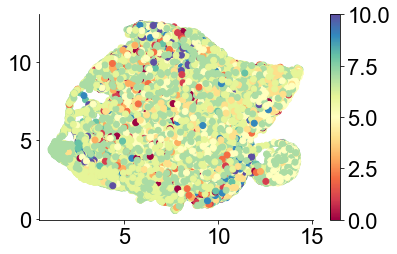

In [56]:
plt.scatter(C[0,:], C[1,:], c=Y, cmap='Spectral')
plt.colorbar()